# Data cleaning and preparation

In [1]:
#Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

In [2]:
#Importing data
df = pd.read_csv("Combined_Emot_Data.csv")

#Create a column that adds the total values for all basic emotions
df['total'] = df['anger'] + df['anticipation'] + df['disgust'] + df['fear'] + df['joy'] + df['sadness'] + df['surprise'] + df['trust']

#Create a list of basic emotions
emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust']

In [3]:
df.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,le_+,le_-,le_0,sent_score,sent_score_class,upper_error_class,lower_error_class,sent_polar,primary_basic_emot,total
0,1F308,🌈,0.00,0.28,0.00,0.00,0.69,0.06,0.22,0.33,...,0.582418,0.065934,0.351648,0.516484,Positive,Positive,Positive,Positive,joy,1.58
1,1F319,🌙,0.00,0.31,0.00,0.00,0.25,0.00,0.06,0.25,...,0.655738,0.065574,0.278689,0.590164,Positive,Positive,Positive,Positive,anticipation,0.87
2,1F31A,🌚,0.06,0.08,0.17,0.06,0.42,0.19,0.06,0.11,...,0.622517,0.158940,0.218543,0.463576,Positive,Positive,Positive,Positive,joy,1.15
3,1F31E,🌞,0.00,0.22,0.00,0.00,0.78,0.00,0.11,0.22,...,0.581818,0.024242,0.393939,0.557576,Positive,Positive,Positive,Positive,joy,1.33
4,1F31F,🌟,0.00,0.28,0.00,0.00,0.53,0.00,0.25,0.31,...,0.386139,0.059406,0.554455,0.326733,Positive,Positive,Positive,Positive,joy,1.37


In [4]:
#Creation of datasets using selected best smoothing method- Laplace Estimator
for emotion in emotions:
    df[emotion] = (df[emotion] + 1) / (df["total"] + 8)

In [5]:
#Check for null values
df.isnull().sum()

unicode               0
emoji                 0
anger                 0
anticipation          0
disgust               0
fear                  0
joy                   0
sadness               0
surprise              0
trust                 0
Position              0
Unicode block         0
le_+                  0
le_-                  0
le_0                  0
sent_score            0
sent_score_class      0
upper_error_class     0
lower_error_class     0
sent_polar            0
primary_basic_emot    0
total                 0
dtype: int64

In [6]:
df.shape

(149, 22)

# Feature Extraction-Distributed word vectors based on emotion words

Challenges cited in other work on the topic often relate to the lack of features associated with the emoji itself, making any prediction task challenging. The following section evaluates a range of options for feature extraction which may improve outcomes compared to options where limited features were cited as a challenge.

The following work aims to adapt a method previously proposed by *****. Given any emoji and basic emotion, the method compared the emoji and the basic emotion using their respective vectors. A similarity score based upon the cosine similarity metric will be generated, indicating the strength of association between the pair. The initial selection of cosine similarity score is based upon its frequency in use for similar NLP comparative work, most notably that which this method is adapting. The original work utilized a word embedding for emojis where vectors were generated based upon surrounding vocabulary within text. This approach is largely acceptable for the purposes of this work, with the exception of the word vector to incorporate emojis selected. This vector fails to account for incongruency in emoji sentiment and surrounding text being an indicator of figuratve language, but rather implies all emojis are used in such a manner that their sentiment is consistent with surrounding text. The converse is postulated to be case in this work therefore an alternative word embedding must be selected. Alternative methods for vector comparison will also be explored which may consider other characteristics of the data vectors to determine similarity.

The purpose of generating these values is to expand upon the data that can be gleaned from an emoji in order to make predictions regarding basic emotion affinities for emojis which are unseen in the EmoTag1200 dataset. The most common limitation cited when working with emojis for any form of machine learning is a lack of information contained in it compared to text. This is one such avenue which this work aims to explore to improve upon present state of the art in this regard.

In [364]:
#Importing libraries
from gensim.models import KeyedVectors
import gensim.downloader as api
from nltk import ngrams
from scipy.stats import weightedtau
import gensim as gsm

In [8]:
#Commented out as this took a long time previously

#Download the pre-trained Word2Vec model from Gensim data server (300d to match emoji vector)
#word2vec_model = api.load('word2vec-google-news-300')

#Define list of basic emotions to extract word vectors
#emotion_words = ['joy', 'anger', 'sadness', 'fear', 'surprise', 'disgust', 'anticipation', 'trust']

#Extract the word vectors for the basic emotions
#emotion_word_vectors = {word: word2vec_model[word] for word in emotion_words if word in word2vec_model}

#Save to a new file for later use
#output_file = 'basic_emot_vectors.txt'

#Get the vector size from the first word vector in the dictionary
#vector_size = len(emotion_word_vectors[list(emotion_word_vectors.keys())[0]])

#with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    #file.write(f"{len(emotion_word_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    #for word, vector in emotion_word_vectors.items():
        #vector_str = ' '.join(str(val) for val in vector)
        #file.write(f'{word} {vector_str}\n')

In [9]:
#Look at my emoji embedding
emoji2vec = KeyedVectors.load_word2vec_format('emoji2vec.txt', binary=False)

#Get the vocabulary size (number of emojis)
vocab_size = len(emoji2vec.key_to_index)
print("Vocabulary Size:", vocab_size)

#Get the dimensionality of the word embeddings
embedding_dim = emoji2vec.vector_size
print("Embedding Dimension:", embedding_dim)

Vocabulary Size: 1661
Embedding Dimension: 300


In [10]:
#Look at my basic emotion embedding
basic2vec = KeyedVectors.load_word2vec_format('basic_emot_vectors.txt', binary=False)

#Get the vocabulary size (number of words-basic emotions)
vocab_size = len(basic2vec.key_to_index)
print("Vocabulary Size:", vocab_size)

#Get the dimensionality of the word embeddings
embedding_dim = basic2vec.vector_size
print("Embedding Dimension:", embedding_dim)

Vocabulary Size: 8
Embedding Dimension: 300


In [11]:
#Use cosine similarity to compare

#Copy the dataset to store information for this test
df_basiccomp = df.copy()

#Generate list of basic emotions
emotions = ['anger', 'joy', 'sadness', 'fear', 'surprise', 'disgust', 'anticipation', 'trust']

#Define function to calculate cosine similarity between two vectors
def cosine_similarity(vector1, vector2):
    return np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))

#Loop through each emotion and calculate similarity scores for each emoji
for emotion in emotions:
    #Create a new column for the similarity score of each emoji with respect to the current emotion
    df_basiccomp[f'co_sim_{emotion}'] = df_basiccomp['emoji'].apply(lambda x: cosine_similarity(emoji2vec[x], basic2vec[emotion]) if x in emoji2vec else None)

#Display altered dataset
df_basiccomp.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,primary_basic_emot,total,co_sim_anger,co_sim_joy,co_sim_sadness,co_sim_fear,co_sim_surprise,co_sim_disgust,co_sim_anticipation,co_sim_trust
0,1F308,🌈,0.104384,0.133612,0.104384,0.104384,0.176409,0.110647,0.127349,0.138831,...,joy,1.58,0.212815,0.398045,0.307879,0.170043,0.168778,0.276684,0.141978,0.103585
1,1F319,🌙,0.112740,0.147689,0.112740,0.112740,0.140924,0.112740,0.119504,0.140924,...,anticipation,0.87,0.031860,0.097309,0.137938,0.102546,0.056646,0.071432,0.176522,0.040214
2,1F31A,🌚,0.115847,0.118033,0.127869,0.115847,0.155191,0.130055,0.115847,0.121311,...,joy,1.15,0.112067,0.165191,0.168149,0.186228,0.173427,0.126981,0.219476,0.101377
3,1F31E,🌞,0.107181,0.130761,0.107181,0.107181,0.190782,0.107181,0.118971,0.130761,...,joy,1.33,0.115099,0.183506,0.124933,0.159108,0.077226,0.162806,0.089916,0.037725
4,1F31F,🌟,0.106724,0.136606,0.106724,0.106724,0.163287,0.106724,0.133404,0.139808,...,joy,1.37,0.100389,0.269118,0.175544,0.122721,0.223669,0.129766,0.143079,0.081530


In [12]:
#Create lists to compare basic emotion values here to the similarity scores from word vectors
basic_emotions = ['anger', 'joy', 'sadness', 'fear', 'surprise', 'disgust', 'anticipation', 'trust']
cosine_sim_emotions = ['co_sim_anger', 'co_sim_joy', 'co_sim_sadness', 'co_sim_fear', 'co_sim_surprise',
                      'co_sim_disgust', 'co_sim_anticipation', 'co_sim_trust']

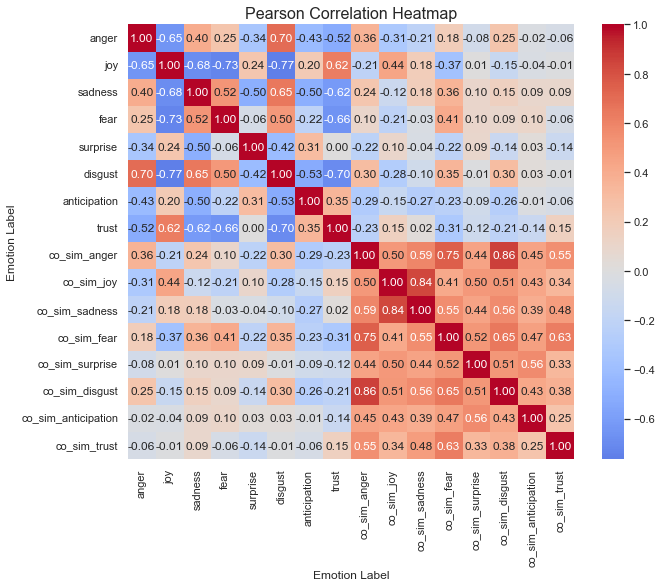

In [13]:
#Define columns to be included in the matric
cosin_eval = basic_emotions + cosine_sim_emotions

#Calculate Pearson correlation coefficients
correlation_matrix = df_basiccomp[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

# Binary Word Emotion Lexicons based on Emoji corpus similarity

In [14]:
#Load in EmoLex text file
emolex = pd.read_csv('NRC-Emotion-Lexicon-Wordlevel-v0.92.txt', sep='\t', header=None, names=['Word', 'Emotion', 'Value'])
emolex.head()

,Word,Emotion,Value
0,aback,anger,0
1,aback,anticipation,0
2,aback,disgust,0
3,aback,fear,0
4,aback,joy,0


In [15]:
#Check for null values
emolex.isnull().sum()

Word       10
Emotion     0
Value       0
dtype: int64

In [16]:
#Drop columns with null values for words
emolex.dropna(inplace=True)
emolex.isnull().sum()

Word       0
Emotion    0
Value      0
dtype: int64

In [17]:
#Create lists of words with associations to each basic emotion from the emolex lexicon
emotions = ['anger', 'joy', 'sadness', 'fear', 'surprise', 'disgust', 'anticipation', 'trust']
emotion_words_dict = {}

for emotion in emotions:
    filtered_df = emolex[(emolex['Value'] == 1) & (emolex['Emotion'] == emotion)]
    emotion_words = filtered_df['Word'].tolist()
    emotion_words_dict[emotion] = emotion_words

In [18]:
#Store lists in new variables
anger_words = emotion_words_dict['anger']
joy_words = emotion_words_dict['joy']
sadness_words = emotion_words_dict['sadness']
fear_words = emotion_words_dict['fear']
surprise_words = emotion_words_dict['surprise']
disgust_words = emotion_words_dict['disgust']
anticipation_words = emotion_words_dict['anticipation']
trust_words = emotion_words_dict['trust']

In [19]:
#Check length of the lists
len(sadness_words)

1187

In [20]:
#Make file containing word vectors for words which are associated with anger

#Download the pre-trained Word2Vec model from Gensim data server (300d to match emoji vector)
word2vec_model = api.load('word2vec-google-news-300')

#Extract the word vectors for the angry words
anger_vectors = {word: word2vec_model[word] for word in anger_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'anger_vectors.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(anger_vectors[list(anger_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(anger_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in anger_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [21]:
#Same process for joy

#Extract the word vectors
joy_vectors = {word: word2vec_model[word] for word in joy_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'joy_vectors.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(joy_vectors[list(joy_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(joy_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in joy_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [22]:
#Same process for sadness

#Extract the word vectors
sadness_vectors = {word: word2vec_model[word] for word in sadness_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'sadness_vectors.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(sadness_vectors[list(sadness_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(sadness_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in sadness_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [23]:
#Same process for fear

#Extract the word vectors
fear_vectors = {word: word2vec_model[word] for word in fear_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'fear_vectors.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(fear_vectors[list(fear_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(fear_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in fear_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [24]:
#Same process for surprise

#Extract the word vectors
surprise_vectors = {word: word2vec_model[word] for word in surprise_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'surprise_vectors.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(surprise_vectors[list(surprise_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(surprise_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in surprise_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [25]:
#Same process for disgust

#Extract the word vectors
disgust_vectors = {word: word2vec_model[word] for word in disgust_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'disgust_vectors.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(disgust_vectors[list(disgust_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(disgust_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in disgust_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [26]:
#Same process for anticipation

#Extract the word vectors
anticipation_vectors = {word: word2vec_model[word] for word in anticipation_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'anticipation_vectors.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(anticipation_vectors[list(anticipation_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(anticipation_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in anticipation_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [27]:
#Same process for trust

#Extract the word vectors
trust_vectors = {word: word2vec_model[word] for word in trust_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'trust_vectors.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(trust_vectors[list(trust_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(trust_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in trust_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [28]:
#Create new dataframe to contain the information for this test
df_binarycomp = df.copy()

In [29]:
#Load basic emotion vector file
basic2vec = KeyedVectors.load_word2vec_format('basic_emot_vectors.txt', binary=False)

In [30]:
#Use cosine similarity to compare

#Load associated words vector file
anger_vector = KeyedVectors.load_word2vec_format('anger_vectors.txt', binary=False)

#Create a list to store the similarity scores for each word
similarity_scores = []

#Define emotion vector for anger
basic_emotion_vector = basic2vec['anger']

#Define function to calculate cosine similarity between two vectors
def cosine_similarity(vector1, vector2):
    return np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))

#Loop through each words in anger_list and calculate similarity scores for each to the anger vector
for word in anger_words:
    if word in anger_vectors:
        word_vector = np.array(anger_vectors[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

#Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

#Get the top 10 most similar words
anger_top_10_similar_words = similarity_scores[:101]

In [31]:
#Repeat for other emotions- joy

#Load associated words vector file
joy_vector = KeyedVectors.load_word2vec_format('joy_vectors.txt', binary=False)

#Create a list to store the similarity scores for each word
similarity_scores = []

#Define emotion vector
basic_emotion_vector = basic2vec['joy']

#Define function to calculate cosine similarity between two vectors
def cosine_similarity(vector1, vector2):
    return np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))

#Loop through each words in anger_list and calculate similarity scores for each to the anger vector
for word in joy_words:
    if word in joy_vectors:
        word_vector = np.array(joy_vectors[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

#Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

#Get the top 10 most similar words
joy_top_10_similar_words = similarity_scores[:101]

In [32]:
#Repeat for other emotions- sadness

#Load associated words vector file
sadness_vector = KeyedVectors.load_word2vec_format('sadness_vectors.txt', binary=False)

#Create a list to store the similarity scores for each word
similarity_scores = []

#Define emotion vector
basic_emotion_vector = basic2vec['sadness']

#Define function to calculate cosine similarity between two vectors
def cosine_similarity(vector1, vector2):
    return np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))

#Loop through each words in anger_list and calculate similarity scores for each to the anger vector
for word in sadness_words:
    if word in sadness_vectors:
        word_vector = np.array(sadness_vectors[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

#Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

#Get the top 10 most similar words
sadness_top_10_similar_words = similarity_scores[:101]

In [33]:
#Repeat for other emotions- fear

#Load associated words vector file
fear_vector = KeyedVectors.load_word2vec_format('fear_vectors.txt', binary=False)

#Create a list to store the similarity scores for each word
similarity_scores = []

#Define emotion vector
basic_emotion_vector = basic2vec['fear']

#Define function to calculate cosine similarity between two vectors
def cosine_similarity(vector1, vector2):
    return np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))

#Loop through each words in anger_list and calculate similarity scores for each to the anger vector
for word in fear_words:
    if word in fear_vectors:
        word_vector = np.array(fear_vectors[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

#Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

#Get the top 10 most similar words
fear_top_10_similar_words = similarity_scores[:101]

In [34]:
#Repeat for other emotions- surprise

#Load associated words vector file
surprise_vector = KeyedVectors.load_word2vec_format('surprise_vectors.txt', binary=False)

#Create a list to store the similarity scores for each word
similarity_scores = []

#Define emotion vector
basic_emotion_vector = basic2vec['surprise']

#Define function to calculate cosine similarity between two vectors
def cosine_similarity(vector1, vector2):
    return np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))

#Loop through each words in anger_list and calculate similarity scores for each to the anger vector
for word in surprise_words:
    if word in surprise_vectors:
        word_vector = np.array(surprise_vectors[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

#Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

#Get the top 10 most similar words
surprise_top_10_similar_words = similarity_scores[:101]

In [35]:
#Repeat for other emotions- disgust

#Load associated words vector file
disgust_vector = KeyedVectors.load_word2vec_format('disgust_vectors.txt', binary=False)

#Create a list to store the similarity scores for each word
similarity_scores = []

#Define emotion vector 
basic_emotion_vector = basic2vec['disgust']

#Define function to calculate cosine similarity between two vectors
def cosine_similarity(vector1, vector2):
    return np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))

#Loop through each words in anger_list and calculate similarity scores for each to the anger vector
for word in disgust_words:
    if word in disgust_vectors:
        word_vector = np.array(disgust_vectors[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

#Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

#Get the top 10 most similar words
disgust_top_10_similar_words = similarity_scores[:101]

In [36]:
#Repeat for other emotions- anticipation

#Load associated words vector file
anticipation_vector = KeyedVectors.load_word2vec_format('anticipation_vectors.txt', binary=False)

#Create a list to store the similarity scores for each word
similarity_scores = []

#Define emotion vector
basic_emotion_vector = basic2vec['anticipation']

#Define function to calculate cosine similarity between two vectors
def cosine_similarity(vector1, vector2):
    return np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))

#Loop through each words in anger_list and calculate similarity scores for each to the anger vector
for word in anticipation_words:
    if word in anticipation_vectors:
        word_vector = np.array(anticipation_vectors[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

#Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

#Get the top 10 most similar words
anticipation_top_10_similar_words = similarity_scores[:101]

In [37]:
#Repeat for other emotions- trust

#Load associated words vector file
trust_vector = KeyedVectors.load_word2vec_format('trust_vectors.txt', binary=False)

#Create a list to store the similarity scores for each word
similarity_scores = []

#Define emotion vector
basic_emotion_vector = basic2vec['trust']

#Define function to calculate cosine similarity between two vectors
def cosine_similarity(vector1, vector2):
    return np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))

#Loop through each words in anger_list and calculate similarity scores for each to the anger vector
for word in trust_words:
    if word in trust_vectors:
        word_vector = np.array(trust_vectors[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

#Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

#Get the top 10 most similar words
trust_top_10_similar_words = similarity_scores[:101]

In [38]:
#Calculate the similarity score between the top 5 words and each emoji within the lexicon

#Make lists of the top 5 words for each from previous results- exclude the word itself (first in each list)
top_5_anger = [word_score[0] for word_score in anger_top_10_similar_words[1:6]]
top_5_joy = [word_score[0] for word_score in joy_top_10_similar_words[1:6]]
top_5_sadness = [word_score[0] for word_score in sadness_top_10_similar_words[1:6]]
top_5_fear = [word_score[0] for word_score in fear_top_10_similar_words[1:6]]
top_5_surprise = [word_score[0] for word_score in surprise_top_10_similar_words[1:6]]
top_5_disgust = [word_score[0] for word_score in disgust_top_10_similar_words[1:6]]
top_5_anticipation = [word_score[0] for word_score in anticipation_top_10_similar_words[1:6]]
top_5_trust = [word_score[0] for word_score in trust_top_10_similar_words[1:6]]

In [46]:
#Create a column to store the list of similarity scores for each word
df_binarycomp['top5_cosim_anger'] = None

#Define function to calculate cosine similarity between two vectors
def cosine_similarity(vector1, vector2):
    return np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))

#Loop through each emoji and calculate similarity scores for each word
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_5_anger:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], anger_vector[word]))
        else:
            similarity_scores.append(None)
    #Create a new column in the df which contains the top 5 cosine similarity scores lists
    df_binarycomp.at[index, 'top5_cosim_anger'] = similarity_scores
    
#Calculate the mean cosine similarity score for each
df_binarycomp['top5_cosim_anger'] = df_binarycomp['top5_cosim_anger'].apply(lambda row: np.mean([score for score in row if score is not None]))

C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [47]:
#Repeat for anticipation

#Create a column to store the list of similarity scores for each word
df_binarycomp['top5_cosim_anticipation'] = None

#Loop through each emoji and calculate similarity scores for each word
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_5_anticipation:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], anticipation_vector[word]))
        else:
            similarity_scores.append(None)
    #Create a new column in the df which contains the top 5 cosine similarity scores lists
    df_binarycomp.at[index, 'top5_cosim_anticipation'] = similarity_scores
    
#Calculate the mean cosine similarity score for each
df_binarycomp['top5_cosim_anticipation'] = df_binarycomp['top5_cosim_anticipation'].apply(lambda row: np.mean([score for score in row if score is not None]))

C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [48]:
#Repeat for disgust

#Create a column to store the list of similarity scores for each word
df_binarycomp['top5_cosim_disgust'] = None

#Loop through each emoji and calculate similarity scores for each word
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_5_disgust:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], disgust_vector[word]))
        else:
            similarity_scores.append(None)
    #Create a new column in the df which contains the top 5 cosine similarity scores lists
    df_binarycomp.at[index, 'top5_cosim_disgust'] = similarity_scores
    
#Calculate the mean cosine similarity score for each
df_binarycomp['top5_cosim_disgust'] = df_binarycomp['top5_cosim_disgust'].apply(lambda row: np.mean([score for score in row if score is not None]))

C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [49]:
#Repeat for fear

#Create a column to store the list of similarity scores for each word
df_binarycomp['top5_cosim_fear'] = None

#Loop through each emoji and calculate similarity scores for each word
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_5_fear:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], fear_vector[word]))
        else:
            similarity_scores.append(None)
    #Create a new column in the df which contains the top 5 cosine similarity scores lists
    df_binarycomp.at[index, 'top5_cosim_fear'] = similarity_scores
    
#Calculate the mean cosine similarity score for each
df_binarycomp['top5_cosim_fear'] = df_binarycomp['top5_cosim_fear'].apply(lambda row: np.mean([score for score in row if score is not None]))

C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [50]:
#Repeat for joy

#Create a column to store the list of similarity scores for each word
df_binarycomp['top5_cosim_joy'] = None

#Loop through each emoji and calculate similarity scores for each word
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_5_joy:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], joy_vector[word]))
        else:
            similarity_scores.append(None)
    #Create a new column in the df which contains the top 5 cosine similarity scores lists
    df_binarycomp.at[index, 'top5_cosim_joy'] = similarity_scores
    
#Calculate the mean cosine similarity score for each
df_binarycomp['top5_cosim_joy'] = df_binarycomp['top5_cosim_joy'].apply(lambda row: np.mean([score for score in row if score is not None]))

C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [51]:
#Repeat for sadness

#Create a column to store the list of similarity scores for each word
df_binarycomp['top5_cosim_sadness'] = None

#Loop through each emoji and calculate similarity scores for each word
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_5_sadness:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], sadness_vector[word]))
        else:
            similarity_scores.append(None)
    #Create a new column in the df which contains the top 5 cosine similarity scores lists
    df_binarycomp.at[index, 'top5_cosim_sadness'] = similarity_scores
    
#Calculate the mean cosine similarity score for each
df_binarycomp['top5_cosim_sadness'] = df_binarycomp['top5_cosim_sadness'].apply(lambda row: np.mean([score for score in row if score is not None]))

C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [52]:
#Repeat for surprise

#Create a column to store the list of similarity scores for each word
df_binarycomp['top5_cosim_surprise'] = None

#Loop through each emoji and calculate similarity scores for each word
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_5_surprise:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], surprise_vector[word]))
        else:
            similarity_scores.append(None)
    #Create a new column in the df which contains the top 5 cosine similarity scores lists
    df_binarycomp.at[index, 'top5_cosim_surprise'] = similarity_scores
    
#Calculate the mean cosine similarity score for each
df_binarycomp['top5_cosim_surprise'] = df_binarycomp['top5_cosim_surprise'].apply(lambda row: np.mean([score for score in row if score is not None]))

C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [53]:
#Repeat for trust

#Create a column to store the list of similarity scores for each word
df_binarycomp['top5_cosim_trust'] = None

#Loop through each emoji and calculate similarity scores for each word
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_5_trust:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], trust_vector[word]))
        else:
            similarity_scores.append(None)
    #Create a new column in the df which contains the top 5 cosine similarity scores lists
    df_binarycomp.at[index, 'top5_cosim_trust'] = similarity_scores
    
#Calculate the mean cosine similarity score for each
df_binarycomp['top5_cosim_trust'] = df_binarycomp['top5_cosim_trust'].apply(lambda row: np.mean([score for score in row if score is not None]))

C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [54]:
#Confirm transformation looks ok for new columns
df_binarycomp.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,primary_basic_emot,total,top5_cosim_anger,top5_cosim_anticipation,top5_cosim_disgust,top5_cosim_fear,top5_cosim_joy,top5_cosim_sadness,top5_cosim_surprise,top5_cosim_trust
0,1F308,🌈,0.104384,0.133612,0.104384,0.104384,0.176409,0.110647,0.127349,0.138831,...,joy,1.58,0.206920,0.179018,0.238860,0.165242,0.300116,0.256210,0.166351,0.220641
1,1F319,🌙,0.112740,0.147689,0.112740,0.112740,0.140924,0.112740,0.119504,0.140924,...,anticipation,0.87,0.020288,0.157387,0.057869,0.137267,0.132555,0.113825,0.110658,0.024497
2,1F31A,🌚,0.115847,0.118033,0.127869,0.115847,0.155191,0.130055,0.115847,0.121311,...,joy,1.15,0.078066,0.217421,0.110598,0.189244,0.199278,0.132979,0.180321,0.078135
3,1F31E,🌞,0.107181,0.130761,0.107181,0.107181,0.190782,0.107181,0.118971,0.130761,...,joy,1.33,0.100505,0.166704,0.148015,0.156528,0.188393,0.128153,0.125390,0.033600
4,1F31F,🌟,0.106724,0.136606,0.106724,0.106724,0.163287,0.106724,0.133404,0.139808,...,joy,1.37,0.113608,0.169053,0.108651,0.144306,0.255602,0.138513,0.184258,0.135268


In [55]:
#List rows with results
cosine_sim_emotions_5 = ['top5_cosim_anger', 'top5_cosim_joy', 'top5_cosim_sadness', 'top5_cosim_fear', 'top5_cosim_surprise',
                      'top5_cosim_disgust', 'top5_cosim_anticipation', 'top5_cosim_trust']

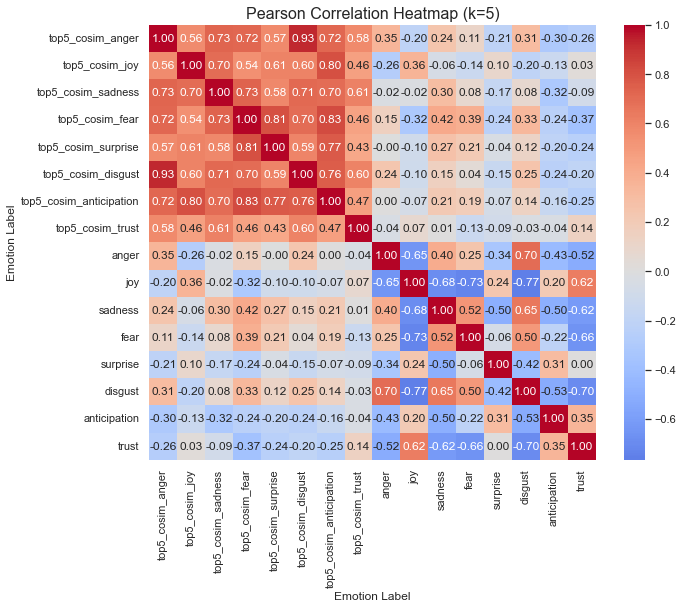

In [56]:
#Define columns for inclusion
cosin_eval = cosine_sim_emotions_5 + basic_emotions

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap (k=5)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

In [57]:
#Make lists for other k values

#k=10
top_10_anger = [word_score[0] for word_score in anger_top_10_similar_words[1:11]]
top_10_joy = [word_score[0] for word_score in joy_top_10_similar_words[1:11]]
top_10_sadness = [word_score[0] for word_score in sadness_top_10_similar_words[1:11]]
top_10_fear = [word_score[0] for word_score in fear_top_10_similar_words[1:11]]
top_10_surprise = [word_score[0] for word_score in surprise_top_10_similar_words[1:11]]
top_10_disgust = [word_score[0] for word_score in disgust_top_10_similar_words[1:11]]
top_10_anticipation = [word_score[0] for word_score in anticipation_top_10_similar_words[1:11]]
top_10_trust = [word_score[0] for word_score in trust_top_10_similar_words[1:11]]

#k=50
top_50_anger = [word_score[0] for word_score in anger_top_10_similar_words[1:51]]
top_50_joy = [word_score[0] for word_score in joy_top_10_similar_words[1:51]]
top_50_sadness = [word_score[0] for word_score in sadness_top_10_similar_words[1:51]]
top_50_fear = [word_score[0] for word_score in fear_top_10_similar_words[1:51]]
top_50_surprise = [word_score[0] for word_score in surprise_top_10_similar_words[1:51]]
top_50_disgust = [word_score[0] for word_score in disgust_top_10_similar_words[1:51]]
top_50_anticipation = [word_score[0] for word_score in anticipation_top_10_similar_words[1:51]]
top_50_trust = [word_score[0] for word_score in trust_top_10_similar_words[1:51]]

#k=100
top_100_anger = [word_score[0] for word_score in anger_top_10_similar_words[1:101]]
top_100_joy = [word_score[0] for word_score in joy_top_10_similar_words[1:101]]
top_100_sadness = [word_score[0] for word_score in sadness_top_10_similar_words[1:101]]
top_100_fear = [word_score[0] for word_score in fear_top_10_similar_words[1:101]]
top_100_surprise = [word_score[0] for word_score in surprise_top_10_similar_words[1:101]]
top_100_disgust = [word_score[0] for word_score in disgust_top_10_similar_words[1:101]]
top_100_anticipation = [word_score[0] for word_score in anticipation_top_10_similar_words[1:101]]
top_100_trust = [word_score[0] for word_score in trust_top_10_similar_words[1:101]]

In [58]:
#For each k value determine the cosine similarity score for anger

#k=10
df_binarycomp['top10_cosim_anger'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_10_anger:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], anger_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top10_cosim_anger'] = similarity_scores
df_binarycomp['top10_cosim_anger'] = df_binarycomp['top10_cosim_anger'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=50
df_binarycomp['top50_cosim_anger'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_50_anger:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], anger_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top50_cosim_anger'] = similarity_scores
df_binarycomp['top50_cosim_anger'] = df_binarycomp['top50_cosim_anger'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=100
df_binarycomp['top100_cosim_anger'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_100_anger:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], anger_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top100_cosim_anger'] = similarity_scores
df_binarycomp['top100_cosim_anger'] = df_binarycomp['top100_cosim_anger'].apply(lambda row: np.mean([score for score in row if score is not None]))


C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [59]:
#For each k value determine the cosine similarity score for joy

#k=10
df_binarycomp['top10_cosim_joy'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_10_joy:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], joy_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top10_cosim_joy'] = similarity_scores
df_binarycomp['top10_cosim_joy'] = df_binarycomp['top10_cosim_joy'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=50
df_binarycomp['top50_cosim_joy'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_50_joy:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], joy_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top50_cosim_joy'] = similarity_scores
df_binarycomp['top50_cosim_joy'] = df_binarycomp['top50_cosim_joy'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=100
df_binarycomp['top100_cosim_joy'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_100_joy:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], joy_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top100_cosim_joy'] = similarity_scores
df_binarycomp['top100_cosim_joy'] = df_binarycomp['top100_cosim_joy'].apply(lambda row: np.mean([score for score in row if score is not None]))


C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [60]:
#For each k value determine the cosine similarity score for sadness

#k=10
df_binarycomp['top10_cosim_sadness'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_10_sadness:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], sadness_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top10_cosim_sadness'] = similarity_scores
df_binarycomp['top10_cosim_sadness'] = df_binarycomp['top10_cosim_sadness'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=50
df_binarycomp['top50_cosim_sadness'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_50_sadness:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], sadness_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top50_cosim_sadness'] = similarity_scores
df_binarycomp['top50_cosim_sadness'] = df_binarycomp['top50_cosim_sadness'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=100
df_binarycomp['top100_cosim_sadness'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_100_sadness:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], sadness_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top100_cosim_sadness'] = similarity_scores
df_binarycomp['top100_cosim_sadness'] = df_binarycomp['top100_cosim_sadness'].apply(lambda row: np.mean([score for score in row if score is not None]))


C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [61]:
#For each k value determine the cosine similarity score for fear

#k=10
df_binarycomp['top10_cosim_fear'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_10_fear:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], fear_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top10_cosim_fear'] = similarity_scores
df_binarycomp['top10_cosim_fear'] = df_binarycomp['top10_cosim_fear'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=50
df_binarycomp['top50_cosim_fear'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_50_fear:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], fear_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top50_cosim_fear'] = similarity_scores
df_binarycomp['top50_cosim_fear'] = df_binarycomp['top50_cosim_fear'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=100
df_binarycomp['top100_cosim_fear'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_100_fear:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], fear_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top100_cosim_fear'] = similarity_scores
df_binarycomp['top100_cosim_fear'] = df_binarycomp['top100_cosim_fear'].apply(lambda row: np.mean([score for score in row if score is not None]))


C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [62]:
#For each k value determine the cosine similarity score for surprise

#k=10
df_binarycomp['top10_cosim_surprise'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_10_surprise:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], surprise_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top10_cosim_surprise'] = similarity_scores
df_binarycomp['top10_cosim_surprise'] = df_binarycomp['top10_cosim_surprise'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=50
df_binarycomp['top50_cosim_surprise'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_50_surprise:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], surprise_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top50_cosim_surprise'] = similarity_scores
df_binarycomp['top50_cosim_surprise'] = df_binarycomp['top50_cosim_surprise'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=100
df_binarycomp['top100_cosim_surprise'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_100_surprise:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], surprise_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top100_cosim_surprise'] = similarity_scores
df_binarycomp['top100_cosim_surprise'] = df_binarycomp['top100_cosim_surprise'].apply(lambda row: np.mean([score for score in row if score is not None]))


C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [63]:
#For each k value determine the cosine similarity score for disgust

#k=10
df_binarycomp['top10_cosim_disgust'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_10_disgust:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], disgust_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top10_cosim_disgust'] = similarity_scores
df_binarycomp['top10_cosim_disgust'] = df_binarycomp['top10_cosim_disgust'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=50
df_binarycomp['top50_cosim_disgust'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_50_disgust:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], disgust_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top50_cosim_disgust'] = similarity_scores
df_binarycomp['top50_cosim_disgust'] = df_binarycomp['top50_cosim_disgust'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=100
df_binarycomp['top100_cosim_disgust'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_100_disgust:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], disgust_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top100_cosim_disgust'] = similarity_scores
df_binarycomp['top100_cosim_disgust'] = df_binarycomp['top100_cosim_disgust'].apply(lambda row: np.mean([score for score in row if score is not None]))


C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [64]:
#For each k value determine the cosine similarity score for anticipation

#k=10
df_binarycomp['top10_cosim_anticipation'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_10_anticipation:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], anticipation_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top10_cosim_anticipation'] = similarity_scores
df_binarycomp['top10_cosim_anticipation'] = df_binarycomp['top10_cosim_anticipation'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=50
df_binarycomp['top50_cosim_anticipation'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_50_anticipation:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], anticipation_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top50_cosim_anticipation'] = similarity_scores
df_binarycomp['top50_cosim_anticipation'] = df_binarycomp['top50_cosim_anticipation'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=100
df_binarycomp['top100_cosim_anticipation'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_100_anticipation:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], anticipation_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top100_cosim_anticipation'] = similarity_scores
df_binarycomp['top100_cosim_anticipation'] = df_binarycomp['top100_cosim_anticipation'].apply(lambda row: np.mean([score for score in row if score is not None]))


C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [65]:
#For each k value determine the cosine similarity score for trust

#k=10
df_binarycomp['top10_cosim_trust'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_10_trust:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], trust_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top10_cosim_trust'] = similarity_scores
df_binarycomp['top10_cosim_trust'] = df_binarycomp['top10_cosim_trust'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=50
df_binarycomp['top50_cosim_trust'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_50_trust:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], trust_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top50_cosim_trust'] = similarity_scores
df_binarycomp['top50_cosim_trust'] = df_binarycomp['top50_cosim_trust'].apply(lambda row: np.mean([score for score in row if score is not None]))

#k=100
df_binarycomp['top100_cosim_trust'] = None
for index, row in df_binarycomp.iterrows():
    similarity_scores = []
    for word in top_100_trust:
        if row['emoji'] in emoji2vec:
            similarity_scores.append(cosine_similarity(emoji2vec[row['emoji']], trust_vector[word]))
        else:
            similarity_scores.append(None)
    df_binarycomp.at[index, 'top100_cosim_trust'] = similarity_scores
df_binarycomp['top100_cosim_trust'] = df_binarycomp['top100_cosim_trust'].apply(lambda row: np.mean([score for score in row if score is not None]))

C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\niamh\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [66]:
#Check the transformation
df_binarycomp.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,top100_cosim_surprise,top10_cosim_disgust,top50_cosim_disgust,top100_cosim_disgust,top10_cosim_anticipation,top50_cosim_anticipation,top100_cosim_anticipation,top10_cosim_trust,top50_cosim_trust,top100_cosim_trust
0,1F308,🌈,0.104384,0.133612,0.104384,0.104384,0.176409,0.110647,0.127349,0.138831,...,0.175712,0.239230,0.223353,0.215318,0.154938,0.151419,0.145318,0.210466,0.180293,0.172406
1,1F319,🌙,0.112740,0.147689,0.112740,0.112740,0.140924,0.112740,0.119504,0.140924,...,0.118254,0.045726,0.071756,0.085777,0.145046,0.132407,0.144047,0.030840,0.067619,0.065427
2,1F31A,🌚,0.115847,0.118033,0.127869,0.115847,0.155191,0.130055,0.115847,0.121311,...,0.177102,0.103649,0.126035,0.139794,0.193476,0.182303,0.183546,0.077552,0.093381,0.095905
3,1F31E,🌞,0.107181,0.130761,0.107181,0.107181,0.190782,0.107181,0.118971,0.130761,...,0.144044,0.117464,0.143329,0.153751,0.130062,0.126531,0.125553,0.040672,0.073018,0.077570
4,1F31F,🌟,0.106724,0.136606,0.106724,0.106724,0.163287,0.106724,0.133404,0.139808,...,0.194975,0.120978,0.138894,0.138994,0.161124,0.155351,0.150109,0.102974,0.100199,0.101586


In [67]:
#List rows with results

#k=10
cosine_sim_emotions_10 = ['top10_cosim_anger', 'top10_cosim_joy', 'top10_cosim_sadness', 'top10_cosim_fear', 'top10_cosim_surprise',
                      'top10_cosim_disgust', 'top10_cosim_anticipation', 'top10_cosim_trust']

#k=50
cosine_sim_emotions_50 = ['top50_cosim_anger', 'top50_cosim_joy', 'top50_cosim_sadness', 'top50_cosim_fear', 'top50_cosim_surprise',
                      'top50_cosim_disgust', 'top50_cosim_anticipation', 'top50_cosim_trust']

#k=100
cosine_sim_emotions_100 = ['top100_cosim_anger', 'top100_cosim_joy', 'top100_cosim_sadness', 'top100_cosim_fear', 'top100_cosim_surprise',
                      'top100_cosim_disgust', 'top100_cosim_anticipation', 'top100_cosim_trust']

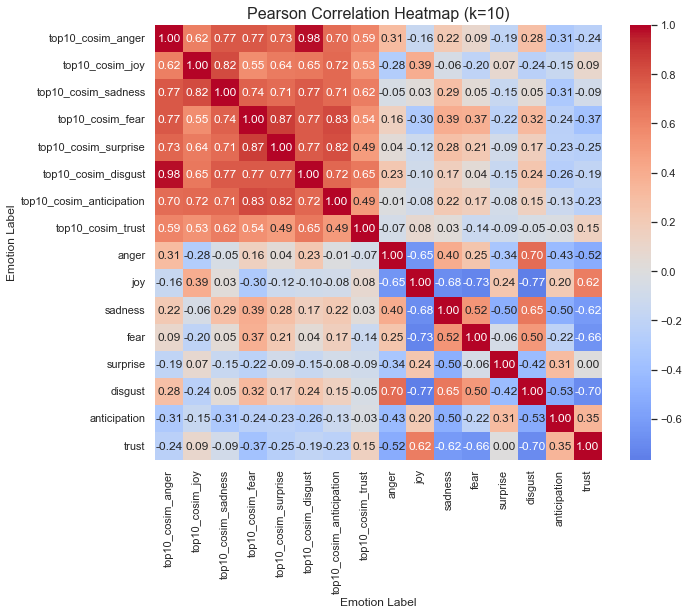

In [68]:
#Determine Pearsons correlations

#Define columns for inclusion
cosin_eval = cosine_sim_emotions_10 + basic_emotions

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap (k=10)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

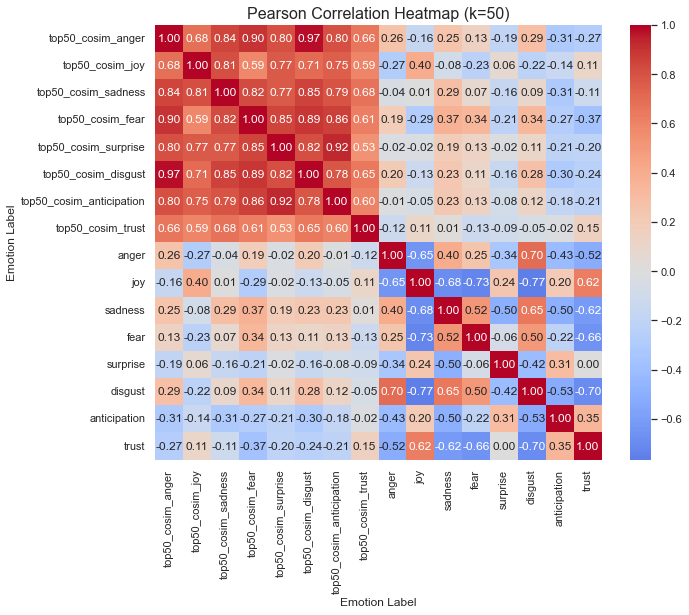

In [69]:
#Determine Pearsons correlations

#Define columns for inclusion
cosin_eval = cosine_sim_emotions_50 + basic_emotions

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap (k=50)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

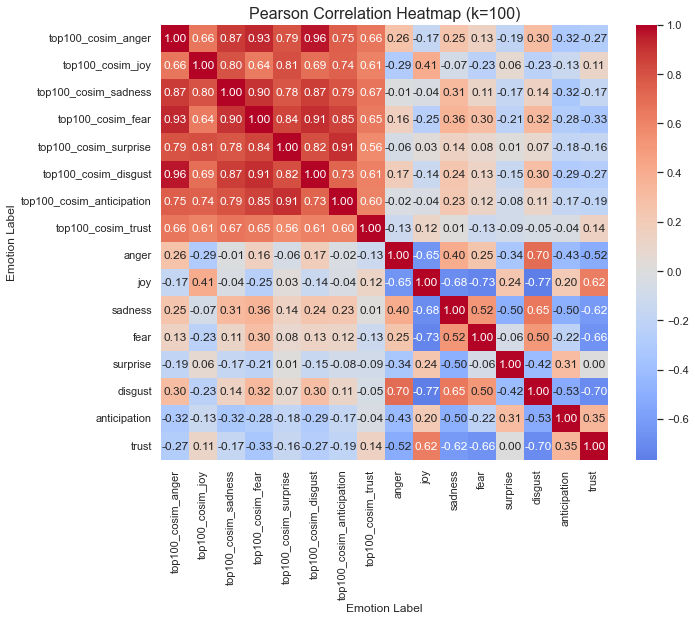

In [70]:
#Determine Pearsons correlations

#Define columns for inclusion
cosin_eval = cosine_sim_emotions_100 + basic_emotions

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap (k=100)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

# Word Intensity Lexicon

In [123]:
#Load in EmoLex text file
intlex = pd.read_csv('NRC-Emotion-Intensity-Lexicon-v1.txt', sep='\t', header=None, names=['Word', 'Emotion', 'Value'])
intlex.head()

,Word,Emotion,Value
0,outraged,anger,0.964
1,brutality,anger,0.959
2,hatred,anger,0.953
3,hateful,anger,0.940
4,terrorize,anger,0.939


In [124]:
#Check for null values
intlex.isnull().sum()

Word       0
Emotion    0
Value      0
dtype: int64

In [125]:
#Create lists of words with associations to each basic emotion from the intlex lexicon
emotions = ['anger', 'joy', 'sadness', 'fear', 'surprise', 'disgust', 'anticipation', 'trust']

#Create dictionaries to store words and their values for each emotion
word_dict = {emotion: [] for emotion in emotions}
value_dict = {emotion: [] for emotion in emotions}

#Iterate over the DataFrame and populate the dictionaries
for _, row in intlex.iterrows():
    word, emotion, value = row['Word'], row['Emotion'], row['Value']
    if emotion in emotions:
        word_dict[emotion].append(word)
        value_dict[emotion].append(value)
        
#Sort the words and values for each emotion in descending order
for emotion in emotions:
    sorted_indices = sorted(range(len(value_dict[emotion])), key=lambda k: value_dict[emotion][k], reverse=True)
    word_dict[emotion] = [word_dict[emotion][i] for i in sorted_indices]
    value_dict[emotion] = [value_dict[emotion][i] for i in sorted_indices]
    
#Create separate lists for each emotion and each word length (top 10, 100, and 300)
top_10_words = {emotion: word_dict[emotion][:10] for emotion in emotions}
top_100_words = {emotion: word_dict[emotion][:100] for emotion in emotions}
top_300_words = {emotion: word_dict[emotion][:300] for emotion in emotions}

In [126]:
#Check my lists work
top_10_words['anger'], top_100_words['joy']

(['outraged',
  'brutality',
  'hatred',
  'hateful',
  'terrorize',
  'violently',
  'infuriated',
  'furious',
  'furiously',
  'enraged'],
 ['happiest',
  'happiness',
  'bliss',
  'celebrating',
  'jubilant',
  'ecstatic',
  'elation',
  'beaming',
  'bestdayever',
  'loveee',
  'celebration',
  'awesomeness',
  'joy',
  'joyous',
  'fabulous',
  'happily',
  'excitement',
  'exuberance',
  'makesmehappy',
  'euphoria',
  'lovee',
  'gratitude',
  'happydance',
  'merriment',
  'spectacular',
  'overjoyed',
  'purebliss',
  'triumphant',
  'ecstasy',
  'lovelovelove',
  'cheerful',
  'cheer',
  'elated',
  'peaceofmind',
  'jolly',
  'delighted',
  'lovethis',
  'excitation',
  'exhilaration',
  'pleasures',
  'laugh',
  'marvelously',
  'loving',
  'joyful',
  'blissful',
  'outstanding',
  'pleasurable',
  'lovinglife',
  'enthusiastic',
  'glee',
  'iloveher',
  'yaaaay',
  'overthemoon',
  'happyplace',
  'sohappy',
  'superb',
  'woohoo',
  'laughing',
  'wonderful',
  'hooray

In [127]:
#Copy the dataset to store information for this test
df_intcomp = df.copy()

In [131]:
#Make file containing word vectors for words which are associated with anger

#Download the pre-trained Word2Vec model from Gensim data server (300d to match emoji vector)
#word2vec_model = api.load('word2vec-google-news-300')

#Extract the word vectors for the angry words
anger_vectors = {word: word2vec_model[word] for word in anger_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'anger_vectors_int.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(anger_vectors[list(anger_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(anger_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in anger_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [132]:
#Same process for joy

#Extract the word vectors
joy_vectors = {word: word2vec_model[word] for word in joy_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'joy_vectors_int.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(joy_vectors[list(joy_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(joy_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in joy_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [133]:
#Same process for sadness

#Extract the word vectors
sadness_vectors = {word: word2vec_model[word] for word in sadness_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'sadness_vectors_int.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(sadness_vectors[list(sadness_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(sadness_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in sadness_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [134]:
#Same process for fear

#Extract the word vectors
fear_vectors = {word: word2vec_model[word] for word in fear_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'fear_vectors_int.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(fear_vectors[list(fear_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(fear_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in fear_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [135]:
#Same process for surprise

#Extract the word vectors
surprise_vectors = {word: word2vec_model[word] for word in surprise_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'surprise_vectors_int.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(surprise_vectors[list(surprise_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(surprise_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in surprise_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [136]:
#Same process for disgust

#Extract the word vectors
disgust_vectors = {word: word2vec_model[word] for word in disgust_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'disgust_vectors_int.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(disgust_vectors[list(disgust_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(disgust_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in disgust_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [137]:
#Same process for anticipation

#Extract the word vectors
anticipation_vectors = {word: word2vec_model[word] for word in anticipation_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'anticipation_vectors_int.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(anticipation_vectors[list(anticipation_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(anticipation_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in anticipation_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [138]:
#Same process for trust

#Extract the word vectors
trust_vectors = {word: word2vec_model[word] for word in trust_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'trust_vectors_int.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(trust_vectors[list(trust_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(trust_vectors)} {vector_size}\n")

    #Write each emotion word and its corresponding vector to the file
    for word, vector in trust_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [128]:
#Define function to calculate the average cosine similarities for words with high affinity to each basic emotion
def average_similarity_intensity(emoji2vec, word_list, vector, column_name):
    #Initialize dictionary to store similarity scores
    emoji_similarity_scores = {} 

    #Iterate through each emoji in the df
    for emoji in df_intcomp['emoji']:
        similarity_scores = []
        if emoji in emoji2vec:
            emoji_vector = np.array(emoji2vec[emoji])
            for word in word_list:
                if word in vector:
                    word_vector = np.array(vector.get_vector(word))
                    similarity_score = cosine_similarity(emoji_vector, word_vector)
                    similarity_scores.append((word, similarity_score))
            emoji_similarity_scores[emoji] = similarity_scores
        else:
            emoji_similarity_scores[emoji] = []
        
        #Calculate the average similarity
        total_similarity_scores = 0
        num_words_with_similarity = 0
        
        for similarity_score in emoji_similarity_scores[emoji]:
            total_similarity_scores += similarity_score[1]
            num_words_with_similarity += 1
        
        if num_words_with_similarity > 0:
            average_similarity_score = total_similarity_scores / num_words_with_similarity
        else:
            average_similarity_score = 0
    
        #Append the average similarity to the list
        emoji_similarity_scores[emoji] = average_similarity_score
    
    #Add new column to the dataframe
    df_intcomp[column_name] = list(emoji_similarity_scores.values())

In [129]:
#Define vectors for each emotion
anger_vector = KeyedVectors.load_word2vec_format('anger_vectors_int.txt', binary=False)
joy_vector = KeyedVectors.load_word2vec_format('joy_vectors_int.txt', binary=False)
sadness_vector = KeyedVectors.load_word2vec_format('sadness_vectors_int.txt', binary=False)
fear_vector = KeyedVectors.load_word2vec_format('fear_vectors_int.txt', binary=False)
surprise_vector = KeyedVectors.load_word2vec_format('surprise_vectors_int.txt', binary=False)
disgust_vector = KeyedVectors.load_word2vec_format('disgust_vectors_int.txt', binary=False)
anticipation_vector = KeyedVectors.load_word2vec_format('anticipation_vectors_int.txt', binary=False)
trust_vector = KeyedVectors.load_word2vec_format('trust_vectors_int.txt', binary=False)

In [130]:
#Apply the function for each case

#Anger
average_similarity_intensity(emoji2vec, top_10_words['anger'], anger_vector, 'top_10_anger')
average_similarity_intensity(emoji2vec, top_100_words['anger'], anger_vector, 'top_100_anger')
average_similarity_intensity(emoji2vec, top_300_words['anger'], anger_vector, 'top_300_anger')

#Joy
average_similarity_intensity(emoji2vec, top_10_words['joy'], joy_vector, 'top_10_joy')
average_similarity_intensity(emoji2vec, top_100_words['joy'], joy_vector, 'top_100_joy')
average_similarity_intensity(emoji2vec, top_300_words['joy'], joy_vector, 'top_300_joy')

#Sadness
average_similarity_intensity(emoji2vec, top_10_words['sadness'], sadness_vector, 'top_10_sadness')
average_similarity_intensity(emoji2vec, top_100_words['sadness'], sadness_vector, 'top_100_sadness')
average_similarity_intensity(emoji2vec, top_300_words['sadness'], sadness_vector, 'top_300_sadness')

#Fear
average_similarity_intensity(emoji2vec, top_10_words['fear'], anger_vector, 'top_10_fear')
average_similarity_intensity(emoji2vec, top_100_words['fear'], anger_vector, 'top_100_fear')
average_similarity_intensity(emoji2vec, top_300_words['fear'], anger_vector, 'top_300_fear')

#Surprise
average_similarity_intensity(emoji2vec, top_10_words['surprise'], surprise_vector, 'top_10_surprise')
average_similarity_intensity(emoji2vec, top_100_words['surprise'], surprise_vector, 'top_100_surprise')
average_similarity_intensity(emoji2vec, top_300_words['surprise'], surprise_vector, 'top_300_surprise')

#Disgust
average_similarity_intensity(emoji2vec, top_10_words['disgust'], disgust_vector, 'top_10_disgust')
average_similarity_intensity(emoji2vec, top_100_words['disgust'], disgust_vector, 'top_100_disgust')
average_similarity_intensity(emoji2vec, top_300_words['disgust'], disgust_vector, 'top_300_disgust')

#Anticipation
average_similarity_intensity(emoji2vec, top_10_words['anticipation'], anticipation_vector, 'top_10_anticipation')
average_similarity_intensity(emoji2vec, top_100_words['anticipation'], anticipation_vector, 'top_100_anticipation')
average_similarity_intensity(emoji2vec, top_300_words['anticipation'], anticipation_vector, 'top_300_anticipation')

#Disgust
average_similarity_intensity(emoji2vec, top_10_words['trust'], trust_vector, 'top_10_trust')
average_similarity_intensity(emoji2vec, top_100_words['trust'], trust_vector, 'top_100_trust')
average_similarity_intensity(emoji2vec, top_300_words['trust'], trust_vector, 'top_300_trust')

#Display the transformation 
df_intcomp.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,top_300_surprise,top_10_disgust,top_100_disgust,top_300_disgust,top_10_anticipation,top_100_anticipation,top_300_anticipation,top_10_trust,top_100_trust,top_300_trust
0,1F308,🌈,0.104384,0.133612,0.104384,0.104384,0.176409,0.110647,0.127349,0.138831,...,0.153062,0.102154,0.154704,0.164264,0.185449,0.146708,0.155051,0.197973,0.160776,0.156869
1,1F319,🌙,0.112740,0.147689,0.112740,0.112740,0.140924,0.112740,0.119504,0.140924,...,0.123362,0.130971,0.117577,0.115691,0.128897,0.137591,0.123560,0.063946,0.062166,0.074967
2,1F31A,🌚,0.115847,0.118033,0.127869,0.115847,0.155191,0.130055,0.115847,0.121311,...,0.169715,0.159374,0.165188,0.162492,0.199253,0.168925,0.158451,0.111742,0.097391,0.108482
3,1F31E,🌞,0.107181,0.130761,0.107181,0.107181,0.190782,0.107181,0.118971,0.130761,...,0.159596,0.141469,0.154912,0.157442,0.113188,0.117350,0.121957,0.108786,0.068959,0.084734
4,1F31F,🌟,0.106724,0.136606,0.106724,0.106724,0.163287,0.106724,0.133404,0.139808,...,0.156836,0.117737,0.120429,0.129404,0.176525,0.149368,0.151102,0.124303,0.111697,0.114273


In [139]:
#List rows with results

#k=10
cosine_sim_emotions_10 = ['top_10_anger', 'top_10_joy', 'top_10_sadness', 'top_10_fear', 'top_10_surprise',
                      'top_10_disgust', 'top_10_anticipation', 'top_10_trust']

#k=100
cosine_sim_emotions_100 = ['top_100_anger', 'top_100_joy', 'top_100_sadness', 'top_100_fear', 'top_100_surprise',
                      'top_100_disgust', 'top_100_anticipation', 'top_100_trust']

#k=300
cosine_sim_emotions_300 = ['top_300_anger', 'top_300_joy', 'top_300_sadness', 'top_300_fear', 'top_300_surprise',
                      'top_300_disgust', 'top_300_anticipation', 'top_300_trust']

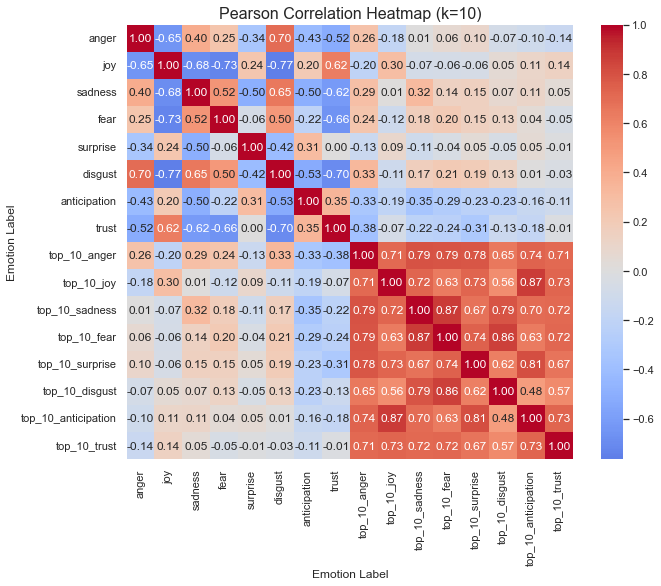

In [140]:
#Determine pearsons correlation k=10

#Define columns to be included in the matric
cosin_eval = basic_emotions + cosine_sim_emotions_10

#Calculate Pearson correlation coefficients
correlation_matrix = df_intcomp[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap (k=10)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

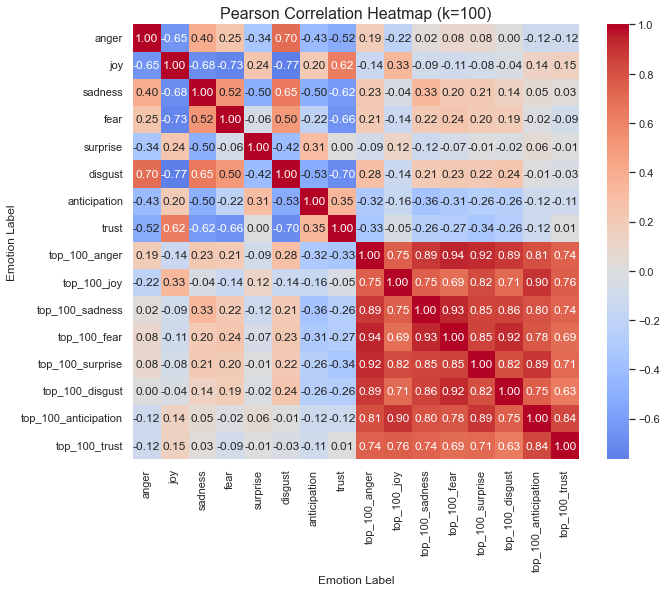

In [141]:
#Determine pearsons correlation k=100

#Define columns to be included in the matric
cosin_eval = basic_emotions + cosine_sim_emotions_100

#Calculate Pearson correlation coefficients
correlation_matrix = df_intcomp[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap (k=100)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

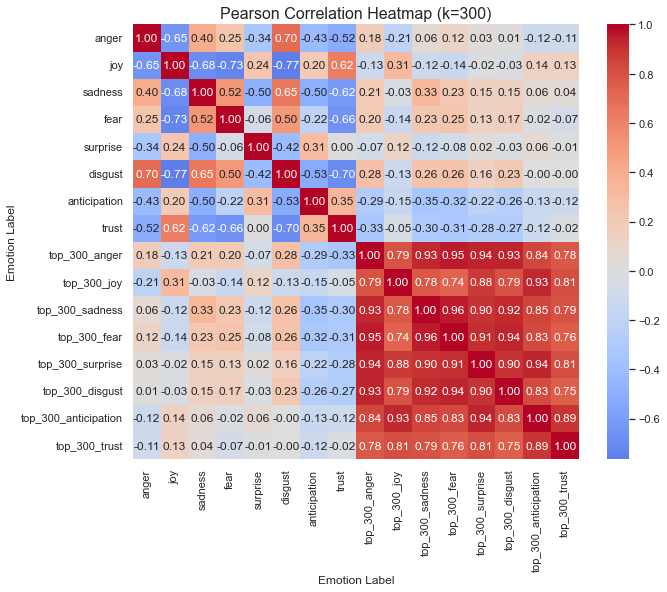

In [142]:
#Determine pearsons correlation k=300

#Define columns to be included in the matric
cosin_eval = basic_emotions + cosine_sim_emotions_300

#Calculate Pearson correlation coefficients
correlation_matrix = df_intcomp[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap (k=300)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

# Alternative methodology

In [308]:
#Importing libraries
import copy
import itertools
from sklearn.decomposition import PCA

In [163]:
emolex.head()

,Word,Emotion,Value
0,aback,anger,0
1,aback,anticipation,0
2,aback,disgust,0
3,aback,fear,0
4,aback,joy,0


In [164]:
#Make a copy of the emolex df for processing
emolex_copy = emolex.copy()

#Drop duplicates of words
emolex_copy.drop_duplicates(subset='Word', inplace=True)

#Make a list of the words in the lexicon
emotion_words = emolex_copy['Word'].tolist()

emotion_words

['aback',
 'abacus',
 'abandon',
 'abandoned',
 'abandonment',
 'abate',
 'abatement',
 'abba',
 'abbot',
 'abbreviate',
 'abbreviation',
 'abdomen',
 'abdominal',
 'abduction',
 'aberrant',
 'aberration',
 'abeyance',
 'abhor',
 'abhorrent',
 'abide',
 'ability',
 'abject',
 'ablation',
 'ablaze',
 'abnormal',
 'aboard',
 'abode',
 'abolish',
 'abolition',
 'abominable',
 'abomination',
 'aboriginal',
 'abort',
 'abortion',
 'abortive',
 'abound',
 'abovementioned',
 'abrasion',
 'abroad',
 'abrogate',
 'abrupt',
 'abruptly',
 'abscess',
 'absence',
 'absent',
 'absentee',
 'absenteeism',
 'absinthe',
 'absolute',
 'absolution',
 'absorbed',
 'absorbent',
 'absorbing',
 'absorption',
 'abstain',
 'abstention',
 'abstinence',
 'abstract',
 'abstraction',
 'absurd',
 'absurdity',
 'abundance',
 'abundant',
 'abuse',
 'abutment',
 'aby',
 'abysmal',
 'abyss',
 'academic',
 'academy',
 'accede',
 'accelerate',
 'acceleration',
 'accent',
 'accentuate',
 'accept',
 'acceptable',
 'acceptan

In [306]:
#Repeat for intlex

#Make a copy of the emolex df for processing
intlex_copy = intlex.copy()

#Drop duplicates of words
intlex_copy.drop_duplicates(subset='Word', inplace=True)

#Make a list of the words in the lexicon
emotion_words_int = intlex_copy['Word'].tolist()

emotion_words_int

['outraged',
 'brutality',
 'hatred',
 'hateful',
 'terrorize',
 'violently',
 'infuriated',
 'furious',
 'furiously',
 'enraged',
 'screwyou',
 'murderer',
 'fury',
 'execution',
 'angered',
 'savagery',
 'slaughtering',
 'veryangry',
 'assassinate',
 'annihilation',
 'fuckoff',
 'rage',
 'loathe',
 'fucktard',
 'roadrage',
 'damnation',
 'homicidal',
 'furor',
 'hostile',
 'annihilate',
 'murder',
 'raging',
 'sopissed',
 'infuriates',
 'pissed',
 'rape',
 'ferocious',
 'vengeful',
 'obliterated',
 'explosive',
 'killing',
 'combative',
 'vengeance',
 'gofuckyourself',
 'torment',
 'wrath',
 'vicious',
 'massacre',
 'threatening',
 'abhorrent',
 'bloodthirsty',
 'pissoff',
 'fighting',
 'attacking',
 'annihilated',
 'angriest',
 'bloodshed',
 'smite',
 'brawl',
 'malicious',
 'assassination',
 'strangle',
 'hostility',
 'assault',
 'explode',
 'tirade',
 'loathsome',
 'hell',
 'murderous',
 'attack',
 'malice',
 'terrorism',
 'beating',
 'outrage',
 'desecration',
 'pissingmeoff',
 '

In [165]:
len(emotion_words)

14153

In [189]:
#Extract vectors for all of the words in the lexicon

#Download the pre-trained Word2Vec model from Gensim data server (300d to match emoji vector)
#word2vec_model = api.load('word2vec-google-news-300')

#Extract the word vectors
emotion_word_vectors = {word: word2vec_model[word] for word in emotion_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'all_vectors_emolex.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(emotion_word_vectors[list(emotion_word_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(emotion_word_vectors)} {vector_size}\n")

    #Write each word and its corresponding vector to the file
    for word, vector in emotion_word_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [307]:
#Repeat for intlex

#Extract the word vectors
emotion_word_vectors_int = {word: word2vec_model[word] for word in emotion_words_int if word in word2vec_model}

#Save to a new file for later use
output_file = 'all_vectors_intlex.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(emotion_word_vectors_int[list(emotion_word_vectors_int.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(emotion_word_vectors_int)} {vector_size}\n")

    #Write each word and its corresponding vector to the file
    for word, vector in emotion_word_vectors_int.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [169]:
#Read in files for pairs of words with antonyms/synonyms
adj1 = pd.read_csv('adjectives.test', sep='\t', header=None, names=['Word1', 'Word2', 'Label'])
adj2 = pd.read_csv('adjectives.train', sep='\t', header=None, names=['Word1', 'Word2', 'Label'])
adj3 = pd.read_csv('adjectives.val', sep='\t', header=None, names=['Word1', 'Word2', 'Label'])

noun1 = pd.read_csv('nouns.test', sep='\t', header=None, names=['Word1', 'Word2', 'Label'])
noun2 = pd.read_csv('nouns.train', sep='\t', header=None, names=['Word1', 'Word2', 'Label'])
noun3 = pd.read_csv('nouns.val', sep='\t', header=None, names=['Word1', 'Word2', 'Label'])

verb1 = pd.read_csv('verbs.test', sep='\t', header=None, names=['Word1', 'Word2', 'Label'])
verb2 = pd.read_csv('verbs.train', sep='\t', header=None, names=['Word1', 'Word2', 'Label'])
verb3 = pd.read_csv('verbs.val', sep='\t', header=None, names=['Word1', 'Word2', 'Label'])

#List of dfs
data_frames = [adj1, adj2, adj3, noun1, noun2, noun3, verb1, verb2, verb3]

#Combine the dfs
combined_df = pd.concat(data_frames, ignore_index=True)

In [171]:
#Look at the df
combined_df.head(10)
#0 is synonym pairs, 1 is antonym pairs

,Word1,Word2,Label
0,thick,stocky,0
1,unstressed,stressed,1
2,miraculous,natural,1
3,honest,incorruptible,0
4,fourth,4th,0
5,immaterial,material,1
6,conventional,unconventional,1
7,confusing,clear,1
8,indivisible,divisible,1
9,fissionable,fissile,0


In [172]:
#Separate out synonyms and antonyms
synonym = combined_df[combined_df['Label'] == 0]
antonym = combined_df[combined_df['Label'] == 1]

In [198]:
#Format data as lists of tuples 
synonymous_pairs = [(row["Word1"], row["Word2"]) for _, row in synonym.iterrows()]
antonymous_pairs = [(row["Word1"], row["Word2"]) for _, row in antonym.iterrows()]
synonymous_pairs

[('thick', 'stocky'),
 ('honest', 'incorruptible'),
 ('fourth', '4th'),
 ('fissionable', 'fissile'),
 ('key', 'central'),
 ('obscure', 'esoteric'),
 ('sad', 'gloomy'),
 ('dignified', 'majestic'),
 ('distinctive', 'typical'),
 ('pompous', 'pretentious'),
 ('special', 'limited'),
 ('stupid', 'fat'),
 ('calm', 'peaceful'),
 ('diseased', 'sick'),
 ('heavy', 'pregnant'),
 ('bright', 'brilliant'),
 ('aerodynamic', 'streamlined'),
 ('outspoken', 'blunt'),
 ('snowy', 'white'),
 ('wide', 'full'),
 ('recent', 'low'),
 ('quick', 'swift'),
 ('cheap', 'gaudy'),
 ('white', 'pale'),
 ('slow', 'dull'),
 ('male', 'bad'),
 ('ponderous', 'heavy'),
 ('immoral', 'dishonest'),
 ('offensive', 'abusive'),
 ('intimate', 'sexual'),
 ('swampy', 'waterlogged'),
 ('taut', 'close'),
 ('elder', 'old'),
 ('large', 'giant'),
 ('oval', 'ovoid'),
 ('modern', 'new'),
 ('juicy', 'succulent'),
 ('oral', 'verbal'),
 ('simple', 'direct'),
 ('permanent', 'constant'),
 ('bogus', 'fake'),
 ('patriotic', 'loyal'),
 ('possible', 

In [186]:
#Create a dataset with pairs of words with opposite polarity
opposites = pd.read_csv('opposite_pairs.csv', header=None, index_col=False)
opposites.head()

,0,1
0,absent,present
1,abundant,scarce
2,accept,decline
3,accurate,inaccurate
4,admit,deny


In [188]:
#Add names to the columns
opposites = opposites.rename(columns={0: 'Word1', 1: 'Word2'})
opposites.head()

,Word1,Word2
0,absent,present
1,abundant,scarce
2,accept,decline
3,accurate,inaccurate
4,admit,deny


In [199]:
#Format data as a list of tuples 
opposite_pairs = [(row["Word1"], row["Word2"]) for _, row in opposites.iterrows()]

In [200]:
#Opposites and antonyms can be added together, they are both doing the same thing
antonymous_pairs = antonymous_pairs + opposite_pairs

In [201]:
#Check for a reasonable balance in data
len(antonymous_pairs), len(synonymous_pairs)

(8173, 7816)

In [203]:
#Get the vectors for all the words that will be used

#Make list with all words
word_pairs = antonymous_pairs + synonymous_pairs
all_words = [word for pair in word_pairs for word in pair]
all_words

['unstressed',
 'stressed',
 'miraculous',
 'natural',
 'immaterial',
 'material',
 'conventional',
 'unconventional',
 'confusing',
 'clear',
 'indivisible',
 'divisible',
 'unpaved',
 'paved',
 'mathematical',
 'questionable',
 'weakened',
 'strong',
 'detached',
 'attached',
 'raw',
 'polished',
 'bald',
 'bearded',
 'antagonistic',
 'positive',
 'hungry',
 'thirsty',
 'sterile',
 'fertile',
 'right',
 'incorrect',
 'doubtful',
 'sure',
 'mechanical',
 'mental',
 'probable',
 'unlikely',
 'generous',
 'stingy',
 'poor',
 'sufficient',
 'unsaturated',
 'saturated',
 'confident',
 'shy',
 'medial',
 'distal',
 'unfair',
 'fair',
 'tender',
 'tough',
 'astronomical',
 'little',
 'northwestern',
 'eastern',
 'intense',
 'dull',
 'defensive',
 'offensive',
 'impermeable',
 'permeable',
 'unsure',
 'certain',
 'accurate',
 'inaccurate',
 'spiritual',
 'sensuous',
 'shabby',
 'new',
 'poor',
 'adequate',
 'disagreeable',
 'agreeable',
 'written',
 'oral',
 'good',
 'faulty',
 'civil',
 'ru

In [204]:
#Remove duplicates
all_words = [word for index, word in enumerate(all_words) if word not in all_words[:index]]

In [205]:
#Extract the word vectors
word_vectors = {word: word2vec_model[word] for word in all_words if word in word2vec_model}

#Save to a new file for later use
output_file = 'all_vectors_optimization.txt'

#Get the vector size from the first word vector in the dictionary
vector_size = len(word_vectors[list(word_vectors.keys())[0]])

with open(output_file, 'w', encoding='utf-8') as file:
    #Write the first line with vocabulary size and vector size
    file.write(f"{len(word_vectors)} {vector_size}\n")

    #Write each word and its corresponding vector to the file
    for word, vector in word_vectors.items():
        vector_str = ' '.join(str(val) for val in vector)
        file.write(f'{word} {vector_str}\n')

In [257]:
#Filter out pairs with missing words the word vector
synonymous_pairs = [(word1, word2) for word1, word2 in synonymous_pairs if word1 in word_vectors and word2 in word_vectors]
antonymous_pairs = [(word1, word2) for word1, word2 in antonymous_pairs if word1 in word_vectors and word2 in word_vectors]

In [258]:
antonymous_pairs

[('unstressed', 'stressed'),
 ('miraculous', 'natural'),
 ('immaterial', 'material'),
 ('conventional', 'unconventional'),
 ('confusing', 'clear'),
 ('indivisible', 'divisible'),
 ('unpaved', 'paved'),
 ('mathematical', 'questionable'),
 ('weakened', 'strong'),
 ('detached', 'attached'),
 ('raw', 'polished'),
 ('bald', 'bearded'),
 ('antagonistic', 'positive'),
 ('hungry', 'thirsty'),
 ('sterile', 'fertile'),
 ('right', 'incorrect'),
 ('doubtful', 'sure'),
 ('mechanical', 'mental'),
 ('probable', 'unlikely'),
 ('generous', 'stingy'),
 ('poor', 'sufficient'),
 ('unsaturated', 'saturated'),
 ('confident', 'shy'),
 ('medial', 'distal'),
 ('unfair', 'fair'),
 ('tender', 'tough'),
 ('astronomical', 'little'),
 ('northwestern', 'eastern'),
 ('intense', 'dull'),
 ('defensive', 'offensive'),
 ('impermeable', 'permeable'),
 ('unsure', 'certain'),
 ('accurate', 'inaccurate'),
 ('spiritual', 'sensuous'),
 ('shabby', 'new'),
 ('poor', 'adequate'),
 ('disagreeable', 'agreeable'),
 ('written', 'oral

In [293]:
#Define a function for cosine similarity
def cosine_similarity(v1, v2):
    dot_product = np.dot(v1, v2)
    norm_v1 = np.linalg.norm(v1)
    norm_v2 = np.linalg.norm(v2)
    return dot_product / (norm_v1 * norm_v2)

In [251]:
#Check that this works
word1 = 'hot'
word2 = 'cold'

similarity = cosine_similarity(word_vectors[word1], word_vectors[word2])
print(f"Similarity score: {similarity}")

Similarity score: 0.46021389961242676


In [259]:
#Check that this works
word1 = 'hot'
word2 = 'material'

similarity = cosine_similarity(word_vectors[word1], word_vectors[word2])
print(f"Similarity score: {similarity}")

Similarity score: 0.005139388609677553


In [294]:
#Define the objective function
def objective_function(word_vectors, synonymous_pairs, antonymous_pairs, beta=0.2):
    loss = 0.0

    #Encourage synonyms to be close together
    for word1, word2 in synonymous_pairs:
        v1 = word_vectors[word1]
        v2 = word_vectors[word2]
        v1_prime = v1 + learning_rate * (v2 - v1)
        v2_prime = v2 + learning_rate * (v1 - v2)
        loss -= cosine_similarity(v1_prime, v2_prime)
    
    #Encourage antonyms to be far apart
    for word1, word2 in antonymous_pairs:
        v1 = word_vectors[word1]
        v2 = word_vectors[word2]
        v1_prime = v1 + learning_rate * (v2 - v1)
        v2_prime = v2 + learning_rate * (v1 - v2)
        loss += max(0, 1 - cosine_similarity(v1_prime, v2_prime))

    return loss

In [300]:
#Try to improve features using gradient descent

#Make a deep copy of the word_vectors
word_vectors_copy = copy.deepcopy(word_vectors)

#Define hyperparameter space
learning_rates = [0.3, 0.4, 0.5, 0.6, 0.7]
num_iterations = 250

best_loss = float('inf')
best_hyperparameters = {}

#Use grid search as only learning rate is to be optimised
for learning_rate in learning_rates:
    for iteration in range(num_iterations):

        #Compute the gradient of the objective function with respect to each word vector
        gradients = {word: np.zeros_like(word_vectors_copy[word]) for word in word_vectors_copy}

        for word1, word2 in synonymous_pairs + antonymous_pairs:
            v1 = word_vectors_copy[word1]
            v2 = word_vectors_copy[word2]

            #Compute the gradient for each word vector and accumulate
            v1_prime = v1 + learning_rate * (v2 - v1)
            v2_prime = v2 + learning_rate * (v1 - v2)

            if cosine_similarity(v1_prime, v2_prime) < 1:
                gradient_v1 = -v2_prime
                gradient_v2 = -v1_prime
            else:
                gradient_v1 = np.zeros_like(v1_prime)
                gradient_v2 = np.zeros_like(v2_prime)

            #Accumulate the gradients for each word vector
            gradients[word1] += gradient_v1
            gradients[word2] += gradient_v2

        #Update the word vectors using the gradients and learning rate
        for word in word_vectors_copy:
            word_vectors_copy[word] += gradients[word]
        
            #Normalize the updated word vector to have unit length
            word_vectors_copy[word] /= np.linalg.norm(word_vectors_copy[word])

        #Compute and print the total loss for this iteration
        total_loss = objective_function(word_vectors_copy, synonymous_pairs, antonymous_pairs)
        print(f"Iteration {iteration + 1}, Loss: {total_loss:.4f}")
        
         #Check if the current hyperparameters give a better loss
        if total_loss < best_loss:
            best_loss = total_loss
            best_hyperparameters = {'learning_rate': learning_rate}
            
#Print the optimal outcome
print("Best hyperparameters:", best_hyperparameters)
print("Best loss:", best_loss)

Iteration 1, Loss: 5252.3826
Iteration 2, Loss: 3047.5154
Iteration 3, Loss: 1642.2983
Iteration 4, Loss: 708.9343
Iteration 5, Loss: 113.4834
Iteration 6, Loss: -296.9068
Iteration 7, Loss: -580.0368
Iteration 8, Loss: -788.6782
Iteration 9, Loss: -938.8403
Iteration 10, Loss: -1052.6771
Iteration 11, Loss: -1137.2709
Iteration 12, Loss: -1204.8280
Iteration 13, Loss: -1256.9237
Iteration 14, Loss: -1299.7005
Iteration 15, Loss: -1333.7425
Iteration 16, Loss: -1362.4854
Iteration 17, Loss: -1385.2637
Iteration 18, Loss: -1404.2114
Iteration 19, Loss: -1418.4660
Iteration 20, Loss: -1430.4404
Iteration 21, Loss: -1441.1886
Iteration 22, Loss: -1453.1430
Iteration 23, Loss: -1466.5053
Iteration 24, Loss: -1479.2139
Iteration 25, Loss: -1489.9479
Iteration 26, Loss: -1499.4376
Iteration 27, Loss: -1507.8998
Iteration 28, Loss: -1512.6314
Iteration 29, Loss: -1519.0463
Iteration 30, Loss: -1524.0311
Iteration 31, Loss: -1527.1508
Iteration 32, Loss: -1529.5912
Iteration 33, Loss: -1517.25

Iteration 12, Loss: -3197.2317
Iteration 13, Loss: -3204.0367
Iteration 14, Loss: -3211.3444
Iteration 15, Loss: -3217.9790
Iteration 16, Loss: -3215.5787
Iteration 17, Loss: -3221.2583
Iteration 18, Loss: -3233.0749
Iteration 19, Loss: -3236.4311
Iteration 20, Loss: -3239.2998
Iteration 21, Loss: -3240.9995
Iteration 22, Loss: -3243.0085
Iteration 23, Loss: -3244.4730
Iteration 24, Loss: -3245.8296
Iteration 25, Loss: -3246.3069
Iteration 26, Loss: -3238.6788
Iteration 27, Loss: -3247.0435
Iteration 28, Loss: -3249.1373
Iteration 29, Loss: -3241.8220
Iteration 30, Loss: -3251.7593
Iteration 31, Loss: -3253.3967
Iteration 32, Loss: -3256.4893
Iteration 33, Loss: -3260.3057
Iteration 34, Loss: -3261.9949
Iteration 35, Loss: -3278.5042
Iteration 36, Loss: -3271.6165
Iteration 37, Loss: -3299.2102
Iteration 38, Loss: -3305.1963
Iteration 39, Loss: -3313.2291
Iteration 40, Loss: -3316.4078
Iteration 41, Loss: -3319.2479
Iteration 42, Loss: -3322.2452
Iteration 43, Loss: -3320.0115
Iteratio

C:\Users\niamh\AppData\Local\Temp\ipykernel_106564\3627289977.py:6: RuntimeWarning: invalid value encountered in scalar divide
  return dot_product / (norm_v1 * norm_v2)


Iteration 1, Loss: nan
Iteration 2, Loss: nan
Iteration 3, Loss: nan
Iteration 4, Loss: nan
Iteration 5, Loss: nan
Iteration 6, Loss: nan
Iteration 7, Loss: nan
Iteration 8, Loss: nan
Iteration 9, Loss: nan
Iteration 10, Loss: nan
Iteration 11, Loss: nan
Iteration 12, Loss: nan
Iteration 13, Loss: nan
Iteration 14, Loss: nan
Iteration 15, Loss: nan
Iteration 16, Loss: nan
Iteration 17, Loss: nan
Iteration 18, Loss: nan
Iteration 19, Loss: nan
Iteration 20, Loss: nan
Iteration 21, Loss: nan
Iteration 22, Loss: nan
Iteration 23, Loss: nan
Iteration 24, Loss: nan
Iteration 25, Loss: nan
Iteration 26, Loss: nan
Iteration 27, Loss: nan
Iteration 28, Loss: nan
Iteration 29, Loss: nan
Iteration 30, Loss: nan
Iteration 31, Loss: nan
Iteration 32, Loss: nan
Iteration 33, Loss: nan
Iteration 34, Loss: nan
Iteration 35, Loss: nan
Iteration 36, Loss: nan
Iteration 37, Loss: nan
Iteration 38, Loss: nan
Iteration 39, Loss: nan
Iteration 40, Loss: nan
Iteration 41, Loss: nan
Iteration 42, Loss: nan
I

Iteration 68, Loss: -5589.9988
Iteration 69, Loss: -5592.4201
Iteration 70, Loss: -5569.4315
Iteration 71, Loss: -5599.1081
Iteration 72, Loss: -5597.1147
Iteration 73, Loss: -5611.8443
Iteration 74, Loss: -5576.1065
Iteration 75, Loss: -5603.8036
Iteration 76, Loss: -5580.4809
Iteration 77, Loss: -5596.9378
Iteration 78, Loss: -5597.2225
Iteration 79, Loss: -5577.8926
Iteration 80, Loss: -5590.1415
Iteration 81, Loss: -5607.3466
Iteration 82, Loss: -5572.5680
Iteration 83, Loss: -5606.0361
Iteration 84, Loss: -5588.3819
Iteration 85, Loss: -5591.2014
Iteration 86, Loss: -5602.2898
Iteration 87, Loss: -5589.3831
Iteration 88, Loss: -5582.9219
Iteration 89, Loss: -5602.0098
Iteration 90, Loss: -5592.1058
Iteration 91, Loss: -5611.8266
Iteration 92, Loss: -5614.2173
Iteration 93, Loss: -5588.8063
Iteration 94, Loss: -5640.6233
Iteration 95, Loss: -5624.0140
Iteration 96, Loss: -5625.2839
Iteration 97, Loss: -5642.1927
Iteration 98, Loss: -5603.8612
Iteration 99, Loss: -5643.5450
Iteratio

Iteration 78, Loss: -5703.9968
Iteration 79, Loss: -5646.4957
Iteration 80, Loss: -5658.1249
Iteration 81, Loss: -5692.2481
Iteration 82, Loss: -5667.6158
Iteration 83, Loss: -5659.3268
Iteration 84, Loss: -5664.1401
Iteration 85, Loss: -5669.2215
Iteration 86, Loss: -5678.6004
Iteration 87, Loss: -5669.9445
Iteration 88, Loss: -5664.4101
Iteration 89, Loss: -5647.3042
Iteration 90, Loss: -5703.0272
Iteration 91, Loss: -5665.2723
Iteration 92, Loss: -5640.3830
Iteration 93, Loss: -5695.0655
Iteration 94, Loss: -5665.0470
Iteration 95, Loss: -5657.3053
Iteration 96, Loss: -5671.0946
Iteration 97, Loss: -5661.8983
Iteration 98, Loss: -5667.2601
Iteration 99, Loss: -5677.3723
Iteration 100, Loss: -5657.1204
Iteration 101, Loss: -5684.1879
Iteration 102, Loss: -5665.3249
Iteration 103, Loss: -5651.3415
Iteration 104, Loss: -5678.6450
Iteration 105, Loss: -5644.2972
Iteration 106, Loss: -5670.0560
Iteration 107, Loss: -5638.7167
Iteration 108, Loss: -5654.4454
Iteration 109, Loss: -5677.466

In [304]:
#Try use an Adam optimizer to find a better solution

# Define hyperparameter space
learning_rates = [0.3, 0.4, 0.5, 0.6, 0.7]
batch_sizes = [32, 64, 128]
betas = [(0.9, 0.999), (0.8, 0.9), (0.7, 0.8)]
use_regularizations = [True, False]
num_iterations = 250

best_loss = float('inf')
best_hyperparameters = {}

#Use grid search for hyperparameter tuning
for learning_rate, batch_size, beta, use_regularization in itertools.product(learning_rates, batch_sizes, betas, use_regularizations):
    #Set the betas for the optimizer
    beta1, beta2 = beta

    #Make a deep copy of the word_vectors
    word_vectors_copy = copy.deepcopy(word_vectors)

    #Initialize Adam optimizer parameters
    m = {word: np.zeros_like(word_vectors_copy[word]) for word in word_vectors_copy} 
    v = {word: np.zeros_like(word_vectors_copy[word]) for word in word_vectors_copy}  
    epsilon = 1e-8 

    #Optimization loop with a constant num_iterations
    for iteration in range(num_iterations):
        #Compute the gradient of the objective function with respect to each word vector
        gradients = {word: np.zeros_like(word_vectors_copy[word]) for word in word_vectors_copy}

        for word1, word2 in synonymous_pairs + antonymous_pairs:
            v1 = word_vectors_copy[word1]
            v2 = word_vectors_copy[word2]

            #Compute the gradient for each word vector and accumulate
            v1_prime = v1 + learning_rate * (v2 - v1)
            v2_prime = v1 + learning_rate * (v1 - v2)

            if cosine_similarity(v1_prime, v2_prime) < 1:
                gradient_v1 = -v2_prime
                gradient_v2 = -v1_prime
            else:
                gradient_v1 = np.zeros_like(v1_prime)
                gradient_v2 = np.zeros_like(v2_prime)

            #Accumulate the gradients for each word vector
            gradients[word1] += gradient_v1
            gradients[word2] += gradient_v2

        #Update the word vectors using the Adam optimizer
        for word in word_vectors_copy:
            m[word] = beta1 * m[word] + (1 - beta1) * gradients[word] 
            v[word] = beta2 * v[word] + (1 - beta2) * (gradients[word] ** 2)  
            m_hat = m[word] / (1 - beta1 ** (iteration + 1)) 
            v_hat = v[word] / (1 - beta2 ** (iteration + 1)) 
            word_vectors_copy[word] -= learning_rate * m_hat / (np.sqrt(v_hat) + epsilon) 

            #Normalize the updated word vector to have unit length
            word_vectors_copy[word] /= np.linalg.norm(word_vectors_copy[word])

        #Compute and print the total loss for this iteration
        total_loss = objective_function(word_vectors_copy, synonymous_pairs, antonymous_pairs)
        print(f"Iteration {iteration + 1}, Loss: {total_loss:.4f}")

        #Check if the current hyperparameters give a better loss
        if total_loss < best_loss:
            best_loss = total_loss
            best_hyperparameters = {
                'learning_rate': learning_rate,
                'batch_size': batch_size,
                'beta1': beta1,
                'beta2': beta2,
                'use_regularization': use_regularization}

print("Best hyperparameters:", best_hyperparameters)
print("Best loss:", best_loss)

Iteration 1, Loss: -5491.9621
Iteration 2, Loss: -5405.3409
Iteration 3, Loss: -5366.0513
Iteration 4, Loss: -5348.3835
Iteration 5, Loss: -5338.6338
Iteration 6, Loss: -5333.1993
Iteration 7, Loss: -5330.5356
Iteration 8, Loss: -5329.7180
Iteration 9, Loss: -5330.2163
Iteration 10, Loss: -5331.7130
Iteration 11, Loss: -5333.9886
Iteration 12, Loss: -5336.8667
Iteration 13, Loss: -5340.2122
Iteration 14, Loss: -5343.9167
Iteration 15, Loss: -5347.9025
Iteration 16, Loss: -5352.1040
Iteration 17, Loss: -5356.4701
Iteration 18, Loss: -5360.9601
Iteration 19, Loss: -5365.5461
Iteration 20, Loss: -5370.2086
Iteration 21, Loss: -5374.9313
Iteration 22, Loss: -5379.6987
Iteration 23, Loss: -5384.4961
Iteration 24, Loss: -5389.3109
Iteration 25, Loss: -5394.1326
Iteration 26, Loss: -5398.9543
Iteration 27, Loss: -5403.7714
Iteration 28, Loss: -5408.5784
Iteration 29, Loss: -5413.3682
Iteration 30, Loss: -5418.1337
Iteration 31, Loss: -5422.8682
Iteration 32, Loss: -5427.5665
Iteration 33, Los

Iteration 11, Loss: -5333.9886
Iteration 12, Loss: -5336.8667
Iteration 13, Loss: -5340.2122
Iteration 14, Loss: -5343.9167
Iteration 15, Loss: -5347.9025
Iteration 16, Loss: -5352.1040
Iteration 17, Loss: -5356.4701
Iteration 18, Loss: -5360.9601
Iteration 19, Loss: -5365.5461
Iteration 20, Loss: -5370.2086
Iteration 21, Loss: -5374.9313
Iteration 22, Loss: -5379.6987
Iteration 23, Loss: -5384.4961
Iteration 24, Loss: -5389.3109
Iteration 25, Loss: -5394.1326
Iteration 26, Loss: -5398.9543
Iteration 27, Loss: -5403.7714
Iteration 28, Loss: -5408.5784
Iteration 29, Loss: -5413.3682
Iteration 30, Loss: -5418.1337
Iteration 31, Loss: -5422.8682
Iteration 32, Loss: -5427.5665
Iteration 33, Loss: -5432.2245
Iteration 34, Loss: -5436.8364
Iteration 35, Loss: -5441.3963
Iteration 36, Loss: -5445.8973
Iteration 37, Loss: -5450.3329
Iteration 38, Loss: -5454.6972
Iteration 39, Loss: -5458.9832
Iteration 40, Loss: -5463.1823
Iteration 41, Loss: -5467.2835
Iteration 42, Loss: -5471.2740
Iteratio

Iteration 21, Loss: -5502.5692
Iteration 22, Loss: -5512.5672
Iteration 23, Loss: -5521.6097
Iteration 24, Loss: -5529.5243
Iteration 25, Loss: -5536.1524
Iteration 26, Loss: -5541.4178
Iteration 27, Loss: -5545.3578
Iteration 28, Loss: -5548.1407
Iteration 29, Loss: -5550.0273
Iteration 30, Loss: -5551.2953
Iteration 31, Loss: -5552.1741
Iteration 32, Loss: -5552.8208
Iteration 33, Loss: -5553.3300
Iteration 34, Loss: -5553.7638
Iteration 35, Loss: -5554.1595
Iteration 36, Loss: -5554.5343
Iteration 37, Loss: -5554.9009
Iteration 38, Loss: -5555.2651
Iteration 39, Loss: -5555.6275
Iteration 40, Loss: -5555.9740
Iteration 41, Loss: -5556.2816
Iteration 42, Loss: -5556.5351
Iteration 43, Loss: -5556.7264
Iteration 44, Loss: -5556.8520
Iteration 45, Loss: -5556.9111
Iteration 46, Loss: -5556.9070
Iteration 47, Loss: -5556.8480
Iteration 48, Loss: -5556.7475
Iteration 49, Loss: -5556.6182
Iteration 50, Loss: -5556.4695
Iteration 51, Loss: -5556.3140
Iteration 52, Loss: -5556.1685
Iteratio

Iteration 31, Loss: -5552.1741
Iteration 32, Loss: -5552.8208
Iteration 33, Loss: -5553.3300
Iteration 34, Loss: -5553.7638
Iteration 35, Loss: -5554.1595
Iteration 36, Loss: -5554.5343
Iteration 37, Loss: -5554.9009
Iteration 38, Loss: -5555.2651
Iteration 39, Loss: -5555.6275
Iteration 40, Loss: -5555.9740
Iteration 41, Loss: -5556.2816
Iteration 42, Loss: -5556.5351
Iteration 43, Loss: -5556.7264
Iteration 44, Loss: -5556.8520
Iteration 45, Loss: -5556.9111
Iteration 46, Loss: -5556.9070
Iteration 47, Loss: -5556.8480
Iteration 48, Loss: -5556.7475
Iteration 49, Loss: -5556.6182
Iteration 50, Loss: -5556.4695
Iteration 51, Loss: -5556.3140
Iteration 52, Loss: -5556.1685
Iteration 53, Loss: -5556.0400
Iteration 54, Loss: -5555.9313
Iteration 55, Loss: -5555.8347
Iteration 56, Loss: -5555.7550
Iteration 57, Loss: -5555.6862
Iteration 58, Loss: -5555.6469
Iteration 59, Loss: -5555.6237
Iteration 60, Loss: -5555.6236
Iteration 61, Loss: -5555.6631
Iteration 62, Loss: -5555.7336
Iteratio

Iteration 41, Loss: -5554.3492
Iteration 42, Loss: -5554.4319
Iteration 43, Loss: -5554.6299
Iteration 44, Loss: -5554.7164
Iteration 45, Loss: -5554.8011
Iteration 46, Loss: -5554.9221
Iteration 47, Loss: -5555.0535
Iteration 48, Loss: -5555.1179
Iteration 49, Loss: -5555.0822
Iteration 50, Loss: -5555.1337
Iteration 51, Loss: -5555.2254
Iteration 52, Loss: -5555.3666
Iteration 53, Loss: -5555.5034
Iteration 54, Loss: -5555.6282
Iteration 55, Loss: -5555.8682
Iteration 56, Loss: -5556.2465
Iteration 57, Loss: -5556.4866
Iteration 58, Loss: -5556.7717
Iteration 59, Loss: -5556.9108
Iteration 60, Loss: -5557.0547
Iteration 61, Loss: -5557.2149
Iteration 62, Loss: -5557.4047
Iteration 63, Loss: -5557.6780
Iteration 64, Loss: -5557.8647
Iteration 65, Loss: -5558.0307
Iteration 66, Loss: -5558.1023
Iteration 67, Loss: -5558.1323
Iteration 68, Loss: -5558.1934
Iteration 69, Loss: -5558.1512
Iteration 70, Loss: -5558.3015
Iteration 71, Loss: -5558.3084
Iteration 72, Loss: -5558.2766
Iteratio

Iteration 51, Loss: -5555.2254
Iteration 52, Loss: -5555.3666
Iteration 53, Loss: -5555.5034
Iteration 54, Loss: -5555.6282
Iteration 55, Loss: -5555.8682
Iteration 56, Loss: -5556.2465
Iteration 57, Loss: -5556.4866
Iteration 58, Loss: -5556.7717
Iteration 59, Loss: -5556.9108
Iteration 60, Loss: -5557.0547
Iteration 61, Loss: -5557.2149
Iteration 62, Loss: -5557.4047
Iteration 63, Loss: -5557.6780
Iteration 64, Loss: -5557.8647
Iteration 65, Loss: -5558.0307
Iteration 66, Loss: -5558.1023
Iteration 67, Loss: -5558.1323
Iteration 68, Loss: -5558.1934
Iteration 69, Loss: -5558.1512
Iteration 70, Loss: -5558.3015
Iteration 71, Loss: -5558.3084
Iteration 72, Loss: -5558.2766
Iteration 73, Loss: -5558.3409
Iteration 74, Loss: -5558.3792
Iteration 75, Loss: -5558.4221
Iteration 76, Loss: -5558.4317
Iteration 77, Loss: -5558.4430
Iteration 78, Loss: -5558.4867
Iteration 79, Loss: -5558.4940
Iteration 80, Loss: -5558.3957
Iteration 81, Loss: -5558.4092
Iteration 82, Loss: -5558.4470
Iteratio

Iteration 61, Loss: -5518.1628
Iteration 62, Loss: -5519.5669
Iteration 63, Loss: -5520.9415
Iteration 64, Loss: -5522.2916
Iteration 65, Loss: -5523.6216
Iteration 66, Loss: -5524.9351
Iteration 67, Loss: -5526.2359
Iteration 68, Loss: -5527.5271
Iteration 69, Loss: -5528.8111
Iteration 70, Loss: -5530.0900
Iteration 71, Loss: -5531.3655
Iteration 72, Loss: -5532.6393
Iteration 73, Loss: -5533.9133
Iteration 74, Loss: -5535.1896
Iteration 75, Loss: -5536.4707
Iteration 76, Loss: -5537.7596
Iteration 77, Loss: -5539.0592
Iteration 78, Loss: -5540.3723
Iteration 79, Loss: -5541.7012
Iteration 80, Loss: -5543.0480
Iteration 81, Loss: -5544.4143
Iteration 82, Loss: -5545.8011
Iteration 83, Loss: -5547.2093
Iteration 84, Loss: -5548.6393
Iteration 85, Loss: -5550.0913
Iteration 86, Loss: -5551.5655
Iteration 87, Loss: -5553.0619
Iteration 88, Loss: -5554.5807
Iteration 89, Loss: -5556.1219
Iteration 90, Loss: -5557.6855
Iteration 91, Loss: -5559.2716
Iteration 92, Loss: -5560.8801
Iteratio

Iteration 71, Loss: -5531.3655
Iteration 72, Loss: -5532.6393
Iteration 73, Loss: -5533.9133
Iteration 74, Loss: -5535.1896
Iteration 75, Loss: -5536.4707
Iteration 76, Loss: -5537.7596
Iteration 77, Loss: -5539.0592
Iteration 78, Loss: -5540.3723
Iteration 79, Loss: -5541.7012
Iteration 80, Loss: -5543.0480
Iteration 81, Loss: -5544.4143
Iteration 82, Loss: -5545.8011
Iteration 83, Loss: -5547.2093
Iteration 84, Loss: -5548.6393
Iteration 85, Loss: -5550.0913
Iteration 86, Loss: -5551.5655
Iteration 87, Loss: -5553.0619
Iteration 88, Loss: -5554.5807
Iteration 89, Loss: -5556.1219
Iteration 90, Loss: -5557.6855
Iteration 91, Loss: -5559.2716
Iteration 92, Loss: -5560.8801
Iteration 93, Loss: -5562.5106
Iteration 94, Loss: -5564.1628
Iteration 95, Loss: -5565.8358
Iteration 96, Loss: -5567.5282
Iteration 97, Loss: -5569.2384
Iteration 98, Loss: -5570.9638
Iteration 99, Loss: -5572.7014
Iteration 100, Loss: -5574.4477
Iteration 101, Loss: -5576.1989
Iteration 102, Loss: -5577.9512
Itera

Iteration 81, Loss: -5558.2288
Iteration 82, Loss: -5558.2737
Iteration 83, Loss: -5558.2875
Iteration 84, Loss: -5558.3455
Iteration 85, Loss: -5558.3879
Iteration 86, Loss: -5558.3861
Iteration 87, Loss: -5558.4243
Iteration 88, Loss: -5558.4344
Iteration 89, Loss: -5558.4532
Iteration 90, Loss: -5558.4279
Iteration 91, Loss: -5558.4384
Iteration 92, Loss: -5558.4083
Iteration 93, Loss: -5558.4308
Iteration 94, Loss: -5558.4499
Iteration 95, Loss: -5558.4491
Iteration 96, Loss: -5558.4570
Iteration 97, Loss: -5558.4512
Iteration 98, Loss: -5558.4697
Iteration 99, Loss: -5558.5304
Iteration 100, Loss: -5558.5995
Iteration 101, Loss: -5558.6121
Iteration 102, Loss: -5558.6069
Iteration 103, Loss: -5558.5663
Iteration 104, Loss: -5558.5835
Iteration 105, Loss: -5558.6069
Iteration 106, Loss: -5558.6052
Iteration 107, Loss: -5558.5930
Iteration 108, Loss: -5558.5972
Iteration 109, Loss: -5558.6594
Iteration 110, Loss: -5558.6823
Iteration 111, Loss: -5558.6759
Iteration 112, Loss: -5558.

Iteration 91, Loss: -5558.4384
Iteration 92, Loss: -5558.4083
Iteration 93, Loss: -5558.4308
Iteration 94, Loss: -5558.4499
Iteration 95, Loss: -5558.4491
Iteration 96, Loss: -5558.4570
Iteration 97, Loss: -5558.4512
Iteration 98, Loss: -5558.4697
Iteration 99, Loss: -5558.5304
Iteration 100, Loss: -5558.5995
Iteration 101, Loss: -5558.6121
Iteration 102, Loss: -5558.6069
Iteration 103, Loss: -5558.5663
Iteration 104, Loss: -5558.5835
Iteration 105, Loss: -5558.6069
Iteration 106, Loss: -5558.6052
Iteration 107, Loss: -5558.5930
Iteration 108, Loss: -5558.5972
Iteration 109, Loss: -5558.6594
Iteration 110, Loss: -5558.6823
Iteration 111, Loss: -5558.6759
Iteration 112, Loss: -5558.6606
Iteration 113, Loss: -5558.7265
Iteration 114, Loss: -5558.7111
Iteration 115, Loss: -5558.7075
Iteration 116, Loss: -5558.6923
Iteration 117, Loss: -5558.6972
Iteration 118, Loss: -5558.7890
Iteration 119, Loss: -5558.8327
Iteration 120, Loss: -5558.8568
Iteration 121, Loss: -5558.8727
Iteration 122, Lo

Iteration 101, Loss: -5558.6438
Iteration 102, Loss: -5558.6576
Iteration 103, Loss: -5558.6205
Iteration 104, Loss: -5558.5605
Iteration 105, Loss: -5558.5505
Iteration 106, Loss: -5558.6073
Iteration 107, Loss: -5558.5719
Iteration 108, Loss: -5558.4827
Iteration 109, Loss: -5558.6236
Iteration 110, Loss: -5558.5882
Iteration 111, Loss: -5558.4437
Iteration 112, Loss: -5558.4830
Iteration 113, Loss: -5558.4890
Iteration 114, Loss: -5558.4149
Iteration 115, Loss: -5558.5017
Iteration 116, Loss: -5558.5416
Iteration 117, Loss: -5558.5481
Iteration 118, Loss: -5558.4801
Iteration 119, Loss: -5558.3860
Iteration 120, Loss: -5558.4319
Iteration 121, Loss: -5558.4650
Iteration 122, Loss: -5558.5759
Iteration 123, Loss: -5558.6220
Iteration 124, Loss: -5558.6361
Iteration 125, Loss: -5558.6757
Iteration 126, Loss: -5558.6240
Iteration 127, Loss: -5558.6868
Iteration 128, Loss: -5558.6447
Iteration 129, Loss: -5558.5755
Iteration 130, Loss: -5558.6166
Iteration 131, Loss: -5558.5835
Iteratio

Iteration 111, Loss: -5558.4437
Iteration 112, Loss: -5558.4830
Iteration 113, Loss: -5558.4890
Iteration 114, Loss: -5558.4149
Iteration 115, Loss: -5558.5017
Iteration 116, Loss: -5558.5416
Iteration 117, Loss: -5558.5481
Iteration 118, Loss: -5558.4801
Iteration 119, Loss: -5558.3860
Iteration 120, Loss: -5558.4319
Iteration 121, Loss: -5558.4650
Iteration 122, Loss: -5558.5759
Iteration 123, Loss: -5558.6220
Iteration 124, Loss: -5558.6361
Iteration 125, Loss: -5558.6757
Iteration 126, Loss: -5558.6240
Iteration 127, Loss: -5558.6868
Iteration 128, Loss: -5558.6447
Iteration 129, Loss: -5558.5755
Iteration 130, Loss: -5558.6166
Iteration 131, Loss: -5558.5835
Iteration 132, Loss: -5558.6947
Iteration 133, Loss: -5558.7448
Iteration 134, Loss: -5558.5914
Iteration 135, Loss: -5558.5139
Iteration 136, Loss: -5558.6364
Iteration 137, Loss: -5558.6512
Iteration 138, Loss: -5558.6988
Iteration 139, Loss: -5558.6344
Iteration 140, Loss: -5558.5784
Iteration 141, Loss: -5558.5695
Iteratio

Iteration 121, Loss: -5606.6584
Iteration 122, Loss: -5607.7352
Iteration 123, Loss: -5608.7571
Iteration 124, Loss: -5609.7235
Iteration 125, Loss: -5610.6335
Iteration 126, Loss: -5611.4868
Iteration 127, Loss: -5612.2831
Iteration 128, Loss: -5613.0222
Iteration 129, Loss: -5613.7045
Iteration 130, Loss: -5614.3303
Iteration 131, Loss: -5614.9005
Iteration 132, Loss: -5615.4157
Iteration 133, Loss: -5615.8770
Iteration 134, Loss: -5616.2856
Iteration 135, Loss: -5616.6425
Iteration 136, Loss: -5616.9488
Iteration 137, Loss: -5617.2055
Iteration 138, Loss: -5617.4131
Iteration 139, Loss: -5617.5719
Iteration 140, Loss: -5617.6817
Iteration 141, Loss: -5617.7425
Iteration 142, Loss: -5617.7538
Iteration 143, Loss: -5617.7155
Iteration 144, Loss: -5617.6275
Iteration 145, Loss: -5617.4900
Iteration 146, Loss: -5617.3034
Iteration 147, Loss: -5617.0685
Iteration 148, Loss: -5616.7862
Iteration 149, Loss: -5616.4580
Iteration 150, Loss: -5616.0854
Iteration 151, Loss: -5615.6702
Iteratio

Iteration 131, Loss: -5614.9005
Iteration 132, Loss: -5615.4157
Iteration 133, Loss: -5615.8770
Iteration 134, Loss: -5616.2856
Iteration 135, Loss: -5616.6425
Iteration 136, Loss: -5616.9488
Iteration 137, Loss: -5617.2055
Iteration 138, Loss: -5617.4131
Iteration 139, Loss: -5617.5719
Iteration 140, Loss: -5617.6817
Iteration 141, Loss: -5617.7425
Iteration 142, Loss: -5617.7538
Iteration 143, Loss: -5617.7155
Iteration 144, Loss: -5617.6275
Iteration 145, Loss: -5617.4900
Iteration 146, Loss: -5617.3034
Iteration 147, Loss: -5617.0685
Iteration 148, Loss: -5616.7862
Iteration 149, Loss: -5616.4580
Iteration 150, Loss: -5616.0854
Iteration 151, Loss: -5615.6702
Iteration 152, Loss: -5615.2143
Iteration 153, Loss: -5614.7194
Iteration 154, Loss: -5614.1872
Iteration 155, Loss: -5613.6194
Iteration 156, Loss: -5613.0174
Iteration 157, Loss: -5612.3825
Iteration 158, Loss: -5611.7161
Iteration 159, Loss: -5611.0196
Iteration 160, Loss: -5610.2942
Iteration 161, Loss: -5609.5414
Iteratio

Iteration 141, Loss: -5558.7831
Iteration 142, Loss: -5558.7667
Iteration 143, Loss: -5558.8051
Iteration 144, Loss: -5558.8363
Iteration 145, Loss: -5558.8390
Iteration 146, Loss: -5558.9186
Iteration 147, Loss: -5558.9908
Iteration 148, Loss: -5558.9389
Iteration 149, Loss: -5559.0956
Iteration 150, Loss: -5559.1175
Iteration 151, Loss: -5559.0800
Iteration 152, Loss: -5559.0432
Iteration 153, Loss: -5559.0508
Iteration 154, Loss: -5559.0716
Iteration 155, Loss: -5559.1872
Iteration 156, Loss: -5559.2125
Iteration 157, Loss: -5559.1979
Iteration 158, Loss: -5559.1906
Iteration 159, Loss: -5559.1844
Iteration 160, Loss: -5559.2245
Iteration 161, Loss: -5559.2183
Iteration 162, Loss: -5559.2668
Iteration 163, Loss: -5559.3125
Iteration 164, Loss: -5559.3437
Iteration 165, Loss: -5559.4241
Iteration 166, Loss: -5559.4159
Iteration 167, Loss: -5559.3925
Iteration 168, Loss: -5559.3737
Iteration 169, Loss: -5559.4286
Iteration 170, Loss: -5559.4136
Iteration 171, Loss: -5559.4813
Iteratio

Iteration 151, Loss: -5559.0800
Iteration 152, Loss: -5559.0432
Iteration 153, Loss: -5559.0508
Iteration 154, Loss: -5559.0716
Iteration 155, Loss: -5559.1872
Iteration 156, Loss: -5559.2125
Iteration 157, Loss: -5559.1979
Iteration 158, Loss: -5559.1906
Iteration 159, Loss: -5559.1844
Iteration 160, Loss: -5559.2245
Iteration 161, Loss: -5559.2183
Iteration 162, Loss: -5559.2668
Iteration 163, Loss: -5559.3125
Iteration 164, Loss: -5559.3437
Iteration 165, Loss: -5559.4241
Iteration 166, Loss: -5559.4159
Iteration 167, Loss: -5559.3925
Iteration 168, Loss: -5559.3737
Iteration 169, Loss: -5559.4286
Iteration 170, Loss: -5559.4136
Iteration 171, Loss: -5559.4813
Iteration 172, Loss: -5559.4577
Iteration 173, Loss: -5559.5248
Iteration 174, Loss: -5559.5871
Iteration 175, Loss: -5559.5626
Iteration 176, Loss: -5559.5375
Iteration 177, Loss: -5559.5864
Iteration 178, Loss: -5559.6753
Iteration 179, Loss: -5559.6913
Iteration 180, Loss: -5559.7120
Iteration 181, Loss: -5559.6842
Iteratio

Iteration 161, Loss: -5558.6268
Iteration 162, Loss: -5558.6739
Iteration 163, Loss: -5558.6289
Iteration 164, Loss: -5558.5712
Iteration 165, Loss: -5558.6458
Iteration 166, Loss: -5558.6736
Iteration 167, Loss: -5558.5545
Iteration 168, Loss: -5558.6217
Iteration 169, Loss: -5558.6486
Iteration 170, Loss: -5558.6269
Iteration 171, Loss: -5558.6786
Iteration 172, Loss: -5558.5739
Iteration 173, Loss: -5558.5577
Iteration 174, Loss: -5558.5528
Iteration 175, Loss: -5558.6419
Iteration 176, Loss: -5558.5383
Iteration 177, Loss: -5558.5941
Iteration 178, Loss: -5558.6216
Iteration 179, Loss: -5558.6350
Iteration 180, Loss: -5558.6074
Iteration 181, Loss: -5558.6458
Iteration 182, Loss: -5558.5779
Iteration 183, Loss: -5558.6305
Iteration 184, Loss: -5558.6152
Iteration 185, Loss: -5558.6200
Iteration 186, Loss: -5558.6235
Iteration 187, Loss: -5558.5964
Iteration 188, Loss: -5558.5649
Iteration 189, Loss: -5558.6726
Iteration 190, Loss: -5558.5956
Iteration 191, Loss: -5558.6800
Iteratio

Iteration 171, Loss: -5558.6786
Iteration 172, Loss: -5558.5739
Iteration 173, Loss: -5558.5577
Iteration 174, Loss: -5558.5528
Iteration 175, Loss: -5558.6419
Iteration 176, Loss: -5558.5383
Iteration 177, Loss: -5558.5941
Iteration 178, Loss: -5558.6216
Iteration 179, Loss: -5558.6350
Iteration 180, Loss: -5558.6074
Iteration 181, Loss: -5558.6458
Iteration 182, Loss: -5558.5779
Iteration 183, Loss: -5558.6305
Iteration 184, Loss: -5558.6152
Iteration 185, Loss: -5558.6200
Iteration 186, Loss: -5558.6235
Iteration 187, Loss: -5558.5964
Iteration 188, Loss: -5558.5649
Iteration 189, Loss: -5558.6726
Iteration 190, Loss: -5558.5956
Iteration 191, Loss: -5558.6800
Iteration 192, Loss: -5558.7565
Iteration 193, Loss: -5558.7338
Iteration 194, Loss: -5558.7251
Iteration 195, Loss: -5558.6501
Iteration 196, Loss: -5558.6188
Iteration 197, Loss: -5558.6769
Iteration 198, Loss: -5558.7333
Iteration 199, Loss: -5558.6626
Iteration 200, Loss: -5558.6195
Iteration 201, Loss: -5558.5856
Iteratio

Iteration 181, Loss: -6688.7306
Iteration 182, Loss: -6685.3629
Iteration 183, Loss: -6681.9734
Iteration 184, Loss: -6678.5696
Iteration 185, Loss: -6675.1594
Iteration 186, Loss: -6671.7518
Iteration 187, Loss: -6668.3565
Iteration 188, Loss: -6664.9836
Iteration 189, Loss: -6661.6439
Iteration 190, Loss: -6658.3484
Iteration 191, Loss: -6655.1086
Iteration 192, Loss: -6651.9358
Iteration 193, Loss: -6648.8409
Iteration 194, Loss: -6645.8349
Iteration 195, Loss: -6642.9280
Iteration 196, Loss: -6640.1297
Iteration 197, Loss: -6637.4489
Iteration 198, Loss: -6634.8935
Iteration 199, Loss: -6632.4706
Iteration 200, Loss: -6630.1861
Iteration 201, Loss: -6628.0448
Iteration 202, Loss: -6626.0504
Iteration 203, Loss: -6624.2054
Iteration 204, Loss: -6622.5106
Iteration 205, Loss: -6620.9658
Iteration 206, Loss: -6619.5689
Iteration 207, Loss: -6618.3168
Iteration 208, Loss: -6617.2047
Iteration 209, Loss: -6616.2269
Iteration 210, Loss: -6615.3765
Iteration 211, Loss: -6614.6455
Iteratio

Iteration 191, Loss: -6655.1086
Iteration 192, Loss: -6651.9358
Iteration 193, Loss: -6648.8409
Iteration 194, Loss: -6645.8349
Iteration 195, Loss: -6642.9280
Iteration 196, Loss: -6640.1297
Iteration 197, Loss: -6637.4489
Iteration 198, Loss: -6634.8935
Iteration 199, Loss: -6632.4706
Iteration 200, Loss: -6630.1861
Iteration 201, Loss: -6628.0448
Iteration 202, Loss: -6626.0504
Iteration 203, Loss: -6624.2054
Iteration 204, Loss: -6622.5106
Iteration 205, Loss: -6620.9658
Iteration 206, Loss: -6619.5689
Iteration 207, Loss: -6618.3168
Iteration 208, Loss: -6617.2047
Iteration 209, Loss: -6616.2269
Iteration 210, Loss: -6615.3765
Iteration 211, Loss: -6614.6455
Iteration 212, Loss: -6614.0254
Iteration 213, Loss: -6613.5072
Iteration 214, Loss: -6613.0814
Iteration 215, Loss: -6612.7383
Iteration 216, Loss: -6612.4683
Iteration 217, Loss: -6612.2616
Iteration 218, Loss: -6612.1091
Iteration 219, Loss: -6612.0017
Iteration 220, Loss: -6611.9308
Iteration 221, Loss: -6611.8884
Iteratio

Iteration 201, Loss: -6954.4836
Iteration 202, Loss: -6954.4899
Iteration 203, Loss: -6954.5144
Iteration 204, Loss: -6954.4962
Iteration 205, Loss: -6954.4952
Iteration 206, Loss: -6954.4859
Iteration 207, Loss: -6954.4716
Iteration 208, Loss: -6954.4664
Iteration 209, Loss: -6954.4671
Iteration 210, Loss: -6954.4676
Iteration 211, Loss: -6954.4607
Iteration 212, Loss: -6954.4465
Iteration 213, Loss: -6954.4428
Iteration 214, Loss: -6954.4403
Iteration 215, Loss: -6954.4499
Iteration 216, Loss: -6954.4656
Iteration 217, Loss: -6954.4750
Iteration 218, Loss: -6954.4528
Iteration 219, Loss: -6954.4541
Iteration 220, Loss: -6954.4623
Iteration 221, Loss: -6954.4709
Iteration 222, Loss: -6954.4735
Iteration 223, Loss: -6954.4662
Iteration 224, Loss: -6954.4622
Iteration 225, Loss: -6954.4628
Iteration 226, Loss: -6954.4638
Iteration 227, Loss: -6954.4472
Iteration 228, Loss: -6954.4438
Iteration 229, Loss: -6954.4447
Iteration 230, Loss: -6954.4574
Iteration 231, Loss: -6954.4640
Iteratio

Iteration 211, Loss: -6954.4607
Iteration 212, Loss: -6954.4465
Iteration 213, Loss: -6954.4428
Iteration 214, Loss: -6954.4403
Iteration 215, Loss: -6954.4499
Iteration 216, Loss: -6954.4656
Iteration 217, Loss: -6954.4750
Iteration 218, Loss: -6954.4528
Iteration 219, Loss: -6954.4541
Iteration 220, Loss: -6954.4623
Iteration 221, Loss: -6954.4709
Iteration 222, Loss: -6954.4735
Iteration 223, Loss: -6954.4662
Iteration 224, Loss: -6954.4622
Iteration 225, Loss: -6954.4628
Iteration 226, Loss: -6954.4638
Iteration 227, Loss: -6954.4472
Iteration 228, Loss: -6954.4438
Iteration 229, Loss: -6954.4447
Iteration 230, Loss: -6954.4574
Iteration 231, Loss: -6954.4640
Iteration 232, Loss: -6954.4865
Iteration 233, Loss: -6954.4747
Iteration 234, Loss: -6954.4762
Iteration 235, Loss: -6954.4818
Iteration 236, Loss: -6954.4918
Iteration 237, Loss: -6954.5057
Iteration 238, Loss: -6954.5054
Iteration 239, Loss: -6954.4891
Iteration 240, Loss: -6954.4768
Iteration 241, Loss: -6954.4698
Iteratio

Iteration 221, Loss: -6964.0490
Iteration 222, Loss: -6964.0249
Iteration 223, Loss: -6964.0009
Iteration 224, Loss: -6963.9891
Iteration 225, Loss: -6963.9599
Iteration 226, Loss: -6963.9478
Iteration 227, Loss: -6963.9466
Iteration 228, Loss: -6963.9510
Iteration 229, Loss: -6963.9378
Iteration 230, Loss: -6963.9330
Iteration 231, Loss: -6963.9392
Iteration 232, Loss: -6963.9321
Iteration 233, Loss: -6963.9237
Iteration 234, Loss: -6963.9452
Iteration 235, Loss: -6963.9574
Iteration 236, Loss: -6963.9747
Iteration 237, Loss: -6963.9634
Iteration 238, Loss: -6963.9705
Iteration 239, Loss: -6963.9668
Iteration 240, Loss: -6963.9497
Iteration 241, Loss: -6963.9491
Iteration 242, Loss: -6963.9478
Iteration 243, Loss: -6963.9719
Iteration 244, Loss: -6963.9950
Iteration 245, Loss: -6963.9899
Iteration 246, Loss: -6964.0054
Iteration 247, Loss: -6964.0166
Iteration 248, Loss: -6964.0216
Iteration 249, Loss: -6963.9850
Iteration 250, Loss: -6963.9870
Iteration 1, Loss: -6991.5136
Iteration 

Iteration 231, Loss: -6963.9392
Iteration 232, Loss: -6963.9321
Iteration 233, Loss: -6963.9237
Iteration 234, Loss: -6963.9452
Iteration 235, Loss: -6963.9574
Iteration 236, Loss: -6963.9747
Iteration 237, Loss: -6963.9634
Iteration 238, Loss: -6963.9705
Iteration 239, Loss: -6963.9668
Iteration 240, Loss: -6963.9497
Iteration 241, Loss: -6963.9491
Iteration 242, Loss: -6963.9478
Iteration 243, Loss: -6963.9719
Iteration 244, Loss: -6963.9950
Iteration 245, Loss: -6963.9899
Iteration 246, Loss: -6964.0054
Iteration 247, Loss: -6964.0166
Iteration 248, Loss: -6964.0216
Iteration 249, Loss: -6963.9850
Iteration 250, Loss: -6963.9870
Iteration 1, Loss: -6991.5136
Iteration 2, Loss: -6946.8679
Iteration 3, Loss: -6934.3514
Iteration 4, Loss: -6928.6973
Iteration 5, Loss: -6924.8227
Iteration 6, Loss: -6921.8721
Iteration 7, Loss: -6919.6103
Iteration 8, Loss: -6917.8997
Iteration 9, Loss: -6916.6278
Iteration 10, Loss: -6915.6987
Iteration 11, Loss: -6915.0389
Iteration 12, Loss: -6914.59

Iteration 241, Loss: -6609.6321
Iteration 242, Loss: -6609.2546
Iteration 243, Loss: -6608.8426
Iteration 244, Loss: -6608.3952
Iteration 245, Loss: -6607.9118
Iteration 246, Loss: -6607.3914
Iteration 247, Loss: -6606.8332
Iteration 248, Loss: -6606.2366
Iteration 249, Loss: -6605.6006
Iteration 250, Loss: -6604.9246
Iteration 1, Loss: -6991.5136
Iteration 2, Loss: -6946.8679
Iteration 3, Loss: -6934.3514
Iteration 4, Loss: -6928.6973
Iteration 5, Loss: -6924.8227
Iteration 6, Loss: -6921.8721
Iteration 7, Loss: -6919.6103
Iteration 8, Loss: -6917.8997
Iteration 9, Loss: -6916.6278
Iteration 10, Loss: -6915.6987
Iteration 11, Loss: -6915.0389
Iteration 12, Loss: -6914.5940
Iteration 13, Loss: -6914.3223
Iteration 14, Loss: -6914.1901
Iteration 15, Loss: -6914.1691
Iteration 16, Loss: -6914.2363
Iteration 17, Loss: -6914.3743
Iteration 18, Loss: -6914.5704
Iteration 19, Loss: -6914.8151
Iteration 20, Loss: -6915.1010
Iteration 21, Loss: -6915.4219
Iteration 22, Loss: -6915.7718
Iterati

Iteration 1, Loss: -6991.5136
Iteration 2, Loss: -6945.6713
Iteration 3, Loss: -6932.6194
Iteration 4, Loss: -6926.7701
Iteration 5, Loss: -6923.1537
Iteration 6, Loss: -6921.0054
Iteration 7, Loss: -6920.0724
Iteration 8, Loss: -6920.1295
Iteration 9, Loss: -6920.9638
Iteration 10, Loss: -6922.4036
Iteration 11, Loss: -6924.2998
Iteration 12, Loss: -6926.5242
Iteration 13, Loss: -6928.9854
Iteration 14, Loss: -6931.6235
Iteration 15, Loss: -6934.3796
Iteration 16, Loss: -6937.1786
Iteration 17, Loss: -6939.9244
Iteration 18, Loss: -6942.5061
Iteration 19, Loss: -6944.8062
Iteration 20, Loss: -6946.7085
Iteration 21, Loss: -6948.1246
Iteration 22, Loss: -6949.0266
Iteration 23, Loss: -6949.4640
Iteration 24, Loss: -6949.5566
Iteration 25, Loss: -6949.4545
Iteration 26, Loss: -6949.2935
Iteration 27, Loss: -6949.1695
Iteration 28, Loss: -6949.1330
Iteration 29, Loss: -6949.1988
Iteration 30, Loss: -6949.3582
Iteration 31, Loss: -6949.5903
Iteration 32, Loss: -6949.8713
Iteration 33, Los

Iteration 11, Loss: -6924.2998
Iteration 12, Loss: -6926.5242
Iteration 13, Loss: -6928.9854
Iteration 14, Loss: -6931.6235
Iteration 15, Loss: -6934.3796
Iteration 16, Loss: -6937.1786
Iteration 17, Loss: -6939.9244
Iteration 18, Loss: -6942.5061
Iteration 19, Loss: -6944.8062
Iteration 20, Loss: -6946.7085
Iteration 21, Loss: -6948.1246
Iteration 22, Loss: -6949.0266
Iteration 23, Loss: -6949.4640
Iteration 24, Loss: -6949.5566
Iteration 25, Loss: -6949.4545
Iteration 26, Loss: -6949.2935
Iteration 27, Loss: -6949.1695
Iteration 28, Loss: -6949.1330
Iteration 29, Loss: -6949.1988
Iteration 30, Loss: -6949.3582
Iteration 31, Loss: -6949.5903
Iteration 32, Loss: -6949.8713
Iteration 33, Loss: -6950.1802
Iteration 34, Loss: -6950.5030
Iteration 35, Loss: -6950.8304
Iteration 36, Loss: -6951.1559
Iteration 37, Loss: -6951.4750
Iteration 38, Loss: -6951.7833
Iteration 39, Loss: -6952.0758
Iteration 40, Loss: -6952.3447
Iteration 41, Loss: -6952.5831
Iteration 42, Loss: -6952.7898
Iteratio

Iteration 21, Loss: -6962.7111
Iteration 22, Loss: -6962.8304
Iteration 23, Loss: -6962.9875
Iteration 24, Loss: -6963.1406
Iteration 25, Loss: -6963.2684
Iteration 26, Loss: -6963.3532
Iteration 27, Loss: -6963.3849
Iteration 28, Loss: -6963.3815
Iteration 29, Loss: -6963.3680
Iteration 30, Loss: -6963.3584
Iteration 31, Loss: -6963.3545
Iteration 32, Loss: -6963.3588
Iteration 33, Loss: -6963.3686
Iteration 34, Loss: -6963.3760
Iteration 35, Loss: -6963.3902
Iteration 36, Loss: -6963.4151
Iteration 37, Loss: -6963.4424
Iteration 38, Loss: -6963.4673
Iteration 39, Loss: -6963.4949
Iteration 40, Loss: -6963.5225
Iteration 41, Loss: -6963.5533
Iteration 42, Loss: -6963.5806
Iteration 43, Loss: -6963.6036
Iteration 44, Loss: -6963.6350
Iteration 45, Loss: -6963.6747
Iteration 46, Loss: -6963.6842
Iteration 47, Loss: -6963.6793
Iteration 48, Loss: -6963.6834
Iteration 49, Loss: -6963.7207
Iteration 50, Loss: -6963.7444
Iteration 51, Loss: -6963.7471
Iteration 52, Loss: -6963.7706
Iteratio

Iteration 31, Loss: -6963.3545
Iteration 32, Loss: -6963.3588
Iteration 33, Loss: -6963.3686
Iteration 34, Loss: -6963.3760
Iteration 35, Loss: -6963.3902
Iteration 36, Loss: -6963.4151
Iteration 37, Loss: -6963.4424
Iteration 38, Loss: -6963.4673
Iteration 39, Loss: -6963.4949
Iteration 40, Loss: -6963.5225
Iteration 41, Loss: -6963.5533
Iteration 42, Loss: -6963.5806
Iteration 43, Loss: -6963.6036
Iteration 44, Loss: -6963.6350
Iteration 45, Loss: -6963.6747
Iteration 46, Loss: -6963.6842
Iteration 47, Loss: -6963.6793
Iteration 48, Loss: -6963.6834
Iteration 49, Loss: -6963.7207
Iteration 50, Loss: -6963.7444
Iteration 51, Loss: -6963.7471
Iteration 52, Loss: -6963.7706
Iteration 53, Loss: -6963.7879
Iteration 54, Loss: -6963.7943
Iteration 55, Loss: -6963.8245
Iteration 56, Loss: -6963.8084
Iteration 57, Loss: -6963.8271
Iteration 58, Loss: -6963.8833
Iteration 59, Loss: -6963.9528
Iteration 60, Loss: -6963.9920
Iteration 61, Loss: -6964.0115
Iteration 62, Loss: -6964.0134
Iteratio

Iteration 41, Loss: -6917.4397
Iteration 42, Loss: -6916.8774
Iteration 43, Loss: -6916.2572
Iteration 44, Loss: -6915.5874
Iteration 45, Loss: -6914.8764
Iteration 46, Loss: -6914.1327
Iteration 47, Loss: -6913.3650
Iteration 48, Loss: -6912.5810
Iteration 49, Loss: -6911.7878
Iteration 50, Loss: -6910.9910
Iteration 51, Loss: -6910.1948
Iteration 52, Loss: -6909.4021
Iteration 53, Loss: -6908.6146
Iteration 54, Loss: -6907.8331
Iteration 55, Loss: -6907.0579
Iteration 56, Loss: -6906.2889
Iteration 57, Loss: -6905.5256
Iteration 58, Loss: -6904.7677
Iteration 59, Loss: -6904.0150
Iteration 60, Loss: -6903.2680
Iteration 61, Loss: -6902.5275
Iteration 62, Loss: -6901.7950
Iteration 63, Loss: -6901.0727
Iteration 64, Loss: -6900.3628
Iteration 65, Loss: -6899.6677
Iteration 66, Loss: -6898.9894
Iteration 67, Loss: -6898.3295
Iteration 68, Loss: -6897.6892
Iteration 69, Loss: -6897.0691
Iteration 70, Loss: -6896.4693
Iteration 71, Loss: -6895.8896
Iteration 72, Loss: -6895.3294
Iteratio

Iteration 51, Loss: -6910.1948
Iteration 52, Loss: -6909.4021
Iteration 53, Loss: -6908.6146
Iteration 54, Loss: -6907.8331
Iteration 55, Loss: -6907.0579
Iteration 56, Loss: -6906.2889
Iteration 57, Loss: -6905.5256
Iteration 58, Loss: -6904.7677
Iteration 59, Loss: -6904.0150
Iteration 60, Loss: -6903.2680
Iteration 61, Loss: -6902.5275
Iteration 62, Loss: -6901.7950
Iteration 63, Loss: -6901.0727
Iteration 64, Loss: -6900.3628
Iteration 65, Loss: -6899.6677
Iteration 66, Loss: -6898.9894
Iteration 67, Loss: -6898.3295
Iteration 68, Loss: -6897.6892
Iteration 69, Loss: -6897.0691
Iteration 70, Loss: -6896.4693
Iteration 71, Loss: -6895.8896
Iteration 72, Loss: -6895.3294
Iteration 73, Loss: -6894.7874
Iteration 74, Loss: -6894.2625
Iteration 75, Loss: -6893.7529
Iteration 76, Loss: -6893.2570
Iteration 77, Loss: -6892.7727
Iteration 78, Loss: -6892.2978
Iteration 79, Loss: -6891.8303
Iteration 80, Loss: -6891.3674
Iteration 81, Loss: -6890.9068
Iteration 82, Loss: -6890.4458
Iteratio

Iteration 61, Loss: -6953.7224
Iteration 62, Loss: -6953.7448
Iteration 63, Loss: -6953.7675
Iteration 64, Loss: -6953.7931
Iteration 65, Loss: -6953.8171
Iteration 66, Loss: -6953.8439
Iteration 67, Loss: -6953.8687
Iteration 68, Loss: -6953.8950
Iteration 69, Loss: -6953.9230
Iteration 70, Loss: -6953.9537
Iteration 71, Loss: -6953.9845
Iteration 72, Loss: -6954.0170
Iteration 73, Loss: -6954.0562
Iteration 74, Loss: -6954.0875
Iteration 75, Loss: -6954.1168
Iteration 76, Loss: -6954.1441
Iteration 77, Loss: -6954.1641
Iteration 78, Loss: -6954.1816
Iteration 79, Loss: -6954.1969
Iteration 80, Loss: -6954.2156
Iteration 81, Loss: -6954.2458
Iteration 82, Loss: -6954.2639
Iteration 83, Loss: -6954.2770
Iteration 84, Loss: -6954.2898
Iteration 85, Loss: -6954.3151
Iteration 86, Loss: -6954.3296
Iteration 87, Loss: -6954.3465
Iteration 88, Loss: -6954.3417
Iteration 89, Loss: -6954.3453
Iteration 90, Loss: -6954.3521
Iteration 91, Loss: -6954.3591
Iteration 92, Loss: -6954.3641
Iteratio

Iteration 71, Loss: -6953.9845
Iteration 72, Loss: -6954.0170
Iteration 73, Loss: -6954.0562
Iteration 74, Loss: -6954.0875
Iteration 75, Loss: -6954.1168
Iteration 76, Loss: -6954.1441
Iteration 77, Loss: -6954.1641
Iteration 78, Loss: -6954.1816
Iteration 79, Loss: -6954.1969
Iteration 80, Loss: -6954.2156
Iteration 81, Loss: -6954.2458
Iteration 82, Loss: -6954.2639
Iteration 83, Loss: -6954.2770
Iteration 84, Loss: -6954.2898
Iteration 85, Loss: -6954.3151
Iteration 86, Loss: -6954.3296
Iteration 87, Loss: -6954.3465
Iteration 88, Loss: -6954.3417
Iteration 89, Loss: -6954.3453
Iteration 90, Loss: -6954.3521
Iteration 91, Loss: -6954.3591
Iteration 92, Loss: -6954.3641
Iteration 93, Loss: -6954.3753
Iteration 94, Loss: -6954.3775
Iteration 95, Loss: -6954.3741
Iteration 96, Loss: -6954.3818
Iteration 97, Loss: -6954.3824
Iteration 98, Loss: -6954.3831
Iteration 99, Loss: -6954.3759
Iteration 100, Loss: -6954.3843
Iteration 101, Loss: -6954.3859
Iteration 102, Loss: -6954.3974
Itera

Iteration 81, Loss: -6963.9339
Iteration 82, Loss: -6963.9465
Iteration 83, Loss: -6963.9552
Iteration 84, Loss: -6964.0026
Iteration 85, Loss: -6964.0240
Iteration 86, Loss: -6964.0479
Iteration 87, Loss: -6964.0364
Iteration 88, Loss: -6964.0051
Iteration 89, Loss: -6963.9874
Iteration 90, Loss: -6963.9854
Iteration 91, Loss: -6963.9607
Iteration 92, Loss: -6963.9618
Iteration 93, Loss: -6963.9466
Iteration 94, Loss: -6963.9655
Iteration 95, Loss: -6963.9786
Iteration 96, Loss: -6963.9955
Iteration 97, Loss: -6963.9971
Iteration 98, Loss: -6963.9962
Iteration 99, Loss: -6963.9561
Iteration 100, Loss: -6963.9488
Iteration 101, Loss: -6963.9517
Iteration 102, Loss: -6963.9462
Iteration 103, Loss: -6963.9106
Iteration 104, Loss: -6963.9077
Iteration 105, Loss: -6963.9205
Iteration 106, Loss: -6963.9074
Iteration 107, Loss: -6963.9297
Iteration 108, Loss: -6963.9393
Iteration 109, Loss: -6963.9700
Iteration 110, Loss: -6963.9993
Iteration 111, Loss: -6963.9891
Iteration 112, Loss: -6963.

Iteration 91, Loss: -6963.9607
Iteration 92, Loss: -6963.9618
Iteration 93, Loss: -6963.9466
Iteration 94, Loss: -6963.9655
Iteration 95, Loss: -6963.9786
Iteration 96, Loss: -6963.9955
Iteration 97, Loss: -6963.9971
Iteration 98, Loss: -6963.9962
Iteration 99, Loss: -6963.9561
Iteration 100, Loss: -6963.9488
Iteration 101, Loss: -6963.9517
Iteration 102, Loss: -6963.9462
Iteration 103, Loss: -6963.9106
Iteration 104, Loss: -6963.9077
Iteration 105, Loss: -6963.9205
Iteration 106, Loss: -6963.9074
Iteration 107, Loss: -6963.9297
Iteration 108, Loss: -6963.9393
Iteration 109, Loss: -6963.9700
Iteration 110, Loss: -6963.9993
Iteration 111, Loss: -6963.9891
Iteration 112, Loss: -6963.9683
Iteration 113, Loss: -6963.9587
Iteration 114, Loss: -6963.9624
Iteration 115, Loss: -6963.9571
Iteration 116, Loss: -6963.9580
Iteration 117, Loss: -6963.9691
Iteration 118, Loss: -6964.0040
Iteration 119, Loss: -6964.0312
Iteration 120, Loss: -6964.0446
Iteration 121, Loss: -6964.0130
Iteration 122, Lo

Iteration 101, Loss: -7625.9999
Iteration 102, Loss: -7625.9999
Iteration 103, Loss: -7625.9999
Iteration 104, Loss: -7625.9999
Iteration 105, Loss: -7625.9999
Iteration 106, Loss: -7625.9999
Iteration 107, Loss: -7625.9999
Iteration 108, Loss: -7625.9999
Iteration 109, Loss: -7625.9999
Iteration 110, Loss: -7625.9999
Iteration 111, Loss: -7625.9999
Iteration 112, Loss: -7625.9999
Iteration 113, Loss: -7625.9999
Iteration 114, Loss: -7625.9999
Iteration 115, Loss: -7625.9999
Iteration 116, Loss: -7625.9999
Iteration 117, Loss: -7625.9999
Iteration 118, Loss: -7625.9999
Iteration 119, Loss: -7625.9999
Iteration 120, Loss: -7625.9999
Iteration 121, Loss: -7625.9999
Iteration 122, Loss: -7625.9999
Iteration 123, Loss: -7625.9999
Iteration 124, Loss: -7625.9999
Iteration 125, Loss: -7625.9999
Iteration 126, Loss: -7625.9999
Iteration 127, Loss: -7625.9999
Iteration 128, Loss: -7625.9999
Iteration 129, Loss: -7625.9999
Iteration 130, Loss: -7625.9999
Iteration 131, Loss: -7625.9999
Iteratio

Iteration 111, Loss: -7625.9999
Iteration 112, Loss: -7625.9999
Iteration 113, Loss: -7625.9999
Iteration 114, Loss: -7625.9999
Iteration 115, Loss: -7625.9999
Iteration 116, Loss: -7625.9999
Iteration 117, Loss: -7625.9999
Iteration 118, Loss: -7625.9999
Iteration 119, Loss: -7625.9999
Iteration 120, Loss: -7625.9999
Iteration 121, Loss: -7625.9999
Iteration 122, Loss: -7625.9999
Iteration 123, Loss: -7625.9999
Iteration 124, Loss: -7625.9999
Iteration 125, Loss: -7625.9999
Iteration 126, Loss: -7625.9999
Iteration 127, Loss: -7625.9999
Iteration 128, Loss: -7625.9999
Iteration 129, Loss: -7625.9999
Iteration 130, Loss: -7625.9999
Iteration 131, Loss: -7625.9999
Iteration 132, Loss: -7625.9999
Iteration 133, Loss: -7625.9999
Iteration 134, Loss: -7625.9999
Iteration 135, Loss: -7625.9999
Iteration 136, Loss: -7625.9999
Iteration 137, Loss: -7625.9999
Iteration 138, Loss: -7625.9999
Iteration 139, Loss: -7625.9999
Iteration 140, Loss: -7625.9999
Iteration 141, Loss: -7625.9999
Iteratio

Iteration 121, Loss: -7626.0000
Iteration 122, Loss: -7626.0000
Iteration 123, Loss: -7626.0000
Iteration 124, Loss: -7626.0000
Iteration 125, Loss: -7625.9999
Iteration 126, Loss: -7626.0000
Iteration 127, Loss: -7625.9999
Iteration 128, Loss: -7625.9999
Iteration 129, Loss: -7626.0000
Iteration 130, Loss: -7626.0000
Iteration 131, Loss: -7625.9999
Iteration 132, Loss: -7625.9999
Iteration 133, Loss: -7626.0000
Iteration 134, Loss: -7626.0000
Iteration 135, Loss: -7626.0000
Iteration 136, Loss: -7626.0000
Iteration 137, Loss: -7626.0000
Iteration 138, Loss: -7626.0000
Iteration 139, Loss: -7626.0000
Iteration 140, Loss: -7626.0000
Iteration 141, Loss: -7626.0000
Iteration 142, Loss: -7626.0000
Iteration 143, Loss: -7625.9999
Iteration 144, Loss: -7626.0000
Iteration 145, Loss: -7626.0000
Iteration 146, Loss: -7625.9999
Iteration 147, Loss: -7626.0000
Iteration 148, Loss: -7626.0000
Iteration 149, Loss: -7626.0000
Iteration 150, Loss: -7626.0000
Iteration 151, Loss: -7626.0000
Iteratio

Iteration 131, Loss: -7625.9999
Iteration 132, Loss: -7625.9999
Iteration 133, Loss: -7626.0000
Iteration 134, Loss: -7626.0000
Iteration 135, Loss: -7626.0000
Iteration 136, Loss: -7626.0000
Iteration 137, Loss: -7626.0000
Iteration 138, Loss: -7626.0000
Iteration 139, Loss: -7626.0000
Iteration 140, Loss: -7626.0000
Iteration 141, Loss: -7626.0000
Iteration 142, Loss: -7626.0000
Iteration 143, Loss: -7625.9999
Iteration 144, Loss: -7626.0000
Iteration 145, Loss: -7626.0000
Iteration 146, Loss: -7625.9999
Iteration 147, Loss: -7626.0000
Iteration 148, Loss: -7626.0000
Iteration 149, Loss: -7626.0000
Iteration 150, Loss: -7626.0000
Iteration 151, Loss: -7626.0000
Iteration 152, Loss: -7626.0000
Iteration 153, Loss: -7626.0000
Iteration 154, Loss: -7626.0000
Iteration 155, Loss: -7626.0000
Iteration 156, Loss: -7626.0000
Iteration 157, Loss: -7626.0000
Iteration 158, Loss: -7626.0000
Iteration 159, Loss: -7626.0000
Iteration 160, Loss: -7626.0000
Iteration 161, Loss: -7626.0000
Iteratio

Iteration 141, Loss: -7625.9999
Iteration 142, Loss: -7625.9999
Iteration 143, Loss: -7625.9999
Iteration 144, Loss: -7625.9999
Iteration 145, Loss: -7625.9999
Iteration 146, Loss: -7625.9999
Iteration 147, Loss: -7625.9999
Iteration 148, Loss: -7625.9999
Iteration 149, Loss: -7625.9999
Iteration 150, Loss: -7625.9999
Iteration 151, Loss: -7626.0000
Iteration 152, Loss: -7625.9999
Iteration 153, Loss: -7625.9999
Iteration 154, Loss: -7626.0000
Iteration 155, Loss: -7625.9999
Iteration 156, Loss: -7625.9999
Iteration 157, Loss: -7626.0000
Iteration 158, Loss: -7626.0000
Iteration 159, Loss: -7626.0000
Iteration 160, Loss: -7626.0000
Iteration 161, Loss: -7625.9999
Iteration 162, Loss: -7626.0000
Iteration 163, Loss: -7626.0000
Iteration 164, Loss: -7626.0000
Iteration 165, Loss: -7626.0000
Iteration 166, Loss: -7626.0000
Iteration 167, Loss: -7625.9999
Iteration 168, Loss: -7626.0000
Iteration 169, Loss: -7626.0000
Iteration 170, Loss: -7625.9999
Iteration 171, Loss: -7626.0000
Iteratio

Iteration 151, Loss: -7626.0000
Iteration 152, Loss: -7625.9999
Iteration 153, Loss: -7625.9999
Iteration 154, Loss: -7626.0000
Iteration 155, Loss: -7625.9999
Iteration 156, Loss: -7625.9999
Iteration 157, Loss: -7626.0000
Iteration 158, Loss: -7626.0000
Iteration 159, Loss: -7626.0000
Iteration 160, Loss: -7626.0000
Iteration 161, Loss: -7625.9999
Iteration 162, Loss: -7626.0000
Iteration 163, Loss: -7626.0000
Iteration 164, Loss: -7626.0000
Iteration 165, Loss: -7626.0000
Iteration 166, Loss: -7626.0000
Iteration 167, Loss: -7625.9999
Iteration 168, Loss: -7626.0000
Iteration 169, Loss: -7626.0000
Iteration 170, Loss: -7625.9999
Iteration 171, Loss: -7626.0000
Iteration 172, Loss: -7625.9999
Iteration 173, Loss: -7625.9999
Iteration 174, Loss: -7626.0000
Iteration 175, Loss: -7625.9999
Iteration 176, Loss: -7625.9999
Iteration 177, Loss: -7626.0000
Iteration 178, Loss: -7626.0000
Iteration 179, Loss: -7625.9999
Iteration 180, Loss: -7625.9999
Iteration 181, Loss: -7626.0000
Iteratio

Iteration 161, Loss: -7625.9999
Iteration 162, Loss: -7625.9999
Iteration 163, Loss: -7625.9999
Iteration 164, Loss: -7625.9999
Iteration 165, Loss: -7625.9999
Iteration 166, Loss: -7625.9999
Iteration 167, Loss: -7625.9999
Iteration 168, Loss: -7625.9999
Iteration 169, Loss: -7625.9999
Iteration 170, Loss: -7625.9999
Iteration 171, Loss: -7625.9999
Iteration 172, Loss: -7625.9999
Iteration 173, Loss: -7625.9999
Iteration 174, Loss: -7625.9999
Iteration 175, Loss: -7625.9999
Iteration 176, Loss: -7625.9999
Iteration 177, Loss: -7625.9999
Iteration 178, Loss: -7625.9999
Iteration 179, Loss: -7625.9999
Iteration 180, Loss: -7625.9999
Iteration 181, Loss: -7625.9999
Iteration 182, Loss: -7625.9999
Iteration 183, Loss: -7625.9999
Iteration 184, Loss: -7625.9999
Iteration 185, Loss: -7625.9999
Iteration 186, Loss: -7625.9999
Iteration 187, Loss: -7625.9999
Iteration 188, Loss: -7625.9999
Iteration 189, Loss: -7625.9999
Iteration 190, Loss: -7625.9999
Iteration 191, Loss: -7625.9999
Iteratio

Iteration 171, Loss: -7625.9999
Iteration 172, Loss: -7625.9999
Iteration 173, Loss: -7625.9999
Iteration 174, Loss: -7625.9999
Iteration 175, Loss: -7625.9999
Iteration 176, Loss: -7625.9999
Iteration 177, Loss: -7625.9999
Iteration 178, Loss: -7625.9999
Iteration 179, Loss: -7625.9999
Iteration 180, Loss: -7625.9999
Iteration 181, Loss: -7625.9999
Iteration 182, Loss: -7625.9999
Iteration 183, Loss: -7625.9999
Iteration 184, Loss: -7625.9999
Iteration 185, Loss: -7625.9999
Iteration 186, Loss: -7625.9999
Iteration 187, Loss: -7625.9999
Iteration 188, Loss: -7625.9999
Iteration 189, Loss: -7625.9999
Iteration 190, Loss: -7625.9999
Iteration 191, Loss: -7625.9999
Iteration 192, Loss: -7625.9999
Iteration 193, Loss: -7625.9999
Iteration 194, Loss: -7625.9999
Iteration 195, Loss: -7625.9999
Iteration 196, Loss: -7625.9999
Iteration 197, Loss: -7625.9999
Iteration 198, Loss: -7625.9999
Iteration 199, Loss: -7625.9999
Iteration 200, Loss: -7625.9999
Iteration 201, Loss: -7625.9999
Iteratio

Iteration 181, Loss: -7626.0000
Iteration 182, Loss: -7626.0000
Iteration 183, Loss: -7626.0000
Iteration 184, Loss: -7626.0000
Iteration 185, Loss: -7626.0000
Iteration 186, Loss: -7626.0000
Iteration 187, Loss: -7626.0000
Iteration 188, Loss: -7626.0000
Iteration 189, Loss: -7626.0000
Iteration 190, Loss: -7625.9999
Iteration 191, Loss: -7626.0000
Iteration 192, Loss: -7625.9999
Iteration 193, Loss: -7625.9999
Iteration 194, Loss: -7626.0000
Iteration 195, Loss: -7626.0000
Iteration 196, Loss: -7626.0000
Iteration 197, Loss: -7626.0000
Iteration 198, Loss: -7626.0000
Iteration 199, Loss: -7626.0000
Iteration 200, Loss: -7626.0000
Iteration 201, Loss: -7626.0000
Iteration 202, Loss: -7626.0000
Iteration 203, Loss: -7626.0000
Iteration 204, Loss: -7626.0000
Iteration 205, Loss: -7626.0000
Iteration 206, Loss: -7626.0000
Iteration 207, Loss: -7626.0000
Iteration 208, Loss: -7626.0000
Iteration 209, Loss: -7626.0000
Iteration 210, Loss: -7626.0000
Iteration 211, Loss: -7625.9999
Iteratio

Iteration 191, Loss: -7626.0000
Iteration 192, Loss: -7625.9999
Iteration 193, Loss: -7625.9999
Iteration 194, Loss: -7626.0000
Iteration 195, Loss: -7626.0000
Iteration 196, Loss: -7626.0000
Iteration 197, Loss: -7626.0000
Iteration 198, Loss: -7626.0000
Iteration 199, Loss: -7626.0000
Iteration 200, Loss: -7626.0000
Iteration 201, Loss: -7626.0000
Iteration 202, Loss: -7626.0000
Iteration 203, Loss: -7626.0000
Iteration 204, Loss: -7626.0000
Iteration 205, Loss: -7626.0000
Iteration 206, Loss: -7626.0000
Iteration 207, Loss: -7626.0000
Iteration 208, Loss: -7626.0000
Iteration 209, Loss: -7626.0000
Iteration 210, Loss: -7626.0000
Iteration 211, Loss: -7625.9999
Iteration 212, Loss: -7626.0000
Iteration 213, Loss: -7626.0000
Iteration 214, Loss: -7626.0000
Iteration 215, Loss: -7626.0000
Iteration 216, Loss: -7626.0000
Iteration 217, Loss: -7626.0000
Iteration 218, Loss: -7626.0000
Iteration 219, Loss: -7626.0000
Iteration 220, Loss: -7626.0000
Iteration 221, Loss: -7626.0000
Iteratio

Iteration 201, Loss: -7626.0000
Iteration 202, Loss: -7625.9999
Iteration 203, Loss: -7625.9999
Iteration 204, Loss: -7626.0000
Iteration 205, Loss: -7626.0000
Iteration 206, Loss: -7625.9999
Iteration 207, Loss: -7625.9999
Iteration 208, Loss: -7625.9999
Iteration 209, Loss: -7625.9999
Iteration 210, Loss: -7626.0000
Iteration 211, Loss: -7626.0000
Iteration 212, Loss: -7625.9999
Iteration 213, Loss: -7626.0000
Iteration 214, Loss: -7626.0000
Iteration 215, Loss: -7625.9999
Iteration 216, Loss: -7626.0000
Iteration 217, Loss: -7625.9999
Iteration 218, Loss: -7625.9999
Iteration 219, Loss: -7625.9999
Iteration 220, Loss: -7626.0000
Iteration 221, Loss: -7625.9999
Iteration 222, Loss: -7625.9999
Iteration 223, Loss: -7626.0000
Iteration 224, Loss: -7626.0000
Iteration 225, Loss: -7626.0000
Iteration 226, Loss: -7626.0000
Iteration 227, Loss: -7626.0000
Iteration 228, Loss: -7625.9999
Iteration 229, Loss: -7626.0000
Iteration 230, Loss: -7626.0000
Iteration 231, Loss: -7626.0000
Iteratio

Iteration 211, Loss: -7626.0000
Iteration 212, Loss: -7625.9999
Iteration 213, Loss: -7626.0000
Iteration 214, Loss: -7626.0000
Iteration 215, Loss: -7625.9999
Iteration 216, Loss: -7626.0000
Iteration 217, Loss: -7625.9999
Iteration 218, Loss: -7625.9999
Iteration 219, Loss: -7625.9999
Iteration 220, Loss: -7626.0000
Iteration 221, Loss: -7625.9999
Iteration 222, Loss: -7625.9999
Iteration 223, Loss: -7626.0000
Iteration 224, Loss: -7626.0000
Iteration 225, Loss: -7626.0000
Iteration 226, Loss: -7626.0000
Iteration 227, Loss: -7626.0000
Iteration 228, Loss: -7625.9999
Iteration 229, Loss: -7626.0000
Iteration 230, Loss: -7626.0000
Iteration 231, Loss: -7626.0000
Iteration 232, Loss: -7626.0000
Iteration 233, Loss: -7625.9999
Iteration 234, Loss: -7626.0000
Iteration 235, Loss: -7625.9999
Iteration 236, Loss: -7626.0000
Iteration 237, Loss: -7626.0000
Iteration 238, Loss: -7626.0000
Iteration 239, Loss: -7626.0000
Iteration 240, Loss: -7626.0000
Iteration 241, Loss: -7626.0000
Iteratio

Iteration 221, Loss: -7625.9999
Iteration 222, Loss: -7625.9999
Iteration 223, Loss: -7625.9999
Iteration 224, Loss: -7625.9999
Iteration 225, Loss: -7625.9999
Iteration 226, Loss: -7625.9999
Iteration 227, Loss: -7625.9999
Iteration 228, Loss: -7625.9999
Iteration 229, Loss: -7625.9999
Iteration 230, Loss: -7625.9999
Iteration 231, Loss: -7625.9999
Iteration 232, Loss: -7625.9999
Iteration 233, Loss: -7625.9999
Iteration 234, Loss: -7625.9999
Iteration 235, Loss: -7625.9999
Iteration 236, Loss: -7625.9999
Iteration 237, Loss: -7625.9999
Iteration 238, Loss: -7625.9999
Iteration 239, Loss: -7625.9999
Iteration 240, Loss: -7625.9999
Iteration 241, Loss: -7625.9999
Iteration 242, Loss: -7625.9999
Iteration 243, Loss: -7625.9999
Iteration 244, Loss: -7625.9999
Iteration 245, Loss: -7625.9999
Iteration 246, Loss: -7625.9999
Iteration 247, Loss: -7625.9999
Iteration 248, Loss: -7625.9999
Iteration 249, Loss: -7625.9999
Iteration 250, Loss: -7625.9999
Iteration 1, Loss: -7625.9999
Iteration 

Iteration 231, Loss: -7625.9999
Iteration 232, Loss: -7625.9999
Iteration 233, Loss: -7625.9999
Iteration 234, Loss: -7625.9999
Iteration 235, Loss: -7625.9999
Iteration 236, Loss: -7625.9999
Iteration 237, Loss: -7625.9999
Iteration 238, Loss: -7625.9999
Iteration 239, Loss: -7625.9999
Iteration 240, Loss: -7625.9999
Iteration 241, Loss: -7625.9999
Iteration 242, Loss: -7625.9999
Iteration 243, Loss: -7625.9999
Iteration 244, Loss: -7625.9999
Iteration 245, Loss: -7625.9999
Iteration 246, Loss: -7625.9999
Iteration 247, Loss: -7625.9999
Iteration 248, Loss: -7625.9999
Iteration 249, Loss: -7625.9999
Iteration 250, Loss: -7625.9999
Iteration 1, Loss: -7625.9999
Iteration 2, Loss: -7625.9999
Iteration 3, Loss: -7625.9999
Iteration 4, Loss: -7625.9999
Iteration 5, Loss: -7625.9999
Iteration 6, Loss: -7625.9999
Iteration 7, Loss: -7625.9999
Iteration 8, Loss: -7625.9999
Iteration 9, Loss: -7625.9999
Iteration 10, Loss: -7625.9999
Iteration 11, Loss: -7625.9999
Iteration 12, Loss: -7625.99

Iteration 241, Loss: -7626.0000
Iteration 242, Loss: -7626.0000
Iteration 243, Loss: -7626.0000
Iteration 244, Loss: -7626.0000
Iteration 245, Loss: -7625.9999
Iteration 246, Loss: -7626.0000
Iteration 247, Loss: -7626.0000
Iteration 248, Loss: -7626.0000
Iteration 249, Loss: -7626.0000
Iteration 250, Loss: -7626.0000
Iteration 1, Loss: -7625.9999
Iteration 2, Loss: -7625.9999
Iteration 3, Loss: -7625.9999
Iteration 4, Loss: -7625.9999
Iteration 5, Loss: -7625.9999
Iteration 6, Loss: -7625.9999
Iteration 7, Loss: -7625.9999
Iteration 8, Loss: -7625.9999
Iteration 9, Loss: -7625.9999
Iteration 10, Loss: -7625.9999
Iteration 11, Loss: -7625.9999
Iteration 12, Loss: -7625.9999
Iteration 13, Loss: -7625.9999
Iteration 14, Loss: -7625.9999
Iteration 15, Loss: -7625.9999
Iteration 16, Loss: -7625.9999
Iteration 17, Loss: -7625.9999
Iteration 18, Loss: -7625.9999
Iteration 19, Loss: -7625.9999
Iteration 20, Loss: -7625.9999
Iteration 21, Loss: -7625.9999
Iteration 22, Loss: -7625.9999
Iterati

Iteration 1, Loss: -7625.9999
Iteration 2, Loss: -7625.9999
Iteration 3, Loss: -7625.9999
Iteration 4, Loss: -7625.9999
Iteration 5, Loss: -7625.9999
Iteration 6, Loss: -7625.9999
Iteration 7, Loss: -7625.9999
Iteration 8, Loss: -7625.9999
Iteration 9, Loss: -7625.9999
Iteration 10, Loss: -7625.9999
Iteration 11, Loss: -7625.9999
Iteration 12, Loss: -7625.9999
Iteration 13, Loss: -7625.9999
Iteration 14, Loss: -7625.9999
Iteration 15, Loss: -7625.9999
Iteration 16, Loss: -7625.9999
Iteration 17, Loss: -7625.9999
Iteration 18, Loss: -7625.9999
Iteration 19, Loss: -7625.9999
Iteration 20, Loss: -7625.9999
Iteration 21, Loss: -7625.9999
Iteration 22, Loss: -7625.9999
Iteration 23, Loss: -7625.9999
Iteration 24, Loss: -7625.9999
Iteration 25, Loss: -7625.9999
Iteration 26, Loss: -7625.9999
Iteration 27, Loss: -7625.9999
Iteration 28, Loss: -7625.9999
Iteration 29, Loss: -7625.9999
Iteration 30, Loss: -7625.9999
Iteration 31, Loss: -7625.9999
Iteration 32, Loss: -7626.0000
Iteration 33, Los

Iteration 11, Loss: -7625.9999
Iteration 12, Loss: -7625.9999
Iteration 13, Loss: -7625.9999
Iteration 14, Loss: -7625.9999
Iteration 15, Loss: -7625.9999
Iteration 16, Loss: -7625.9999
Iteration 17, Loss: -7625.9999
Iteration 18, Loss: -7625.9999
Iteration 19, Loss: -7625.9999
Iteration 20, Loss: -7625.9999
Iteration 21, Loss: -7625.9999
Iteration 22, Loss: -7625.9999
Iteration 23, Loss: -7625.9999
Iteration 24, Loss: -7625.9999
Iteration 25, Loss: -7625.9999
Iteration 26, Loss: -7625.9999
Iteration 27, Loss: -7625.9999
Iteration 28, Loss: -7625.9999
Iteration 29, Loss: -7625.9999
Iteration 30, Loss: -7625.9999
Iteration 31, Loss: -7625.9999
Iteration 32, Loss: -7626.0000
Iteration 33, Loss: -7626.0000
Iteration 34, Loss: -7626.0000
Iteration 35, Loss: -7626.0000
Iteration 36, Loss: -7626.0000
Iteration 37, Loss: -7626.0000
Iteration 38, Loss: -7626.0000
Iteration 39, Loss: -7626.0000
Iteration 40, Loss: -7626.0000
Iteration 41, Loss: -7626.0000
Iteration 42, Loss: -7626.0000
Iteratio

Iteration 21, Loss: -6686.9113
Iteration 22, Loss: -6684.4276
Iteration 23, Loss: -6681.7449
Iteration 24, Loss: -6678.8670
Iteration 25, Loss: -6675.8028
Iteration 26, Loss: -6672.5676
Iteration 27, Loss: -6669.1829
Iteration 28, Loss: -6665.6752
Iteration 29, Loss: -6662.0733
Iteration 30, Loss: -6658.4055
Iteration 31, Loss: -6654.6980
Iteration 32, Loss: -6650.9740
Iteration 33, Loss: -6647.2527
Iteration 34, Loss: -6643.5494
Iteration 35, Loss: -6639.8755
Iteration 36, Loss: -6636.2386
Iteration 37, Loss: -6632.6425
Iteration 38, Loss: -6629.0878
Iteration 39, Loss: -6625.5722
Iteration 40, Loss: -6622.0916
Iteration 41, Loss: -6618.6409
Iteration 42, Loss: -6615.2136
Iteration 43, Loss: -6611.8024
Iteration 44, Loss: -6608.3988
Iteration 45, Loss: -6604.9927
Iteration 46, Loss: -6601.5731
Iteration 47, Loss: -6598.1281
Iteration 48, Loss: -6594.6463
Iteration 49, Loss: -6591.1170
Iteration 50, Loss: -6587.5311
Iteration 51, Loss: -6583.8810
Iteration 52, Loss: -6580.1609
Iteratio

Iteration 31, Loss: -6654.6980
Iteration 32, Loss: -6650.9740
Iteration 33, Loss: -6647.2527
Iteration 34, Loss: -6643.5494
Iteration 35, Loss: -6639.8755
Iteration 36, Loss: -6636.2386
Iteration 37, Loss: -6632.6425
Iteration 38, Loss: -6629.0878
Iteration 39, Loss: -6625.5722
Iteration 40, Loss: -6622.0916
Iteration 41, Loss: -6618.6409
Iteration 42, Loss: -6615.2136
Iteration 43, Loss: -6611.8024
Iteration 44, Loss: -6608.3988
Iteration 45, Loss: -6604.9927
Iteration 46, Loss: -6601.5731
Iteration 47, Loss: -6598.1281
Iteration 48, Loss: -6594.6463
Iteration 49, Loss: -6591.1170
Iteration 50, Loss: -6587.5311
Iteration 51, Loss: -6583.8810
Iteration 52, Loss: -6580.1609
Iteration 53, Loss: -6576.3667
Iteration 54, Loss: -6572.4961
Iteration 55, Loss: -6568.5485
Iteration 56, Loss: -6564.5243
Iteration 57, Loss: -6560.4247
Iteration 58, Loss: -6556.2511
Iteration 59, Loss: -6552.0047
Iteration 60, Loss: -6547.6860
Iteration 61, Loss: -6543.2944
Iteration 62, Loss: -6538.8279
Iteratio

Iteration 41, Loss: -6695.7277
Iteration 42, Loss: -6695.2716
Iteration 43, Loss: -6694.8134
Iteration 44, Loss: -6694.3683
Iteration 45, Loss: -6693.9544
Iteration 46, Loss: -6693.5920
Iteration 47, Loss: -6693.2978
Iteration 48, Loss: -6693.0849
Iteration 49, Loss: -6692.9584
Iteration 50, Loss: -6692.9145
Iteration 51, Loss: -6692.9391
Iteration 52, Loss: -6693.0088
Iteration 53, Loss: -6693.0944
Iteration 54, Loss: -6693.1636
Iteration 55, Loss: -6693.1888
Iteration 56, Loss: -6693.1560
Iteration 57, Loss: -6693.0624
Iteration 58, Loss: -6692.9146
Iteration 59, Loss: -6692.7254
Iteration 60, Loss: -6692.5068
Iteration 61, Loss: -6692.2714
Iteration 62, Loss: -6692.0319
Iteration 63, Loss: -6691.7999
Iteration 64, Loss: -6691.5844
Iteration 65, Loss: -6691.3906
Iteration 66, Loss: -6691.2192
Iteration 67, Loss: -6691.0702
Iteration 68, Loss: -6690.9436
Iteration 69, Loss: -6690.8391
Iteration 70, Loss: -6690.7557
Iteration 71, Loss: -6690.6900
Iteration 72, Loss: -6690.6383
Iteratio

Iteration 51, Loss: -6692.9391
Iteration 52, Loss: -6693.0088
Iteration 53, Loss: -6693.0944
Iteration 54, Loss: -6693.1636
Iteration 55, Loss: -6693.1888
Iteration 56, Loss: -6693.1560
Iteration 57, Loss: -6693.0624
Iteration 58, Loss: -6692.9146
Iteration 59, Loss: -6692.7254
Iteration 60, Loss: -6692.5068
Iteration 61, Loss: -6692.2714
Iteration 62, Loss: -6692.0319
Iteration 63, Loss: -6691.7999
Iteration 64, Loss: -6691.5844
Iteration 65, Loss: -6691.3906
Iteration 66, Loss: -6691.2192
Iteration 67, Loss: -6691.0702
Iteration 68, Loss: -6690.9436
Iteration 69, Loss: -6690.8391
Iteration 70, Loss: -6690.7557
Iteration 71, Loss: -6690.6900
Iteration 72, Loss: -6690.6383
Iteration 73, Loss: -6690.5963
Iteration 74, Loss: -6690.5607
Iteration 75, Loss: -6690.5278
Iteration 76, Loss: -6690.4927
Iteration 77, Loss: -6690.4521
Iteration 78, Loss: -6690.4048
Iteration 79, Loss: -6690.3512
Iteration 80, Loss: -6690.2934
Iteration 81, Loss: -6690.2361
Iteration 82, Loss: -6690.1841
Iteratio

Iteration 61, Loss: -6739.9885
Iteration 62, Loss: -6739.9913
Iteration 63, Loss: -6739.9932
Iteration 64, Loss: -6739.9941
Iteration 65, Loss: -6739.9931
Iteration 66, Loss: -6739.9929
Iteration 67, Loss: -6739.9923
Iteration 68, Loss: -6739.9914
Iteration 69, Loss: -6739.9903
Iteration 70, Loss: -6739.9880
Iteration 71, Loss: -6739.9872
Iteration 72, Loss: -6739.9864
Iteration 73, Loss: -6739.9859
Iteration 74, Loss: -6739.9855
Iteration 75, Loss: -6739.9852
Iteration 76, Loss: -6739.9840
Iteration 77, Loss: -6739.9868
Iteration 78, Loss: -6739.9870
Iteration 79, Loss: -6739.9871
Iteration 80, Loss: -6739.9871
Iteration 81, Loss: -6739.9861
Iteration 82, Loss: -6739.9864
Iteration 83, Loss: -6739.9868
Iteration 84, Loss: -6739.9872
Iteration 85, Loss: -6739.9864
Iteration 86, Loss: -6739.9870
Iteration 87, Loss: -6739.9874
Iteration 88, Loss: -6739.9878
Iteration 89, Loss: -6739.9881
Iteration 90, Loss: -6739.9871
Iteration 91, Loss: -6739.9874
Iteration 92, Loss: -6739.9877
Iteratio

Iteration 71, Loss: -6739.9872
Iteration 72, Loss: -6739.9864
Iteration 73, Loss: -6739.9859
Iteration 74, Loss: -6739.9855
Iteration 75, Loss: -6739.9852
Iteration 76, Loss: -6739.9840
Iteration 77, Loss: -6739.9868
Iteration 78, Loss: -6739.9870
Iteration 79, Loss: -6739.9871
Iteration 80, Loss: -6739.9871
Iteration 81, Loss: -6739.9861
Iteration 82, Loss: -6739.9864
Iteration 83, Loss: -6739.9868
Iteration 84, Loss: -6739.9872
Iteration 85, Loss: -6739.9864
Iteration 86, Loss: -6739.9870
Iteration 87, Loss: -6739.9874
Iteration 88, Loss: -6739.9878
Iteration 89, Loss: -6739.9881
Iteration 90, Loss: -6739.9871
Iteration 91, Loss: -6739.9874
Iteration 92, Loss: -6739.9877
Iteration 93, Loss: -6739.9878
Iteration 94, Loss: -6739.9868
Iteration 95, Loss: -6739.9871
Iteration 96, Loss: -6739.9873
Iteration 97, Loss: -6739.9874
Iteration 98, Loss: -6739.9875
Iteration 99, Loss: -6739.9865
Iteration 100, Loss: -6739.9868
Iteration 101, Loss: -6739.9896
Iteration 102, Loss: -6739.9896
Itera

Iteration 81, Loss: -6420.6908
Iteration 82, Loss: -6410.9034
Iteration 83, Loss: -6400.5628
Iteration 84, Loss: -6389.6649
Iteration 85, Loss: -6378.2188
Iteration 86, Loss: -6366.2488
Iteration 87, Loss: -6353.7963
Iteration 88, Loss: -6340.9207
Iteration 89, Loss: -6327.6988
Iteration 90, Loss: -6314.2239
Iteration 91, Loss: -6300.6016
Iteration 92, Loss: -6286.9459
Iteration 93, Loss: -6273.3733
Iteration 94, Loss: -6259.9970
Iteration 95, Loss: -6246.9213
Iteration 96, Loss: -6234.2370
Iteration 97, Loss: -6222.0184
Iteration 98, Loss: -6210.3213
Iteration 99, Loss: -6199.1828
Iteration 100, Loss: -6188.6223
Iteration 101, Loss: -6178.6431
Iteration 102, Loss: -6169.2344
Iteration 103, Loss: -6160.3743
Iteration 104, Loss: -6152.0321
Iteration 105, Loss: -6144.1705
Iteration 106, Loss: -6136.7476
Iteration 107, Loss: -6129.7189
Iteration 108, Loss: -6123.0382
Iteration 109, Loss: -6116.6595
Iteration 110, Loss: -6110.5376
Iteration 111, Loss: -6104.6288
Iteration 112, Loss: -6098.

Iteration 91, Loss: -6300.6016
Iteration 92, Loss: -6286.9459
Iteration 93, Loss: -6273.3733
Iteration 94, Loss: -6259.9970
Iteration 95, Loss: -6246.9213
Iteration 96, Loss: -6234.2370
Iteration 97, Loss: -6222.0184
Iteration 98, Loss: -6210.3213
Iteration 99, Loss: -6199.1828
Iteration 100, Loss: -6188.6223
Iteration 101, Loss: -6178.6431
Iteration 102, Loss: -6169.2344
Iteration 103, Loss: -6160.3743
Iteration 104, Loss: -6152.0321
Iteration 105, Loss: -6144.1705
Iteration 106, Loss: -6136.7476
Iteration 107, Loss: -6129.7189
Iteration 108, Loss: -6123.0382
Iteration 109, Loss: -6116.6595
Iteration 110, Loss: -6110.5376
Iteration 111, Loss: -6104.6288
Iteration 112, Loss: -6098.8917
Iteration 113, Loss: -6093.2871
Iteration 114, Loss: -6087.7785
Iteration 115, Loss: -6082.3319
Iteration 116, Loss: -6076.9164
Iteration 117, Loss: -6071.5035
Iteration 118, Loss: -6066.0673
Iteration 119, Loss: -6060.5848
Iteration 120, Loss: -6055.0352
Iteration 121, Loss: -6049.4006
Iteration 122, Lo

Iteration 101, Loss: -6689.9421
Iteration 102, Loss: -6689.9092
Iteration 103, Loss: -6689.8841
Iteration 104, Loss: -6689.8681
Iteration 105, Loss: -6689.8635
Iteration 106, Loss: -6689.8644
Iteration 107, Loss: -6689.8544
Iteration 108, Loss: -6689.8636
Iteration 109, Loss: -6689.8627
Iteration 110, Loss: -6689.8626
Iteration 111, Loss: -6689.8722
Iteration 112, Loss: -6689.8805
Iteration 113, Loss: -6689.8862
Iteration 114, Loss: -6689.9081
Iteration 115, Loss: -6689.9292
Iteration 116, Loss: -6689.9518
Iteration 117, Loss: -6689.9698
Iteration 118, Loss: -6689.9866
Iteration 119, Loss: -6689.9781
Iteration 120, Loss: -6689.9569
Iteration 121, Loss: -6689.9272
Iteration 122, Loss: -6689.8760
Iteration 123, Loss: -6689.8220
Iteration 124, Loss: -6689.7689
Iteration 125, Loss: -6689.7263
Iteration 126, Loss: -6689.6965
Iteration 127, Loss: -6689.6791
Iteration 128, Loss: -6689.6677
Iteration 129, Loss: -6689.6668
Iteration 130, Loss: -6689.6693
Iteration 131, Loss: -6689.6724
Iteratio

Iteration 111, Loss: -6689.8722
Iteration 112, Loss: -6689.8805
Iteration 113, Loss: -6689.8862
Iteration 114, Loss: -6689.9081
Iteration 115, Loss: -6689.9292
Iteration 116, Loss: -6689.9518
Iteration 117, Loss: -6689.9698
Iteration 118, Loss: -6689.9866
Iteration 119, Loss: -6689.9781
Iteration 120, Loss: -6689.9569
Iteration 121, Loss: -6689.9272
Iteration 122, Loss: -6689.8760
Iteration 123, Loss: -6689.8220
Iteration 124, Loss: -6689.7689
Iteration 125, Loss: -6689.7263
Iteration 126, Loss: -6689.6965
Iteration 127, Loss: -6689.6791
Iteration 128, Loss: -6689.6677
Iteration 129, Loss: -6689.6668
Iteration 130, Loss: -6689.6693
Iteration 131, Loss: -6689.6724
Iteration 132, Loss: -6689.6773
Iteration 133, Loss: -6689.6944
Iteration 134, Loss: -6689.7061
Iteration 135, Loss: -6689.7395
Iteration 136, Loss: -6689.7657
Iteration 137, Loss: -6689.8157
Iteration 138, Loss: -6689.8504
Iteration 139, Loss: -6689.8838
Iteration 140, Loss: -6689.9043
Iteration 141, Loss: -6689.9017
Iteratio

Iteration 121, Loss: -6739.9867
Iteration 122, Loss: -6739.9871
Iteration 123, Loss: -6739.9900
Iteration 124, Loss: -6739.9900
Iteration 125, Loss: -6739.9897
Iteration 126, Loss: -6739.9894
Iteration 127, Loss: -6739.9879
Iteration 128, Loss: -6739.9878
Iteration 129, Loss: -6739.9878
Iteration 130, Loss: -6739.9878
Iteration 131, Loss: -6739.9867
Iteration 132, Loss: -6739.9869
Iteration 133, Loss: -6739.9872
Iteration 134, Loss: -6739.9873
Iteration 135, Loss: -6739.9875
Iteration 136, Loss: -6739.9866
Iteration 137, Loss: -6739.9869
Iteration 138, Loss: -6739.9872
Iteration 139, Loss: -6739.9875
Iteration 140, Loss: -6739.9877
Iteration 141, Loss: -6739.9878
Iteration 142, Loss: -6739.9868
Iteration 143, Loss: -6739.9871
Iteration 144, Loss: -6739.9874
Iteration 145, Loss: -6739.9876
Iteration 146, Loss: -6739.9867
Iteration 147, Loss: -6739.9896
Iteration 148, Loss: -6739.9897
Iteration 149, Loss: -6739.9895
Iteration 150, Loss: -6739.9892
Iteration 151, Loss: -6739.9878
Iteratio

Iteration 131, Loss: -6739.9867
Iteration 132, Loss: -6739.9869
Iteration 133, Loss: -6739.9872
Iteration 134, Loss: -6739.9873
Iteration 135, Loss: -6739.9875
Iteration 136, Loss: -6739.9866
Iteration 137, Loss: -6739.9869
Iteration 138, Loss: -6739.9872
Iteration 139, Loss: -6739.9875
Iteration 140, Loss: -6739.9877
Iteration 141, Loss: -6739.9878
Iteration 142, Loss: -6739.9868
Iteration 143, Loss: -6739.9871
Iteration 144, Loss: -6739.9874
Iteration 145, Loss: -6739.9876
Iteration 146, Loss: -6739.9867
Iteration 147, Loss: -6739.9896
Iteration 148, Loss: -6739.9897
Iteration 149, Loss: -6739.9895
Iteration 150, Loss: -6739.9892
Iteration 151, Loss: -6739.9878
Iteration 152, Loss: -6739.9878
Iteration 153, Loss: -6739.9878
Iteration 154, Loss: -6739.9877
Iteration 155, Loss: -6739.9866
Iteration 156, Loss: -6739.9869
Iteration 157, Loss: -6739.9871
Iteration 158, Loss: -6739.9873
Iteration 159, Loss: -6739.9864
Iteration 160, Loss: -6739.9868
Iteration 161, Loss: -6739.9872
Iteratio

Iteration 141, Loss: -5905.9848
Iteration 142, Loss: -5897.2398
Iteration 143, Loss: -5888.4053
Iteration 144, Loss: -5879.5012
Iteration 145, Loss: -5870.5491
Iteration 146, Loss: -5861.5736
Iteration 147, Loss: -5852.6011
Iteration 148, Loss: -5843.6601
Iteration 149, Loss: -5834.7807
Iteration 150, Loss: -5825.9946
Iteration 151, Loss: -5817.3341
Iteration 152, Loss: -5808.8316
Iteration 153, Loss: -5800.5189
Iteration 154, Loss: -5792.4264
Iteration 155, Loss: -5784.5816
Iteration 156, Loss: -5777.0088
Iteration 157, Loss: -5769.7278
Iteration 158, Loss: -5762.7534
Iteration 159, Loss: -5756.0945
Iteration 160, Loss: -5749.7544
Iteration 161, Loss: -5743.7300
Iteration 162, Loss: -5738.0125
Iteration 163, Loss: -5732.5877
Iteration 164, Loss: -5727.4366
Iteration 165, Loss: -5722.5365
Iteration 166, Loss: -5717.8612
Iteration 167, Loss: -5713.3826
Iteration 168, Loss: -5709.0711
Iteration 169, Loss: -5704.8964
Iteration 170, Loss: -5700.8284
Iteration 171, Loss: -5696.8379
Iteratio

Iteration 151, Loss: -5817.3341
Iteration 152, Loss: -5808.8316
Iteration 153, Loss: -5800.5189
Iteration 154, Loss: -5792.4264
Iteration 155, Loss: -5784.5816
Iteration 156, Loss: -5777.0088
Iteration 157, Loss: -5769.7278
Iteration 158, Loss: -5762.7534
Iteration 159, Loss: -5756.0945
Iteration 160, Loss: -5749.7544
Iteration 161, Loss: -5743.7300
Iteration 162, Loss: -5738.0125
Iteration 163, Loss: -5732.5877
Iteration 164, Loss: -5727.4366
Iteration 165, Loss: -5722.5365
Iteration 166, Loss: -5717.8612
Iteration 167, Loss: -5713.3826
Iteration 168, Loss: -5709.0711
Iteration 169, Loss: -5704.8964
Iteration 170, Loss: -5700.8284
Iteration 171, Loss: -5696.8379
Iteration 172, Loss: -5692.8972
Iteration 173, Loss: -5688.9804
Iteration 174, Loss: -5685.0638
Iteration 175, Loss: -5681.1262
Iteration 176, Loss: -5677.1490
Iteration 177, Loss: -5673.1162
Iteration 178, Loss: -5669.0143
Iteration 179, Loss: -5664.8323
Iteration 180, Loss: -5660.5615
Iteration 181, Loss: -5656.1952
Iteratio

Iteration 161, Loss: -6690.0393
Iteration 162, Loss: -6690.0153
Iteration 163, Loss: -6689.9851
Iteration 164, Loss: -6689.9308
Iteration 165, Loss: -6689.8929
Iteration 166, Loss: -6689.8632
Iteration 167, Loss: -6689.8316
Iteration 168, Loss: -6689.8191
Iteration 169, Loss: -6689.8065
Iteration 170, Loss: -6689.8105
Iteration 171, Loss: -6689.8104
Iteration 172, Loss: -6689.8178
Iteration 173, Loss: -6689.8387
Iteration 174, Loss: -6689.8612
Iteration 175, Loss: -6689.8921
Iteration 176, Loss: -6689.9135
Iteration 177, Loss: -6689.9528
Iteration 178, Loss: -6690.0052
Iteration 179, Loss: -6690.0496
Iteration 180, Loss: -6690.0812
Iteration 181, Loss: -6690.0978
Iteration 182, Loss: -6690.1161
Iteration 183, Loss: -6690.1227
Iteration 184, Loss: -6690.1026
Iteration 185, Loss: -6690.0706
Iteration 186, Loss: -6690.0202
Iteration 187, Loss: -6689.9954
Iteration 188, Loss: -6689.9675
Iteration 189, Loss: -6689.9436
Iteration 190, Loss: -6689.9367
Iteration 191, Loss: -6689.9420
Iteratio

Iteration 171, Loss: -6689.8104
Iteration 172, Loss: -6689.8178
Iteration 173, Loss: -6689.8387
Iteration 174, Loss: -6689.8612
Iteration 175, Loss: -6689.8921
Iteration 176, Loss: -6689.9135
Iteration 177, Loss: -6689.9528
Iteration 178, Loss: -6690.0052
Iteration 179, Loss: -6690.0496
Iteration 180, Loss: -6690.0812
Iteration 181, Loss: -6690.0978
Iteration 182, Loss: -6690.1161
Iteration 183, Loss: -6690.1227
Iteration 184, Loss: -6690.1026
Iteration 185, Loss: -6690.0706
Iteration 186, Loss: -6690.0202
Iteration 187, Loss: -6689.9954
Iteration 188, Loss: -6689.9675
Iteration 189, Loss: -6689.9436
Iteration 190, Loss: -6689.9367
Iteration 191, Loss: -6689.9420
Iteration 192, Loss: -6689.9442
Iteration 193, Loss: -6689.9451
Iteration 194, Loss: -6689.9642
Iteration 195, Loss: -6689.9840
Iteration 196, Loss: -6690.0138
Iteration 197, Loss: -6690.0434
Iteration 198, Loss: -6690.0667
Iteration 199, Loss: -6690.0941
Iteration 200, Loss: -6690.1412
Iteration 201, Loss: -6690.1649
Iteratio

Iteration 181, Loss: -6739.9872
Iteration 182, Loss: -6739.9874
Iteration 183, Loss: -6739.9865
Iteration 184, Loss: -6739.9868
Iteration 185, Loss: -6739.9872
Iteration 186, Loss: -6739.9875
Iteration 187, Loss: -6739.9877
Iteration 188, Loss: -6739.9867
Iteration 189, Loss: -6739.9871
Iteration 190, Loss: -6739.9874
Iteration 191, Loss: -6739.9876
Iteration 192, Loss: -6739.9867
Iteration 193, Loss: -6739.9871
Iteration 194, Loss: -6739.9874
Iteration 195, Loss: -6739.9902
Iteration 196, Loss: -6739.9902
Iteration 197, Loss: -6739.9888
Iteration 198, Loss: -6739.9886
Iteration 199, Loss: -6739.9885
Iteration 200, Loss: -6739.9883
Iteration 201, Loss: -6739.9871
Iteration 202, Loss: -6739.9872
Iteration 203, Loss: -6739.9873
Iteration 204, Loss: -6739.9874
Iteration 205, Loss: -6739.9864
Iteration 206, Loss: -6739.9868
Iteration 207, Loss: -6739.9871
Iteration 208, Loss: -6739.9874
Iteration 209, Loss: -6739.9865
Iteration 210, Loss: -6739.9869
Iteration 211, Loss: -6739.9873
Iteratio

Iteration 191, Loss: -6739.9876
Iteration 192, Loss: -6739.9867
Iteration 193, Loss: -6739.9871
Iteration 194, Loss: -6739.9874
Iteration 195, Loss: -6739.9902
Iteration 196, Loss: -6739.9902
Iteration 197, Loss: -6739.9888
Iteration 198, Loss: -6739.9886
Iteration 199, Loss: -6739.9885
Iteration 200, Loss: -6739.9883
Iteration 201, Loss: -6739.9871
Iteration 202, Loss: -6739.9872
Iteration 203, Loss: -6739.9873
Iteration 204, Loss: -6739.9874
Iteration 205, Loss: -6739.9864
Iteration 206, Loss: -6739.9868
Iteration 207, Loss: -6739.9871
Iteration 208, Loss: -6739.9874
Iteration 209, Loss: -6739.9865
Iteration 210, Loss: -6739.9869
Iteration 211, Loss: -6739.9873
Iteration 212, Loss: -6739.9875
Iteration 213, Loss: -6739.9866
Iteration 214, Loss: -6739.9870
Iteration 215, Loss: -6739.9874
Iteration 216, Loss: -6739.9876
Iteration 217, Loss: -6739.9868
Iteration 218, Loss: -6739.9897
Iteration 219, Loss: -6739.9898
Iteration 220, Loss: -6739.9896
Iteration 221, Loss: -6739.9882
Iteratio

Iteration 203, Loss: -89.1155
Iteration 204, Loss: -75.0975
Iteration 205, Loss: -61.0801
Iteration 206, Loss: -47.0541
Iteration 207, Loss: -33.0105
Iteration 208, Loss: -18.9405
Iteration 209, Loss: -4.8357
Iteration 210, Loss: 9.3124
Iteration 211, Loss: 23.5119
Iteration 212, Loss: 37.7712
Iteration 213, Loss: 52.0988
Iteration 214, Loss: 66.5037
Iteration 215, Loss: 80.9954
Iteration 216, Loss: 95.5839
Iteration 217, Loss: 110.2799
Iteration 218, Loss: 125.0948
Iteration 219, Loss: 140.0404
Iteration 220, Loss: 155.1294
Iteration 221, Loss: 170.3744
Iteration 222, Loss: 185.7884
Iteration 223, Loss: 201.3845
Iteration 224, Loss: 217.1754
Iteration 225, Loss: 233.1734
Iteration 226, Loss: 249.3901
Iteration 227, Loss: 265.8366
Iteration 228, Loss: 282.5228
Iteration 229, Loss: 299.4577
Iteration 230, Loss: 316.6495
Iteration 231, Loss: 334.1050
Iteration 232, Loss: 351.8305
Iteration 233, Loss: 369.8308
Iteration 234, Loss: 388.1102
Iteration 235, Loss: 406.6718
Iteration 236, Loss

Iteration 219, Loss: 140.0404
Iteration 220, Loss: 155.1294
Iteration 221, Loss: 170.3744
Iteration 222, Loss: 185.7884
Iteration 223, Loss: 201.3845
Iteration 224, Loss: 217.1754
Iteration 225, Loss: 233.1734
Iteration 226, Loss: 249.3901
Iteration 227, Loss: 265.8366
Iteration 228, Loss: 282.5228
Iteration 229, Loss: 299.4577
Iteration 230, Loss: 316.6495
Iteration 231, Loss: 334.1050
Iteration 232, Loss: 351.8305
Iteration 233, Loss: 369.8308
Iteration 234, Loss: 388.1102
Iteration 235, Loss: 406.6718
Iteration 236, Loss: 425.5182
Iteration 237, Loss: 444.6509
Iteration 238, Loss: 464.0706
Iteration 239, Loss: 483.7771
Iteration 240, Loss: 503.7691
Iteration 241, Loss: 524.0443
Iteration 242, Loss: 544.5990
Iteration 243, Loss: 565.4282
Iteration 244, Loss: 586.5259
Iteration 245, Loss: 607.8843
Iteration 246, Loss: 629.4945
Iteration 247, Loss: 651.3462
Iteration 248, Loss: 673.4279
Iteration 249, Loss: 695.7267
Iteration 250, Loss: 718.2285
Iteration 1, Loss: -4497.6479
Iteration 

Iteration 231, Loss: -3550.1440
Iteration 232, Loss: -3551.6198
Iteration 233, Loss: -3553.1962
Iteration 234, Loss: -3554.8432
Iteration 235, Loss: -3556.5149
Iteration 236, Loss: -3558.1258
Iteration 237, Loss: -3559.5146
Iteration 238, Loss: -3560.4107
Iteration 239, Loss: -3560.4707
Iteration 240, Loss: -3559.4684
Iteration 241, Loss: -3557.5231
Iteration 242, Loss: -3555.0551
Iteration 243, Loss: -3552.5048
Iteration 244, Loss: -3550.1580
Iteration 245, Loss: -3548.1487
Iteration 246, Loss: -3546.5204
Iteration 247, Loss: -3545.2751
Iteration 248, Loss: -3544.4029
Iteration 249, Loss: -3543.8979
Iteration 250, Loss: -3543.7659
Iteration 1, Loss: -4497.6479
Iteration 2, Loss: -4164.6188
Iteration 3, Loss: -4041.1526
Iteration 4, Loss: -3969.5747
Iteration 5, Loss: -3921.2240
Iteration 6, Loss: -3886.3615
Iteration 7, Loss: -3860.3098
Iteration 8, Loss: -3840.3975
Iteration 9, Loss: -3824.8936
Iteration 10, Loss: -3812.5235
Iteration 11, Loss: -3802.2020
Iteration 12, Loss: -3792.85

Iteration 241, Loss: -3557.5231
Iteration 242, Loss: -3555.0551
Iteration 243, Loss: -3552.5048
Iteration 244, Loss: -3550.1580
Iteration 245, Loss: -3548.1487
Iteration 246, Loss: -3546.5204
Iteration 247, Loss: -3545.2751
Iteration 248, Loss: -3544.4029
Iteration 249, Loss: -3543.8979
Iteration 250, Loss: -3543.7659
Iteration 1, Loss: -4497.6479
Iteration 2, Loss: -4150.9550
Iteration 3, Loss: -4018.8916
Iteration 4, Loss: -3944.5383
Iteration 5, Loss: -3898.0790
Iteration 6, Loss: -3868.8489
Iteration 7, Loss: -3851.3994
Iteration 8, Loss: -3842.1861
Iteration 9, Loss: -3838.1936
Iteration 10, Loss: -3836.0152
Iteration 11, Loss: -3831.3868
Iteration 12, Loss: -3820.9154
Iteration 13, Loss: -3805.8535
Iteration 14, Loss: -3790.6561
Iteration 15, Loss: -3778.0237
Iteration 16, Loss: -3768.2562
Iteration 17, Loss: -3760.7951
Iteration 18, Loss: -3755.0958
Iteration 19, Loss: -3750.6518
Iteration 20, Loss: -3747.0420
Iteration 21, Loss: -3744.1263
Iteration 22, Loss: -3742.1862
Iterati

Iteration 1, Loss: -4497.6479
Iteration 2, Loss: -4150.9550
Iteration 3, Loss: -4018.8916
Iteration 4, Loss: -3944.5383
Iteration 5, Loss: -3898.0790
Iteration 6, Loss: -3868.8489
Iteration 7, Loss: -3851.3994
Iteration 8, Loss: -3842.1861
Iteration 9, Loss: -3838.1936
Iteration 10, Loss: -3836.0152
Iteration 11, Loss: -3831.3868
Iteration 12, Loss: -3820.9154
Iteration 13, Loss: -3805.8535
Iteration 14, Loss: -3790.6561
Iteration 15, Loss: -3778.0237
Iteration 16, Loss: -3768.2562
Iteration 17, Loss: -3760.7951
Iteration 18, Loss: -3755.0958
Iteration 19, Loss: -3750.6518
Iteration 20, Loss: -3747.0420
Iteration 21, Loss: -3744.1263
Iteration 22, Loss: -3742.1862
Iteration 23, Loss: -3741.5860
Iteration 24, Loss: -3742.4867
Iteration 25, Loss: -3744.8855
Iteration 26, Loss: -3748.8704
Iteration 27, Loss: -3754.4250
Iteration 28, Loss: -3760.6780
Iteration 29, Loss: -3765.9491
Iteration 30, Loss: -3769.6361
Iteration 31, Loss: -3772.1507
Iteration 32, Loss: -3773.8966
Iteration 33, Los

Iteration 11, Loss: -3809.0553
Iteration 12, Loss: -3794.5581
Iteration 13, Loss: -3781.0312
Iteration 14, Loss: -3768.1939
Iteration 15, Loss: -3755.8100
Iteration 16, Loss: -3743.6708
Iteration 17, Loss: -3731.5851
Iteration 18, Loss: -3719.3729
Iteration 19, Loss: -3706.8641
Iteration 20, Loss: -3693.9014
Iteration 21, Loss: -3680.3480
Iteration 22, Loss: -3666.0992
Iteration 23, Loss: -3651.0931
Iteration 24, Loss: -3635.3196
Iteration 25, Loss: -3618.8210
Iteration 26, Loss: -3601.6851
Iteration 27, Loss: -3584.0306
Iteration 28, Loss: -3565.9898
Iteration 29, Loss: -3547.6927
Iteration 30, Loss: -3529.2542
Iteration 31, Loss: -3510.7678
Iteration 32, Loss: -3492.3031
Iteration 33, Loss: -3473.9072
Iteration 34, Loss: -3455.6078
Iteration 35, Loss: -3437.4165
Iteration 36, Loss: -3419.3325
Iteration 37, Loss: -3401.3462
Iteration 38, Loss: -3383.4423
Iteration 39, Loss: -3365.6016
Iteration 40, Loss: -3347.8028
Iteration 41, Loss: -3330.0240
Iteration 42, Loss: -3312.2424
Iteratio

Iteration 26, Loss: -3601.6851
Iteration 27, Loss: -3584.0306
Iteration 28, Loss: -3565.9898
Iteration 29, Loss: -3547.6927
Iteration 30, Loss: -3529.2542
Iteration 31, Loss: -3510.7678
Iteration 32, Loss: -3492.3031
Iteration 33, Loss: -3473.9072
Iteration 34, Loss: -3455.6078
Iteration 35, Loss: -3437.4165
Iteration 36, Loss: -3419.3325
Iteration 37, Loss: -3401.3462
Iteration 38, Loss: -3383.4423
Iteration 39, Loss: -3365.6016
Iteration 40, Loss: -3347.8028
Iteration 41, Loss: -3330.0240
Iteration 42, Loss: -3312.2424
Iteration 43, Loss: -3294.4356
Iteration 44, Loss: -3276.5818
Iteration 45, Loss: -3258.6597
Iteration 46, Loss: -3240.6494
Iteration 47, Loss: -3222.5321
Iteration 48, Loss: -3204.2897
Iteration 49, Loss: -3185.9047
Iteration 50, Loss: -3167.3589
Iteration 51, Loss: -3148.6331
Iteration 52, Loss: -3129.7073
Iteration 53, Loss: -3110.5597
Iteration 54, Loss: -3091.1677
Iteration 55, Loss: -3071.5065
Iteration 56, Loss: -3051.5496
Iteration 57, Loss: -3031.2672
Iteratio

Iteration 41, Loss: -3553.7334
Iteration 42, Loss: -3554.6484
Iteration 43, Loss: -3555.9494
Iteration 44, Loss: -3557.5858
Iteration 45, Loss: -3559.5126
Iteration 46, Loss: -3561.6834
Iteration 47, Loss: -3564.0438
Iteration 48, Loss: -3566.5341
Iteration 49, Loss: -3569.0803
Iteration 50, Loss: -3571.5431
Iteration 51, Loss: -3573.6202
Iteration 52, Loss: -3574.7918
Iteration 53, Loss: -3574.4624
Iteration 54, Loss: -3572.3527
Iteration 55, Loss: -3568.7594
Iteration 56, Loss: -3564.3282
Iteration 57, Loss: -3559.6688
Iteration 58, Loss: -3555.1887
Iteration 59, Loss: -3551.1065
Iteration 60, Loss: -3547.5230
Iteration 61, Loss: -3544.4846
Iteration 62, Loss: -3542.0166
Iteration 63, Loss: -3540.1319
Iteration 64, Loss: -3538.8361
Iteration 65, Loss: -3538.1424
Iteration 66, Loss: -3538.0723
Iteration 67, Loss: -3538.6504
Iteration 68, Loss: -3539.8847
Iteration 69, Loss: -3541.7123
Iteration 70, Loss: -3543.9008
Iteration 71, Loss: -3545.9914
Iteration 72, Loss: -3547.4940
Iteratio

Iteration 51, Loss: -3573.6202
Iteration 52, Loss: -3574.7918
Iteration 53, Loss: -3574.4624
Iteration 54, Loss: -3572.3527
Iteration 55, Loss: -3568.7594
Iteration 56, Loss: -3564.3282
Iteration 57, Loss: -3559.6688
Iteration 58, Loss: -3555.1887
Iteration 59, Loss: -3551.1065
Iteration 60, Loss: -3547.5230
Iteration 61, Loss: -3544.4846
Iteration 62, Loss: -3542.0166
Iteration 63, Loss: -3540.1319
Iteration 64, Loss: -3538.8361
Iteration 65, Loss: -3538.1424
Iteration 66, Loss: -3538.0723
Iteration 67, Loss: -3538.6504
Iteration 68, Loss: -3539.8847
Iteration 69, Loss: -3541.7123
Iteration 70, Loss: -3543.9008
Iteration 71, Loss: -3545.9914
Iteration 72, Loss: -3547.4940
Iteration 73, Loss: -3548.2839
Iteration 74, Loss: -3548.6678
Iteration 75, Loss: -3549.0233
Iteration 76, Loss: -3549.5500
Iteration 77, Loss: -3550.2862
Iteration 78, Loss: -3551.2009
Iteration 79, Loss: -3552.2525
Iteration 80, Loss: -3553.4108
Iteration 81, Loss: -3554.6582
Iteration 82, Loss: -3555.9875
Iteratio

Iteration 61, Loss: -3792.7276
Iteration 62, Loss: -3794.7613
Iteration 63, Loss: -3796.6314
Iteration 64, Loss: -3798.1791
Iteration 65, Loss: -3799.3559
Iteration 66, Loss: -3800.1938
Iteration 67, Loss: -3800.7493
Iteration 68, Loss: -3801.0849
Iteration 69, Loss: -3801.2561
Iteration 70, Loss: -3801.3055
Iteration 71, Loss: -3801.2749
Iteration 72, Loss: -3801.1986
Iteration 73, Loss: -3801.1028
Iteration 74, Loss: -3801.0111
Iteration 75, Loss: -3800.9491
Iteration 76, Loss: -3800.9403
Iteration 77, Loss: -3801.0007
Iteration 78, Loss: -3801.1308
Iteration 79, Loss: -3801.3117
Iteration 80, Loss: -3801.5133
Iteration 81, Loss: -3801.7075
Iteration 82, Loss: -3801.8761
Iteration 83, Loss: -3802.0112
Iteration 84, Loss: -3802.1123
Iteration 85, Loss: -3802.1838
Iteration 86, Loss: -3802.2329
Iteration 87, Loss: -3802.2665
Iteration 88, Loss: -3802.2900
Iteration 89, Loss: -3802.3069
Iteration 90, Loss: -3802.3190
Iteration 91, Loss: -3802.3279
Iteration 92, Loss: -3802.3345
Iteratio

Iteration 71, Loss: -3801.2749
Iteration 72, Loss: -3801.1986
Iteration 73, Loss: -3801.1028
Iteration 74, Loss: -3801.0111
Iteration 75, Loss: -3800.9491
Iteration 76, Loss: -3800.9403
Iteration 77, Loss: -3801.0007
Iteration 78, Loss: -3801.1308
Iteration 79, Loss: -3801.3117
Iteration 80, Loss: -3801.5133
Iteration 81, Loss: -3801.7075
Iteration 82, Loss: -3801.8761
Iteration 83, Loss: -3802.0112
Iteration 84, Loss: -3802.1123
Iteration 85, Loss: -3802.1838
Iteration 86, Loss: -3802.2329
Iteration 87, Loss: -3802.2665
Iteration 88, Loss: -3802.2900
Iteration 89, Loss: -3802.3069
Iteration 90, Loss: -3802.3190
Iteration 91, Loss: -3802.3279
Iteration 92, Loss: -3802.3345
Iteration 93, Loss: -3802.3392
Iteration 94, Loss: -3802.3433
Iteration 95, Loss: -3802.3469
Iteration 96, Loss: -3802.3497
Iteration 97, Loss: -3802.3519
Iteration 98, Loss: -3802.3535
Iteration 99, Loss: -3802.3549
Iteration 100, Loss: -3802.3562
Iteration 101, Loss: -3802.3574
Iteration 102, Loss: -3802.3584
Itera

Iteration 81, Loss: -2333.3353
Iteration 82, Loss: -2296.8236
Iteration 83, Loss: -2261.2257
Iteration 84, Loss: -2226.7994
Iteration 85, Loss: -2193.7478
Iteration 86, Loss: -2162.2110
Iteration 87, Loss: -2132.2643
Iteration 88, Loss: -2103.9228
Iteration 89, Loss: -2077.1489
Iteration 90, Loss: -2051.8645
Iteration 91, Loss: -2027.9622
Iteration 92, Loss: -2005.3174
Iteration 93, Loss: -1983.7982
Iteration 94, Loss: -1963.2733
Iteration 95, Loss: -1943.6180
Iteration 96, Loss: -1924.7173
Iteration 97, Loss: -1906.4683
Iteration 98, Loss: -1888.7799
Iteration 99, Loss: -1871.5731
Iteration 100, Loss: -1854.7791
Iteration 101, Loss: -1838.3386
Iteration 102, Loss: -1822.1997
Iteration 103, Loss: -1806.3170
Iteration 104, Loss: -1790.6499
Iteration 105, Loss: -1775.1620
Iteration 106, Loss: -1759.8197
Iteration 107, Loss: -1744.5919
Iteration 108, Loss: -1729.4489
Iteration 109, Loss: -1714.3622
Iteration 110, Loss: -1699.3046
Iteration 111, Loss: -1684.2495
Iteration 112, Loss: -1669.

Iteration 96, Loss: -1924.7173
Iteration 97, Loss: -1906.4683
Iteration 98, Loss: -1888.7799
Iteration 99, Loss: -1871.5731
Iteration 100, Loss: -1854.7791
Iteration 101, Loss: -1838.3386
Iteration 102, Loss: -1822.1997
Iteration 103, Loss: -1806.3170
Iteration 104, Loss: -1790.6499
Iteration 105, Loss: -1775.1620
Iteration 106, Loss: -1759.8197
Iteration 107, Loss: -1744.5919
Iteration 108, Loss: -1729.4489
Iteration 109, Loss: -1714.3622
Iteration 110, Loss: -1699.3046
Iteration 111, Loss: -1684.2495
Iteration 112, Loss: -1669.1713
Iteration 113, Loss: -1654.0454
Iteration 114, Loss: -1638.8479
Iteration 115, Loss: -1623.5558
Iteration 116, Loss: -1608.1472
Iteration 117, Loss: -1592.6013
Iteration 118, Loss: -1576.8982
Iteration 119, Loss: -1561.0193
Iteration 120, Loss: -1544.9476
Iteration 121, Loss: -1528.6678
Iteration 122, Loss: -1512.1662
Iteration 123, Loss: -1495.4314
Iteration 124, Loss: -1478.4538
Iteration 125, Loss: -1461.2261
Iteration 126, Loss: -1443.7432
Iteration 12

Iteration 111, Loss: -3547.1965
Iteration 112, Loss: -3547.1075
Iteration 113, Loss: -3547.3139
Iteration 114, Loss: -3547.8893
Iteration 115, Loss: -3548.7742
Iteration 116, Loss: -3549.8814
Iteration 117, Loss: -3551.1391
Iteration 118, Loss: -3552.4994
Iteration 119, Loss: -3553.9347
Iteration 120, Loss: -3555.4331
Iteration 121, Loss: -3556.9947
Iteration 122, Loss: -3558.6244
Iteration 123, Loss: -3560.3202
Iteration 124, Loss: -3562.0452
Iteration 125, Loss: -3563.6705
Iteration 126, Loss: -3564.8951
Iteration 127, Loss: -3565.2328
Iteration 128, Loss: -3564.2324
Iteration 129, Loss: -3561.8608
Iteration 130, Loss: -3558.5731
Iteration 131, Loss: -3554.9648
Iteration 132, Loss: -3551.4722
Iteration 133, Loss: -3548.3261
Iteration 134, Loss: -3545.6206
Iteration 135, Loss: -3543.3806
Iteration 136, Loss: -3541.6023
Iteration 137, Loss: -3540.2772
Iteration 138, Loss: -3539.4036
Iteration 139, Loss: -3538.9927
Iteration 140, Loss: -3539.0705
Iteration 141, Loss: -3539.6762
Iteratio

Iteration 121, Loss: -3556.9947
Iteration 122, Loss: -3558.6244
Iteration 123, Loss: -3560.3202
Iteration 124, Loss: -3562.0452
Iteration 125, Loss: -3563.6705
Iteration 126, Loss: -3564.8951
Iteration 127, Loss: -3565.2328
Iteration 128, Loss: -3564.2324
Iteration 129, Loss: -3561.8608
Iteration 130, Loss: -3558.5731
Iteration 131, Loss: -3554.9648
Iteration 132, Loss: -3551.4722
Iteration 133, Loss: -3548.3261
Iteration 134, Loss: -3545.6206
Iteration 135, Loss: -3543.3806
Iteration 136, Loss: -3541.6023
Iteration 137, Loss: -3540.2772
Iteration 138, Loss: -3539.4036
Iteration 139, Loss: -3538.9927
Iteration 140, Loss: -3539.0705
Iteration 141, Loss: -3539.6762
Iteration 142, Loss: -3540.8433
Iteration 143, Loss: -3542.5498
Iteration 144, Loss: -3544.6199
Iteration 145, Loss: -3546.6241
Iteration 146, Loss: -3547.9541
Iteration 147, Loss: -3548.2217
Iteration 148, Loss: -3547.6486
Iteration 149, Loss: -3546.8735
Iteration 150, Loss: -3546.4209
Iteration 151, Loss: -3546.4779
Iteratio

Iteration 131, Loss: -3802.3521
Iteration 132, Loss: -3802.3521
Iteration 133, Loss: -3802.3521
Iteration 134, Loss: -3802.3521
Iteration 135, Loss: -3802.3521
Iteration 136, Loss: -3802.3521
Iteration 137, Loss: -3802.3521
Iteration 138, Loss: -3802.3521
Iteration 139, Loss: -3802.3521
Iteration 140, Loss: -3802.3521
Iteration 141, Loss: -3802.3521
Iteration 142, Loss: -3802.3521
Iteration 143, Loss: -3802.3521
Iteration 144, Loss: -3802.3521
Iteration 145, Loss: -3802.3521
Iteration 146, Loss: -3802.3521
Iteration 147, Loss: -3802.3521
Iteration 148, Loss: -3802.3521
Iteration 149, Loss: -3802.3521
Iteration 150, Loss: -3802.3521
Iteration 151, Loss: -3802.3521
Iteration 152, Loss: -3802.3521
Iteration 153, Loss: -3802.3521
Iteration 154, Loss: -3802.3521
Iteration 155, Loss: -3802.3521
Iteration 156, Loss: -3802.3521
Iteration 157, Loss: -3802.3521
Iteration 158, Loss: -3802.3521
Iteration 159, Loss: -3802.3521
Iteration 160, Loss: -3802.3521
Iteration 161, Loss: -3802.3521
Iteratio

Iteration 141, Loss: -3802.3521
Iteration 142, Loss: -3802.3521
Iteration 143, Loss: -3802.3521
Iteration 144, Loss: -3802.3521
Iteration 145, Loss: -3802.3521
Iteration 146, Loss: -3802.3521
Iteration 147, Loss: -3802.3521
Iteration 148, Loss: -3802.3521
Iteration 149, Loss: -3802.3521
Iteration 150, Loss: -3802.3521
Iteration 151, Loss: -3802.3521
Iteration 152, Loss: -3802.3521
Iteration 153, Loss: -3802.3521
Iteration 154, Loss: -3802.3521
Iteration 155, Loss: -3802.3521
Iteration 156, Loss: -3802.3521
Iteration 157, Loss: -3802.3521
Iteration 158, Loss: -3802.3521
Iteration 159, Loss: -3802.3521
Iteration 160, Loss: -3802.3521
Iteration 161, Loss: -3802.3521
Iteration 162, Loss: -3802.3521
Iteration 163, Loss: -3802.3521
Iteration 164, Loss: -3802.3521
Iteration 165, Loss: -3802.3521
Iteration 166, Loss: -3802.3521
Iteration 167, Loss: -3802.3521
Iteration 168, Loss: -3802.3521
Iteration 169, Loss: -3802.3521
Iteration 170, Loss: -3802.3521
Iteration 171, Loss: -3802.3521
Iteratio

In [450]:
#Apply the best function to word vectors for testing


#Make copies of the vectors for use in the test
emotion_word_vectors_copy = copy.deepcopy(emotion_word_vectors)
emotion_word_vectors_int_copy = copy.deepcopy(emotion_word_vectors_int)

#Normalize the word vectors
for word in emotion_word_vectors_copy:
    v = emotion_word_vectors_copy[word]
    norm_v = np.linalg.norm(v)
    if norm_v != 0:
        emotion_word_vectors_copy[word] /= norm_v
        
#Normalize the word vectors (intensity lexicon)
for word in emotion_word_vectors_int_copy:
    v = emotion_word_vectors_int_copy[word]
    norm_v = np.linalg.norm(v)
    if norm_v != 0:
        emotion_word_vectors_int_copy[word] /= norm_v

In [461]:
#Define the best hyperparameters loss =-7500
best_hyperparameters = {'learning_rate': 0.5, 'batch_size': 32, 'beta1': 0.8, 'beta2': 0.9, 'use_regularization': True}
num_iterations = 20

In [462]:
#Apply the optimized function to the emotion word vectors

#Make a deepcopy of the data to be used
emotion_word_vectors_copy = copy.deepcopy(emotion_word_vectors)

#Initialize Adam optimizer parameters
m = {word: np.zeros_like(emotion_word_vectors_copy[word]) for word in emotion_word_vectors_copy} 
v = {word: np.zeros_like(emotion_word_vectors_copy[word]) for word in emotion_word_vectors_copy}  
epsilon = 1e-8 

#Define a function to transform a word vector using two consecutive words
def transform_word_vector(emotion_word_vectors_copy, word1, word2):
    v1 = emotion_word_vectors_copy[word1]
    v2 = emotion_word_vectors_copy[word2]

    #Compute the gradient for each word vector and accumulate
    v1_prime = v1 + best_hyperparameters['learning_rate'] * (v2 - v1)
    v2_prime = v1 + best_hyperparameters['learning_rate'] * (v1 - v2)

    if cosine_similarity(v1_prime, v2_prime) < 1:
        gradient_v1 = -v2_prime
        gradient_v2 = -v1_prime
    else:
        gradient_v1 = np.zeros_like(v1_prime)
        gradient_v2 = np.zeros_like(v2_prime)

    #Accumulate the gradients for each word vector
    gradients = {word1: gradient_v1, word2: gradient_v2}

    return gradients

#Randomly shuffle the emotion words list
random.seed(42) 
random.shuffle(emotion_words)

#Iterate over two consecutive words in the sequence and transform the word vectors
for i in range(len(emotion_words) - 1):
    word1, word2 = emotion_words[i], emotion_words[i + 1]

    print(f"Processing word pair: ({word1}, {word2})")

    #Check if both words are present in the emotion_word_vectors_copy dictionary
    if word1 in emotion_word_vectors_copy and word2 in emotion_word_vectors_copy:
        print("Both words are present.")
        gradients = transform_word_vector(emotion_word_vectors_copy, word1, word2)

        #Update the word vectors using the Adam optimizer
        for iteration in range(num_iterations):
            for word in emotion_word_vectors_copy:
                #Check if the word is in the m and gradients dictionaries
                if word in m and word in gradients:
                    m[word] = best_hyperparameters['beta1'] * m[word] + (1 - best_hyperparameters['beta1']) * gradients[word] 
                    v[word] = best_hyperparameters['beta2'] * v[word] + (1 - best_hyperparameters['beta2']) * (gradients[word] ** 2)  
                    m_hat = m[word] / (1 - best_hyperparameters['beta1'] ** (iteration + 1)) 
                    v_hat = v[word] / (1 - best_hyperparameters['beta2'] ** (iteration + 1)) 
                    emotion_word_vectors_copy[word] -= best_hyperparameters['learning_rate'] * m_hat / (np.sqrt(v_hat) + epsilon) 

                    #Normalize the updated word vector to have unit length
                    emotion_word_vectors_copy[word] /= np.linalg.norm(emotion_word_vectors_copy[word])

    else:
        print(f"Skipping invalid word pair: ({word1}, {word2})")

#Save the transformed word vectors to a .txt file
with open('transformed_word_vectors_loss_7500.txt', 'w') as f:
    for word, vector in emotion_word_vectors_copy.items():
        vector_str = ' '.join(str(val) for val in vector)
        f.write(f"{word} {vector_str}\n")

Processing word pair: (defend, straightforward)
Both words are present.
Processing word pair: (straightforward, work)
Both words are present.
Processing word pair: (work, birthright)
Both words are present.
Processing word pair: (birthright, bargain)
Both words are present.
Processing word pair: (bargain, emaciated)
Both words are present.
Processing word pair: (emaciated, sympathetic)
Both words are present.
Processing word pair: (sympathetic, dispense)
Both words are present.
Processing word pair: (dispense, hockey)
Both words are present.
Processing word pair: (hockey, apache)
Both words are present.
Processing word pair: (apache, disgraceful)
Both words are present.
Processing word pair: (disgraceful, nappy)
Both words are present.
Processing word pair: (nappy, dribble)
Both words are present.
Processing word pair: (dribble, hydrographic)
Both words are present.
Processing word pair: (hydrographic, depreciation)
Both words are present.
Processing word pair: (depreciation, disprove)

Processing word pair: (leak, dark)
Both words are present.
Processing word pair: (dark, indemnification)
Both words are present.
Processing word pair: (indemnification, cleanly)
Both words are present.
Processing word pair: (cleanly, telling)
Both words are present.
Processing word pair: (telling, apex)
Both words are present.
Processing word pair: (apex, cattle)
Both words are present.
Processing word pair: (cattle, infraction)
Both words are present.
Processing word pair: (infraction, renewal)
Both words are present.
Processing word pair: (renewal, collar)
Both words are present.
Processing word pair: (collar, wary)
Both words are present.
Processing word pair: (wary, load)
Both words are present.
Processing word pair: (load, stint)
Both words are present.
Processing word pair: (stint, image)
Both words are present.
Processing word pair: (image, mixed)
Both words are present.
Processing word pair: (mixed, meditation)
Both words are present.
Processing word pair: (meditation, emphatic

Processing word pair: (holding, babble)
Both words are present.
Processing word pair: (babble, policy)
Both words are present.
Processing word pair: (policy, contractile)
Both words are present.
Processing word pair: (contractile, somatic)
Both words are present.
Processing word pair: (somatic, endemic)
Both words are present.
Processing word pair: (endemic, complexion)
Both words are present.
Processing word pair: (complexion, embassy)
Both words are present.
Processing word pair: (embassy, concentration)
Both words are present.
Processing word pair: (concentration, rebel)
Both words are present.
Processing word pair: (rebel, tank)
Both words are present.
Processing word pair: (tank, lumpy)
Both words are present.
Processing word pair: (lumpy, quack)
Both words are present.
Processing word pair: (quack, pomp)
Both words are present.
Processing word pair: (pomp, spire)
Both words are present.
Processing word pair: (spire, disease)
Both words are present.
Processing word pair: (disease,

Processing word pair: (prominence, simultaneously)
Both words are present.
Processing word pair: (simultaneously, serviceable)
Both words are present.
Processing word pair: (serviceable, devotee)
Both words are present.
Processing word pair: (devotee, turtleneck)
Both words are present.
Processing word pair: (turtleneck, garage)
Both words are present.
Processing word pair: (garage, dearth)
Both words are present.
Processing word pair: (dearth, warped)
Both words are present.
Processing word pair: (warped, authorization)
Both words are present.
Processing word pair: (authorization, newcomer)
Both words are present.
Processing word pair: (newcomer, disparaging)
Both words are present.
Processing word pair: (disparaging, potent)
Both words are present.
Processing word pair: (potent, sleeplessness)
Both words are present.
Processing word pair: (sleeplessness, caveat)
Both words are present.
Processing word pair: (caveat, database)
Both words are present.
Processing word pair: (database, t

Processing word pair: (oscillatory, refund)
Both words are present.
Processing word pair: (refund, robe)
Both words are present.
Processing word pair: (robe, traps)
Both words are present.
Processing word pair: (traps, perforation)
Both words are present.
Processing word pair: (perforation, occur)
Both words are present.
Processing word pair: (occur, recognizable)
Both words are present.
Processing word pair: (recognizable, trepidation)
Both words are present.
Processing word pair: (trepidation, personnel)
Both words are present.
Processing word pair: (personnel, bearer)
Both words are present.
Processing word pair: (bearer, counsellor)
Skipping invalid word pair: (bearer, counsellor)
Processing word pair: (counsellor, unbelievable)
Skipping invalid word pair: (counsellor, unbelievable)
Processing word pair: (unbelievable, information)
Both words are present.
Processing word pair: (information, spat)
Both words are present.
Processing word pair: (spat, habitually)
Both words are presen

Processing word pair: (stuffing, embodiment)
Both words are present.
Processing word pair: (embodiment, appropriation)
Both words are present.
Processing word pair: (appropriation, read)
Both words are present.
Processing word pair: (read, soccer)
Both words are present.
Processing word pair: (soccer, fundamentally)
Both words are present.
Processing word pair: (fundamentally, spend)
Both words are present.
Processing word pair: (spend, bilateral)
Both words are present.
Processing word pair: (bilateral, delight)
Both words are present.
Processing word pair: (delight, gaunt)
Both words are present.
Processing word pair: (gaunt, diluted)
Both words are present.
Processing word pair: (diluted, brutality)
Both words are present.
Processing word pair: (brutality, establishment)
Both words are present.
Processing word pair: (establishment, mire)
Both words are present.
Processing word pair: (mire, yield)
Both words are present.
Processing word pair: (yield, plumage)
Both words are present.


Processing word pair: (eve, jam)
Both words are present.
Processing word pair: (jam, physical)
Both words are present.
Processing word pair: (physical, studied)
Both words are present.
Processing word pair: (studied, permeation)
Both words are present.
Processing word pair: (permeation, continuation)
Both words are present.
Processing word pair: (continuation, biennial)
Both words are present.
Processing word pair: (biennial, proficiency)
Both words are present.
Processing word pair: (proficiency, caddy)
Both words are present.
Processing word pair: (caddy, psychologist)
Both words are present.
Processing word pair: (psychologist, graduation)
Both words are present.
Processing word pair: (graduation, ode)
Both words are present.
Processing word pair: (ode, reproductive)
Both words are present.
Processing word pair: (reproductive, turn)
Both words are present.
Processing word pair: (turn, mottled)
Both words are present.
Processing word pair: (mottled, discrimination)
Both words are pre

Processing word pair: (suspenders, relaxed)
Both words are present.
Processing word pair: (relaxed, humanity)
Both words are present.
Processing word pair: (humanity, aforementioned)
Both words are present.
Processing word pair: (aforementioned, vial)
Both words are present.
Processing word pair: (vial, octopus)
Both words are present.
Processing word pair: (octopus, snags)
Both words are present.
Processing word pair: (snags, extended)
Both words are present.
Processing word pair: (extended, advise)
Both words are present.
Processing word pair: (advise, relinquish)
Both words are present.
Processing word pair: (relinquish, divine)
Both words are present.
Processing word pair: (divine, acid)
Both words are present.
Processing word pair: (acid, dell)
Both words are present.
Processing word pair: (dell, fork)
Both words are present.
Processing word pair: (fork, flattery)
Both words are present.
Processing word pair: (flattery, alternative)
Both words are present.
Processing word pair: (a

Processing word pair: (dire, inwards)
Both words are present.
Processing word pair: (inwards, inefficient)
Both words are present.
Processing word pair: (inefficient, immigration)
Both words are present.
Processing word pair: (immigration, hypnotized)
Both words are present.
Processing word pair: (hypnotized, job)
Both words are present.
Processing word pair: (job, labored)
Both words are present.
Processing word pair: (labored, fling)
Both words are present.
Processing word pair: (fling, amulet)
Both words are present.
Processing word pair: (amulet, kin)
Both words are present.
Processing word pair: (kin, efficacy)
Both words are present.
Processing word pair: (efficacy, mainstay)
Both words are present.
Processing word pair: (mainstay, click)
Both words are present.
Processing word pair: (click, interpreter)
Both words are present.
Processing word pair: (interpreter, caste)
Both words are present.
Processing word pair: (caste, option)
Both words are present.
Processing word pair: (op

Processing word pair: (rusty, puberty)
Both words are present.
Processing word pair: (puberty, myopia)
Both words are present.
Processing word pair: (myopia, fainting)
Both words are present.
Processing word pair: (fainting, ointment)
Both words are present.
Processing word pair: (ointment, uncommon)
Both words are present.
Processing word pair: (uncommon, disagreeing)
Both words are present.
Processing word pair: (disagreeing, rightful)
Both words are present.
Processing word pair: (rightful, clarify)
Both words are present.
Processing word pair: (clarify, decayed)
Both words are present.
Processing word pair: (decayed, incisive)
Both words are present.
Processing word pair: (incisive, additive)
Both words are present.
Processing word pair: (additive, discover)
Both words are present.
Processing word pair: (discover, worn)
Both words are present.
Processing word pair: (worn, tranquility)
Both words are present.
Processing word pair: (tranquility, fascinating)
Both words are present.
P

Processing word pair: (confidential, world)
Both words are present.
Processing word pair: (world, unpretentious)
Both words are present.
Processing word pair: (unpretentious, junta)
Both words are present.
Processing word pair: (junta, nowadays)
Both words are present.
Processing word pair: (nowadays, countdown)
Both words are present.
Processing word pair: (countdown, traitor)
Both words are present.
Processing word pair: (traitor, peck)
Both words are present.
Processing word pair: (peck, quadrant)
Both words are present.
Processing word pair: (quadrant, triumph)
Both words are present.
Processing word pair: (triumph, hoping)
Both words are present.
Processing word pair: (hoping, ascetic)
Both words are present.
Processing word pair: (ascetic, sand)
Both words are present.
Processing word pair: (sand, worm)
Both words are present.
Processing word pair: (worm, posse)
Both words are present.
Processing word pair: (posse, whip)
Both words are present.
Processing word pair: (whip, wrough

Processing word pair: (quake, jealousy)
Both words are present.
Processing word pair: (jealousy, enclose)
Both words are present.
Processing word pair: (enclose, emigrate)
Both words are present.
Processing word pair: (emigrate, therapeutic)
Both words are present.
Processing word pair: (therapeutic, cates)
Both words are present.
Processing word pair: (cates, reliability)
Both words are present.
Processing word pair: (reliability, fragility)
Both words are present.
Processing word pair: (fragility, sorting)
Both words are present.
Processing word pair: (sorting, decidedly)
Both words are present.
Processing word pair: (decidedly, porch)
Both words are present.
Processing word pair: (porch, signify)
Both words are present.
Processing word pair: (signify, transgression)
Both words are present.
Processing word pair: (transgression, passenger)
Both words are present.
Processing word pair: (passenger, thermometer)
Both words are present.
Processing word pair: (thermometer, indication)
Both

Processing word pair: (granule, disciple)
Both words are present.
Processing word pair: (disciple, shortcoming)
Both words are present.
Processing word pair: (shortcoming, surprisingly)
Both words are present.
Processing word pair: (surprisingly, jammed)
Both words are present.
Processing word pair: (jammed, adjudication)
Both words are present.
Processing word pair: (adjudication, strikingly)
Both words are present.
Processing word pair: (strikingly, vice)
Both words are present.
Processing word pair: (vice, reassuring)
Both words are present.
Processing word pair: (reassuring, idle)
Both words are present.
Processing word pair: (idle, padre)
Both words are present.
Processing word pair: (padre, probable)
Both words are present.
Processing word pair: (probable, practicable)
Both words are present.
Processing word pair: (practicable, embed)
Both words are present.
Processing word pair: (embed, rubble)
Both words are present.
Processing word pair: (rubble, cognate)
Both words are presen

Processing word pair: (powder, beau)
Both words are present.
Processing word pair: (beau, shuffle)
Both words are present.
Processing word pair: (shuffle, hostage)
Both words are present.
Processing word pair: (hostage, kanji)
Both words are present.
Processing word pair: (kanji, providing)
Both words are present.
Processing word pair: (providing, goodness)
Both words are present.
Processing word pair: (goodness, unification)
Both words are present.
Processing word pair: (unification, verify)
Both words are present.
Processing word pair: (verify, dominion)
Both words are present.
Processing word pair: (dominion, consistent)
Both words are present.
Processing word pair: (consistent, pandemic)
Both words are present.
Processing word pair: (pandemic, reprise)
Both words are present.
Processing word pair: (reprise, aby)
Both words are present.
Processing word pair: (aby, hire)
Both words are present.
Processing word pair: (hire, carnal)
Both words are present.
Processing word pair: (carnal

Processing word pair: (international, pass)
Both words are present.
Processing word pair: (pass, pessimism)
Both words are present.
Processing word pair: (pessimism, predict)
Both words are present.
Processing word pair: (predict, hastily)
Both words are present.
Processing word pair: (hastily, necklace)
Both words are present.
Processing word pair: (necklace, sow)
Both words are present.
Processing word pair: (sow, illuminator)
Both words are present.
Processing word pair: (illuminator, specification)
Both words are present.
Processing word pair: (specification, supplies)
Both words are present.
Processing word pair: (supplies, excited)
Both words are present.
Processing word pair: (excited, brandy)
Both words are present.
Processing word pair: (brandy, excellence)
Both words are present.
Processing word pair: (excellence, revision)
Both words are present.
Processing word pair: (revision, advancement)
Both words are present.
Processing word pair: (advancement, obi)
Both words are pres

Processing word pair: (quantitative, childish)
Both words are present.
Processing word pair: (childish, overthrow)
Both words are present.
Processing word pair: (overthrow, level)
Both words are present.
Processing word pair: (level, lying)
Both words are present.
Processing word pair: (lying, obstruct)
Both words are present.
Processing word pair: (obstruct, desecration)
Both words are present.
Processing word pair: (desecration, waist)
Both words are present.
Processing word pair: (waist, generator)
Both words are present.
Processing word pair: (generator, mountaineer)
Both words are present.
Processing word pair: (mountaineer, twig)
Both words are present.
Processing word pair: (twig, teat)
Both words are present.
Processing word pair: (teat, oyster)
Both words are present.
Processing word pair: (oyster, fund)
Both words are present.
Processing word pair: (fund, praise)
Both words are present.
Processing word pair: (praise, cutlery)
Both words are present.
Processing word pair: (cut

Processing word pair: (ingredient, marl)
Both words are present.
Processing word pair: (marl, interior)
Both words are present.
Processing word pair: (interior, presidency)
Both words are present.
Processing word pair: (presidency, socket)
Both words are present.
Processing word pair: (socket, unsavory)
Both words are present.
Processing word pair: (unsavory, sedative)
Both words are present.
Processing word pair: (sedative, fractional)
Both words are present.
Processing word pair: (fractional, fragrant)
Both words are present.
Processing word pair: (fragrant, grocer)
Both words are present.
Processing word pair: (grocer, severance)
Both words are present.
Processing word pair: (severance, test)
Both words are present.
Processing word pair: (test, lamenting)
Both words are present.
Processing word pair: (lamenting, flask)
Both words are present.
Processing word pair: (flask, bilge)
Both words are present.
Processing word pair: (bilge, measurement)
Both words are present.
Processing wor

Processing word pair: (ferment, storing)
Both words are present.
Processing word pair: (storing, cascade)
Both words are present.
Processing word pair: (cascade, divested)
Both words are present.
Processing word pair: (divested, hobo)
Both words are present.
Processing word pair: (hobo, prick)
Both words are present.
Processing word pair: (prick, hiccup)
Both words are present.
Processing word pair: (hiccup, caloric)
Both words are present.
Processing word pair: (caloric, nave)
Both words are present.
Processing word pair: (nave, unwell)
Both words are present.
Processing word pair: (unwell, unconstitutional)
Both words are present.
Processing word pair: (unconstitutional, notch)
Both words are present.
Processing word pair: (notch, inexperience)
Both words are present.
Processing word pair: (inexperience, tourmaline)
Both words are present.
Processing word pair: (tourmaline, hiss)
Both words are present.
Processing word pair: (hiss, incase)
Both words are present.
Processing word pair

Processing word pair: (bake, united)
Both words are present.
Processing word pair: (united, clever)
Both words are present.
Processing word pair: (clever, disreputable)
Both words are present.
Processing word pair: (disreputable, nomad)
Both words are present.
Processing word pair: (nomad, drug)
Both words are present.
Processing word pair: (drug, abstinence)
Both words are present.
Processing word pair: (abstinence, stupendous)
Both words are present.
Processing word pair: (stupendous, hangar)
Both words are present.
Processing word pair: (hangar, undermined)
Both words are present.
Processing word pair: (undermined, covenant)
Both words are present.
Processing word pair: (covenant, meadow)
Both words are present.
Processing word pair: (meadow, wages)
Both words are present.
Processing word pair: (wages, gentry)
Both words are present.
Processing word pair: (gentry, hypothesis)
Both words are present.
Processing word pair: (hypothesis, dangle)
Both words are present.
Processing word p

Processing word pair: (ingot, gobble)
Both words are present.
Processing word pair: (gobble, seller)
Both words are present.
Processing word pair: (seller, entertained)
Both words are present.
Processing word pair: (entertained, module)
Both words are present.
Processing word pair: (module, facile)
Both words are present.
Processing word pair: (facile, append)
Both words are present.
Processing word pair: (append, ottoman)
Both words are present.
Processing word pair: (ottoman, fooling)
Both words are present.
Processing word pair: (fooling, hone)
Both words are present.
Processing word pair: (hone, ken)
Both words are present.
Processing word pair: (ken, fossil)
Both words are present.
Processing word pair: (fossil, cubicle)
Both words are present.
Processing word pair: (cubicle, opinion)
Both words are present.
Processing word pair: (opinion, nipple)
Both words are present.
Processing word pair: (nipple, psychics)
Both words are present.
Processing word pair: (psychics, meandering)
B

Processing word pair: (charm, kiss)
Both words are present.
Processing word pair: (kiss, social)
Both words are present.
Processing word pair: (social, generate)
Both words are present.
Processing word pair: (generate, indebted)
Both words are present.
Processing word pair: (indebted, brainstorm)
Both words are present.
Processing word pair: (brainstorm, inevitable)
Both words are present.
Processing word pair: (inevitable, garbled)
Both words are present.
Processing word pair: (garbled, stuff)
Both words are present.
Processing word pair: (stuff, tumor)
Both words are present.
Processing word pair: (tumor, disconnection)
Both words are present.
Processing word pair: (disconnection, lamina)
Both words are present.
Processing word pair: (lamina, difficult)
Both words are present.
Processing word pair: (difficult, chant)
Both words are present.
Processing word pair: (chant, dismount)
Both words are present.
Processing word pair: (dismount, declaratory)
Both words are present.
Processing 

Processing word pair: (respected, infectious)
Both words are present.
Processing word pair: (infectious, softening)
Both words are present.
Processing word pair: (softening, recollect)
Both words are present.
Processing word pair: (recollect, inexcusable)
Both words are present.
Processing word pair: (inexcusable, cream)
Both words are present.
Processing word pair: (cream, ancestry)
Both words are present.
Processing word pair: (ancestry, recovery)
Both words are present.
Processing word pair: (recovery, identification)
Both words are present.
Processing word pair: (identification, transverse)
Both words are present.
Processing word pair: (transverse, flexion)
Both words are present.
Processing word pair: (flexion, aurora)
Both words are present.
Processing word pair: (aurora, purely)
Both words are present.
Processing word pair: (purely, frostbite)
Both words are present.
Processing word pair: (frostbite, rollers)
Both words are present.
Processing word pair: (rollers, stationery)
Bo

Processing word pair: (ongoing, simple)
Both words are present.
Processing word pair: (simple, ay)
Both words are present.
Processing word pair: (ay, leprosy)
Both words are present.
Processing word pair: (leprosy, ache)
Both words are present.
Processing word pair: (ache, historian)
Both words are present.
Processing word pair: (historian, combustible)
Both words are present.
Processing word pair: (combustible, minute)
Both words are present.
Processing word pair: (minute, tablespoon)
Both words are present.
Processing word pair: (tablespoon, tortious)
Both words are present.
Processing word pair: (tortious, discernment)
Both words are present.
Processing word pair: (discernment, perimeter)
Both words are present.
Processing word pair: (perimeter, agriculture)
Both words are present.
Processing word pair: (agriculture, arch)
Both words are present.
Processing word pair: (arch, prior)
Both words are present.
Processing word pair: (prior, mist)
Both words are present.
Processing word pa

Processing word pair: (chromosome, confound)
Both words are present.
Processing word pair: (confound, groove)
Both words are present.
Processing word pair: (groove, posture)
Both words are present.
Processing word pair: (posture, perceive)
Both words are present.
Processing word pair: (perceive, perpendicular)
Both words are present.
Processing word pair: (perpendicular, saturation)
Both words are present.
Processing word pair: (saturation, spray)
Both words are present.
Processing word pair: (spray, stuffy)
Both words are present.
Processing word pair: (stuffy, sovereignty)
Both words are present.
Processing word pair: (sovereignty, tonic)
Both words are present.
Processing word pair: (tonic, yam)
Both words are present.
Processing word pair: (yam, steal)
Both words are present.
Processing word pair: (steal, compatibility)
Both words are present.
Processing word pair: (compatibility, ergo)
Both words are present.
Processing word pair: (ergo, rigidity)
Both words are present.
Processin

Processing word pair: (whiff, malign)
Both words are present.
Processing word pair: (malign, leeches)
Both words are present.
Processing word pair: (leeches, scoff)
Both words are present.
Processing word pair: (scoff, inflorescence)
Both words are present.
Processing word pair: (inflorescence, trombone)
Both words are present.
Processing word pair: (trombone, hog)
Both words are present.
Processing word pair: (hog, nonsensical)
Both words are present.
Processing word pair: (nonsensical, calculating)
Both words are present.
Processing word pair: (calculating, fission)
Both words are present.
Processing word pair: (fission, add)
Both words are present.
Processing word pair: (add, vane)
Both words are present.
Processing word pair: (vane, refrain)
Both words are present.
Processing word pair: (refrain, diatribe)
Both words are present.
Processing word pair: (diatribe, interrogation)
Both words are present.
Processing word pair: (interrogation, naming)
Both words are present.
Processing w

Processing word pair: (liberalism, handkerchief)
Both words are present.
Processing word pair: (handkerchief, ambit)
Both words are present.
Processing word pair: (ambit, screwdriver)
Both words are present.
Processing word pair: (screwdriver, squeak)
Both words are present.
Processing word pair: (squeak, zodiac)
Both words are present.
Processing word pair: (zodiac, sanitary)
Both words are present.
Processing word pair: (sanitary, proceeding)
Both words are present.
Processing word pair: (proceeding, quaint)
Both words are present.
Processing word pair: (quaint, good)
Both words are present.
Processing word pair: (good, luminous)
Both words are present.
Processing word pair: (luminous, frankness)
Both words are present.
Processing word pair: (frankness, erection)
Both words are present.
Processing word pair: (erection, remains)
Both words are present.
Processing word pair: (remains, exacerbate)
Both words are present.
Processing word pair: (exacerbate, rescind)
Both words are present

Processing word pair: (skid, arcade)
Both words are present.
Processing word pair: (arcade, rise)
Both words are present.
Processing word pair: (rise, fiasco)
Both words are present.
Processing word pair: (fiasco, underlie)
Both words are present.
Processing word pair: (underlie, calculation)
Both words are present.
Processing word pair: (calculation, injurious)
Both words are present.
Processing word pair: (injurious, manor)
Both words are present.
Processing word pair: (manor, heel)
Both words are present.
Processing word pair: (heel, talker)
Both words are present.
Processing word pair: (talker, dictionary)
Both words are present.
Processing word pair: (dictionary, task)
Both words are present.
Processing word pair: (task, watered)
Both words are present.
Processing word pair: (watered, remark)
Both words are present.
Processing word pair: (remark, details)
Both words are present.
Processing word pair: (details, sprawl)
Both words are present.
Processing word pair: (sprawl, immediac

Processing word pair: (tattoo, satellite)
Both words are present.
Processing word pair: (satellite, pulsation)
Both words are present.
Processing word pair: (pulsation, generation)
Both words are present.
Processing word pair: (generation, green)
Both words are present.
Processing word pair: (green, scolding)
Both words are present.
Processing word pair: (scolding, ownership)
Both words are present.
Processing word pair: (ownership, heroine)
Both words are present.
Processing word pair: (heroine, decade)
Both words are present.
Processing word pair: (decade, superman)
Both words are present.
Processing word pair: (superman, bustle)
Both words are present.
Processing word pair: (bustle, sentinel)
Both words are present.
Processing word pair: (sentinel, wildfire)
Both words are present.
Processing word pair: (wildfire, candle)
Both words are present.
Processing word pair: (candle, rampage)
Both words are present.
Processing word pair: (rampage, hyphen)
Both words are present.
Processing 

Processing word pair: (standard, unpredictable)
Both words are present.
Processing word pair: (unpredictable, candlestick)
Both words are present.
Processing word pair: (candlestick, grin)
Both words are present.
Processing word pair: (grin, primate)
Both words are present.
Processing word pair: (primate, bye)
Both words are present.
Processing word pair: (bye, mangle)
Both words are present.
Processing word pair: (mangle, additional)
Both words are present.
Processing word pair: (additional, draught)
Skipping invalid word pair: (additional, draught)
Processing word pair: (draught, guide)
Skipping invalid word pair: (draught, guide)
Processing word pair: (guide, botanist)
Both words are present.
Processing word pair: (botanist, shrine)
Both words are present.
Processing word pair: (shrine, related)
Both words are present.
Processing word pair: (related, bestow)
Both words are present.
Processing word pair: (bestow, weed)
Both words are present.
Processing word pair: (weed, custom)
Both

Processing word pair: (laudable, reject)
Both words are present.
Processing word pair: (reject, orphan)
Both words are present.
Processing word pair: (orphan, lifeless)
Both words are present.
Processing word pair: (lifeless, nourishment)
Both words are present.
Processing word pair: (nourishment, subtract)
Both words are present.
Processing word pair: (subtract, rebuild)
Both words are present.
Processing word pair: (rebuild, glass)
Both words are present.
Processing word pair: (glass, parity)
Both words are present.
Processing word pair: (parity, enigmatic)
Both words are present.
Processing word pair: (enigmatic, glabrous)
Skipping invalid word pair: (enigmatic, glabrous)
Processing word pair: (glabrous, mindful)
Skipping invalid word pair: (glabrous, mindful)
Processing word pair: (mindful, inimical)
Both words are present.
Processing word pair: (inimical, continental)
Both words are present.
Processing word pair: (continental, provoking)
Both words are present.
Processing word pai

Processing word pair: (unfaithful, continuous)
Both words are present.
Processing word pair: (continuous, assail)
Both words are present.
Processing word pair: (assail, polarity)
Both words are present.
Processing word pair: (polarity, liabilities)
Both words are present.
Processing word pair: (liabilities, masculine)
Both words are present.
Processing word pair: (masculine, tripartite)
Both words are present.
Processing word pair: (tripartite, exclaim)
Both words are present.
Processing word pair: (exclaim, outfit)
Both words are present.
Processing word pair: (outfit, studded)
Both words are present.
Processing word pair: (studded, biopsy)
Both words are present.
Processing word pair: (biopsy, flap)
Both words are present.
Processing word pair: (flap, send)
Both words are present.
Processing word pair: (send, painstaking)
Both words are present.
Processing word pair: (painstaking, dear)
Both words are present.
Processing word pair: (dear, immunity)
Both words are present.
Processing 

Processing word pair: (throw, meteor)
Both words are present.
Processing word pair: (meteor, avocado)
Both words are present.
Processing word pair: (avocado, eventuality)
Both words are present.
Processing word pair: (eventuality, branching)
Both words are present.
Processing word pair: (branching, anger)
Both words are present.
Processing word pair: (anger, query)
Both words are present.
Processing word pair: (query, regrettable)
Both words are present.
Processing word pair: (regrettable, famously)
Both words are present.
Processing word pair: (famously, wash)
Both words are present.
Processing word pair: (wash, titled)
Both words are present.
Processing word pair: (titled, apostasy)
Both words are present.
Processing word pair: (apostasy, telltale)
Both words are present.
Processing word pair: (telltale, casino)
Both words are present.
Processing word pair: (casino, recognized)
Both words are present.
Processing word pair: (recognized, light)
Both words are present.
Processing word p

Processing word pair: (cemetery, pun)
Both words are present.
Processing word pair: (pun, remarkably)
Both words are present.
Processing word pair: (remarkably, daily)
Both words are present.
Processing word pair: (daily, detritus)
Both words are present.
Processing word pair: (detritus, coal)
Both words are present.
Processing word pair: (coal, dredge)
Both words are present.
Processing word pair: (dredge, louse)
Both words are present.
Processing word pair: (louse, abandonment)
Both words are present.
Processing word pair: (abandonment, father)
Both words are present.
Processing word pair: (father, insoluble)
Both words are present.
Processing word pair: (insoluble, grumpy)
Both words are present.
Processing word pair: (grumpy, gloomy)
Both words are present.
Processing word pair: (gloomy, airplane)
Both words are present.
Processing word pair: (airplane, logotype)
Both words are present.
Processing word pair: (logotype, vindictive)
Both words are present.
Processing word pair: (vind

Processing word pair: (singly, principally)
Both words are present.
Processing word pair: (principally, rooted)
Both words are present.
Processing word pair: (rooted, azure)
Both words are present.
Processing word pair: (azure, eschew)
Both words are present.
Processing word pair: (eschew, pastel)
Both words are present.
Processing word pair: (pastel, waiter)
Both words are present.
Processing word pair: (waiter, legend)
Both words are present.
Processing word pair: (legend, culinary)
Both words are present.
Processing word pair: (culinary, sunny)
Both words are present.
Processing word pair: (sunny, readily)
Both words are present.
Processing word pair: (readily, dent)
Both words are present.
Processing word pair: (dent, bachelor)
Both words are present.
Processing word pair: (bachelor, cuff)
Both words are present.
Processing word pair: (cuff, nostril)
Both words are present.
Processing word pair: (nostril, affections)
Both words are present.
Processing word pair: (affections, niece)

Processing word pair: (digs, sniff)
Both words are present.
Processing word pair: (sniff, rib)
Both words are present.
Processing word pair: (rib, oval)
Both words are present.
Processing word pair: (oval, previously)
Both words are present.
Processing word pair: (previously, espouse)
Both words are present.
Processing word pair: (espouse, propagate)
Both words are present.
Processing word pair: (propagate, flank)
Both words are present.
Processing word pair: (flank, bravado)
Both words are present.
Processing word pair: (bravado, infect)
Both words are present.
Processing word pair: (infect, gazelle)
Both words are present.
Processing word pair: (gazelle, shoot)
Both words are present.
Processing word pair: (shoot, soaring)
Both words are present.
Processing word pair: (soaring, orgasm)
Both words are present.
Processing word pair: (orgasm, tiny)
Both words are present.
Processing word pair: (tiny, ecstasy)
Both words are present.
Processing word pair: (ecstasy, depth)
Both words are 

Processing word pair: (obesity, illegality)
Both words are present.
Processing word pair: (illegality, puff)
Both words are present.
Processing word pair: (puff, zany)
Both words are present.
Processing word pair: (zany, opportunism)
Both words are present.
Processing word pair: (opportunism, conjugation)
Both words are present.
Processing word pair: (conjugation, trimmer)
Both words are present.
Processing word pair: (trimmer, flat)
Both words are present.
Processing word pair: (flat, presentation)
Both words are present.
Processing word pair: (presentation, anarchy)
Both words are present.
Processing word pair: (anarchy, cavernous)
Both words are present.
Processing word pair: (cavernous, spousal)
Both words are present.
Processing word pair: (spousal, store)
Both words are present.
Processing word pair: (store, moratorium)
Both words are present.
Processing word pair: (moratorium, headdress)
Both words are present.
Processing word pair: (headdress, wail)
Both words are present.
Proc

Processing word pair: (counteract, percentage)
Both words are present.
Processing word pair: (percentage, fourth)
Both words are present.
Processing word pair: (fourth, engraver)
Both words are present.
Processing word pair: (engraver, instrumentalist)
Both words are present.
Processing word pair: (instrumentalist, stylish)
Both words are present.
Processing word pair: (stylish, matchmaker)
Both words are present.
Processing word pair: (matchmaker, killing)
Both words are present.
Processing word pair: (killing, tensile)
Both words are present.
Processing word pair: (tensile, corrective)
Both words are present.
Processing word pair: (corrective, emerald)
Both words are present.
Processing word pair: (emerald, aiding)
Both words are present.
Processing word pair: (aiding, oregano)
Both words are present.
Processing word pair: (oregano, naturalized)
Both words are present.
Processing word pair: (naturalized, dread)
Both words are present.
Processing word pair: (dread, reinforce)
Both wor

Processing word pair: (colonel, unsatisfactory)
Both words are present.
Processing word pair: (unsatisfactory, criminality)
Both words are present.
Processing word pair: (criminality, tyre)
Skipping invalid word pair: (criminality, tyre)
Processing word pair: (tyre, induced)
Skipping invalid word pair: (tyre, induced)
Processing word pair: (induced, governing)
Both words are present.
Processing word pair: (governing, invasion)
Both words are present.
Processing word pair: (invasion, inexplicable)
Both words are present.
Processing word pair: (inexplicable, harlot)
Both words are present.
Processing word pair: (harlot, headgear)
Both words are present.
Processing word pair: (headgear, quiescent)
Both words are present.
Processing word pair: (quiescent, diffuse)
Both words are present.
Processing word pair: (diffuse, prop)
Both words are present.
Processing word pair: (prop, display)
Both words are present.
Processing word pair: (display, minimize)
Both words are present.
Processing word

Processing word pair: (familiarity, aboard)
Both words are present.
Processing word pair: (aboard, reform)
Both words are present.
Processing word pair: (reform, alarm)
Both words are present.
Processing word pair: (alarm, leash)
Both words are present.
Processing word pair: (leash, twelve)
Both words are present.
Processing word pair: (twelve, adornment)
Both words are present.
Processing word pair: (adornment, lyric)
Both words are present.
Processing word pair: (lyric, nouveau)
Both words are present.
Processing word pair: (nouveau, evermore)
Both words are present.
Processing word pair: (evermore, frothy)
Both words are present.
Processing word pair: (frothy, congestion)
Both words are present.
Processing word pair: (congestion, cowhide)
Both words are present.
Processing word pair: (cowhide, aristocrat)
Both words are present.
Processing word pair: (aristocrat, demonstrative)
Both words are present.
Processing word pair: (demonstrative, civilization)
Both words are present.
Proces

Processing word pair: (passivity, prohibition)
Both words are present.
Processing word pair: (prohibition, hiding)
Both words are present.
Processing word pair: (hiding, imprint)
Both words are present.
Processing word pair: (imprint, demolish)
Both words are present.
Processing word pair: (demolish, proximal)
Both words are present.
Processing word pair: (proximal, fisherman)
Both words are present.
Processing word pair: (fisherman, pant)
Both words are present.
Processing word pair: (pant, gore)
Both words are present.
Processing word pair: (gore, ambient)
Both words are present.
Processing word pair: (ambient, clerk)
Both words are present.
Processing word pair: (clerk, concentrate)
Both words are present.
Processing word pair: (concentrate, buyer)
Both words are present.
Processing word pair: (buyer, stride)
Both words are present.
Processing word pair: (stride, animosity)
Both words are present.
Processing word pair: (animosity, vet)
Both words are present.
Processing word pair: (

Processing word pair: (proxy, tertiary)
Both words are present.
Processing word pair: (tertiary, unequivocal)
Both words are present.
Processing word pair: (unequivocal, hardening)
Both words are present.
Processing word pair: (hardening, costume)
Both words are present.
Processing word pair: (costume, diagnostics)
Both words are present.
Processing word pair: (diagnostics, infinity)
Both words are present.
Processing word pair: (infinity, dak)
Both words are present.
Processing word pair: (dak, corpse)
Both words are present.
Processing word pair: (corpse, promoter)
Both words are present.
Processing word pair: (promoter, martyrdom)
Both words are present.
Processing word pair: (martyrdom, favor)
Both words are present.
Processing word pair: (favor, axial)
Both words are present.
Processing word pair: (axial, hilly)
Both words are present.
Processing word pair: (hilly, sherry)
Both words are present.
Processing word pair: (sherry, horrifying)
Both words are present.
Processing word pa

Processing word pair: (statue, cluster)
Both words are present.
Processing word pair: (cluster, ardor)
Both words are present.
Processing word pair: (ardor, dwell)
Both words are present.
Processing word pair: (dwell, endure)
Both words are present.
Processing word pair: (endure, theology)
Both words are present.
Processing word pair: (theology, legislature)
Both words are present.
Processing word pair: (legislature, attain)
Both words are present.
Processing word pair: (attain, sufficiently)
Both words are present.
Processing word pair: (sufficiently, vineyard)
Both words are present.
Processing word pair: (vineyard, boycott)
Both words are present.
Processing word pair: (boycott, ruling)
Both words are present.
Processing word pair: (ruling, adhering)
Both words are present.
Processing word pair: (adhering, seclusion)
Both words are present.
Processing word pair: (seclusion, emergence)
Both words are present.
Processing word pair: (emergence, unnatural)
Both words are present.
Proces

Processing word pair: (sorrowful, hippie)
Both words are present.
Processing word pair: (hippie, lengthy)
Both words are present.
Processing word pair: (lengthy, myth)
Both words are present.
Processing word pair: (myth, wits)
Both words are present.
Processing word pair: (wits, beauty)
Both words are present.
Processing word pair: (beauty, calibrate)
Both words are present.
Processing word pair: (calibrate, inferior)
Both words are present.
Processing word pair: (inferior, counts)
Both words are present.
Processing word pair: (counts, attestation)
Both words are present.
Processing word pair: (attestation, join)
Both words are present.
Processing word pair: (join, ribbed)
Both words are present.
Processing word pair: (ribbed, mage)
Both words are present.
Processing word pair: (mage, gate)
Both words are present.
Processing word pair: (gate, glide)
Both words are present.
Processing word pair: (glide, designed)
Both words are present.
Processing word pair: (designed, desiring)
Both wo

Processing word pair: (crucifix, viability)
Both words are present.
Processing word pair: (viability, lunatic)
Both words are present.
Processing word pair: (lunatic, convincing)
Both words are present.
Processing word pair: (convincing, envoy)
Both words are present.
Processing word pair: (envoy, barrow)
Both words are present.
Processing word pair: (barrow, household)
Both words are present.
Processing word pair: (household, rekindle)
Both words are present.
Processing word pair: (rekindle, heather)
Both words are present.
Processing word pair: (heather, argumentative)
Both words are present.
Processing word pair: (argumentative, president)
Both words are present.
Processing word pair: (president, mosquito)
Both words are present.
Processing word pair: (mosquito, topical)
Both words are present.
Processing word pair: (topical, synchronous)
Both words are present.
Processing word pair: (synchronous, troublesome)
Both words are present.
Processing word pair: (troublesome, wordy)
Both w

Processing word pair: (ransom, predominate)
Both words are present.
Processing word pair: (predominate, eel)
Both words are present.
Processing word pair: (eel, precocious)
Both words are present.
Processing word pair: (precocious, clumsy)
Both words are present.
Processing word pair: (clumsy, broke)
Both words are present.
Processing word pair: (broke, supremacy)
Both words are present.
Processing word pair: (supremacy, stormy)
Both words are present.
Processing word pair: (stormy, workbook)
Both words are present.
Processing word pair: (workbook, toxin)
Both words are present.
Processing word pair: (toxin, vernal)
Both words are present.
Processing word pair: (vernal, count)
Both words are present.
Processing word pair: (count, domination)
Both words are present.
Processing word pair: (domination, oeuvre)
Both words are present.
Processing word pair: (oeuvre, discounted)
Both words are present.
Processing word pair: (discounted, graver)
Both words are present.
Processing word pair: (

Processing word pair: (accustomed, coincide)
Both words are present.
Processing word pair: (coincide, grimy)
Both words are present.
Processing word pair: (grimy, sonar)
Both words are present.
Processing word pair: (sonar, feudalism)
Both words are present.
Processing word pair: (feudalism, caper)
Both words are present.
Processing word pair: (caper, preacher)
Both words are present.
Processing word pair: (preacher, hearts)
Both words are present.
Processing word pair: (hearts, cultivated)
Both words are present.
Processing word pair: (cultivated, austerity)
Both words are present.
Processing word pair: (austerity, tunable)
Both words are present.
Processing word pair: (tunable, hardy)
Both words are present.
Processing word pair: (hardy, lick)
Both words are present.
Processing word pair: (lick, bonds)
Both words are present.
Processing word pair: (bonds, repute)
Both words are present.
Processing word pair: (repute, fringe)
Both words are present.
Processing word pair: (fringe, wres

Processing word pair: (theological, manipulation)
Both words are present.
Processing word pair: (manipulation, vignette)
Both words are present.
Processing word pair: (vignette, zebra)
Both words are present.
Processing word pair: (zebra, found)
Both words are present.
Processing word pair: (found, squeezing)
Both words are present.
Processing word pair: (squeezing, fastening)
Both words are present.
Processing word pair: (fastening, rouge)
Both words are present.
Processing word pair: (rouge, dirt)
Both words are present.
Processing word pair: (dirt, subtlety)
Both words are present.
Processing word pair: (subtlety, vicarious)
Both words are present.
Processing word pair: (vicarious, flapping)
Both words are present.
Processing word pair: (flapping, committal)
Both words are present.
Processing word pair: (committal, boilerplate)
Both words are present.
Processing word pair: (boilerplate, crank)
Both words are present.
Processing word pair: (crank, film)
Both words are present.
Proces

Processing word pair: (legion, detector)
Both words are present.
Processing word pair: (detector, lagoon)
Both words are present.
Processing word pair: (lagoon, opinionated)
Both words are present.
Processing word pair: (opinionated, raging)
Both words are present.
Processing word pair: (raging, disarm)
Both words are present.
Processing word pair: (disarm, mediator)
Both words are present.
Processing word pair: (mediator, pioneer)
Both words are present.
Processing word pair: (pioneer, wince)
Both words are present.
Processing word pair: (wince, captive)
Both words are present.
Processing word pair: (captive, persist)
Both words are present.
Processing word pair: (persist, primitive)
Both words are present.
Processing word pair: (primitive, esoteric)
Both words are present.
Processing word pair: (esoteric, tachometer)
Both words are present.
Processing word pair: (tachometer, trade)
Both words are present.
Processing word pair: (trade, upwards)
Both words are present.
Processing word 

Processing word pair: (guy, colic)
Both words are present.
Processing word pair: (colic, conditions)
Both words are present.
Processing word pair: (conditions, priestly)
Both words are present.
Processing word pair: (priestly, summation)
Both words are present.
Processing word pair: (summation, worship)
Both words are present.
Processing word pair: (worship, lady)
Both words are present.
Processing word pair: (lady, alternate)
Both words are present.
Processing word pair: (alternate, boarding)
Both words are present.
Processing word pair: (boarding, sale)
Both words are present.
Processing word pair: (sale, godfather)
Both words are present.
Processing word pair: (godfather, passim)
Both words are present.
Processing word pair: (passim, fortunate)
Both words are present.
Processing word pair: (fortunate, therapeutics)
Both words are present.
Processing word pair: (therapeutics, tabernacle)
Both words are present.
Processing word pair: (tabernacle, galloping)
Both words are present.
Pro

Processing word pair: (keel, antiviral)
Both words are present.
Processing word pair: (antiviral, squelch)
Both words are present.
Processing word pair: (squelch, sweeten)
Both words are present.
Processing word pair: (sweeten, curved)
Both words are present.
Processing word pair: (curved, glut)
Both words are present.
Processing word pair: (glut, commentary)
Both words are present.
Processing word pair: (commentary, biology)
Both words are present.
Processing word pair: (biology, morsel)
Both words are present.
Processing word pair: (morsel, unhappy)
Both words are present.
Processing word pair: (unhappy, wretched)
Both words are present.
Processing word pair: (wretched, pollute)
Both words are present.
Processing word pair: (pollute, haunted)
Both words are present.
Processing word pair: (haunted, beck)
Both words are present.
Processing word pair: (beck, inferential)
Both words are present.
Processing word pair: (inferential, booster)
Both words are present.
Processing word pair: (b

Processing word pair: (affix, rheumatism)
Both words are present.
Processing word pair: (rheumatism, capture)
Both words are present.
Processing word pair: (capture, fervent)
Both words are present.
Processing word pair: (fervent, enemy)
Both words are present.
Processing word pair: (enemy, embarrass)
Both words are present.
Processing word pair: (embarrass, wrecked)
Both words are present.
Processing word pair: (wrecked, compute)
Both words are present.
Processing word pair: (compute, unintentionally)
Both words are present.
Processing word pair: (unintentionally, curb)
Both words are present.
Processing word pair: (curb, charming)
Both words are present.
Processing word pair: (charming, monumental)
Both words are present.
Processing word pair: (monumental, contemporary)
Both words are present.
Processing word pair: (contemporary, attitude)
Both words are present.
Processing word pair: (attitude, novice)
Both words are present.
Processing word pair: (novice, pantheon)
Both words are p

Processing word pair: (repository, unitary)
Both words are present.
Processing word pair: (unitary, requisite)
Both words are present.
Processing word pair: (requisite, tide)
Both words are present.
Processing word pair: (tide, introduction)
Both words are present.
Processing word pair: (introduction, coexist)
Both words are present.
Processing word pair: (coexist, surgery)
Both words are present.
Processing word pair: (surgery, notwithstanding)
Both words are present.
Processing word pair: (notwithstanding, bursary)
Both words are present.
Processing word pair: (bursary, crumbling)
Both words are present.
Processing word pair: (crumbling, remarkable)
Both words are present.
Processing word pair: (remarkable, sturgeon)
Both words are present.
Processing word pair: (sturgeon, bitumen)
Both words are present.
Processing word pair: (bitumen, running)
Both words are present.
Processing word pair: (running, perishable)
Both words are present.
Processing word pair: (perishable, cruiser)
Both

Processing word pair: (moth, saline)
Both words are present.
Processing word pair: (saline, intriguing)
Both words are present.
Processing word pair: (intriguing, savings)
Both words are present.
Processing word pair: (savings, install)
Both words are present.
Processing word pair: (install, circumscribed)
Both words are present.
Processing word pair: (circumscribed, unobserved)
Both words are present.
Processing word pair: (unobserved, normal)
Both words are present.
Processing word pair: (normal, eradicate)
Both words are present.
Processing word pair: (eradicate, electorate)
Both words are present.
Processing word pair: (electorate, dissipate)
Both words are present.
Processing word pair: (dissipate, formula)
Both words are present.
Processing word pair: (formula, mew)
Both words are present.
Processing word pair: (mew, dreadfully)
Both words are present.
Processing word pair: (dreadfully, imminent)
Both words are present.
Processing word pair: (imminent, furrow)
Both words are pres

Processing word pair: (sanctioned, perpetually)
Both words are present.
Processing word pair: (perpetually, palette)
Both words are present.
Processing word pair: (palette, commission)
Both words are present.
Processing word pair: (commission, brine)
Both words are present.
Processing word pair: (brine, component)
Both words are present.
Processing word pair: (component, alimentation)
Both words are present.
Processing word pair: (alimentation, ascertain)
Both words are present.
Processing word pair: (ascertain, transom)
Both words are present.
Processing word pair: (transom, throng)
Both words are present.
Processing word pair: (throng, sumo)
Both words are present.
Processing word pair: (sumo, burial)
Both words are present.
Processing word pair: (burial, manufacture)
Both words are present.
Processing word pair: (manufacture, bountiful)
Both words are present.
Processing word pair: (bountiful, religion)
Both words are present.
Processing word pair: (religion, intervention)
Both word

Processing word pair: (roundabout, consuming)
Both words are present.
Processing word pair: (consuming, noise)
Both words are present.
Processing word pair: (noise, fly)
Both words are present.
Processing word pair: (fly, nebulous)
Both words are present.
Processing word pair: (nebulous, sadness)
Both words are present.
Processing word pair: (sadness, play)
Both words are present.
Processing word pair: (play, misinterpretation)
Both words are present.
Processing word pair: (misinterpretation, insertion)
Both words are present.
Processing word pair: (insertion, dormitory)
Both words are present.
Processing word pair: (dormitory, morning)
Both words are present.
Processing word pair: (morning, etiquette)
Both words are present.
Processing word pair: (etiquette, transference)
Both words are present.
Processing word pair: (transference, peril)
Both words are present.
Processing word pair: (peril, bode)
Both words are present.
Processing word pair: (bode, mite)
Both words are present.
Proce

Processing word pair: (execute, illustration)
Both words are present.
Processing word pair: (illustration, parachute)
Both words are present.
Processing word pair: (parachute, palladium)
Both words are present.
Processing word pair: (palladium, placid)
Both words are present.
Processing word pair: (placid, distant)
Both words are present.
Processing word pair: (distant, baseball)
Both words are present.
Processing word pair: (baseball, indecent)
Both words are present.
Processing word pair: (indecent, brink)
Both words are present.
Processing word pair: (brink, reconcile)
Both words are present.
Processing word pair: (reconcile, mortal)
Both words are present.
Processing word pair: (mortal, premises)
Both words are present.
Processing word pair: (premises, intercourse)
Both words are present.
Processing word pair: (intercourse, postpone)
Both words are present.
Processing word pair: (postpone, lifeblood)
Both words are present.
Processing word pair: (lifeblood, inter)
Both words are pr

Processing word pair: (genuine, rigging)
Both words are present.
Processing word pair: (rigging, nutmeg)
Both words are present.
Processing word pair: (nutmeg, requirement)
Both words are present.
Processing word pair: (requirement, gathering)
Both words are present.
Processing word pair: (gathering, misstatement)
Both words are present.
Processing word pair: (misstatement, amazement)
Both words are present.
Processing word pair: (amazement, tap)
Both words are present.
Processing word pair: (tap, folly)
Both words are present.
Processing word pair: (folly, dampened)
Both words are present.
Processing word pair: (dampened, dismay)
Both words are present.
Processing word pair: (dismay, bus)
Both words are present.
Processing word pair: (bus, erasure)
Both words are present.
Processing word pair: (erasure, past)
Both words are present.
Processing word pair: (past, bones)
Both words are present.
Processing word pair: (bones, patience)
Both words are present.
Processing word pair: (patienc

Processing word pair: (interstitial, clarinet)
Both words are present.
Processing word pair: (clarinet, spasm)
Both words are present.
Processing word pair: (spasm, override)
Both words are present.
Processing word pair: (override, vertebra)
Both words are present.
Processing word pair: (vertebra, sweet)
Both words are present.
Processing word pair: (sweet, unorthodox)
Both words are present.
Processing word pair: (unorthodox, dorsal)
Both words are present.
Processing word pair: (dorsal, foaming)
Both words are present.
Processing word pair: (foaming, originality)
Both words are present.
Processing word pair: (originality, spiral)
Both words are present.
Processing word pair: (spiral, aviation)
Both words are present.
Processing word pair: (aviation, awful)
Both words are present.
Processing word pair: (awful, prime)
Both words are present.
Processing word pair: (prime, committee)
Both words are present.
Processing word pair: (committee, differences)
Both words are present.
Processing

Processing word pair: (clouded, canons)
Both words are present.
Processing word pair: (canons, carnage)
Both words are present.
Processing word pair: (carnage, oboe)
Both words are present.
Processing word pair: (oboe, absorption)
Both words are present.
Processing word pair: (absorption, comedy)
Both words are present.
Processing word pair: (comedy, hungry)
Both words are present.
Processing word pair: (hungry, octave)
Both words are present.
Processing word pair: (octave, puss)
Both words are present.
Processing word pair: (puss, acquaint)
Both words are present.
Processing word pair: (acquaint, boisterous)
Both words are present.
Processing word pair: (boisterous, columnar)
Both words are present.
Processing word pair: (columnar, alter)
Both words are present.
Processing word pair: (alter, graphics)
Both words are present.
Processing word pair: (graphics, abacus)
Both words are present.
Processing word pair: (abacus, squirrel)
Both words are present.
Processing word pair: (squirrel,

Processing word pair: (rambling, phoenix)
Both words are present.
Processing word pair: (phoenix, rainfall)
Both words are present.
Processing word pair: (rainfall, undisputed)
Both words are present.
Processing word pair: (undisputed, weakness)
Both words are present.
Processing word pair: (weakness, necessity)
Both words are present.
Processing word pair: (necessity, hopper)
Both words are present.
Processing word pair: (hopper, alloy)
Both words are present.
Processing word pair: (alloy, pornography)
Both words are present.
Processing word pair: (pornography, punt)
Both words are present.
Processing word pair: (punt, cost)
Both words are present.
Processing word pair: (cost, forewarned)
Both words are present.
Processing word pair: (forewarned, specie)
Both words are present.
Processing word pair: (specie, reveal)
Both words are present.
Processing word pair: (reveal, ragged)
Both words are present.
Processing word pair: (ragged, squirm)
Both words are present.
Processing word pair:

Processing word pair: (helpful, modality)
Both words are present.
Processing word pair: (modality, financial)
Both words are present.
Processing word pair: (financial, verified)
Both words are present.
Processing word pair: (verified, element)
Both words are present.
Processing word pair: (element, chart)
Both words are present.
Processing word pair: (chart, disaffected)
Both words are present.
Processing word pair: (disaffected, owing)
Both words are present.
Processing word pair: (owing, utilization)
Both words are present.
Processing word pair: (utilization, pocketbook)
Both words are present.
Processing word pair: (pocketbook, operator)
Both words are present.
Processing word pair: (operator, actor)
Both words are present.
Processing word pair: (actor, drapery)
Both words are present.
Processing word pair: (drapery, experiences)
Both words are present.
Processing word pair: (experiences, lyre)
Both words are present.
Processing word pair: (lyre, defined)
Both words are present.
Pro

Processing word pair: (lithograph, prosecution)
Both words are present.
Processing word pair: (prosecution, contaminated)
Both words are present.
Processing word pair: (contaminated, glimpse)
Both words are present.
Processing word pair: (glimpse, muscular)
Both words are present.
Processing word pair: (muscular, experienced)
Both words are present.
Processing word pair: (experienced, clubs)
Both words are present.
Processing word pair: (clubs, leisurely)
Both words are present.
Processing word pair: (leisurely, extinguish)
Both words are present.
Processing word pair: (extinguish, inducement)
Both words are present.
Processing word pair: (inducement, hen)
Both words are present.
Processing word pair: (hen, mile)
Both words are present.
Processing word pair: (mile, escaped)
Both words are present.
Processing word pair: (escaped, bolster)
Both words are present.
Processing word pair: (bolster, outburst)
Both words are present.
Processing word pair: (outburst, marbled)
Both words are pre

Processing word pair: (atomic, slipper)
Both words are present.
Processing word pair: (slipper, police)
Both words are present.
Processing word pair: (police, intractable)
Both words are present.
Processing word pair: (intractable, rascal)
Both words are present.
Processing word pair: (rascal, restriction)
Both words are present.
Processing word pair: (restriction, lessor)
Both words are present.
Processing word pair: (lessor, bully)
Both words are present.
Processing word pair: (bully, quorum)
Both words are present.
Processing word pair: (quorum, audacious)
Both words are present.
Processing word pair: (audacious, dabble)
Both words are present.
Processing word pair: (dabble, polity)
Both words are present.
Processing word pair: (polity, perished)
Both words are present.
Processing word pair: (perished, volume)
Both words are present.
Processing word pair: (volume, ware)
Both words are present.
Processing word pair: (ware, ping)
Both words are present.
Processing word pair: (ping, mo

Processing word pair: (cinematography, snob)
Both words are present.
Processing word pair: (snob, snout)
Both words are present.
Processing word pair: (snout, unchallenged)
Both words are present.
Processing word pair: (unchallenged, greater)
Both words are present.
Processing word pair: (greater, font)
Both words are present.
Processing word pair: (font, psychical)
Both words are present.
Processing word pair: (psychical, blessed)
Both words are present.
Processing word pair: (blessed, infection)
Both words are present.
Processing word pair: (infection, perusal)
Both words are present.
Processing word pair: (perusal, undesirable)
Both words are present.
Processing word pair: (undesirable, barbecue)
Both words are present.
Processing word pair: (barbecue, blather)
Both words are present.
Processing word pair: (blather, previous)
Both words are present.
Processing word pair: (previous, academic)
Both words are present.
Processing word pair: (academic, commotion)
Both words are present.


Processing word pair: (empirical, nudity)
Both words are present.
Processing word pair: (nudity, inseparable)
Both words are present.
Processing word pair: (inseparable, gracious)
Both words are present.
Processing word pair: (gracious, discerning)
Both words are present.
Processing word pair: (discerning, interaction)
Both words are present.
Processing word pair: (interaction, noble)
Both words are present.
Processing word pair: (noble, unadulterated)
Both words are present.
Processing word pair: (unadulterated, rhythmical)
Both words are present.
Processing word pair: (rhythmical, weariness)
Both words are present.
Processing word pair: (weariness, trachea)
Both words are present.
Processing word pair: (trachea, delinquent)
Both words are present.
Processing word pair: (delinquent, unfavorable)
Both words are present.
Processing word pair: (unfavorable, tulip)
Both words are present.
Processing word pair: (tulip, swell)
Both words are present.
Processing word pair: (swell, cereal)
Bo

Processing word pair: (sight, split)
Both words are present.
Processing word pair: (split, volatility)
Both words are present.
Processing word pair: (volatility, commonplace)
Both words are present.
Processing word pair: (commonplace, mesmerized)
Both words are present.
Processing word pair: (mesmerized, extraction)
Both words are present.
Processing word pair: (extraction, avert)
Both words are present.
Processing word pair: (avert, elders)
Both words are present.
Processing word pair: (elders, anthropology)
Both words are present.
Processing word pair: (anthropology, outlook)
Both words are present.
Processing word pair: (outlook, breakneck)
Both words are present.
Processing word pair: (breakneck, rigor)
Both words are present.
Processing word pair: (rigor, dizziness)
Both words are present.
Processing word pair: (dizziness, accord)
Both words are present.
Processing word pair: (accord, scabbard)
Both words are present.
Processing word pair: (scabbard, grit)
Both words are present.


Processing word pair: (wink, bolus)
Both words are present.
Processing word pair: (bolus, quart)
Both words are present.
Processing word pair: (quart, crypt)
Both words are present.
Processing word pair: (crypt, roomy)
Both words are present.
Processing word pair: (roomy, transmission)
Both words are present.
Processing word pair: (transmission, maintenance)
Both words are present.
Processing word pair: (maintenance, cosmopolitan)
Both words are present.
Processing word pair: (cosmopolitan, midnight)
Both words are present.
Processing word pair: (midnight, path)
Both words are present.
Processing word pair: (path, sap)
Both words are present.
Processing word pair: (sap, fitness)
Both words are present.
Processing word pair: (fitness, silently)
Both words are present.
Processing word pair: (silently, furnace)
Both words are present.
Processing word pair: (furnace, punch)
Both words are present.
Processing word pair: (punch, flatulence)
Both words are present.
Processing word pair: (flat

Processing word pair: (lunacy, bluish)
Both words are present.
Processing word pair: (bluish, crawfish)
Both words are present.
Processing word pair: (crawfish, pageant)
Both words are present.
Processing word pair: (pageant, intermediate)
Both words are present.
Processing word pair: (intermediate, poke)
Both words are present.
Processing word pair: (poke, labyrinth)
Both words are present.
Processing word pair: (labyrinth, cursory)
Both words are present.
Processing word pair: (cursory, sling)
Both words are present.
Processing word pair: (sling, coagulation)
Both words are present.
Processing word pair: (coagulation, tongs)
Both words are present.
Processing word pair: (tongs, amends)
Both words are present.
Processing word pair: (amends, rank)
Both words are present.
Processing word pair: (rank, translation)
Both words are present.
Processing word pair: (translation, apprenticeship)
Both words are present.
Processing word pair: (apprenticeship, lessee)
Both words are present.
Proce

Processing word pair: (navigation, extent)
Both words are present.
Processing word pair: (extent, woe)
Both words are present.
Processing word pair: (woe, enjoying)
Both words are present.
Processing word pair: (enjoying, vertically)
Both words are present.
Processing word pair: (vertically, inauguration)
Both words are present.
Processing word pair: (inauguration, statutory)
Both words are present.
Processing word pair: (statutory, denied)
Both words are present.
Processing word pair: (denied, cataract)
Both words are present.
Processing word pair: (cataract, exposition)
Both words are present.
Processing word pair: (exposition, unmarried)
Both words are present.
Processing word pair: (unmarried, confident)
Both words are present.
Processing word pair: (confident, star)
Both words are present.
Processing word pair: (star, contemplate)
Both words are present.
Processing word pair: (contemplate, habit)
Both words are present.
Processing word pair: (habit, preceptor)
Both words are prese

Processing word pair: (durable, clock)
Both words are present.
Processing word pair: (clock, map)
Both words are present.
Processing word pair: (map, crazed)
Both words are present.
Processing word pair: (crazed, corporate)
Both words are present.
Processing word pair: (corporate, sept)
Both words are present.
Processing word pair: (sept, realty)
Both words are present.
Processing word pair: (realty, haul)
Both words are present.
Processing word pair: (haul, puzzling)
Both words are present.
Processing word pair: (puzzling, bowl)
Both words are present.
Processing word pair: (bowl, salamander)
Both words are present.
Processing word pair: (salamander, crumb)
Both words are present.
Processing word pair: (crumb, total)
Both words are present.
Processing word pair: (total, empty)
Both words are present.
Processing word pair: (empty, soiled)
Both words are present.
Processing word pair: (soiled, plumb)
Both words are present.
Processing word pair: (plumb, wrongful)
Both words are present.

Processing word pair: (parabola, consecration)
Both words are present.
Processing word pair: (consecration, shaken)
Both words are present.
Processing word pair: (shaken, subdued)
Both words are present.
Processing word pair: (subdued, wholesome)
Both words are present.
Processing word pair: (wholesome, occupier)
Both words are present.
Processing word pair: (occupier, dresser)
Both words are present.
Processing word pair: (dresser, lynx)
Both words are present.
Processing word pair: (lynx, deteriorated)
Both words are present.
Processing word pair: (deteriorated, leeway)
Both words are present.
Processing word pair: (leeway, snow)
Both words are present.
Processing word pair: (snow, amber)
Both words are present.
Processing word pair: (amber, bias)
Both words are present.
Processing word pair: (bias, trench)
Both words are present.
Processing word pair: (trench, coolness)
Both words are present.
Processing word pair: (coolness, leisure)
Both words are present.
Processing word pair: (l

Processing word pair: (uneasiness, virtual)
Both words are present.
Processing word pair: (virtual, rival)
Both words are present.
Processing word pair: (rival, legal)
Both words are present.
Processing word pair: (legal, derelict)
Both words are present.
Processing word pair: (derelict, sensory)
Both words are present.
Processing word pair: (sensory, strife)
Both words are present.
Processing word pair: (strife, deform)
Both words are present.
Processing word pair: (deform, arrogant)
Both words are present.
Processing word pair: (arrogant, proprietor)
Both words are present.
Processing word pair: (proprietor, enslaved)
Both words are present.
Processing word pair: (enslaved, fade)
Both words are present.
Processing word pair: (fade, potter)
Both words are present.
Processing word pair: (potter, recruits)
Both words are present.
Processing word pair: (recruits, auditor)
Both words are present.
Processing word pair: (auditor, unchangeable)
Both words are present.
Processing word pair: (

Processing word pair: (simply, benefactor)
Both words are present.
Processing word pair: (benefactor, tabular)
Both words are present.
Processing word pair: (tabular, oasis)
Both words are present.
Processing word pair: (oasis, hanging)
Both words are present.
Processing word pair: (hanging, monad)
Both words are present.
Processing word pair: (monad, barter)
Both words are present.
Processing word pair: (barter, metallurgy)
Both words are present.
Processing word pair: (metallurgy, alert)
Both words are present.
Processing word pair: (alert, qualify)
Both words are present.
Processing word pair: (qualify, gaby)
Skipping invalid word pair: (qualify, gaby)
Processing word pair: (gaby, impolite)
Skipping invalid word pair: (gaby, impolite)
Processing word pair: (impolite, gratify)
Both words are present.
Processing word pair: (gratify, parliament)
Both words are present.
Processing word pair: (parliament, conflagration)
Both words are present.
Processing word pair: (conflagration, gills)

Processing word pair: (stagnant, instinct)
Both words are present.
Processing word pair: (instinct, lab)
Both words are present.
Processing word pair: (lab, scrub)
Both words are present.
Processing word pair: (scrub, charade)
Both words are present.
Processing word pair: (charade, skeptic)
Both words are present.
Processing word pair: (skeptic, buzz)
Both words are present.
Processing word pair: (buzz, resolve)
Both words are present.
Processing word pair: (resolve, elevate)
Both words are present.
Processing word pair: (elevate, pasture)
Both words are present.
Processing word pair: (pasture, casually)
Both words are present.
Processing word pair: (casually, sex)
Both words are present.
Processing word pair: (sex, multiplication)
Both words are present.
Processing word pair: (multiplication, innocuous)
Both words are present.
Processing word pair: (innocuous, begin)
Both words are present.
Processing word pair: (begin, ticker)
Both words are present.
Processing word pair: (ticker, en

Processing word pair: (functional, disengagement)
Both words are present.
Processing word pair: (disengagement, haze)
Both words are present.
Processing word pair: (haze, accomplish)
Both words are present.
Processing word pair: (accomplish, boards)
Both words are present.
Processing word pair: (boards, boo)
Both words are present.
Processing word pair: (boo, percussion)
Both words are present.
Processing word pair: (percussion, imp)
Both words are present.
Processing word pair: (imp, convict)
Both words are present.
Processing word pair: (convict, disturbed)
Both words are present.
Processing word pair: (disturbed, thunderstorm)
Both words are present.
Processing word pair: (thunderstorm, obliterate)
Both words are present.
Processing word pair: (obliterate, hypnotic)
Both words are present.
Processing word pair: (hypnotic, busted)
Both words are present.
Processing word pair: (busted, abscess)
Both words are present.
Processing word pair: (abscess, salvage)
Both words are present.
Pr

Processing word pair: (dissatisfaction, city)
Both words are present.
Processing word pair: (city, deceptive)
Both words are present.
Processing word pair: (deceptive, extremely)
Both words are present.
Processing word pair: (extremely, pulse)
Both words are present.
Processing word pair: (pulse, vermin)
Both words are present.
Processing word pair: (vermin, picketing)
Both words are present.
Processing word pair: (picketing, pedantic)
Both words are present.
Processing word pair: (pedantic, easel)
Both words are present.
Processing word pair: (easel, embark)
Both words are present.
Processing word pair: (embark, school)
Both words are present.
Processing word pair: (school, earth)
Both words are present.
Processing word pair: (earth, underground)
Both words are present.
Processing word pair: (underground, fortnightly)
Both words are present.
Processing word pair: (fortnightly, opponent)
Both words are present.
Processing word pair: (opponent, handle)
Both words are present.
Processing

Processing word pair: (partiality, reflux)
Both words are present.
Processing word pair: (reflux, livelihood)
Both words are present.
Processing word pair: (livelihood, morass)
Both words are present.
Processing word pair: (morass, notebook)
Both words are present.
Processing word pair: (notebook, tumbler)
Both words are present.
Processing word pair: (tumbler, shadowy)
Both words are present.
Processing word pair: (shadowy, flabby)
Both words are present.
Processing word pair: (flabby, place)
Both words are present.
Processing word pair: (place, distress)
Both words are present.
Processing word pair: (distress, moat)
Both words are present.
Processing word pair: (moat, dwarf)
Both words are present.
Processing word pair: (dwarf, secretive)
Both words are present.
Processing word pair: (secretive, funeral)
Both words are present.
Processing word pair: (funeral, clatter)
Both words are present.
Processing word pair: (clatter, incision)
Both words are present.
Processing word pair: (inci

Processing word pair: (chowder, sledge)
Both words are present.
Processing word pair: (sledge, bomber)
Both words are present.
Processing word pair: (bomber, presto)
Both words are present.
Processing word pair: (presto, garner)
Both words are present.
Processing word pair: (garner, filament)
Both words are present.
Processing word pair: (filament, cub)
Both words are present.
Processing word pair: (cub, sandy)
Both words are present.
Processing word pair: (sandy, lowest)
Both words are present.
Processing word pair: (lowest, subdue)
Both words are present.
Processing word pair: (subdue, gummy)
Both words are present.
Processing word pair: (gummy, highlands)
Both words are present.
Processing word pair: (highlands, rubber)
Both words are present.
Processing word pair: (rubber, juncture)
Both words are present.
Processing word pair: (juncture, pyrotechnics)
Both words are present.
Processing word pair: (pyrotechnics, telephone)
Both words are present.
Processing word pair: (telephone, r

Processing word pair: (undisturbed, informer)
Both words are present.
Processing word pair: (informer, nightmare)
Both words are present.
Processing word pair: (nightmare, definition)
Both words are present.
Processing word pair: (definition, prohibitive)
Both words are present.
Processing word pair: (prohibitive, shaking)
Both words are present.
Processing word pair: (shaking, clubhouse)
Both words are present.
Processing word pair: (clubhouse, automobile)
Both words are present.
Processing word pair: (automobile, jaws)
Both words are present.
Processing word pair: (jaws, sudden)
Both words are present.
Processing word pair: (sudden, alleged)
Both words are present.
Processing word pair: (alleged, sag)
Both words are present.
Processing word pair: (sag, subjected)
Both words are present.
Processing word pair: (subjected, grisly)
Both words are present.
Processing word pair: (grisly, lobe)
Both words are present.
Processing word pair: (lobe, satanic)
Both words are present.
Processing 

Processing word pair: (staccato, synthetic)
Both words are present.
Processing word pair: (synthetic, stout)
Both words are present.
Processing word pair: (stout, firmness)
Both words are present.
Processing word pair: (firmness, infrequent)
Both words are present.
Processing word pair: (infrequent, liquor)
Both words are present.
Processing word pair: (liquor, illness)
Both words are present.
Processing word pair: (illness, annoy)
Both words are present.
Processing word pair: (annoy, safe)
Both words are present.
Processing word pair: (safe, knife)
Both words are present.
Processing word pair: (knife, pile)
Both words are present.
Processing word pair: (pile, scrapie)
Both words are present.
Processing word pair: (scrapie, connoisseur)
Both words are present.
Processing word pair: (connoisseur, grumble)
Both words are present.
Processing word pair: (grumble, bobbin)
Both words are present.
Processing word pair: (bobbin, trick)
Both words are present.
Processing word pair: (trick, tran

Processing word pair: (chancellor, humane)
Both words are present.
Processing word pair: (humane, messenger)
Both words are present.
Processing word pair: (messenger, dilatation)
Both words are present.
Processing word pair: (dilatation, misery)
Both words are present.
Processing word pair: (misery, brood)
Both words are present.
Processing word pair: (brood, uncover)
Both words are present.
Processing word pair: (uncover, beach)
Both words are present.
Processing word pair: (beach, neglecting)
Both words are present.
Processing word pair: (neglecting, grinding)
Both words are present.
Processing word pair: (grinding, cock)
Both words are present.
Processing word pair: (cock, belly)
Both words are present.
Processing word pair: (belly, historic)
Both words are present.
Processing word pair: (historic, radioactive)
Both words are present.
Processing word pair: (radioactive, differing)
Both words are present.
Processing word pair: (differing, baggage)
Both words are present.
Processing w

Processing word pair: (taste, blunt)
Both words are present.
Processing word pair: (blunt, outcome)
Both words are present.
Processing word pair: (outcome, tablet)
Both words are present.
Processing word pair: (tablet, despotism)
Both words are present.
Processing word pair: (despotism, student)
Both words are present.
Processing word pair: (student, enjoy)
Both words are present.
Processing word pair: (enjoy, revel)
Both words are present.
Processing word pair: (revel, cord)
Both words are present.
Processing word pair: (cord, isomorphism)
Skipping invalid word pair: (cord, isomorphism)
Processing word pair: (isomorphism, uninitiated)
Skipping invalid word pair: (isomorphism, uninitiated)
Processing word pair: (uninitiated, synonym)
Both words are present.
Processing word pair: (synonym, peremptory)
Both words are present.
Processing word pair: (peremptory, bailiff)
Both words are present.
Processing word pair: (bailiff, soldering)
Both words are present.
Processing word pair: (solder

Processing word pair: (brass, stealthy)
Both words are present.
Processing word pair: (stealthy, powerless)
Both words are present.
Processing word pair: (powerless, maker)
Both words are present.
Processing word pair: (maker, seducing)
Both words are present.
Processing word pair: (seducing, industry)
Both words are present.
Processing word pair: (industry, leg)
Both words are present.
Processing word pair: (leg, architecture)
Both words are present.
Processing word pair: (architecture, gazette)
Both words are present.
Processing word pair: (gazette, contour)
Both words are present.
Processing word pair: (contour, vanished)
Both words are present.
Processing word pair: (vanished, group)
Both words are present.
Processing word pair: (group, outpost)
Both words are present.
Processing word pair: (outpost, solo)
Both words are present.
Processing word pair: (solo, nativity)
Both words are present.
Processing word pair: (nativity, eject)
Both words are present.
Processing word pair: (ejec

Processing word pair: (algebra, detain)
Both words are present.
Processing word pair: (detain, distribution)
Both words are present.
Processing word pair: (distribution, susceptibility)
Both words are present.
Processing word pair: (susceptibility, laurels)
Both words are present.
Processing word pair: (laurels, primeval)
Both words are present.
Processing word pair: (primeval, retold)
Both words are present.
Processing word pair: (retold, resistance)
Both words are present.
Processing word pair: (resistance, infiltration)
Both words are present.
Processing word pair: (infiltration, fulfillment)
Both words are present.
Processing word pair: (fulfillment, stagger)
Both words are present.
Processing word pair: (stagger, manipulate)
Both words are present.
Processing word pair: (manipulate, captor)
Both words are present.
Processing word pair: (captor, fallacious)
Both words are present.
Processing word pair: (fallacious, pitch)
Both words are present.
Processing word pair: (pitch, phonog

Processing word pair: (boa, raffle)
Both words are present.
Processing word pair: (raffle, insurmountable)
Both words are present.
Processing word pair: (insurmountable, ambassador)
Both words are present.
Processing word pair: (ambassador, league)
Both words are present.
Processing word pair: (league, boot)
Both words are present.
Processing word pair: (boot, gong)
Both words are present.
Processing word pair: (gong, integer)
Both words are present.
Processing word pair: (integer, deceit)
Both words are present.
Processing word pair: (deceit, fluctuation)
Both words are present.
Processing word pair: (fluctuation, demonstrating)
Both words are present.
Processing word pair: (demonstrating, reasons)
Both words are present.
Processing word pair: (reasons, terrorism)
Both words are present.
Processing word pair: (terrorism, provocation)
Both words are present.
Processing word pair: (provocation, ford)
Both words are present.
Processing word pair: (ford, yawn)
Both words are present.
Proc

Processing word pair: (falsification, demolition)
Both words are present.
Processing word pair: (demolition, swearing)
Both words are present.
Processing word pair: (swearing, agreement)
Both words are present.
Processing word pair: (agreement, teacher)
Both words are present.
Processing word pair: (teacher, machinist)
Both words are present.
Processing word pair: (machinist, inference)
Both words are present.
Processing word pair: (inference, undoubted)
Both words are present.
Processing word pair: (undoubted, perilous)
Both words are present.
Processing word pair: (perilous, interrupt)
Both words are present.
Processing word pair: (interrupt, stipulation)
Both words are present.
Processing word pair: (stipulation, published)
Both words are present.
Processing word pair: (published, grapple)
Both words are present.
Processing word pair: (grapple, porous)
Both words are present.
Processing word pair: (porous, solvent)
Both words are present.
Processing word pair: (solvent, mind)
Both w

Processing word pair: (characterize, disdain)
Both words are present.
Processing word pair: (disdain, timely)
Both words are present.
Processing word pair: (timely, approve)
Both words are present.
Processing word pair: (approve, loam)
Both words are present.
Processing word pair: (loam, kaiser)
Both words are present.
Processing word pair: (kaiser, ornamental)
Both words are present.
Processing word pair: (ornamental, snarl)
Both words are present.
Processing word pair: (snarl, socialism)
Both words are present.
Processing word pair: (socialism, heft)
Both words are present.
Processing word pair: (heft, remove)
Both words are present.
Processing word pair: (remove, mark)
Both words are present.
Processing word pair: (mark, volition)
Both words are present.
Processing word pair: (volition, embryo)
Both words are present.
Processing word pair: (embryo, advice)
Both words are present.
Processing word pair: (advice, verdant)
Both words are present.
Processing word pair: (verdant, prone)
B

Processing word pair: (participate, knit)
Both words are present.
Processing word pair: (knit, rejoice)
Both words are present.
Processing word pair: (rejoice, extrinsic)
Both words are present.
Processing word pair: (extrinsic, godless)
Both words are present.
Processing word pair: (godless, lint)
Both words are present.
Processing word pair: (lint, indecisive)
Both words are present.
Processing word pair: (indecisive, amethyst)
Both words are present.
Processing word pair: (amethyst, obstinate)
Both words are present.
Processing word pair: (obstinate, usurp)
Both words are present.
Processing word pair: (usurp, indefensible)
Both words are present.
Processing word pair: (indefensible, surveying)
Both words are present.
Processing word pair: (surveying, perpetuation)
Both words are present.
Processing word pair: (perpetuation, differential)
Both words are present.
Processing word pair: (differential, fierce)
Both words are present.
Processing word pair: (fierce, sounding)
Both words a

Processing word pair: (belligerent, bonus)
Both words are present.
Processing word pair: (bonus, estrogen)
Both words are present.
Processing word pair: (estrogen, vacation)
Both words are present.
Processing word pair: (vacation, site)
Both words are present.
Processing word pair: (site, unusual)
Both words are present.
Processing word pair: (unusual, fraudulent)
Both words are present.
Processing word pair: (fraudulent, tumultuous)
Both words are present.
Processing word pair: (tumultuous, radon)
Both words are present.
Processing word pair: (radon, turbulence)
Both words are present.
Processing word pair: (turbulence, sardonic)
Both words are present.
Processing word pair: (sardonic, gather)
Both words are present.
Processing word pair: (gather, quickly)
Both words are present.
Processing word pair: (quickly, infeasible)
Both words are present.
Processing word pair: (infeasible, grunt)
Both words are present.
Processing word pair: (grunt, cabin)
Both words are present.
Processing wo

Processing word pair: (pinhole, planetarium)
Both words are present.
Processing word pair: (planetarium, assimilate)
Both words are present.
Processing word pair: (assimilate, driveway)
Both words are present.
Processing word pair: (driveway, riotous)
Both words are present.
Processing word pair: (riotous, azimuth)
Both words are present.
Processing word pair: (azimuth, arable)
Both words are present.
Processing word pair: (arable, attach)
Both words are present.
Processing word pair: (attach, demonic)
Both words are present.
Processing word pair: (demonic, vulture)
Both words are present.
Processing word pair: (vulture, friendliness)
Both words are present.
Processing word pair: (friendliness, implore)
Both words are present.
Processing word pair: (implore, responsive)
Both words are present.
Processing word pair: (responsive, splendid)
Both words are present.
Processing word pair: (splendid, pinnacle)
Both words are present.
Processing word pair: (pinnacle, brag)
Both words are prese

Processing word pair: (sufficiency, colony)
Both words are present.
Processing word pair: (colony, matter)
Both words are present.
Processing word pair: (matter, impunity)
Both words are present.
Processing word pair: (impunity, tennis)
Both words are present.
Processing word pair: (tennis, salty)
Both words are present.
Processing word pair: (salty, shadow)
Both words are present.
Processing word pair: (shadow, analyze)
Both words are present.
Processing word pair: (analyze, caterer)
Both words are present.
Processing word pair: (caterer, landing)
Both words are present.
Processing word pair: (landing, jackpot)
Both words are present.
Processing word pair: (jackpot, shred)
Both words are present.
Processing word pair: (shred, bottom)
Both words are present.
Processing word pair: (bottom, interworking)
Both words are present.
Processing word pair: (interworking, workplace)
Both words are present.
Processing word pair: (workplace, resistive)
Both words are present.
Processing word pair:

Processing word pair: (injury, syringe)
Both words are present.
Processing word pair: (syringe, candlelight)
Both words are present.
Processing word pair: (candlelight, personal)
Both words are present.
Processing word pair: (personal, safekeeping)
Both words are present.
Processing word pair: (safekeeping, respects)
Both words are present.
Processing word pair: (respects, competency)
Both words are present.
Processing word pair: (competency, attribution)
Both words are present.
Processing word pair: (attribution, ritual)
Both words are present.
Processing word pair: (ritual, bridle)
Both words are present.
Processing word pair: (bridle, offered)
Both words are present.
Processing word pair: (offered, brazen)
Both words are present.
Processing word pair: (brazen, misunderstand)
Both words are present.
Processing word pair: (misunderstand, inherent)
Both words are present.
Processing word pair: (inherent, energy)
Both words are present.
Processing word pair: (energy, clearing)
Both word

Processing word pair: (presuppose, beard)
Both words are present.
Processing word pair: (beard, cards)
Both words are present.
Processing word pair: (cards, congenital)
Both words are present.
Processing word pair: (congenital, legitimacy)
Both words are present.
Processing word pair: (legitimacy, miscellaneous)
Both words are present.
Processing word pair: (miscellaneous, glee)
Both words are present.
Processing word pair: (glee, astronaut)
Both words are present.
Processing word pair: (astronaut, negligently)
Both words are present.
Processing word pair: (negligently, butter)
Both words are present.
Processing word pair: (butter, unicorn)
Both words are present.
Processing word pair: (unicorn, collate)
Both words are present.
Processing word pair: (collate, detrimental)
Both words are present.
Processing word pair: (detrimental, bevy)
Both words are present.
Processing word pair: (bevy, tax)
Both words are present.
Processing word pair: (tax, top)
Both words are present.
Processing w

Processing word pair: (masterpiece, tribunal)
Both words are present.
Processing word pair: (tribunal, abdominal)
Both words are present.
Processing word pair: (abdominal, degradation)
Both words are present.
Processing word pair: (degradation, burglar)
Both words are present.
Processing word pair: (burglar, magical)
Both words are present.
Processing word pair: (magical, recourse)
Both words are present.
Processing word pair: (recourse, barring)
Both words are present.
Processing word pair: (barring, keystone)
Both words are present.
Processing word pair: (keystone, source)
Both words are present.
Processing word pair: (source, irritating)
Both words are present.
Processing word pair: (irritating, snide)
Both words are present.
Processing word pair: (snide, coke)
Both words are present.
Processing word pair: (coke, gaze)
Both words are present.
Processing word pair: (gaze, superior)
Both words are present.
Processing word pair: (superior, dumps)
Both words are present.
Processing word

Processing word pair: (joining, resolute)
Both words are present.
Processing word pair: (resolute, laboring)
Both words are present.
Processing word pair: (laboring, stare)
Both words are present.
Processing word pair: (stare, pillage)
Both words are present.
Processing word pair: (pillage, fascia)
Both words are present.
Processing word pair: (fascia, volcano)
Both words are present.
Processing word pair: (volcano, nest)
Both words are present.
Processing word pair: (nest, gig)
Both words are present.
Processing word pair: (gig, eye)
Both words are present.
Processing word pair: (eye, tactile)
Both words are present.
Processing word pair: (tactile, locker)
Both words are present.
Processing word pair: (locker, illusion)
Both words are present.
Processing word pair: (illusion, foxy)
Both words are present.
Processing word pair: (foxy, mandate)
Both words are present.
Processing word pair: (mandate, placebo)
Both words are present.
Processing word pair: (placebo, exponent)
Both words ar

Processing word pair: (feather, membrane)
Both words are present.
Processing word pair: (membrane, stake)
Both words are present.
Processing word pair: (stake, soprano)
Both words are present.
Processing word pair: (soprano, rollicking)
Both words are present.
Processing word pair: (rollicking, faction)
Both words are present.
Processing word pair: (faction, scarf)
Both words are present.
Processing word pair: (scarf, lotto)
Both words are present.
Processing word pair: (lotto, modification)
Both words are present.
Processing word pair: (modification, sailing)
Both words are present.
Processing word pair: (sailing, concierge)
Both words are present.
Processing word pair: (concierge, malevolent)
Both words are present.
Processing word pair: (malevolent, menstrual)
Both words are present.
Processing word pair: (menstrual, minutiae)
Both words are present.
Processing word pair: (minutiae, disliked)
Both words are present.
Processing word pair: (disliked, stifling)
Both words are present.


Processing word pair: (traction, philanthropy)
Both words are present.
Processing word pair: (philanthropy, laden)
Both words are present.
Processing word pair: (laden, detour)
Both words are present.
Processing word pair: (detour, denounce)
Both words are present.
Processing word pair: (denounce, pace)
Both words are present.
Processing word pair: (pace, fittings)
Both words are present.
Processing word pair: (fittings, vertex)
Both words are present.
Processing word pair: (vertex, supervision)
Both words are present.
Processing word pair: (supervision, unyielding)
Both words are present.
Processing word pair: (unyielding, whale)
Both words are present.
Processing word pair: (whale, galore)
Both words are present.
Processing word pair: (galore, irrespective)
Both words are present.
Processing word pair: (irrespective, sculpture)
Both words are present.
Processing word pair: (sculpture, useless)
Both words are present.
Processing word pair: (useless, caption)
Both words are present.
Pr

Processing word pair: (voluntary, reflector)
Both words are present.
Processing word pair: (reflector, slam)
Both words are present.
Processing word pair: (slam, march)
Both words are present.
Processing word pair: (march, refinement)
Both words are present.
Processing word pair: (refinement, damp)
Both words are present.
Processing word pair: (damp, sneeze)
Both words are present.
Processing word pair: (sneeze, proof)
Both words are present.
Processing word pair: (proof, stall)
Both words are present.
Processing word pair: (stall, logical)
Both words are present.
Processing word pair: (logical, grill)
Both words are present.
Processing word pair: (grill, enter)
Both words are present.
Processing word pair: (enter, grass)
Both words are present.
Processing word pair: (grass, performance)
Both words are present.
Processing word pair: (performance, blur)
Both words are present.
Processing word pair: (blur, episode)
Both words are present.
Processing word pair: (episode, braid)
Both words

Processing word pair: (disregarded, coincident)
Both words are present.
Processing word pair: (coincident, incentive)
Both words are present.
Processing word pair: (incentive, yearbook)
Both words are present.
Processing word pair: (yearbook, compose)
Both words are present.
Processing word pair: (compose, railing)
Both words are present.
Processing word pair: (railing, laughter)
Both words are present.
Processing word pair: (laughter, carol)
Both words are present.
Processing word pair: (carol, forsooth)
Both words are present.
Processing word pair: (forsooth, meter)
Both words are present.
Processing word pair: (meter, figurine)
Both words are present.
Processing word pair: (figurine, pledge)
Both words are present.
Processing word pair: (pledge, median)
Both words are present.
Processing word pair: (median, hare)
Both words are present.
Processing word pair: (hare, innuendo)
Both words are present.
Processing word pair: (innuendo, alongside)
Both words are present.
Processing word p

Processing word pair: (homeopathic, toothache)
Both words are present.
Processing word pair: (toothache, hollow)
Both words are present.
Processing word pair: (hollow, racy)
Both words are present.
Processing word pair: (racy, philanthropic)
Both words are present.
Processing word pair: (philanthropic, projection)
Both words are present.
Processing word pair: (projection, freedom)
Both words are present.
Processing word pair: (freedom, destroyed)
Both words are present.
Processing word pair: (destroyed, pecuniary)
Both words are present.
Processing word pair: (pecuniary, hangman)
Both words are present.
Processing word pair: (hangman, canopy)
Both words are present.
Processing word pair: (canopy, thong)
Both words are present.
Processing word pair: (thong, enterprising)
Both words are present.
Processing word pair: (enterprising, cussed)
Both words are present.
Processing word pair: (cussed, boon)
Both words are present.
Processing word pair: (boon, picture)
Both words are present.
Pro

Processing word pair: (inquiring, insure)
Both words are present.
Processing word pair: (insure, hangout)
Both words are present.
Processing word pair: (hangout, prediction)
Both words are present.
Processing word pair: (prediction, trap)
Both words are present.
Processing word pair: (trap, septic)
Both words are present.
Processing word pair: (septic, stamina)
Both words are present.
Processing word pair: (stamina, sucker)
Both words are present.
Processing word pair: (sucker, gut)
Both words are present.
Processing word pair: (gut, coastal)
Both words are present.
Processing word pair: (coastal, disabled)
Both words are present.
Processing word pair: (disabled, intestines)
Both words are present.
Processing word pair: (intestines, jackass)
Both words are present.
Processing word pair: (jackass, sparse)
Both words are present.
Processing word pair: (sparse, dynasty)
Both words are present.
Processing word pair: (dynasty, leaf)
Both words are present.
Processing word pair: (leaf, choic

Processing word pair: (sequence, adept)
Both words are present.
Processing word pair: (adept, engraving)
Both words are present.
Processing word pair: (engraving, advertisement)
Both words are present.
Processing word pair: (advertisement, viscous)
Both words are present.
Processing word pair: (viscous, concord)
Both words are present.
Processing word pair: (concord, allegro)
Both words are present.
Processing word pair: (allegro, expatriate)
Both words are present.
Processing word pair: (expatriate, nefarious)
Both words are present.
Processing word pair: (nefarious, lee)
Both words are present.
Processing word pair: (lee, stature)
Both words are present.
Processing word pair: (stature, sickening)
Both words are present.
Processing word pair: (sickening, approaching)
Both words are present.
Processing word pair: (approaching, adulterated)
Both words are present.
Processing word pair: (adulterated, ethanol)
Both words are present.
Processing word pair: (ethanol, lower)
Both words are p

Processing word pair: (arrangement, outskirts)
Both words are present.
Processing word pair: (outskirts, postscript)
Both words are present.
Processing word pair: (postscript, enthusiast)
Both words are present.
Processing word pair: (enthusiast, serenity)
Both words are present.
Processing word pair: (serenity, disguised)
Both words are present.
Processing word pair: (disguised, happen)
Both words are present.
Processing word pair: (happen, revive)
Both words are present.
Processing word pair: (revive, blackberry)
Both words are present.
Processing word pair: (blackberry, cortical)
Both words are present.
Processing word pair: (cortical, courthouse)
Both words are present.
Processing word pair: (courthouse, expertise)
Both words are present.
Processing word pair: (expertise, complacent)
Both words are present.
Processing word pair: (complacent, resent)
Both words are present.
Processing word pair: (resent, brittle)
Both words are present.
Processing word pair: (brittle, mandamus)
Both

In [463]:
#Define hyperparameters where loss =-5000
best_hyperparameters = {'learning_rate': 0.25, 'batch_size': 64, 'beta1': 0.8, 'beta2': 0.9, 'use_regularization': True}
num_iterations = 85

In [464]:
#Apply the optimized function to the emotion word vectors

#Make a deepcopy of the data to be used
emotion_word_vectors_copy = copy.deepcopy(emotion_word_vectors)

#Initialize Adam optimizer parameters
m = {word: np.zeros_like(emotion_word_vectors_copy[word]) for word in emotion_word_vectors_copy} 
v = {word: np.zeros_like(emotion_word_vectors_copy[word]) for word in emotion_word_vectors_copy}  
epsilon = 1e-8 

#Define a function to transform a word vector using two consecutive words
def transform_word_vector(emotion_word_vectors_copy, word1, word2):
    v1 = emotion_word_vectors_copy[word1]
    v2 = emotion_word_vectors_copy[word2]

    #Compute the gradient for each word vector and accumulate
    v1_prime = v1 + best_hyperparameters['learning_rate'] * (v2 - v1)
    v2_prime = v1 + best_hyperparameters['learning_rate'] * (v1 - v2)

    if cosine_similarity(v1_prime, v2_prime) < 1:
        gradient_v1 = -v2_prime
        gradient_v2 = -v1_prime
    else:
        gradient_v1 = np.zeros_like(v1_prime)
        gradient_v2 = np.zeros_like(v2_prime)

    #Accumulate the gradients for each word vector
    gradients = {word1: gradient_v1, word2: gradient_v2}

    return gradients

#Randomly shuffle the emotion words list
random.seed(42)  
random.shuffle(emotion_words)

#Iterate over two consecutive words in the sequence and transform the word vectors
for i in range(len(emotion_words) - 1):
    word1, word2 = emotion_words[i], emotion_words[i + 1]

    print(f"Processing word pair: ({word1}, {word2})")

    #Check if both words are present in the emotion_word_vectors_copy dictionary
    if word1 in emotion_word_vectors_copy and word2 in emotion_word_vectors_copy:
        print("Both words are present.")
        gradients = transform_word_vector(emotion_word_vectors_copy, word1, word2)

        #Update the word vectors using the Adam optimizer
        for iteration in range(num_iterations):
            for word in emotion_word_vectors_copy:
                #Check if the word is in the m and gradients dictionaries
                if word in m and word in gradients:
                    m[word] = best_hyperparameters['beta1'] * m[word] + (1 - best_hyperparameters['beta1']) * gradients[word] 
                    v[word] = best_hyperparameters['beta2'] * v[word] + (1 - best_hyperparameters['beta2']) * (gradients[word] ** 2)  
                    m_hat = m[word] / (1 - best_hyperparameters['beta1'] ** (iteration + 1)) 
                    v_hat = v[word] / (1 - best_hyperparameters['beta2'] ** (iteration + 1)) 
                    emotion_word_vectors_copy[word] -= best_hyperparameters['learning_rate'] * m_hat / (np.sqrt(v_hat) + epsilon) 

                    #Normalize the updated word vector to have unit length
                    emotion_word_vectors_copy[word] /= np.linalg.norm(emotion_word_vectors_copy[word])

    else:
        print(f"Skipping invalid word pair: ({word1}, {word2})")

#Save the transformed word vectors to a .txt file
with open('transformed_word_vectors_loss_5000.txt', 'w') as f:
    for word, vector in emotion_word_vectors_copy.items():
        vector_str = ' '.join(str(val) for val in vector)
        f.write(f"{word} {vector_str}\n")

Processing word pair: (watered, hygienic)
Both words are present.
Processing word pair: (hygienic, disadvantage)
Both words are present.
Processing word pair: (disadvantage, mew)
Both words are present.
Processing word pair: (mew, weekly)
Both words are present.
Processing word pair: (weekly, eager)
Both words are present.
Processing word pair: (eager, prying)
Both words are present.
Processing word pair: (prying, revive)
Both words are present.
Processing word pair: (revive, dashing)
Both words are present.
Processing word pair: (dashing, practicable)
Both words are present.
Processing word pair: (practicable, interferometer)
Both words are present.
Processing word pair: (interferometer, pendency)
Both words are present.
Processing word pair: (pendency, possess)
Both words are present.
Processing word pair: (possess, alb)
Both words are present.
Processing word pair: (alb, accent)
Both words are present.
Processing word pair: (accent, howl)
Both words are present.
Processing word pair

Processing word pair: (privately, ophthalmic)
Both words are present.
Processing word pair: (ophthalmic, edible)
Both words are present.
Processing word pair: (edible, dictate)
Both words are present.
Processing word pair: (dictate, cohesive)
Both words are present.
Processing word pair: (cohesive, narrow)
Both words are present.
Processing word pair: (narrow, zebra)
Both words are present.
Processing word pair: (zebra, honeymoon)
Both words are present.
Processing word pair: (honeymoon, radio)
Both words are present.
Processing word pair: (radio, die)
Both words are present.
Processing word pair: (die, florist)
Both words are present.
Processing word pair: (florist, painful)
Both words are present.
Processing word pair: (painful, indolent)
Both words are present.
Processing word pair: (indolent, inequitable)
Both words are present.
Processing word pair: (inequitable, ellipsis)
Both words are present.
Processing word pair: (ellipsis, ignorant)
Both words are present.
Processing word pa

Processing word pair: (gunner, accolade)
Both words are present.
Processing word pair: (accolade, imagine)
Both words are present.
Processing word pair: (imagine, brew)
Both words are present.
Processing word pair: (brew, cough)
Both words are present.
Processing word pair: (cough, inquiry)
Both words are present.
Processing word pair: (inquiry, chuck)
Both words are present.
Processing word pair: (chuck, swoop)
Both words are present.
Processing word pair: (swoop, acquaintance)
Both words are present.
Processing word pair: (acquaintance, furiously)
Both words are present.
Processing word pair: (furiously, inhibition)
Both words are present.
Processing word pair: (inhibition, precede)
Both words are present.
Processing word pair: (precede, docked)
Both words are present.
Processing word pair: (docked, tailor)
Both words are present.
Processing word pair: (tailor, leaning)
Both words are present.
Processing word pair: (leaning, timid)
Both words are present.
Processing word pair: (timid

Processing word pair: (aged, crystal)
Both words are present.
Processing word pair: (crystal, constitution)
Both words are present.
Processing word pair: (constitution, chalk)
Both words are present.
Processing word pair: (chalk, load)
Both words are present.
Processing word pair: (load, gill)
Both words are present.
Processing word pair: (gill, murder)
Both words are present.
Processing word pair: (murder, infinite)
Both words are present.
Processing word pair: (infinite, hedgehog)
Both words are present.
Processing word pair: (hedgehog, indivisible)
Both words are present.
Processing word pair: (indivisible, feminine)
Both words are present.
Processing word pair: (feminine, paraphernalia)
Both words are present.
Processing word pair: (paraphernalia, correspond)
Both words are present.
Processing word pair: (correspond, simulation)
Both words are present.
Processing word pair: (simulation, hymn)
Both words are present.
Processing word pair: (hymn, oracle)
Both words are present.
Proce

Processing word pair: (swampy, perpetually)
Both words are present.
Processing word pair: (perpetually, exportation)
Both words are present.
Processing word pair: (exportation, geriatric)
Both words are present.
Processing word pair: (geriatric, costly)
Both words are present.
Processing word pair: (costly, comb)
Both words are present.
Processing word pair: (comb, iterative)
Both words are present.
Processing word pair: (iterative, factory)
Both words are present.
Processing word pair: (factory, grope)
Both words are present.
Processing word pair: (grope, uninterested)
Both words are present.
Processing word pair: (uninterested, garish)
Both words are present.
Processing word pair: (garish, powdery)
Both words are present.
Processing word pair: (powdery, explode)
Both words are present.
Processing word pair: (explode, envoy)
Both words are present.
Processing word pair: (envoy, cutthroat)
Both words are present.
Processing word pair: (cutthroat, elliptical)
Both words are present.
Pro

Processing word pair: (extractor, hideous)
Both words are present.
Processing word pair: (hideous, retriever)
Both words are present.
Processing word pair: (retriever, saintly)
Both words are present.
Processing word pair: (saintly, sale)
Both words are present.
Processing word pair: (sale, filling)
Both words are present.
Processing word pair: (filling, stereoscopic)
Both words are present.
Processing word pair: (stereoscopic, articulation)
Both words are present.
Processing word pair: (articulation, goddess)
Both words are present.
Processing word pair: (goddess, bake)
Both words are present.
Processing word pair: (bake, determinate)
Both words are present.
Processing word pair: (determinate, artichoke)
Both words are present.
Processing word pair: (artichoke, bawdy)
Both words are present.
Processing word pair: (bawdy, matter)
Both words are present.
Processing word pair: (matter, rotate)
Both words are present.
Processing word pair: (rotate, condiment)
Both words are present.
Proce

Processing word pair: (backbone, grotto)
Both words are present.
Processing word pair: (grotto, caprice)
Both words are present.
Processing word pair: (caprice, discrimination)
Both words are present.
Processing word pair: (discrimination, commissary)
Both words are present.
Processing word pair: (commissary, thundering)
Both words are present.
Processing word pair: (thundering, memoir)
Both words are present.
Processing word pair: (memoir, roadster)
Both words are present.
Processing word pair: (roadster, emergence)
Both words are present.
Processing word pair: (emergence, comet)
Both words are present.
Processing word pair: (comet, patriotic)
Both words are present.
Processing word pair: (patriotic, boxing)
Both words are present.
Processing word pair: (boxing, phony)
Both words are present.
Processing word pair: (phony, disingenuous)
Both words are present.
Processing word pair: (disingenuous, hornet)
Both words are present.
Processing word pair: (hornet, unprepared)
Both words are 

Processing word pair: (farther, pig)
Both words are present.
Processing word pair: (pig, destruction)
Both words are present.
Processing word pair: (destruction, raft)
Both words are present.
Processing word pair: (raft, deduce)
Both words are present.
Processing word pair: (deduce, noose)
Both words are present.
Processing word pair: (noose, turning)
Both words are present.
Processing word pair: (turning, granite)
Both words are present.
Processing word pair: (granite, exempt)
Both words are present.
Processing word pair: (exempt, pore)
Both words are present.
Processing word pair: (pore, dig)
Both words are present.
Processing word pair: (dig, infidel)
Both words are present.
Processing word pair: (infidel, stumble)
Both words are present.
Processing word pair: (stumble, quail)
Both words are present.
Processing word pair: (quail, prank)
Both words are present.
Processing word pair: (prank, recognized)
Both words are present.
Processing word pair: (recognized, samba)
Both words are p

Processing word pair: (disposed, serene)
Both words are present.
Processing word pair: (serene, asymmetry)
Both words are present.
Processing word pair: (asymmetry, heretic)
Both words are present.
Processing word pair: (heretic, unintentional)
Both words are present.
Processing word pair: (unintentional, committee)
Both words are present.
Processing word pair: (committee, subsidize)
Both words are present.
Processing word pair: (subsidize, adjuvant)
Both words are present.
Processing word pair: (adjuvant, sew)
Both words are present.
Processing word pair: (sew, mortuary)
Both words are present.
Processing word pair: (mortuary, synonym)
Both words are present.
Processing word pair: (synonym, herpesvirus)
Both words are present.
Processing word pair: (herpesvirus, slaughtering)
Both words are present.
Processing word pair: (slaughtering, coherent)
Both words are present.
Processing word pair: (coherent, diminution)
Both words are present.
Processing word pair: (diminution, vector)
Both 

Processing word pair: (contributor, fall)
Both words are present.
Processing word pair: (fall, smoky)
Both words are present.
Processing word pair: (smoky, innings)
Both words are present.
Processing word pair: (innings, deflate)
Both words are present.
Processing word pair: (deflate, constrain)
Both words are present.
Processing word pair: (constrain, altered)
Both words are present.
Processing word pair: (altered, pang)
Both words are present.
Processing word pair: (pang, riveted)
Both words are present.
Processing word pair: (riveted, invisible)
Both words are present.
Processing word pair: (invisible, incredulous)
Both words are present.
Processing word pair: (incredulous, tart)
Both words are present.
Processing word pair: (tart, naughty)
Both words are present.
Processing word pair: (naughty, album)
Both words are present.
Processing word pair: (album, sulphur)
Skipping invalid word pair: (album, sulphur)
Processing word pair: (sulphur, sultry)
Skipping invalid word pair: (sulphu

Processing word pair: (jade, estoppel)
Both words are present.
Processing word pair: (estoppel, corporeal)
Both words are present.
Processing word pair: (corporeal, wasp)
Both words are present.
Processing word pair: (wasp, banishment)
Both words are present.
Processing word pair: (banishment, demanding)
Both words are present.
Processing word pair: (demanding, mortgagor)
Both words are present.
Processing word pair: (mortgagor, exaltation)
Both words are present.
Processing word pair: (exaltation, coincident)
Both words are present.
Processing word pair: (coincident, supremacy)
Both words are present.
Processing word pair: (supremacy, fete)
Both words are present.
Processing word pair: (fete, volatility)
Both words are present.
Processing word pair: (volatility, graduation)
Both words are present.
Processing word pair: (graduation, dangle)
Both words are present.
Processing word pair: (dangle, synchronous)
Both words are present.
Processing word pair: (synchronous, plough)
Skipping in

Processing word pair: (ratification, disorder)
Both words are present.
Processing word pair: (disorder, periodicity)
Both words are present.
Processing word pair: (periodicity, time)
Both words are present.
Processing word pair: (time, crucial)
Both words are present.
Processing word pair: (crucial, tram)
Both words are present.
Processing word pair: (tram, clasp)
Both words are present.
Processing word pair: (clasp, performance)
Both words are present.
Processing word pair: (performance, fornication)
Both words are present.
Processing word pair: (fornication, harmonize)
Both words are present.
Processing word pair: (harmonize, wretch)
Both words are present.
Processing word pair: (wretch, hoary)
Both words are present.
Processing word pair: (hoary, powdered)
Both words are present.
Processing word pair: (powdered, wrest)
Both words are present.
Processing word pair: (wrest, intrusion)
Both words are present.
Processing word pair: (intrusion, disastrous)
Both words are present.
Process

Processing word pair: (disparage, mumps)
Both words are present.
Processing word pair: (mumps, defined)
Both words are present.
Processing word pair: (defined, ration)
Both words are present.
Processing word pair: (ration, hoof)
Both words are present.
Processing word pair: (hoof, rally)
Both words are present.
Processing word pair: (rally, agreement)
Both words are present.
Processing word pair: (agreement, etch)
Both words are present.
Processing word pair: (etch, underpaid)
Both words are present.
Processing word pair: (underpaid, twitch)
Both words are present.
Processing word pair: (twitch, agnostic)
Both words are present.
Processing word pair: (agnostic, abeyance)
Both words are present.
Processing word pair: (abeyance, thimble)
Both words are present.
Processing word pair: (thimble, laboring)
Both words are present.
Processing word pair: (laboring, reprisal)
Both words are present.
Processing word pair: (reprisal, innocence)
Both words are present.
Processing word pair: (innoce

Processing word pair: (priory, internally)
Both words are present.
Processing word pair: (internally, disheartening)
Both words are present.
Processing word pair: (disheartening, note)
Both words are present.
Processing word pair: (note, unique)
Both words are present.
Processing word pair: (unique, innermost)
Both words are present.
Processing word pair: (innermost, billy)
Both words are present.
Processing word pair: (billy, disclaim)
Both words are present.
Processing word pair: (disclaim, nightmare)
Both words are present.
Processing word pair: (nightmare, conjunction)
Both words are present.
Processing word pair: (conjunction, facts)
Both words are present.
Processing word pair: (facts, fascination)
Both words are present.
Processing word pair: (fascination, concession)
Both words are present.
Processing word pair: (concession, impermissible)
Both words are present.
Processing word pair: (impermissible, trembling)
Both words are present.
Processing word pair: (trembling, glasses)


Processing word pair: (unoccupied, dine)
Both words are present.
Processing word pair: (dine, metamorphosis)
Both words are present.
Processing word pair: (metamorphosis, photogenic)
Both words are present.
Processing word pair: (photogenic, neurology)
Both words are present.
Processing word pair: (neurology, athletic)
Both words are present.
Processing word pair: (athletic, icy)
Both words are present.
Processing word pair: (icy, shelf)
Both words are present.
Processing word pair: (shelf, sadness)
Both words are present.
Processing word pair: (sadness, heath)
Both words are present.
Processing word pair: (heath, cartographic)
Both words are present.
Processing word pair: (cartographic, fossils)
Both words are present.
Processing word pair: (fossils, substance)
Both words are present.
Processing word pair: (substance, unavoidable)
Both words are present.
Processing word pair: (unavoidable, pianist)
Both words are present.
Processing word pair: (pianist, moisture)
Both words are presen

Processing word pair: (prosperity, musk)
Both words are present.
Processing word pair: (musk, grand)
Both words are present.
Processing word pair: (grand, tor)
Both words are present.
Processing word pair: (tor, uncontrolled)
Both words are present.
Processing word pair: (uncontrolled, prostitution)
Both words are present.
Processing word pair: (prostitution, supplementary)
Both words are present.
Processing word pair: (supplementary, unpopular)
Both words are present.
Processing word pair: (unpopular, subcutaneous)
Both words are present.
Processing word pair: (subcutaneous, rat)
Both words are present.
Processing word pair: (rat, painted)
Both words are present.
Processing word pair: (painted, teller)
Both words are present.
Processing word pair: (teller, intercom)
Both words are present.
Processing word pair: (intercom, concordance)
Both words are present.
Processing word pair: (concordance, abandonment)
Both words are present.
Processing word pair: (abandonment, bunk)
Both words ar

Processing word pair: (shell, breech)
Both words are present.
Processing word pair: (breech, dock)
Both words are present.
Processing word pair: (dock, hasty)
Both words are present.
Processing word pair: (hasty, exuberance)
Both words are present.
Processing word pair: (exuberance, radius)
Both words are present.
Processing word pair: (radius, graze)
Both words are present.
Processing word pair: (graze, dissolve)
Both words are present.
Processing word pair: (dissolve, burdensome)
Both words are present.
Processing word pair: (burdensome, dove)
Both words are present.
Processing word pair: (dove, freight)
Both words are present.
Processing word pair: (freight, erotic)
Both words are present.
Processing word pair: (erotic, margin)
Both words are present.
Processing word pair: (margin, outset)
Both words are present.
Processing word pair: (outset, annulus)
Both words are present.
Processing word pair: (annulus, stalk)
Both words are present.
Processing word pair: (stalk, keynote)
Both w

Processing word pair: (putative, latent)
Both words are present.
Processing word pair: (latent, shooting)
Both words are present.
Processing word pair: (shooting, vortex)
Both words are present.
Processing word pair: (vortex, clergyman)
Both words are present.
Processing word pair: (clergyman, chromatography)
Both words are present.
Processing word pair: (chromatography, botany)
Both words are present.
Processing word pair: (botany, bleak)
Both words are present.
Processing word pair: (bleak, overhead)
Both words are present.
Processing word pair: (overhead, rhyme)
Both words are present.
Processing word pair: (rhyme, torsion)
Both words are present.
Processing word pair: (torsion, decay)
Both words are present.
Processing word pair: (decay, ungodly)
Both words are present.
Processing word pair: (ungodly, occupation)
Both words are present.
Processing word pair: (occupation, propaganda)
Both words are present.
Processing word pair: (propaganda, alienate)
Both words are present.
Process

Processing word pair: (amplification, pox)
Both words are present.
Processing word pair: (pox, deceased)
Both words are present.
Processing word pair: (deceased, larynx)
Both words are present.
Processing word pair: (larynx, saving)
Both words are present.
Processing word pair: (saving, unaided)
Both words are present.
Processing word pair: (unaided, stethoscope)
Both words are present.
Processing word pair: (stethoscope, pigeon)
Both words are present.
Processing word pair: (pigeon, constant)
Both words are present.
Processing word pair: (constant, charcoal)
Both words are present.
Processing word pair: (charcoal, familiar)
Both words are present.
Processing word pair: (familiar, offering)
Both words are present.
Processing word pair: (offering, chance)
Both words are present.
Processing word pair: (chance, savage)
Both words are present.
Processing word pair: (savage, failing)
Both words are present.
Processing word pair: (failing, mule)
Both words are present.
Processing word pair: 

Processing word pair: (boots, guaranty)
Both words are present.
Processing word pair: (guaranty, sly)
Both words are present.
Processing word pair: (sly, aggregation)
Both words are present.
Processing word pair: (aggregation, scorn)
Both words are present.
Processing word pair: (scorn, crumbling)
Both words are present.
Processing word pair: (crumbling, unencumbered)
Both words are present.
Processing word pair: (unencumbered, exaggerate)
Both words are present.
Processing word pair: (exaggerate, catheter)
Both words are present.
Processing word pair: (catheter, whiteness)
Both words are present.
Processing word pair: (whiteness, significance)
Both words are present.
Processing word pair: (significance, napkin)
Both words are present.
Processing word pair: (napkin, verbatim)
Both words are present.
Processing word pair: (verbatim, intentional)
Both words are present.
Processing word pair: (intentional, candidacy)
Both words are present.
Processing word pair: (candidacy, resonator)
Bot

Processing word pair: (model, toxic)
Both words are present.
Processing word pair: (toxic, visitor)
Both words are present.
Processing word pair: (visitor, esteem)
Both words are present.
Processing word pair: (esteem, resurrection)
Both words are present.
Processing word pair: (resurrection, frowning)
Both words are present.
Processing word pair: (frowning, sinning)
Both words are present.
Processing word pair: (sinning, riveting)
Both words are present.
Processing word pair: (riveting, assent)
Both words are present.
Processing word pair: (assent, pap)
Both words are present.
Processing word pair: (pap, verge)
Both words are present.
Processing word pair: (verge, pungent)
Both words are present.
Processing word pair: (pungent, irrelevant)
Both words are present.
Processing word pair: (irrelevant, mention)
Both words are present.
Processing word pair: (mention, pun)
Both words are present.
Processing word pair: (pun, mansion)
Both words are present.
Processing word pair: (mansion, pen

Processing word pair: (bearing, quote)
Both words are present.
Processing word pair: (quote, trail)
Both words are present.
Processing word pair: (trail, alien)
Both words are present.
Processing word pair: (alien, fiduciary)
Both words are present.
Processing word pair: (fiduciary, parry)
Both words are present.
Processing word pair: (parry, pendant)
Both words are present.
Processing word pair: (pendant, fireplace)
Both words are present.
Processing word pair: (fireplace, sisterhood)
Both words are present.
Processing word pair: (sisterhood, morbid)
Both words are present.
Processing word pair: (morbid, bacterium)
Both words are present.
Processing word pair: (bacterium, visitation)
Both words are present.
Processing word pair: (visitation, suicide)
Both words are present.
Processing word pair: (suicide, spaniel)
Both words are present.
Processing word pair: (spaniel, impede)
Both words are present.
Processing word pair: (impede, detract)
Both words are present.
Processing word pair:

Processing word pair: (lantern, rousing)
Both words are present.
Processing word pair: (rousing, inundation)
Both words are present.
Processing word pair: (inundation, pennant)
Both words are present.
Processing word pair: (pennant, skip)
Both words are present.
Processing word pair: (skip, raiment)
Both words are present.
Processing word pair: (raiment, satirical)
Both words are present.
Processing word pair: (satirical, palace)
Both words are present.
Processing word pair: (palace, pattern)
Both words are present.
Processing word pair: (pattern, disappear)
Both words are present.
Processing word pair: (disappear, sundry)
Both words are present.
Processing word pair: (sundry, goblin)
Both words are present.
Processing word pair: (goblin, imaginative)
Both words are present.
Processing word pair: (imaginative, janitor)
Both words are present.
Processing word pair: (janitor, boarder)
Both words are present.
Processing word pair: (boarder, ensemble)
Both words are present.
Processing wor

Processing word pair: (abdominal, crammed)
Both words are present.
Processing word pair: (crammed, diplomat)
Both words are present.
Processing word pair: (diplomat, human)
Both words are present.
Processing word pair: (human, advantageous)
Both words are present.
Processing word pair: (advantageous, sick)
Both words are present.
Processing word pair: (sick, submission)
Both words are present.
Processing word pair: (submission, burlesque)
Both words are present.
Processing word pair: (burlesque, untouched)
Both words are present.
Processing word pair: (untouched, gymnast)
Both words are present.
Processing word pair: (gymnast, transparent)
Both words are present.
Processing word pair: (transparent, phlegm)
Both words are present.
Processing word pair: (phlegm, wife)
Both words are present.
Processing word pair: (wife, disregard)
Both words are present.
Processing word pair: (disregard, shabby)
Both words are present.
Processing word pair: (shabby, boisterous)
Both words are present.
Pr

Processing word pair: (alive, snoopy)
Both words are present.
Processing word pair: (snoopy, muse)
Both words are present.
Processing word pair: (muse, transition)
Both words are present.
Processing word pair: (transition, bulletproof)
Both words are present.
Processing word pair: (bulletproof, attest)
Both words are present.
Processing word pair: (attest, rage)
Both words are present.
Processing word pair: (rage, consistency)
Both words are present.
Processing word pair: (consistency, tag)
Both words are present.
Processing word pair: (tag, aplomb)
Both words are present.
Processing word pair: (aplomb, memorable)
Both words are present.
Processing word pair: (memorable, pineapple)
Both words are present.
Processing word pair: (pineapple, lumber)
Both words are present.
Processing word pair: (lumber, obedience)
Both words are present.
Processing word pair: (obedience, differential)
Both words are present.
Processing word pair: (differential, melancholic)
Both words are present.
Process

Processing word pair: (erratum, municipality)
Both words are present.
Processing word pair: (municipality, reap)
Both words are present.
Processing word pair: (reap, canal)
Both words are present.
Processing word pair: (canal, terse)
Both words are present.
Processing word pair: (terse, enumeration)
Both words are present.
Processing word pair: (enumeration, anger)
Both words are present.
Processing word pair: (anger, ditch)
Both words are present.
Processing word pair: (ditch, indistinct)
Both words are present.
Processing word pair: (indistinct, conqueror)
Both words are present.
Processing word pair: (conqueror, admonition)
Both words are present.
Processing word pair: (admonition, motive)
Both words are present.
Processing word pair: (motive, filth)
Both words are present.
Processing word pair: (filth, generator)
Both words are present.
Processing word pair: (generator, upright)
Both words are present.
Processing word pair: (upright, silken)
Both words are present.
Processing word 

Processing word pair: (stools, verbiage)
Both words are present.
Processing word pair: (verbiage, flannel)
Both words are present.
Processing word pair: (flannel, contour)
Both words are present.
Processing word pair: (contour, forgotten)
Both words are present.
Processing word pair: (forgotten, smite)
Both words are present.
Processing word pair: (smite, elated)
Both words are present.
Processing word pair: (elated, trust)
Both words are present.
Processing word pair: (trust, bulbous)
Both words are present.
Processing word pair: (bulbous, absolution)
Both words are present.
Processing word pair: (absolution, blank)
Both words are present.
Processing word pair: (blank, genius)
Both words are present.
Processing word pair: (genius, bushy)
Both words are present.
Processing word pair: (bushy, numb)
Both words are present.
Processing word pair: (numb, wrongdoing)
Both words are present.
Processing word pair: (wrongdoing, completely)
Both words are present.
Processing word pair: (complete

Processing word pair: (bandwagon, pacify)
Both words are present.
Processing word pair: (pacify, acuity)
Both words are present.
Processing word pair: (acuity, fluid)
Both words are present.
Processing word pair: (fluid, doubled)
Both words are present.
Processing word pair: (doubled, medley)
Both words are present.
Processing word pair: (medley, intelligent)
Both words are present.
Processing word pair: (intelligent, deer)
Both words are present.
Processing word pair: (deer, adjunct)
Both words are present.
Processing word pair: (adjunct, unhealthy)
Both words are present.
Processing word pair: (unhealthy, frivolous)
Both words are present.
Processing word pair: (frivolous, eagerness)
Both words are present.
Processing word pair: (eagerness, gap)
Both words are present.
Processing word pair: (gap, melt)
Both words are present.
Processing word pair: (melt, embankment)
Both words are present.
Processing word pair: (embankment, invoice)
Both words are present.
Processing word pair: (invo

Processing word pair: (interrelated, traitor)
Both words are present.
Processing word pair: (traitor, fix)
Both words are present.
Processing word pair: (fix, sentimentality)
Both words are present.
Processing word pair: (sentimentality, hump)
Both words are present.
Processing word pair: (hump, suspicion)
Both words are present.
Processing word pair: (suspicion, advent)
Both words are present.
Processing word pair: (advent, inversely)
Both words are present.
Processing word pair: (inversely, somatic)
Both words are present.
Processing word pair: (somatic, adviser)
Both words are present.
Processing word pair: (adviser, contraction)
Both words are present.
Processing word pair: (contraction, miscellaneous)
Both words are present.
Processing word pair: (miscellaneous, producing)
Both words are present.
Processing word pair: (producing, derivation)
Both words are present.
Processing word pair: (derivation, article)
Both words are present.
Processing word pair: (article, litigate)
Both wo

Processing word pair: (genteel, jelly)
Both words are present.
Processing word pair: (jelly, helmet)
Both words are present.
Processing word pair: (helmet, close)
Both words are present.
Processing word pair: (close, recoup)
Both words are present.
Processing word pair: (recoup, linguistic)
Both words are present.
Processing word pair: (linguistic, pamper)
Both words are present.
Processing word pair: (pamper, appellant)
Both words are present.
Processing word pair: (appellant, exponent)
Both words are present.
Processing word pair: (exponent, passable)
Both words are present.
Processing word pair: (passable, midwife)
Both words are present.
Processing word pair: (midwife, bibliography)
Both words are present.
Processing word pair: (bibliography, eradication)
Both words are present.
Processing word pair: (eradication, firstborn)
Both words are present.
Processing word pair: (firstborn, impending)
Both words are present.
Processing word pair: (impending, admitting)
Both words are presen

Processing word pair: (neglect, menagerie)
Both words are present.
Processing word pair: (menagerie, restlessness)
Both words are present.
Processing word pair: (restlessness, inviting)
Both words are present.
Processing word pair: (inviting, quickly)
Both words are present.
Processing word pair: (quickly, sieve)
Both words are present.
Processing word pair: (sieve, salesman)
Both words are present.
Processing word pair: (salesman, subconscious)
Both words are present.
Processing word pair: (subconscious, possessing)
Both words are present.
Processing word pair: (possessing, woody)
Both words are present.
Processing word pair: (woody, croft)
Both words are present.
Processing word pair: (croft, build)
Both words are present.
Processing word pair: (build, notoriety)
Both words are present.
Processing word pair: (notoriety, clause)
Both words are present.
Processing word pair: (clause, transcendent)
Both words are present.
Processing word pair: (transcendent, condescension)
Both words ar

Processing word pair: (probation, perpetuity)
Both words are present.
Processing word pair: (perpetuity, kneeling)
Both words are present.
Processing word pair: (kneeling, circulation)
Both words are present.
Processing word pair: (circulation, nanometer)
Both words are present.
Processing word pair: (nanometer, valuation)
Both words are present.
Processing word pair: (valuation, sight)
Both words are present.
Processing word pair: (sight, vote)
Both words are present.
Processing word pair: (vote, follow)
Both words are present.
Processing word pair: (follow, febrile)
Both words are present.
Processing word pair: (febrile, brink)
Both words are present.
Processing word pair: (brink, coupled)
Both words are present.
Processing word pair: (coupled, ambit)
Both words are present.
Processing word pair: (ambit, ordinary)
Both words are present.
Processing word pair: (ordinary, transit)
Both words are present.
Processing word pair: (transit, infringement)
Both words are present.
Processing w

Processing word pair: (codify, disallow)
Both words are present.
Processing word pair: (disallow, slanderous)
Both words are present.
Processing word pair: (slanderous, veal)
Both words are present.
Processing word pair: (veal, cayenne)
Both words are present.
Processing word pair: (cayenne, picketing)
Both words are present.
Processing word pair: (picketing, heartworm)
Both words are present.
Processing word pair: (heartworm, flange)
Both words are present.
Processing word pair: (flange, confirmed)
Both words are present.
Processing word pair: (confirmed, sepia)
Both words are present.
Processing word pair: (sepia, typically)
Both words are present.
Processing word pair: (typically, moorings)
Both words are present.
Processing word pair: (moorings, fellow)
Both words are present.
Processing word pair: (fellow, ooze)
Both words are present.
Processing word pair: (ooze, wood)
Both words are present.
Processing word pair: (wood, customer)
Both words are present.
Processing word pair: (cu

Processing word pair: (forest, innocently)
Both words are present.
Processing word pair: (innocently, sound)
Both words are present.
Processing word pair: (sound, garrison)
Both words are present.
Processing word pair: (garrison, foreword)
Both words are present.
Processing word pair: (foreword, caret)
Both words are present.
Processing word pair: (caret, broker)
Both words are present.
Processing word pair: (broker, meteorite)
Both words are present.
Processing word pair: (meteorite, clamp)
Both words are present.
Processing word pair: (clamp, ache)
Both words are present.
Processing word pair: (ache, debate)
Both words are present.
Processing word pair: (debate, renewal)
Both words are present.
Processing word pair: (renewal, lamb)
Both words are present.
Processing word pair: (lamb, suffix)
Both words are present.
Processing word pair: (suffix, porcupine)
Both words are present.
Processing word pair: (porcupine, club)
Both words are present.
Processing word pair: (club, research)
Bo

Processing word pair: (momentous, wot)
Both words are present.
Processing word pair: (wot, materially)
Both words are present.
Processing word pair: (materially, automatic)
Both words are present.
Processing word pair: (automatic, novice)
Both words are present.
Processing word pair: (novice, puree)
Both words are present.
Processing word pair: (puree, needle)
Both words are present.
Processing word pair: (needle, minimize)
Both words are present.
Processing word pair: (minimize, stow)
Both words are present.
Processing word pair: (stow, priesthood)
Both words are present.
Processing word pair: (priesthood, sanctification)
Both words are present.
Processing word pair: (sanctification, intolerable)
Both words are present.
Processing word pair: (intolerable, tanned)
Both words are present.
Processing word pair: (tanned, voting)
Both words are present.
Processing word pair: (voting, aviary)
Both words are present.
Processing word pair: (aviary, arthropod)
Both words are present.
Processin

Processing word pair: (classification, deed)
Both words are present.
Processing word pair: (deed, grumpy)
Both words are present.
Processing word pair: (grumpy, gazebo)
Both words are present.
Processing word pair: (gazebo, bread)
Both words are present.
Processing word pair: (bread, humorist)
Both words are present.
Processing word pair: (humorist, originate)
Both words are present.
Processing word pair: (originate, gamut)
Both words are present.
Processing word pair: (gamut, canons)
Both words are present.
Processing word pair: (canons, jock)
Both words are present.
Processing word pair: (jock, jumbo)
Both words are present.
Processing word pair: (jumbo, devastation)
Both words are present.
Processing word pair: (devastation, androgen)
Both words are present.
Processing word pair: (androgen, glaze)
Both words are present.
Processing word pair: (glaze, rhetoric)
Both words are present.
Processing word pair: (rhetoric, greenish)
Both words are present.
Processing word pair: (greenish, 

Processing word pair: (fend, tackling)
Both words are present.
Processing word pair: (tackling, stable)
Both words are present.
Processing word pair: (stable, paragraph)
Both words are present.
Processing word pair: (paragraph, suddenly)
Both words are present.
Processing word pair: (suddenly, naval)
Both words are present.
Processing word pair: (naval, hummer)
Both words are present.
Processing word pair: (hummer, moral)
Both words are present.
Processing word pair: (moral, misinterpretation)
Both words are present.
Processing word pair: (misinterpretation, eye)
Both words are present.
Processing word pair: (eye, decade)
Both words are present.
Processing word pair: (decade, bustling)
Both words are present.
Processing word pair: (bustling, code)
Both words are present.
Processing word pair: (code, possibly)
Both words are present.
Processing word pair: (possibly, conveyance)
Both words are present.
Processing word pair: (conveyance, ounce)
Both words are present.
Processing word pair

Processing word pair: (squint, compensate)
Both words are present.
Processing word pair: (compensate, readjustment)
Both words are present.
Processing word pair: (readjustment, irreparable)
Both words are present.
Processing word pair: (irreparable, manners)
Both words are present.
Processing word pair: (manners, cattle)
Both words are present.
Processing word pair: (cattle, heal)
Both words are present.
Processing word pair: (heal, hurt)
Both words are present.
Processing word pair: (hurt, ire)
Both words are present.
Processing word pair: (ire, ingenious)
Both words are present.
Processing word pair: (ingenious, peace)
Both words are present.
Processing word pair: (peace, mage)
Both words are present.
Processing word pair: (mage, superfluous)
Both words are present.
Processing word pair: (superfluous, courses)
Both words are present.
Processing word pair: (courses, ravine)
Both words are present.
Processing word pair: (ravine, sounding)
Both words are present.
Processing word pair: (

Processing word pair: (hank, prospective)
Both words are present.
Processing word pair: (prospective, allowable)
Both words are present.
Processing word pair: (allowable, succinct)
Both words are present.
Processing word pair: (succinct, modification)
Both words are present.
Processing word pair: (modification, regular)
Both words are present.
Processing word pair: (regular, prior)
Both words are present.
Processing word pair: (prior, ribbed)
Both words are present.
Processing word pair: (ribbed, fossil)
Both words are present.
Processing word pair: (fossil, clandestine)
Both words are present.
Processing word pair: (clandestine, iniquity)
Both words are present.
Processing word pair: (iniquity, crescendo)
Both words are present.
Processing word pair: (crescendo, midway)
Both words are present.
Processing word pair: (midway, lisp)
Both words are present.
Processing word pair: (lisp, controversy)
Both words are present.
Processing word pair: (controversy, shrug)
Both words are present.


Processing word pair: (virulence, gradient)
Both words are present.
Processing word pair: (gradient, pepper)
Both words are present.
Processing word pair: (pepper, basement)
Both words are present.
Processing word pair: (basement, onus)
Both words are present.
Processing word pair: (onus, ripple)
Both words are present.
Processing word pair: (ripple, stout)
Both words are present.
Processing word pair: (stout, apostasy)
Both words are present.
Processing word pair: (apostasy, supplement)
Both words are present.
Processing word pair: (supplement, humility)
Both words are present.
Processing word pair: (humility, illogical)
Both words are present.
Processing word pair: (illogical, detention)
Both words are present.
Processing word pair: (detention, unsympathetic)
Both words are present.
Processing word pair: (unsympathetic, expansion)
Both words are present.
Processing word pair: (expansion, parson)
Both words are present.
Processing word pair: (parson, retired)
Both words are present.
P

Processing word pair: (deficiency, deportation)
Both words are present.
Processing word pair: (deportation, rapid)
Both words are present.
Processing word pair: (rapid, unanticipated)
Both words are present.
Processing word pair: (unanticipated, indemnify)
Both words are present.
Processing word pair: (indemnify, channel)
Both words are present.
Processing word pair: (channel, interchange)
Both words are present.
Processing word pair: (interchange, bug)
Both words are present.
Processing word pair: (bug, database)
Both words are present.
Processing word pair: (database, iceberg)
Both words are present.
Processing word pair: (iceberg, representative)
Both words are present.
Processing word pair: (representative, contentious)
Both words are present.
Processing word pair: (contentious, population)
Both words are present.
Processing word pair: (population, diffuse)
Both words are present.
Processing word pair: (diffuse, timbre)
Both words are present.
Processing word pair: (timbre, pretens

Processing word pair: (piper, diminutive)
Both words are present.
Processing word pair: (diminutive, dispose)
Both words are present.
Processing word pair: (dispose, successful)
Both words are present.
Processing word pair: (successful, resignation)
Both words are present.
Processing word pair: (resignation, nipple)
Both words are present.
Processing word pair: (nipple, desecration)
Both words are present.
Processing word pair: (desecration, minuscule)
Both words are present.
Processing word pair: (minuscule, bubble)
Both words are present.
Processing word pair: (bubble, pushing)
Both words are present.
Processing word pair: (pushing, post)
Both words are present.
Processing word pair: (post, chairman)
Both words are present.
Processing word pair: (chairman, excrement)
Both words are present.
Processing word pair: (excrement, tourist)
Both words are present.
Processing word pair: (tourist, senate)
Both words are present.
Processing word pair: (senate, chutney)
Both words are present.
P

Processing word pair: (lubrication, windmill)
Both words are present.
Processing word pair: (windmill, dynamite)
Both words are present.
Processing word pair: (dynamite, traditional)
Both words are present.
Processing word pair: (traditional, piety)
Both words are present.
Processing word pair: (piety, hilarity)
Both words are present.
Processing word pair: (hilarity, unchanged)
Both words are present.
Processing word pair: (unchanged, drill)
Both words are present.
Processing word pair: (drill, mourn)
Both words are present.
Processing word pair: (mourn, amorphous)
Both words are present.
Processing word pair: (amorphous, cow)
Both words are present.
Processing word pair: (cow, ancillary)
Both words are present.
Processing word pair: (ancillary, widely)
Both words are present.
Processing word pair: (widely, trundle)
Both words are present.
Processing word pair: (trundle, videotape)
Both words are present.
Processing word pair: (videotape, seaport)
Both words are present.
Processing wo

Processing word pair: (glorification, interstitial)
Both words are present.
Processing word pair: (interstitial, pressure)
Both words are present.
Processing word pair: (pressure, avid)
Both words are present.
Processing word pair: (avid, directed)
Both words are present.
Processing word pair: (directed, tortuous)
Both words are present.
Processing word pair: (tortuous, ocular)
Both words are present.
Processing word pair: (ocular, keyhole)
Both words are present.
Processing word pair: (keyhole, sanctified)
Both words are present.
Processing word pair: (sanctified, terrier)
Both words are present.
Processing word pair: (terrier, reserved)
Both words are present.
Processing word pair: (reserved, corral)
Both words are present.
Processing word pair: (corral, voice)
Both words are present.
Processing word pair: (voice, liquidator)
Both words are present.
Processing word pair: (liquidator, diagnosis)
Both words are present.
Processing word pair: (diagnosis, prescribed)
Both words are prese

Processing word pair: (rigid, guitar)
Both words are present.
Processing word pair: (guitar, softening)
Both words are present.
Processing word pair: (softening, kid)
Both words are present.
Processing word pair: (kid, posthumous)
Both words are present.
Processing word pair: (posthumous, coincidence)
Both words are present.
Processing word pair: (coincidence, gradation)
Both words are present.
Processing word pair: (gradation, carcass)
Both words are present.
Processing word pair: (carcass, uninformed)
Both words are present.
Processing word pair: (uninformed, loam)
Both words are present.
Processing word pair: (loam, tufted)
Both words are present.
Processing word pair: (tufted, extermination)
Both words are present.
Processing word pair: (extermination, unite)
Both words are present.
Processing word pair: (unite, extended)
Both words are present.
Processing word pair: (extended, laundry)
Both words are present.
Processing word pair: (laundry, commonwealth)
Both words are present.
Pr

Processing word pair: (school, quash)
Both words are present.
Processing word pair: (quash, droll)
Both words are present.
Processing word pair: (droll, bride)
Both words are present.
Processing word pair: (bride, papacy)
Both words are present.
Processing word pair: (papacy, nectar)
Both words are present.
Processing word pair: (nectar, tableware)
Both words are present.
Processing word pair: (tableware, barn)
Both words are present.
Processing word pair: (barn, dispersion)
Both words are present.
Processing word pair: (dispersion, command)
Both words are present.
Processing word pair: (command, earnings)
Both words are present.
Processing word pair: (earnings, bookstore)
Both words are present.
Processing word pair: (bookstore, sturgeon)
Both words are present.
Processing word pair: (sturgeon, germinate)
Both words are present.
Processing word pair: (germinate, segregation)
Both words are present.
Processing word pair: (segregation, seamless)
Both words are present.
Processing word p

Processing word pair: (cluster, policy)
Both words are present.
Processing word pair: (policy, inhospitable)
Both words are present.
Processing word pair: (inhospitable, fortress)
Both words are present.
Processing word pair: (fortress, vague)
Both words are present.
Processing word pair: (vague, woeful)
Both words are present.
Processing word pair: (woeful, apologetic)
Both words are present.
Processing word pair: (apologetic, tabernacle)
Both words are present.
Processing word pair: (tabernacle, abrogate)
Both words are present.
Processing word pair: (abrogate, unsuspecting)
Both words are present.
Processing word pair: (unsuspecting, failure)
Both words are present.
Processing word pair: (failure, logistics)
Both words are present.
Processing word pair: (logistics, forlorn)
Both words are present.
Processing word pair: (forlorn, axiom)
Both words are present.
Processing word pair: (axiom, limitless)
Both words are present.
Processing word pair: (limitless, blindness)
Both words are 

Processing word pair: (star, plenum)
Both words are present.
Processing word pair: (plenum, avenue)
Both words are present.
Processing word pair: (avenue, omnibus)
Both words are present.
Processing word pair: (omnibus, confiscate)
Both words are present.
Processing word pair: (confiscate, pilot)
Both words are present.
Processing word pair: (pilot, redness)
Both words are present.
Processing word pair: (redness, chairperson)
Both words are present.
Processing word pair: (chairperson, disappointed)
Both words are present.
Processing word pair: (disappointed, wherefore)
Both words are present.
Processing word pair: (wherefore, remnant)
Both words are present.
Processing word pair: (remnant, profession)
Both words are present.
Processing word pair: (profession, shoplifting)
Both words are present.
Processing word pair: (shoplifting, refund)
Both words are present.
Processing word pair: (refund, meteoric)
Both words are present.
Processing word pair: (meteoric, government)
Both words are 

Processing word pair: (rifle, offhand)
Both words are present.
Processing word pair: (offhand, roundup)
Both words are present.
Processing word pair: (roundup, scriptural)
Both words are present.
Processing word pair: (scriptural, compensatory)
Both words are present.
Processing word pair: (compensatory, cardigan)
Both words are present.
Processing word pair: (cardigan, corse)
Both words are present.
Processing word pair: (corse, boob)
Both words are present.
Processing word pair: (boob, imagined)
Both words are present.
Processing word pair: (imagined, crash)
Both words are present.
Processing word pair: (crash, ditty)
Both words are present.
Processing word pair: (ditty, retail)
Both words are present.
Processing word pair: (retail, beagle)
Both words are present.
Processing word pair: (beagle, replete)
Both words are present.
Processing word pair: (replete, recoverable)
Both words are present.
Processing word pair: (recoverable, founder)
Both words are present.
Processing word pair:

Processing word pair: (harrowing, faithless)
Both words are present.
Processing word pair: (faithless, sweltering)
Both words are present.
Processing word pair: (sweltering, cloud)
Both words are present.
Processing word pair: (cloud, frosted)
Both words are present.
Processing word pair: (frosted, rouse)
Both words are present.
Processing word pair: (rouse, shackle)
Both words are present.
Processing word pair: (shackle, establish)
Both words are present.
Processing word pair: (establish, motherhood)
Both words are present.
Processing word pair: (motherhood, dose)
Both words are present.
Processing word pair: (dose, designation)
Both words are present.
Processing word pair: (designation, bookish)
Both words are present.
Processing word pair: (bookish, canning)
Both words are present.
Processing word pair: (canning, penal)
Both words are present.
Processing word pair: (penal, overflowing)
Both words are present.
Processing word pair: (overflowing, liqueur)
Both words are present.
Proce

Processing word pair: (tank, humidity)
Both words are present.
Processing word pair: (humidity, bronco)
Both words are present.
Processing word pair: (bronco, starved)
Both words are present.
Processing word pair: (starved, parabolic)
Both words are present.
Processing word pair: (parabolic, vocabulary)
Both words are present.
Processing word pair: (vocabulary, gaunt)
Both words are present.
Processing word pair: (gaunt, comparative)
Both words are present.
Processing word pair: (comparative, isolation)
Both words are present.
Processing word pair: (isolation, despotism)
Both words are present.
Processing word pair: (despotism, lop)
Both words are present.
Processing word pair: (lop, attic)
Both words are present.
Processing word pair: (attic, deceitful)
Both words are present.
Processing word pair: (deceitful, requiem)
Both words are present.
Processing word pair: (requiem, western)
Both words are present.
Processing word pair: (western, destroying)
Both words are present.
Processing 

Processing word pair: (chunk, planning)
Both words are present.
Processing word pair: (planning, playful)
Both words are present.
Processing word pair: (playful, appearance)
Both words are present.
Processing word pair: (appearance, genus)
Both words are present.
Processing word pair: (genus, incapacity)
Both words are present.
Processing word pair: (incapacity, descending)
Both words are present.
Processing word pair: (descending, awaken)
Both words are present.
Processing word pair: (awaken, rising)
Both words are present.
Processing word pair: (rising, conception)
Both words are present.
Processing word pair: (conception, freeze)
Both words are present.
Processing word pair: (freeze, breezy)
Both words are present.
Processing word pair: (breezy, bartender)
Both words are present.
Processing word pair: (bartender, strobe)
Both words are present.
Processing word pair: (strobe, satisfactorily)
Both words are present.
Processing word pair: (satisfactorily, shellfish)
Both words are pres

Processing word pair: (rancid, assortment)
Both words are present.
Processing word pair: (assortment, mankind)
Both words are present.
Processing word pair: (mankind, jeans)
Both words are present.
Processing word pair: (jeans, twilight)
Both words are present.
Processing word pair: (twilight, reinstatement)
Both words are present.
Processing word pair: (reinstatement, lake)
Both words are present.
Processing word pair: (lake, fragrance)
Both words are present.
Processing word pair: (fragrance, vision)
Both words are present.
Processing word pair: (vision, disaffected)
Both words are present.
Processing word pair: (disaffected, identification)
Both words are present.
Processing word pair: (identification, befitting)
Both words are present.
Processing word pair: (befitting, midday)
Both words are present.
Processing word pair: (midday, gravy)
Both words are present.
Processing word pair: (gravy, forage)
Both words are present.
Processing word pair: (forage, bookkeeper)
Both words are pr

Processing word pair: (intestines, drunkenness)
Both words are present.
Processing word pair: (drunkenness, greet)
Both words are present.
Processing word pair: (greet, radiate)
Both words are present.
Processing word pair: (radiate, legume)
Both words are present.
Processing word pair: (legume, quilt)
Both words are present.
Processing word pair: (quilt, head)
Both words are present.
Processing word pair: (head, loo)
Both words are present.
Processing word pair: (loo, forbidding)
Both words are present.
Processing word pair: (forbidding, systematic)
Both words are present.
Processing word pair: (systematic, circumvention)
Both words are present.
Processing word pair: (circumvention, interception)
Both words are present.
Processing word pair: (interception, unfinished)
Both words are present.
Processing word pair: (unfinished, fervor)
Both words are present.
Processing word pair: (fervor, pink)
Both words are present.
Processing word pair: (pink, batch)
Both words are present.
Processi

Processing word pair: (palette, intermediary)
Both words are present.
Processing word pair: (intermediary, imaginary)
Both words are present.
Processing word pair: (imaginary, plunge)
Both words are present.
Processing word pair: (plunge, disapproved)
Both words are present.
Processing word pair: (disapproved, proximate)
Both words are present.
Processing word pair: (proximate, lasso)
Both words are present.
Processing word pair: (lasso, buzzer)
Both words are present.
Processing word pair: (buzzer, coronation)
Both words are present.
Processing word pair: (coronation, frock)
Both words are present.
Processing word pair: (frock, enablement)
Both words are present.
Processing word pair: (enablement, thumb)
Both words are present.
Processing word pair: (thumb, curtain)
Both words are present.
Processing word pair: (curtain, intercept)
Both words are present.
Processing word pair: (intercept, engraved)
Both words are present.
Processing word pair: (engraved, groan)
Both words are present.

Processing word pair: (kill, phalanx)
Both words are present.
Processing word pair: (phalanx, settled)
Both words are present.
Processing word pair: (settled, discord)
Both words are present.
Processing word pair: (discord, president)
Both words are present.
Processing word pair: (president, group)
Both words are present.
Processing word pair: (group, madness)
Both words are present.
Processing word pair: (madness, editorial)
Both words are present.
Processing word pair: (editorial, binomial)
Both words are present.
Processing word pair: (binomial, filly)
Both words are present.
Processing word pair: (filly, theorem)
Both words are present.
Processing word pair: (theorem, boxer)
Both words are present.
Processing word pair: (boxer, demonstrate)
Both words are present.
Processing word pair: (demonstrate, con)
Both words are present.
Processing word pair: (con, unbounded)
Both words are present.
Processing word pair: (unbounded, unaltered)
Both words are present.
Processing word pair: (u

Processing word pair: (mange, anatomy)
Both words are present.
Processing word pair: (anatomy, firmly)
Both words are present.
Processing word pair: (firmly, diplomatic)
Both words are present.
Processing word pair: (diplomatic, transmit)
Both words are present.
Processing word pair: (transmit, flirt)
Both words are present.
Processing word pair: (flirt, lin)
Both words are present.
Processing word pair: (lin, shady)
Both words are present.
Processing word pair: (shady, arithmetic)
Both words are present.
Processing word pair: (arithmetic, reluctant)
Both words are present.
Processing word pair: (reluctant, camouflage)
Both words are present.
Processing word pair: (camouflage, matron)
Both words are present.
Processing word pair: (matron, disqualify)
Both words are present.
Processing word pair: (disqualify, nascent)
Both words are present.
Processing word pair: (nascent, repository)
Both words are present.
Processing word pair: (repository, bullock)
Both words are present.
Processing 

Processing word pair: (helper, hart)
Both words are present.
Processing word pair: (hart, childbirth)
Both words are present.
Processing word pair: (childbirth, whirl)
Both words are present.
Processing word pair: (whirl, sorting)
Both words are present.
Processing word pair: (sorting, innate)
Both words are present.
Processing word pair: (innate, proposal)
Both words are present.
Processing word pair: (proposal, uninterrupted)
Both words are present.
Processing word pair: (uninterrupted, cognitive)
Both words are present.
Processing word pair: (cognitive, crunch)
Both words are present.
Processing word pair: (crunch, hero)
Both words are present.
Processing word pair: (hero, easement)
Both words are present.
Processing word pair: (easement, expertise)
Both words are present.
Processing word pair: (expertise, shear)
Both words are present.
Processing word pair: (shear, seat)
Both words are present.
Processing word pair: (seat, fillet)
Both words are present.
Processing word pair: (fill

Processing word pair: (genetics, attainable)
Both words are present.
Processing word pair: (attainable, publicist)
Both words are present.
Processing word pair: (publicist, jury)
Both words are present.
Processing word pair: (jury, gubernatorial)
Both words are present.
Processing word pair: (gubernatorial, recast)
Both words are present.
Processing word pair: (recast, furlough)
Both words are present.
Processing word pair: (furlough, gamble)
Both words are present.
Processing word pair: (gamble, skein)
Both words are present.
Processing word pair: (skein, hall)
Both words are present.
Processing word pair: (hall, filigree)
Both words are present.
Processing word pair: (filigree, whisper)
Both words are present.
Processing word pair: (whisper, baseball)
Both words are present.
Processing word pair: (baseball, accountable)
Both words are present.
Processing word pair: (accountable, bugle)
Both words are present.
Processing word pair: (bugle, tidings)
Both words are present.
Processing w

Processing word pair: (father, waist)
Both words are present.
Processing word pair: (waist, provisions)
Both words are present.
Processing word pair: (provisions, progressive)
Both words are present.
Processing word pair: (progressive, moderation)
Both words are present.
Processing word pair: (moderation, sire)
Both words are present.
Processing word pair: (sire, rational)
Both words are present.
Processing word pair: (rational, science)
Both words are present.
Processing word pair: (science, etymology)
Both words are present.
Processing word pair: (etymology, end)
Both words are present.
Processing word pair: (end, toe)
Both words are present.
Processing word pair: (toe, analytic)
Both words are present.
Processing word pair: (analytic, avalanche)
Both words are present.
Processing word pair: (avalanche, goose)
Both words are present.
Processing word pair: (goose, exquisite)
Both words are present.
Processing word pair: (exquisite, obscene)
Both words are present.
Processing word pair

Processing word pair: (experimental, souvenir)
Both words are present.
Processing word pair: (souvenir, dexterity)
Both words are present.
Processing word pair: (dexterity, drier)
Both words are present.
Processing word pair: (drier, gazette)
Both words are present.
Processing word pair: (gazette, thoughtful)
Both words are present.
Processing word pair: (thoughtful, bewildered)
Both words are present.
Processing word pair: (bewildered, rub)
Both words are present.
Processing word pair: (rub, dichotomy)
Both words are present.
Processing word pair: (dichotomy, scar)
Both words are present.
Processing word pair: (scar, lone)
Both words are present.
Processing word pair: (lone, engaging)
Both words are present.
Processing word pair: (engaging, tumultuous)
Both words are present.
Processing word pair: (tumultuous, happy)
Both words are present.
Processing word pair: (happy, persuasive)
Both words are present.
Processing word pair: (persuasive, intrepid)
Both words are present.
Processing 

Processing word pair: (predilection, stagnation)
Both words are present.
Processing word pair: (stagnation, grandfather)
Both words are present.
Processing word pair: (grandfather, mime)
Both words are present.
Processing word pair: (mime, towel)
Both words are present.
Processing word pair: (towel, committed)
Both words are present.
Processing word pair: (committed, norm)
Both words are present.
Processing word pair: (norm, foreign)
Both words are present.
Processing word pair: (foreign, postal)
Both words are present.
Processing word pair: (postal, sanguine)
Both words are present.
Processing word pair: (sanguine, widow)
Both words are present.
Processing word pair: (widow, gills)
Both words are present.
Processing word pair: (gills, fly)
Both words are present.
Processing word pair: (fly, seducing)
Both words are present.
Processing word pair: (seducing, inside)
Both words are present.
Processing word pair: (inside, cabal)
Both words are present.
Processing word pair: (cabal, dispos

Processing word pair: (kidding, huddle)
Both words are present.
Processing word pair: (huddle, fable)
Both words are present.
Processing word pair: (fable, irreverent)
Both words are present.
Processing word pair: (irreverent, undesired)
Both words are present.
Processing word pair: (undesired, organization)
Both words are present.
Processing word pair: (organization, job)
Both words are present.
Processing word pair: (job, uncommon)
Both words are present.
Processing word pair: (uncommon, dentistry)
Both words are present.
Processing word pair: (dentistry, anthrax)
Both words are present.
Processing word pair: (anthrax, initial)
Both words are present.
Processing word pair: (initial, fleshy)
Both words are present.
Processing word pair: (fleshy, cover)
Both words are present.
Processing word pair: (cover, healing)
Both words are present.
Processing word pair: (healing, intersection)
Both words are present.
Processing word pair: (intersection, pending)
Both words are present.
Processin

Processing word pair: (voodoo, vale)
Both words are present.
Processing word pair: (vale, pentagon)
Both words are present.
Processing word pair: (pentagon, hanging)
Both words are present.
Processing word pair: (hanging, sail)
Both words are present.
Processing word pair: (sail, onset)
Both words are present.
Processing word pair: (onset, canto)
Both words are present.
Processing word pair: (canto, burial)
Both words are present.
Processing word pair: (burial, trimming)
Both words are present.
Processing word pair: (trimming, enable)
Both words are present.
Processing word pair: (enable, precise)
Both words are present.
Processing word pair: (precise, intimidate)
Both words are present.
Processing word pair: (intimidate, autumn)
Both words are present.
Processing word pair: (autumn, babble)
Both words are present.
Processing word pair: (babble, barely)
Both words are present.
Processing word pair: (barely, overlay)
Both words are present.
Processing word pair: (overlay, oneness)
Both 

Processing word pair: (affidavit, hashish)
Both words are present.
Processing word pair: (hashish, medical)
Both words are present.
Processing word pair: (medical, mandamus)
Both words are present.
Processing word pair: (mandamus, doctor)
Both words are present.
Processing word pair: (doctor, delay)
Both words are present.
Processing word pair: (delay, pullover)
Both words are present.
Processing word pair: (pullover, exhaustive)
Both words are present.
Processing word pair: (exhaustive, carefully)
Both words are present.
Processing word pair: (carefully, scare)
Both words are present.
Processing word pair: (scare, divestment)
Both words are present.
Processing word pair: (divestment, church)
Both words are present.
Processing word pair: (church, terrible)
Both words are present.
Processing word pair: (terrible, weights)
Both words are present.
Processing word pair: (weights, inoculation)
Both words are present.
Processing word pair: (inoculation, condemn)
Both words are present.
Proce

Processing word pair: (awe, pup)
Both words are present.
Processing word pair: (pup, tail)
Both words are present.
Processing word pair: (tail, german)
Both words are present.
Processing word pair: (german, restorative)
Both words are present.
Processing word pair: (restorative, catapult)
Both words are present.
Processing word pair: (catapult, corrosive)
Both words are present.
Processing word pair: (corrosive, injustice)
Both words are present.
Processing word pair: (injustice, harass)
Both words are present.
Processing word pair: (harass, dole)
Both words are present.
Processing word pair: (dole, restitution)
Both words are present.
Processing word pair: (restitution, dimension)
Both words are present.
Processing word pair: (dimension, denounce)
Both words are present.
Processing word pair: (denounce, comparable)
Both words are present.
Processing word pair: (comparable, rustic)
Both words are present.
Processing word pair: (rustic, hind)
Both words are present.
Processing word pair

Processing word pair: (scaffolding, guilt)
Both words are present.
Processing word pair: (guilt, cowhide)
Both words are present.
Processing word pair: (cowhide, quit)
Both words are present.
Processing word pair: (quit, reluctance)
Both words are present.
Processing word pair: (reluctance, tramway)
Both words are present.
Processing word pair: (tramway, sorrow)
Both words are present.
Processing word pair: (sorrow, alimentation)
Both words are present.
Processing word pair: (alimentation, corduroy)
Both words are present.
Processing word pair: (corduroy, methodical)
Both words are present.
Processing word pair: (methodical, melodrama)
Both words are present.
Processing word pair: (melodrama, dak)
Both words are present.
Processing word pair: (dak, heady)
Both words are present.
Processing word pair: (heady, subversion)
Both words are present.
Processing word pair: (subversion, oftentimes)
Both words are present.
Processing word pair: (oftentimes, daydreaming)
Both words are present.
P

Processing word pair: (constituents, slave)
Both words are present.
Processing word pair: (slave, unhindered)
Both words are present.
Processing word pair: (unhindered, preparedness)
Both words are present.
Processing word pair: (preparedness, baboon)
Both words are present.
Processing word pair: (baboon, risky)
Both words are present.
Processing word pair: (risky, steamy)
Both words are present.
Processing word pair: (steamy, riparian)
Both words are present.
Processing word pair: (riparian, logotype)
Both words are present.
Processing word pair: (logotype, wearing)
Both words are present.
Processing word pair: (wearing, martyrdom)
Both words are present.
Processing word pair: (martyrdom, buoy)
Both words are present.
Processing word pair: (buoy, believer)
Both words are present.
Processing word pair: (believer, detain)
Both words are present.
Processing word pair: (detain, equity)
Both words are present.
Processing word pair: (equity, cyclone)
Both words are present.
Processing word 

Processing word pair: (culpability, broke)
Both words are present.
Processing word pair: (broke, holy)
Both words are present.
Processing word pair: (holy, propagation)
Both words are present.
Processing word pair: (propagation, archbishop)
Both words are present.
Processing word pair: (archbishop, mass)
Both words are present.
Processing word pair: (mass, omnipresent)
Both words are present.
Processing word pair: (omnipresent, anomalous)
Both words are present.
Processing word pair: (anomalous, add)
Both words are present.
Processing word pair: (add, prompt)
Both words are present.
Processing word pair: (prompt, invisibility)
Both words are present.
Processing word pair: (invisibility, extent)
Both words are present.
Processing word pair: (extent, cruelly)
Both words are present.
Processing word pair: (cruelly, fumble)
Both words are present.
Processing word pair: (fumble, overtake)
Both words are present.
Processing word pair: (overtake, havoc)
Both words are present.
Processing word

Processing word pair: (wrongly, rendezvous)
Both words are present.
Processing word pair: (rendezvous, abode)
Both words are present.
Processing word pair: (abode, cinder)
Both words are present.
Processing word pair: (cinder, swarming)
Both words are present.
Processing word pair: (swarming, saddle)
Both words are present.
Processing word pair: (saddle, constipation)
Both words are present.
Processing word pair: (constipation, spicy)
Both words are present.
Processing word pair: (spicy, yard)
Both words are present.
Processing word pair: (yard, reward)
Both words are present.
Processing word pair: (reward, raptors)
Both words are present.
Processing word pair: (raptors, book)
Both words are present.
Processing word pair: (book, loathing)
Both words are present.
Processing word pair: (loathing, impression)
Both words are present.
Processing word pair: (impression, gazetteer)
Both words are present.
Processing word pair: (gazetteer, soprano)
Both words are present.
Processing word pair:

Processing word pair: (sort, sunk)
Both words are present.
Processing word pair: (sunk, overwhelm)
Both words are present.
Processing word pair: (overwhelm, coldness)
Both words are present.
Processing word pair: (coldness, subsequence)
Both words are present.
Processing word pair: (subsequence, digestion)
Both words are present.
Processing word pair: (digestion, leads)
Both words are present.
Processing word pair: (leads, chattering)
Both words are present.
Processing word pair: (chattering, conservative)
Both words are present.
Processing word pair: (conservative, baccalaureate)
Both words are present.
Processing word pair: (baccalaureate, squire)
Both words are present.
Processing word pair: (squire, religion)
Both words are present.
Processing word pair: (religion, inter)
Both words are present.
Processing word pair: (inter, aviation)
Both words are present.
Processing word pair: (aviation, pursuance)
Both words are present.
Processing word pair: (pursuance, cussed)
Both words are 

Processing word pair: (sweetie, unforgiving)
Both words are present.
Processing word pair: (unforgiving, delirium)
Both words are present.
Processing word pair: (delirium, bun)
Both words are present.
Processing word pair: (bun, bowed)
Both words are present.
Processing word pair: (bowed, acetic)
Both words are present.
Processing word pair: (acetic, villainous)
Both words are present.
Processing word pair: (villainous, inactivate)
Both words are present.
Processing word pair: (inactivate, discredit)
Both words are present.
Processing word pair: (discredit, camber)
Both words are present.
Processing word pair: (camber, thanksgiving)
Both words are present.
Processing word pair: (thanksgiving, psalm)
Both words are present.
Processing word pair: (psalm, damn)
Both words are present.
Processing word pair: (damn, yolk)
Both words are present.
Processing word pair: (yolk, whit)
Both words are present.
Processing word pair: (whit, steel)
Both words are present.
Processing word pair: (steel,

Processing word pair: (sorcery, monograph)
Both words are present.
Processing word pair: (monograph, serviceable)
Both words are present.
Processing word pair: (serviceable, spacious)
Both words are present.
Processing word pair: (spacious, immovable)
Both words are present.
Processing word pair: (immovable, eternity)
Both words are present.
Processing word pair: (eternity, impelled)
Both words are present.
Processing word pair: (impelled, engagement)
Both words are present.
Processing word pair: (engagement, roost)
Both words are present.
Processing word pair: (roost, yea)
Both words are present.
Processing word pair: (yea, elastic)
Both words are present.
Processing word pair: (elastic, adjacency)
Both words are present.
Processing word pair: (adjacency, dough)
Both words are present.
Processing word pair: (dough, owe)
Both words are present.
Processing word pair: (owe, overpowering)
Both words are present.
Processing word pair: (overpowering, design)
Both words are present.
Processi

Processing word pair: (exertion, prolong)
Both words are present.
Processing word pair: (prolong, weighty)
Both words are present.
Processing word pair: (weighty, scroll)
Both words are present.
Processing word pair: (scroll, syndicate)
Both words are present.
Processing word pair: (syndicate, caramel)
Both words are present.
Processing word pair: (caramel, subdivide)
Both words are present.
Processing word pair: (subdivide, procedure)
Both words are present.
Processing word pair: (procedure, telescopic)
Both words are present.
Processing word pair: (telescopic, fetch)
Both words are present.
Processing word pair: (fetch, islet)
Both words are present.
Processing word pair: (islet, conformation)
Both words are present.
Processing word pair: (conformation, linear)
Both words are present.
Processing word pair: (linear, froth)
Both words are present.
Processing word pair: (froth, tournament)
Both words are present.
Processing word pair: (tournament, celebrating)
Both words are present.
Pr

Processing word pair: (recognition, influential)
Both words are present.
Processing word pair: (influential, actuality)
Both words are present.
Processing word pair: (actuality, dissatisfaction)
Both words are present.
Processing word pair: (dissatisfaction, sensibility)
Both words are present.
Processing word pair: (sensibility, beehive)
Both words are present.
Processing word pair: (beehive, toad)
Both words are present.
Processing word pair: (toad, stead)
Both words are present.
Processing word pair: (stead, estuary)
Both words are present.
Processing word pair: (estuary, notice)
Both words are present.
Processing word pair: (notice, prayer)
Both words are present.
Processing word pair: (prayer, refused)
Both words are present.
Processing word pair: (refused, omitted)
Both words are present.
Processing word pair: (omitted, planting)
Both words are present.
Processing word pair: (planting, toss)
Both words are present.
Processing word pair: (toss, undeserved)
Both words are present.


Processing word pair: (manna, wondrous)
Both words are present.
Processing word pair: (wondrous, compression)
Both words are present.
Processing word pair: (compression, precision)
Both words are present.
Processing word pair: (precision, partake)
Both words are present.
Processing word pair: (partake, follower)
Both words are present.
Processing word pair: (follower, swift)
Both words are present.
Processing word pair: (swift, crushing)
Both words are present.
Processing word pair: (crushing, bothering)
Both words are present.
Processing word pair: (bothering, insoluble)
Both words are present.
Processing word pair: (insoluble, sheath)
Both words are present.
Processing word pair: (sheath, constitutional)
Both words are present.
Processing word pair: (constitutional, garage)
Both words are present.
Processing word pair: (garage, copyright)
Both words are present.
Processing word pair: (copyright, empathy)
Both words are present.
Processing word pair: (empathy, inflated)
Both words are

Processing word pair: (infallibility, war)
Both words are present.
Processing word pair: (war, topographic)
Both words are present.
Processing word pair: (topographic, thesaurus)
Both words are present.
Processing word pair: (thesaurus, cheetah)
Both words are present.
Processing word pair: (cheetah, concoction)
Both words are present.
Processing word pair: (concoction, abnormal)
Both words are present.
Processing word pair: (abnormal, affiliation)
Both words are present.
Processing word pair: (affiliation, snarling)
Both words are present.
Processing word pair: (snarling, depress)
Both words are present.
Processing word pair: (depress, apostrophe)
Both words are present.
Processing word pair: (apostrophe, spark)
Both words are present.
Processing word pair: (spark, unbroken)
Both words are present.
Processing word pair: (unbroken, prestige)
Both words are present.
Processing word pair: (prestige, impact)
Both words are present.
Processing word pair: (impact, puny)
Both words are prese

Processing word pair: (venison, categorical)
Both words are present.
Processing word pair: (categorical, rack)
Both words are present.
Processing word pair: (rack, gleam)
Both words are present.
Processing word pair: (gleam, lieutenant)
Both words are present.
Processing word pair: (lieutenant, visibly)
Both words are present.
Processing word pair: (visibly, snuff)
Both words are present.
Processing word pair: (snuff, precincts)
Both words are present.
Processing word pair: (precincts, begun)
Both words are present.
Processing word pair: (begun, doomed)
Both words are present.
Processing word pair: (doomed, fits)
Both words are present.
Processing word pair: (fits, creed)
Both words are present.
Processing word pair: (creed, arduous)
Both words are present.
Processing word pair: (arduous, taught)
Both words are present.
Processing word pair: (taught, drake)
Both words are present.
Processing word pair: (drake, acrobat)
Both words are present.
Processing word pair: (acrobat, monk)
Both 

Processing word pair: (usual, joy)
Both words are present.
Processing word pair: (joy, bran)
Both words are present.
Processing word pair: (bran, passenger)
Both words are present.
Processing word pair: (passenger, document)
Both words are present.
Processing word pair: (document, tillage)
Both words are present.
Processing word pair: (tillage, cast)
Both words are present.
Processing word pair: (cast, reform)
Both words are present.
Processing word pair: (reform, palm)
Both words are present.
Processing word pair: (palm, pagan)
Both words are present.
Processing word pair: (pagan, assimilate)
Both words are present.
Processing word pair: (assimilate, tongs)
Both words are present.
Processing word pair: (tongs, precinct)
Both words are present.
Processing word pair: (precinct, phone)
Both words are present.
Processing word pair: (phone, verdict)
Both words are present.
Processing word pair: (verdict, duplicate)
Both words are present.
Processing word pair: (duplicate, planets)
Both wor

Processing word pair: (lengthening, smaller)
Both words are present.
Processing word pair: (smaller, earnestly)
Both words are present.
Processing word pair: (earnestly, scum)
Both words are present.
Processing word pair: (scum, husbandry)
Both words are present.
Processing word pair: (husbandry, relish)
Both words are present.
Processing word pair: (relish, ace)
Both words are present.
Processing word pair: (ace, cabriolet)
Both words are present.
Processing word pair: (cabriolet, transfer)
Both words are present.
Processing word pair: (transfer, bimonthly)
Both words are present.
Processing word pair: (bimonthly, bony)
Both words are present.
Processing word pair: (bony, affluence)
Both words are present.
Processing word pair: (affluence, tiresome)
Both words are present.
Processing word pair: (tiresome, metallurgy)
Both words are present.
Processing word pair: (metallurgy, bomb)
Both words are present.
Processing word pair: (bomb, kilt)
Both words are present.
Processing word pair: 

Processing word pair: (slot, apparently)
Both words are present.
Processing word pair: (apparently, rebut)
Both words are present.
Processing word pair: (rebut, affront)
Both words are present.
Processing word pair: (affront, cathartic)
Both words are present.
Processing word pair: (cathartic, rehabilitate)
Both words are present.
Processing word pair: (rehabilitate, historian)
Both words are present.
Processing word pair: (historian, fabricated)
Both words are present.
Processing word pair: (fabricated, career)
Both words are present.
Processing word pair: (career, oceanic)
Both words are present.
Processing word pair: (oceanic, misstatement)
Both words are present.
Processing word pair: (misstatement, artisan)
Both words are present.
Processing word pair: (artisan, ciao)
Both words are present.
Processing word pair: (ciao, unnecessary)
Both words are present.
Processing word pair: (unnecessary, discriminating)
Both words are present.
Processing word pair: (discriminating, alveolar)
B

Processing word pair: (monogamy, ornate)
Both words are present.
Processing word pair: (ornate, confines)
Both words are present.
Processing word pair: (confines, frightful)
Both words are present.
Processing word pair: (frightful, jester)
Both words are present.
Processing word pair: (jester, dietary)
Both words are present.
Processing word pair: (dietary, aberrant)
Both words are present.
Processing word pair: (aberrant, topographical)
Both words are present.
Processing word pair: (topographical, introspection)
Both words are present.
Processing word pair: (introspection, metal)
Both words are present.
Processing word pair: (metal, eddy)
Both words are present.
Processing word pair: (eddy, physique)
Both words are present.
Processing word pair: (physique, tolerate)
Both words are present.
Processing word pair: (tolerate, scale)
Both words are present.
Processing word pair: (scale, brush)
Both words are present.
Processing word pair: (brush, shoot)
Both words are present.
Processing w

Processing word pair: (fuse, metaphysical)
Both words are present.
Processing word pair: (metaphysical, sculpture)
Both words are present.
Processing word pair: (sculpture, ellipse)
Both words are present.
Processing word pair: (ellipse, architect)
Both words are present.
Processing word pair: (architect, participation)
Both words are present.
Processing word pair: (participation, inaction)
Both words are present.
Processing word pair: (inaction, jail)
Both words are present.
Processing word pair: (jail, area)
Both words are present.
Processing word pair: (area, antiquated)
Both words are present.
Processing word pair: (antiquated, substitution)
Both words are present.
Processing word pair: (substitution, pedantic)
Both words are present.
Processing word pair: (pedantic, culinary)
Both words are present.
Processing word pair: (culinary, stationary)
Both words are present.
Processing word pair: (stationary, nimble)
Both words are present.
Processing word pair: (nimble, hurrah)
Skipping 

Processing word pair: (farce, motion)
Both words are present.
Processing word pair: (motion, cable)
Both words are present.
Processing word pair: (cable, wholly)
Both words are present.
Processing word pair: (wholly, assumption)
Both words are present.
Processing word pair: (assumption, declining)
Both words are present.
Processing word pair: (declining, sum)
Both words are present.
Processing word pair: (sum, contaminated)
Both words are present.
Processing word pair: (contaminated, emption)
Both words are present.
Processing word pair: (emption, lac)
Both words are present.
Processing word pair: (lac, bigot)
Both words are present.
Processing word pair: (bigot, tenacious)
Both words are present.
Processing word pair: (tenacious, volcano)
Both words are present.
Processing word pair: (volcano, lurking)
Both words are present.
Processing word pair: (lurking, intend)
Both words are present.
Processing word pair: (intend, shame)
Both words are present.
Processing word pair: (shame, clima

Processing word pair: (invigorate, competent)
Both words are present.
Processing word pair: (competent, griffin)
Both words are present.
Processing word pair: (griffin, cheering)
Both words are present.
Processing word pair: (cheering, beneficiary)
Both words are present.
Processing word pair: (beneficiary, sustained)
Both words are present.
Processing word pair: (sustained, germination)
Both words are present.
Processing word pair: (germination, optical)
Both words are present.
Processing word pair: (optical, cent)
Both words are present.
Processing word pair: (cent, erase)
Both words are present.
Processing word pair: (erase, misleading)
Both words are present.
Processing word pair: (misleading, ceaseless)
Both words are present.
Processing word pair: (ceaseless, miserably)
Both words are present.
Processing word pair: (miserably, repay)
Both words are present.
Processing word pair: (repay, blossom)
Both words are present.
Processing word pair: (blossom, titanic)
Both words are prese

Processing word pair: (spiky, impulse)
Both words are present.
Processing word pair: (impulse, fur)
Both words are present.
Processing word pair: (fur, celebration)
Both words are present.
Processing word pair: (celebration, nibble)
Both words are present.
Processing word pair: (nibble, wandering)
Both words are present.
Processing word pair: (wandering, stigma)
Both words are present.
Processing word pair: (stigma, kit)
Both words are present.
Processing word pair: (kit, abstract)
Both words are present.
Processing word pair: (abstract, banter)
Both words are present.
Processing word pair: (banter, workbook)
Both words are present.
Processing word pair: (workbook, brine)
Both words are present.
Processing word pair: (brine, fight)
Both words are present.
Processing word pair: (fight, insufficient)
Both words are present.
Processing word pair: (insufficient, thirds)
Both words are present.
Processing word pair: (thirds, proverbial)
Both words are present.
Processing word pair: (proverb

Processing word pair: (carbon, thesis)
Both words are present.
Processing word pair: (thesis, dutiful)
Both words are present.
Processing word pair: (dutiful, canopy)
Both words are present.
Processing word pair: (canopy, discernment)
Both words are present.
Processing word pair: (discernment, superposition)
Both words are present.
Processing word pair: (superposition, argue)
Both words are present.
Processing word pair: (argue, impotence)
Both words are present.
Processing word pair: (impotence, yesteryear)
Both words are present.
Processing word pair: (yesteryear, supporter)
Both words are present.
Processing word pair: (supporter, pompous)
Both words are present.
Processing word pair: (pompous, elevation)
Both words are present.
Processing word pair: (elevation, winged)
Both words are present.
Processing word pair: (winged, outgrowth)
Both words are present.
Processing word pair: (outgrowth, bracelet)
Both words are present.
Processing word pair: (bracelet, pavement)
Both words are 

Processing word pair: (cereal, birthplace)
Both words are present.
Processing word pair: (birthplace, tunable)
Both words are present.
Processing word pair: (tunable, unsteady)
Both words are present.
Processing word pair: (unsteady, banquet)
Both words are present.
Processing word pair: (banquet, courage)
Both words are present.
Processing word pair: (courage, whiz)
Both words are present.
Processing word pair: (whiz, dew)
Both words are present.
Processing word pair: (dew, unintelligible)
Both words are present.
Processing word pair: (unintelligible, environs)
Both words are present.
Processing word pair: (environs, kindred)
Both words are present.
Processing word pair: (kindred, corn)
Both words are present.
Processing word pair: (corn, obliteration)
Both words are present.
Processing word pair: (obliteration, history)
Both words are present.
Processing word pair: (history, deceit)
Both words are present.
Processing word pair: (deceit, sweeten)
Both words are present.
Processing wor

Processing word pair: (synoptic, grub)
Both words are present.
Processing word pair: (grub, irreversible)
Both words are present.
Processing word pair: (irreversible, likeness)
Both words are present.
Processing word pair: (likeness, sable)
Both words are present.
Processing word pair: (sable, dismay)
Both words are present.
Processing word pair: (dismay, letter)
Both words are present.
Processing word pair: (letter, bungalow)
Both words are present.
Processing word pair: (bungalow, unreal)
Both words are present.
Processing word pair: (unreal, acres)
Both words are present.
Processing word pair: (acres, insolvent)
Both words are present.
Processing word pair: (insolvent, raid)
Both words are present.
Processing word pair: (raid, art)
Both words are present.
Processing word pair: (art, leave)
Both words are present.
Processing word pair: (leave, trendy)
Both words are present.
Processing word pair: (trendy, aspect)
Both words are present.
Processing word pair: (aspect, laurel)
Both wor

Processing word pair: (cadence, wear)
Both words are present.
Processing word pair: (wear, mythological)
Both words are present.
Processing word pair: (mythological, mercantile)
Both words are present.
Processing word pair: (mercantile, desist)
Both words are present.
Processing word pair: (desist, gritty)
Both words are present.
Processing word pair: (gritty, contaminate)
Both words are present.
Processing word pair: (contaminate, chilly)
Both words are present.
Processing word pair: (chilly, combative)
Both words are present.
Processing word pair: (combative, afore)
Both words are present.
Processing word pair: (afore, balloon)
Both words are present.
Processing word pair: (balloon, sleeveless)
Both words are present.
Processing word pair: (sleeveless, legs)
Both words are present.
Processing word pair: (legs, receipt)
Both words are present.
Processing word pair: (receipt, snap)
Both words are present.
Processing word pair: (snap, undertaking)
Both words are present.
Processing word

Processing word pair: (frenzy, impartiality)
Both words are present.
Processing word pair: (impartiality, deterioration)
Both words are present.
Processing word pair: (deterioration, donation)
Both words are present.
Processing word pair: (donation, venue)
Both words are present.
Processing word pair: (venue, possession)
Both words are present.
Processing word pair: (possession, derive)
Both words are present.
Processing word pair: (derive, structure)
Both words are present.
Processing word pair: (structure, plasticity)
Both words are present.
Processing word pair: (plasticity, literally)
Both words are present.
Processing word pair: (literally, ante)
Both words are present.
Processing word pair: (ante, ban)
Both words are present.
Processing word pair: (ban, bell)
Both words are present.
Processing word pair: (bell, nutmeg)
Both words are present.
Processing word pair: (nutmeg, elevate)
Both words are present.
Processing word pair: (elevate, breadth)
Both words are present.
Processing

Processing word pair: (person, hearing)
Both words are present.
Processing word pair: (hearing, defloration)
Skipping invalid word pair: (hearing, defloration)
Processing word pair: (defloration, involution)
Skipping invalid word pair: (defloration, involution)
Processing word pair: (involution, circumstance)
Both words are present.
Processing word pair: (circumstance, rambling)
Both words are present.
Processing word pair: (rambling, spirit)
Both words are present.
Processing word pair: (spirit, astronaut)
Both words are present.
Processing word pair: (astronaut, halo)
Both words are present.
Processing word pair: (halo, xerox)
Both words are present.
Processing word pair: (xerox, sign)
Both words are present.
Processing word pair: (sign, spline)
Both words are present.
Processing word pair: (spline, hushed)
Both words are present.
Processing word pair: (hushed, agitation)
Both words are present.
Processing word pair: (agitation, movable)
Both words are present.
Processing word pair: 

Processing word pair: (exorcist, adrift)
Both words are present.
Processing word pair: (adrift, optometrist)
Both words are present.
Processing word pair: (optometrist, prognostic)
Both words are present.
Processing word pair: (prognostic, rationale)
Both words are present.
Processing word pair: (rationale, whimsy)
Both words are present.
Processing word pair: (whimsy, joyous)
Both words are present.
Processing word pair: (joyous, kinky)
Both words are present.
Processing word pair: (kinky, subscribe)
Both words are present.
Processing word pair: (subscribe, habitual)
Both words are present.
Processing word pair: (habitual, indecency)
Both words are present.
Processing word pair: (indecency, infestation)
Both words are present.
Processing word pair: (infestation, expanded)
Both words are present.
Processing word pair: (expanded, abroad)
Both words are present.
Processing word pair: (abroad, iterate)
Both words are present.
Processing word pair: (iterate, flashlight)
Both words are pres

Processing word pair: (folded, tenets)
Both words are present.
Processing word pair: (tenets, knapsack)
Both words are present.
Processing word pair: (knapsack, unicorn)
Both words are present.
Processing word pair: (unicorn, reposition)
Both words are present.
Processing word pair: (reposition, alibi)
Both words are present.
Processing word pair: (alibi, claimant)
Both words are present.
Processing word pair: (claimant, millennium)
Both words are present.
Processing word pair: (millennium, battle)
Both words are present.
Processing word pair: (battle, womanly)
Both words are present.
Processing word pair: (womanly, undergraduate)
Both words are present.
Processing word pair: (undergraduate, stocks)
Both words are present.
Processing word pair: (stocks, hedge)
Both words are present.
Processing word pair: (hedge, beaker)
Both words are present.
Processing word pair: (beaker, spear)
Both words are present.
Processing word pair: (spear, jubilant)
Both words are present.
Processing word p

Processing word pair: (neck, epidemic)
Both words are present.
Processing word pair: (epidemic, cancellation)
Both words are present.
Processing word pair: (cancellation, freelance)
Both words are present.
Processing word pair: (freelance, tinkering)
Both words are present.
Processing word pair: (tinkering, wicker)
Both words are present.
Processing word pair: (wicker, combinatorial)
Both words are present.
Processing word pair: (combinatorial, pertinent)
Both words are present.
Processing word pair: (pertinent, ruined)
Both words are present.
Processing word pair: (ruined, entrust)
Both words are present.
Processing word pair: (entrust, feces)
Both words are present.
Processing word pair: (feces, reality)
Both words are present.
Processing word pair: (reality, vigorous)
Both words are present.
Processing word pair: (vigorous, eld)
Both words are present.
Processing word pair: (eld, remoteness)
Both words are present.
Processing word pair: (remoteness, irrespective)
Both words are pres

Processing word pair: (bilge, hooked)
Both words are present.
Processing word pair: (hooked, greatness)
Both words are present.
Processing word pair: (greatness, biogenesis)
Both words are present.
Processing word pair: (biogenesis, entangled)
Both words are present.
Processing word pair: (entangled, moored)
Both words are present.
Processing word pair: (moored, guinea)
Both words are present.
Processing word pair: (guinea, nefarious)
Both words are present.
Processing word pair: (nefarious, tailoring)
Both words are present.
Processing word pair: (tailoring, prolongation)
Both words are present.
Processing word pair: (prolongation, derivative)
Both words are present.
Processing word pair: (derivative, hone)
Both words are present.
Processing word pair: (hone, completion)
Both words are present.
Processing word pair: (completion, microcosm)
Both words are present.
Processing word pair: (microcosm, dusty)
Both words are present.
Processing word pair: (dusty, pub)
Both words are present.

Processing word pair: (protracted, queue)
Both words are present.
Processing word pair: (queue, law)
Both words are present.
Processing word pair: (law, altogether)
Both words are present.
Processing word pair: (altogether, reconstruction)
Both words are present.
Processing word pair: (reconstruction, olfactory)
Both words are present.
Processing word pair: (olfactory, dabbling)
Both words are present.
Processing word pair: (dabbling, shutter)
Both words are present.
Processing word pair: (shutter, waive)
Both words are present.
Processing word pair: (waive, walk)
Both words are present.
Processing word pair: (walk, paving)
Both words are present.
Processing word pair: (paving, wisdom)
Both words are present.
Processing word pair: (wisdom, adieu)
Both words are present.
Processing word pair: (adieu, racking)
Both words are present.
Processing word pair: (racking, livelihood)
Both words are present.
Processing word pair: (livelihood, word)
Both words are present.
Processing word pair: (

Processing word pair: (maniac, cirrus)
Both words are present.
Processing word pair: (cirrus, sterility)
Both words are present.
Processing word pair: (sterility, detail)
Both words are present.
Processing word pair: (detail, exorcism)
Both words are present.
Processing word pair: (exorcism, independent)
Both words are present.
Processing word pair: (independent, damnation)
Both words are present.
Processing word pair: (damnation, withdrawal)
Both words are present.
Processing word pair: (withdrawal, espionage)
Both words are present.
Processing word pair: (espionage, virtuous)
Both words are present.
Processing word pair: (virtuous, attenuation)
Both words are present.
Processing word pair: (attenuation, erst)
Both words are present.
Processing word pair: (erst, merciful)
Both words are present.
Processing word pair: (merciful, minstrel)
Both words are present.
Processing word pair: (minstrel, nowadays)
Both words are present.
Processing word pair: (nowadays, safety)
Both words are pr

Processing word pair: (decomposed, alike)
Both words are present.
Processing word pair: (alike, weed)
Both words are present.
Processing word pair: (weed, arranged)
Both words are present.
Processing word pair: (arranged, impair)
Both words are present.
Processing word pair: (impair, ram)
Both words are present.
Processing word pair: (ram, distribute)
Both words are present.
Processing word pair: (distribute, breath)
Both words are present.
Processing word pair: (breath, pair)
Both words are present.
Processing word pair: (pair, girder)
Both words are present.
Processing word pair: (girder, crystallization)
Both words are present.
Processing word pair: (crystallization, tradition)
Both words are present.
Processing word pair: (tradition, slippers)
Both words are present.
Processing word pair: (slippers, athletics)
Both words are present.
Processing word pair: (athletics, errant)
Both words are present.
Processing word pair: (errant, surly)
Both words are present.
Processing word pair: 

Processing word pair: (commission, transcript)
Both words are present.
Processing word pair: (transcript, landslide)
Both words are present.
Processing word pair: (landslide, coincide)
Both words are present.
Processing word pair: (coincide, tub)
Both words are present.
Processing word pair: (tub, producer)
Both words are present.
Processing word pair: (producer, swiftly)
Both words are present.
Processing word pair: (swiftly, gimp)
Both words are present.
Processing word pair: (gimp, convoy)
Both words are present.
Processing word pair: (convoy, transatlantic)
Both words are present.
Processing word pair: (transatlantic, periodical)
Both words are present.
Processing word pair: (periodical, beer)
Both words are present.
Processing word pair: (beer, amazingly)
Both words are present.
Processing word pair: (amazingly, seller)
Both words are present.
Processing word pair: (seller, weight)
Both words are present.
Processing word pair: (weight, plot)
Both words are present.
Processing word

Processing word pair: (plush, rattlesnake)
Both words are present.
Processing word pair: (rattlesnake, climax)
Both words are present.
Processing word pair: (climax, molestation)
Both words are present.
Processing word pair: (molestation, persecution)
Both words are present.
Processing word pair: (persecution, affirm)
Both words are present.
Processing word pair: (affirm, ripe)
Both words are present.
Processing word pair: (ripe, confide)
Both words are present.
Processing word pair: (confide, lee)
Both words are present.
Processing word pair: (lee, magazine)
Both words are present.
Processing word pair: (magazine, leisure)
Both words are present.
Processing word pair: (leisure, illegal)
Both words are present.
Processing word pair: (illegal, spew)
Both words are present.
Processing word pair: (spew, fainting)
Both words are present.
Processing word pair: (fainting, botanical)
Both words are present.
Processing word pair: (botanical, trophy)
Both words are present.
Processing word pair

Processing word pair: (deafening, boasting)
Both words are present.
Processing word pair: (boasting, alimony)
Both words are present.
Processing word pair: (alimony, mishap)
Both words are present.
Processing word pair: (mishap, effects)
Both words are present.
Processing word pair: (effects, crypt)
Both words are present.
Processing word pair: (crypt, hygiene)
Both words are present.
Processing word pair: (hygiene, scrimmage)
Both words are present.
Processing word pair: (scrimmage, gastric)
Both words are present.
Processing word pair: (gastric, sleeper)
Both words are present.
Processing word pair: (sleeper, famine)
Both words are present.
Processing word pair: (famine, unconventional)
Both words are present.
Processing word pair: (unconventional, exam)
Both words are present.
Processing word pair: (exam, pile)
Both words are present.
Processing word pair: (pile, serum)
Both words are present.
Processing word pair: (serum, occupier)
Both words are present.
Processing word pair: (occ

Processing word pair: (itch, succeed)
Both words are present.
Processing word pair: (succeed, bother)
Both words are present.
Processing word pair: (bother, preparing)
Both words are present.
Processing word pair: (preparing, advocate)
Both words are present.
Processing word pair: (advocate, encourage)
Both words are present.
Processing word pair: (encourage, wedge)
Both words are present.
Processing word pair: (wedge, deteriorated)
Both words are present.
Processing word pair: (deteriorated, philosophy)
Both words are present.
Processing word pair: (philosophy, track)
Both words are present.
Processing word pair: (track, permutation)
Both words are present.
Processing word pair: (permutation, revelation)
Both words are present.
Processing word pair: (revelation, potent)
Both words are present.
Processing word pair: (potent, iconic)
Both words are present.
Processing word pair: (iconic, delighted)
Both words are present.
Processing word pair: (delighted, boating)
Both words are present

Processing word pair: (lines, grille)
Both words are present.
Processing word pair: (grille, beauty)
Both words are present.
Processing word pair: (beauty, warlike)
Both words are present.
Processing word pair: (warlike, drawer)
Both words are present.
Processing word pair: (drawer, outsider)
Both words are present.
Processing word pair: (outsider, zany)
Both words are present.
Processing word pair: (zany, gout)
Both words are present.
Processing word pair: (gout, antique)
Both words are present.
Processing word pair: (antique, nymph)
Both words are present.
Processing word pair: (nymph, politics)
Both words are present.
Processing word pair: (politics, tout)
Both words are present.
Processing word pair: (tout, lending)
Both words are present.
Processing word pair: (lending, gossip)
Both words are present.
Processing word pair: (gossip, histology)
Both words are present.
Processing word pair: (histology, engraver)
Both words are present.
Processing word pair: (engraver, hypocrite)
Both

Processing word pair: (bonus, system)
Both words are present.
Processing word pair: (system, linger)
Both words are present.
Processing word pair: (linger, savanna)
Both words are present.
Processing word pair: (savanna, theocratic)
Both words are present.
Processing word pair: (theocratic, deputy)
Both words are present.
Processing word pair: (deputy, ugliness)
Both words are present.
Processing word pair: (ugliness, disallowed)
Both words are present.
Processing word pair: (disallowed, easily)
Both words are present.
Processing word pair: (easily, vivacious)
Both words are present.
Processing word pair: (vivacious, pasty)
Both words are present.
Processing word pair: (pasty, incurable)
Both words are present.
Processing word pair: (incurable, restful)
Both words are present.
Processing word pair: (restful, wording)
Both words are present.
Processing word pair: (wording, undoubted)
Both words are present.
Processing word pair: (undoubted, predominant)
Both words are present.
Processin

Processing word pair: (plastic, hernia)
Both words are present.
Processing word pair: (hernia, speaking)
Both words are present.
Processing word pair: (speaking, relieving)
Both words are present.
Processing word pair: (relieving, hierarchical)
Both words are present.
Processing word pair: (hierarchical, duke)
Both words are present.
Processing word pair: (duke, allegation)
Both words are present.
Processing word pair: (allegation, flagrant)
Both words are present.
Processing word pair: (flagrant, vulgarity)
Both words are present.
Processing word pair: (vulgarity, piazza)
Both words are present.
Processing word pair: (piazza, breeder)
Both words are present.
Processing word pair: (breeder, apparition)
Both words are present.
Processing word pair: (apparition, zest)
Both words are present.
Processing word pair: (zest, nozzle)
Both words are present.
Processing word pair: (nozzle, periphery)
Both words are present.
Processing word pair: (periphery, lessening)
Both words are present.
Pro

Processing word pair: (godly, inelastic)
Both words are present.
Processing word pair: (inelastic, uncaring)
Both words are present.
Processing word pair: (uncaring, bit)
Both words are present.
Processing word pair: (bit, affection)
Both words are present.
Processing word pair: (affection, fanaticism)
Both words are present.
Processing word pair: (fanaticism, ornament)
Both words are present.
Processing word pair: (ornament, preventative)
Both words are present.
Processing word pair: (preventative, grateful)
Both words are present.
Processing word pair: (grateful, bygone)
Both words are present.
Processing word pair: (bygone, amid)
Both words are present.
Processing word pair: (amid, ignorance)
Both words are present.
Processing word pair: (ignorance, tactile)
Both words are present.
Processing word pair: (tactile, zoo)
Both words are present.
Processing word pair: (zoo, wonderfully)
Both words are present.
Processing word pair: (wonderfully, extinguish)
Both words are present.
Proces

Processing word pair: (negligence, adaptable)
Both words are present.
Processing word pair: (adaptable, mutter)
Both words are present.
Processing word pair: (mutter, grief)
Both words are present.
Processing word pair: (grief, untrustworthy)
Both words are present.
Processing word pair: (untrustworthy, copious)
Both words are present.
Processing word pair: (copious, manifest)
Both words are present.
Processing word pair: (manifest, early)
Both words are present.
Processing word pair: (early, untamed)
Both words are present.
Processing word pair: (untamed, sky)
Both words are present.
Processing word pair: (sky, raising)
Both words are present.
Processing word pair: (raising, ceiling)
Both words are present.
Processing word pair: (ceiling, ninety)
Both words are present.
Processing word pair: (ninety, harness)
Both words are present.
Processing word pair: (harness, concurrence)
Both words are present.
Processing word pair: (concurrence, perimeter)
Both words are present.
Processing wor

Processing word pair: (growl, relic)
Both words are present.
Processing word pair: (relic, soothing)
Both words are present.
Processing word pair: (soothing, pardon)
Both words are present.
Processing word pair: (pardon, finding)
Both words are present.
Processing word pair: (finding, imagining)
Both words are present.
Processing word pair: (imagining, tug)
Both words are present.
Processing word pair: (tug, payback)
Both words are present.
Processing word pair: (payback, test)
Both words are present.
Processing word pair: (test, backward)
Both words are present.
Processing word pair: (backward, arousal)
Both words are present.
Processing word pair: (arousal, exacting)
Both words are present.
Processing word pair: (exacting, fireproof)
Both words are present.
Processing word pair: (fireproof, affiliated)
Both words are present.
Processing word pair: (affiliated, encroach)
Both words are present.
Processing word pair: (encroach, vat)
Both words are present.
Processing word pair: (vat, p

Processing word pair: (depressive, cute)
Both words are present.
Processing word pair: (cute, layman)
Both words are present.
Processing word pair: (layman, carver)
Both words are present.
Processing word pair: (carver, selfishness)
Both words are present.
Processing word pair: (selfishness, gem)
Both words are present.
Processing word pair: (gem, wimpy)
Both words are present.
Processing word pair: (wimpy, analogous)
Both words are present.
Processing word pair: (analogous, cataract)
Both words are present.
Processing word pair: (cataract, indecisive)
Both words are present.
Processing word pair: (indecisive, practical)
Both words are present.
Processing word pair: (practical, nose)
Both words are present.
Processing word pair: (nose, waterworks)
Both words are present.
Processing word pair: (waterworks, content)
Both words are present.
Processing word pair: (content, mister)
Both words are present.
Processing word pair: (mister, figure)
Both words are present.
Processing word pair: (

Processing word pair: (branching, cosmetic)
Both words are present.
Processing word pair: (cosmetic, programmer)
Both words are present.
Processing word pair: (programmer, potter)
Both words are present.
Processing word pair: (potter, vigilance)
Both words are present.
Processing word pair: (vigilance, omnipotent)
Both words are present.
Processing word pair: (omnipotent, subcommittee)
Both words are present.
Processing word pair: (subcommittee, anvil)
Both words are present.
Processing word pair: (anvil, rebate)
Both words are present.
Processing word pair: (rebate, butt)
Both words are present.
Processing word pair: (butt, variegated)
Both words are present.
Processing word pair: (variegated, hearth)
Both words are present.
Processing word pair: (hearth, city)
Both words are present.
Processing word pair: (city, stud)
Both words are present.
Processing word pair: (stud, affluent)
Both words are present.
Processing word pair: (affluent, rejected)
Both words are present.
Processing wor

Processing word pair: (credential, spite)
Both words are present.
Processing word pair: (spite, telescope)
Both words are present.
Processing word pair: (telescope, remission)
Both words are present.
Processing word pair: (remission, marketplace)
Both words are present.
Processing word pair: (marketplace, curator)
Both words are present.
Processing word pair: (curator, baccarat)
Both words are present.
Processing word pair: (baccarat, scaly)
Both words are present.
Processing word pair: (scaly, politician)
Both words are present.
Processing word pair: (politician, flu)
Both words are present.
Processing word pair: (flu, innkeeper)
Both words are present.
Processing word pair: (innkeeper, chronograph)
Both words are present.
Processing word pair: (chronograph, rosemary)
Both words are present.
Processing word pair: (rosemary, caterpillar)
Both words are present.
Processing word pair: (caterpillar, resolutely)
Both words are present.
Processing word pair: (resolutely, unnumbered)
Both wo

In [465]:
#Define hyperparameters where loss =-3000
best_hyperparameters = {'learning_rate': 0.1, 'batch_size': 32, 'beta1': 0.9, 'beta2': 0.999, 'use_regularization': False}
num_iterations = 45

In [466]:
#Apply the optimized function to the emotion word vectors

#Make a deepcopy of the data to be used
emotion_word_vectors_copy = copy.deepcopy(emotion_word_vectors)

#Initialize Adam optimizer parameters
m = {word: np.zeros_like(emotion_word_vectors_copy[word]) for word in emotion_word_vectors_copy} 
v = {word: np.zeros_like(emotion_word_vectors_copy[word]) for word in emotion_word_vectors_copy}  
epsilon = 1e-8 

#Define a function to transform a word vector using two consecutive words
def transform_word_vector(emotion_word_vectors_copy, word1, word2):
    v1 = emotion_word_vectors_copy[word1]
    v2 = emotion_word_vectors_copy[word2]

    #Compute the gradient for each word vector and accumulate
    v1_prime = v1 + best_hyperparameters['learning_rate'] * (v2 - v1)
    v2_prime = v1 + best_hyperparameters['learning_rate'] * (v1 - v2)

    if cosine_similarity(v1_prime, v2_prime) < 1:
        gradient_v1 = -v2_prime
        gradient_v2 = -v1_prime
    else:
        gradient_v1 = np.zeros_like(v1_prime)
        gradient_v2 = np.zeros_like(v2_prime)

    #Accumulate the gradients for each word vector
    gradients = {word1: gradient_v1, word2: gradient_v2}

    return gradients

#Randomly shuffle the emotion words list
random.seed(42)  
random.shuffle(emotion_words)

#Iterate over two consecutive words in the sequence and transform the word vectors
for i in range(len(emotion_words) - 1):
    word1, word2 = emotion_words[i], emotion_words[i + 1]

    print(f"Processing word pair: ({word1}, {word2})")

    #Check if both words are present in the emotion_word_vectors_copy dictionary
    if word1 in emotion_word_vectors_copy and word2 in emotion_word_vectors_copy:
        print("Both words are present.")
        gradients = transform_word_vector(emotion_word_vectors_copy, word1, word2)

        #Update the word vectors using the Adam optimizer
        for iteration in range(num_iterations):
            for word in emotion_word_vectors_copy:
                #Check if the word is in the m and gradients dictionaries
                if word in m and word in gradients:
                    m[word] = best_hyperparameters['beta1'] * m[word] + (1 - best_hyperparameters['beta1']) * gradients[word] 
                    v[word] = best_hyperparameters['beta2'] * v[word] + (1 - best_hyperparameters['beta2']) * (gradients[word] ** 2)  
                    m_hat = m[word] / (1 - best_hyperparameters['beta1'] ** (iteration + 1)) 
                    v_hat = v[word] / (1 - best_hyperparameters['beta2'] ** (iteration + 1)) 
                    emotion_word_vectors_copy[word] -= best_hyperparameters['learning_rate'] * m_hat / (np.sqrt(v_hat) + epsilon) 

                    #Normalize the updated word vector to have unit length
                    emotion_word_vectors_copy[word] /= np.linalg.norm(emotion_word_vectors_copy[word])

    else:
        print(f"Skipping invalid word pair: ({word1}, {word2})")

#Save the transformed word vectors to a .txt file
with open('transformed_word_vectors_loss_3000.txt', 'w') as f:
    for word, vector in emotion_word_vectors_copy.items():
        vector_str = ' '.join(str(val) for val in vector)
        f.write(f"{word} {vector_str}\n")

Processing word pair: (dam, openness)
Both words are present.
Processing word pair: (openness, unbeaten)
Both words are present.
Processing word pair: (unbeaten, works)
Both words are present.
Processing word pair: (works, chapman)
Both words are present.
Processing word pair: (chapman, including)
Both words are present.
Processing word pair: (including, domestication)
Both words are present.
Processing word pair: (domestication, primate)
Both words are present.
Processing word pair: (primate, tribune)
Both words are present.
Processing word pair: (tribune, trumpet)
Both words are present.
Processing word pair: (trumpet, manners)
Both words are present.
Processing word pair: (manners, immaterial)
Both words are present.
Processing word pair: (immaterial, encircle)
Both words are present.
Processing word pair: (encircle, constellation)
Both words are present.
Processing word pair: (constellation, allot)
Both words are present.
Processing word pair: (allot, baptism)
Both words are presen

Processing word pair: (crescendo, indigent)
Both words are present.
Processing word pair: (indigent, widow)
Both words are present.
Processing word pair: (widow, constant)
Both words are present.
Processing word pair: (constant, unwillingly)
Both words are present.
Processing word pair: (unwillingly, spline)
Both words are present.
Processing word pair: (spline, lobe)
Both words are present.
Processing word pair: (lobe, inconvenient)
Both words are present.
Processing word pair: (inconvenient, studied)
Both words are present.
Processing word pair: (studied, terrorism)
Both words are present.
Processing word pair: (terrorism, whine)
Both words are present.
Processing word pair: (whine, bloom)
Both words are present.
Processing word pair: (bloom, scrape)
Both words are present.
Processing word pair: (scrape, binary)
Both words are present.
Processing word pair: (binary, arid)
Both words are present.
Processing word pair: (arid, atone)
Both words are present.
Processing word pair: (atone,

Processing word pair: (charitable, grateful)
Both words are present.
Processing word pair: (grateful, inordinate)
Both words are present.
Processing word pair: (inordinate, forfeited)
Both words are present.
Processing word pair: (forfeited, patience)
Both words are present.
Processing word pair: (patience, disposal)
Both words are present.
Processing word pair: (disposal, utmost)
Both words are present.
Processing word pair: (utmost, easygoing)
Both words are present.
Processing word pair: (easygoing, turquoise)
Both words are present.
Processing word pair: (turquoise, groggy)
Both words are present.
Processing word pair: (groggy, meditate)
Both words are present.
Processing word pair: (meditate, issue)
Both words are present.
Processing word pair: (issue, babbling)
Both words are present.
Processing word pair: (babbling, shopping)
Both words are present.
Processing word pair: (shopping, cinder)
Both words are present.
Processing word pair: (cinder, loony)
Both words are present.
Proc

Processing word pair: (depository, thrilling)
Both words are present.
Processing word pair: (thrilling, plastic)
Both words are present.
Processing word pair: (plastic, fracture)
Both words are present.
Processing word pair: (fracture, match)
Both words are present.
Processing word pair: (match, auburn)
Both words are present.
Processing word pair: (auburn, phonograph)
Both words are present.
Processing word pair: (phonograph, dispose)
Both words are present.
Processing word pair: (dispose, firstborn)
Both words are present.
Processing word pair: (firstborn, hypnotic)
Both words are present.
Processing word pair: (hypnotic, skein)
Both words are present.
Processing word pair: (skein, conformity)
Both words are present.
Processing word pair: (conformity, stipulate)
Both words are present.
Processing word pair: (stipulate, mistress)
Both words are present.
Processing word pair: (mistress, laughing)
Both words are present.
Processing word pair: (laughing, perishable)
Both words are presen

Processing word pair: (surround, disaster)
Both words are present.
Processing word pair: (disaster, convention)
Both words are present.
Processing word pair: (convention, stereoscopic)
Both words are present.
Processing word pair: (stereoscopic, jargon)
Both words are present.
Processing word pair: (jargon, repellant)
Both words are present.
Processing word pair: (repellant, disclaimer)
Both words are present.
Processing word pair: (disclaimer, despise)
Both words are present.
Processing word pair: (despise, elect)
Both words are present.
Processing word pair: (elect, quantum)
Both words are present.
Processing word pair: (quantum, punctuality)
Both words are present.
Processing word pair: (punctuality, modeler)
Both words are present.
Processing word pair: (modeler, gubernatorial)
Both words are present.
Processing word pair: (gubernatorial, itinerant)
Both words are present.
Processing word pair: (itinerant, hydraulics)
Both words are present.
Processing word pair: (hydraulics, reson

Processing word pair: (jockey, labyrinth)
Both words are present.
Processing word pair: (labyrinth, chevron)
Both words are present.
Processing word pair: (chevron, smite)
Both words are present.
Processing word pair: (smite, disorderly)
Both words are present.
Processing word pair: (disorderly, innermost)
Both words are present.
Processing word pair: (innermost, exodus)
Both words are present.
Processing word pair: (exodus, hashish)
Both words are present.
Processing word pair: (hashish, sucking)
Both words are present.
Processing word pair: (sucking, bun)
Both words are present.
Processing word pair: (bun, stint)
Both words are present.
Processing word pair: (stint, keel)
Both words are present.
Processing word pair: (keel, credit)
Both words are present.
Processing word pair: (credit, hour)
Both words are present.
Processing word pair: (hour, elite)
Both words are present.
Processing word pair: (elite, fuzz)
Both words are present.
Processing word pair: (fuzz, immerse)
Both words ar

Processing word pair: (dredge, thug)
Both words are present.
Processing word pair: (thug, guarded)
Both words are present.
Processing word pair: (guarded, cutters)
Both words are present.
Processing word pair: (cutters, quarry)
Both words are present.
Processing word pair: (quarry, partiality)
Both words are present.
Processing word pair: (partiality, oppressive)
Both words are present.
Processing word pair: (oppressive, campus)
Both words are present.
Processing word pair: (campus, bailiff)
Both words are present.
Processing word pair: (bailiff, mir)
Both words are present.
Processing word pair: (mir, emergence)
Both words are present.
Processing word pair: (emergence, recoverable)
Both words are present.
Processing word pair: (recoverable, nameless)
Both words are present.
Processing word pair: (nameless, fake)
Both words are present.
Processing word pair: (fake, clumsy)
Both words are present.
Processing word pair: (clumsy, bordering)
Both words are present.
Processing word pair: (b

Processing word pair: (meander, coal)
Both words are present.
Processing word pair: (coal, publicist)
Both words are present.
Processing word pair: (publicist, scenic)
Both words are present.
Processing word pair: (scenic, salary)
Both words are present.
Processing word pair: (salary, notch)
Both words are present.
Processing word pair: (notch, size)
Both words are present.
Processing word pair: (size, skid)
Both words are present.
Processing word pair: (skid, esteem)
Both words are present.
Processing word pair: (esteem, semiotics)
Both words are present.
Processing word pair: (semiotics, strategy)
Both words are present.
Processing word pair: (strategy, transact)
Both words are present.
Processing word pair: (transact, harden)
Both words are present.
Processing word pair: (harden, dusty)
Both words are present.
Processing word pair: (dusty, mysterious)
Both words are present.
Processing word pair: (mysterious, confederation)
Both words are present.
Processing word pair: (confederatio

Processing word pair: (prohibit, amortization)
Both words are present.
Processing word pair: (amortization, nuisance)
Both words are present.
Processing word pair: (nuisance, clergyman)
Both words are present.
Processing word pair: (clergyman, parabolic)
Both words are present.
Processing word pair: (parabolic, excrement)
Both words are present.
Processing word pair: (excrement, protein)
Both words are present.
Processing word pair: (protein, unsurpassed)
Both words are present.
Processing word pair: (unsurpassed, yielding)
Both words are present.
Processing word pair: (yielding, ostrich)
Both words are present.
Processing word pair: (ostrich, curt)
Both words are present.
Processing word pair: (curt, die)
Both words are present.
Processing word pair: (die, grave)
Both words are present.
Processing word pair: (grave, diversified)
Both words are present.
Processing word pair: (diversified, plea)
Both words are present.
Processing word pair: (plea, reduction)
Both words are present.
Proc

Processing word pair: (enchanting, tortious)
Both words are present.
Processing word pair: (tortious, patriot)
Both words are present.
Processing word pair: (patriot, pipeline)
Both words are present.
Processing word pair: (pipeline, rough)
Both words are present.
Processing word pair: (rough, excel)
Both words are present.
Processing word pair: (excel, quell)
Both words are present.
Processing word pair: (quell, poser)
Both words are present.
Processing word pair: (poser, confiscate)
Both words are present.
Processing word pair: (confiscate, insipid)
Both words are present.
Processing word pair: (insipid, scarce)
Both words are present.
Processing word pair: (scarce, craftsman)
Both words are present.
Processing word pair: (craftsman, candle)
Both words are present.
Processing word pair: (candle, dynamics)
Both words are present.
Processing word pair: (dynamics, entail)
Both words are present.
Processing word pair: (entail, refrain)
Both words are present.
Processing word pair: (refra

Processing word pair: (fearless, ordnance)
Both words are present.
Processing word pair: (ordnance, fiat)
Both words are present.
Processing word pair: (fiat, yon)
Both words are present.
Processing word pair: (yon, hare)
Both words are present.
Processing word pair: (hare, fearful)
Both words are present.
Processing word pair: (fearful, meandering)
Both words are present.
Processing word pair: (meandering, blasphemy)
Both words are present.
Processing word pair: (blasphemy, rote)
Both words are present.
Processing word pair: (rote, indispensable)
Both words are present.
Processing word pair: (indispensable, storm)
Both words are present.
Processing word pair: (storm, sorely)
Both words are present.
Processing word pair: (sorely, insulation)
Both words are present.
Processing word pair: (insulation, forgery)
Both words are present.
Processing word pair: (forgery, pasture)
Both words are present.
Processing word pair: (pasture, tactile)
Both words are present.
Processing word pair: (tac

Processing word pair: (exempt, demeanor)
Both words are present.
Processing word pair: (demeanor, ophthalmic)
Both words are present.
Processing word pair: (ophthalmic, comparative)
Both words are present.
Processing word pair: (comparative, fountain)
Both words are present.
Processing word pair: (fountain, minority)
Both words are present.
Processing word pair: (minority, doomsday)
Both words are present.
Processing word pair: (doomsday, stern)
Both words are present.
Processing word pair: (stern, celluloid)
Both words are present.
Processing word pair: (celluloid, overcharged)
Both words are present.
Processing word pair: (overcharged, canonical)
Both words are present.
Processing word pair: (canonical, sergeant)
Both words are present.
Processing word pair: (sergeant, modifiable)
Both words are present.
Processing word pair: (modifiable, airplane)
Both words are present.
Processing word pair: (airplane, semicolon)
Both words are present.
Processing word pair: (semicolon, promise)
Bo

Processing word pair: (hunting, workman)
Both words are present.
Processing word pair: (workman, crimp)
Both words are present.
Processing word pair: (crimp, gorilla)
Both words are present.
Processing word pair: (gorilla, inattention)
Both words are present.
Processing word pair: (inattention, common)
Both words are present.
Processing word pair: (common, mug)
Both words are present.
Processing word pair: (mug, collision)
Both words are present.
Processing word pair: (collision, funk)
Both words are present.
Processing word pair: (funk, ineligible)
Both words are present.
Processing word pair: (ineligible, casual)
Both words are present.
Processing word pair: (casual, matrix)
Both words are present.
Processing word pair: (matrix, dowry)
Both words are present.
Processing word pair: (dowry, amply)
Both words are present.
Processing word pair: (amply, brace)
Both words are present.
Processing word pair: (brace, contrary)
Both words are present.
Processing word pair: (contrary, mad)
Both

Processing word pair: (relish, league)
Both words are present.
Processing word pair: (league, appendix)
Both words are present.
Processing word pair: (appendix, band)
Both words are present.
Processing word pair: (band, train)
Both words are present.
Processing word pair: (train, fragrance)
Both words are present.
Processing word pair: (fragrance, calculated)
Both words are present.
Processing word pair: (calculated, dermal)
Both words are present.
Processing word pair: (dermal, dollar)
Both words are present.
Processing word pair: (dollar, frayed)
Both words are present.
Processing word pair: (frayed, bonds)
Both words are present.
Processing word pair: (bonds, expansive)
Both words are present.
Processing word pair: (expansive, fenced)
Both words are present.
Processing word pair: (fenced, mossy)
Both words are present.
Processing word pair: (mossy, piecemeal)
Both words are present.
Processing word pair: (piecemeal, inmate)
Both words are present.
Processing word pair: (inmate, cog)

Processing word pair: (immature, mischief)
Both words are present.
Processing word pair: (mischief, superiority)
Both words are present.
Processing word pair: (superiority, revise)
Both words are present.
Processing word pair: (revise, sickle)
Both words are present.
Processing word pair: (sickle, adjuvant)
Both words are present.
Processing word pair: (adjuvant, advocacy)
Both words are present.
Processing word pair: (advocacy, mamma)
Both words are present.
Processing word pair: (mamma, halving)
Both words are present.
Processing word pair: (halving, refute)
Both words are present.
Processing word pair: (refute, distribution)
Both words are present.
Processing word pair: (distribution, gammon)
Both words are present.
Processing word pair: (gammon, conjugate)
Both words are present.
Processing word pair: (conjugate, violet)
Both words are present.
Processing word pair: (violet, poker)
Both words are present.
Processing word pair: (poker, alter)
Both words are present.
Processing word 

Processing word pair: (cancer, porridge)
Both words are present.
Processing word pair: (porridge, external)
Both words are present.
Processing word pair: (external, epitome)
Both words are present.
Processing word pair: (epitome, unloaded)
Both words are present.
Processing word pair: (unloaded, confine)
Both words are present.
Processing word pair: (confine, foreground)
Both words are present.
Processing word pair: (foreground, dislocation)
Both words are present.
Processing word pair: (dislocation, descending)
Both words are present.
Processing word pair: (descending, uncut)
Both words are present.
Processing word pair: (uncut, characterize)
Both words are present.
Processing word pair: (characterize, mike)
Both words are present.
Processing word pair: (mike, delirium)
Both words are present.
Processing word pair: (delirium, booming)
Both words are present.
Processing word pair: (booming, salve)
Both words are present.
Processing word pair: (salve, democrat)
Both words are present.
P

Processing word pair: (fauna, extremity)
Both words are present.
Processing word pair: (extremity, regent)
Both words are present.
Processing word pair: (regent, muffled)
Both words are present.
Processing word pair: (muffled, thither)
Both words are present.
Processing word pair: (thither, clerical)
Both words are present.
Processing word pair: (clerical, dandy)
Both words are present.
Processing word pair: (dandy, disdain)
Both words are present.
Processing word pair: (disdain, malpractice)
Both words are present.
Processing word pair: (malpractice, idealism)
Both words are present.
Processing word pair: (idealism, virus)
Both words are present.
Processing word pair: (virus, apologist)
Both words are present.
Processing word pair: (apologist, essentially)
Both words are present.
Processing word pair: (essentially, recklessness)
Both words are present.
Processing word pair: (recklessness, inferno)
Both words are present.
Processing word pair: (inferno, measurement)
Both words are pres

Processing word pair: (distinguishing, parasol)
Both words are present.
Processing word pair: (parasol, swing)
Both words are present.
Processing word pair: (swing, admit)
Both words are present.
Processing word pair: (admit, imam)
Both words are present.
Processing word pair: (imam, reconstitution)
Both words are present.
Processing word pair: (reconstitution, dissertation)
Both words are present.
Processing word pair: (dissertation, candor)
Both words are present.
Processing word pair: (candor, rumor)
Both words are present.
Processing word pair: (rumor, dementia)
Both words are present.
Processing word pair: (dementia, grenade)
Both words are present.
Processing word pair: (grenade, fumigation)
Both words are present.
Processing word pair: (fumigation, bury)
Both words are present.
Processing word pair: (bury, wham)
Both words are present.
Processing word pair: (wham, classify)
Both words are present.
Processing word pair: (classify, aviary)
Both words are present.
Processing word p

Processing word pair: (concordance, acting)
Both words are present.
Processing word pair: (acting, contagious)
Both words are present.
Processing word pair: (contagious, ingenious)
Both words are present.
Processing word pair: (ingenious, declining)
Both words are present.
Processing word pair: (declining, necrosis)
Both words are present.
Processing word pair: (necrosis, libelous)
Both words are present.
Processing word pair: (libelous, apache)
Both words are present.
Processing word pair: (apache, mane)
Both words are present.
Processing word pair: (mane, fling)
Both words are present.
Processing word pair: (fling, damages)
Both words are present.
Processing word pair: (damages, bead)
Both words are present.
Processing word pair: (bead, density)
Both words are present.
Processing word pair: (density, vision)
Both words are present.
Processing word pair: (vision, withdrawal)
Both words are present.
Processing word pair: (withdrawal, attentive)
Both words are present.
Processing word p

Processing word pair: (rainy, modernism)
Both words are present.
Processing word pair: (modernism, impair)
Both words are present.
Processing word pair: (impair, whack)
Both words are present.
Processing word pair: (whack, sauerkraut)
Both words are present.
Processing word pair: (sauerkraut, affiliated)
Both words are present.
Processing word pair: (affiliated, commander)
Both words are present.
Processing word pair: (commander, reluctant)
Both words are present.
Processing word pair: (reluctant, slaughterhouse)
Both words are present.
Processing word pair: (slaughterhouse, indicating)
Both words are present.
Processing word pair: (indicating, owner)
Both words are present.
Processing word pair: (owner, vocal)
Both words are present.
Processing word pair: (vocal, ago)
Both words are present.
Processing word pair: (ago, consistency)
Both words are present.
Processing word pair: (consistency, waterworks)
Both words are present.
Processing word pair: (waterworks, surrogate)
Both words ar

Processing word pair: (seemingly, daring)
Both words are present.
Processing word pair: (daring, hooded)
Both words are present.
Processing word pair: (hooded, conclave)
Both words are present.
Processing word pair: (conclave, heaviness)
Both words are present.
Processing word pair: (heaviness, allegory)
Both words are present.
Processing word pair: (allegory, radium)
Both words are present.
Processing word pair: (radium, voltmeter)
Both words are present.
Processing word pair: (voltmeter, onyx)
Both words are present.
Processing word pair: (onyx, knee)
Both words are present.
Processing word pair: (knee, sedan)
Both words are present.
Processing word pair: (sedan, hash)
Both words are present.
Processing word pair: (hash, sanity)
Both words are present.
Processing word pair: (sanity, disgusting)
Both words are present.
Processing word pair: (disgusting, slightly)
Both words are present.
Processing word pair: (slightly, earlier)
Both words are present.
Processing word pair: (earlier, t

Processing word pair: (ted, introspection)
Both words are present.
Processing word pair: (introspection, precipitous)
Both words are present.
Processing word pair: (precipitous, poetics)
Both words are present.
Processing word pair: (poetics, ended)
Both words are present.
Processing word pair: (ended, toil)
Both words are present.
Processing word pair: (toil, paddle)
Both words are present.
Processing word pair: (paddle, spare)
Both words are present.
Processing word pair: (spare, revolting)
Both words are present.
Processing word pair: (revolting, propeller)
Both words are present.
Processing word pair: (propeller, riddle)
Both words are present.
Processing word pair: (riddle, regularity)
Both words are present.
Processing word pair: (regularity, substituted)
Both words are present.
Processing word pair: (substituted, simplify)
Both words are present.
Processing word pair: (simplify, refractory)
Both words are present.
Processing word pair: (refractory, idler)
Both words are present.

Processing word pair: (highlands, knowingly)
Both words are present.
Processing word pair: (knowingly, obedient)
Both words are present.
Processing word pair: (obedient, blur)
Both words are present.
Processing word pair: (blur, plague)
Both words are present.
Processing word pair: (plague, gem)
Both words are present.
Processing word pair: (gem, existence)
Both words are present.
Processing word pair: (existence, fussy)
Both words are present.
Processing word pair: (fussy, downcast)
Both words are present.
Processing word pair: (downcast, benign)
Both words are present.
Processing word pair: (benign, kick)
Both words are present.
Processing word pair: (kick, wearing)
Both words are present.
Processing word pair: (wearing, writ)
Both words are present.
Processing word pair: (writ, lockup)
Both words are present.
Processing word pair: (lockup, broadside)
Both words are present.
Processing word pair: (broadside, torch)
Both words are present.
Processing word pair: (torch, intimidate)
Bot

Processing word pair: (massacre, prediction)
Both words are present.
Processing word pair: (prediction, disappearance)
Both words are present.
Processing word pair: (disappearance, compression)
Both words are present.
Processing word pair: (compression, investigator)
Both words are present.
Processing word pair: (investigator, banter)
Both words are present.
Processing word pair: (banter, send)
Both words are present.
Processing word pair: (send, repeatedly)
Both words are present.
Processing word pair: (repeatedly, revolt)
Both words are present.
Processing word pair: (revolt, masculinity)
Both words are present.
Processing word pair: (masculinity, encode)
Both words are present.
Processing word pair: (encode, tailed)
Both words are present.
Processing word pair: (tailed, outrage)
Both words are present.
Processing word pair: (outrage, resounding)
Both words are present.
Processing word pair: (resounding, restrictive)
Both words are present.
Processing word pair: (restrictive, repute)

Processing word pair: (exorcist, latex)
Both words are present.
Processing word pair: (latex, treachery)
Both words are present.
Processing word pair: (treachery, ablation)
Both words are present.
Processing word pair: (ablation, delectable)
Both words are present.
Processing word pair: (delectable, moorland)
Both words are present.
Processing word pair: (moorland, conveniences)
Both words are present.
Processing word pair: (conveniences, joy)
Both words are present.
Processing word pair: (joy, immediately)
Both words are present.
Processing word pair: (immediately, owing)
Both words are present.
Processing word pair: (owing, sneak)
Both words are present.
Processing word pair: (sneak, promulgation)
Both words are present.
Processing word pair: (promulgation, somatic)
Both words are present.
Processing word pair: (somatic, radius)
Both words are present.
Processing word pair: (radius, management)
Both words are present.
Processing word pair: (management, materiality)
Both words are pre

Processing word pair: (stress, dormant)
Both words are present.
Processing word pair: (dormant, woeful)
Both words are present.
Processing word pair: (woeful, misappropriation)
Both words are present.
Processing word pair: (misappropriation, contaminate)
Both words are present.
Processing word pair: (contaminate, doe)
Both words are present.
Processing word pair: (doe, intended)
Both words are present.
Processing word pair: (intended, fuss)
Both words are present.
Processing word pair: (fuss, conjunctive)
Both words are present.
Processing word pair: (conjunctive, disengage)
Both words are present.
Processing word pair: (disengage, menstrual)
Both words are present.
Processing word pair: (menstrual, evil)
Both words are present.
Processing word pair: (evil, elongate)
Both words are present.
Processing word pair: (elongate, ilk)
Both words are present.
Processing word pair: (ilk, context)
Both words are present.
Processing word pair: (context, account)
Both words are present.
Processing

Processing word pair: (convince, sleeve)
Both words are present.
Processing word pair: (sleeve, information)
Both words are present.
Processing word pair: (information, boisterous)
Both words are present.
Processing word pair: (boisterous, defendant)
Both words are present.
Processing word pair: (defendant, stays)
Both words are present.
Processing word pair: (stays, hierarchical)
Both words are present.
Processing word pair: (hierarchical, condensation)
Both words are present.
Processing word pair: (condensation, symmetrical)
Both words are present.
Processing word pair: (symmetrical, jimmy)
Both words are present.
Processing word pair: (jimmy, pitch)
Both words are present.
Processing word pair: (pitch, evangelist)
Both words are present.
Processing word pair: (evangelist, seriousness)
Both words are present.
Processing word pair: (seriousness, wind)
Both words are present.
Processing word pair: (wind, mafia)
Both words are present.
Processing word pair: (mafia, wandering)
Both words

Processing word pair: (shipwreck, grill)
Both words are present.
Processing word pair: (grill, overgrown)
Both words are present.
Processing word pair: (overgrown, bewilderment)
Both words are present.
Processing word pair: (bewilderment, martingale)
Both words are present.
Processing word pair: (martingale, dinosaur)
Both words are present.
Processing word pair: (dinosaur, government)
Both words are present.
Processing word pair: (government, exemplar)
Both words are present.
Processing word pair: (exemplar, aphid)
Both words are present.
Processing word pair: (aphid, rook)
Both words are present.
Processing word pair: (rook, obscurity)
Both words are present.
Processing word pair: (obscurity, aurora)
Both words are present.
Processing word pair: (aurora, rising)
Both words are present.
Processing word pair: (rising, loom)
Both words are present.
Processing word pair: (loom, snore)
Both words are present.
Processing word pair: (snore, tuning)
Both words are present.
Processing word pa

Processing word pair: (camouflage, titty)
Both words are present.
Processing word pair: (titty, utility)
Both words are present.
Processing word pair: (utility, relevant)
Both words are present.
Processing word pair: (relevant, luggage)
Both words are present.
Processing word pair: (luggage, multiplier)
Both words are present.
Processing word pair: (multiplier, uncover)
Both words are present.
Processing word pair: (uncover, crammed)
Both words are present.
Processing word pair: (crammed, heighten)
Both words are present.
Processing word pair: (heighten, tapering)
Both words are present.
Processing word pair: (tapering, cruise)
Both words are present.
Processing word pair: (cruise, stupidity)
Both words are present.
Processing word pair: (stupidity, lather)
Both words are present.
Processing word pair: (lather, ubiquity)
Both words are present.
Processing word pair: (ubiquity, chromosome)
Both words are present.
Processing word pair: (chromosome, insignificance)
Both words are present.

Processing word pair: (president, probationary)
Both words are present.
Processing word pair: (probationary, irresponsible)
Both words are present.
Processing word pair: (irresponsible, oval)
Both words are present.
Processing word pair: (oval, orb)
Both words are present.
Processing word pair: (orb, loafer)
Both words are present.
Processing word pair: (loafer, hoping)
Both words are present.
Processing word pair: (hoping, rolling)
Both words are present.
Processing word pair: (rolling, deed)
Both words are present.
Processing word pair: (deed, synthetic)
Both words are present.
Processing word pair: (synthetic, obliged)
Both words are present.
Processing word pair: (obliged, abomination)
Both words are present.
Processing word pair: (abomination, reformation)
Both words are present.
Processing word pair: (reformation, pivot)
Both words are present.
Processing word pair: (pivot, dreary)
Both words are present.
Processing word pair: (dreary, damned)
Both words are present.
Processing w

Processing word pair: (tractor, effectually)
Both words are present.
Processing word pair: (effectually, forfeit)
Both words are present.
Processing word pair: (forfeit, standard)
Both words are present.
Processing word pair: (standard, patron)
Both words are present.
Processing word pair: (patron, pudding)
Both words are present.
Processing word pair: (pudding, domestic)
Both words are present.
Processing word pair: (domestic, swimming)
Both words are present.
Processing word pair: (swimming, neigh)
Both words are present.
Processing word pair: (neigh, blue)
Both words are present.
Processing word pair: (blue, fain)
Both words are present.
Processing word pair: (fain, glabrous)
Skipping invalid word pair: (fain, glabrous)
Processing word pair: (glabrous, harem)
Skipping invalid word pair: (glabrous, harem)
Processing word pair: (harem, ride)
Both words are present.
Processing word pair: (ride, dreadfully)
Both words are present.
Processing word pair: (dreadfully, lovely)
Both words ar

Processing word pair: (differently, righteous)
Both words are present.
Processing word pair: (righteous, equestrian)
Both words are present.
Processing word pair: (equestrian, pleasant)
Both words are present.
Processing word pair: (pleasant, pinion)
Both words are present.
Processing word pair: (pinion, levee)
Both words are present.
Processing word pair: (levee, adjudicate)
Both words are present.
Processing word pair: (adjudicate, opposed)
Both words are present.
Processing word pair: (opposed, poodle)
Both words are present.
Processing word pair: (poodle, prolong)
Both words are present.
Processing word pair: (prolong, arbitrate)
Both words are present.
Processing word pair: (arbitrate, rectify)
Both words are present.
Processing word pair: (rectify, furious)
Both words are present.
Processing word pair: (furious, sundry)
Both words are present.
Processing word pair: (sundry, pelagic)
Both words are present.
Processing word pair: (pelagic, mooted)
Both words are present.
Processing

Processing word pair: (sky, vert)
Both words are present.
Processing word pair: (vert, remuneration)
Both words are present.
Processing word pair: (remuneration, grimy)
Both words are present.
Processing word pair: (grimy, darling)
Both words are present.
Processing word pair: (darling, inexhaustible)
Both words are present.
Processing word pair: (inexhaustible, horticultural)
Both words are present.
Processing word pair: (horticultural, tetrahedral)
Both words are present.
Processing word pair: (tetrahedral, boo)
Both words are present.
Processing word pair: (boo, unopposed)
Both words are present.
Processing word pair: (unopposed, unspecified)
Both words are present.
Processing word pair: (unspecified, priceless)
Both words are present.
Processing word pair: (priceless, deceive)
Both words are present.
Processing word pair: (deceive, gunner)
Both words are present.
Processing word pair: (gunner, cheetah)
Both words are present.
Processing word pair: (cheetah, concurring)
Both words a

Processing word pair: (expectancy, time)
Both words are present.
Processing word pair: (time, preach)
Both words are present.
Processing word pair: (preach, flaunt)
Both words are present.
Processing word pair: (flaunt, slab)
Both words are present.
Processing word pair: (slab, stand)
Both words are present.
Processing word pair: (stand, damsel)
Both words are present.
Processing word pair: (damsel, standpoint)
Both words are present.
Processing word pair: (standpoint, title)
Both words are present.
Processing word pair: (title, antagonist)
Both words are present.
Processing word pair: (antagonist, passenger)
Both words are present.
Processing word pair: (passenger, torso)
Both words are present.
Processing word pair: (torso, intangible)
Both words are present.
Processing word pair: (intangible, conformation)
Both words are present.
Processing word pair: (conformation, dust)
Both words are present.
Processing word pair: (dust, guilty)
Both words are present.
Processing word pair: (guil

Processing word pair: (pentagon, woodcut)
Both words are present.
Processing word pair: (woodcut, barrack)
Both words are present.
Processing word pair: (barrack, happiness)
Both words are present.
Processing word pair: (happiness, begin)
Both words are present.
Processing word pair: (begin, roadster)
Both words are present.
Processing word pair: (roadster, registrar)
Both words are present.
Processing word pair: (registrar, unforgiving)
Both words are present.
Processing word pair: (unforgiving, device)
Both words are present.
Processing word pair: (device, bereft)
Both words are present.
Processing word pair: (bereft, qualified)
Both words are present.
Processing word pair: (qualified, disobey)
Both words are present.
Processing word pair: (disobey, chargeable)
Both words are present.
Processing word pair: (chargeable, notwithstanding)
Both words are present.
Processing word pair: (notwithstanding, volunteer)
Both words are present.
Processing word pair: (volunteer, repression)
Both 

Processing word pair: (specialize, nasty)
Both words are present.
Processing word pair: (nasty, transitional)
Both words are present.
Processing word pair: (transitional, nature)
Both words are present.
Processing word pair: (nature, thickness)
Both words are present.
Processing word pair: (thickness, seminar)
Both words are present.
Processing word pair: (seminar, pork)
Both words are present.
Processing word pair: (pork, tyranny)
Both words are present.
Processing word pair: (tyranny, elevation)
Both words are present.
Processing word pair: (elevation, passe)
Both words are present.
Processing word pair: (passe, oxidation)
Both words are present.
Processing word pair: (oxidation, health)
Both words are present.
Processing word pair: (health, authenticate)
Both words are present.
Processing word pair: (authenticate, custom)
Both words are present.
Processing word pair: (custom, pulpit)
Both words are present.
Processing word pair: (pulpit, aloof)
Both words are present.
Processing wor

Processing word pair: (perusal, argumentative)
Both words are present.
Processing word pair: (argumentative, history)
Both words are present.
Processing word pair: (history, perspiration)
Both words are present.
Processing word pair: (perspiration, vise)
Both words are present.
Processing word pair: (vise, accomplice)
Both words are present.
Processing word pair: (accomplice, solvent)
Both words are present.
Processing word pair: (solvent, subsistence)
Both words are present.
Processing word pair: (subsistence, meritorious)
Both words are present.
Processing word pair: (meritorious, gules)
Skipping invalid word pair: (meritorious, gules)
Processing word pair: (gules, interrogate)
Skipping invalid word pair: (gules, interrogate)
Processing word pair: (interrogate, raise)
Both words are present.
Processing word pair: (raise, retrospectively)
Both words are present.
Processing word pair: (retrospectively, unarmed)
Both words are present.
Processing word pair: (unarmed, skate)
Both words a

Processing word pair: (bourse, working)
Both words are present.
Processing word pair: (working, deflation)
Both words are present.
Processing word pair: (deflation, conversant)
Both words are present.
Processing word pair: (conversant, steamroller)
Both words are present.
Processing word pair: (steamroller, froth)
Both words are present.
Processing word pair: (froth, antiquarian)
Both words are present.
Processing word pair: (antiquarian, mermaid)
Both words are present.
Processing word pair: (mermaid, dish)
Both words are present.
Processing word pair: (dish, overwhelming)
Both words are present.
Processing word pair: (overwhelming, mediate)
Both words are present.
Processing word pair: (mediate, providing)
Both words are present.
Processing word pair: (providing, prostitute)
Both words are present.
Processing word pair: (prostitute, flat)
Both words are present.
Processing word pair: (flat, woe)
Both words are present.
Processing word pair: (woe, microcosm)
Both words are present.
Pr

Processing word pair: (noxious, database)
Both words are present.
Processing word pair: (database, region)
Both words are present.
Processing word pair: (region, figure)
Both words are present.
Processing word pair: (figure, angina)
Both words are present.
Processing word pair: (angina, convinced)
Both words are present.
Processing word pair: (convinced, minivan)
Both words are present.
Processing word pair: (minivan, expedite)
Both words are present.
Processing word pair: (expedite, injurious)
Both words are present.
Processing word pair: (injurious, suffocation)
Both words are present.
Processing word pair: (suffocation, reprise)
Both words are present.
Processing word pair: (reprise, deferral)
Both words are present.
Processing word pair: (deferral, sisterhood)
Both words are present.
Processing word pair: (sisterhood, immersion)
Both words are present.
Processing word pair: (immersion, jaundice)
Both words are present.
Processing word pair: (jaundice, spit)
Both words are present.


Processing word pair: (taming, intruder)
Both words are present.
Processing word pair: (intruder, arsenal)
Both words are present.
Processing word pair: (arsenal, barge)
Both words are present.
Processing word pair: (barge, ironic)
Both words are present.
Processing word pair: (ironic, baby)
Both words are present.
Processing word pair: (baby, mate)
Both words are present.
Processing word pair: (mate, hilly)
Both words are present.
Processing word pair: (hilly, patronizing)
Both words are present.
Processing word pair: (patronizing, liar)
Both words are present.
Processing word pair: (liar, duke)
Both words are present.
Processing word pair: (duke, sunshine)
Both words are present.
Processing word pair: (sunshine, brick)
Both words are present.
Processing word pair: (brick, smash)
Both words are present.
Processing word pair: (smash, dashed)
Both words are present.
Processing word pair: (dashed, posse)
Both words are present.
Processing word pair: (posse, beeswax)
Both words are presen

Processing word pair: (concealment, fanciful)
Both words are present.
Processing word pair: (fanciful, sledge)
Both words are present.
Processing word pair: (sledge, glide)
Both words are present.
Processing word pair: (glide, sweep)
Both words are present.
Processing word pair: (sweep, cardinal)
Both words are present.
Processing word pair: (cardinal, share)
Both words are present.
Processing word pair: (share, warming)
Both words are present.
Processing word pair: (warming, lord)
Both words are present.
Processing word pair: (lord, tumble)
Both words are present.
Processing word pair: (tumble, visibly)
Both words are present.
Processing word pair: (visibly, reformer)
Both words are present.
Processing word pair: (reformer, sting)
Both words are present.
Processing word pair: (sting, dishonesty)
Both words are present.
Processing word pair: (dishonesty, mountaineer)
Both words are present.
Processing word pair: (mountaineer, punk)
Both words are present.
Processing word pair: (punk, n

Processing word pair: (codify, serif)
Both words are present.
Processing word pair: (serif, appease)
Both words are present.
Processing word pair: (appease, administration)
Both words are present.
Processing word pair: (administration, lawlessness)
Both words are present.
Processing word pair: (lawlessness, stealing)
Both words are present.
Processing word pair: (stealing, religion)
Both words are present.
Processing word pair: (religion, metal)
Both words are present.
Processing word pair: (metal, vagueness)
Both words are present.
Processing word pair: (vagueness, spoiler)
Both words are present.
Processing word pair: (spoiler, drop)
Both words are present.
Processing word pair: (drop, ten)
Both words are present.
Processing word pair: (ten, museum)
Both words are present.
Processing word pair: (museum, conjugation)
Both words are present.
Processing word pair: (conjugation, overdose)
Both words are present.
Processing word pair: (overdose, dub)
Both words are present.
Processing wor

Processing word pair: (serum, weed)
Both words are present.
Processing word pair: (weed, anatomic)
Both words are present.
Processing word pair: (anatomic, marvelously)
Both words are present.
Processing word pair: (marvelously, caper)
Both words are present.
Processing word pair: (caper, cheerful)
Both words are present.
Processing word pair: (cheerful, continent)
Both words are present.
Processing word pair: (continent, grouse)
Both words are present.
Processing word pair: (grouse, grasp)
Both words are present.
Processing word pair: (grasp, superb)
Both words are present.
Processing word pair: (superb, witch)
Both words are present.
Processing word pair: (witch, house)
Both words are present.
Processing word pair: (house, contradict)
Both words are present.
Processing word pair: (contradict, beach)
Both words are present.
Processing word pair: (beach, hero)
Both words are present.
Processing word pair: (hero, clearing)
Both words are present.
Processing word pair: (clearing, respira

Processing word pair: (attraction, ink)
Both words are present.
Processing word pair: (ink, extreme)
Both words are present.
Processing word pair: (extreme, junta)
Both words are present.
Processing word pair: (junta, projectile)
Both words are present.
Processing word pair: (projectile, igloo)
Both words are present.
Processing word pair: (igloo, droplet)
Both words are present.
Processing word pair: (droplet, barb)
Both words are present.
Processing word pair: (barb, persisting)
Both words are present.
Processing word pair: (persisting, shield)
Both words are present.
Processing word pair: (shield, gusty)
Both words are present.
Processing word pair: (gusty, inanimate)
Both words are present.
Processing word pair: (inanimate, faith)
Both words are present.
Processing word pair: (faith, employment)
Both words are present.
Processing word pair: (employment, neglecting)
Both words are present.
Processing word pair: (neglecting, jest)
Both words are present.
Processing word pair: (jest, 

Processing word pair: (diner, succinct)
Both words are present.
Processing word pair: (succinct, corporal)
Both words are present.
Processing word pair: (corporal, kris)
Both words are present.
Processing word pair: (kris, rudiments)
Both words are present.
Processing word pair: (rudiments, unfettered)
Both words are present.
Processing word pair: (unfettered, audience)
Both words are present.
Processing word pair: (audience, taker)
Both words are present.
Processing word pair: (taker, grandiose)
Both words are present.
Processing word pair: (grandiose, notification)
Both words are present.
Processing word pair: (notification, preventive)
Both words are present.
Processing word pair: (preventive, materialistic)
Both words are present.
Processing word pair: (materialistic, stilts)
Both words are present.
Processing word pair: (stilts, lavatory)
Both words are present.
Processing word pair: (lavatory, iota)
Both words are present.
Processing word pair: (iota, repeated)
Both words are pre

Processing word pair: (human, subdivision)
Both words are present.
Processing word pair: (subdivision, curriculum)
Both words are present.
Processing word pair: (curriculum, nucleus)
Both words are present.
Processing word pair: (nucleus, defer)
Both words are present.
Processing word pair: (defer, revolution)
Both words are present.
Processing word pair: (revolution, quadratic)
Both words are present.
Processing word pair: (quadratic, consolidation)
Both words are present.
Processing word pair: (consolidation, desist)
Both words are present.
Processing word pair: (desist, toxic)
Both words are present.
Processing word pair: (toxic, vein)
Both words are present.
Processing word pair: (vein, insulate)
Both words are present.
Processing word pair: (insulate, stirring)
Both words are present.
Processing word pair: (stirring, odometer)
Both words are present.
Processing word pair: (odometer, staff)
Both words are present.
Processing word pair: (staff, puke)
Both words are present.
Processi

Processing word pair: (dog, delicacy)
Both words are present.
Processing word pair: (delicacy, injure)
Both words are present.
Processing word pair: (injure, permissible)
Both words are present.
Processing word pair: (permissible, reported)
Both words are present.
Processing word pair: (reported, greenish)
Both words are present.
Processing word pair: (greenish, pound)
Both words are present.
Processing word pair: (pound, instrumental)
Both words are present.
Processing word pair: (instrumental, lurk)
Both words are present.
Processing word pair: (lurk, jolt)
Both words are present.
Processing word pair: (jolt, eldest)
Both words are present.
Processing word pair: (eldest, leaning)
Both words are present.
Processing word pair: (leaning, admire)
Both words are present.
Processing word pair: (admire, gully)
Both words are present.
Processing word pair: (gully, grow)
Both words are present.
Processing word pair: (grow, enumeration)
Both words are present.
Processing word pair: (enumeratio

Processing word pair: (corset, edit)
Both words are present.
Processing word pair: (edit, disparate)
Both words are present.
Processing word pair: (disparate, whirl)
Both words are present.
Processing word pair: (whirl, anatomy)
Both words are present.
Processing word pair: (anatomy, bulkhead)
Both words are present.
Processing word pair: (bulkhead, aspect)
Both words are present.
Processing word pair: (aspect, concoction)
Both words are present.
Processing word pair: (concoction, withstand)
Both words are present.
Processing word pair: (withstand, turban)
Both words are present.
Processing word pair: (turban, lifeless)
Both words are present.
Processing word pair: (lifeless, pair)
Both words are present.
Processing word pair: (pair, chill)
Both words are present.
Processing word pair: (chill, institute)
Both words are present.
Processing word pair: (institute, deficit)
Both words are present.
Processing word pair: (deficit, appeal)
Both words are present.
Processing word pair: (appeal

Processing word pair: (medium, recess)
Both words are present.
Processing word pair: (recess, ailing)
Both words are present.
Processing word pair: (ailing, alienated)
Both words are present.
Processing word pair: (alienated, insignificant)
Both words are present.
Processing word pair: (insignificant, green)
Both words are present.
Processing word pair: (green, disuse)
Both words are present.
Processing word pair: (disuse, emulate)
Both words are present.
Processing word pair: (emulate, reticent)
Both words are present.
Processing word pair: (reticent, quash)
Both words are present.
Processing word pair: (quash, retailer)
Both words are present.
Processing word pair: (retailer, fill)
Both words are present.
Processing word pair: (fill, unquestionably)
Both words are present.
Processing word pair: (unquestionably, spark)
Both words are present.
Processing word pair: (spark, hollow)
Both words are present.
Processing word pair: (hollow, propane)
Both words are present.
Processing word pa

Processing word pair: (atoll, approximately)
Both words are present.
Processing word pair: (approximately, grange)
Both words are present.
Processing word pair: (grange, baking)
Both words are present.
Processing word pair: (baking, prejudice)
Both words are present.
Processing word pair: (prejudice, temperament)
Both words are present.
Processing word pair: (temperament, superior)
Both words are present.
Processing word pair: (superior, paving)
Both words are present.
Processing word pair: (paving, sexuality)
Both words are present.
Processing word pair: (sexuality, degeneration)
Both words are present.
Processing word pair: (degeneration, cynic)
Both words are present.
Processing word pair: (cynic, soothing)
Both words are present.
Processing word pair: (soothing, anthem)
Both words are present.
Processing word pair: (anthem, expense)
Both words are present.
Processing word pair: (expense, nurse)
Both words are present.
Processing word pair: (nurse, extension)
Both words are present.

Processing word pair: (exciting, monolayer)
Both words are present.
Processing word pair: (monolayer, monad)
Both words are present.
Processing word pair: (monad, unfaithful)
Both words are present.
Processing word pair: (unfaithful, gander)
Both words are present.
Processing word pair: (gander, unpleasant)
Both words are present.
Processing word pair: (unpleasant, algebra)
Both words are present.
Processing word pair: (algebra, proximate)
Both words are present.
Processing word pair: (proximate, trine)
Both words are present.
Processing word pair: (trine, polygamy)
Both words are present.
Processing word pair: (polygamy, moribund)
Both words are present.
Processing word pair: (moribund, milky)
Both words are present.
Processing word pair: (milky, lottery)
Both words are present.
Processing word pair: (lottery, cuisine)
Both words are present.
Processing word pair: (cuisine, spectrum)
Both words are present.
Processing word pair: (spectrum, wee)
Both words are present.
Processing word 

Processing word pair: (civilian, feline)
Both words are present.
Processing word pair: (feline, exceeding)
Both words are present.
Processing word pair: (exceeding, hobo)
Both words are present.
Processing word pair: (hobo, contractile)
Both words are present.
Processing word pair: (contractile, sale)
Both words are present.
Processing word pair: (sale, senator)
Both words are present.
Processing word pair: (senator, powerful)
Both words are present.
Processing word pair: (powerful, counterclaim)
Both words are present.
Processing word pair: (counterclaim, pave)
Both words are present.
Processing word pair: (pave, freeway)
Both words are present.
Processing word pair: (freeway, cockpit)
Both words are present.
Processing word pair: (cockpit, newspaper)
Both words are present.
Processing word pair: (newspaper, closet)
Both words are present.
Processing word pair: (closet, sufficiency)
Both words are present.
Processing word pair: (sufficiency, community)
Both words are present.
Processi

Processing word pair: (bygone, congenial)
Both words are present.
Processing word pair: (congenial, obsession)
Both words are present.
Processing word pair: (obsession, antibiotics)
Both words are present.
Processing word pair: (antibiotics, suspicious)
Both words are present.
Processing word pair: (suspicious, promenade)
Both words are present.
Processing word pair: (promenade, respects)
Both words are present.
Processing word pair: (respects, pygmy)
Both words are present.
Processing word pair: (pygmy, filter)
Both words are present.
Processing word pair: (filter, billion)
Both words are present.
Processing word pair: (billion, cunning)
Both words are present.
Processing word pair: (cunning, invoice)
Both words are present.
Processing word pair: (invoice, ignore)
Both words are present.
Processing word pair: (ignore, complacent)
Both words are present.
Processing word pair: (complacent, equator)
Both words are present.
Processing word pair: (equator, revolutionize)
Both words are pre

Processing word pair: (receiver, medallist)
Skipping invalid word pair: (receiver, medallist)
Processing word pair: (medallist, exorcism)
Skipping invalid word pair: (medallist, exorcism)
Processing word pair: (exorcism, prodigy)
Both words are present.
Processing word pair: (prodigy, unattainable)
Both words are present.
Processing word pair: (unattainable, performer)
Both words are present.
Processing word pair: (performer, therewith)
Both words are present.
Processing word pair: (therewith, segment)
Both words are present.
Processing word pair: (segment, predatory)
Both words are present.
Processing word pair: (predatory, role)
Both words are present.
Processing word pair: (role, lateness)
Both words are present.
Processing word pair: (lateness, legislature)
Both words are present.
Processing word pair: (legislature, kicking)
Both words are present.
Processing word pair: (kicking, buzzed)
Both words are present.
Processing word pair: (buzzed, vacuous)
Both words are present.
Process

Processing word pair: (archaic, worried)
Both words are present.
Processing word pair: (worried, football)
Both words are present.
Processing word pair: (football, spot)
Both words are present.
Processing word pair: (spot, law)
Both words are present.
Processing word pair: (law, contradictory)
Both words are present.
Processing word pair: (contradictory, estimate)
Both words are present.
Processing word pair: (estimate, natal)
Both words are present.
Processing word pair: (natal, bodice)
Both words are present.
Processing word pair: (bodice, pertussis)
Both words are present.
Processing word pair: (pertussis, juggling)
Both words are present.
Processing word pair: (juggling, foreman)
Both words are present.
Processing word pair: (foreman, adolescence)
Both words are present.
Processing word pair: (adolescence, sapphire)
Both words are present.
Processing word pair: (sapphire, unsuccessful)
Both words are present.
Processing word pair: (unsuccessful, correlative)
Both words are present.

Processing word pair: (cooperative, endorsement)
Both words are present.
Processing word pair: (endorsement, oxymoron)
Both words are present.
Processing word pair: (oxymoron, purple)
Both words are present.
Processing word pair: (purple, deliberate)
Both words are present.
Processing word pair: (deliberate, canvass)
Both words are present.
Processing word pair: (canvass, actuary)
Both words are present.
Processing word pair: (actuary, humid)
Both words are present.
Processing word pair: (humid, expose)
Both words are present.
Processing word pair: (expose, panel)
Both words are present.
Processing word pair: (panel, pit)
Both words are present.
Processing word pair: (pit, homestead)
Both words are present.
Processing word pair: (homestead, arguments)
Both words are present.
Processing word pair: (arguments, wharf)
Both words are present.
Processing word pair: (wharf, lessen)
Both words are present.
Processing word pair: (lessen, shorn)
Both words are present.
Processing word pair: (sh

Processing word pair: (submarine, amour)
Both words are present.
Processing word pair: (amour, purify)
Both words are present.
Processing word pair: (purify, continuing)
Both words are present.
Processing word pair: (continuing, arthropod)
Both words are present.
Processing word pair: (arthropod, contravention)
Both words are present.
Processing word pair: (contravention, sumptuous)
Both words are present.
Processing word pair: (sumptuous, ignite)
Both words are present.
Processing word pair: (ignite, muses)
Both words are present.
Processing word pair: (muses, bait)
Both words are present.
Processing word pair: (bait, adder)
Both words are present.
Processing word pair: (adder, bridesmaid)
Both words are present.
Processing word pair: (bridesmaid, verbatim)
Both words are present.
Processing word pair: (verbatim, demonstrative)
Both words are present.
Processing word pair: (demonstrative, zodiac)
Both words are present.
Processing word pair: (zodiac, canine)
Both words are present.
Pr

Processing word pair: (tumor, horticulture)
Both words are present.
Processing word pair: (horticulture, improve)
Both words are present.
Processing word pair: (improve, projecting)
Both words are present.
Processing word pair: (projecting, homeopathy)
Both words are present.
Processing word pair: (homeopathy, ham)
Both words are present.
Processing word pair: (ham, alert)
Both words are present.
Processing word pair: (alert, repulsion)
Both words are present.
Processing word pair: (repulsion, lip)
Both words are present.
Processing word pair: (lip, proof)
Both words are present.
Processing word pair: (proof, flock)
Both words are present.
Processing word pair: (flock, slack)
Both words are present.
Processing word pair: (slack, club)
Both words are present.
Processing word pair: (club, snow)
Both words are present.
Processing word pair: (snow, bathroom)
Both words are present.
Processing word pair: (bathroom, field)
Both words are present.
Processing word pair: (field, hopes)
Both wor

Processing word pair: (outset, running)
Both words are present.
Processing word pair: (running, literature)
Both words are present.
Processing word pair: (literature, utterly)
Both words are present.
Processing word pair: (utterly, readiness)
Both words are present.
Processing word pair: (readiness, inoperative)
Both words are present.
Processing word pair: (inoperative, reveal)
Both words are present.
Processing word pair: (reveal, illustration)
Both words are present.
Processing word pair: (illustration, flirt)
Both words are present.
Processing word pair: (flirt, superman)
Both words are present.
Processing word pair: (superman, buyer)
Both words are present.
Processing word pair: (buyer, annoy)
Both words are present.
Processing word pair: (annoy, scramble)
Both words are present.
Processing word pair: (scramble, sic)
Both words are present.
Processing word pair: (sic, tapestry)
Both words are present.
Processing word pair: (tapestry, originator)
Both words are present.
Processing 

Processing word pair: (marl, chimera)
Both words are present.
Processing word pair: (chimera, uplift)
Both words are present.
Processing word pair: (uplift, senior)
Both words are present.
Processing word pair: (senior, portal)
Both words are present.
Processing word pair: (portal, satire)
Both words are present.
Processing word pair: (satire, grass)
Both words are present.
Processing word pair: (grass, belated)
Both words are present.
Processing word pair: (belated, pervert)
Both words are present.
Processing word pair: (pervert, quartile)
Both words are present.
Processing word pair: (quartile, beard)
Both words are present.
Processing word pair: (beard, straddle)
Both words are present.
Processing word pair: (straddle, peering)
Both words are present.
Processing word pair: (peering, factor)
Both words are present.
Processing word pair: (factor, responsive)
Both words are present.
Processing word pair: (responsive, cautiously)
Both words are present.
Processing word pair: (cautiously

Processing word pair: (ponderous, rapidity)
Both words are present.
Processing word pair: (rapidity, frown)
Both words are present.
Processing word pair: (frown, galley)
Both words are present.
Processing word pair: (galley, purge)
Both words are present.
Processing word pair: (purge, demonstrable)
Both words are present.
Processing word pair: (demonstrable, probity)
Both words are present.
Processing word pair: (probity, fury)
Both words are present.
Processing word pair: (fury, remembrance)
Both words are present.
Processing word pair: (remembrance, implanted)
Both words are present.
Processing word pair: (implanted, subdued)
Both words are present.
Processing word pair: (subdued, doodle)
Both words are present.
Processing word pair: (doodle, recall)
Both words are present.
Processing word pair: (recall, press)
Both words are present.
Processing word pair: (press, trough)
Both words are present.
Processing word pair: (trough, akin)
Both words are present.
Processing word pair: (akin,

Processing word pair: (incoming, path)
Both words are present.
Processing word pair: (path, disregarded)
Both words are present.
Processing word pair: (disregarded, enemy)
Both words are present.
Processing word pair: (enemy, bungalow)
Both words are present.
Processing word pair: (bungalow, shoemaker)
Both words are present.
Processing word pair: (shoemaker, wrinkle)
Both words are present.
Processing word pair: (wrinkle, frivolous)
Both words are present.
Processing word pair: (frivolous, chore)
Both words are present.
Processing word pair: (chore, parts)
Both words are present.
Processing word pair: (parts, skirmish)
Both words are present.
Processing word pair: (skirmish, infantile)
Both words are present.
Processing word pair: (infantile, desperate)
Both words are present.
Processing word pair: (desperate, canary)
Both words are present.
Processing word pair: (canary, dismal)
Both words are present.
Processing word pair: (dismal, acquisitions)
Both words are present.
Processing wo

Processing word pair: (remove, fooling)
Both words are present.
Processing word pair: (fooling, banquet)
Both words are present.
Processing word pair: (banquet, slay)
Both words are present.
Processing word pair: (slay, pad)
Both words are present.
Processing word pair: (pad, eulogy)
Both words are present.
Processing word pair: (eulogy, lad)
Both words are present.
Processing word pair: (lad, exalted)
Both words are present.
Processing word pair: (exalted, brackish)
Both words are present.
Processing word pair: (brackish, mere)
Both words are present.
Processing word pair: (mere, impassioned)
Both words are present.
Processing word pair: (impassioned, balcony)
Both words are present.
Processing word pair: (balcony, fragile)
Both words are present.
Processing word pair: (fragile, commons)
Both words are present.
Processing word pair: (commons, inaugural)
Both words are present.
Processing word pair: (inaugural, ruling)
Both words are present.
Processing word pair: (ruling, hen)
Both wo

Processing word pair: (adjacent, accomplishment)
Both words are present.
Processing word pair: (accomplishment, chaise)
Both words are present.
Processing word pair: (chaise, indecisive)
Both words are present.
Processing word pair: (indecisive, inaction)
Both words are present.
Processing word pair: (inaction, rider)
Both words are present.
Processing word pair: (rider, uphill)
Both words are present.
Processing word pair: (uphill, parliament)
Both words are present.
Processing word pair: (parliament, sally)
Both words are present.
Processing word pair: (sally, cognitive)
Both words are present.
Processing word pair: (cognitive, parquet)
Both words are present.
Processing word pair: (parquet, cult)
Both words are present.
Processing word pair: (cult, pretending)
Both words are present.
Processing word pair: (pretending, squeeze)
Both words are present.
Processing word pair: (squeeze, transitive)
Both words are present.
Processing word pair: (transitive, oar)
Both words are present.
Pr

Processing word pair: (biology, glum)
Both words are present.
Processing word pair: (glum, staring)
Both words are present.
Processing word pair: (staring, encounter)
Both words are present.
Processing word pair: (encounter, inaccurate)
Both words are present.
Processing word pair: (inaccurate, sear)
Both words are present.
Processing word pair: (sear, plumper)
Both words are present.
Processing word pair: (plumper, unbiased)
Both words are present.
Processing word pair: (unbiased, nap)
Both words are present.
Processing word pair: (nap, attire)
Both words are present.
Processing word pair: (attire, miscellany)
Both words are present.
Processing word pair: (miscellany, main)
Both words are present.
Processing word pair: (main, certainty)
Both words are present.
Processing word pair: (certainty, appearance)
Both words are present.
Processing word pair: (appearance, dissipate)
Both words are present.
Processing word pair: (dissipate, dispersed)
Both words are present.
Processing word pai

Processing word pair: (reptile, analogy)
Both words are present.
Processing word pair: (analogy, vivacious)
Both words are present.
Processing word pair: (vivacious, friendship)
Both words are present.
Processing word pair: (friendship, interlocutory)
Both words are present.
Processing word pair: (interlocutory, mother)
Both words are present.
Processing word pair: (mother, point)
Both words are present.
Processing word pair: (point, priory)
Both words are present.
Processing word pair: (priory, opiate)
Both words are present.
Processing word pair: (opiate, curfew)
Both words are present.
Processing word pair: (curfew, unconnected)
Both words are present.
Processing word pair: (unconnected, imagining)
Both words are present.
Processing word pair: (imagining, standardize)
Both words are present.
Processing word pair: (standardize, undeniable)
Both words are present.
Processing word pair: (undeniable, dialect)
Both words are present.
Processing word pair: (dialect, integration)
Both word

Processing word pair: (containment, degenerate)
Both words are present.
Processing word pair: (degenerate, drug)
Both words are present.
Processing word pair: (drug, enlighten)
Both words are present.
Processing word pair: (enlighten, amazement)
Both words are present.
Processing word pair: (amazement, convert)
Both words are present.
Processing word pair: (convert, wager)
Both words are present.
Processing word pair: (wager, trite)
Both words are present.
Processing word pair: (trite, nondescript)
Both words are present.
Processing word pair: (nondescript, illegally)
Both words are present.
Processing word pair: (illegally, delinquent)
Both words are present.
Processing word pair: (delinquent, controversy)
Both words are present.
Processing word pair: (controversy, comparable)
Both words are present.
Processing word pair: (comparable, encumbrance)
Both words are present.
Processing word pair: (encumbrance, perceptive)
Both words are present.
Processing word pair: (perceptive, niece)
B

Processing word pair: (screech, latent)
Both words are present.
Processing word pair: (latent, proportionate)
Both words are present.
Processing word pair: (proportionate, openly)
Both words are present.
Processing word pair: (openly, versus)
Both words are present.
Processing word pair: (versus, verified)
Both words are present.
Processing word pair: (verified, hinterland)
Both words are present.
Processing word pair: (hinterland, rotate)
Both words are present.
Processing word pair: (rotate, palladium)
Both words are present.
Processing word pair: (palladium, manure)
Both words are present.
Processing word pair: (manure, warrants)
Both words are present.
Processing word pair: (warrants, disused)
Both words are present.
Processing word pair: (disused, substantiate)
Both words are present.
Processing word pair: (substantiate, road)
Both words are present.
Processing word pair: (road, immovable)
Both words are present.
Processing word pair: (immovable, expect)
Both words are present.
Pr

Processing word pair: (tournament, dismay)
Both words are present.
Processing word pair: (dismay, sorcerer)
Both words are present.
Processing word pair: (sorcerer, clock)
Both words are present.
Processing word pair: (clock, drinking)
Both words are present.
Processing word pair: (drinking, kiln)
Both words are present.
Processing word pair: (kiln, stoneware)
Both words are present.
Processing word pair: (stoneware, powdery)
Both words are present.
Processing word pair: (powdery, bound)
Both words are present.
Processing word pair: (bound, inexact)
Both words are present.
Processing word pair: (inexact, lustful)
Both words are present.
Processing word pair: (lustful, corporeal)
Both words are present.
Processing word pair: (corporeal, sanctification)
Both words are present.
Processing word pair: (sanctification, disappointment)
Both words are present.
Processing word pair: (disappointment, mismatched)
Both words are present.
Processing word pair: (mismatched, preferential)
Both words 

Processing word pair: (cemented, mouse)
Both words are present.
Processing word pair: (mouse, burn)
Both words are present.
Processing word pair: (burn, scallop)
Both words are present.
Processing word pair: (scallop, fame)
Both words are present.
Processing word pair: (fame, remaining)
Both words are present.
Processing word pair: (remaining, reserves)
Both words are present.
Processing word pair: (reserves, simulation)
Both words are present.
Processing word pair: (simulation, verge)
Both words are present.
Processing word pair: (verge, eviction)
Both words are present.
Processing word pair: (eviction, tendon)
Both words are present.
Processing word pair: (tendon, pathos)
Both words are present.
Processing word pair: (pathos, hissing)
Both words are present.
Processing word pair: (hissing, touch)
Both words are present.
Processing word pair: (touch, unguarded)
Both words are present.
Processing word pair: (unguarded, lithography)
Both words are present.
Processing word pair: (lithogr

Processing word pair: (radioactive, unreal)
Both words are present.
Processing word pair: (unreal, violent)
Both words are present.
Processing word pair: (violent, fertile)
Both words are present.
Processing word pair: (fertile, vector)
Both words are present.
Processing word pair: (vector, service)
Both words are present.
Processing word pair: (service, cereals)
Both words are present.
Processing word pair: (cereals, courses)
Both words are present.
Processing word pair: (courses, consternation)
Both words are present.
Processing word pair: (consternation, jornada)
Both words are present.
Processing word pair: (jornada, stools)
Both words are present.
Processing word pair: (stools, cantilever)
Both words are present.
Processing word pair: (cantilever, segregate)
Both words are present.
Processing word pair: (segregate, ultimately)
Both words are present.
Processing word pair: (ultimately, squeezing)
Both words are present.
Processing word pair: (squeezing, directly)
Both words are pre

Processing word pair: (yearning, circle)
Both words are present.
Processing word pair: (circle, passivity)
Both words are present.
Processing word pair: (passivity, alignment)
Both words are present.
Processing word pair: (alignment, inappropriate)
Both words are present.
Processing word pair: (inappropriate, avatar)
Both words are present.
Processing word pair: (avatar, obvious)
Both words are present.
Processing word pair: (obvious, manly)
Both words are present.
Processing word pair: (manly, neglected)
Both words are present.
Processing word pair: (neglected, bibliography)
Both words are present.
Processing word pair: (bibliography, idea)
Both words are present.
Processing word pair: (idea, trimmer)
Both words are present.
Processing word pair: (trimmer, admiration)
Both words are present.
Processing word pair: (admiration, hibernate)
Both words are present.
Processing word pair: (hibernate, fidelity)
Both words are present.
Processing word pair: (fidelity, volcanic)
Both words are 

Processing word pair: (crackle, porcupine)
Both words are present.
Processing word pair: (porcupine, award)
Both words are present.
Processing word pair: (award, trace)
Both words are present.
Processing word pair: (trace, tilting)
Both words are present.
Processing word pair: (tilting, oyster)
Both words are present.
Processing word pair: (oyster, pennant)
Both words are present.
Processing word pair: (pennant, reckless)
Both words are present.
Processing word pair: (reckless, melee)
Both words are present.
Processing word pair: (melee, caterer)
Both words are present.
Processing word pair: (caterer, alienate)
Both words are present.
Processing word pair: (alienate, combustible)
Both words are present.
Processing word pair: (combustible, bestow)
Both words are present.
Processing word pair: (bestow, bummer)
Both words are present.
Processing word pair: (bummer, predispose)
Both words are present.
Processing word pair: (predispose, cutting)
Both words are present.
Processing word pair:

Processing word pair: (unusually, unbroken)
Both words are present.
Processing word pair: (unbroken, degradation)
Both words are present.
Processing word pair: (degradation, humorous)
Both words are present.
Processing word pair: (humorous, asphalt)
Both words are present.
Processing word pair: (asphalt, thumb)
Both words are present.
Processing word pair: (thumb, torment)
Both words are present.
Processing word pair: (torment, extrajudicial)
Both words are present.
Processing word pair: (extrajudicial, cylinder)
Both words are present.
Processing word pair: (cylinder, barbed)
Both words are present.
Processing word pair: (barbed, testify)
Both words are present.
Processing word pair: (testify, cheap)
Both words are present.
Processing word pair: (cheap, grandchildren)
Both words are present.
Processing word pair: (grandchildren, mortification)
Both words are present.
Processing word pair: (mortification, augmentation)
Both words are present.
Processing word pair: (augmentation, lichen

Processing word pair: (gnat, intestine)
Both words are present.
Processing word pair: (intestine, convoy)
Both words are present.
Processing word pair: (convoy, erase)
Both words are present.
Processing word pair: (erase, provincial)
Both words are present.
Processing word pair: (provincial, lecturer)
Both words are present.
Processing word pair: (lecturer, reverse)
Both words are present.
Processing word pair: (reverse, coach)
Both words are present.
Processing word pair: (coach, visual)
Both words are present.
Processing word pair: (visual, determinate)
Both words are present.
Processing word pair: (determinate, faithful)
Both words are present.
Processing word pair: (faithful, utilitarian)
Both words are present.
Processing word pair: (utilitarian, befitting)
Both words are present.
Processing word pair: (befitting, trigonometry)
Both words are present.
Processing word pair: (trigonometry, wrapper)
Both words are present.
Processing word pair: (wrapper, ripe)
Both words are present.

Processing word pair: (staircase, quiescent)
Both words are present.
Processing word pair: (quiescent, pasty)
Both words are present.
Processing word pair: (pasty, arrival)
Both words are present.
Processing word pair: (arrival, provided)
Both words are present.
Processing word pair: (provided, corruption)
Both words are present.
Processing word pair: (corruption, reservation)
Both words are present.
Processing word pair: (reservation, celebrity)
Both words are present.
Processing word pair: (celebrity, vest)
Both words are present.
Processing word pair: (vest, appoint)
Both words are present.
Processing word pair: (appoint, dampened)
Both words are present.
Processing word pair: (dampened, hatchet)
Both words are present.
Processing word pair: (hatchet, serenity)
Both words are present.
Processing word pair: (serenity, noose)
Both words are present.
Processing word pair: (noose, temple)
Both words are present.
Processing word pair: (temple, bullock)
Both words are present.
Processing 

Processing word pair: (irritation, haggle)
Both words are present.
Processing word pair: (haggle, protracted)
Both words are present.
Processing word pair: (protracted, snail)
Both words are present.
Processing word pair: (snail, classical)
Both words are present.
Processing word pair: (classical, synod)
Both words are present.
Processing word pair: (synod, enact)
Both words are present.
Processing word pair: (enact, channel)
Both words are present.
Processing word pair: (channel, volition)
Both words are present.
Processing word pair: (volition, packer)
Both words are present.
Processing word pair: (packer, string)
Both words are present.
Processing word pair: (string, rosary)
Both words are present.
Processing word pair: (rosary, preoccupied)
Both words are present.
Processing word pair: (preoccupied, injured)
Both words are present.
Processing word pair: (injured, rationalism)
Both words are present.
Processing word pair: (rationalism, stronghold)
Both words are present.
Processing 

Processing word pair: (contraband, switch)
Both words are present.
Processing word pair: (switch, formidable)
Both words are present.
Processing word pair: (formidable, collaborator)
Both words are present.
Processing word pair: (collaborator, botanist)
Both words are present.
Processing word pair: (botanist, plane)
Both words are present.
Processing word pair: (plane, incidence)
Both words are present.
Processing word pair: (incidence, continuously)
Both words are present.
Processing word pair: (continuously, brazen)
Both words are present.
Processing word pair: (brazen, resident)
Both words are present.
Processing word pair: (resident, defender)
Both words are present.
Processing word pair: (defender, ram)
Both words are present.
Processing word pair: (ram, tuition)
Both words are present.
Processing word pair: (tuition, arbitrator)
Both words are present.
Processing word pair: (arbitrator, mastermind)
Both words are present.
Processing word pair: (mastermind, scepticism)
Skipping in

Processing word pair: (overdo, palsy)
Both words are present.
Processing word pair: (palsy, chicane)
Both words are present.
Processing word pair: (chicane, scarab)
Both words are present.
Processing word pair: (scarab, apron)
Both words are present.
Processing word pair: (apron, buss)
Both words are present.
Processing word pair: (buss, sterile)
Both words are present.
Processing word pair: (sterile, disappointed)
Both words are present.
Processing word pair: (disappointed, chorus)
Both words are present.
Processing word pair: (chorus, impenetrable)
Both words are present.
Processing word pair: (impenetrable, dabble)
Both words are present.
Processing word pair: (dabble, slowness)
Both words are present.
Processing word pair: (slowness, particle)
Both words are present.
Processing word pair: (particle, correctness)
Both words are present.
Processing word pair: (correctness, brood)
Both words are present.
Processing word pair: (brood, gingerly)
Both words are present.
Processing word p

Processing word pair: (humility, suck)
Both words are present.
Processing word pair: (suck, moratorium)
Both words are present.
Processing word pair: (moratorium, talkative)
Both words are present.
Processing word pair: (talkative, sorghum)
Both words are present.
Processing word pair: (sorghum, microscopically)
Both words are present.
Processing word pair: (microscopically, hypocrite)
Both words are present.
Processing word pair: (hypocrite, manifest)
Both words are present.
Processing word pair: (manifest, clasp)
Both words are present.
Processing word pair: (clasp, geography)
Both words are present.
Processing word pair: (geography, legislate)
Both words are present.
Processing word pair: (legislate, temperance)
Both words are present.
Processing word pair: (temperance, pottery)
Both words are present.
Processing word pair: (pottery, fender)
Both words are present.
Processing word pair: (fender, undergraduate)
Both words are present.
Processing word pair: (undergraduate, barricade)


Processing word pair: (curse, rainfall)
Both words are present.
Processing word pair: (rainfall, hand)
Both words are present.
Processing word pair: (hand, tolerate)
Both words are present.
Processing word pair: (tolerate, trunk)
Both words are present.
Processing word pair: (trunk, retentive)
Both words are present.
Processing word pair: (retentive, passage)
Both words are present.
Processing word pair: (passage, intimacy)
Both words are present.
Processing word pair: (intimacy, endocarditis)
Both words are present.
Processing word pair: (endocarditis, destroyer)
Both words are present.
Processing word pair: (destroyer, flatten)
Both words are present.
Processing word pair: (flatten, intolerant)
Both words are present.
Processing word pair: (intolerant, significance)
Both words are present.
Processing word pair: (significance, prompting)
Both words are present.
Processing word pair: (prompting, labor)
Both words are present.
Processing word pair: (labor, colt)
Both words are present.


Processing word pair: (accused, god)
Both words are present.
Processing word pair: (god, computation)
Both words are present.
Processing word pair: (computation, elevator)
Both words are present.
Processing word pair: (elevator, mine)
Both words are present.
Processing word pair: (mine, respective)
Both words are present.
Processing word pair: (respective, skeptic)
Both words are present.
Processing word pair: (skeptic, portage)
Both words are present.
Processing word pair: (portage, daft)
Both words are present.
Processing word pair: (daft, enormity)
Both words are present.
Processing word pair: (enormity, cradle)
Both words are present.
Processing word pair: (cradle, leafy)
Both words are present.
Processing word pair: (leafy, riverbank)
Both words are present.
Processing word pair: (riverbank, taste)
Both words are present.
Processing word pair: (taste, sheathing)
Both words are present.
Processing word pair: (sheathing, obscene)
Both words are present.
Processing word pair: (obscen

Processing word pair: (vogue, dextrose)
Both words are present.
Processing word pair: (dextrose, manage)
Both words are present.
Processing word pair: (manage, vary)
Both words are present.
Processing word pair: (vary, objective)
Both words are present.
Processing word pair: (objective, lotto)
Both words are present.
Processing word pair: (lotto, reconnaissance)
Both words are present.
Processing word pair: (reconnaissance, barometer)
Both words are present.
Processing word pair: (barometer, racehorse)
Both words are present.
Processing word pair: (racehorse, confident)
Both words are present.
Processing word pair: (confident, glean)
Both words are present.
Processing word pair: (glean, superstition)
Both words are present.
Processing word pair: (superstition, executive)
Both words are present.
Processing word pair: (executive, cadet)
Both words are present.
Processing word pair: (cadet, cyst)
Both words are present.
Processing word pair: (cyst, brackets)
Both words are present.
Proces

Processing word pair: (cooperate, smoldering)
Both words are present.
Processing word pair: (smoldering, colophon)
Both words are present.
Processing word pair: (colophon, untie)
Both words are present.
Processing word pair: (untie, destroyed)
Both words are present.
Processing word pair: (destroyed, arena)
Both words are present.
Processing word pair: (arena, posthumous)
Both words are present.
Processing word pair: (posthumous, cadaver)
Both words are present.
Processing word pair: (cadaver, exigent)
Both words are present.
Processing word pair: (exigent, swell)
Both words are present.
Processing word pair: (swell, complexion)
Both words are present.
Processing word pair: (complexion, granite)
Both words are present.
Processing word pair: (granite, mitigation)
Both words are present.
Processing word pair: (mitigation, cloister)
Both words are present.
Processing word pair: (cloister, surge)
Both words are present.
Processing word pair: (surge, gash)
Both words are present.
Processing

Processing word pair: (tumult, plate)
Both words are present.
Processing word pair: (plate, zone)
Both words are present.
Processing word pair: (zone, dweller)
Both words are present.
Processing word pair: (dweller, snoopy)
Both words are present.
Processing word pair: (snoopy, articles)
Both words are present.
Processing word pair: (articles, fermentation)
Both words are present.
Processing word pair: (fermentation, leeway)
Both words are present.
Processing word pair: (leeway, pattern)
Both words are present.
Processing word pair: (pattern, ant)
Both words are present.
Processing word pair: (ant, convection)
Both words are present.
Processing word pair: (convection, coil)
Both words are present.
Processing word pair: (coil, check)
Both words are present.
Processing word pair: (check, halter)
Both words are present.
Processing word pair: (halter, mount)
Both words are present.
Processing word pair: (mount, ductile)
Both words are present.
Processing word pair: (ductile, ferment)
Both 

Processing word pair: (capricious, staid)
Both words are present.
Processing word pair: (staid, discourage)
Both words are present.
Processing word pair: (discourage, unlucky)
Both words are present.
Processing word pair: (unlucky, campaigner)
Both words are present.
Processing word pair: (campaigner, devolution)
Both words are present.
Processing word pair: (devolution, prodigal)
Both words are present.
Processing word pair: (prodigal, bobbin)
Both words are present.
Processing word pair: (bobbin, recurring)
Both words are present.
Processing word pair: (recurring, detention)
Both words are present.
Processing word pair: (detention, introduction)
Both words are present.
Processing word pair: (introduction, entrepreneur)
Both words are present.
Processing word pair: (entrepreneur, defloration)
Skipping invalid word pair: (entrepreneur, defloration)
Processing word pair: (defloration, falter)
Skipping invalid word pair: (defloration, falter)
Processing word pair: (falter, approval)
Both

Processing word pair: (incentive, fashionable)
Both words are present.
Processing word pair: (fashionable, nudity)
Both words are present.
Processing word pair: (nudity, unhappiness)
Both words are present.
Processing word pair: (unhappiness, movable)
Both words are present.
Processing word pair: (movable, telltale)
Both words are present.
Processing word pair: (telltale, synonym)
Both words are present.
Processing word pair: (synonym, exhale)
Both words are present.
Processing word pair: (exhale, scroll)
Both words are present.
Processing word pair: (scroll, praxis)
Both words are present.
Processing word pair: (praxis, guerilla)
Both words are present.
Processing word pair: (guerilla, triple)
Both words are present.
Processing word pair: (triple, adventurer)
Both words are present.
Processing word pair: (adventurer, venue)
Both words are present.
Processing word pair: (venue, triumph)
Both words are present.
Processing word pair: (triumph, obverse)
Both words are present.
Processing 

Processing word pair: (germination, tray)
Both words are present.
Processing word pair: (tray, expire)
Both words are present.
Processing word pair: (expire, willingness)
Both words are present.
Processing word pair: (willingness, accommodation)
Both words are present.
Processing word pair: (accommodation, whilst)
Both words are present.
Processing word pair: (whilst, versatile)
Both words are present.
Processing word pair: (versatile, small)
Both words are present.
Processing word pair: (small, residue)
Both words are present.
Processing word pair: (residue, irreversible)
Both words are present.
Processing word pair: (irreversible, beseech)
Both words are present.
Processing word pair: (beseech, postal)
Both words are present.
Processing word pair: (postal, advertisement)
Both words are present.
Processing word pair: (advertisement, courthouse)
Both words are present.
Processing word pair: (courthouse, incision)
Both words are present.
Processing word pair: (incision, unlawful)
Both w

Processing word pair: (upset, organism)
Both words are present.
Processing word pair: (organism, acrobat)
Both words are present.
Processing word pair: (acrobat, curate)
Both words are present.
Processing word pair: (curate, dermatologist)
Both words are present.
Processing word pair: (dermatologist, deceiving)
Both words are present.
Processing word pair: (deceiving, college)
Both words are present.
Processing word pair: (college, lethargy)
Both words are present.
Processing word pair: (lethargy, interrogation)
Both words are present.
Processing word pair: (interrogation, diameter)
Both words are present.
Processing word pair: (diameter, dew)
Both words are present.
Processing word pair: (dew, location)
Both words are present.
Processing word pair: (location, virtuoso)
Both words are present.
Processing word pair: (virtuoso, beacon)
Both words are present.
Processing word pair: (beacon, save)
Both words are present.
Processing word pair: (save, shape)
Both words are present.
Processin

Processing word pair: (midwifery, maze)
Both words are present.
Processing word pair: (maze, tourniquet)
Both words are present.
Processing word pair: (tourniquet, zest)
Both words are present.
Processing word pair: (zest, overhead)
Both words are present.
Processing word pair: (overhead, rental)
Both words are present.
Processing word pair: (rental, modulate)
Both words are present.
Processing word pair: (modulate, forsaken)
Both words are present.
Processing word pair: (forsaken, inferential)
Both words are present.
Processing word pair: (inferential, trigger)
Both words are present.
Processing word pair: (trigger, hidden)
Both words are present.
Processing word pair: (hidden, variable)
Both words are present.
Processing word pair: (variable, wrongful)
Both words are present.
Processing word pair: (wrongful, thoughtful)
Both words are present.
Processing word pair: (thoughtful, abolition)
Both words are present.
Processing word pair: (abolition, irregularly)
Both words are present.
P

Processing word pair: (glucose, cloves)
Both words are present.
Processing word pair: (cloves, kindergarten)
Both words are present.
Processing word pair: (kindergarten, teasing)
Both words are present.
Processing word pair: (teasing, hold)
Both words are present.
Processing word pair: (hold, cage)
Both words are present.
Processing word pair: (cage, relics)
Both words are present.
Processing word pair: (relics, sunless)
Both words are present.
Processing word pair: (sunless, segregated)
Both words are present.
Processing word pair: (segregated, ransom)
Both words are present.
Processing word pair: (ransom, lapel)
Both words are present.
Processing word pair: (lapel, crave)
Both words are present.
Processing word pair: (crave, search)
Both words are present.
Processing word pair: (search, gastronomy)
Both words are present.
Processing word pair: (gastronomy, resemblance)
Both words are present.
Processing word pair: (resemblance, artful)
Both words are present.
Processing word pair: (a

Processing word pair: (pained, sleeping)
Both words are present.
Processing word pair: (sleeping, lapsed)
Both words are present.
Processing word pair: (lapsed, yawn)
Both words are present.
Processing word pair: (yawn, birthright)
Both words are present.
Processing word pair: (birthright, advantage)
Both words are present.
Processing word pair: (advantage, cattle)
Both words are present.
Processing word pair: (cattle, prevalent)
Both words are present.
Processing word pair: (prevalent, excitability)
Both words are present.
Processing word pair: (excitability, precaution)
Both words are present.
Processing word pair: (precaution, sparingly)
Both words are present.
Processing word pair: (sparingly, morass)
Both words are present.
Processing word pair: (morass, parsley)
Both words are present.
Processing word pair: (parsley, restricted)
Both words are present.
Processing word pair: (restricted, palmer)
Both words are present.
Processing word pair: (palmer, topple)
Both words are present.

Processing word pair: (aimless, emotive)
Both words are present.
Processing word pair: (emotive, disheartening)
Both words are present.
Processing word pair: (disheartening, duality)
Both words are present.
Processing word pair: (duality, floral)
Both words are present.
Processing word pair: (floral, mustang)
Both words are present.
Processing word pair: (mustang, fickle)
Both words are present.
Processing word pair: (fickle, invert)
Both words are present.
Processing word pair: (invert, peopled)
Both words are present.
Processing word pair: (peopled, supple)
Both words are present.
Processing word pair: (supple, burnout)
Both words are present.
Processing word pair: (burnout, untrained)
Both words are present.
Processing word pair: (untrained, stiffen)
Both words are present.
Processing word pair: (stiffen, farther)
Both words are present.
Processing word pair: (farther, amazingly)
Both words are present.
Processing word pair: (amazingly, repayment)
Both words are present.
Processing 

Processing word pair: (musket, bedrock)
Both words are present.
Processing word pair: (bedrock, tutelage)
Both words are present.
Processing word pair: (tutelage, visualize)
Both words are present.
Processing word pair: (visualize, secrecy)
Both words are present.
Processing word pair: (secrecy, antiseptic)
Both words are present.
Processing word pair: (antiseptic, terrier)
Both words are present.
Processing word pair: (terrier, connected)
Both words are present.
Processing word pair: (connected, lightning)
Both words are present.
Processing word pair: (lightning, bone)
Both words are present.
Processing word pair: (bone, lovable)
Both words are present.
Processing word pair: (lovable, bale)
Both words are present.
Processing word pair: (bale, shifting)
Both words are present.
Processing word pair: (shifting, vapor)
Both words are present.
Processing word pair: (vapor, blazing)
Both words are present.
Processing word pair: (blazing, ampersand)
Both words are present.
Processing word pa

Processing word pair: (estoppel, competency)
Both words are present.
Processing word pair: (competency, directed)
Both words are present.
Processing word pair: (directed, signal)
Both words are present.
Processing word pair: (signal, colored)
Both words are present.
Processing word pair: (colored, sufficiently)
Both words are present.
Processing word pair: (sufficiently, sweating)
Both words are present.
Processing word pair: (sweating, gloomy)
Both words are present.
Processing word pair: (gloomy, evolution)
Both words are present.
Processing word pair: (evolution, beaming)
Both words are present.
Processing word pair: (beaming, snarling)
Both words are present.
Processing word pair: (snarling, welfare)
Both words are present.
Processing word pair: (welfare, polarity)
Both words are present.
Processing word pair: (polarity, harmonics)
Both words are present.
Processing word pair: (harmonics, embrace)
Both words are present.
Processing word pair: (embrace, alertness)
Both words are pre

Processing word pair: (titular, ticket)
Both words are present.
Processing word pair: (ticket, bump)
Both words are present.
Processing word pair: (bump, coo)
Both words are present.
Processing word pair: (coo, finally)
Both words are present.
Processing word pair: (finally, khan)
Both words are present.
Processing word pair: (khan, indemnify)
Both words are present.
Processing word pair: (indemnify, noted)
Both words are present.
Processing word pair: (noted, elder)
Both words are present.
Processing word pair: (elder, heap)
Both words are present.
Processing word pair: (heap, antler)
Both words are present.
Processing word pair: (antler, pray)
Both words are present.
Processing word pair: (pray, washout)
Both words are present.
Processing word pair: (washout, dyspepsia)
Both words are present.
Processing word pair: (dyspepsia, omega)
Both words are present.
Processing word pair: (omega, corps)
Both words are present.
Processing word pair: (corps, yea)
Both words are present.
Processi

Processing word pair: (rabbit, crutch)
Both words are present.
Processing word pair: (crutch, hypothetical)
Both words are present.
Processing word pair: (hypothetical, epidemic)
Both words are present.
Processing word pair: (epidemic, hostel)
Both words are present.
Processing word pair: (hostel, cotton)
Both words are present.
Processing word pair: (cotton, perpetrator)
Both words are present.
Processing word pair: (perpetrator, refit)
Both words are present.
Processing word pair: (refit, establishment)
Both words are present.
Processing word pair: (establishment, morphology)
Both words are present.
Processing word pair: (morphology, regulation)
Both words are present.
Processing word pair: (regulation, sneezing)
Both words are present.
Processing word pair: (sneezing, disinterested)
Both words are present.
Processing word pair: (disinterested, raven)
Both words are present.
Processing word pair: (raven, ingest)
Both words are present.
Processing word pair: (ingest, atomic)
Both word

Processing word pair: (education, predicate)
Both words are present.
Processing word pair: (predicate, scriptural)
Both words are present.
Processing word pair: (scriptural, nudge)
Both words are present.
Processing word pair: (nudge, grated)
Both words are present.
Processing word pair: (grated, embroiled)
Both words are present.
Processing word pair: (embroiled, colloquial)
Both words are present.
Processing word pair: (colloquial, unjustified)
Both words are present.
Processing word pair: (unjustified, wafer)
Both words are present.
Processing word pair: (wafer, delightful)
Both words are present.
Processing word pair: (delightful, blackjack)
Both words are present.
Processing word pair: (blackjack, granular)
Both words are present.
Processing word pair: (granular, keynote)
Both words are present.
Processing word pair: (keynote, practice)
Both words are present.
Processing word pair: (practice, discovery)
Both words are present.
Processing word pair: (discovery, pick)
Both words are

Processing word pair: (refrigerator, elasticity)
Both words are present.
Processing word pair: (elasticity, butterfly)
Both words are present.
Processing word pair: (butterfly, store)
Both words are present.
Processing word pair: (store, doll)
Both words are present.
Processing word pair: (doll, cathartic)
Both words are present.
Processing word pair: (cathartic, negligence)
Both words are present.
Processing word pair: (negligence, accentuate)
Both words are present.
Processing word pair: (accentuate, highway)
Both words are present.
Processing word pair: (highway, vaudeville)
Both words are present.
Processing word pair: (vaudeville, fabricate)
Both words are present.
Processing word pair: (fabricate, naught)
Both words are present.
Processing word pair: (naught, art)
Both words are present.
Processing word pair: (art, administer)
Both words are present.
Processing word pair: (administer, imminent)
Both words are present.
Processing word pair: (imminent, triplet)
Both words are prese

Processing word pair: (ecstatic, copycat)
Both words are present.
Processing word pair: (copycat, marriage)
Both words are present.
Processing word pair: (marriage, partition)
Both words are present.
Processing word pair: (partition, conventional)
Both words are present.
Processing word pair: (conventional, burlap)
Both words are present.
Processing word pair: (burlap, grumble)
Both words are present.
Processing word pair: (grumble, acquainted)
Both words are present.
Processing word pair: (acquainted, attachment)
Both words are present.
Processing word pair: (attachment, provisions)
Both words are present.
Processing word pair: (provisions, hairy)
Both words are present.
Processing word pair: (hairy, committed)
Both words are present.
Processing word pair: (committed, chimes)
Both words are present.
Processing word pair: (chimes, practitioner)
Both words are present.
Processing word pair: (practitioner, spree)
Both words are present.
Processing word pair: (spree, proud)
Both words are

Processing word pair: (extend, shirt)
Both words are present.
Processing word pair: (shirt, ascendancy)
Both words are present.
Processing word pair: (ascendancy, parcels)
Both words are present.
Processing word pair: (parcels, bitterly)
Both words are present.
Processing word pair: (bitterly, jeans)
Both words are present.
Processing word pair: (jeans, lesser)
Both words are present.
Processing word pair: (lesser, centrality)
Both words are present.
Processing word pair: (centrality, ascend)
Both words are present.
Processing word pair: (ascend, mausoleum)
Both words are present.
Processing word pair: (mausoleum, innuendo)
Both words are present.
Processing word pair: (innuendo, indignant)
Both words are present.
Processing word pair: (indignant, tripod)
Both words are present.
Processing word pair: (tripod, doings)
Both words are present.
Processing word pair: (doings, regime)
Both words are present.
Processing word pair: (regime, employer)
Both words are present.
Processing word pai

Processing word pair: (whale, wine)
Both words are present.
Processing word pair: (wine, betrothed)
Both words are present.
Processing word pair: (betrothed, bystander)
Both words are present.
Processing word pair: (bystander, surpassing)
Both words are present.
Processing word pair: (surpassing, booby)
Both words are present.
Processing word pair: (booby, persons)
Both words are present.
Processing word pair: (persons, abstinence)
Both words are present.
Processing word pair: (abstinence, taught)
Both words are present.
Processing word pair: (taught, copying)
Both words are present.
Processing word pair: (copying, musty)
Both words are present.
Processing word pair: (musty, adapt)
Both words are present.
Processing word pair: (adapt, landscape)
Both words are present.
Processing word pair: (landscape, bizarre)
Both words are present.
Processing word pair: (bizarre, remit)
Both words are present.
Processing word pair: (remit, suburb)
Both words are present.
Processing word pair: (subur

Processing word pair: (poignant, subjective)
Both words are present.
Processing word pair: (subjective, deflate)
Both words are present.
Processing word pair: (deflate, phase)
Both words are present.
Processing word pair: (phase, inquiring)
Both words are present.
Processing word pair: (inquiring, purgatory)
Both words are present.
Processing word pair: (purgatory, seize)
Both words are present.
Processing word pair: (seize, mislead)
Both words are present.
Processing word pair: (mislead, stream)
Both words are present.
Processing word pair: (stream, crypt)
Both words are present.
Processing word pair: (crypt, nerve)
Both words are present.
Processing word pair: (nerve, drugged)
Both words are present.
Processing word pair: (drugged, stump)
Both words are present.
Processing word pair: (stump, azure)
Both words are present.
Processing word pair: (azure, abrasion)
Both words are present.
Processing word pair: (abrasion, zenith)
Both words are present.
Processing word pair: (zenith, supp

Processing word pair: (balanced, plumage)
Both words are present.
Processing word pair: (plumage, profile)
Both words are present.
Processing word pair: (profile, escalade)
Both words are present.
Processing word pair: (escalade, unload)
Both words are present.
Processing word pair: (unload, nutrition)
Both words are present.
Processing word pair: (nutrition, culture)
Both words are present.
Processing word pair: (culture, axiomatic)
Both words are present.
Processing word pair: (axiomatic, relegation)
Both words are present.
Processing word pair: (relegation, tripartite)
Both words are present.
Processing word pair: (tripartite, peculiarity)
Both words are present.
Processing word pair: (peculiarity, coincide)
Both words are present.
Processing word pair: (coincide, visiting)
Both words are present.
Processing word pair: (visiting, lobby)
Both words are present.
Processing word pair: (lobby, ivory)
Both words are present.
Processing word pair: (ivory, engrave)
Both words are present.


Processing word pair: (heroics, mammoth)
Both words are present.
Processing word pair: (mammoth, toughness)
Both words are present.
Processing word pair: (toughness, strip)
Both words are present.
Processing word pair: (strip, pillar)
Both words are present.
Processing word pair: (pillar, buckled)
Both words are present.
Processing word pair: (buckled, emphatic)
Both words are present.
Processing word pair: (emphatic, disastrous)
Both words are present.
Processing word pair: (disastrous, skating)
Both words are present.
Processing word pair: (skating, ensemble)
Both words are present.
Processing word pair: (ensemble, void)
Both words are present.
Processing word pair: (void, heretofore)
Both words are present.
Processing word pair: (heretofore, stupor)
Both words are present.
Processing word pair: (stupor, special)
Both words are present.
Processing word pair: (special, domiciled)
Both words are present.
Processing word pair: (domiciled, bearings)
Both words are present.
Processing wor

Processing word pair: (restriction, farcical)
Both words are present.
Processing word pair: (farcical, artists)
Both words are present.
Processing word pair: (artists, bis)
Both words are present.
Processing word pair: (bis, ooze)
Both words are present.
Processing word pair: (ooze, rung)
Both words are present.
Processing word pair: (rung, moored)
Both words are present.
Processing word pair: (moored, puzzling)
Both words are present.
Processing word pair: (puzzling, peculiarities)
Both words are present.
Processing word pair: (peculiarities, mangle)
Both words are present.
Processing word pair: (mangle, boasting)
Both words are present.
Processing word pair: (boasting, scraping)
Both words are present.
Processing word pair: (scraping, flue)
Both words are present.
Processing word pair: (flue, partisan)
Both words are present.
Processing word pair: (partisan, clog)
Both words are present.
Processing word pair: (clog, hematite)
Both words are present.
Processing word pair: (hematite, p

Processing word pair: (counts, clutches)
Both words are present.
Processing word pair: (clutches, toe)
Both words are present.
Processing word pair: (toe, blunt)
Both words are present.
Processing word pair: (blunt, remarkable)
Both words are present.
Processing word pair: (remarkable, frenzied)
Both words are present.
Processing word pair: (frenzied, torsion)
Both words are present.
Processing word pair: (torsion, syringe)
Both words are present.
Processing word pair: (syringe, compatible)
Both words are present.
Processing word pair: (compatible, kneeling)
Both words are present.
Processing word pair: (kneeling, dusk)
Both words are present.
Processing word pair: (dusk, manifold)
Both words are present.
Processing word pair: (manifold, buy)
Both words are present.
Processing word pair: (buy, writing)
Both words are present.
Processing word pair: (writing, premium)
Both words are present.
Processing word pair: (premium, aggravated)
Both words are present.
Processing word pair: (aggrav

Processing word pair: (expand, bad)
Both words are present.
Processing word pair: (bad, punishment)
Both words are present.
Processing word pair: (punishment, seducing)
Both words are present.
Processing word pair: (seducing, chastisement)
Both words are present.
Processing word pair: (chastisement, hydrology)
Both words are present.
Processing word pair: (hydrology, outlaw)
Both words are present.
Processing word pair: (outlaw, teens)
Both words are present.
Processing word pair: (teens, fact)
Both words are present.
Processing word pair: (fact, uncritical)
Both words are present.
Processing word pair: (uncritical, package)
Both words are present.
Processing word pair: (package, thrift)
Both words are present.
Processing word pair: (thrift, eye)
Both words are present.
Processing word pair: (eye, guide)
Both words are present.
Processing word pair: (guide, stalls)
Both words are present.
Processing word pair: (stalls, rehearsal)
Both words are present.
Processing word pair: (rehearsal

Processing word pair: (precincts, douche)
Both words are present.
Processing word pair: (douche, recesses)
Both words are present.
Processing word pair: (recesses, position)
Both words are present.
Processing word pair: (position, vehement)
Both words are present.
Processing word pair: (vehement, aberrant)
Both words are present.
Processing word pair: (aberrant, ballet)
Both words are present.
Processing word pair: (ballet, hopeless)
Both words are present.
Processing word pair: (hopeless, regulars)
Both words are present.
Processing word pair: (regulars, cask)
Both words are present.
Processing word pair: (cask, inimical)
Both words are present.
Processing word pair: (inimical, allay)
Both words are present.
Processing word pair: (allay, discouraged)
Both words are present.
Processing word pair: (discouraged, stethoscope)
Both words are present.
Processing word pair: (stethoscope, stratum)
Both words are present.
Processing word pair: (stratum, affix)
Both words are present.
Processin

Processing word pair: (crafty, hypertrophy)
Both words are present.
Processing word pair: (hypertrophy, savanna)
Both words are present.
Processing word pair: (savanna, army)
Both words are present.
Processing word pair: (army, hazard)
Both words are present.
Processing word pair: (hazard, aga)
Both words are present.
Processing word pair: (aga, suddenly)
Both words are present.
Processing word pair: (suddenly, impact)
Both words are present.
Processing word pair: (impact, recast)
Both words are present.
Processing word pair: (recast, unread)
Both words are present.
Processing word pair: (unread, week)
Both words are present.
Processing word pair: (week, cinematographer)
Both words are present.
Processing word pair: (cinematographer, essay)
Both words are present.
Processing word pair: (essay, yachting)
Both words are present.
Processing word pair: (yachting, pare)
Both words are present.
Processing word pair: (pare, spleen)
Both words are present.
Processing word pair: (spleen, design

In [467]:
#Define hyperparameters where loss =-1000
best_hyperparameters = {'learning_rate': 0.001, 'batch_size': 32, 'beta1': 0.9, 'beta2': 0.999, 'use_regularization': True}
num_iterations = 70

In [468]:
#Apply the optimized function to the emotion word vectors

#Make a deepcopy of the data to be used
emotion_word_vectors_copy = copy.deepcopy(emotion_word_vectors)

#Initialize Adam optimizer parameters
m = {word: np.zeros_like(emotion_word_vectors_copy[word]) for word in emotion_word_vectors_copy} 
v = {word: np.zeros_like(emotion_word_vectors_copy[word]) for word in emotion_word_vectors_copy}  
epsilon = 1e-8 

#Define a function to transform a word vector using two consecutive words
def transform_word_vector(emotion_word_vectors_copy, word1, word2):
    v1 = emotion_word_vectors_copy[word1]
    v2 = emotion_word_vectors_copy[word2]

    #Compute the gradient for each word vector and accumulate
    v1_prime = v1 + best_hyperparameters['learning_rate'] * (v2 - v1)
    v2_prime = v1 + best_hyperparameters['learning_rate'] * (v1 - v2)

    if cosine_similarity(v1_prime, v2_prime) < 1:
        gradient_v1 = -v2_prime
        gradient_v2 = -v1_prime
    else:
        gradient_v1 = np.zeros_like(v1_prime)
        gradient_v2 = np.zeros_like(v2_prime)

    #Accumulate the gradients for each word vector
    gradients = {word1: gradient_v1, word2: gradient_v2}

    return gradients

#Randomly shuffle the emotion words list
random.seed(42)  
random.shuffle(emotion_words)

#Iterate over two consecutive words in the sequence and transform the word vectors
for i in range(len(emotion_words) - 1):
    word1, word2 = emotion_words[i], emotion_words[i + 1]

    print(f"Processing word pair: ({word1}, {word2})")

    #Check if both words are present in the emotion_word_vectors_copy dictionary
    if word1 in emotion_word_vectors_copy and word2 in emotion_word_vectors_copy:
        print("Both words are present.")
        gradients = transform_word_vector(emotion_word_vectors_copy, word1, word2)

        #Update the word vectors using the Adam optimizer
        for iteration in range(num_iterations):
            for word in emotion_word_vectors_copy:
                #Check if the word is in the m and gradients dictionaries
                if word in m and word in gradients:
                    m[word] = best_hyperparameters['beta1'] * m[word] + (1 - best_hyperparameters['beta1']) * gradients[word] 
                    v[word] = best_hyperparameters['beta2'] * v[word] + (1 - best_hyperparameters['beta2']) * (gradients[word] ** 2)  
                    m_hat = m[word] / (1 - best_hyperparameters['beta1'] ** (iteration + 1)) 
                    v_hat = v[word] / (1 - best_hyperparameters['beta2'] ** (iteration + 1)) 
                    emotion_word_vectors_copy[word] -= best_hyperparameters['learning_rate'] * m_hat / (np.sqrt(v_hat) + epsilon) 

                    #Normalize the updated word vector to have unit length
                    emotion_word_vectors_copy[word] /= np.linalg.norm(emotion_word_vectors_copy[word])

    else:
        print(f"Skipping invalid word pair: ({word1}, {word2})")

#Save the transformed word vectors to a .txt file
with open('transformed_word_vectors_loss_1000.txt', 'w') as f:
    for word, vector in emotion_word_vectors_copy.items():
        vector_str = ' '.join(str(val) for val in vector)
        f.write(f"{word} {vector_str}\n")

Processing word pair: (emergency, bottle)
Both words are present.
Processing word pair: (bottle, superman)
Both words are present.
Processing word pair: (superman, contents)
Both words are present.
Processing word pair: (contents, indigenous)
Both words are present.
Processing word pair: (indigenous, garrison)
Both words are present.
Processing word pair: (garrison, errant)
Both words are present.
Processing word pair: (errant, plated)
Both words are present.
Processing word pair: (plated, marvelously)
Both words are present.
Processing word pair: (marvelously, reed)
Both words are present.
Processing word pair: (reed, oils)
Both words are present.
Processing word pair: (oils, prescriptive)
Both words are present.
Processing word pair: (prescriptive, quasi)
Both words are present.
Processing word pair: (quasi, superlative)
Both words are present.
Processing word pair: (superlative, appeal)
Both words are present.
Processing word pair: (appeal, literature)
Both words are present.
Proces

Processing word pair: (chop, enmity)
Both words are present.
Processing word pair: (enmity, lark)
Both words are present.
Processing word pair: (lark, registration)
Both words are present.
Processing word pair: (registration, homology)
Both words are present.
Processing word pair: (homology, nave)
Both words are present.
Processing word pair: (nave, perverted)
Both words are present.
Processing word pair: (perverted, medium)
Both words are present.
Processing word pair: (medium, hive)
Both words are present.
Processing word pair: (hive, flywheel)
Both words are present.
Processing word pair: (flywheel, bayou)
Both words are present.
Processing word pair: (bayou, morphine)
Both words are present.
Processing word pair: (morphine, pipe)
Both words are present.
Processing word pair: (pipe, fair)
Both words are present.
Processing word pair: (fair, hallowed)
Both words are present.
Processing word pair: (hallowed, haunt)
Both words are present.
Processing word pair: (haunt, possessor)
Both 

Processing word pair: (emigration, weightless)
Both words are present.
Processing word pair: (weightless, stratification)
Both words are present.
Processing word pair: (stratification, museum)
Both words are present.
Processing word pair: (museum, insufficient)
Both words are present.
Processing word pair: (insufficient, rouge)
Both words are present.
Processing word pair: (rouge, disastrous)
Both words are present.
Processing word pair: (disastrous, eldest)
Both words are present.
Processing word pair: (eldest, conditions)
Both words are present.
Processing word pair: (conditions, postal)
Both words are present.
Processing word pair: (postal, xenophobia)
Both words are present.
Processing word pair: (xenophobia, saliva)
Both words are present.
Processing word pair: (saliva, alliance)
Both words are present.
Processing word pair: (alliance, dapper)
Both words are present.
Processing word pair: (dapper, persuasive)
Both words are present.
Processing word pair: (persuasive, vagueness)
Bo

Processing word pair: (conceit, amused)
Both words are present.
Processing word pair: (amused, slouch)
Both words are present.
Processing word pair: (slouch, terrestrial)
Both words are present.
Processing word pair: (terrestrial, parent)
Both words are present.
Processing word pair: (parent, speech)
Both words are present.
Processing word pair: (speech, piston)
Both words are present.
Processing word pair: (piston, sentimental)
Both words are present.
Processing word pair: (sentimental, mooted)
Both words are present.
Processing word pair: (mooted, joking)
Both words are present.
Processing word pair: (joking, inspiration)
Both words are present.
Processing word pair: (inspiration, reprint)
Both words are present.
Processing word pair: (reprint, recollect)
Both words are present.
Processing word pair: (recollect, rapture)
Both words are present.
Processing word pair: (rapture, mountain)
Both words are present.
Processing word pair: (mountain, powerful)
Both words are present.
Processi

Processing word pair: (legume, outpouring)
Both words are present.
Processing word pair: (outpouring, ebb)
Both words are present.
Processing word pair: (ebb, controversial)
Both words are present.
Processing word pair: (controversial, smile)
Both words are present.
Processing word pair: (smile, curb)
Both words are present.
Processing word pair: (curb, yesteryear)
Both words are present.
Processing word pair: (yesteryear, infestation)
Both words are present.
Processing word pair: (infestation, hopeful)
Both words are present.
Processing word pair: (hopeful, perversion)
Both words are present.
Processing word pair: (perversion, cartographic)
Both words are present.
Processing word pair: (cartographic, wanderer)
Both words are present.
Processing word pair: (wanderer, wot)
Both words are present.
Processing word pair: (wot, hammering)
Both words are present.
Processing word pair: (hammering, whopping)
Both words are present.
Processing word pair: (whopping, achievement)
Both words are p

Processing word pair: (fan, confuse)
Both words are present.
Processing word pair: (confuse, miniature)
Both words are present.
Processing word pair: (miniature, snippet)
Both words are present.
Processing word pair: (snippet, charmed)
Both words are present.
Processing word pair: (charmed, calculation)
Both words are present.
Processing word pair: (calculation, anatomic)
Both words are present.
Processing word pair: (anatomic, talent)
Both words are present.
Processing word pair: (talent, privately)
Both words are present.
Processing word pair: (privately, multilateral)
Both words are present.
Processing word pair: (multilateral, unabashed)
Both words are present.
Processing word pair: (unabashed, engrossing)
Both words are present.
Processing word pair: (engrossing, suburban)
Both words are present.
Processing word pair: (suburban, conjunctive)
Both words are present.
Processing word pair: (conjunctive, world)
Both words are present.
Processing word pair: (world, flaccid)
Both words 

Processing word pair: (terrier, impersonal)
Both words are present.
Processing word pair: (impersonal, alphabet)
Both words are present.
Processing word pair: (alphabet, comma)
Both words are present.
Processing word pair: (comma, enclose)
Both words are present.
Processing word pair: (enclose, years)
Both words are present.
Processing word pair: (years, science)
Both words are present.
Processing word pair: (science, implant)
Both words are present.
Processing word pair: (implant, polemic)
Both words are present.
Processing word pair: (polemic, sculptor)
Both words are present.
Processing word pair: (sculptor, opinionated)
Both words are present.
Processing word pair: (opinionated, steamer)
Both words are present.
Processing word pair: (steamer, communication)
Both words are present.
Processing word pair: (communication, swelling)
Both words are present.
Processing word pair: (swelling, ensign)
Both words are present.
Processing word pair: (ensign, brain)
Both words are present.
Proce

Processing word pair: (reappear, neglecting)
Both words are present.
Processing word pair: (neglecting, preparing)
Both words are present.
Processing word pair: (preparing, induce)
Both words are present.
Processing word pair: (induce, apple)
Both words are present.
Processing word pair: (apple, circumcision)
Both words are present.
Processing word pair: (circumcision, origination)
Both words are present.
Processing word pair: (origination, hearsay)
Both words are present.
Processing word pair: (hearsay, proximal)
Both words are present.
Processing word pair: (proximal, accumulate)
Both words are present.
Processing word pair: (accumulate, extramural)
Both words are present.
Processing word pair: (extramural, radically)
Both words are present.
Processing word pair: (radically, coating)
Both words are present.
Processing word pair: (coating, aqueous)
Both words are present.
Processing word pair: (aqueous, elliptic)
Both words are present.
Processing word pair: (elliptic, rumble)
Both wo

Processing word pair: (sweetener, finance)
Both words are present.
Processing word pair: (finance, lathe)
Both words are present.
Processing word pair: (lathe, doctor)
Both words are present.
Processing word pair: (doctor, technician)
Both words are present.
Processing word pair: (technician, interferometer)
Both words are present.
Processing word pair: (interferometer, atlas)
Both words are present.
Processing word pair: (atlas, choral)
Both words are present.
Processing word pair: (choral, larger)
Both words are present.
Processing word pair: (larger, inadmissible)
Both words are present.
Processing word pair: (inadmissible, inwards)
Both words are present.
Processing word pair: (inwards, concerned)
Both words are present.
Processing word pair: (concerned, blanket)
Both words are present.
Processing word pair: (blanket, lab)
Both words are present.
Processing word pair: (lab, boyhood)
Both words are present.
Processing word pair: (boyhood, succeeding)
Both words are present.
Processi

Processing word pair: (delve, soc)
Both words are present.
Processing word pair: (soc, duress)
Both words are present.
Processing word pair: (duress, limit)
Both words are present.
Processing word pair: (limit, molten)
Both words are present.
Processing word pair: (molten, relinquish)
Both words are present.
Processing word pair: (relinquish, pair)
Both words are present.
Processing word pair: (pair, dodge)
Both words are present.
Processing word pair: (dodge, celibacy)
Both words are present.
Processing word pair: (celibacy, vigor)
Both words are present.
Processing word pair: (vigor, chastity)
Both words are present.
Processing word pair: (chastity, exponent)
Both words are present.
Processing word pair: (exponent, rider)
Both words are present.
Processing word pair: (rider, throb)
Both words are present.
Processing word pair: (throb, shoemaker)
Both words are present.
Processing word pair: (shoemaker, punk)
Both words are present.
Processing word pair: (punk, tap)
Both words are pre

Processing word pair: (kris, credible)
Both words are present.
Processing word pair: (credible, offside)
Both words are present.
Processing word pair: (offside, commuter)
Both words are present.
Processing word pair: (commuter, oppose)
Both words are present.
Processing word pair: (oppose, scold)
Both words are present.
Processing word pair: (scold, refinement)
Both words are present.
Processing word pair: (refinement, phonograph)
Both words are present.
Processing word pair: (phonograph, stuff)
Both words are present.
Processing word pair: (stuff, gratify)
Both words are present.
Processing word pair: (gratify, toast)
Both words are present.
Processing word pair: (toast, exempt)
Both words are present.
Processing word pair: (exempt, shade)
Both words are present.
Processing word pair: (shade, contention)
Both words are present.
Processing word pair: (contention, reverence)
Both words are present.
Processing word pair: (reverence, philosophic)
Both words are present.
Processing word pa

Processing word pair: (convoluted, questioning)
Both words are present.
Processing word pair: (questioning, unimproved)
Both words are present.
Processing word pair: (unimproved, partake)
Both words are present.
Processing word pair: (partake, unprofitable)
Both words are present.
Processing word pair: (unprofitable, liar)
Both words are present.
Processing word pair: (liar, formed)
Both words are present.
Processing word pair: (formed, poisonous)
Both words are present.
Processing word pair: (poisonous, comparable)
Both words are present.
Processing word pair: (comparable, spurt)
Both words are present.
Processing word pair: (spurt, boarding)
Both words are present.
Processing word pair: (boarding, delicacy)
Both words are present.
Processing word pair: (delicacy, celebrating)
Both words are present.
Processing word pair: (celebrating, intercede)
Both words are present.
Processing word pair: (intercede, spotted)
Both words are present.
Processing word pair: (spotted, bode)
Both words 

Processing word pair: (annotation, rosette)
Both words are present.
Processing word pair: (rosette, ringing)
Both words are present.
Processing word pair: (ringing, reverberation)
Both words are present.
Processing word pair: (reverberation, pip)
Both words are present.
Processing word pair: (pip, emphatic)
Both words are present.
Processing word pair: (emphatic, vanilla)
Both words are present.
Processing word pair: (vanilla, apportionment)
Both words are present.
Processing word pair: (apportionment, standard)
Both words are present.
Processing word pair: (standard, profusion)
Both words are present.
Processing word pair: (profusion, extradition)
Both words are present.
Processing word pair: (extradition, differ)
Both words are present.
Processing word pair: (differ, daydreaming)
Both words are present.
Processing word pair: (daydreaming, expulsion)
Both words are present.
Processing word pair: (expulsion, frontal)
Both words are present.
Processing word pair: (frontal, municipality)

Processing word pair: (disorderly, occasionally)
Both words are present.
Processing word pair: (occasionally, oneself)
Both words are present.
Processing word pair: (oneself, sunny)
Both words are present.
Processing word pair: (sunny, berlin)
Both words are present.
Processing word pair: (berlin, rum)
Both words are present.
Processing word pair: (rum, accomplice)
Both words are present.
Processing word pair: (accomplice, web)
Both words are present.
Processing word pair: (web, tenet)
Both words are present.
Processing word pair: (tenet, predecessor)
Both words are present.
Processing word pair: (predecessor, pamphlet)
Both words are present.
Processing word pair: (pamphlet, vainly)
Both words are present.
Processing word pair: (vainly, impurity)
Both words are present.
Processing word pair: (impurity, cleavage)
Both words are present.
Processing word pair: (cleavage, aloof)
Both words are present.
Processing word pair: (aloof, completeness)
Both words are present.
Processing word pai

Processing word pair: (umbra, corpse)
Both words are present.
Processing word pair: (corpse, denunciation)
Both words are present.
Processing word pair: (denunciation, ammunition)
Both words are present.
Processing word pair: (ammunition, mediation)
Both words are present.
Processing word pair: (mediation, despairing)
Both words are present.
Processing word pair: (despairing, kiosk)
Both words are present.
Processing word pair: (kiosk, lineal)
Both words are present.
Processing word pair: (lineal, bearish)
Both words are present.
Processing word pair: (bearish, things)
Both words are present.
Processing word pair: (things, dole)
Both words are present.
Processing word pair: (dole, slop)
Both words are present.
Processing word pair: (slop, propelling)
Both words are present.
Processing word pair: (propelling, nomadic)
Both words are present.
Processing word pair: (nomadic, underwood)
Both words are present.
Processing word pair: (underwood, cab)
Both words are present.
Processing word p

Processing word pair: (criminality, protective)
Both words are present.
Processing word pair: (protective, force)
Both words are present.
Processing word pair: (force, swim)
Both words are present.
Processing word pair: (swim, clause)
Both words are present.
Processing word pair: (clause, diversified)
Both words are present.
Processing word pair: (diversified, noose)
Both words are present.
Processing word pair: (noose, cruciate)
Both words are present.
Processing word pair: (cruciate, inclined)
Both words are present.
Processing word pair: (inclined, bigoted)
Both words are present.
Processing word pair: (bigoted, quilt)
Both words are present.
Processing word pair: (quilt, discrepancy)
Both words are present.
Processing word pair: (discrepancy, conqueror)
Both words are present.
Processing word pair: (conqueror, grinder)
Both words are present.
Processing word pair: (grinder, designed)
Both words are present.
Processing word pair: (designed, vital)
Both words are present.
Processing 

Processing word pair: (excrement, dependence)
Both words are present.
Processing word pair: (dependence, cracked)
Both words are present.
Processing word pair: (cracked, oddity)
Both words are present.
Processing word pair: (oddity, atmospheric)
Both words are present.
Processing word pair: (atmospheric, sander)
Both words are present.
Processing word pair: (sander, opulence)
Both words are present.
Processing word pair: (opulence, fixation)
Both words are present.
Processing word pair: (fixation, suspicious)
Both words are present.
Processing word pair: (suspicious, irrefutable)
Both words are present.
Processing word pair: (irrefutable, courtship)
Both words are present.
Processing word pair: (courtship, officiate)
Both words are present.
Processing word pair: (officiate, restrain)
Both words are present.
Processing word pair: (restrain, conscientious)
Both words are present.
Processing word pair: (conscientious, unscathed)
Both words are present.
Processing word pair: (unscathed, in

Processing word pair: (deformity, intolerable)
Both words are present.
Processing word pair: (intolerable, missile)
Both words are present.
Processing word pair: (missile, lute)
Both words are present.
Processing word pair: (lute, regalia)
Both words are present.
Processing word pair: (regalia, roost)
Both words are present.
Processing word pair: (roost, oestrogen)
Skipping invalid word pair: (roost, oestrogen)
Processing word pair: (oestrogen, appendage)
Skipping invalid word pair: (oestrogen, appendage)
Processing word pair: (appendage, carried)
Both words are present.
Processing word pair: (carried, assert)
Both words are present.
Processing word pair: (assert, weedy)
Both words are present.
Processing word pair: (weedy, mixed)
Both words are present.
Processing word pair: (mixed, louse)
Both words are present.
Processing word pair: (louse, practically)
Both words are present.
Processing word pair: (practically, intonation)
Both words are present.
Processing word pair: (intonation, 

Processing word pair: (lewd, spew)
Both words are present.
Processing word pair: (spew, marijuana)
Both words are present.
Processing word pair: (marijuana, earlier)
Both words are present.
Processing word pair: (earlier, collection)
Both words are present.
Processing word pair: (collection, lounge)
Both words are present.
Processing word pair: (lounge, stilts)
Both words are present.
Processing word pair: (stilts, elude)
Both words are present.
Processing word pair: (elude, nation)
Both words are present.
Processing word pair: (nation, rye)
Both words are present.
Processing word pair: (rye, spline)
Both words are present.
Processing word pair: (spline, export)
Both words are present.
Processing word pair: (export, iniquity)
Both words are present.
Processing word pair: (iniquity, exaggeration)
Both words are present.
Processing word pair: (exaggeration, virtue)
Both words are present.
Processing word pair: (virtue, communicable)
Both words are present.
Processing word pair: (communic

Processing word pair: (commemoration, contingency)
Both words are present.
Processing word pair: (contingency, neurology)
Both words are present.
Processing word pair: (neurology, silliness)
Both words are present.
Processing word pair: (silliness, adjacency)
Both words are present.
Processing word pair: (adjacency, agricultural)
Both words are present.
Processing word pair: (agricultural, garb)
Both words are present.
Processing word pair: (garb, totality)
Both words are present.
Processing word pair: (totality, boiler)
Both words are present.
Processing word pair: (boiler, disapproval)
Both words are present.
Processing word pair: (disapproval, matted)
Both words are present.
Processing word pair: (matted, wop)
Both words are present.
Processing word pair: (wop, antibiotics)
Both words are present.
Processing word pair: (antibiotics, recourse)
Both words are present.
Processing word pair: (recourse, smoothness)
Both words are present.
Processing word pair: (smoothness, unequal)
Both 

Processing word pair: (scolding, morass)
Both words are present.
Processing word pair: (morass, notable)
Both words are present.
Processing word pair: (notable, mausoleum)
Both words are present.
Processing word pair: (mausoleum, cyanide)
Both words are present.
Processing word pair: (cyanide, method)
Both words are present.
Processing word pair: (method, crabby)
Both words are present.
Processing word pair: (crabby, precautionary)
Both words are present.
Processing word pair: (precautionary, gape)
Both words are present.
Processing word pair: (gape, popular)
Both words are present.
Processing word pair: (popular, scoundrel)
Both words are present.
Processing word pair: (scoundrel, pole)
Both words are present.
Processing word pair: (pole, fractional)
Both words are present.
Processing word pair: (fractional, numerically)
Both words are present.
Processing word pair: (numerically, worker)
Both words are present.
Processing word pair: (worker, commentary)
Both words are present.
Process

Processing word pair: (wring, pop)
Both words are present.
Processing word pair: (pop, echo)
Both words are present.
Processing word pair: (echo, odor)
Both words are present.
Processing word pair: (odor, oblique)
Both words are present.
Processing word pair: (oblique, deport)
Both words are present.
Processing word pair: (deport, advanced)
Both words are present.
Processing word pair: (advanced, string)
Both words are present.
Processing word pair: (string, encampment)
Both words are present.
Processing word pair: (encampment, deceive)
Both words are present.
Processing word pair: (deceive, snort)
Both words are present.
Processing word pair: (snort, miscellaneous)
Both words are present.
Processing word pair: (miscellaneous, gut)
Both words are present.
Processing word pair: (gut, carelessness)
Both words are present.
Processing word pair: (carelessness, sixth)
Both words are present.
Processing word pair: (sixth, audience)
Both words are present.
Processing word pair: (audience, aqu

Processing word pair: (happy, befall)
Both words are present.
Processing word pair: (befall, snake)
Both words are present.
Processing word pair: (snake, tolerant)
Both words are present.
Processing word pair: (tolerant, today)
Both words are present.
Processing word pair: (today, chap)
Both words are present.
Processing word pair: (chap, joyous)
Both words are present.
Processing word pair: (joyous, incest)
Both words are present.
Processing word pair: (incest, bearer)
Both words are present.
Processing word pair: (bearer, wax)
Both words are present.
Processing word pair: (wax, costly)
Both words are present.
Processing word pair: (costly, introspection)
Both words are present.
Processing word pair: (introspection, forthwith)
Both words are present.
Processing word pair: (forthwith, convergence)
Both words are present.
Processing word pair: (convergence, nostalgia)
Both words are present.
Processing word pair: (nostalgia, depravity)
Both words are present.
Processing word pair: (depr

Processing word pair: (kangaroo, gang)
Both words are present.
Processing word pair: (gang, immaturity)
Both words are present.
Processing word pair: (immaturity, cooking)
Both words are present.
Processing word pair: (cooking, prompt)
Both words are present.
Processing word pair: (prompt, calamity)
Both words are present.
Processing word pair: (calamity, bastion)
Both words are present.
Processing word pair: (bastion, united)
Both words are present.
Processing word pair: (united, finger)
Both words are present.
Processing word pair: (finger, bust)
Both words are present.
Processing word pair: (bust, turquoise)
Both words are present.
Processing word pair: (turquoise, beating)
Both words are present.
Processing word pair: (beating, courts)
Both words are present.
Processing word pair: (courts, broil)
Both words are present.
Processing word pair: (broil, van)
Both words are present.
Processing word pair: (van, bereft)
Both words are present.
Processing word pair: (bereft, suicidal)
Both

Processing word pair: (malformation, excepting)
Both words are present.
Processing word pair: (excepting, descend)
Both words are present.
Processing word pair: (descend, fireball)
Both words are present.
Processing word pair: (fireball, release)
Both words are present.
Processing word pair: (release, enormous)
Both words are present.
Processing word pair: (enormous, indenture)
Both words are present.
Processing word pair: (indenture, mat)
Both words are present.
Processing word pair: (mat, sailor)
Both words are present.
Processing word pair: (sailor, swarm)
Both words are present.
Processing word pair: (swarm, conflicting)
Both words are present.
Processing word pair: (conflicting, fistula)
Both words are present.
Processing word pair: (fistula, begin)
Both words are present.
Processing word pair: (begin, occupier)
Both words are present.
Processing word pair: (occupier, credential)
Both words are present.
Processing word pair: (credential, pharmacy)
Both words are present.
Processin

Processing word pair: (massive, derivation)
Both words are present.
Processing word pair: (derivation, unlock)
Both words are present.
Processing word pair: (unlock, tent)
Both words are present.
Processing word pair: (tent, drier)
Both words are present.
Processing word pair: (drier, crunch)
Both words are present.
Processing word pair: (crunch, invasion)
Both words are present.
Processing word pair: (invasion, lottery)
Both words are present.
Processing word pair: (lottery, stolen)
Both words are present.
Processing word pair: (stolen, formula)
Both words are present.
Processing word pair: (formula, rouser)
Both words are present.
Processing word pair: (rouser, adage)
Both words are present.
Processing word pair: (adage, insertion)
Both words are present.
Processing word pair: (insertion, pickup)
Both words are present.
Processing word pair: (pickup, unambiguous)
Both words are present.
Processing word pair: (unambiguous, disjunctive)
Both words are present.
Processing word pair: (di

Processing word pair: (meditative, sleeve)
Both words are present.
Processing word pair: (sleeve, compactness)
Both words are present.
Processing word pair: (compactness, lip)
Both words are present.
Processing word pair: (lip, place)
Both words are present.
Processing word pair: (place, adhesion)
Both words are present.
Processing word pair: (adhesion, archaic)
Both words are present.
Processing word pair: (archaic, rebuke)
Both words are present.
Processing word pair: (rebuke, smaller)
Both words are present.
Processing word pair: (smaller, hallucination)
Both words are present.
Processing word pair: (hallucination, dungeon)
Both words are present.
Processing word pair: (dungeon, dispose)
Both words are present.
Processing word pair: (dispose, glum)
Both words are present.
Processing word pair: (glum, straddle)
Both words are present.
Processing word pair: (straddle, convey)
Both words are present.
Processing word pair: (convey, inalienable)
Both words are present.
Processing word pa

Processing word pair: (cyclical, bummer)
Both words are present.
Processing word pair: (bummer, breeder)
Both words are present.
Processing word pair: (breeder, smut)
Both words are present.
Processing word pair: (smut, runner)
Both words are present.
Processing word pair: (runner, schematic)
Both words are present.
Processing word pair: (schematic, rapidity)
Both words are present.
Processing word pair: (rapidity, outset)
Both words are present.
Processing word pair: (outset, mouse)
Both words are present.
Processing word pair: (mouse, parole)
Both words are present.
Processing word pair: (parole, abortive)
Both words are present.
Processing word pair: (abortive, lieutenant)
Both words are present.
Processing word pair: (lieutenant, reckless)
Both words are present.
Processing word pair: (reckless, reel)
Both words are present.
Processing word pair: (reel, benzene)
Both words are present.
Processing word pair: (benzene, ownership)
Both words are present.
Processing word pair: (ownersh

Processing word pair: (engineer, daring)
Both words are present.
Processing word pair: (daring, outbreak)
Both words are present.
Processing word pair: (outbreak, comatose)
Both words are present.
Processing word pair: (comatose, foreseen)
Both words are present.
Processing word pair: (foreseen, inane)
Both words are present.
Processing word pair: (inane, communicate)
Both words are present.
Processing word pair: (communicate, regulars)
Both words are present.
Processing word pair: (regulars, chime)
Both words are present.
Processing word pair: (chime, iterate)
Both words are present.
Processing word pair: (iterate, swoop)
Both words are present.
Processing word pair: (swoop, bulldog)
Both words are present.
Processing word pair: (bulldog, materialist)
Both words are present.
Processing word pair: (materialist, assertion)
Both words are present.
Processing word pair: (assertion, casual)
Both words are present.
Processing word pair: (casual, complying)
Both words are present.
Processing

Processing word pair: (integration, ligament)
Both words are present.
Processing word pair: (ligament, puddle)
Both words are present.
Processing word pair: (puddle, planetarium)
Both words are present.
Processing word pair: (planetarium, cheek)
Both words are present.
Processing word pair: (cheek, beagle)
Both words are present.
Processing word pair: (beagle, aberration)
Both words are present.
Processing word pair: (aberration, chess)
Both words are present.
Processing word pair: (chess, stick)
Both words are present.
Processing word pair: (stick, font)
Both words are present.
Processing word pair: (font, scramble)
Both words are present.
Processing word pair: (scramble, undeserved)
Both words are present.
Processing word pair: (undeserved, irrespective)
Both words are present.
Processing word pair: (irrespective, bastard)
Both words are present.
Processing word pair: (bastard, menu)
Both words are present.
Processing word pair: (menu, wide)
Both words are present.
Processing word pa

Processing word pair: (mercy, portable)
Both words are present.
Processing word pair: (portable, truthfulness)
Both words are present.
Processing word pair: (truthfulness, comptroller)
Both words are present.
Processing word pair: (comptroller, press)
Both words are present.
Processing word pair: (press, capitalist)
Both words are present.
Processing word pair: (capitalist, drifted)
Both words are present.
Processing word pair: (drifted, uninformed)
Both words are present.
Processing word pair: (uninformed, affirmative)
Both words are present.
Processing word pair: (affirmative, forcibly)
Both words are present.
Processing word pair: (forcibly, plumage)
Both words are present.
Processing word pair: (plumage, wimp)
Both words are present.
Processing word pair: (wimp, participation)
Both words are present.
Processing word pair: (participation, frankness)
Both words are present.
Processing word pair: (frankness, diagram)
Both words are present.
Processing word pair: (diagram, appetite)
Bo

Processing word pair: (symbolize, assignment)
Both words are present.
Processing word pair: (assignment, lecture)
Both words are present.
Processing word pair: (lecture, frayed)
Both words are present.
Processing word pair: (frayed, inquiring)
Both words are present.
Processing word pair: (inquiring, coworker)
Both words are present.
Processing word pair: (coworker, snarling)
Both words are present.
Processing word pair: (snarling, grade)
Both words are present.
Processing word pair: (grade, clef)
Both words are present.
Processing word pair: (clef, lyre)
Both words are present.
Processing word pair: (lyre, bachelor)
Both words are present.
Processing word pair: (bachelor, act)
Both words are present.
Processing word pair: (act, gratuitous)
Both words are present.
Processing word pair: (gratuitous, landing)
Both words are present.
Processing word pair: (landing, endow)
Both words are present.
Processing word pair: (endow, indoctrination)
Both words are present.
Processing word pair: (i

Processing word pair: (trek, squint)
Both words are present.
Processing word pair: (squint, gravitation)
Both words are present.
Processing word pair: (gravitation, darling)
Both words are present.
Processing word pair: (darling, centrifugal)
Both words are present.
Processing word pair: (centrifugal, abandoned)
Both words are present.
Processing word pair: (abandoned, empire)
Both words are present.
Processing word pair: (empire, paralysis)
Both words are present.
Processing word pair: (paralysis, dissuade)
Both words are present.
Processing word pair: (dissuade, chimney)
Both words are present.
Processing word pair: (chimney, concoction)
Both words are present.
Processing word pair: (concoction, inexperienced)
Both words are present.
Processing word pair: (inexperienced, age)
Both words are present.
Processing word pair: (age, attendance)
Both words are present.
Processing word pair: (attendance, grammar)
Both words are present.
Processing word pair: (grammar, estuary)
Both words are

Processing word pair: (gig, enamel)
Both words are present.
Processing word pair: (enamel, claimant)
Both words are present.
Processing word pair: (claimant, reputable)
Both words are present.
Processing word pair: (reputable, projector)
Both words are present.
Processing word pair: (projector, epidermis)
Both words are present.
Processing word pair: (epidermis, taxicab)
Both words are present.
Processing word pair: (taxicab, grasping)
Both words are present.
Processing word pair: (grasping, insular)
Both words are present.
Processing word pair: (insular, diminution)
Both words are present.
Processing word pair: (diminution, code)
Both words are present.
Processing word pair: (code, honeycomb)
Both words are present.
Processing word pair: (honeycomb, fits)
Both words are present.
Processing word pair: (fits, subsidy)
Both words are present.
Processing word pair: (subsidy, chauffeur)
Both words are present.
Processing word pair: (chauffeur, brook)
Both words are present.
Processing word

Processing word pair: (tasteless, organ)
Both words are present.
Processing word pair: (organ, experience)
Both words are present.
Processing word pair: (experience, gentry)
Both words are present.
Processing word pair: (gentry, ferment)
Both words are present.
Processing word pair: (ferment, modal)
Both words are present.
Processing word pair: (modal, newness)
Both words are present.
Processing word pair: (newness, imaginative)
Both words are present.
Processing word pair: (imaginative, ingenuity)
Both words are present.
Processing word pair: (ingenuity, patronage)
Both words are present.
Processing word pair: (patronage, commercial)
Both words are present.
Processing word pair: (commercial, uninfected)
Both words are present.
Processing word pair: (uninfected, storehouse)
Both words are present.
Processing word pair: (storehouse, troupe)
Both words are present.
Processing word pair: (troupe, mall)
Both words are present.
Processing word pair: (mall, overdo)
Both words are present.
Pr

Processing word pair: (skewer, posture)
Both words are present.
Processing word pair: (posture, meniscus)
Both words are present.
Processing word pair: (meniscus, slice)
Both words are present.
Processing word pair: (slice, eclectic)
Both words are present.
Processing word pair: (eclectic, responsibility)
Both words are present.
Processing word pair: (responsibility, indignant)
Both words are present.
Processing word pair: (indignant, epitome)
Both words are present.
Processing word pair: (epitome, centurion)
Both words are present.
Processing word pair: (centurion, escape)
Both words are present.
Processing word pair: (escape, pick)
Both words are present.
Processing word pair: (pick, penthouse)
Both words are present.
Processing word pair: (penthouse, contracting)
Both words are present.
Processing word pair: (contracting, theater)
Both words are present.
Processing word pair: (theater, indice)
Both words are present.
Processing word pair: (indice, marble)
Both words are present.
Pro

Processing word pair: (wasted, pea)
Both words are present.
Processing word pair: (pea, desiring)
Both words are present.
Processing word pair: (desiring, remission)
Both words are present.
Processing word pair: (remission, proven)
Both words are present.
Processing word pair: (proven, disclaimer)
Both words are present.
Processing word pair: (disclaimer, utmost)
Both words are present.
Processing word pair: (utmost, eighty)
Both words are present.
Processing word pair: (eighty, father)
Both words are present.
Processing word pair: (father, spin)
Both words are present.
Processing word pair: (spin, abroad)
Both words are present.
Processing word pair: (abroad, burrow)
Both words are present.
Processing word pair: (burrow, wine)
Both words are present.
Processing word pair: (wine, authentic)
Both words are present.
Processing word pair: (authentic, baroque)
Both words are present.
Processing word pair: (baroque, wield)
Both words are present.
Processing word pair: (wield, wince)
Both wo

Processing word pair: (booking, surveyor)
Both words are present.
Processing word pair: (surveyor, corrosive)
Both words are present.
Processing word pair: (corrosive, volcano)
Both words are present.
Processing word pair: (volcano, robbery)
Both words are present.
Processing word pair: (robbery, generality)
Both words are present.
Processing word pair: (generality, equal)
Both words are present.
Processing word pair: (equal, fright)
Both words are present.
Processing word pair: (fright, pull)
Both words are present.
Processing word pair: (pull, bile)
Both words are present.
Processing word pair: (bile, parts)
Both words are present.
Processing word pair: (parts, forensic)
Both words are present.
Processing word pair: (forensic, hostage)
Both words are present.
Processing word pair: (hostage, biennial)
Both words are present.
Processing word pair: (biennial, corpus)
Both words are present.
Processing word pair: (corpus, ceremony)
Both words are present.
Processing word pair: (ceremony,

Processing word pair: (concussion, supremacy)
Both words are present.
Processing word pair: (supremacy, opportune)
Both words are present.
Processing word pair: (opportune, makeup)
Both words are present.
Processing word pair: (makeup, rarely)
Both words are present.
Processing word pair: (rarely, player)
Both words are present.
Processing word pair: (player, mattress)
Both words are present.
Processing word pair: (mattress, uphill)
Both words are present.
Processing word pair: (uphill, preoccupied)
Both words are present.
Processing word pair: (preoccupied, exalt)
Both words are present.
Processing word pair: (exalt, excitability)
Both words are present.
Processing word pair: (excitability, sedentary)
Both words are present.
Processing word pair: (sedentary, monetary)
Both words are present.
Processing word pair: (monetary, endanger)
Both words are present.
Processing word pair: (endanger, heredity)
Both words are present.
Processing word pair: (heredity, mafia)
Both words are present

Processing word pair: (seducing, sporting)
Both words are present.
Processing word pair: (sporting, royalty)
Both words are present.
Processing word pair: (royalty, squeamish)
Both words are present.
Processing word pair: (squeamish, smuggle)
Both words are present.
Processing word pair: (smuggle, motto)
Both words are present.
Processing word pair: (motto, wretch)
Both words are present.
Processing word pair: (wretch, swoon)
Both words are present.
Processing word pair: (swoon, yaw)
Both words are present.
Processing word pair: (yaw, writing)
Both words are present.
Processing word pair: (writing, brackish)
Both words are present.
Processing word pair: (brackish, wishful)
Both words are present.
Processing word pair: (wishful, nickname)
Both words are present.
Processing word pair: (nickname, exquisite)
Both words are present.
Processing word pair: (exquisite, implement)
Both words are present.
Processing word pair: (implement, imagining)
Both words are present.
Processing word pair: 

Processing word pair: (bump, frog)
Both words are present.
Processing word pair: (frog, moderating)
Both words are present.
Processing word pair: (moderating, irate)
Both words are present.
Processing word pair: (irate, brains)
Both words are present.
Processing word pair: (brains, agent)
Both words are present.
Processing word pair: (agent, thankful)
Both words are present.
Processing word pair: (thankful, contractile)
Both words are present.
Processing word pair: (contractile, region)
Both words are present.
Processing word pair: (region, atrophy)
Both words are present.
Processing word pair: (atrophy, plan)
Both words are present.
Processing word pair: (plan, pawn)
Both words are present.
Processing word pair: (pawn, assuage)
Both words are present.
Processing word pair: (assuage, crop)
Both words are present.
Processing word pair: (crop, bulkhead)
Both words are present.
Processing word pair: (bulkhead, fragile)
Both words are present.
Processing word pair: (fragile, freight)
Both 

Processing word pair: (thermometer, contrived)
Both words are present.
Processing word pair: (contrived, inferiority)
Both words are present.
Processing word pair: (inferiority, graze)
Both words are present.
Processing word pair: (graze, mucous)
Both words are present.
Processing word pair: (mucous, makeshift)
Both words are present.
Processing word pair: (makeshift, death)
Both words are present.
Processing word pair: (death, mentor)
Both words are present.
Processing word pair: (mentor, digest)
Both words are present.
Processing word pair: (digest, sport)
Both words are present.
Processing word pair: (sport, preceptor)
Both words are present.
Processing word pair: (preceptor, inventory)
Both words are present.
Processing word pair: (inventory, explosion)
Both words are present.
Processing word pair: (explosion, intersection)
Both words are present.
Processing word pair: (intersection, modest)
Both words are present.
Processing word pair: (modest, interchanged)
Both words are present

Processing word pair: (blackmail, salary)
Both words are present.
Processing word pair: (salary, stone)
Both words are present.
Processing word pair: (stone, nonsensical)
Both words are present.
Processing word pair: (nonsensical, superhuman)
Both words are present.
Processing word pair: (superhuman, bunt)
Both words are present.
Processing word pair: (bunt, bewilderment)
Both words are present.
Processing word pair: (bewilderment, impress)
Both words are present.
Processing word pair: (impress, reply)
Both words are present.
Processing word pair: (reply, polio)
Both words are present.
Processing word pair: (polio, chateau)
Both words are present.
Processing word pair: (chateau, insect)
Both words are present.
Processing word pair: (insect, enormously)
Both words are present.
Processing word pair: (enormously, buzz)
Both words are present.
Processing word pair: (buzz, atoll)
Both words are present.
Processing word pair: (atoll, deleterious)
Both words are present.
Processing word pair:

Processing word pair: (autonomy, complicate)
Both words are present.
Processing word pair: (complicate, immediacy)
Both words are present.
Processing word pair: (immediacy, remake)
Both words are present.
Processing word pair: (remake, offing)
Both words are present.
Processing word pair: (offing, detriment)
Both words are present.
Processing word pair: (detriment, deadly)
Both words are present.
Processing word pair: (deadly, computer)
Both words are present.
Processing word pair: (computer, unseen)
Both words are present.
Processing word pair: (unseen, fashion)
Both words are present.
Processing word pair: (fashion, perverse)
Both words are present.
Processing word pair: (perverse, surly)
Both words are present.
Processing word pair: (surly, fennel)
Both words are present.
Processing word pair: (fennel, dine)
Both words are present.
Processing word pair: (dine, habitual)
Both words are present.
Processing word pair: (habitual, synergy)
Both words are present.
Processing word pair: (s

Processing word pair: (lamina, invoke)
Both words are present.
Processing word pair: (invoke, contemptuous)
Both words are present.
Processing word pair: (contemptuous, price)
Both words are present.
Processing word pair: (price, shield)
Both words are present.
Processing word pair: (shield, emit)
Both words are present.
Processing word pair: (emit, constitutional)
Both words are present.
Processing word pair: (constitutional, ethanol)
Both words are present.
Processing word pair: (ethanol, psychosis)
Both words are present.
Processing word pair: (psychosis, spinning)
Both words are present.
Processing word pair: (spinning, bailiff)
Both words are present.
Processing word pair: (bailiff, hoof)
Both words are present.
Processing word pair: (hoof, unmask)
Both words are present.
Processing word pair: (unmask, affiche)
Both words are present.
Processing word pair: (affiche, unnumbered)
Both words are present.
Processing word pair: (unnumbered, bombard)
Both words are present.
Processing w

Processing word pair: (shrub, interested)
Both words are present.
Processing word pair: (interested, groove)
Both words are present.
Processing word pair: (groove, omit)
Both words are present.
Processing word pair: (omit, apologetic)
Both words are present.
Processing word pair: (apologetic, tracing)
Both words are present.
Processing word pair: (tracing, clubhouse)
Both words are present.
Processing word pair: (clubhouse, blob)
Both words are present.
Processing word pair: (blob, unnatural)
Both words are present.
Processing word pair: (unnatural, retrieve)
Both words are present.
Processing word pair: (retrieve, portfolio)
Both words are present.
Processing word pair: (portfolio, porcupine)
Both words are present.
Processing word pair: (porcupine, retrospect)
Both words are present.
Processing word pair: (retrospect, rabbit)
Both words are present.
Processing word pair: (rabbit, oaf)
Both words are present.
Processing word pair: (oaf, grapple)
Both words are present.
Processing word

Processing word pair: (rainy, grant)
Both words are present.
Processing word pair: (grant, curtain)
Both words are present.
Processing word pair: (curtain, espionage)
Both words are present.
Processing word pair: (espionage, entitle)
Both words are present.
Processing word pair: (entitle, tights)
Both words are present.
Processing word pair: (tights, complain)
Both words are present.
Processing word pair: (complain, chipping)
Both words are present.
Processing word pair: (chipping, aorta)
Both words are present.
Processing word pair: (aorta, improvise)
Both words are present.
Processing word pair: (improvise, fuse)
Both words are present.
Processing word pair: (fuse, affidavit)
Both words are present.
Processing word pair: (affidavit, countless)
Both words are present.
Processing word pair: (countless, pillar)
Both words are present.
Processing word pair: (pillar, scholar)
Both words are present.
Processing word pair: (scholar, howsoever)
Both words are present.
Processing word pair: (

Processing word pair: (incredulous, purview)
Both words are present.
Processing word pair: (purview, imperfectly)
Both words are present.
Processing word pair: (imperfectly, limb)
Both words are present.
Processing word pair: (limb, faulty)
Both words are present.
Processing word pair: (faulty, courtesy)
Both words are present.
Processing word pair: (courtesy, endeavor)
Both words are present.
Processing word pair: (endeavor, handwriting)
Both words are present.
Processing word pair: (handwriting, whiff)
Both words are present.
Processing word pair: (whiff, uncle)
Both words are present.
Processing word pair: (uncle, grouse)
Both words are present.
Processing word pair: (grouse, tempting)
Both words are present.
Processing word pair: (tempting, cohesive)
Both words are present.
Processing word pair: (cohesive, era)
Both words are present.
Processing word pair: (era, mill)
Both words are present.
Processing word pair: (mill, flexible)
Both words are present.
Processing word pair: (flexi

Processing word pair: (population, birthright)
Both words are present.
Processing word pair: (birthright, horticulture)
Both words are present.
Processing word pair: (horticulture, alternative)
Both words are present.
Processing word pair: (alternative, fasting)
Both words are present.
Processing word pair: (fasting, volume)
Both words are present.
Processing word pair: (volume, ounce)
Both words are present.
Processing word pair: (ounce, recoup)
Both words are present.
Processing word pair: (recoup, melodramatic)
Both words are present.
Processing word pair: (melodramatic, litigious)
Both words are present.
Processing word pair: (litigious, effigy)
Both words are present.
Processing word pair: (effigy, raft)
Both words are present.
Processing word pair: (raft, discriminating)
Both words are present.
Processing word pair: (discriminating, resolve)
Both words are present.
Processing word pair: (resolve, frosty)
Both words are present.
Processing word pair: (frosty, theoretical)
Both wor

Processing word pair: (harmonics, sheet)
Both words are present.
Processing word pair: (sheet, rectangle)
Both words are present.
Processing word pair: (rectangle, option)
Both words are present.
Processing word pair: (option, adjacent)
Both words are present.
Processing word pair: (adjacent, gills)
Both words are present.
Processing word pair: (gills, thumping)
Both words are present.
Processing word pair: (thumping, intimate)
Both words are present.
Processing word pair: (intimate, pantomime)
Both words are present.
Processing word pair: (pantomime, radio)
Both words are present.
Processing word pair: (radio, aloft)
Both words are present.
Processing word pair: (aloft, worsening)
Both words are present.
Processing word pair: (worsening, unfailing)
Both words are present.
Processing word pair: (unfailing, tearful)
Both words are present.
Processing word pair: (tearful, goggles)
Both words are present.
Processing word pair: (goggles, respective)
Both words are present.
Processing word 

Processing word pair: (approximately, bender)
Both words are present.
Processing word pair: (bender, laminated)
Both words are present.
Processing word pair: (laminated, shorten)
Both words are present.
Processing word pair: (shorten, fearless)
Both words are present.
Processing word pair: (fearless, microphone)
Both words are present.
Processing word pair: (microphone, construe)
Both words are present.
Processing word pair: (construe, drown)
Both words are present.
Processing word pair: (drown, announce)
Both words are present.
Processing word pair: (announce, synthesis)
Both words are present.
Processing word pair: (synthesis, worry)
Both words are present.
Processing word pair: (worry, magnetite)
Both words are present.
Processing word pair: (magnetite, theocratic)
Both words are present.
Processing word pair: (theocratic, frowning)
Both words are present.
Processing word pair: (frowning, simmer)
Both words are present.
Processing word pair: (simmer, visibly)
Both words are present.

Processing word pair: (everyday, evermore)
Both words are present.
Processing word pair: (evermore, eloquent)
Both words are present.
Processing word pair: (eloquent, refusing)
Both words are present.
Processing word pair: (refusing, mismanagement)
Both words are present.
Processing word pair: (mismanagement, ward)
Both words are present.
Processing word pair: (ward, distraught)
Both words are present.
Processing word pair: (distraught, proletarian)
Both words are present.
Processing word pair: (proletarian, dollar)
Both words are present.
Processing word pair: (dollar, flea)
Both words are present.
Processing word pair: (flea, fanciful)
Both words are present.
Processing word pair: (fanciful, replication)
Both words are present.
Processing word pair: (replication, don)
Both words are present.
Processing word pair: (don, alkaloids)
Both words are present.
Processing word pair: (alkaloids, contentious)
Both words are present.
Processing word pair: (contentious, malleable)
Both words are

Processing word pair: (cartilage, hushed)
Both words are present.
Processing word pair: (hushed, tomorrow)
Both words are present.
Processing word pair: (tomorrow, auxiliary)
Both words are present.
Processing word pair: (auxiliary, stave)
Both words are present.
Processing word pair: (stave, cover)
Both words are present.
Processing word pair: (cover, return)
Both words are present.
Processing word pair: (return, harlot)
Both words are present.
Processing word pair: (harlot, fluidity)
Both words are present.
Processing word pair: (fluidity, jag)
Both words are present.
Processing word pair: (jag, circumstantial)
Both words are present.
Processing word pair: (circumstantial, liabilities)
Both words are present.
Processing word pair: (liabilities, nobility)
Both words are present.
Processing word pair: (nobility, sentence)
Both words are present.
Processing word pair: (sentence, wound)
Both words are present.
Processing word pair: (wound, instance)
Both words are present.
Processing wor

Processing word pair: (counterclaim, vessel)
Both words are present.
Processing word pair: (vessel, ugly)
Both words are present.
Processing word pair: (ugly, crave)
Both words are present.
Processing word pair: (crave, pauper)
Both words are present.
Processing word pair: (pauper, prolific)
Both words are present.
Processing word pair: (prolific, scaly)
Both words are present.
Processing word pair: (scaly, unrestrained)
Both words are present.
Processing word pair: (unrestrained, warranted)
Both words are present.
Processing word pair: (warranted, listen)
Both words are present.
Processing word pair: (listen, refractor)
Both words are present.
Processing word pair: (refractor, ghostly)
Both words are present.
Processing word pair: (ghostly, edict)
Both words are present.
Processing word pair: (edict, clipper)
Both words are present.
Processing word pair: (clipper, gingerbread)
Both words are present.
Processing word pair: (gingerbread, found)
Both words are present.
Processing word pa

Processing word pair: (fabric, communism)
Both words are present.
Processing word pair: (communism, intact)
Both words are present.
Processing word pair: (intact, bulletin)
Both words are present.
Processing word pair: (bulletin, jealousy)
Both words are present.
Processing word pair: (jealousy, disarray)
Both words are present.
Processing word pair: (disarray, compel)
Both words are present.
Processing word pair: (compel, boating)
Both words are present.
Processing word pair: (boating, lotto)
Both words are present.
Processing word pair: (lotto, sett)
Both words are present.
Processing word pair: (sett, exposed)
Both words are present.
Processing word pair: (exposed, official)
Both words are present.
Processing word pair: (official, reliance)
Both words are present.
Processing word pair: (reliance, bridesmaid)
Both words are present.
Processing word pair: (bridesmaid, basis)
Both words are present.
Processing word pair: (basis, antecedent)
Both words are present.
Processing word pair:

Processing word pair: (referendum, powder)
Both words are present.
Processing word pair: (powder, patience)
Both words are present.
Processing word pair: (patience, wizard)
Both words are present.
Processing word pair: (wizard, kaleidoscope)
Both words are present.
Processing word pair: (kaleidoscope, mischievous)
Both words are present.
Processing word pair: (mischievous, jammed)
Both words are present.
Processing word pair: (jammed, pencil)
Both words are present.
Processing word pair: (pencil, resonant)
Both words are present.
Processing word pair: (resonant, composition)
Both words are present.
Processing word pair: (composition, biography)
Both words are present.
Processing word pair: (biography, trip)
Both words are present.
Processing word pair: (trip, triangle)
Both words are present.
Processing word pair: (triangle, percentage)
Both words are present.
Processing word pair: (percentage, feet)
Both words are present.
Processing word pair: (feet, flare)
Both words are present.
Pr

Processing word pair: (cinematographer, skewed)
Both words are present.
Processing word pair: (skewed, peasant)
Both words are present.
Processing word pair: (peasant, disinterested)
Both words are present.
Processing word pair: (disinterested, composed)
Both words are present.
Processing word pair: (composed, armed)
Both words are present.
Processing word pair: (armed, villainous)
Both words are present.
Processing word pair: (villainous, pottery)
Both words are present.
Processing word pair: (pottery, mush)
Both words are present.
Processing word pair: (mush, altar)
Both words are present.
Processing word pair: (altar, etymology)
Both words are present.
Processing word pair: (etymology, ribbed)
Both words are present.
Processing word pair: (ribbed, magical)
Both words are present.
Processing word pair: (magical, mosaic)
Both words are present.
Processing word pair: (mosaic, computation)
Both words are present.
Processing word pair: (computation, relish)
Both words are present.
Proces

Processing word pair: (soldier, procreation)
Both words are present.
Processing word pair: (procreation, cost)
Both words are present.
Processing word pair: (cost, melee)
Both words are present.
Processing word pair: (melee, quid)
Both words are present.
Processing word pair: (quid, discourage)
Both words are present.
Processing word pair: (discourage, despotic)
Both words are present.
Processing word pair: (despotic, unknown)
Both words are present.
Processing word pair: (unknown, expanse)
Both words are present.
Processing word pair: (expanse, vert)
Both words are present.
Processing word pair: (vert, childhood)
Both words are present.
Processing word pair: (childhood, jug)
Both words are present.
Processing word pair: (jug, prowl)
Both words are present.
Processing word pair: (prowl, practise)
Skipping invalid word pair: (prowl, practise)
Processing word pair: (practise, survival)
Skipping invalid word pair: (practise, survival)
Processing word pair: (survival, quagmire)
Both words 

Processing word pair: (ignite, slough)
Both words are present.
Processing word pair: (slough, firmly)
Both words are present.
Processing word pair: (firmly, amusing)
Both words are present.
Processing word pair: (amusing, applause)
Both words are present.
Processing word pair: (applause, mesh)
Both words are present.
Processing word pair: (mesh, soaking)
Both words are present.
Processing word pair: (soaking, refuse)
Both words are present.
Processing word pair: (refuse, intestinal)
Both words are present.
Processing word pair: (intestinal, rash)
Both words are present.
Processing word pair: (rash, background)
Both words are present.
Processing word pair: (background, groom)
Both words are present.
Processing word pair: (groom, trough)
Both words are present.
Processing word pair: (trough, depict)
Both words are present.
Processing word pair: (depict, pedometer)
Both words are present.
Processing word pair: (pedometer, lick)
Both words are present.
Processing word pair: (lick, conduit)

Processing word pair: (ventilator, coincident)
Both words are present.
Processing word pair: (coincident, pond)
Both words are present.
Processing word pair: (pond, domesticated)
Both words are present.
Processing word pair: (domesticated, sensuality)
Both words are present.
Processing word pair: (sensuality, skit)
Both words are present.
Processing word pair: (skit, incarceration)
Both words are present.
Processing word pair: (incarceration, unpredictable)
Both words are present.
Processing word pair: (unpredictable, crevice)
Both words are present.
Processing word pair: (crevice, thaw)
Both words are present.
Processing word pair: (thaw, unbearable)
Both words are present.
Processing word pair: (unbearable, bubbling)
Both words are present.
Processing word pair: (bubbling, saga)
Both words are present.
Processing word pair: (saga, census)
Both words are present.
Processing word pair: (census, baseless)
Both words are present.
Processing word pair: (baseless, sticking)
Both words are 

Processing word pair: (deceived, booze)
Both words are present.
Processing word pair: (booze, pedigree)
Both words are present.
Processing word pair: (pedigree, autocratic)
Both words are present.
Processing word pair: (autocratic, prank)
Both words are present.
Processing word pair: (prank, demonstrate)
Both words are present.
Processing word pair: (demonstrate, shoplifting)
Both words are present.
Processing word pair: (shoplifting, periphery)
Both words are present.
Processing word pair: (periphery, negligently)
Both words are present.
Processing word pair: (negligently, preface)
Both words are present.
Processing word pair: (preface, greyhound)
Both words are present.
Processing word pair: (greyhound, trembling)
Both words are present.
Processing word pair: (trembling, donation)
Both words are present.
Processing word pair: (donation, shaky)
Both words are present.
Processing word pair: (shaky, excitement)
Both words are present.
Processing word pair: (excitement, immaculate)
Both 

Processing word pair: (wandering, troops)
Both words are present.
Processing word pair: (troops, condiment)
Both words are present.
Processing word pair: (condiment, periodic)
Both words are present.
Processing word pair: (periodic, femininity)
Both words are present.
Processing word pair: (femininity, nadir)
Both words are present.
Processing word pair: (nadir, littoral)
Both words are present.
Processing word pair: (littoral, farce)
Both words are present.
Processing word pair: (farce, deserved)
Both words are present.
Processing word pair: (deserved, squeak)
Both words are present.
Processing word pair: (squeak, abruptly)
Both words are present.
Processing word pair: (abruptly, priestly)
Both words are present.
Processing word pair: (priestly, sewerage)
Both words are present.
Processing word pair: (sewerage, feudalism)
Both words are present.
Processing word pair: (feudalism, swagger)
Both words are present.
Processing word pair: (swagger, bread)
Both words are present.
Processing 

Processing word pair: (subjective, teat)
Both words are present.
Processing word pair: (teat, sweetness)
Both words are present.
Processing word pair: (sweetness, metastasis)
Both words are present.
Processing word pair: (metastasis, sonata)
Both words are present.
Processing word pair: (sonata, preclude)
Both words are present.
Processing word pair: (preclude, oligarchy)
Both words are present.
Processing word pair: (oligarchy, reserved)
Both words are present.
Processing word pair: (reserved, oblivious)
Both words are present.
Processing word pair: (oblivious, tendency)
Both words are present.
Processing word pair: (tendency, apron)
Both words are present.
Processing word pair: (apron, defamatory)
Both words are present.
Processing word pair: (defamatory, forsaken)
Both words are present.
Processing word pair: (forsaken, immemorial)
Both words are present.
Processing word pair: (immemorial, retrospective)
Both words are present.
Processing word pair: (retrospective, lords)
Both words

Processing word pair: (stereoscopic, friction)
Both words are present.
Processing word pair: (friction, accidental)
Both words are present.
Processing word pair: (accidental, eld)
Both words are present.
Processing word pair: (eld, outlaw)
Both words are present.
Processing word pair: (outlaw, agreed)
Both words are present.
Processing word pair: (agreed, girder)
Both words are present.
Processing word pair: (girder, mead)
Both words are present.
Processing word pair: (mead, socket)
Both words are present.
Processing word pair: (socket, salient)
Both words are present.
Processing word pair: (salient, cranky)
Both words are present.
Processing word pair: (cranky, strapping)
Both words are present.
Processing word pair: (strapping, cradle)
Both words are present.
Processing word pair: (cradle, obliterated)
Both words are present.
Processing word pair: (obliterated, incineration)
Both words are present.
Processing word pair: (incineration, sweep)
Both words are present.
Processing word pa

Processing word pair: (legally, excitable)
Both words are present.
Processing word pair: (excitable, whine)
Both words are present.
Processing word pair: (whine, fatigue)
Both words are present.
Processing word pair: (fatigue, business)
Both words are present.
Processing word pair: (business, extinguish)
Both words are present.
Processing word pair: (extinguish, flagship)
Both words are present.
Processing word pair: (flagship, despotism)
Both words are present.
Processing word pair: (despotism, visionary)
Both words are present.
Processing word pair: (visionary, reception)
Both words are present.
Processing word pair: (reception, profess)
Both words are present.
Processing word pair: (profess, secondary)
Both words are present.
Processing word pair: (secondary, prosperous)
Both words are present.
Processing word pair: (prosperous, ribbon)
Both words are present.
Processing word pair: (ribbon, sib)
Both words are present.
Processing word pair: (sib, variegated)
Both words are present.


Processing word pair: (thrash, classics)
Both words are present.
Processing word pair: (classics, sale)
Both words are present.
Processing word pair: (sale, proceed)
Both words are present.
Processing word pair: (proceed, metaphysics)
Both words are present.
Processing word pair: (metaphysics, ted)
Both words are present.
Processing word pair: (ted, vision)
Both words are present.
Processing word pair: (vision, eminent)
Both words are present.
Processing word pair: (eminent, caries)
Both words are present.
Processing word pair: (caries, green)
Both words are present.
Processing word pair: (green, greenhouse)
Both words are present.
Processing word pair: (greenhouse, defensible)
Both words are present.
Processing word pair: (defensible, recitation)
Both words are present.
Processing word pair: (recitation, alimentation)
Both words are present.
Processing word pair: (alimentation, reimburse)
Both words are present.
Processing word pair: (reimburse, minibus)
Both words are present.
Proces

Processing word pair: (cult, pan)
Both words are present.
Processing word pair: (pan, obstacle)
Both words are present.
Processing word pair: (obstacle, wrestle)
Both words are present.
Processing word pair: (wrestle, trawler)
Both words are present.
Processing word pair: (trawler, mankind)
Both words are present.
Processing word pair: (mankind, deceit)
Both words are present.
Processing word pair: (deceit, encroach)
Both words are present.
Processing word pair: (encroach, instinctive)
Both words are present.
Processing word pair: (instinctive, cadaver)
Both words are present.
Processing word pair: (cadaver, ink)
Both words are present.
Processing word pair: (ink, deception)
Both words are present.
Processing word pair: (deception, river)
Both words are present.
Processing word pair: (river, resilience)
Both words are present.
Processing word pair: (resilience, slot)
Both words are present.
Processing word pair: (slot, tanned)
Both words are present.
Processing word pair: (tanned, slum

Processing word pair: (tobacco, mirror)
Both words are present.
Processing word pair: (mirror, plug)
Both words are present.
Processing word pair: (plug, cigarette)
Both words are present.
Processing word pair: (cigarette, tease)
Both words are present.
Processing word pair: (tease, irreversible)
Both words are present.
Processing word pair: (irreversible, provision)
Both words are present.
Processing word pair: (provision, irresistible)
Both words are present.
Processing word pair: (irresistible, intermediate)
Both words are present.
Processing word pair: (intermediate, rover)
Both words are present.
Processing word pair: (rover, infamous)
Both words are present.
Processing word pair: (infamous, inlet)
Both words are present.
Processing word pair: (inlet, occurrence)
Both words are present.
Processing word pair: (occurrence, cornice)
Both words are present.
Processing word pair: (cornice, playhouse)
Both words are present.
Processing word pair: (playhouse, sin)
Both words are present.

Processing word pair: (burial, forehead)
Both words are present.
Processing word pair: (forehead, confidentially)
Both words are present.
Processing word pair: (confidentially, aggregation)
Both words are present.
Processing word pair: (aggregation, remind)
Both words are present.
Processing word pair: (remind, parcel)
Both words are present.
Processing word pair: (parcel, quad)
Both words are present.
Processing word pair: (quad, blather)
Both words are present.
Processing word pair: (blather, contraband)
Both words are present.
Processing word pair: (contraband, time)
Both words are present.
Processing word pair: (time, drowsy)
Both words are present.
Processing word pair: (drowsy, trading)
Both words are present.
Processing word pair: (trading, slowly)
Both words are present.
Processing word pair: (slowly, confirmation)
Both words are present.
Processing word pair: (confirmation, versatile)
Both words are present.
Processing word pair: (versatile, transfusion)
Both words are present

Processing word pair: (allocation, canton)
Both words are present.
Processing word pair: (canton, environ)
Both words are present.
Processing word pair: (environ, attributable)
Both words are present.
Processing word pair: (attributable, pot)
Both words are present.
Processing word pair: (pot, abba)
Both words are present.
Processing word pair: (abba, shapely)
Both words are present.
Processing word pair: (shapely, hostilities)
Both words are present.
Processing word pair: (hostilities, emption)
Both words are present.
Processing word pair: (emption, knob)
Both words are present.
Processing word pair: (knob, edit)
Both words are present.
Processing word pair: (edit, tiling)
Both words are present.
Processing word pair: (tiling, concordance)
Both words are present.
Processing word pair: (concordance, deflation)
Both words are present.
Processing word pair: (deflation, downfall)
Both words are present.
Processing word pair: (downfall, distinguishing)
Both words are present.
Processing wo

Processing word pair: (gradient, ante)
Both words are present.
Processing word pair: (ante, prominently)
Both words are present.
Processing word pair: (prominently, battered)
Both words are present.
Processing word pair: (battered, elite)
Both words are present.
Processing word pair: (elite, speedometer)
Both words are present.
Processing word pair: (speedometer, snide)
Both words are present.
Processing word pair: (snide, unmistakable)
Both words are present.
Processing word pair: (unmistakable, dry)
Both words are present.
Processing word pair: (dry, livery)
Both words are present.
Processing word pair: (livery, prohibitive)
Both words are present.
Processing word pair: (prohibitive, polygonal)
Both words are present.
Processing word pair: (polygonal, liberate)
Both words are present.
Processing word pair: (liberate, devout)
Both words are present.
Processing word pair: (devout, adolescence)
Both words are present.
Processing word pair: (adolescence, features)
Both words are present.

Processing word pair: (regression, orator)
Both words are present.
Processing word pair: (orator, exemplar)
Both words are present.
Processing word pair: (exemplar, decompose)
Both words are present.
Processing word pair: (decompose, optics)
Both words are present.
Processing word pair: (optics, cognate)
Both words are present.
Processing word pair: (cognate, quickly)
Both words are present.
Processing word pair: (quickly, politic)
Both words are present.
Processing word pair: (politic, athletic)
Both words are present.
Processing word pair: (athletic, approval)
Both words are present.
Processing word pair: (approval, usher)
Both words are present.
Processing word pair: (usher, agency)
Both words are present.
Processing word pair: (agency, bill)
Both words are present.
Processing word pair: (bill, caprice)
Both words are present.
Processing word pair: (caprice, falsely)
Both words are present.
Processing word pair: (falsely, institute)
Both words are present.
Processing word pair: (ins

Processing word pair: (preventative, lubrication)
Both words are present.
Processing word pair: (lubrication, cannibalism)
Both words are present.
Processing word pair: (cannibalism, serrated)
Both words are present.
Processing word pair: (serrated, requisite)
Both words are present.
Processing word pair: (requisite, sympathy)
Both words are present.
Processing word pair: (sympathy, phonetic)
Both words are present.
Processing word pair: (phonetic, cease)
Both words are present.
Processing word pair: (cease, photograph)
Both words are present.
Processing word pair: (photograph, disapproving)
Both words are present.
Processing word pair: (disapproving, randomness)
Both words are present.
Processing word pair: (randomness, plunge)
Both words are present.
Processing word pair: (plunge, evade)
Both words are present.
Processing word pair: (evade, materiel)
Both words are present.
Processing word pair: (materiel, fitted)
Both words are present.
Processing word pair: (fitted, exodus)
Both wo

Processing word pair: (geometry, dealing)
Both words are present.
Processing word pair: (dealing, vanquish)
Both words are present.
Processing word pair: (vanquish, modified)
Both words are present.
Processing word pair: (modified, peri)
Both words are present.
Processing word pair: (peri, kite)
Both words are present.
Processing word pair: (kite, bakery)
Both words are present.
Processing word pair: (bakery, impunity)
Both words are present.
Processing word pair: (impunity, juncture)
Both words are present.
Processing word pair: (juncture, inclusion)
Both words are present.
Processing word pair: (inclusion, opponent)
Both words are present.
Processing word pair: (opponent, brotherly)
Both words are present.
Processing word pair: (brotherly, childish)
Both words are present.
Processing word pair: (childish, sectional)
Both words are present.
Processing word pair: (sectional, enigmatic)
Both words are present.
Processing word pair: (enigmatic, egotistical)
Both words are present.
Proces

Processing word pair: (ridge, impartiality)
Both words are present.
Processing word pair: (impartiality, teens)
Both words are present.
Processing word pair: (teens, denomination)
Both words are present.
Processing word pair: (denomination, inflammation)
Both words are present.
Processing word pair: (inflammation, tachometer)
Both words are present.
Processing word pair: (tachometer, surname)
Both words are present.
Processing word pair: (surname, commission)
Both words are present.
Processing word pair: (commission, roundup)
Both words are present.
Processing word pair: (roundup, click)
Both words are present.
Processing word pair: (click, insignificance)
Both words are present.
Processing word pair: (insignificance, tambourine)
Both words are present.
Processing word pair: (tambourine, unacknowledged)
Both words are present.
Processing word pair: (unacknowledged, contemporary)
Both words are present.
Processing word pair: (contemporary, metamorphosis)
Both words are present.
Processi

Processing word pair: (kilometer, itch)
Both words are present.
Processing word pair: (itch, eventful)
Both words are present.
Processing word pair: (eventful, tacky)
Both words are present.
Processing word pair: (tacky, yoke)
Both words are present.
Processing word pair: (yoke, inhabit)
Both words are present.
Processing word pair: (inhabit, tulip)
Both words are present.
Processing word pair: (tulip, polygon)
Both words are present.
Processing word pair: (polygon, ancestor)
Both words are present.
Processing word pair: (ancestor, confess)
Both words are present.
Processing word pair: (confess, topical)
Both words are present.
Processing word pair: (topical, birch)
Both words are present.
Processing word pair: (birch, hospice)
Both words are present.
Processing word pair: (hospice, sneak)
Both words are present.
Processing word pair: (sneak, lubricate)
Both words are present.
Processing word pair: (lubricate, legion)
Both words are present.
Processing word pair: (legion, eleven)
Both 

Processing word pair: (bearing, quell)
Both words are present.
Processing word pair: (quell, alert)
Both words are present.
Processing word pair: (alert, cerebral)
Both words are present.
Processing word pair: (cerebral, expected)
Both words are present.
Processing word pair: (expected, levy)
Both words are present.
Processing word pair: (levy, misbehavior)
Both words are present.
Processing word pair: (misbehavior, tone)
Both words are present.
Processing word pair: (tone, livid)
Both words are present.
Processing word pair: (livid, crank)
Both words are present.
Processing word pair: (crank, shout)
Both words are present.
Processing word pair: (shout, conspirator)
Both words are present.
Processing word pair: (conspirator, watchful)
Both words are present.
Processing word pair: (watchful, smashed)
Both words are present.
Processing word pair: (smashed, redress)
Both words are present.
Processing word pair: (redress, reassure)
Both words are present.
Processing word pair: (reassure, m

Processing word pair: (liking, utopian)
Both words are present.
Processing word pair: (utopian, fortune)
Both words are present.
Processing word pair: (fortune, unmitigated)
Both words are present.
Processing word pair: (unmitigated, sanitary)
Both words are present.
Processing word pair: (sanitary, avenue)
Both words are present.
Processing word pair: (avenue, disappoint)
Both words are present.
Processing word pair: (disappoint, grandeur)
Both words are present.
Processing word pair: (grandeur, blemish)
Both words are present.
Processing word pair: (blemish, tickle)
Both words are present.
Processing word pair: (tickle, unobtrusive)
Both words are present.
Processing word pair: (unobtrusive, print)
Both words are present.
Processing word pair: (print, tenure)
Both words are present.
Processing word pair: (tenure, kindred)
Both words are present.
Processing word pair: (kindred, energetic)
Both words are present.
Processing word pair: (energetic, anthology)
Both words are present.
Proc

Processing word pair: (larceny, gullible)
Both words are present.
Processing word pair: (gullible, improbable)
Both words are present.
Processing word pair: (improbable, hawking)
Both words are present.
Processing word pair: (hawking, television)
Both words are present.
Processing word pair: (television, irritability)
Both words are present.
Processing word pair: (irritability, competence)
Both words are present.
Processing word pair: (competence, differentiation)
Both words are present.
Processing word pair: (differentiation, dazed)
Both words are present.
Processing word pair: (dazed, differing)
Both words are present.
Processing word pair: (differing, displeased)
Both words are present.
Processing word pair: (displeased, lifelike)
Both words are present.
Processing word pair: (lifelike, collide)
Both words are present.
Processing word pair: (collide, bell)
Both words are present.
Processing word pair: (bell, improved)
Both words are present.
Processing word pair: (improved, hysteric

Processing word pair: (ornament, clearing)
Both words are present.
Processing word pair: (clearing, demented)
Both words are present.
Processing word pair: (demented, kinematics)
Both words are present.
Processing word pair: (kinematics, badly)
Both words are present.
Processing word pair: (badly, raincoat)
Both words are present.
Processing word pair: (raincoat, crash)
Both words are present.
Processing word pair: (crash, occasional)
Both words are present.
Processing word pair: (occasional, matrimony)
Both words are present.
Processing word pair: (matrimony, left)
Both words are present.
Processing word pair: (left, decanter)
Both words are present.
Processing word pair: (decanter, therapeutic)
Both words are present.
Processing word pair: (therapeutic, unwitting)
Both words are present.
Processing word pair: (unwitting, antelope)
Both words are present.
Processing word pair: (antelope, gauche)
Both words are present.
Processing word pair: (gauche, regime)
Both words are present.
Pro

Processing word pair: (thirsty, combine)
Both words are present.
Processing word pair: (combine, youth)
Both words are present.
Processing word pair: (youth, bury)
Both words are present.
Processing word pair: (bury, deformed)
Both words are present.
Processing word pair: (deformed, debatable)
Both words are present.
Processing word pair: (debatable, sentinel)
Both words are present.
Processing word pair: (sentinel, flask)
Both words are present.
Processing word pair: (flask, carpenter)
Both words are present.
Processing word pair: (carpenter, overcharged)
Both words are present.
Processing word pair: (overcharged, dour)
Both words are present.
Processing word pair: (dour, appraise)
Both words are present.
Processing word pair: (appraise, rehearsal)
Both words are present.
Processing word pair: (rehearsal, rooted)
Both words are present.
Processing word pair: (rooted, lend)
Both words are present.
Processing word pair: (lend, sonnet)
Both words are present.
Processing word pair: (sonne

Processing word pair: (noteworthy, bandwagon)
Both words are present.
Processing word pair: (bandwagon, erratic)
Both words are present.
Processing word pair: (erratic, sedge)
Both words are present.
Processing word pair: (sedge, married)
Both words are present.
Processing word pair: (married, conglomeration)
Both words are present.
Processing word pair: (conglomeration, tussle)
Both words are present.
Processing word pair: (tussle, randy)
Both words are present.
Processing word pair: (randy, natal)
Both words are present.
Processing word pair: (natal, proposal)
Both words are present.
Processing word pair: (proposal, indulgent)
Both words are present.
Processing word pair: (indulgent, repeated)
Both words are present.
Processing word pair: (repeated, exhibit)
Both words are present.
Processing word pair: (exhibit, disinformation)
Both words are present.
Processing word pair: (disinformation, exhilaration)
Both words are present.
Processing word pair: (exhilaration, burning)
Both words

Processing word pair: (engulf, freakish)
Both words are present.
Processing word pair: (freakish, lying)
Both words are present.
Processing word pair: (lying, tally)
Both words are present.
Processing word pair: (tally, eligible)
Both words are present.
Processing word pair: (eligible, schoolboy)
Both words are present.
Processing word pair: (schoolboy, temperament)
Both words are present.
Processing word pair: (temperament, lending)
Both words are present.
Processing word pair: (lending, synagogue)
Both words are present.
Processing word pair: (synagogue, promiscuous)
Both words are present.
Processing word pair: (promiscuous, ghetto)
Both words are present.
Processing word pair: (ghetto, boldness)
Both words are present.
Processing word pair: (boldness, pack)
Both words are present.
Processing word pair: (pack, eminence)
Both words are present.
Processing word pair: (eminence, muzzle)
Both words are present.
Processing word pair: (muzzle, headline)
Both words are present.
Processing 

Processing word pair: (townhouse, relationship)
Both words are present.
Processing word pair: (relationship, denominational)
Both words are present.
Processing word pair: (denominational, matchmaker)
Both words are present.
Processing word pair: (matchmaker, therapeutics)
Both words are present.
Processing word pair: (therapeutics, inertia)
Both words are present.
Processing word pair: (inertia, champion)
Both words are present.
Processing word pair: (champion, hen)
Both words are present.
Processing word pair: (hen, unseat)
Both words are present.
Processing word pair: (unseat, mandolin)
Both words are present.
Processing word pair: (mandolin, heated)
Both words are present.
Processing word pair: (heated, restricted)
Both words are present.
Processing word pair: (restricted, sink)
Both words are present.
Processing word pair: (sink, dusk)
Both words are present.
Processing word pair: (dusk, tank)
Both words are present.
Processing word pair: (tank, porno)
Both words are present.
Proce

Processing word pair: (akin, confidential)
Both words are present.
Processing word pair: (confidential, entreat)
Both words are present.
Processing word pair: (entreat, capability)
Both words are present.
Processing word pair: (capability, signification)
Both words are present.
Processing word pair: (signification, consul)
Both words are present.
Processing word pair: (consul, coefficient)
Both words are present.
Processing word pair: (coefficient, volcanic)
Both words are present.
Processing word pair: (volcanic, location)
Both words are present.
Processing word pair: (location, misleading)
Both words are present.
Processing word pair: (misleading, chuck)
Both words are present.
Processing word pair: (chuck, retirement)
Both words are present.
Processing word pair: (retirement, febrile)
Both words are present.
Processing word pair: (febrile, extremely)
Both words are present.
Processing word pair: (extremely, sinning)
Both words are present.
Processing word pair: (sinning, resultant)


Processing word pair: (center, unwavering)
Both words are present.
Processing word pair: (unwavering, tremendous)
Both words are present.
Processing word pair: (tremendous, globe)
Both words are present.
Processing word pair: (globe, commonplace)
Both words are present.
Processing word pair: (commonplace, worm)
Both words are present.
Processing word pair: (worm, sliver)
Both words are present.
Processing word pair: (sliver, twofold)
Both words are present.
Processing word pair: (twofold, legitimacy)
Both words are present.
Processing word pair: (legitimacy, experimental)
Both words are present.
Processing word pair: (experimental, classical)
Both words are present.
Processing word pair: (classical, pagination)
Both words are present.
Processing word pair: (pagination, immunity)
Both words are present.
Processing word pair: (immunity, disallowed)
Both words are present.
Processing word pair: (disallowed, protagonist)
Both words are present.
Processing word pair: (protagonist, heater)
B

Processing word pair: (tribunal, cursing)
Both words are present.
Processing word pair: (cursing, handbook)
Both words are present.
Processing word pair: (handbook, astute)
Both words are present.
Processing word pair: (astute, beer)
Both words are present.
Processing word pair: (beer, verified)
Both words are present.
Processing word pair: (verified, pertinent)
Both words are present.
Processing word pair: (pertinent, anxious)
Both words are present.
Processing word pair: (anxious, advancement)
Both words are present.
Processing word pair: (advancement, discern)
Both words are present.
Processing word pair: (discern, autograph)
Both words are present.
Processing word pair: (autograph, executor)
Both words are present.
Processing word pair: (executor, crossing)
Both words are present.
Processing word pair: (crossing, exorbitant)
Both words are present.
Processing word pair: (exorbitant, destroying)
Both words are present.
Processing word pair: (destroying, card)
Both words are present.

Processing word pair: (dynamic, rain)
Both words are present.
Processing word pair: (rain, trace)
Both words are present.
Processing word pair: (trace, candy)
Both words are present.
Processing word pair: (candy, labored)
Both words are present.
Processing word pair: (labored, operator)
Both words are present.
Processing word pair: (operator, occupant)
Both words are present.
Processing word pair: (occupant, flagging)
Both words are present.
Processing word pair: (flagging, brethren)
Both words are present.
Processing word pair: (brethren, grumble)
Both words are present.
Processing word pair: (grumble, premium)
Both words are present.
Processing word pair: (premium, presentment)
Both words are present.
Processing word pair: (presentment, differently)
Both words are present.
Processing word pair: (differently, continued)
Both words are present.
Processing word pair: (continued, tray)
Both words are present.
Processing word pair: (tray, mick)
Both words are present.
Processing word pair

Processing word pair: (unpretentious, chunk)
Both words are present.
Processing word pair: (chunk, displaced)
Both words are present.
Processing word pair: (displaced, guts)
Both words are present.
Processing word pair: (guts, detention)
Both words are present.
Processing word pair: (detention, bestow)
Both words are present.
Processing word pair: (bestow, bay)
Both words are present.
Processing word pair: (bay, surveillance)
Both words are present.
Processing word pair: (surveillance, toxicology)
Both words are present.
Processing word pair: (toxicology, swamp)
Both words are present.
Processing word pair: (swamp, physical)
Both words are present.
Processing word pair: (physical, horrified)
Both words are present.
Processing word pair: (horrified, post)
Both words are present.
Processing word pair: (post, bomb)
Both words are present.
Processing word pair: (bomb, masquerade)
Both words are present.
Processing word pair: (masquerade, riparian)
Both words are present.
Processing word pa

Processing word pair: (coma, ingenious)
Both words are present.
Processing word pair: (ingenious, permissible)
Both words are present.
Processing word pair: (permissible, roast)
Both words are present.
Processing word pair: (roast, timid)
Both words are present.
Processing word pair: (timid, disparate)
Both words are present.
Processing word pair: (disparate, wight)
Both words are present.
Processing word pair: (wight, joyful)
Both words are present.
Processing word pair: (joyful, dandy)
Both words are present.
Processing word pair: (dandy, flee)
Both words are present.
Processing word pair: (flee, remote)
Both words are present.
Processing word pair: (remote, adobe)
Both words are present.
Processing word pair: (adobe, trash)
Both words are present.
Processing word pair: (trash, passe)
Both words are present.
Processing word pair: (passe, topic)
Both words are present.
Processing word pair: (topic, authorization)
Both words are present.
Processing word pair: (authorization, fortnightl

Processing word pair: (tradesman, infallibility)
Both words are present.
Processing word pair: (infallibility, reading)
Both words are present.
Processing word pair: (reading, confirmatory)
Both words are present.
Processing word pair: (confirmatory, textural)
Both words are present.
Processing word pair: (textural, wither)
Both words are present.
Processing word pair: (wither, defined)
Both words are present.
Processing word pair: (defined, lusty)
Both words are present.
Processing word pair: (lusty, paddock)
Both words are present.
Processing word pair: (paddock, thumb)
Both words are present.
Processing word pair: (thumb, apathy)
Both words are present.
Processing word pair: (apathy, build)
Both words are present.
Processing word pair: (build, hedonism)
Both words are present.
Processing word pair: (hedonism, swish)
Both words are present.
Processing word pair: (swish, heroics)
Both words are present.
Processing word pair: (heroics, tod)
Both words are present.
Processing word pair:

Processing word pair: (easement, bulk)
Both words are present.
Processing word pair: (bulk, crayons)
Both words are present.
Processing word pair: (crayons, editorial)
Both words are present.
Processing word pair: (editorial, disinfectant)
Both words are present.
Processing word pair: (disinfectant, quietly)
Both words are present.
Processing word pair: (quietly, breakfast)
Both words are present.
Processing word pair: (breakfast, bait)
Both words are present.
Processing word pair: (bait, millimeter)
Both words are present.
Processing word pair: (millimeter, linoleum)
Both words are present.
Processing word pair: (linoleum, porter)
Both words are present.
Processing word pair: (porter, reserve)
Both words are present.
Processing word pair: (reserve, stillborn)
Both words are present.
Processing word pair: (stillborn, stronghold)
Both words are present.
Processing word pair: (stronghold, resonance)
Both words are present.
Processing word pair: (resonance, tract)
Both words are present.


Processing word pair: (ride, credentials)
Both words are present.
Processing word pair: (credentials, slip)
Both words are present.
Processing word pair: (slip, mucus)
Both words are present.
Processing word pair: (mucus, issue)
Both words are present.
Processing word pair: (issue, freshman)
Both words are present.
Processing word pair: (freshman, anatomy)
Both words are present.
Processing word pair: (anatomy, dado)
Both words are present.
Processing word pair: (dado, passage)
Both words are present.
Processing word pair: (passage, ritual)
Both words are present.
Processing word pair: (ritual, redundancy)
Both words are present.
Processing word pair: (redundancy, tiredness)
Both words are present.
Processing word pair: (tiredness, skirts)
Both words are present.
Processing word pair: (skirts, subliminal)
Both words are present.
Processing word pair: (subliminal, staring)
Both words are present.
Processing word pair: (staring, impeccable)
Both words are present.
Processing word pair: (

Processing word pair: (tribute, strategist)
Both words are present.
Processing word pair: (strategist, stallion)
Both words are present.
Processing word pair: (stallion, reverie)
Both words are present.
Processing word pair: (reverie, athleticism)
Both words are present.
Processing word pair: (athleticism, measurable)
Both words are present.
Processing word pair: (measurable, island)
Both words are present.
Processing word pair: (island, experiences)
Both words are present.
Processing word pair: (experiences, debit)
Both words are present.
Processing word pair: (debit, defended)
Both words are present.
Processing word pair: (defended, federation)
Both words are present.
Processing word pair: (federation, undisputed)
Both words are present.
Processing word pair: (undisputed, cart)
Both words are present.
Processing word pair: (cart, demonstrative)
Both words are present.
Processing word pair: (demonstrative, timely)
Both words are present.
Processing word pair: (timely, unwell)
Both wor

Processing word pair: (swag, mechanism)
Both words are present.
Processing word pair: (mechanism, polymer)
Both words are present.
Processing word pair: (polymer, rationalism)
Both words are present.
Processing word pair: (rationalism, lazy)
Both words are present.
Processing word pair: (lazy, expound)
Both words are present.
Processing word pair: (expound, blot)
Both words are present.
Processing word pair: (blot, prop)
Both words are present.
Processing word pair: (prop, emotional)
Both words are present.
Processing word pair: (emotional, stream)
Both words are present.
Processing word pair: (stream, squad)
Both words are present.
Processing word pair: (squad, asteroids)
Both words are present.
Processing word pair: (asteroids, unusually)
Both words are present.
Processing word pair: (unusually, endpapers)
Both words are present.
Processing word pair: (endpapers, inquire)
Both words are present.
Processing word pair: (inquire, longitudinally)
Both words are present.
Processing word p

Processing word pair: (angel, unconcerned)
Both words are present.
Processing word pair: (unconcerned, expect)
Both words are present.
Processing word pair: (expect, hotel)
Both words are present.
Processing word pair: (hotel, inferno)
Both words are present.
Processing word pair: (inferno, accueil)
Both words are present.
Processing word pair: (accueil, caucus)
Both words are present.
Processing word pair: (caucus, focal)
Both words are present.
Processing word pair: (focal, inversion)
Both words are present.
Processing word pair: (inversion, widow)
Both words are present.
Processing word pair: (widow, attic)
Both words are present.
Processing word pair: (attic, cutaneous)
Both words are present.
Processing word pair: (cutaneous, printer)
Both words are present.
Processing word pair: (printer, mid)
Both words are present.
Processing word pair: (mid, classify)
Both words are present.
Processing word pair: (classify, pimple)
Both words are present.
Processing word pair: (pimple, cork)
B

Processing word pair: (inoculation, harmonica)
Both words are present.
Processing word pair: (harmonica, route)
Both words are present.
Processing word pair: (route, bal)
Both words are present.
Processing word pair: (bal, crack)
Both words are present.
Processing word pair: (crack, porcelain)
Both words are present.
Processing word pair: (porcelain, responsible)
Both words are present.
Processing word pair: (responsible, encyclopedia)
Both words are present.
Processing word pair: (encyclopedia, insurgent)
Both words are present.
Processing word pair: (insurgent, discernment)
Both words are present.
Processing word pair: (discernment, opera)
Both words are present.
Processing word pair: (opera, meddle)
Both words are present.
Processing word pair: (meddle, dig)
Both words are present.
Processing word pair: (dig, tincture)
Both words are present.
Processing word pair: (tincture, pickle)
Both words are present.
Processing word pair: (pickle, helpful)
Both words are present.
Processing wo

Processing word pair: (hoping, loom)
Both words are present.
Processing word pair: (loom, log)
Both words are present.
Processing word pair: (log, blackboard)
Both words are present.
Processing word pair: (blackboard, thorn)
Both words are present.
Processing word pair: (thorn, gaol)
Both words are present.
Processing word pair: (gaol, ramp)
Both words are present.
Processing word pair: (ramp, sacrifices)
Both words are present.
Processing word pair: (sacrifices, otto)
Both words are present.
Processing word pair: (otto, infect)
Both words are present.
Processing word pair: (infect, voice)
Both words are present.
Processing word pair: (voice, spread)
Both words are present.
Processing word pair: (spread, inevitable)
Both words are present.
Processing word pair: (inevitable, serenity)
Both words are present.
Processing word pair: (serenity, antidote)
Both words are present.
Processing word pair: (antidote, palatable)
Both words are present.
Processing word pair: (palatable, ways)
Both w

Processing word pair: (instrumental, waning)
Both words are present.
Processing word pair: (waning, measure)
Both words are present.
Processing word pair: (measure, arithmetic)
Both words are present.
Processing word pair: (arithmetic, difference)
Both words are present.
Processing word pair: (difference, practitioner)
Both words are present.
Processing word pair: (practitioner, provide)
Both words are present.
Processing word pair: (provide, religion)
Both words are present.
Processing word pair: (religion, froth)
Both words are present.
Processing word pair: (froth, game)
Both words are present.
Processing word pair: (game, gun)
Both words are present.
Processing word pair: (gun, idiomatic)
Both words are present.
Processing word pair: (idiomatic, ditto)
Both words are present.
Processing word pair: (ditto, lacrosse)
Both words are present.
Processing word pair: (lacrosse, recording)
Both words are present.
Processing word pair: (recording, possess)
Both words are present.
Processing

Processing word pair: (gain, unintended)
Both words are present.
Processing word pair: (unintended, hoy)
Both words are present.
Processing word pair: (hoy, sunlight)
Both words are present.
Processing word pair: (sunlight, breve)
Both words are present.
Processing word pair: (breve, mismatched)
Both words are present.
Processing word pair: (mismatched, straightforward)
Both words are present.
Processing word pair: (straightforward, treatment)
Both words are present.
Processing word pair: (treatment, due)
Both words are present.
Processing word pair: (due, lamp)
Both words are present.
Processing word pair: (lamp, primary)
Both words are present.
Processing word pair: (primary, conditioned)
Both words are present.
Processing word pair: (conditioned, breakneck)
Both words are present.
Processing word pair: (breakneck, wireless)
Both words are present.
Processing word pair: (wireless, revere)
Both words are present.
Processing word pair: (revere, hateful)
Both words are present.
Processi

Processing word pair: (articulation, diverge)
Both words are present.
Processing word pair: (diverge, compost)
Both words are present.
Processing word pair: (compost, cashier)
Both words are present.
Processing word pair: (cashier, determination)
Both words are present.
Processing word pair: (determination, entertainment)
Both words are present.
Processing word pair: (entertainment, cholera)
Both words are present.
Processing word pair: (cholera, velvety)
Both words are present.
Processing word pair: (velvety, delicious)
Both words are present.
Processing word pair: (delicious, subscribe)
Both words are present.
Processing word pair: (subscribe, publicly)
Both words are present.
Processing word pair: (publicly, choosing)
Both words are present.
Processing word pair: (choosing, indecisive)
Both words are present.
Processing word pair: (indecisive, keepsake)
Both words are present.
Processing word pair: (keepsake, slope)
Both words are present.
Processing word pair: (slope, luminescent)


Processing word pair: (pioneer, moment)
Both words are present.
Processing word pair: (moment, midwifery)
Both words are present.
Processing word pair: (midwifery, nail)
Both words are present.
Processing word pair: (nail, mesmerized)
Both words are present.
Processing word pair: (mesmerized, waxy)
Both words are present.
Processing word pair: (waxy, scrutinize)
Both words are present.
Processing word pair: (scrutinize, notably)
Both words are present.
Processing word pair: (notably, topography)
Both words are present.
Processing word pair: (topography, argumentation)
Both words are present.
Processing word pair: (argumentation, repeal)
Both words are present.
Processing word pair: (repeal, yearly)
Both words are present.
Processing word pair: (yearly, mutter)
Both words are present.
Processing word pair: (mutter, molded)
Both words are present.
Processing word pair: (molded, unreliable)
Both words are present.
Processing word pair: (unreliable, infrequent)
Both words are present.
Proc

Processing word pair: (mud, overload)
Both words are present.
Processing word pair: (overload, retribution)
Both words are present.
Processing word pair: (retribution, welfare)
Both words are present.
Processing word pair: (welfare, materials)
Both words are present.
Processing word pair: (materials, gram)
Both words are present.
Processing word pair: (gram, aforesaid)
Both words are present.
Processing word pair: (aforesaid, pantheon)
Both words are present.
Processing word pair: (pantheon, splint)
Both words are present.
Processing word pair: (splint, dentistry)
Both words are present.
Processing word pair: (dentistry, saucy)
Both words are present.
Processing word pair: (saucy, horizontally)
Both words are present.
Processing word pair: (horizontally, citrine)
Both words are present.
Processing word pair: (citrine, analogous)
Both words are present.
Processing word pair: (analogous, willingness)
Both words are present.
Processing word pair: (willingness, moiety)
Both words are prese

Processing word pair: (shag, ironic)
Both words are present.
Processing word pair: (ironic, plagiarism)
Both words are present.
Processing word pair: (plagiarism, forethought)
Both words are present.
Processing word pair: (forethought, spire)
Both words are present.
Processing word pair: (spire, brake)
Both words are present.
Processing word pair: (brake, wen)
Both words are present.
Processing word pair: (wen, pup)
Both words are present.
Processing word pair: (pup, dinner)
Both words are present.
Processing word pair: (dinner, ended)
Both words are present.
Processing word pair: (ended, scum)
Both words are present.
Processing word pair: (scum, cornstarch)
Both words are present.
Processing word pair: (cornstarch, boo)
Both words are present.
Processing word pair: (boo, college)
Both words are present.
Processing word pair: (college, seller)
Both words are present.
Processing word pair: (seller, attribution)
Both words are present.
Processing word pair: (attribution, washing)
Both wo

Processing word pair: (repeater, repression)
Both words are present.
Processing word pair: (repression, annihilated)
Both words are present.
Processing word pair: (annihilated, steamship)
Both words are present.
Processing word pair: (steamship, adornment)
Both words are present.
Processing word pair: (adornment, dislodge)
Both words are present.
Processing word pair: (dislodge, misconduct)
Both words are present.
Processing word pair: (misconduct, reaffirm)
Both words are present.
Processing word pair: (reaffirm, mistake)
Both words are present.
Processing word pair: (mistake, interpreter)
Both words are present.
Processing word pair: (interpreter, doit)
Both words are present.
Processing word pair: (doit, deform)
Both words are present.
Processing word pair: (deform, thundering)
Both words are present.
Processing word pair: (thundering, gimp)
Both words are present.
Processing word pair: (gimp, style)
Both words are present.
Processing word pair: (style, eternal)
Both words are prese

Processing word pair: (cinnamon, roof)
Both words are present.
Processing word pair: (roof, suckling)
Both words are present.
Processing word pair: (suckling, therewith)
Both words are present.
Processing word pair: (therewith, continence)
Both words are present.
Processing word pair: (continence, graphics)
Both words are present.
Processing word pair: (graphics, proper)
Both words are present.
Processing word pair: (proper, woe)
Both words are present.
Processing word pair: (woe, tedium)
Both words are present.
Processing word pair: (tedium, unselfish)
Both words are present.
Processing word pair: (unselfish, beginning)
Both words are present.
Processing word pair: (beginning, conversing)
Both words are present.
Processing word pair: (conversing, snowy)
Both words are present.
Processing word pair: (snowy, criticize)
Both words are present.
Processing word pair: (criticize, shrimp)
Both words are present.
Processing word pair: (shrimp, disagreement)
Both words are present.
Processing 

Processing word pair: (obtainable, intensely)
Both words are present.
Processing word pair: (intensely, structural)
Both words are present.
Processing word pair: (structural, excavator)
Both words are present.
Processing word pair: (excavator, grievance)
Both words are present.
Processing word pair: (grievance, bitterness)
Both words are present.
Processing word pair: (bitterness, criminal)
Both words are present.
Processing word pair: (criminal, headway)
Both words are present.
Processing word pair: (headway, susceptible)
Both words are present.
Processing word pair: (susceptible, kneel)
Both words are present.
Processing word pair: (kneel, aggressive)
Both words are present.
Processing word pair: (aggressive, callous)
Both words are present.
Processing word pair: (callous, stricken)
Both words are present.
Processing word pair: (stricken, err)
Both words are present.
Processing word pair: (err, unlicensed)
Both words are present.
Processing word pair: (unlicensed, cyclist)
Both words

Processing word pair: (zap, subdue)
Both words are present.
Processing word pair: (subdue, ear)
Both words are present.
Processing word pair: (ear, status)
Both words are present.
Processing word pair: (status, plumper)
Both words are present.
Processing word pair: (plumper, thereabouts)
Both words are present.
Processing word pair: (thereabouts, collected)
Both words are present.
Processing word pair: (collected, ascent)
Both words are present.
Processing word pair: (ascent, bulky)
Both words are present.
Processing word pair: (bulky, posterity)
Both words are present.
Processing word pair: (posterity, assumption)
Both words are present.
Processing word pair: (assumption, clearance)
Both words are present.
Processing word pair: (clearance, whatsoever)
Both words are present.
Processing word pair: (whatsoever, regenerate)
Both words are present.
Processing word pair: (regenerate, publish)
Both words are present.
Processing word pair: (publish, wise)
Both words are present.
Processing w

Processing word pair: (gush, heighten)
Both words are present.
Processing word pair: (heighten, particularity)
Both words are present.
Processing word pair: (particularity, descending)
Both words are present.
Processing word pair: (descending, flock)
Both words are present.
Processing word pair: (flock, quorum)
Both words are present.
Processing word pair: (quorum, intuitive)
Both words are present.
Processing word pair: (intuitive, aspect)
Both words are present.
Processing word pair: (aspect, yachting)
Both words are present.
Processing word pair: (yachting, vet)
Both words are present.
Processing word pair: (vet, ineffable)
Both words are present.
Processing word pair: (ineffable, posse)
Both words are present.
Processing word pair: (posse, motion)
Both words are present.
Processing word pair: (motion, turntable)
Both words are present.
Processing word pair: (turntable, palpable)
Both words are present.
Processing word pair: (palpable, ado)
Both words are present.
Processing word pa

Processing word pair: (cinematography, lengthwise)
Both words are present.
Processing word pair: (lengthwise, playful)
Both words are present.
Processing word pair: (playful, lotion)
Both words are present.
Processing word pair: (lotion, readiness)
Both words are present.
Processing word pair: (readiness, prong)
Both words are present.
Processing word pair: (prong, flaming)
Both words are present.
Processing word pair: (flaming, oar)
Both words are present.
Processing word pair: (oar, onward)
Both words are present.
Processing word pair: (onward, turmoil)
Both words are present.
Processing word pair: (turmoil, aghast)
Both words are present.
Processing word pair: (aghast, punished)
Both words are present.
Processing word pair: (punished, paint)
Both words are present.
Processing word pair: (paint, adjoining)
Both words are present.
Processing word pair: (adjoining, die)
Both words are present.
Processing word pair: (die, lingo)
Both words are present.
Processing word pair: (lingo, deve

Processing word pair: (conduct, sideways)
Both words are present.
Processing word pair: (sideways, farewell)
Both words are present.
Processing word pair: (farewell, ostensibly)
Both words are present.
Processing word pair: (ostensibly, entrepreneur)
Both words are present.
Processing word pair: (entrepreneur, occupy)
Both words are present.
Processing word pair: (occupy, cruelly)
Both words are present.
Processing word pair: (cruelly, amend)
Both words are present.
Processing word pair: (amend, date)
Both words are present.
Processing word pair: (date, slender)
Both words are present.
Processing word pair: (slender, courtyard)
Both words are present.
Processing word pair: (courtyard, inject)
Both words are present.
Processing word pair: (inject, anomaly)
Both words are present.
Processing word pair: (anomaly, golden)
Both words are present.
Processing word pair: (golden, synchronize)
Both words are present.


In [469]:
#Define hyperparameters where loss =-500
best_hyperparameters = {'learning_rate': 0.001, 'batch_size': 32, 'beta1': 0.7, 'beta2': 0.8, 'use_regularization': True}
num_iterations = 50

In [470]:
#Apply the optimized function to the emotion word vectors

#Make a deepcopy of the data to be used
emotion_word_vectors_copy = copy.deepcopy(emotion_word_vectors)

#Initialize Adam optimizer parameters
m = {word: np.zeros_like(emotion_word_vectors_copy[word]) for word in emotion_word_vectors_copy} 
v = {word: np.zeros_like(emotion_word_vectors_copy[word]) for word in emotion_word_vectors_copy}  
epsilon = 1e-8 

#Define a function to transform a word vector using two consecutive words
def transform_word_vector(emotion_word_vectors_copy, word1, word2):
    v1 = emotion_word_vectors_copy[word1]
    v2 = emotion_word_vectors_copy[word2]

    #Compute the gradient for each word vector and accumulate
    v1_prime = v1 + best_hyperparameters['learning_rate'] * (v2 - v1)
    v2_prime = v1 + best_hyperparameters['learning_rate'] * (v1 - v2)

    if cosine_similarity(v1_prime, v2_prime) < 1:
        gradient_v1 = -v2_prime
        gradient_v2 = -v1_prime
    else:
        gradient_v1 = np.zeros_like(v1_prime)
        gradient_v2 = np.zeros_like(v2_prime)

    #Accumulate the gradients for each word vector
    gradients = {word1: gradient_v1, word2: gradient_v2}

    return gradients

#Randomly shuffle the emotion words list
random.seed(42)  
random.shuffle(emotion_words)

#Iterate over two consecutive words in the sequence and transform the word vectors
for i in range(len(emotion_words) - 1):
    word1, word2 = emotion_words[i], emotion_words[i + 1]

    print(f"Processing word pair: ({word1}, {word2})")

    #Check if both words are present in the emotion_word_vectors_copy dictionary
    if word1 in emotion_word_vectors_copy and word2 in emotion_word_vectors_copy:
        print("Both words are present.")
        gradients = transform_word_vector(emotion_word_vectors_copy, word1, word2)

        #Update the word vectors using the Adam optimizer
        for iteration in range(num_iterations):
            for word in emotion_word_vectors_copy:
                #Check if the word is in the m and gradients dictionaries
                if word in m and word in gradients:
                    m[word] = best_hyperparameters['beta1'] * m[word] + (1 - best_hyperparameters['beta1']) * gradients[word] 
                    v[word] = best_hyperparameters['beta2'] * v[word] + (1 - best_hyperparameters['beta2']) * (gradients[word] ** 2)  
                    m_hat = m[word] / (1 - best_hyperparameters['beta1'] ** (iteration + 1)) 
                    v_hat = v[word] / (1 - best_hyperparameters['beta2'] ** (iteration + 1)) 
                    emotion_word_vectors_copy[word] -= best_hyperparameters['learning_rate'] * m_hat / (np.sqrt(v_hat) + epsilon) 

                    #Normalize the updated word vector to have unit length
                    emotion_word_vectors_copy[word] /= np.linalg.norm(emotion_word_vectors_copy[word])

    else:
        print(f"Skipping invalid word pair: ({word1}, {word2})")

#Save the transformed word vectors to a .txt file
with open('transformed_word_vectors_loss_500.txt', 'w') as f:
    for word, vector in emotion_word_vectors_copy.items():
        vector_str = ' '.join(str(val) for val in vector)
        f.write(f"{word} {vector_str}\n")

Processing word pair: (depressive, blather)
Both words are present.
Processing word pair: (blather, intestinal)
Both words are present.
Processing word pair: (intestinal, provost)
Both words are present.
Processing word pair: (provost, insolvency)
Both words are present.
Processing word pair: (insolvency, decipher)
Both words are present.
Processing word pair: (decipher, mar)
Both words are present.
Processing word pair: (mar, nihilism)
Both words are present.
Processing word pair: (nihilism, enumeration)
Both words are present.
Processing word pair: (enumeration, acquiring)
Both words are present.
Processing word pair: (acquiring, tapering)
Both words are present.
Processing word pair: (tapering, mayor)
Both words are present.
Processing word pair: (mayor, insoluble)
Both words are present.
Processing word pair: (insoluble, evangelistic)
Both words are present.
Processing word pair: (evangelistic, ratify)
Both words are present.
Processing word pair: (ratify, slough)
Both words are pr

Processing word pair: (squamous, tweak)
Both words are present.
Processing word pair: (tweak, noise)
Both words are present.
Processing word pair: (noise, persist)
Both words are present.
Processing word pair: (persist, untested)
Both words are present.
Processing word pair: (untested, virtuoso)
Both words are present.
Processing word pair: (virtuoso, snowy)
Both words are present.
Processing word pair: (snowy, traitor)
Both words are present.
Processing word pair: (traitor, enjoy)
Both words are present.
Processing word pair: (enjoy, sin)
Both words are present.
Processing word pair: (sin, violation)
Both words are present.
Processing word pair: (violation, veiled)
Both words are present.
Processing word pair: (veiled, vengeful)
Both words are present.
Processing word pair: (vengeful, rouse)
Both words are present.
Processing word pair: (rouse, impending)
Both words are present.
Processing word pair: (impending, unlicensed)
Both words are present.
Processing word pair: (unlicensed, pe

Processing word pair: (statement, disjoint)
Both words are present.
Processing word pair: (disjoint, umbilical)
Both words are present.
Processing word pair: (umbilical, weed)
Both words are present.
Processing word pair: (weed, radio)
Both words are present.
Processing word pair: (radio, stretcher)
Both words are present.
Processing word pair: (stretcher, assortment)
Both words are present.
Processing word pair: (assortment, particulars)
Both words are present.
Processing word pair: (particulars, hight)
Both words are present.
Processing word pair: (hight, rheumatism)
Both words are present.
Processing word pair: (rheumatism, magnificent)
Both words are present.
Processing word pair: (magnificent, disinfection)
Both words are present.
Processing word pair: (disinfection, limp)
Both words are present.
Processing word pair: (limp, legalized)
Both words are present.
Processing word pair: (legalized, throb)
Both words are present.
Processing word pair: (throb, fishery)
Both words are pres

Processing word pair: (remaining, apprehend)
Both words are present.
Processing word pair: (apprehend, veterinarian)
Both words are present.
Processing word pair: (veterinarian, gawk)
Both words are present.
Processing word pair: (gawk, goat)
Both words are present.
Processing word pair: (goat, controversy)
Both words are present.
Processing word pair: (controversy, colon)
Both words are present.
Processing word pair: (colon, frank)
Both words are present.
Processing word pair: (frank, pebble)
Both words are present.
Processing word pair: (pebble, statutory)
Both words are present.
Processing word pair: (statutory, excavate)
Both words are present.
Processing word pair: (excavate, cricket)
Both words are present.
Processing word pair: (cricket, remiss)
Both words are present.
Processing word pair: (remiss, willingness)
Both words are present.
Processing word pair: (willingness, custom)
Both words are present.
Processing word pair: (custom, unsatisfactory)
Both words are present.
Proces

Processing word pair: (tripping, elaboration)
Both words are present.
Processing word pair: (elaboration, valiant)
Both words are present.
Processing word pair: (valiant, distinguish)
Both words are present.
Processing word pair: (distinguish, surrogate)
Both words are present.
Processing word pair: (surrogate, contamination)
Both words are present.
Processing word pair: (contamination, haw)
Both words are present.
Processing word pair: (haw, puppy)
Both words are present.
Processing word pair: (puppy, sofa)
Both words are present.
Processing word pair: (sofa, benign)
Both words are present.
Processing word pair: (benign, confuse)
Both words are present.
Processing word pair: (confuse, cowardice)
Both words are present.
Processing word pair: (cowardice, oration)
Both words are present.
Processing word pair: (oration, rid)
Both words are present.
Processing word pair: (rid, kiosk)
Both words are present.
Processing word pair: (kiosk, disposed)
Both words are present.
Processing word pai

Processing word pair: (widen, gilt)
Both words are present.
Processing word pair: (gilt, untrue)
Both words are present.
Processing word pair: (untrue, coup)
Both words are present.
Processing word pair: (coup, widow)
Both words are present.
Processing word pair: (widow, classic)
Both words are present.
Processing word pair: (classic, verge)
Both words are present.
Processing word pair: (verge, adore)
Both words are present.
Processing word pair: (adore, cookery)
Both words are present.
Processing word pair: (cookery, doubting)
Both words are present.
Processing word pair: (doubting, start)
Both words are present.
Processing word pair: (start, pungent)
Both words are present.
Processing word pair: (pungent, blackjack)
Both words are present.
Processing word pair: (blackjack, fleece)
Both words are present.
Processing word pair: (fleece, tornado)
Both words are present.
Processing word pair: (tornado, padre)
Both words are present.
Processing word pair: (padre, governess)
Both words are

Processing word pair: (boil, boulder)
Both words are present.
Processing word pair: (boulder, mechanism)
Both words are present.
Processing word pair: (mechanism, exemplary)
Both words are present.
Processing word pair: (exemplary, forage)
Both words are present.
Processing word pair: (forage, agreed)
Both words are present.
Processing word pair: (agreed, chalet)
Both words are present.
Processing word pair: (chalet, goodness)
Both words are present.
Processing word pair: (goodness, staid)
Both words are present.
Processing word pair: (staid, perform)
Both words are present.
Processing word pair: (perform, impersonal)
Both words are present.
Processing word pair: (impersonal, deceptive)
Both words are present.
Processing word pair: (deceptive, lyre)
Both words are present.
Processing word pair: (lyre, halt)
Both words are present.
Processing word pair: (halt, elliptical)
Both words are present.
Processing word pair: (elliptical, quicken)
Both words are present.
Processing word pair: (q

Processing word pair: (notify, meeting)
Both words are present.
Processing word pair: (meeting, rearrangement)
Both words are present.
Processing word pair: (rearrangement, tourist)
Both words are present.
Processing word pair: (tourist, surveyor)
Both words are present.
Processing word pair: (surveyor, pith)
Both words are present.
Processing word pair: (pith, calendar)
Both words are present.
Processing word pair: (calendar, radiography)
Both words are present.
Processing word pair: (radiography, washout)
Both words are present.
Processing word pair: (washout, knowledge)
Both words are present.
Processing word pair: (knowledge, stallion)
Both words are present.
Processing word pair: (stallion, indicating)
Both words are present.
Processing word pair: (indicating, xerox)
Both words are present.
Processing word pair: (xerox, unlike)
Both words are present.
Processing word pair: (unlike, casket)
Both words are present.
Processing word pair: (casket, append)
Both words are present.
Proce

Processing word pair: (heading, conductor)
Both words are present.
Processing word pair: (conductor, manners)
Both words are present.
Processing word pair: (manners, decree)
Both words are present.
Processing word pair: (decree, field)
Both words are present.
Processing word pair: (field, thrash)
Both words are present.
Processing word pair: (thrash, simulating)
Both words are present.
Processing word pair: (simulating, demolish)
Both words are present.
Processing word pair: (demolish, depletion)
Both words are present.
Processing word pair: (depletion, suffocating)
Both words are present.
Processing word pair: (suffocating, planet)
Both words are present.
Processing word pair: (planet, confederate)
Both words are present.
Processing word pair: (confederate, offering)
Both words are present.
Processing word pair: (offering, unpaid)
Both words are present.
Processing word pair: (unpaid, axiomatic)
Both words are present.
Processing word pair: (axiomatic, jagged)
Both words are present.


Processing word pair: (miserably, love)
Both words are present.
Processing word pair: (love, signature)
Both words are present.
Processing word pair: (signature, explanatory)
Both words are present.
Processing word pair: (explanatory, valley)
Both words are present.
Processing word pair: (valley, unborn)
Both words are present.
Processing word pair: (unborn, girder)
Both words are present.
Processing word pair: (girder, blameless)
Both words are present.
Processing word pair: (blameless, matron)
Both words are present.
Processing word pair: (matron, mucous)
Both words are present.
Processing word pair: (mucous, predilection)
Both words are present.
Processing word pair: (predilection, afford)
Both words are present.
Processing word pair: (afford, aqueduct)
Both words are present.
Processing word pair: (aqueduct, absurdity)
Both words are present.
Processing word pair: (absurdity, ambulance)
Both words are present.
Processing word pair: (ambulance, competence)
Both words are present.
Pr

Processing word pair: (cuticle, inverted)
Both words are present.
Processing word pair: (inverted, substituted)
Both words are present.
Processing word pair: (substituted, cleave)
Both words are present.
Processing word pair: (cleave, ease)
Both words are present.
Processing word pair: (ease, discriminate)
Both words are present.
Processing word pair: (discriminate, driveway)
Both words are present.
Processing word pair: (driveway, liking)
Both words are present.
Processing word pair: (liking, compendium)
Both words are present.
Processing word pair: (compendium, crevice)
Both words are present.
Processing word pair: (crevice, enchant)
Both words are present.
Processing word pair: (enchant, hone)
Both words are present.
Processing word pair: (hone, projectile)
Both words are present.
Processing word pair: (projectile, desperate)
Both words are present.
Processing word pair: (desperate, sophomore)
Both words are present.
Processing word pair: (sophomore, hippie)
Both words are present.


Processing word pair: (iteration, buoy)
Both words are present.
Processing word pair: (buoy, yearning)
Both words are present.
Processing word pair: (yearning, practice)
Both words are present.
Processing word pair: (practice, crowded)
Both words are present.
Processing word pair: (crowded, inch)
Both words are present.
Processing word pair: (inch, mediterranean)
Both words are present.
Processing word pair: (mediterranean, clatter)
Both words are present.
Processing word pair: (clatter, flier)
Both words are present.
Processing word pair: (flier, stealthily)
Both words are present.
Processing word pair: (stealthily, bullet)
Both words are present.
Processing word pair: (bullet, doubled)
Both words are present.
Processing word pair: (doubled, cloister)
Both words are present.
Processing word pair: (cloister, congressman)
Both words are present.
Processing word pair: (congressman, thereof)
Both words are present.
Processing word pair: (thereof, crusty)
Both words are present.
Processing

Processing word pair: (irregular, unfold)
Both words are present.
Processing word pair: (unfold, deploy)
Both words are present.
Processing word pair: (deploy, franchise)
Both words are present.
Processing word pair: (franchise, circumstantial)
Both words are present.
Processing word pair: (circumstantial, lust)
Both words are present.
Processing word pair: (lust, unfaithful)
Both words are present.
Processing word pair: (unfaithful, hustler)
Both words are present.
Processing word pair: (hustler, latex)
Both words are present.
Processing word pair: (latex, clearance)
Both words are present.
Processing word pair: (clearance, native)
Both words are present.
Processing word pair: (native, sorcery)
Both words are present.
Processing word pair: (sorcery, dado)
Both words are present.
Processing word pair: (dado, nix)
Both words are present.
Processing word pair: (nix, fear)
Both words are present.
Processing word pair: (fear, proven)
Both words are present.
Processing word pair: (proven, e

Processing word pair: (uneventful, suppression)
Both words are present.
Processing word pair: (suppression, unaccompanied)
Both words are present.
Processing word pair: (unaccompanied, interchangeable)
Both words are present.
Processing word pair: (interchangeable, conglomerate)
Both words are present.
Processing word pair: (conglomerate, myriad)
Both words are present.
Processing word pair: (myriad, tomorrow)
Both words are present.
Processing word pair: (tomorrow, presumptuous)
Both words are present.
Processing word pair: (presumptuous, overwhelmed)
Both words are present.
Processing word pair: (overwhelmed, livery)
Both words are present.
Processing word pair: (livery, antimony)
Both words are present.
Processing word pair: (antimony, sparring)
Both words are present.
Processing word pair: (sparring, meticulous)
Both words are present.
Processing word pair: (meticulous, jaguar)
Both words are present.
Processing word pair: (jaguar, degrade)
Both words are present.
Processing word p

Processing word pair: (shining, eventful)
Both words are present.
Processing word pair: (eventful, wield)
Both words are present.
Processing word pair: (wield, tax)
Both words are present.
Processing word pair: (tax, molecular)
Both words are present.
Processing word pair: (molecular, transom)
Both words are present.
Processing word pair: (transom, afresh)
Both words are present.
Processing word pair: (afresh, sideways)
Both words are present.
Processing word pair: (sideways, adverse)
Both words are present.
Processing word pair: (adverse, symbol)
Both words are present.
Processing word pair: (symbol, muscular)
Both words are present.
Processing word pair: (muscular, jackpot)
Both words are present.
Processing word pair: (jackpot, batching)
Both words are present.
Processing word pair: (batching, ford)
Both words are present.
Processing word pair: (ford, chivalry)
Both words are present.
Processing word pair: (chivalry, vary)
Both words are present.
Processing word pair: (vary, eternal

Processing word pair: (bookish, titanic)
Both words are present.
Processing word pair: (titanic, proverb)
Both words are present.
Processing word pair: (proverb, nullify)
Both words are present.
Processing word pair: (nullify, unlucky)
Both words are present.
Processing word pair: (unlucky, onion)
Both words are present.
Processing word pair: (onion, glasses)
Both words are present.
Processing word pair: (glasses, swine)
Both words are present.
Processing word pair: (swine, bank)
Both words are present.
Processing word pair: (bank, compartment)
Both words are present.
Processing word pair: (compartment, jack)
Both words are present.
Processing word pair: (jack, algebraic)
Both words are present.
Processing word pair: (algebraic, wherewithal)
Both words are present.
Processing word pair: (wherewithal, steamboat)
Both words are present.
Processing word pair: (steamboat, dominant)
Both words are present.
Processing word pair: (dominant, queen)
Both words are present.
Processing word pair:

Processing word pair: (improbable, finale)
Both words are present.
Processing word pair: (finale, foreboding)
Both words are present.
Processing word pair: (foreboding, frock)
Both words are present.
Processing word pair: (frock, oblique)
Both words are present.
Processing word pair: (oblique, tenacity)
Both words are present.
Processing word pair: (tenacity, microscopy)
Both words are present.
Processing word pair: (microscopy, marl)
Both words are present.
Processing word pair: (marl, crystal)
Both words are present.
Processing word pair: (crystal, unsuccessful)
Both words are present.
Processing word pair: (unsuccessful, ejaculation)
Both words are present.
Processing word pair: (ejaculation, deviating)
Both words are present.
Processing word pair: (deviating, haze)
Both words are present.
Processing word pair: (haze, enumerate)
Both words are present.
Processing word pair: (enumerate, suffix)
Both words are present.
Processing word pair: (suffix, mighty)
Both words are present.
Pro

Processing word pair: (book, mill)
Both words are present.
Processing word pair: (mill, topic)
Both words are present.
Processing word pair: (topic, indifference)
Both words are present.
Processing word pair: (indifference, neglected)
Both words are present.
Processing word pair: (neglected, disgraced)
Both words are present.
Processing word pair: (disgraced, frantic)
Both words are present.
Processing word pair: (frantic, indecision)
Both words are present.
Processing word pair: (indecision, waxy)
Both words are present.
Processing word pair: (waxy, amazingly)
Both words are present.
Processing word pair: (amazingly, lyrical)
Both words are present.
Processing word pair: (lyrical, bubbling)
Both words are present.
Processing word pair: (bubbling, illusion)
Both words are present.
Processing word pair: (illusion, constrain)
Both words are present.
Processing word pair: (constrain, backer)
Both words are present.
Processing word pair: (backer, unwise)
Both words are present.
Processing 

Processing word pair: (inter, agent)
Both words are present.
Processing word pair: (agent, outstanding)
Both words are present.
Processing word pair: (outstanding, hum)
Both words are present.
Processing word pair: (hum, homology)
Both words are present.
Processing word pair: (homology, drier)
Both words are present.
Processing word pair: (drier, filing)
Both words are present.
Processing word pair: (filing, bunker)
Both words are present.
Processing word pair: (bunker, bearing)
Both words are present.
Processing word pair: (bearing, helm)
Both words are present.
Processing word pair: (helm, sortie)
Both words are present.
Processing word pair: (sortie, malignancy)
Both words are present.
Processing word pair: (malignancy, bewilderment)
Both words are present.
Processing word pair: (bewilderment, beacon)
Both words are present.
Processing word pair: (beacon, plenty)
Both words are present.
Processing word pair: (plenty, foil)
Both words are present.
Processing word pair: (foil, bevel)


Processing word pair: (migratory, deflate)
Both words are present.
Processing word pair: (deflate, jubilee)
Both words are present.
Processing word pair: (jubilee, sticking)
Both words are present.
Processing word pair: (sticking, mismatch)
Both words are present.
Processing word pair: (mismatch, suffer)
Both words are present.
Processing word pair: (suffer, nick)
Both words are present.
Processing word pair: (nick, grotto)
Both words are present.
Processing word pair: (grotto, tenfold)
Both words are present.
Processing word pair: (tenfold, shipwreck)
Both words are present.
Processing word pair: (shipwreck, underlie)
Both words are present.
Processing word pair: (underlie, goodly)
Both words are present.
Processing word pair: (goodly, hardship)
Both words are present.
Processing word pair: (hardship, poetry)
Both words are present.
Processing word pair: (poetry, surety)
Both words are present.
Processing word pair: (surety, silky)
Both words are present.
Processing word pair: (silky,

Processing word pair: (shaken, facility)
Both words are present.
Processing word pair: (facility, chauffeur)
Both words are present.
Processing word pair: (chauffeur, depressing)
Both words are present.
Processing word pair: (depressing, rags)
Both words are present.
Processing word pair: (rags, caveat)
Both words are present.
Processing word pair: (caveat, skewer)
Both words are present.
Processing word pair: (skewer, gullible)
Both words are present.
Processing word pair: (gullible, lovable)
Both words are present.
Processing word pair: (lovable, sever)
Both words are present.
Processing word pair: (sever, emergency)
Both words are present.
Processing word pair: (emergency, mossy)
Both words are present.
Processing word pair: (mossy, diligence)
Both words are present.
Processing word pair: (diligence, role)
Both words are present.
Processing word pair: (role, wireless)
Both words are present.
Processing word pair: (wireless, yearbook)
Both words are present.
Processing word pair: (ye

Processing word pair: (elan, prisoner)
Both words are present.
Processing word pair: (prisoner, declining)
Both words are present.
Processing word pair: (declining, light)
Both words are present.
Processing word pair: (light, tardy)
Both words are present.
Processing word pair: (tardy, approximation)
Both words are present.
Processing word pair: (approximation, cadaver)
Both words are present.
Processing word pair: (cadaver, unable)
Both words are present.
Processing word pair: (unable, bomb)
Both words are present.
Processing word pair: (bomb, poll)
Both words are present.
Processing word pair: (poll, words)
Both words are present.
Processing word pair: (words, lingo)
Both words are present.
Processing word pair: (lingo, trainer)
Both words are present.
Processing word pair: (trainer, unverified)
Both words are present.
Processing word pair: (unverified, postulate)
Both words are present.
Processing word pair: (postulate, tap)
Both words are present.
Processing word pair: (tap, treasu

Processing word pair: (celibacy, derive)
Both words are present.
Processing word pair: (derive, bloody)
Both words are present.
Processing word pair: (bloody, emotive)
Both words are present.
Processing word pair: (emotive, implosion)
Both words are present.
Processing word pair: (implosion, forming)
Both words are present.
Processing word pair: (forming, instigate)
Both words are present.
Processing word pair: (instigate, lancer)
Both words are present.
Processing word pair: (lancer, earthly)
Both words are present.
Processing word pair: (earthly, rejects)
Both words are present.
Processing word pair: (rejects, fudge)
Both words are present.
Processing word pair: (fudge, praise)
Both words are present.
Processing word pair: (praise, speck)
Both words are present.
Processing word pair: (speck, ineffable)
Both words are present.
Processing word pair: (ineffable, surprisingly)
Both words are present.
Processing word pair: (surprisingly, daemon)
Both words are present.
Processing word pai

Processing word pair: (explosive, subcommittee)
Both words are present.
Processing word pair: (subcommittee, superintendent)
Both words are present.
Processing word pair: (superintendent, negotiator)
Both words are present.
Processing word pair: (negotiator, obligor)
Both words are present.
Processing word pair: (obligor, confiscation)
Both words are present.
Processing word pair: (confiscation, confront)
Both words are present.
Processing word pair: (confront, sewage)
Both words are present.
Processing word pair: (sewage, reserve)
Both words are present.
Processing word pair: (reserve, dreadful)
Both words are present.
Processing word pair: (dreadful, assemblage)
Both words are present.
Processing word pair: (assemblage, efficient)
Both words are present.
Processing word pair: (efficient, prismatic)
Both words are present.
Processing word pair: (prismatic, shackle)
Both words are present.
Processing word pair: (shackle, misbehavior)
Both words are present.
Processing word pair: (misbe

Processing word pair: (dot, aft)
Both words are present.
Processing word pair: (aft, impossible)
Both words are present.
Processing word pair: (impossible, gardener)
Both words are present.
Processing word pair: (gardener, biogenesis)
Both words are present.
Processing word pair: (biogenesis, bounce)
Both words are present.
Processing word pair: (bounce, thousand)
Both words are present.
Processing word pair: (thousand, crust)
Both words are present.
Processing word pair: (crust, mortuary)
Both words are present.
Processing word pair: (mortuary, storing)
Both words are present.
Processing word pair: (storing, dessert)
Both words are present.
Processing word pair: (dessert, lowlands)
Both words are present.
Processing word pair: (lowlands, excretion)
Both words are present.
Processing word pair: (excretion, huge)
Both words are present.
Processing word pair: (huge, experienced)
Both words are present.
Processing word pair: (experienced, paper)
Both words are present.
Processing word pai

Processing word pair: (zeal, productive)
Both words are present.
Processing word pair: (productive, vegetative)
Both words are present.
Processing word pair: (vegetative, gymnastics)
Both words are present.
Processing word pair: (gymnastics, fib)
Both words are present.
Processing word pair: (fib, kirk)
Both words are present.
Processing word pair: (kirk, foreseen)
Both words are present.
Processing word pair: (foreseen, ere)
Both words are present.
Processing word pair: (ere, carnage)
Both words are present.
Processing word pair: (carnage, show)
Both words are present.
Processing word pair: (show, tow)
Both words are present.
Processing word pair: (tow, nonresident)
Both words are present.
Processing word pair: (nonresident, snap)
Both words are present.
Processing word pair: (snap, shellfish)
Both words are present.
Processing word pair: (shellfish, sauna)
Both words are present.
Processing word pair: (sauna, mercenary)
Both words are present.
Processing word pair: (mercenary, classi

Processing word pair: (gypsy, auspices)
Both words are present.
Processing word pair: (auspices, gelding)
Both words are present.
Processing word pair: (gelding, straw)
Both words are present.
Processing word pair: (straw, portage)
Both words are present.
Processing word pair: (portage, proprietary)
Both words are present.
Processing word pair: (proprietary, clasp)
Both words are present.
Processing word pair: (clasp, illuminate)
Both words are present.
Processing word pair: (illuminate, repertory)
Both words are present.
Processing word pair: (repertory, lord)
Both words are present.
Processing word pair: (lord, wrinkle)
Both words are present.
Processing word pair: (wrinkle, napping)
Both words are present.
Processing word pair: (napping, strikingly)
Both words are present.
Processing word pair: (strikingly, backgammon)
Both words are present.
Processing word pair: (backgammon, startling)
Both words are present.
Processing word pair: (startling, darling)
Both words are present.
Proce

Processing word pair: (beaker, kingdom)
Both words are present.
Processing word pair: (kingdom, vengeance)
Both words are present.
Processing word pair: (vengeance, sensual)
Both words are present.
Processing word pair: (sensual, squire)
Both words are present.
Processing word pair: (squire, tense)
Both words are present.
Processing word pair: (tense, bereaved)
Both words are present.
Processing word pair: (bereaved, adherent)
Both words are present.
Processing word pair: (adherent, courses)
Both words are present.
Processing word pair: (courses, indicator)
Both words are present.
Processing word pair: (indicator, radon)
Both words are present.
Processing word pair: (radon, distress)
Both words are present.
Processing word pair: (distress, unwashed)
Both words are present.
Processing word pair: (unwashed, photograph)
Both words are present.
Processing word pair: (photograph, narrator)
Both words are present.
Processing word pair: (narrator, synopsis)
Both words are present.
Processing 

Processing word pair: (sump, astonishingly)
Both words are present.
Processing word pair: (astonishingly, verbose)
Both words are present.
Processing word pair: (verbose, tractable)
Both words are present.
Processing word pair: (tractable, continuance)
Both words are present.
Processing word pair: (continuance, perverted)
Both words are present.
Processing word pair: (perverted, lane)
Both words are present.
Processing word pair: (lane, canning)
Both words are present.
Processing word pair: (canning, squelch)
Both words are present.
Processing word pair: (squelch, magnify)
Both words are present.
Processing word pair: (magnify, junta)
Both words are present.
Processing word pair: (junta, garbage)
Both words are present.
Processing word pair: (garbage, untrustworthy)
Both words are present.
Processing word pair: (untrustworthy, excerpt)
Both words are present.
Processing word pair: (excerpt, headgear)
Both words are present.
Processing word pair: (headgear, aground)
Both words are prese

Processing word pair: (bookstore, hellish)
Both words are present.
Processing word pair: (hellish, detritus)
Both words are present.
Processing word pair: (detritus, fact)
Both words are present.
Processing word pair: (fact, concession)
Both words are present.
Processing word pair: (concession, homework)
Both words are present.
Processing word pair: (homework, parting)
Both words are present.
Processing word pair: (parting, excited)
Both words are present.
Processing word pair: (excited, assurance)
Both words are present.
Processing word pair: (assurance, biweekly)
Both words are present.
Processing word pair: (biweekly, bass)
Both words are present.
Processing word pair: (bass, extinct)
Both words are present.
Processing word pair: (extinct, exhortation)
Both words are present.
Processing word pair: (exhortation, tarry)
Both words are present.
Processing word pair: (tarry, partnership)
Both words are present.
Processing word pair: (partnership, foe)
Both words are present.
Processing 

Processing word pair: (tortuous, municipality)
Both words are present.
Processing word pair: (municipality, libido)
Both words are present.
Processing word pair: (libido, glove)
Both words are present.
Processing word pair: (glove, cleft)
Both words are present.
Processing word pair: (cleft, catching)
Both words are present.
Processing word pair: (catching, emergence)
Both words are present.
Processing word pair: (emergence, fireside)
Both words are present.
Processing word pair: (fireside, slap)
Both words are present.
Processing word pair: (slap, inviting)
Both words are present.
Processing word pair: (inviting, decency)
Both words are present.
Processing word pair: (decency, resources)
Both words are present.
Processing word pair: (resources, perished)
Both words are present.
Processing word pair: (perished, leaning)
Both words are present.
Processing word pair: (leaning, pronouncement)
Both words are present.
Processing word pair: (pronouncement, shoplifting)
Both words are present

Processing word pair: (convection, exasperation)
Both words are present.
Processing word pair: (exasperation, factor)
Both words are present.
Processing word pair: (factor, occasional)
Both words are present.
Processing word pair: (occasional, phalanx)
Both words are present.
Processing word pair: (phalanx, regatta)
Both words are present.
Processing word pair: (regatta, edification)
Both words are present.
Processing word pair: (edification, decompose)
Both words are present.
Processing word pair: (decompose, neuter)
Both words are present.
Processing word pair: (neuter, brunette)
Both words are present.
Processing word pair: (brunette, observatory)
Both words are present.
Processing word pair: (observatory, unearned)
Both words are present.
Processing word pair: (unearned, renegade)
Both words are present.
Processing word pair: (renegade, parallax)
Both words are present.
Processing word pair: (parallax, incompatible)
Both words are present.
Processing word pair: (incompatible, adorn

Processing word pair: (cistern, wither)
Both words are present.
Processing word pair: (wither, murmur)
Both words are present.
Processing word pair: (murmur, solitaire)
Both words are present.
Processing word pair: (solitaire, underwood)
Both words are present.
Processing word pair: (underwood, product)
Both words are present.
Processing word pair: (product, fecal)
Both words are present.
Processing word pair: (fecal, lodging)
Both words are present.
Processing word pair: (lodging, sleek)
Both words are present.
Processing word pair: (sleek, launch)
Both words are present.
Processing word pair: (launch, high)
Both words are present.
Processing word pair: (high, helix)
Both words are present.
Processing word pair: (helix, troublesome)
Both words are present.
Processing word pair: (troublesome, vase)
Both words are present.
Processing word pair: (vase, confounded)
Both words are present.
Processing word pair: (confounded, gauntlet)
Both words are present.
Processing word pair: (gauntlet,

Processing word pair: (intruder, fob)
Both words are present.
Processing word pair: (fob, celebrant)
Both words are present.
Processing word pair: (celebrant, deodorant)
Both words are present.
Processing word pair: (deodorant, stifle)
Both words are present.
Processing word pair: (stifle, propelled)
Both words are present.
Processing word pair: (propelled, shore)
Both words are present.
Processing word pair: (shore, acme)
Both words are present.
Processing word pair: (acme, adoration)
Both words are present.
Processing word pair: (adoration, brood)
Both words are present.
Processing word pair: (brood, heart)
Both words are present.
Processing word pair: (heart, sobriety)
Both words are present.
Processing word pair: (sobriety, wis)
Both words are present.
Processing word pair: (wis, object)
Both words are present.
Processing word pair: (object, repelling)
Both words are present.
Processing word pair: (repelling, chimera)
Both words are present.
Processing word pair: (chimera, arbor)
B

Processing word pair: (spoke, residue)
Both words are present.
Processing word pair: (residue, extrajudicial)
Both words are present.
Processing word pair: (extrajudicial, fragility)
Both words are present.
Processing word pair: (fragility, feudal)
Both words are present.
Processing word pair: (feudal, visibly)
Both words are present.
Processing word pair: (visibly, earn)
Both words are present.
Processing word pair: (earn, metal)
Both words are present.
Processing word pair: (metal, elevate)
Both words are present.
Processing word pair: (elevate, profanity)
Both words are present.
Processing word pair: (profanity, sanctify)
Both words are present.
Processing word pair: (sanctify, alumnus)
Both words are present.
Processing word pair: (alumnus, signification)
Both words are present.
Processing word pair: (signification, tribute)
Both words are present.
Processing word pair: (tribute, dad)
Both words are present.
Processing word pair: (dad, disruption)
Both words are present.
Processing

Processing word pair: (praxis, awkwardness)
Both words are present.
Processing word pair: (awkwardness, phone)
Both words are present.
Processing word pair: (phone, injunction)
Both words are present.
Processing word pair: (injunction, inferiority)
Both words are present.
Processing word pair: (inferiority, fanning)
Both words are present.
Processing word pair: (fanning, bib)
Both words are present.
Processing word pair: (bib, theological)
Both words are present.
Processing word pair: (theological, atlas)
Both words are present.
Processing word pair: (atlas, fracture)
Both words are present.
Processing word pair: (fracture, major)
Both words are present.
Processing word pair: (major, pneumonia)
Both words are present.
Processing word pair: (pneumonia, habit)
Both words are present.
Processing word pair: (habit, measles)
Both words are present.
Processing word pair: (measles, barb)
Both words are present.
Processing word pair: (barb, mite)
Both words are present.
Processing word pair: (

Processing word pair: (rhyming, corona)
Both words are present.
Processing word pair: (corona, rut)
Both words are present.
Processing word pair: (rut, fortuitous)
Both words are present.
Processing word pair: (fortuitous, sterility)
Both words are present.
Processing word pair: (sterility, stars)
Both words are present.
Processing word pair: (stars, quadratic)
Both words are present.
Processing word pair: (quadratic, inverse)
Both words are present.
Processing word pair: (inverse, animus)
Both words are present.
Processing word pair: (animus, rousing)
Both words are present.
Processing word pair: (rousing, estrogen)
Both words are present.
Processing word pair: (estrogen, saliva)
Both words are present.
Processing word pair: (saliva, tidbit)
Both words are present.
Processing word pair: (tidbit, grate)
Both words are present.
Processing word pair: (grate, fulfillment)
Both words are present.
Processing word pair: (fulfillment, instinctive)
Both words are present.
Processing word pair:

Processing word pair: (acceleration, probation)
Both words are present.
Processing word pair: (probation, desist)
Both words are present.
Processing word pair: (desist, reader)
Both words are present.
Processing word pair: (reader, barf)
Both words are present.
Processing word pair: (barf, populous)
Both words are present.
Processing word pair: (populous, line)
Both words are present.
Processing word pair: (line, vial)
Both words are present.
Processing word pair: (vial, anonymous)
Both words are present.
Processing word pair: (anonymous, dignity)
Both words are present.
Processing word pair: (dignity, supervise)
Both words are present.
Processing word pair: (supervise, binoculars)
Both words are present.
Processing word pair: (binoculars, condiment)
Both words are present.
Processing word pair: (condiment, surly)
Both words are present.
Processing word pair: (surly, retrenchment)
Both words are present.
Processing word pair: (retrenchment, absorbent)
Both words are present.
Processing

Processing word pair: (consul, breeches)
Both words are present.
Processing word pair: (breeches, antiquarian)
Both words are present.
Processing word pair: (antiquarian, riotous)
Both words are present.
Processing word pair: (riotous, local)
Both words are present.
Processing word pair: (local, mead)
Both words are present.
Processing word pair: (mead, teaser)
Both words are present.
Processing word pair: (teaser, proper)
Both words are present.
Processing word pair: (proper, hardy)
Both words are present.
Processing word pair: (hardy, oppressive)
Both words are present.
Processing word pair: (oppressive, systematic)
Both words are present.
Processing word pair: (systematic, periodical)
Both words are present.
Processing word pair: (periodical, honeysuckle)
Both words are present.
Processing word pair: (honeysuckle, villain)
Both words are present.
Processing word pair: (villain, tenths)
Both words are present.
Processing word pair: (tenths, symmetrical)
Both words are present.
Proces

Processing word pair: (verve, fluffy)
Both words are present.
Processing word pair: (fluffy, sleight)
Both words are present.
Processing word pair: (sleight, intervening)
Both words are present.
Processing word pair: (intervening, configuration)
Both words are present.
Processing word pair: (configuration, overcast)
Both words are present.
Processing word pair: (overcast, subjective)
Both words are present.
Processing word pair: (subjective, dirt)
Both words are present.
Processing word pair: (dirt, choke)
Both words are present.
Processing word pair: (choke, carcinoma)
Both words are present.
Processing word pair: (carcinoma, sturdy)
Both words are present.
Processing word pair: (sturdy, blunt)
Both words are present.
Processing word pair: (blunt, cage)
Both words are present.
Processing word pair: (cage, aphid)
Both words are present.
Processing word pair: (aphid, lifetime)
Both words are present.
Processing word pair: (lifetime, huff)
Both words are present.
Processing word pair: (h

Processing word pair: (almanac, unintelligible)
Both words are present.
Processing word pair: (unintelligible, winnings)
Both words are present.
Processing word pair: (winnings, impersonate)
Both words are present.
Processing word pair: (impersonate, abdomen)
Both words are present.
Processing word pair: (abdomen, paucity)
Both words are present.
Processing word pair: (paucity, methodical)
Both words are present.
Processing word pair: (methodical, scorching)
Both words are present.
Processing word pair: (scorching, poetic)
Both words are present.
Processing word pair: (poetic, plant)
Both words are present.
Processing word pair: (plant, uninvited)
Both words are present.
Processing word pair: (uninvited, sonata)
Both words are present.
Processing word pair: (sonata, fray)
Both words are present.
Processing word pair: (fray, falsified)
Both words are present.
Processing word pair: (falsified, lubricate)
Both words are present.
Processing word pair: (lubricate, argumentation)
Both words 

Processing word pair: (transit, leech)
Both words are present.
Processing word pair: (leech, conscientious)
Both words are present.
Processing word pair: (conscientious, turntable)
Both words are present.
Processing word pair: (turntable, char)
Both words are present.
Processing word pair: (char, doorbell)
Both words are present.
Processing word pair: (doorbell, feed)
Both words are present.
Processing word pair: (feed, liberation)
Both words are present.
Processing word pair: (liberation, till)
Both words are present.
Processing word pair: (till, life)
Both words are present.
Processing word pair: (life, territorial)
Both words are present.
Processing word pair: (territorial, starboard)
Both words are present.
Processing word pair: (starboard, logarithm)
Both words are present.
Processing word pair: (logarithm, berserk)
Both words are present.
Processing word pair: (berserk, calorie)
Both words are present.
Processing word pair: (calorie, devour)
Both words are present.
Processing wor

Processing word pair: (departure, angiography)
Both words are present.
Processing word pair: (angiography, tong)
Both words are present.
Processing word pair: (tong, despatch)
Both words are present.
Processing word pair: (despatch, moral)
Both words are present.
Processing word pair: (moral, facing)
Both words are present.
Processing word pair: (facing, cinder)
Both words are present.
Processing word pair: (cinder, divan)
Both words are present.
Processing word pair: (divan, expectation)
Both words are present.
Processing word pair: (expectation, entity)
Both words are present.
Processing word pair: (entity, seals)
Both words are present.
Processing word pair: (seals, kaleidoscope)
Both words are present.
Processing word pair: (kaleidoscope, inclement)
Both words are present.
Processing word pair: (inclement, sett)
Both words are present.
Processing word pair: (sett, husbandry)
Both words are present.
Processing word pair: (husbandry, retraction)
Both words are present.
Processing wor

Processing word pair: (fecundity, interrupted)
Both words are present.
Processing word pair: (interrupted, convene)
Both words are present.
Processing word pair: (convene, innate)
Both words are present.
Processing word pair: (innate, crawl)
Both words are present.
Processing word pair: (crawl, gifted)
Both words are present.
Processing word pair: (gifted, manure)
Both words are present.
Processing word pair: (manure, astonishment)
Both words are present.
Processing word pair: (astonishment, granite)
Both words are present.
Processing word pair: (granite, loan)
Both words are present.
Processing word pair: (loan, crook)
Both words are present.
Processing word pair: (crook, spindle)
Both words are present.
Processing word pair: (spindle, type)
Both words are present.
Processing word pair: (type, donor)
Both words are present.
Processing word pair: (donor, receding)
Both words are present.
Processing word pair: (receding, icy)
Both words are present.
Processing word pair: (icy, shave)
Bo

Processing word pair: (cylinder, glue)
Both words are present.
Processing word pair: (glue, drenched)
Both words are present.
Processing word pair: (drenched, prosperity)
Both words are present.
Processing word pair: (prosperity, refurbish)
Both words are present.
Processing word pair: (refurbish, missing)
Both words are present.
Processing word pair: (missing, mangosteen)
Both words are present.
Processing word pair: (mangosteen, pit)
Both words are present.
Processing word pair: (pit, impact)
Both words are present.
Processing word pair: (impact, sale)
Both words are present.
Processing word pair: (sale, library)
Both words are present.
Processing word pair: (library, cadence)
Both words are present.
Processing word pair: (cadence, aggregation)
Both words are present.
Processing word pair: (aggregation, commodity)
Both words are present.
Processing word pair: (commodity, evangelical)
Both words are present.
Processing word pair: (evangelical, cemented)
Both words are present.
Process

Processing word pair: (crippled, supper)
Both words are present.
Processing word pair: (supper, differential)
Both words are present.
Processing word pair: (differential, movement)
Both words are present.
Processing word pair: (movement, ointment)
Both words are present.
Processing word pair: (ointment, lichen)
Both words are present.
Processing word pair: (lichen, diagnosis)
Both words are present.
Processing word pair: (diagnosis, overgrowth)
Both words are present.
Processing word pair: (overgrowth, thumping)
Both words are present.
Processing word pair: (thumping, sky)
Both words are present.
Processing word pair: (sky, involution)
Both words are present.
Processing word pair: (involution, supplement)
Both words are present.
Processing word pair: (supplement, grill)
Both words are present.
Processing word pair: (grill, horn)
Both words are present.
Processing word pair: (horn, workman)
Both words are present.
Processing word pair: (workman, philanthropy)
Both words are present.
Pro

Processing word pair: (solve, jointly)
Both words are present.
Processing word pair: (jointly, jurisdiction)
Both words are present.
Processing word pair: (jurisdiction, encircling)
Both words are present.
Processing word pair: (encircling, horticulture)
Both words are present.
Processing word pair: (horticulture, beam)
Both words are present.
Processing word pair: (beam, organic)
Both words are present.
Processing word pair: (organic, mattress)
Both words are present.
Processing word pair: (mattress, pup)
Both words are present.
Processing word pair: (pup, odor)
Both words are present.
Processing word pair: (odor, homesick)
Both words are present.
Processing word pair: (homesick, oust)
Both words are present.
Processing word pair: (oust, picnic)
Both words are present.
Processing word pair: (picnic, cleanliness)
Both words are present.
Processing word pair: (cleanliness, linoleum)
Both words are present.
Processing word pair: (linoleum, convoy)
Both words are present.
Processing word 

Processing word pair: (disheartened, matted)
Both words are present.
Processing word pair: (matted, warlike)
Both words are present.
Processing word pair: (warlike, unruly)
Both words are present.
Processing word pair: (unruly, prefer)
Both words are present.
Processing word pair: (prefer, embossed)
Both words are present.
Processing word pair: (embossed, relevancy)
Both words are present.
Processing word pair: (relevancy, scarab)
Both words are present.
Processing word pair: (scarab, diffusion)
Both words are present.
Processing word pair: (diffusion, pendency)
Both words are present.
Processing word pair: (pendency, distressing)
Both words are present.
Processing word pair: (distressing, poop)
Both words are present.
Processing word pair: (poop, idealist)
Both words are present.
Processing word pair: (idealist, enormity)
Both words are present.
Processing word pair: (enormity, existence)
Both words are present.
Processing word pair: (existence, decent)
Both words are present.
Process

Processing word pair: (adherence, slop)
Both words are present.
Processing word pair: (slop, potency)
Both words are present.
Processing word pair: (potency, devil)
Both words are present.
Processing word pair: (devil, admiralty)
Both words are present.
Processing word pair: (admiralty, scum)
Both words are present.
Processing word pair: (scum, kettle)
Both words are present.
Processing word pair: (kettle, bid)
Both words are present.
Processing word pair: (bid, executive)
Both words are present.
Processing word pair: (executive, pop)
Both words are present.
Processing word pair: (pop, rumble)
Both words are present.
Processing word pair: (rumble, whim)
Both words are present.
Processing word pair: (whim, allegorical)
Both words are present.
Processing word pair: (allegorical, demos)
Both words are present.
Processing word pair: (demos, withstand)
Both words are present.
Processing word pair: (withstand, view)
Both words are present.
Processing word pair: (view, prematurely)
Both words

Processing word pair: (sprout, intimidate)
Both words are present.
Processing word pair: (intimidate, spy)
Both words are present.
Processing word pair: (spy, casualty)
Both words are present.
Processing word pair: (casualty, feigned)
Both words are present.
Processing word pair: (feigned, hide)
Both words are present.
Processing word pair: (hide, wand)
Both words are present.
Processing word pair: (wand, tor)
Both words are present.
Processing word pair: (tor, hydrocephalus)
Both words are present.
Processing word pair: (hydrocephalus, rarely)
Both words are present.
Processing word pair: (rarely, erasure)
Both words are present.
Processing word pair: (erasure, cigarette)
Both words are present.
Processing word pair: (cigarette, diligent)
Both words are present.
Processing word pair: (diligent, reciprocal)
Both words are present.
Processing word pair: (reciprocal, cranium)
Both words are present.
Processing word pair: (cranium, fallacious)
Both words are present.
Processing word pair:

Processing word pair: (jumbled, trustee)
Both words are present.
Processing word pair: (trustee, mannered)
Both words are present.
Processing word pair: (mannered, loam)
Both words are present.
Processing word pair: (loam, comb)
Both words are present.
Processing word pair: (comb, gnome)
Both words are present.
Processing word pair: (gnome, violin)
Both words are present.
Processing word pair: (violin, intensify)
Both words are present.
Processing word pair: (intensify, unbalanced)
Both words are present.
Processing word pair: (unbalanced, harem)
Both words are present.
Processing word pair: (harem, invert)
Both words are present.
Processing word pair: (invert, sumptuous)
Both words are present.
Processing word pair: (sumptuous, lurch)
Both words are present.
Processing word pair: (lurch, fearing)
Both words are present.
Processing word pair: (fearing, prospective)
Both words are present.
Processing word pair: (prospective, strengthen)
Both words are present.
Processing word pair: (str

Processing word pair: (bravado, otto)
Both words are present.
Processing word pair: (otto, heroic)
Both words are present.
Processing word pair: (heroic, fittings)
Both words are present.
Processing word pair: (fittings, corpse)
Both words are present.
Processing word pair: (corpse, meltdown)
Both words are present.
Processing word pair: (meltdown, nichts)
Both words are present.
Processing word pair: (nichts, purple)
Both words are present.
Processing word pair: (purple, grandiose)
Both words are present.
Processing word pair: (grandiose, lovemaking)
Both words are present.
Processing word pair: (lovemaking, alloy)
Both words are present.
Processing word pair: (alloy, hissing)
Both words are present.
Processing word pair: (hissing, ruler)
Both words are present.
Processing word pair: (ruler, fall)
Both words are present.
Processing word pair: (fall, consolation)
Both words are present.
Processing word pair: (consolation, retrieval)
Both words are present.
Processing word pair: (retrie

Processing word pair: (violence, crushed)
Both words are present.
Processing word pair: (crushed, uncompromising)
Both words are present.
Processing word pair: (uncompromising, regiment)
Both words are present.
Processing word pair: (regiment, hoary)
Both words are present.
Processing word pair: (hoary, sanguine)
Both words are present.
Processing word pair: (sanguine, enslave)
Both words are present.
Processing word pair: (enslave, fiddler)
Both words are present.
Processing word pair: (fiddler, inertia)
Both words are present.
Processing word pair: (inertia, ambient)
Both words are present.
Processing word pair: (ambient, completion)
Both words are present.
Processing word pair: (completion, plan)
Both words are present.
Processing word pair: (plan, abandon)
Both words are present.
Processing word pair: (abandon, neuralgia)
Both words are present.
Processing word pair: (neuralgia, libretto)
Both words are present.
Processing word pair: (libretto, auto)
Both words are present.
Process

Processing word pair: (feat, filament)
Both words are present.
Processing word pair: (filament, friendly)
Both words are present.
Processing word pair: (friendly, deficiency)
Both words are present.
Processing word pair: (deficiency, unwillingly)
Both words are present.
Processing word pair: (unwillingly, sapphire)
Both words are present.
Processing word pair: (sapphire, cavalry)
Both words are present.
Processing word pair: (cavalry, make)
Both words are present.
Processing word pair: (make, keepsake)
Both words are present.
Processing word pair: (keepsake, lab)
Both words are present.
Processing word pair: (lab, respirator)
Both words are present.
Processing word pair: (respirator, ingenious)
Both words are present.
Processing word pair: (ingenious, canceling)
Both words are present.
Processing word pair: (canceling, divulge)
Both words are present.
Processing word pair: (divulge, vie)
Both words are present.
Processing word pair: (vie, canal)
Both words are present.
Processing word 

Processing word pair: (giraffe, publication)
Both words are present.
Processing word pair: (publication, gruesome)
Both words are present.
Processing word pair: (gruesome, vicar)
Both words are present.
Processing word pair: (vicar, invalidate)
Both words are present.
Processing word pair: (invalidate, racking)
Both words are present.
Processing word pair: (racking, inkling)
Both words are present.
Processing word pair: (inkling, government)
Both words are present.
Processing word pair: (government, proprietor)
Both words are present.
Processing word pair: (proprietor, tramp)
Both words are present.
Processing word pair: (tramp, history)
Both words are present.
Processing word pair: (history, symptom)
Both words are present.
Processing word pair: (symptom, inspired)
Both words are present.
Processing word pair: (inspired, background)
Both words are present.
Processing word pair: (background, endangered)
Both words are present.
Processing word pair: (endangered, dreadfully)
Both words a

Processing word pair: (misdemeanor, bony)
Both words are present.
Processing word pair: (bony, plasticity)
Both words are present.
Processing word pair: (plasticity, murderer)
Both words are present.
Processing word pair: (murderer, flea)
Both words are present.
Processing word pair: (flea, reporter)
Both words are present.
Processing word pair: (reporter, intensity)
Both words are present.
Processing word pair: (intensity, congestion)
Both words are present.
Processing word pair: (congestion, knell)
Both words are present.
Processing word pair: (knell, consume)
Both words are present.
Processing word pair: (consume, environment)
Both words are present.
Processing word pair: (environment, hop)
Both words are present.
Processing word pair: (hop, seedling)
Both words are present.
Processing word pair: (seedling, lungs)
Both words are present.
Processing word pair: (lungs, abound)
Both words are present.
Processing word pair: (abound, health)
Both words are present.
Processing word pair: 

Processing word pair: (lounge, larceny)
Both words are present.
Processing word pair: (larceny, developing)
Both words are present.
Processing word pair: (developing, papacy)
Both words are present.
Processing word pair: (papacy, ordinance)
Both words are present.
Processing word pair: (ordinance, drizzle)
Both words are present.
Processing word pair: (drizzle, adobe)
Both words are present.
Processing word pair: (adobe, rationalism)
Both words are present.
Processing word pair: (rationalism, generality)
Both words are present.
Processing word pair: (generality, savory)
Both words are present.
Processing word pair: (savory, sally)
Both words are present.
Processing word pair: (sally, doer)
Both words are present.
Processing word pair: (doer, rift)
Both words are present.
Processing word pair: (rift, secondhand)
Both words are present.
Processing word pair: (secondhand, timid)
Both words are present.
Processing word pair: (timid, secretly)
Both words are present.
Processing word pair: (

Processing word pair: (wrongly, inert)
Both words are present.
Processing word pair: (inert, ditto)
Both words are present.
Processing word pair: (ditto, elimination)
Both words are present.
Processing word pair: (elimination, freedom)
Both words are present.
Processing word pair: (freedom, unite)
Both words are present.
Processing word pair: (unite, flowering)
Both words are present.
Processing word pair: (flowering, rubbing)
Both words are present.
Processing word pair: (rubbing, unauthorized)
Both words are present.
Processing word pair: (unauthorized, plane)
Both words are present.
Processing word pair: (plane, mortgage)
Both words are present.
Processing word pair: (mortgage, misuse)
Both words are present.
Processing word pair: (misuse, timidity)
Both words are present.
Processing word pair: (timidity, subdivide)
Both words are present.
Processing word pair: (subdivide, analyze)
Both words are present.
Processing word pair: (analyze, saxophone)
Both words are present.
Processing 

Processing word pair: (hearts, moment)
Both words are present.
Processing word pair: (moment, ted)
Both words are present.
Processing word pair: (ted, spurt)
Both words are present.
Processing word pair: (spurt, weights)
Both words are present.
Processing word pair: (weights, steeple)
Both words are present.
Processing word pair: (steeple, garner)
Both words are present.
Processing word pair: (garner, flashlight)
Both words are present.
Processing word pair: (flashlight, salutation)
Both words are present.
Processing word pair: (salutation, memorandum)
Both words are present.
Processing word pair: (memorandum, airport)
Both words are present.
Processing word pair: (airport, chronic)
Both words are present.
Processing word pair: (chronic, balance)
Both words are present.
Processing word pair: (balance, revise)
Both words are present.
Processing word pair: (revise, colt)
Both words are present.
Processing word pair: (colt, proletariat)
Both words are present.
Processing word pair: (prole

Processing word pair: (slim, insecure)
Both words are present.
Processing word pair: (insecure, definition)
Both words are present.
Processing word pair: (definition, blame)
Both words are present.
Processing word pair: (blame, flop)
Both words are present.
Processing word pair: (flop, ferry)
Both words are present.
Processing word pair: (ferry, toga)
Both words are present.
Processing word pair: (toga, paragon)
Both words are present.
Processing word pair: (paragon, despotism)
Both words are present.
Processing word pair: (despotism, periphery)
Both words are present.
Processing word pair: (periphery, cards)
Both words are present.
Processing word pair: (cards, crap)
Both words are present.
Processing word pair: (crap, shut)
Both words are present.
Processing word pair: (shut, trim)
Both words are present.
Processing word pair: (trim, arrange)
Both words are present.
Processing word pair: (arrange, rail)
Both words are present.
Processing word pair: (rail, attenuate)
Both words are pr

Processing word pair: (danger, recollection)
Both words are present.
Processing word pair: (recollection, bathe)
Both words are present.
Processing word pair: (bathe, hint)
Both words are present.
Processing word pair: (hint, amphibious)
Both words are present.
Processing word pair: (amphibious, obediently)
Both words are present.
Processing word pair: (obediently, tussle)
Both words are present.
Processing word pair: (tussle, sunk)
Both words are present.
Processing word pair: (sunk, visibility)
Both words are present.
Processing word pair: (visibility, tolerant)
Both words are present.
Processing word pair: (tolerant, handy)
Both words are present.
Processing word pair: (handy, interpreter)
Both words are present.
Processing word pair: (interpreter, unpublished)
Both words are present.
Processing word pair: (unpublished, misty)
Both words are present.
Processing word pair: (misty, yacht)
Both words are present.
Processing word pair: (yacht, grotesque)
Both words are present.
Processi

Processing word pair: (avid, meek)
Both words are present.
Processing word pair: (meek, constitutionality)
Both words are present.
Processing word pair: (constitutionality, silken)
Both words are present.
Processing word pair: (silken, oral)
Both words are present.
Processing word pair: (oral, substantially)
Both words are present.
Processing word pair: (substantially, composition)
Both words are present.
Processing word pair: (composition, injustice)
Both words are present.
Processing word pair: (injustice, reference)
Both words are present.
Processing word pair: (reference, unnoticed)
Both words are present.
Processing word pair: (unnoticed, dismemberment)
Both words are present.
Processing word pair: (dismemberment, speedway)
Both words are present.
Processing word pair: (speedway, reach)
Both words are present.
Processing word pair: (reach, bewildered)
Both words are present.
Processing word pair: (bewildered, bran)
Both words are present.
Processing word pair: (bran, temptation)
B

Processing word pair: (hill, camber)
Both words are present.
Processing word pair: (camber, pulmonary)
Both words are present.
Processing word pair: (pulmonary, nebula)
Both words are present.
Processing word pair: (nebula, gradient)
Both words are present.
Processing word pair: (gradient, disingenuous)
Both words are present.
Processing word pair: (disingenuous, serif)
Both words are present.
Processing word pair: (serif, afterthought)
Both words are present.
Processing word pair: (afterthought, miracle)
Both words are present.
Processing word pair: (miracle, strength)
Both words are present.
Processing word pair: (strength, bulbous)
Both words are present.
Processing word pair: (bulbous, embed)
Both words are present.
Processing word pair: (embed, chuck)
Both words are present.
Processing word pair: (chuck, mandamus)
Both words are present.
Processing word pair: (mandamus, briefly)
Both words are present.
Processing word pair: (briefly, transparency)
Both words are present.
Processin

Processing word pair: (adventure, render)
Both words are present.
Processing word pair: (render, bombardment)
Both words are present.
Processing word pair: (bombardment, courtyard)
Both words are present.
Processing word pair: (courtyard, quantity)
Both words are present.
Processing word pair: (quantity, alert)
Both words are present.
Processing word pair: (alert, adjudicate)
Both words are present.
Processing word pair: (adjudicate, gent)
Both words are present.
Processing word pair: (gent, perpetrator)
Both words are present.
Processing word pair: (perpetrator, lapel)
Both words are present.
Processing word pair: (lapel, lyric)
Both words are present.
Processing word pair: (lyric, establish)
Both words are present.
Processing word pair: (establish, hit)
Both words are present.
Processing word pair: (hit, obliged)
Both words are present.
Processing word pair: (obliged, tooth)
Both words are present.
Processing word pair: (tooth, wrongdoing)
Both words are present.
Processing word pair

Processing word pair: (verbosity, platform)
Both words are present.
Processing word pair: (platform, believer)
Both words are present.
Processing word pair: (believer, dispossessed)
Both words are present.
Processing word pair: (dispossessed, hysteria)
Both words are present.
Processing word pair: (hysteria, torsion)
Both words are present.
Processing word pair: (torsion, emerge)
Both words are present.
Processing word pair: (emerge, deletion)
Both words are present.
Processing word pair: (deletion, juice)
Both words are present.
Processing word pair: (juice, pyrotechnics)
Both words are present.
Processing word pair: (pyrotechnics, jabber)
Both words are present.
Processing word pair: (jabber, detract)
Both words are present.
Processing word pair: (detract, inequitable)
Both words are present.
Processing word pair: (inequitable, unattainable)
Both words are present.
Processing word pair: (unattainable, cube)
Both words are present.
Processing word pair: (cube, horrible)
Both words are

Processing word pair: (powerless, bodice)
Both words are present.
Processing word pair: (bodice, law)
Both words are present.
Processing word pair: (law, sense)
Both words are present.
Processing word pair: (sense, assure)
Both words are present.
Processing word pair: (assure, inept)
Both words are present.
Processing word pair: (inept, rigorous)
Both words are present.
Processing word pair: (rigorous, transitive)
Both words are present.
Processing word pair: (transitive, accomplishment)
Both words are present.
Processing word pair: (accomplishment, bump)
Both words are present.
Processing word pair: (bump, providing)
Both words are present.
Processing word pair: (providing, famously)
Both words are present.
Processing word pair: (famously, shrill)
Both words are present.
Processing word pair: (shrill, opener)
Both words are present.
Processing word pair: (opener, buffet)
Both words are present.
Processing word pair: (buffet, escalate)
Both words are present.
Processing word pair: (esc

Processing word pair: (unveiling, hornet)
Both words are present.
Processing word pair: (hornet, device)
Both words are present.
Processing word pair: (device, farmhouse)
Both words are present.
Processing word pair: (farmhouse, namesake)
Both words are present.
Processing word pair: (namesake, correspondent)
Both words are present.
Processing word pair: (correspondent, virtuous)
Both words are present.
Processing word pair: (virtuous, recorder)
Both words are present.
Processing word pair: (recorder, motorcycle)
Both words are present.
Processing word pair: (motorcycle, screen)
Both words are present.
Processing word pair: (screen, frailty)
Both words are present.
Processing word pair: (frailty, saline)
Both words are present.
Processing word pair: (saline, unfortunate)
Both words are present.
Processing word pair: (unfortunate, aeronautics)
Both words are present.
Processing word pair: (aeronautics, brawl)
Both words are present.
Processing word pair: (brawl, incurable)
Both words ar

Processing word pair: (pole, farm)
Both words are present.
Processing word pair: (farm, strip)
Both words are present.
Processing word pair: (strip, sum)
Both words are present.
Processing word pair: (sum, timeliness)
Both words are present.
Processing word pair: (timeliness, bassoon)
Both words are present.
Processing word pair: (bassoon, tasteless)
Both words are present.
Processing word pair: (tasteless, blot)
Both words are present.
Processing word pair: (blot, comptroller)
Both words are present.
Processing word pair: (comptroller, pointless)
Both words are present.
Processing word pair: (pointless, cradle)
Both words are present.
Processing word pair: (cradle, unemployed)
Both words are present.
Processing word pair: (unemployed, disreputable)
Both words are present.
Processing word pair: (disreputable, roundup)
Both words are present.
Processing word pair: (roundup, lax)
Both words are present.
Processing word pair: (lax, width)
Both words are present.
Processing word pair: (wid

Processing word pair: (blatant, disregarded)
Both words are present.
Processing word pair: (disregarded, chandler)
Both words are present.
Processing word pair: (chandler, neighborhood)
Both words are present.
Processing word pair: (neighborhood, lunatic)
Both words are present.
Processing word pair: (lunatic, rate)
Both words are present.
Processing word pair: (rate, margin)
Both words are present.
Processing word pair: (margin, calamity)
Both words are present.
Processing word pair: (calamity, elapse)
Both words are present.
Processing word pair: (elapse, revolutionize)
Both words are present.
Processing word pair: (revolutionize, unaccountable)
Both words are present.
Processing word pair: (unaccountable, unrelenting)
Both words are present.
Processing word pair: (unrelenting, quit)
Both words are present.
Processing word pair: (quit, permissible)
Both words are present.
Processing word pair: (permissible, crossed)
Both words are present.
Processing word pair: (crossed, rendering)
B

Processing word pair: (spank, display)
Both words are present.
Processing word pair: (display, toils)
Both words are present.
Processing word pair: (toils, monastic)
Both words are present.
Processing word pair: (monastic, contending)
Both words are present.
Processing word pair: (contending, shorn)
Both words are present.
Processing word pair: (shorn, loosening)
Both words are present.
Processing word pair: (loosening, glitter)
Both words are present.
Processing word pair: (glitter, suspended)
Both words are present.
Processing word pair: (suspended, destroyed)
Both words are present.
Processing word pair: (destroyed, prune)
Both words are present.
Processing word pair: (prune, gutter)
Both words are present.
Processing word pair: (gutter, commendable)
Both words are present.
Processing word pair: (commendable, texture)
Both words are present.
Processing word pair: (texture, period)
Both words are present.
Processing word pair: (period, uniformly)
Both words are present.
Processing wo

Processing word pair: (knickers, outright)
Both words are present.
Processing word pair: (outright, hut)
Both words are present.
Processing word pair: (hut, linguist)
Both words are present.
Processing word pair: (linguist, spousal)
Both words are present.
Processing word pair: (spousal, disinfect)
Both words are present.
Processing word pair: (disinfect, deposition)
Both words are present.
Processing word pair: (deposition, pundit)
Both words are present.
Processing word pair: (pundit, discuss)
Both words are present.
Processing word pair: (discuss, implement)
Both words are present.
Processing word pair: (implement, unprofitable)
Both words are present.
Processing word pair: (unprofitable, remind)
Both words are present.
Processing word pair: (remind, microphone)
Both words are present.
Processing word pair: (microphone, wrest)
Both words are present.
Processing word pair: (wrest, emir)
Both words are present.
Processing word pair: (emir, nostril)
Both words are present.
Processing w

Processing word pair: (repository, hydra)
Both words are present.
Processing word pair: (hydra, current)
Both words are present.
Processing word pair: (current, exterminate)
Both words are present.
Processing word pair: (exterminate, checkers)
Both words are present.
Processing word pair: (checkers, path)
Both words are present.
Processing word pair: (path, scrutiny)
Both words are present.
Processing word pair: (scrutiny, check)
Both words are present.
Processing word pair: (check, shrine)
Both words are present.
Processing word pair: (shrine, equity)
Both words are present.
Processing word pair: (equity, message)
Both words are present.
Processing word pair: (message, repay)
Both words are present.
Processing word pair: (repay, jaundice)
Both words are present.
Processing word pair: (jaundice, tart)
Both words are present.
Processing word pair: (tart, condone)
Both words are present.
Processing word pair: (condone, gestation)
Both words are present.
Processing word pair: (gestation, 

Processing word pair: (bandit, liquidity)
Both words are present.
Processing word pair: (liquidity, stride)
Both words are present.
Processing word pair: (stride, science)
Both words are present.
Processing word pair: (science, collie)
Both words are present.
Processing word pair: (collie, equivalent)
Both words are present.
Processing word pair: (equivalent, magma)
Both words are present.
Processing word pair: (magma, burlap)
Both words are present.
Processing word pair: (burlap, race)
Both words are present.
Processing word pair: (race, pollute)
Both words are present.
Processing word pair: (pollute, cyst)
Both words are present.
Processing word pair: (cyst, unloaded)
Both words are present.
Processing word pair: (unloaded, capitol)
Both words are present.
Processing word pair: (capitol, ether)
Both words are present.
Processing word pair: (ether, rescue)
Both words are present.
Processing word pair: (rescue, fluorescent)
Both words are present.
Processing word pair: (fluorescent, sy

Processing word pair: (crescent, pulp)
Both words are present.
Processing word pair: (pulp, grisly)
Both words are present.
Processing word pair: (grisly, sheriff)
Both words are present.
Processing word pair: (sheriff, discernment)
Both words are present.
Processing word pair: (discernment, emphatic)
Both words are present.
Processing word pair: (emphatic, homicide)
Both words are present.
Processing word pair: (homicide, canopy)
Both words are present.
Processing word pair: (canopy, psychical)
Both words are present.
Processing word pair: (psychical, incorporation)
Both words are present.
Processing word pair: (incorporation, wife)
Both words are present.
Processing word pair: (wife, idiomatic)
Both words are present.
Processing word pair: (idiomatic, cyclist)
Both words are present.
Processing word pair: (cyclist, quiz)
Both words are present.
Processing word pair: (quiz, infliction)
Both words are present.
Processing word pair: (infliction, rubble)
Both words are present.
Processin

Processing word pair: (suckling, lard)
Both words are present.
Processing word pair: (lard, recast)
Both words are present.
Processing word pair: (recast, delegation)
Both words are present.
Processing word pair: (delegation, opulent)
Both words are present.
Processing word pair: (opulent, elect)
Both words are present.
Processing word pair: (elect, senile)
Both words are present.
Processing word pair: (senile, esoteric)
Both words are present.
Processing word pair: (esoteric, beware)
Both words are present.
Processing word pair: (beware, bursary)
Both words are present.
Processing word pair: (bursary, opposed)
Both words are present.
Processing word pair: (opposed, unholy)
Both words are present.
Processing word pair: (unholy, jewel)
Both words are present.
Processing word pair: (jewel, melting)
Both words are present.
Processing word pair: (melting, wearily)
Both words are present.
Processing word pair: (wearily, cheep)
Both words are present.
Processing word pair: (cheep, build)
Bot

Processing word pair: (attempt, larva)
Both words are present.
Processing word pair: (larva, distraction)
Both words are present.
Processing word pair: (distraction, ponderous)
Both words are present.
Processing word pair: (ponderous, shameful)
Both words are present.
Processing word pair: (shameful, drapery)
Both words are present.
Processing word pair: (drapery, alley)
Both words are present.
Processing word pair: (alley, buoyancy)
Both words are present.
Processing word pair: (buoyancy, pandemic)
Both words are present.
Processing word pair: (pandemic, advised)
Both words are present.
Processing word pair: (advised, knuckle)
Both words are present.
Processing word pair: (knuckle, pendulum)
Both words are present.
Processing word pair: (pendulum, archipelago)
Both words are present.
Processing word pair: (archipelago, showing)
Both words are present.
Processing word pair: (showing, gynecology)
Both words are present.
Processing word pair: (gynecology, marble)
Both words are present.


Processing word pair: (fix, mason)
Both words are present.
Processing word pair: (mason, highway)
Both words are present.
Processing word pair: (highway, trespass)
Both words are present.
Processing word pair: (trespass, wire)
Both words are present.
Processing word pair: (wire, pass)
Both words are present.
Processing word pair: (pass, chunky)
Both words are present.
Processing word pair: (chunky, untimely)
Both words are present.
Processing word pair: (untimely, histology)
Both words are present.
Processing word pair: (histology, chasm)
Both words are present.
Processing word pair: (chasm, newborn)
Both words are present.
Processing word pair: (newborn, skeptical)
Both words are present.
Processing word pair: (skeptical, petition)
Both words are present.
Processing word pair: (petition, bylaw)
Both words are present.
Processing word pair: (bylaw, bystander)
Both words are present.
Processing word pair: (bystander, expansive)
Both words are present.
Processing word pair: (expansive, v

Processing word pair: (unprecedented, playground)
Both words are present.
Processing word pair: (playground, contrived)
Both words are present.
Processing word pair: (contrived, abnormal)
Both words are present.
Processing word pair: (abnormal, scarcity)
Both words are present.
Processing word pair: (scarcity, toast)
Both words are present.
Processing word pair: (toast, tentacle)
Both words are present.
Processing word pair: (tentacle, iniquity)
Both words are present.
Processing word pair: (iniquity, dissatisfied)
Both words are present.
Processing word pair: (dissatisfied, ordained)
Both words are present.
Processing word pair: (ordained, passivity)
Both words are present.
Processing word pair: (passivity, whimsy)
Both words are present.
Processing word pair: (whimsy, fainting)
Both words are present.
Processing word pair: (fainting, torn)
Both words are present.
Processing word pair: (torn, brake)
Both words are present.
Processing word pair: (brake, pug)
Both words are present.
Pro

Processing word pair: (antibiotic, regime)
Both words are present.
Processing word pair: (regime, boot)
Both words are present.
Processing word pair: (boot, oxidation)
Both words are present.
Processing word pair: (oxidation, image)
Both words are present.
Processing word pair: (image, gratis)
Both words are present.
Processing word pair: (gratis, tank)
Both words are present.
Processing word pair: (tank, favorable)
Both words are present.
Processing word pair: (favorable, bilateral)
Both words are present.
Processing word pair: (bilateral, cranky)
Both words are present.
Processing word pair: (cranky, eventual)
Both words are present.
Processing word pair: (eventual, ulterior)
Both words are present.
Processing word pair: (ulterior, tufted)
Both words are present.
Processing word pair: (tufted, spherical)
Both words are present.
Processing word pair: (spherical, doomsday)
Both words are present.
Processing word pair: (doomsday, freeze)
Both words are present.
Processing word pair: (fr

Processing word pair: (radiograph, paddle)
Both words are present.
Processing word pair: (paddle, caddy)
Both words are present.
Processing word pair: (caddy, trillion)
Both words are present.
Processing word pair: (trillion, mesmerized)
Both words are present.
Processing word pair: (mesmerized, shaman)
Both words are present.
Processing word pair: (shaman, militant)
Both words are present.
Processing word pair: (militant, indoor)
Both words are present.
Processing word pair: (indoor, bawdy)
Both words are present.
Processing word pair: (bawdy, split)
Both words are present.
Processing word pair: (split, aeroplane)
Skipping invalid word pair: (split, aeroplane)
Processing word pair: (aeroplane, etiology)
Skipping invalid word pair: (aeroplane, etiology)
Processing word pair: (etiology, vindicated)
Both words are present.
Processing word pair: (vindicated, irresistible)
Both words are present.
Processing word pair: (irresistible, musty)
Both words are present.
Processing word pair: (mus

Processing word pair: (devolve, trip)
Both words are present.
Processing word pair: (trip, portion)
Both words are present.
Processing word pair: (portion, avocado)
Both words are present.
Processing word pair: (avocado, dialogue)
Both words are present.
Processing word pair: (dialogue, stuck)
Both words are present.
Processing word pair: (stuck, cursory)
Both words are present.
Processing word pair: (cursory, jeans)
Both words are present.
Processing word pair: (jeans, intramural)
Both words are present.
Processing word pair: (intramural, porcelain)
Both words are present.
Processing word pair: (porcelain, unfettered)
Both words are present.
Processing word pair: (unfettered, talkative)
Both words are present.
Processing word pair: (talkative, trinity)
Both words are present.
Processing word pair: (trinity, morass)
Both words are present.
Processing word pair: (morass, mutable)
Both words are present.
Processing word pair: (mutable, ware)
Both words are present.
Processing word pair: 

Processing word pair: (furiously, antifungal)
Both words are present.
Processing word pair: (antifungal, horde)
Both words are present.
Processing word pair: (horde, proportion)
Both words are present.
Processing word pair: (proportion, entrance)
Both words are present.
Processing word pair: (entrance, stake)
Both words are present.
Processing word pair: (stake, mutant)
Both words are present.
Processing word pair: (mutant, fascinating)
Both words are present.
Processing word pair: (fascinating, artisan)
Both words are present.
Processing word pair: (artisan, denounce)
Both words are present.
Processing word pair: (denounce, formation)
Both words are present.
Processing word pair: (formation, wasp)
Both words are present.
Processing word pair: (wasp, prairie)
Both words are present.
Processing word pair: (prairie, assault)
Both words are present.
Processing word pair: (assault, undecided)
Both words are present.
Processing word pair: (undecided, daydreaming)
Both words are present.
Pro

Processing word pair: (panel, sick)
Both words are present.
Processing word pair: (sick, primed)
Both words are present.
Processing word pair: (primed, loft)
Both words are present.
Processing word pair: (loft, profession)
Both words are present.
Processing word pair: (profession, crackle)
Both words are present.
Processing word pair: (crackle, impeach)
Both words are present.
Processing word pair: (impeach, subversion)
Both words are present.
Processing word pair: (subversion, wondrous)
Both words are present.
Processing word pair: (wondrous, earthy)
Both words are present.
Processing word pair: (earthy, easy)
Both words are present.
Processing word pair: (easy, norm)
Both words are present.
Processing word pair: (norm, genetics)
Both words are present.
Processing word pair: (genetics, robbery)
Both words are present.
Processing word pair: (robbery, purpose)
Both words are present.
Processing word pair: (purpose, arcade)
Both words are present.
Processing word pair: (arcade, convenien

Processing word pair: (meteoric, heritage)
Both words are present.
Processing word pair: (heritage, coldness)
Both words are present.
Processing word pair: (coldness, delegate)
Both words are present.
Processing word pair: (delegate, locale)
Both words are present.
Processing word pair: (locale, inequality)
Both words are present.
Processing word pair: (inequality, lawlessness)
Both words are present.
Processing word pair: (lawlessness, bum)
Both words are present.
Processing word pair: (bum, metrology)
Both words are present.
Processing word pair: (metrology, dissent)
Both words are present.
Processing word pair: (dissent, lands)
Both words are present.
Processing word pair: (lands, commonwealth)
Both words are present.
Processing word pair: (commonwealth, longevity)
Both words are present.
Processing word pair: (longevity, deferring)
Both words are present.
Processing word pair: (deferring, flyer)
Both words are present.
Processing word pair: (flyer, chairwoman)
Both words are presen

Processing word pair: (marked, exponential)
Both words are present.
Processing word pair: (exponential, admixture)
Both words are present.
Processing word pair: (admixture, airline)
Both words are present.
Processing word pair: (airline, carter)
Both words are present.
Processing word pair: (carter, trader)
Both words are present.
Processing word pair: (trader, thoughts)
Both words are present.
Processing word pair: (thoughts, exquisite)
Both words are present.
Processing word pair: (exquisite, sterling)
Both words are present.
Processing word pair: (sterling, inventor)
Both words are present.
Processing word pair: (inventor, garlic)
Both words are present.
Processing word pair: (garlic, disgusting)
Both words are present.
Processing word pair: (disgusting, fight)
Both words are present.
Processing word pair: (fight, transform)
Both words are present.
Processing word pair: (transform, avert)
Both words are present.
Processing word pair: (avert, awning)
Both words are present.
Processin

Processing word pair: (grateful, reservoir)
Both words are present.
Processing word pair: (reservoir, viscosity)
Both words are present.
Processing word pair: (viscosity, enforce)
Both words are present.
Processing word pair: (enforce, prosecution)
Both words are present.
Processing word pair: (prosecution, privy)
Both words are present.
Processing word pair: (privy, pollution)
Both words are present.
Processing word pair: (pollution, decade)
Both words are present.
Processing word pair: (decade, idleness)
Both words are present.
Processing word pair: (idleness, implant)
Both words are present.
Processing word pair: (implant, boycott)
Both words are present.
Processing word pair: (boycott, negligently)
Both words are present.
Processing word pair: (negligently, sponge)
Both words are present.
Processing word pair: (sponge, conductivity)
Both words are present.
Processing word pair: (conductivity, skid)
Both words are present.
Processing word pair: (skid, rubbers)
Both words are present

Processing word pair: (stipulation, boards)
Both words are present.
Processing word pair: (boards, warranted)
Both words are present.
Processing word pair: (warranted, recline)
Both words are present.
Processing word pair: (recline, unacknowledged)
Both words are present.
Processing word pair: (unacknowledged, features)
Both words are present.
Processing word pair: (features, plume)
Both words are present.
Processing word pair: (plume, vagueness)
Both words are present.
Processing word pair: (vagueness, complicated)
Both words are present.
Processing word pair: (complicated, harmony)
Both words are present.
Processing word pair: (harmony, building)
Both words are present.
Processing word pair: (building, widely)
Both words are present.
Processing word pair: (widely, glorification)
Both words are present.
Processing word pair: (glorification, perpetual)
Both words are present.
Processing word pair: (perpetual, lithe)
Both words are present.
Processing word pair: (lithe, treasure)
Both w

Processing word pair: (influx, brochure)
Both words are present.
Processing word pair: (brochure, engaged)
Both words are present.
Processing word pair: (engaged, alkaloids)
Both words are present.
Processing word pair: (alkaloids, biosphere)
Both words are present.
Processing word pair: (biosphere, toughness)
Both words are present.
Processing word pair: (toughness, milestone)
Both words are present.
Processing word pair: (milestone, immunity)
Both words are present.
Processing word pair: (immunity, bottomless)
Both words are present.
Processing word pair: (bottomless, city)
Both words are present.
Processing word pair: (city, copper)
Both words are present.
Processing word pair: (copper, voting)
Both words are present.
Processing word pair: (voting, web)
Both words are present.
Processing word pair: (web, average)
Both words are present.
Processing word pair: (average, visualize)
Both words are present.
Processing word pair: (visualize, roe)
Both words are present.
Processing word pa

Processing word pair: (fiber, peculiarity)
Both words are present.
Processing word pair: (peculiarity, sprite)
Both words are present.
Processing word pair: (sprite, blank)
Both words are present.
Processing word pair: (blank, named)
Both words are present.
Processing word pair: (named, bridal)
Both words are present.
Processing word pair: (bridal, coloring)
Both words are present.
Processing word pair: (coloring, quotation)
Both words are present.
Processing word pair: (quotation, dazed)
Both words are present.
Processing word pair: (dazed, handwriting)
Both words are present.
Processing word pair: (handwriting, defect)
Both words are present.
Processing word pair: (defect, compassionate)
Both words are present.
Processing word pair: (compassionate, force)
Both words are present.
Processing word pair: (force, anaesthetic)
Skipping invalid word pair: (force, anaesthetic)
Processing word pair: (anaesthetic, chilly)
Skipping invalid word pair: (anaesthetic, chilly)
Processing word pair: 

Processing word pair: (protracted, ignore)
Both words are present.
Processing word pair: (ignore, misinterpretation)
Both words are present.
Processing word pair: (misinterpretation, flaunt)
Both words are present.
Processing word pair: (flaunt, proclaim)
Both words are present.
Processing word pair: (proclaim, iridescent)
Both words are present.
Processing word pair: (iridescent, cherish)
Both words are present.
Processing word pair: (cherish, precise)
Both words are present.
Processing word pair: (precise, archaic)
Both words are present.
Processing word pair: (archaic, china)
Both words are present.
Processing word pair: (china, uncanny)
Both words are present.
Processing word pair: (uncanny, synonym)
Both words are present.
Processing word pair: (synonym, utilization)
Both words are present.
Processing word pair: (utilization, antisocial)
Both words are present.
Processing word pair: (antisocial, mariner)
Both words are present.
Processing word pair: (mariner, uniformity)
Both word

Processing word pair: (vixen, exhort)
Both words are present.
Processing word pair: (exhort, immune)
Both words are present.
Processing word pair: (immune, atoll)
Both words are present.
Processing word pair: (atoll, feel)
Both words are present.
Processing word pair: (feel, satisfaction)
Both words are present.
Processing word pair: (satisfaction, flu)
Both words are present.
Processing word pair: (flu, gambling)
Both words are present.
Processing word pair: (gambling, solicitor)
Both words are present.
Processing word pair: (solicitor, subway)
Both words are present.
Processing word pair: (subway, humorist)
Both words are present.
Processing word pair: (humorist, acoustic)
Both words are present.
Processing word pair: (acoustic, cleanly)
Both words are present.
Processing word pair: (cleanly, talent)
Both words are present.
Processing word pair: (talent, commandant)
Both words are present.
Processing word pair: (commandant, enclave)
Both words are present.
Processing word pair: (encl

Processing word pair: (femininity, enlargement)
Both words are present.
Processing word pair: (enlargement, fairy)
Both words are present.
Processing word pair: (fairy, deer)
Both words are present.
Processing word pair: (deer, aggressive)
Both words are present.
Processing word pair: (aggressive, strive)
Both words are present.
Processing word pair: (strive, lethargy)
Both words are present.
Processing word pair: (lethargy, baseball)
Both words are present.
Processing word pair: (baseball, subscription)
Both words are present.
Processing word pair: (subscription, lawful)
Both words are present.
Processing word pair: (lawful, guaranty)
Both words are present.
Processing word pair: (guaranty, keynote)
Both words are present.
Processing word pair: (keynote, mathematician)
Both words are present.
Processing word pair: (mathematician, authorized)
Both words are present.
Processing word pair: (authorized, sheath)
Both words are present.
Processing word pair: (sheath, confide)
Both words are

Processing word pair: (generate, charge)
Both words are present.
Processing word pair: (charge, loony)
Both words are present.
Processing word pair: (loony, defamatory)
Both words are present.
Processing word pair: (defamatory, veteran)
Both words are present.
Processing word pair: (veteran, mate)
Both words are present.
Processing word pair: (mate, goggle)
Both words are present.
Processing word pair: (goggle, conscience)
Both words are present.
Processing word pair: (conscience, soaring)
Both words are present.
Processing word pair: (soaring, eavesdropping)
Both words are present.
Processing word pair: (eavesdropping, juggle)
Both words are present.
Processing word pair: (juggle, butter)
Both words are present.
Processing word pair: (butter, inclined)
Both words are present.
Processing word pair: (inclined, bal)
Both words are present.
Processing word pair: (bal, retroactive)
Both words are present.
Processing word pair: (retroactive, argent)
Both words are present.
Processing word p

Processing word pair: (snore, hospital)
Both words are present.
Processing word pair: (hospital, disagreeing)
Both words are present.
Processing word pair: (disagreeing, negative)
Both words are present.
Processing word pair: (negative, trappings)
Both words are present.
Processing word pair: (trappings, prone)
Both words are present.
Processing word pair: (prone, diverse)
Both words are present.
Processing word pair: (diverse, recurrent)
Both words are present.
Processing word pair: (recurrent, stupidity)
Both words are present.
Processing word pair: (stupidity, equivocal)
Both words are present.
Processing word pair: (equivocal, remorse)
Both words are present.
Processing word pair: (remorse, secularism)
Both words are present.
Processing word pair: (secularism, stench)
Both words are present.
Processing word pair: (stench, receptacle)
Both words are present.
Processing word pair: (receptacle, glycerin)
Both words are present.
Processing word pair: (glycerin, shortcoming)
Both words 

Processing word pair: (abstinence, obliterate)
Both words are present.
Processing word pair: (obliterate, dub)
Both words are present.
Processing word pair: (dub, squatter)
Both words are present.
Processing word pair: (squatter, graceful)
Both words are present.
Processing word pair: (graceful, repent)
Both words are present.
Processing word pair: (repent, sultan)
Both words are present.
Processing word pair: (sultan, bagpipes)
Both words are present.
Processing word pair: (bagpipes, migrate)
Both words are present.
Processing word pair: (migrate, husk)
Both words are present.
Processing word pair: (husk, contagion)
Both words are present.
Processing word pair: (contagion, radius)
Both words are present.
Processing word pair: (radius, cwt)
Both words are present.
Processing word pair: (cwt, heavenly)
Both words are present.
Processing word pair: (heavenly, dweller)
Both words are present.
Processing word pair: (dweller, liner)
Both words are present.
Processing word pair: (liner, wate

Processing word pair: (emphasis, evict)
Both words are present.
Processing word pair: (evict, gap)
Both words are present.
Processing word pair: (gap, workbook)
Both words are present.
Processing word pair: (workbook, slur)
Both words are present.
Processing word pair: (slur, acquaintance)
Both words are present.
Processing word pair: (acquaintance, colony)
Both words are present.
Processing word pair: (colony, opposite)
Both words are present.
Processing word pair: (opposite, streamer)
Both words are present.
Processing word pair: (streamer, accomplished)
Both words are present.
Processing word pair: (accomplished, direction)
Both words are present.
Processing word pair: (direction, staple)
Both words are present.
Processing word pair: (staple, absence)
Both words are present.
Processing word pair: (absence, engrossing)
Both words are present.
Processing word pair: (engrossing, vulture)
Both words are present.
Processing word pair: (vulture, spectrophotometer)
Both words are present.


Processing word pair: (command, oil)
Both words are present.
Processing word pair: (oil, congenital)
Both words are present.
Processing word pair: (congenital, refractor)
Both words are present.
Processing word pair: (refractor, bore)
Both words are present.
Processing word pair: (bore, verily)
Both words are present.
Processing word pair: (verily, thrush)
Both words are present.
Processing word pair: (thrush, utility)
Both words are present.
Processing word pair: (utility, recurring)
Both words are present.
Processing word pair: (recurring, boner)
Both words are present.
Processing word pair: (boner, mileage)
Both words are present.
Processing word pair: (mileage, exempt)
Both words are present.
Processing word pair: (exempt, regeneration)
Both words are present.
Processing word pair: (regeneration, sacrament)
Both words are present.
Processing word pair: (sacrament, unintentional)
Both words are present.
Processing word pair: (unintentional, lash)
Both words are present.
Processing w

Processing word pair: (covered, cyclone)
Both words are present.
Processing word pair: (cyclone, whiff)
Both words are present.
Processing word pair: (whiff, unending)
Both words are present.
Processing word pair: (unending, attachment)
Both words are present.
Processing word pair: (attachment, articles)
Both words are present.
Processing word pair: (articles, imbedded)
Both words are present.
Processing word pair: (imbedded, smoldering)
Both words are present.
Processing word pair: (smoldering, beehive)
Both words are present.
Processing word pair: (beehive, modeler)
Both words are present.
Processing word pair: (modeler, legacy)
Both words are present.
Processing word pair: (legacy, notice)
Both words are present.
Processing word pair: (notice, menacing)
Both words are present.
Processing word pair: (menacing, hemorrhoids)
Both words are present.
Processing word pair: (hemorrhoids, grapple)
Both words are present.
Processing word pair: (grapple, fragile)
Both words are present.
Proce

Processing word pair: (initiative, forgiving)
Both words are present.
Processing word pair: (forgiving, follow)
Both words are present.
Processing word pair: (follow, conditions)
Both words are present.
Processing word pair: (conditions, cheerfulness)
Both words are present.
Processing word pair: (cheerfulness, pry)
Both words are present.
Processing word pair: (pry, dangerous)
Both words are present.
Processing word pair: (dangerous, paste)
Both words are present.
Processing word pair: (paste, foal)
Both words are present.
Processing word pair: (foal, interlude)
Both words are present.
Processing word pair: (interlude, opal)
Both words are present.
Processing word pair: (opal, ineligible)
Both words are present.
Processing word pair: (ineligible, despairing)
Both words are present.
Processing word pair: (despairing, carnation)
Both words are present.
Processing word pair: (carnation, converse)
Both words are present.
Processing word pair: (converse, tournament)
Both words are present.

Processing word pair: (frowning, asterisk)
Both words are present.
Processing word pair: (asterisk, unforgiving)
Both words are present.
Processing word pair: (unforgiving, discards)
Both words are present.
Processing word pair: (discards, winning)
Both words are present.
Processing word pair: (winning, conspire)
Both words are present.
Processing word pair: (conspire, painstaking)
Both words are present.
Processing word pair: (painstaking, uncorrelated)
Both words are present.
Processing word pair: (uncorrelated, obligation)
Both words are present.
Processing word pair: (obligation, scrapie)
Both words are present.
Processing word pair: (scrapie, virtue)
Both words are present.
Processing word pair: (virtue, alluring)
Both words are present.
Processing word pair: (alluring, comrade)
Both words are present.
Processing word pair: (comrade, supremely)
Both words are present.
Processing word pair: (supremely, snip)
Both words are present.
Processing word pair: (snip, slates)
Both words ar

Processing word pair: (community, cosmology)
Both words are present.
Processing word pair: (cosmology, caster)
Both words are present.
Processing word pair: (caster, optimist)
Both words are present.
Processing word pair: (optimist, grant)
Both words are present.
Processing word pair: (grant, parsimonious)
Both words are present.
Processing word pair: (parsimonious, long)
Both words are present.
Processing word pair: (long, romp)
Both words are present.
Processing word pair: (romp, improvisation)
Both words are present.
Processing word pair: (improvisation, holiness)
Both words are present.
Processing word pair: (holiness, completed)
Both words are present.
Processing word pair: (completed, pavement)
Both words are present.
Processing word pair: (pavement, clash)
Both words are present.
Processing word pair: (clash, electric)
Both words are present.
Processing word pair: (electric, disorderly)
Both words are present.
Processing word pair: (disorderly, lore)
Both words are present.
Proc

Processing word pair: (bouquet, sucking)
Both words are present.
Processing word pair: (sucking, steel)
Both words are present.
Processing word pair: (steel, accidental)
Both words are present.
Processing word pair: (accidental, overture)
Both words are present.
Processing word pair: (overture, tasty)
Both words are present.
Processing word pair: (tasty, swim)
Both words are present.
Processing word pair: (swim, heroin)
Both words are present.
Processing word pair: (heroin, babble)
Both words are present.
Processing word pair: (babble, heighten)
Both words are present.
Processing word pair: (heighten, extradition)
Both words are present.
Processing word pair: (extradition, rotate)
Both words are present.
Processing word pair: (rotate, dissident)
Both words are present.
Processing word pair: (dissident, intent)
Both words are present.
Processing word pair: (intent, eleventh)
Both words are present.
Processing word pair: (eleventh, train)
Both words are present.
Processing word pair: (tr

Processing word pair: (wave, ferment)
Both words are present.
Processing word pair: (ferment, plodding)
Both words are present.
Processing word pair: (plodding, peddle)
Both words are present.
Processing word pair: (peddle, clergy)
Both words are present.
Processing word pair: (clergy, hose)
Both words are present.
Processing word pair: (hose, tilt)
Both words are present.
Processing word pair: (tilt, record)
Both words are present.
Processing word pair: (record, cancer)
Both words are present.
Processing word pair: (cancer, shortening)
Both words are present.
Processing word pair: (shortening, incision)
Both words are present.
Processing word pair: (incision, extended)
Both words are present.
Processing word pair: (extended, seduce)
Both words are present.
Processing word pair: (seduce, victory)
Both words are present.
Processing word pair: (victory, fierce)
Both words are present.
Processing word pair: (fierce, embers)
Both words are present.
Processing word pair: (embers, premium)
B

Processing word pair: (spar, herald)
Both words are present.
Processing word pair: (herald, fled)
Both words are present.
Processing word pair: (fled, opaque)
Both words are present.
Processing word pair: (opaque, forfeited)
Both words are present.
Processing word pair: (forfeited, picked)
Both words are present.
Processing word pair: (picked, feature)
Both words are present.
Processing word pair: (feature, uncontrolled)
Both words are present.
Processing word pair: (uncontrolled, instructions)
Both words are present.
Processing word pair: (instructions, fiddle)
Both words are present.
Processing word pair: (fiddle, amends)
Both words are present.
Processing word pair: (amends, whereabouts)
Both words are present.
Processing word pair: (whereabouts, confine)
Both words are present.
Processing word pair: (confine, stab)
Both words are present.
Processing word pair: (stab, note)
Both words are present.
Processing word pair: (note, temperature)
Both words are present.
Processing word pair

Processing word pair: (toil, frustrate)
Both words are present.
Processing word pair: (frustrate, protrude)
Both words are present.
Processing word pair: (protrude, burnished)
Both words are present.
Processing word pair: (burnished, facade)
Both words are present.
Processing word pair: (facade, orb)
Both words are present.
Processing word pair: (orb, clef)
Both words are present.
Processing word pair: (clef, discouraged)
Both words are present.
Processing word pair: (discouraged, clauses)
Both words are present.
Processing word pair: (clauses, charcoal)
Both words are present.
Processing word pair: (charcoal, mockery)
Both words are present.
Processing word pair: (mockery, oblivion)
Both words are present.
Processing word pair: (oblivion, vaulting)
Both words are present.
Processing word pair: (vaulting, passion)
Both words are present.
Processing word pair: (passion, solicit)
Both words are present.
Processing word pair: (solicit, cinnamon)
Both words are present.
Processing word pai

Processing word pair: (interferometer, cylindrical)
Both words are present.
Processing word pair: (cylindrical, iris)
Both words are present.
Processing word pair: (iris, specie)
Both words are present.
Processing word pair: (specie, drummer)
Both words are present.
Processing word pair: (drummer, maniac)
Both words are present.
Processing word pair: (maniac, amulet)
Both words are present.
Processing word pair: (amulet, prelude)
Both words are present.
Processing word pair: (prelude, aquamarine)
Both words are present.
Processing word pair: (aquamarine, delight)
Both words are present.
Processing word pair: (delight, vertex)
Both words are present.
Processing word pair: (vertex, tern)
Both words are present.
Processing word pair: (tern, inclination)
Both words are present.
Processing word pair: (inclination, heterogeneity)
Both words are present.
Processing word pair: (heterogeneity, modesty)
Both words are present.
Processing word pair: (modesty, evoke)
Both words are present.
Proces

Processing word pair: (apace, barely)
Both words are present.
Processing word pair: (barely, vast)
Both words are present.
Processing word pair: (vast, lumbering)
Both words are present.
Processing word pair: (lumbering, irrational)
Both words are present.
Processing word pair: (irrational, malleable)
Both words are present.
Processing word pair: (malleable, mystery)
Both words are present.
Processing word pair: (mystery, locust)
Both words are present.
Processing word pair: (locust, reiterate)
Both words are present.
Processing word pair: (reiterate, transaction)
Both words are present.
Processing word pair: (transaction, illegal)
Both words are present.
Processing word pair: (illegal, roomy)
Both words are present.
Processing word pair: (roomy, grace)
Both words are present.
Processing word pair: (grace, pony)
Both words are present.
Processing word pair: (pony, bankruptcy)
Both words are present.
Processing word pair: (bankruptcy, scour)
Both words are present.
Processing word pair:

Processing word pair: (rust, vegetable)
Both words are present.
Processing word pair: (vegetable, assistance)
Both words are present.
Processing word pair: (assistance, downfall)
Both words are present.
Processing word pair: (downfall, respectability)
Both words are present.
Processing word pair: (respectability, attach)
Both words are present.
Processing word pair: (attach, hoax)
Both words are present.
Processing word pair: (hoax, teacher)
Both words are present.
Processing word pair: (teacher, earshot)
Both words are present.
Processing word pair: (earshot, falsely)
Both words are present.
Processing word pair: (falsely, urban)
Both words are present.
Processing word pair: (urban, aesthetics)
Both words are present.
Processing word pair: (aesthetics, blood)
Both words are present.
Processing word pair: (blood, kick)
Both words are present.
Processing word pair: (kick, asteroids)
Both words are present.
Processing word pair: (asteroids, speculum)
Both words are present.
Processing wo

Processing word pair: (persevere, bullock)
Both words are present.
Processing word pair: (bullock, cutter)
Both words are present.
Processing word pair: (cutter, anvil)
Both words are present.
Processing word pair: (anvil, slag)
Both words are present.
Processing word pair: (slag, chinook)
Both words are present.
Processing word pair: (chinook, eviction)
Both words are present.
Processing word pair: (eviction, axis)
Both words are present.
Processing word pair: (axis, coexist)
Both words are present.
Processing word pair: (coexist, vegetation)
Both words are present.
Processing word pair: (vegetation, cowl)
Both words are present.
Processing word pair: (cowl, warp)
Both words are present.
Processing word pair: (warp, purist)
Both words are present.
Processing word pair: (purist, comatose)
Both words are present.
Processing word pair: (comatose, uphill)
Both words are present.
Processing word pair: (uphill, defeated)
Both words are present.
Processing word pair: (defeated, rendezvous)
B

Processing word pair: (mover, illegitimate)
Both words are present.
Processing word pair: (illegitimate, sliver)
Both words are present.
Processing word pair: (sliver, saint)
Both words are present.
Processing word pair: (saint, irate)
Both words are present.
Processing word pair: (irate, genesis)
Both words are present.
Processing word pair: (genesis, difficulty)
Both words are present.
Processing word pair: (difficulty, accessible)
Both words are present.
Processing word pair: (accessible, placid)
Both words are present.
Processing word pair: (placid, abrasion)
Both words are present.
Processing word pair: (abrasion, constraint)
Both words are present.
Processing word pair: (constraint, depicting)
Both words are present.
Processing word pair: (depicting, annuity)
Both words are present.
Processing word pair: (annuity, sanitary)
Both words are present.
Processing word pair: (sanitary, conceal)
Both words are present.
Processing word pair: (conceal, brokerage)
Both words are present.
P

Processing word pair: (unattended, bait)
Both words are present.
Processing word pair: (bait, expel)
Both words are present.
Processing word pair: (expel, saloon)
Both words are present.
Processing word pair: (saloon, bloom)
Both words are present.
Processing word pair: (bloom, prince)
Both words are present.
Processing word pair: (prince, unfulfilled)
Both words are present.
Processing word pair: (unfulfilled, islet)
Both words are present.
Processing word pair: (islet, dagger)
Both words are present.
Processing word pair: (dagger, omnipotent)
Both words are present.
Processing word pair: (omnipotent, perplexed)
Both words are present.
Processing word pair: (perplexed, sensational)
Both words are present.
Processing word pair: (sensational, wind)
Both words are present.
Processing word pair: (wind, pin)
Both words are present.
Processing word pair: (pin, deafening)
Both words are present.
Processing word pair: (deafening, dyspepsia)
Both words are present.
Processing word pair: (dyspe

Processing word pair: (tariff, uninitiated)
Both words are present.
Processing word pair: (uninitiated, enroll)
Both words are present.
Processing word pair: (enroll, gallop)
Both words are present.
Processing word pair: (gallop, hat)
Both words are present.
Processing word pair: (hat, gammon)
Both words are present.


In [471]:
#Create lists for emojis and vectors
emoji_list = []
vector_list = []

#Extract contents into lists
with open('emoji2vec.txt', 'r', encoding='utf-8') as file:
    for idx, line in enumerate(file):
        if idx == 0:
            continue  # Skip the first line
        tokens = line.strip().split()
        emoji = tokens[0]
        vector = [float(v) for v in tokens[1:]]
        emoji_list.append(emoji)
        vector_list.append(vector)

#Confirm contents is all there
len(emoji_list), len(vector_list)

(1661, 1661)

In [472]:
#Verify dimensionality is correct
vector_size = len(vector_list[0])
vector_size

300

In [473]:
#Create a dictionary to store the emoji vectors mapping
emoji_vectors = {}
for emoji, vector in zip(emoji_list, vector_list):
    if len(vector) == vector_size:
        emoji_vectors[emoji] = vector

In [483]:
#Define the best hyperparameters loss =-7500
best_hyperparameters = {'learning_rate': 0.5, 'batch_size': 32, 'beta1': 0.8, 'beta2': 0.9, 'use_regularization': True}
num_iterations = 20

In [484]:
#Transform emoji data

#Make a deepcopy of the data to be used
emoji_vectors_copy = copy.deepcopy(emoji_vectors)

#Initialize Adam optimizer parameters
m = {emoji: np.zeros_like(emoji_vectors_copy[emoji]) for emoji in emoji_vectors_copy} 
v = {emoji: np.zeros_like(emoji_vectors_copy[emoji]) for emoji in emoji_vectors_copy}  
epsilon = 1e-8 

#Define a function to transform a word vector using two consecutive words
def transform_word_vector(emoji_vectors_copy, emoji1, emoji2):
    v1 = np.array(emoji_vectors_copy[emoji1])
    v2 = np.array(emoji_vectors_copy[emoji2])

    #Compute the gradient for each word vector and accumulate
    v1_prime = v1 + best_hyperparameters['learning_rate'] * (v2 - v1)
    v2_prime = v1 + best_hyperparameters['learning_rate'] * (v1 - v2)

    if cosine_similarity(v1_prime, v2_prime) < 1:
        gradient_v1 = -v2_prime
        gradient_v2 = -v1_prime
    else:
        gradient_v1 = np.zeros_like(v1_prime)
        gradient_v2 = np.zeros_like(v2_prime)

    #Accumulate the gradients for each word vector
    gradients = {emoji1: gradient_v1, emoji2: gradient_v2}

    return gradients

#Randomly shuffle the emotion words list
random.seed(42)  
random.shuffle(emoji_list)

#Iterate over two consecutive words in the sequence and transform the word vectors
for i in range(len(emoji_list) - 1):
    emoji1, emoji2 = emoji_list[i], emoji_list[i + 1]

    print(f"Processing emoji pair: ({emoji1}, {emoji2})")

    #Check if both words are present in the emotion_word_vectors_copy dictionary
    if emoji1 in emoji_vectors_copy and emoji2 in emoji_vectors_copy:
        print("Both emojis are present.")
        gradients = transform_word_vector(emoji_vectors_copy, emoji1, emoji2)

        #Update the word vectors using the Adam optimizer
        for iteration in range(num_iterations):
            for emoji in emoji_vectors_copy:
                #Check if the word is in the m and gradients dictionaries
                if emoji in m and emoji in gradients:
                    m[emoji] = best_hyperparameters['beta1'] * m[emoji] + (1 - best_hyperparameters['beta1']) * gradients[emoji] 
                    v[emoji] = best_hyperparameters['beta2'] * v[emoji] + (1 - best_hyperparameters['beta2']) * (gradients[emoji] ** 2)  
                    m_hat = m[emoji] / (1 - best_hyperparameters['beta1'] ** (iteration + 1)) 
                    v_hat = v[emoji] / (1 - best_hyperparameters['beta2'] ** (iteration + 1)) 
                    emoji_vectors_copy[emoji] -= best_hyperparameters['learning_rate'] * m_hat / (np.sqrt(v_hat) + epsilon) 

                    #Normalize the updated word vector to have unit length
                    emoji_vectors_copy[emoji] /= np.linalg.norm(emoji_vectors_copy[emoji])

    else:
        print(f"Skipping invalid emoji pair: ({emoji1}, {emoji2})")

#Save the transformed word vectors to a .txt file
with open('transformed_emoji_vectors_loss_7500.txt', 'w', encoding='utf-8') as f:
    for emoji, vector in emoji_vectors_copy.items():
        vector_str = ' '.join(str(val) for val in vector)
        f.write(f"{emoji} {vector_str}\n")

Processing emoji pair: (↪️, 🇳🇺)
Both emojis are present.
Processing emoji pair: (🇳🇺, 👎🏻)
Both emojis are present.
Processing emoji pair: (👎🏻, 🇼🇸)
Both emojis are present.
Processing emoji pair: (🇼🇸, 🏷)
Both emojis are present.
Processing emoji pair: (🏷, 👰🏼)
Both emojis are present.
Processing emoji pair: (👰🏼, ♓)
Both emojis are present.
Processing emoji pair: (♓, 🛀🏼)
Both emojis are present.
Processing emoji pair: (🛀🏼, 🇯🇴)
Both emojis are present.
Processing emoji pair: (🇯🇴, 🇫🇴)
Both emojis are present.
Processing emoji pair: (🇫🇴, 💃🏽)
Both emojis are present.
Processing emoji pair: (💃🏽, 🇲🇻)
Both emojis are present.
Processing emoji pair: (🇲🇻, 🇹🇩)
Both emojis are present.
Processing emoji pair: (🇹🇩, 💷)
Both emojis are present.
Processing emoji pair: (💷, 😯)
Both emojis are present.
Processing emoji pair: (😯, ❇️)
Both emojis are present.
Processing emoji pair: (❇️, ☁️)
Both emojis are present.
Processing emoji pair: (☁️, 🙍🏽)
Both emojis are present.
Processing emoji pair: (🙍🏽, 👿)
Both emo

Processing emoji pair: (👉🏻, 👯)
Both emojis are present.
Processing emoji pair: (👯, 🛂)
Both emojis are present.
Processing emoji pair: (🛂, ⤴️)
Both emojis are present.
Processing emoji pair: (⤴️, 🥓)
Both emojis are present.
Processing emoji pair: (🥓, 🏥)
Both emojis are present.
Processing emoji pair: (🏥, ⛱)
Both emojis are present.
Processing emoji pair: (⛱, 💇🏿)
Both emojis are present.
Processing emoji pair: (💇🏿, 🏖)
Both emojis are present.
Processing emoji pair: (🏖, 🗯)
Both emojis are present.
Processing emoji pair: (🗯, 🐉)
Both emojis are present.
Processing emoji pair: (🐉, 🖐)
Both emojis are present.
Processing emoji pair: (🖐, 🐒)
Both emojis are present.
Processing emoji pair: (🐒, 🇳🇪)
Both emojis are present.
Processing emoji pair: (🇳🇪, 👷🏿)
Both emojis are present.
Processing emoji pair: (👷🏿, ⚰)
Both emojis are present.
Processing emoji pair: (⚰, 🇬🇭)
Both emojis are present.
Processing emoji pair: (🇬🇭, 🎤)
Both emojis are present.
Processing emoji pair: (🎤, 🦂)
Both emojis are present.

Processing emoji pair: (🙋🏻, ▫️)
Both emojis are present.
Processing emoji pair: (▫️, 🐭)
Both emojis are present.
Processing emoji pair: (🐭, 🌘)
Both emojis are present.
Processing emoji pair: (🌘, 😦)
Both emojis are present.
Processing emoji pair: (😦, 🇺🇾)
Both emojis are present.
Processing emoji pair: (🇺🇾, 🙎🏿)
Both emojis are present.
Processing emoji pair: (🙎🏿, ⏸)
Both emojis are present.
Processing emoji pair: (⏸, 💠)
Both emojis are present.
Processing emoji pair: (💠, 🐵)
Both emojis are present.
Processing emoji pair: (🐵, ™️)
Both emojis are present.
Processing emoji pair: (™️, 🤳)
Both emojis are present.
Processing emoji pair: (🤳, ✡)
Both emojis are present.
Processing emoji pair: (✡, 🔂)
Both emojis are present.
Processing emoji pair: (🔂, 💪🏿)
Both emojis are present.
Processing emoji pair: (💪🏿, 📖)
Both emojis are present.
Processing emoji pair: (📖, 🙊)
Both emojis are present.
Processing emoji pair: (🙊, ✊)
Both emojis are present.
Processing emoji pair: (✊, 🐘)
Both emojis are present.

Processing emoji pair: (💭, 🇸🇷)
Both emojis are present.
Processing emoji pair: (🇸🇷, 👨‍👨‍👦‍👦)
Both emojis are present.
Processing emoji pair: (👨‍👨‍👦‍👦, 🚣🏼)
Both emojis are present.
Processing emoji pair: (🚣🏼, 🤝)
Both emojis are present.
Processing emoji pair: (🤝, 📛)
Both emojis are present.
Processing emoji pair: (📛, ⛪)
Both emojis are present.
Processing emoji pair: (⛪, 🚆)
Both emojis are present.
Processing emoji pair: (🚆, ✍)
Both emojis are present.
Processing emoji pair: (✍, 🍍)
Both emojis are present.
Processing emoji pair: (🍍, 👍🏽)
Both emojis are present.
Processing emoji pair: (👍🏽, 📠)
Both emojis are present.
Processing emoji pair: (📠, 👋)
Both emojis are present.
Processing emoji pair: (👋, 🏊🏼)
Both emojis are present.
Processing emoji pair: (🏊🏼, 👂🏼)
Both emojis are present.
Processing emoji pair: (👂🏼, 😕)
Both emojis are present.
Processing emoji pair: (😕, 👨🏼)
Both emojis are present.
Processing emoji pair: (👨🏼, 🏟)
Both emojis are present.
Processing emoji pair: (🏟, 🤠)
Both emojis

Processing emoji pair: (🇨🇻, 🗜)
Both emojis are present.
Processing emoji pair: (🗜, 🐏)
Both emojis are present.
Processing emoji pair: (🐏, 🚅)
Both emojis are present.
Processing emoji pair: (🚅, ⏺)
Both emojis are present.
Processing emoji pair: (⏺, 🍤)
Both emojis are present.
Processing emoji pair: (🍤, 🇩🇿)
Both emojis are present.
Processing emoji pair: (🇩🇿, ♎)
Both emojis are present.
Processing emoji pair: (♎, 🇦🇺)
Both emojis are present.
Processing emoji pair: (🇦🇺, 🇧🇫)
Both emojis are present.
Processing emoji pair: (🇧🇫, 🏐)
Both emojis are present.
Processing emoji pair: (🏐, 🤞)
Both emojis are present.
Processing emoji pair: (🤞, 🎟)
Both emojis are present.
Processing emoji pair: (🎟, 🌋)
Both emojis are present.
Processing emoji pair: (🌋, 🌻)
Both emojis are present.
Processing emoji pair: (🌻, ☄)
Both emojis are present.
Processing emoji pair: (☄, 👷🏻)
Both emojis are present.
Processing emoji pair: (👷🏻, 🚹)
Both emojis are present.
Processing emoji pair: (🚹, 🚴🏾)
Both emojis are present.


Processing emoji pair: (🕙, 🥑)
Both emojis are present.
Processing emoji pair: (🥑, 💒)
Both emojis are present.
Processing emoji pair: (💒, 😠)
Both emojis are present.
Processing emoji pair: (😠, ◾️)
Both emojis are present.
Processing emoji pair: (◾️, 🌓)
Both emojis are present.
Processing emoji pair: (🌓, 🇹🇹)
Both emojis are present.
Processing emoji pair: (🇹🇹, 💫)
Both emojis are present.
Processing emoji pair: (💫, )
Both emojis are present.
Processing emoji pair: (, 📵)
Both emojis are present.
Processing emoji pair: (📵, 🙌🏻)
Both emojis are present.
Processing emoji pair: (🙌🏻, ✉️)
Both emojis are present.
Processing emoji pair: (✉️, ⏳)
Both emojis are present.
Processing emoji pair: (⏳, 🤥)
Both emojis are present.
Processing emoji pair: (🤥, 🐞)
Both emojis are present.
Processing emoji pair: (🐞, 🇽🇰)
Both emojis are present.
Processing emoji pair: (🇽🇰, ℹ️)
Both emojis are present.
Processing emoji pair: (ℹ️, 📞)
Both emojis are present.
Processing emoji pair: (📞, ▶️)
Both emojis are presen

Processing emoji pair: (☂, 📨)
Both emojis are present.
Processing emoji pair: (📨, 🙃)
Both emojis are present.
Processing emoji pair: (🙃, 📙)
Both emojis are present.
Processing emoji pair: (📙, 🍼)
Both emojis are present.
Processing emoji pair: (🍼, 🇦🇪)
Both emojis are present.
Processing emoji pair: (🇦🇪, ⚗)
Both emojis are present.
Processing emoji pair: (⚗, 🏍)
Both emojis are present.
Processing emoji pair: (🏍, ⚫)
Both emojis are present.
Processing emoji pair: (⚫, 🌐)
Both emojis are present.
Processing emoji pair: (🌐, ➿)
Both emojis are present.
Processing emoji pair: (➿, ⚠️)
Both emojis are present.
Processing emoji pair: (⚠️, 🏃🏾)
Both emojis are present.
Processing emoji pair: (🏃🏾, ◼️)
Both emojis are present.
Processing emoji pair: (◼️, 👉)
Both emojis are present.
Processing emoji pair: (👉, 🇩🇪)
Both emojis are present.
Processing emoji pair: (🇩🇪, 👦🏿)
Both emojis are present.
Processing emoji pair: (👦🏿, 🏎)
Both emojis are present.
Processing emoji pair: (🏎, 👸🏾)
Both emojis are presen

Processing emoji pair: (👳🏿, 👨‍👩‍👧‍👧)
Both emojis are present.
Processing emoji pair: (👨‍👩‍👧‍👧, 👳🏻)
Both emojis are present.
Processing emoji pair: (👳🏻, 🍏)
Both emojis are present.
Processing emoji pair: (🍏, 🇵🇪)
Both emojis are present.
Processing emoji pair: (🇵🇪, 🇧🇬)
Both emojis are present.
Processing emoji pair: (🇧🇬, #️⃣)
Both emojis are present.
Processing emoji pair: (#️⃣, 🎢)
Both emojis are present.
Processing emoji pair: (🎢, ⛓)
Both emojis are present.
Processing emoji pair: (⛓, 🇼)
Both emojis are present.
Processing emoji pair: (🇼, 👃🏼)
Both emojis are present.
Processing emoji pair: (👃🏼, 📆)
Both emojis are present.
Processing emoji pair: (📆, 😻)
Both emojis are present.
Processing emoji pair: (😻, 👐🏾)
Both emojis are present.
Processing emoji pair: (👐🏾, 🇱🇻)
Both emojis are present.
Processing emoji pair: (🇱🇻, 🔒)
Both emojis are present.
Processing emoji pair: (🔒, 🙆🏽)
Both emojis are present.
Processing emoji pair: (🙆🏽, 😑)
Both emojis are present.
Processing emoji pair: (😑, 💑)
Both

Processing emoji pair: (🇸🇴, 💅🏼)
Both emojis are present.
Processing emoji pair: (💅🏼, 🔠)
Both emojis are present.
Processing emoji pair: (🔠, 💽)
Both emojis are present.
Processing emoji pair: (💽, 👇)
Both emojis are present.
Processing emoji pair: (👇, 🎫)
Both emojis are present.
Processing emoji pair: (🎫, 🍓)
Both emojis are present.
Processing emoji pair: (🍓, ⛅️)
Both emojis are present.
Processing emoji pair: (⛅️, 😟)
Both emojis are present.
Processing emoji pair: (😟, 😰)
Both emojis are present.
Processing emoji pair: (😰, 🏇)
Both emojis are present.
Processing emoji pair: (🏇, 🛤)
Both emojis are present.
Processing emoji pair: (🛤, 🐮)
Both emojis are present.
Processing emoji pair: (🐮, 💇🏻)
Both emojis are present.
Processing emoji pair: (💇🏻, 👷)
Both emojis are present.
Processing emoji pair: (👷, 🙉)
Both emojis are present.
Processing emoji pair: (🙉, 🙋🏿)
Both emojis are present.
Processing emoji pair: (🙋🏿, 🎭)
Both emojis are present.
Processing emoji pair: (🎭, 🙆🏼)
Both emojis are present.


In [485]:
#Define hyperparameters where loss =-5000
best_hyperparameters = {'learning_rate': 0.25, 'batch_size': 64, 'beta1': 0.8, 'beta2': 0.9, 'use_regularization': True}
num_iterations = 85

In [486]:
#Transform emoji data

#Make a deepcopy of the data to be used
emoji_vectors_copy = copy.deepcopy(emoji_vectors)

#Initialize Adam optimizer parameters
m = {emoji: np.zeros_like(emoji_vectors_copy[emoji]) for emoji in emoji_vectors_copy} 
v = {emoji: np.zeros_like(emoji_vectors_copy[emoji]) for emoji in emoji_vectors_copy}  
epsilon = 1e-8 

#Define a function to transform a word vector using two consecutive words
def transform_word_vector(emoji_vectors_copy, emoji1, emoji2):
    v1 = np.array(emoji_vectors_copy[emoji1])
    v2 = np.array(emoji_vectors_copy[emoji2])

    #Compute the gradient for each word vector and accumulate
    v1_prime = v1 + best_hyperparameters['learning_rate'] * (v2 - v1)
    v2_prime = v1 + best_hyperparameters['learning_rate'] * (v1 - v2)

    if cosine_similarity(v1_prime, v2_prime) < 1:
        gradient_v1 = -v2_prime
        gradient_v2 = -v1_prime
    else:
        gradient_v1 = np.zeros_like(v1_prime)
        gradient_v2 = np.zeros_like(v2_prime)

    #Accumulate the gradients for each word vector
    gradients = {emoji1: gradient_v1, emoji2: gradient_v2}

    return gradients

#Randomly shuffle the emotion words list
random.seed(42)  
random.shuffle(emoji_list)

#Iterate over two consecutive words in the sequence and transform the word vectors
for i in range(len(emoji_list) - 1):
    emoji1, emoji2 = emoji_list[i], emoji_list[i + 1]

    print(f"Processing emoji pair: ({emoji1}, {emoji2})")

    #Check if both words are present in the emotion_word_vectors_copy dictionary
    if emoji1 in emoji_vectors_copy and emoji2 in emoji_vectors_copy:
        print("Both emojis are present.")
        gradients = transform_word_vector(emoji_vectors_copy, emoji1, emoji2)

        #Update the word vectors using the Adam optimizer
        for iteration in range(num_iterations):
            for emoji in emoji_vectors_copy:
                #Check if the word is in the m and gradients dictionaries
                if emoji in m and emoji in gradients:
                    m[emoji] = best_hyperparameters['beta1'] * m[emoji] + (1 - best_hyperparameters['beta1']) * gradients[emoji] 
                    v[emoji] = best_hyperparameters['beta2'] * v[emoji] + (1 - best_hyperparameters['beta2']) * (gradients[emoji] ** 2)  
                    m_hat = m[emoji] / (1 - best_hyperparameters['beta1'] ** (iteration + 1)) 
                    v_hat = v[emoji] / (1 - best_hyperparameters['beta2'] ** (iteration + 1)) 
                    emoji_vectors_copy[emoji] -= best_hyperparameters['learning_rate'] * m_hat / (np.sqrt(v_hat) + epsilon) 

                    #Normalize the updated word vector to have unit length
                    emoji_vectors_copy[emoji] /= np.linalg.norm(emoji_vectors_copy[emoji])

    else:
        print(f"Skipping invalid emoji pair: ({emoji1}, {emoji2})")

#Save the transformed word vectors to a .txt file
with open('transformed_emoji_vectors_loss_5000.txt', 'w', encoding='utf-8') as f:
    for emoji, vector in emoji_vectors_copy.items():
        vector_str = ' '.join(str(val) for val in vector)
        f.write(f"{emoji} {vector_str}\n")

Processing emoji pair: (🚽, 💻)
Both emojis are present.
Processing emoji pair: (💻, 🎥)
Both emojis are present.
Processing emoji pair: (🎥, 💫)
Both emojis are present.
Processing emoji pair: (💫, 🛀🏻)
Both emojis are present.
Processing emoji pair: (🛀🏻, 👆🏻)
Both emojis are present.
Processing emoji pair: (👆🏻, 👨‍👨‍👧)
Both emojis are present.
Processing emoji pair: (👨‍👨‍👧, 📆)
Both emojis are present.
Processing emoji pair: (📆, 🏄🏽)
Both emojis are present.
Processing emoji pair: (🏄🏽, 🙎🏼)
Both emojis are present.
Processing emoji pair: (🙎🏼, 🍻)
Both emojis are present.
Processing emoji pair: (🍻, 🌩)
Both emojis are present.
Processing emoji pair: (🌩, 🚣)
Both emojis are present.
Processing emoji pair: (🚣, 🖨)
Both emojis are present.
Processing emoji pair: (🖨, 🐞)
Both emojis are present.
Processing emoji pair: (🐞, 🤾)
Both emojis are present.
Processing emoji pair: (🤾, ⛄️)
Both emojis are present.
Processing emoji pair: (⛄️, ▪️)
Both emojis are present.
Processing emoji pair: (▪️, 🈵)
Both emojis are

Processing emoji pair: (🔟, ⛎)
Both emojis are present.
Processing emoji pair: (⛎, 🚆)
Both emojis are present.
Processing emoji pair: (🚆, 👐🏿)
Both emojis are present.
Processing emoji pair: (👐🏿, 🇱🇹)
Both emojis are present.
Processing emoji pair: (🇱🇹, 🇵🇰)
Both emojis are present.
Processing emoji pair: (🇵🇰, 💣)
Both emojis are present.
Processing emoji pair: (💣, 🛰)
Both emojis are present.
Processing emoji pair: (🛰, 🎬)
Both emojis are present.
Processing emoji pair: (🎬, ❤️)
Both emojis are present.
Processing emoji pair: (❤️, 🙋🏾)
Both emojis are present.
Processing emoji pair: (🙋🏾, 👎)
Both emojis are present.
Processing emoji pair: (👎, 🛄)
Both emojis are present.
Processing emoji pair: (🛄, 🆙)
Both emojis are present.
Processing emoji pair: (🆙, 😇)
Both emojis are present.
Processing emoji pair: (😇, 🇺🇦)
Both emojis are present.
Processing emoji pair: (🇺🇦, 🚌)
Both emojis are present.
Processing emoji pair: (🚌, 🍟)
Both emojis are present.
Processing emoji pair: (🍟, 🍜)
Both emojis are present

Processing emoji pair: (🕊, 👲)
Both emojis are present.
Processing emoji pair: (👲, 🙌)
Both emojis are present.
Processing emoji pair: (🙌, 💐)
Both emojis are present.
Processing emoji pair: (💐, 🐃)
Both emojis are present.
Processing emoji pair: (🐃, 🇧🇯)
Both emojis are present.
Processing emoji pair: (🇧🇯, 🌅)
Both emojis are present.
Processing emoji pair: (🌅, 🇧🇬)
Both emojis are present.
Processing emoji pair: (🇧🇬, 🏫)
Both emojis are present.
Processing emoji pair: (🏫, 🌃)
Both emojis are present.
Processing emoji pair: (🌃, 🖕)
Both emojis are present.
Processing emoji pair: (🖕, 🚙)
Both emojis are present.
Processing emoji pair: (🚙, 📝)
Both emojis are present.
Processing emoji pair: (📝, 🐶)
Both emojis are present.
Processing emoji pair: (🐶, 🔖)
Both emojis are present.
Processing emoji pair: (🔖, 📊)
Both emojis are present.
Processing emoji pair: (📊, ⛳)
Both emojis are present.
Processing emoji pair: (⛳, 🆖)
Both emojis are present.
Processing emoji pair: (🆖, 🇵🇾)
Both emojis are present.
Proce

Processing emoji pair: (🙅🏼, 💂🏼)
Both emojis are present.
Processing emoji pair: (💂🏼, ☺️)
Both emojis are present.
Processing emoji pair: (☺️, 🌑)
Both emojis are present.
Processing emoji pair: (🌑, 👇🏼)
Both emojis are present.
Processing emoji pair: (👇🏼, 🚜)
Both emojis are present.
Processing emoji pair: (🚜, ⏸)
Both emojis are present.
Processing emoji pair: (⏸, 🇸🇪)
Both emojis are present.
Processing emoji pair: (🇸🇪, 🕵)
Both emojis are present.
Processing emoji pair: (🕵, ♏️)
Both emojis are present.
Processing emoji pair: (♏️, 🥒)
Both emojis are present.
Processing emoji pair: (🥒, 4⃣️)
Both emojis are present.
Processing emoji pair: (4⃣️, 🇦🇮)
Both emojis are present.
Processing emoji pair: (🇦🇮, 🎪)
Both emojis are present.
Processing emoji pair: (🎪, 🍊)
Both emojis are present.
Processing emoji pair: (🍊, ⛹)
Both emojis are present.
Processing emoji pair: (⛹, 🐓)
Both emojis are present.
Processing emoji pair: (🐓, 🦋)
Both emojis are present.
Processing emoji pair: (🦋, 🗳)
Both emojis are pr

Processing emoji pair: (👶🏻, ☮)
Both emojis are present.
Processing emoji pair: (☮, 🍩)
Both emojis are present.
Processing emoji pair: (🍩, 🚧)
Both emojis are present.
Processing emoji pair: (🚧, 🚢)
Both emojis are present.
Processing emoji pair: (🚢, 🈸)
Both emojis are present.
Processing emoji pair: (🈸, 🌀)
Both emojis are present.
Processing emoji pair: (🌀, 🏪)
Both emojis are present.
Processing emoji pair: (🏪, 🎯)
Both emojis are present.
Processing emoji pair: (🎯, ⭐)
Both emojis are present.
Processing emoji pair: (⭐, 🇦🇱)
Both emojis are present.
Processing emoji pair: (🇦🇱, 👕)
Both emojis are present.
Processing emoji pair: (👕, 👨‍👩‍👧‍👧)
Both emojis are present.
Processing emoji pair: (👨‍👩‍👧‍👧, 🇸)
Both emojis are present.
Processing emoji pair: (🇸, 🔚)
Both emojis are present.
Processing emoji pair: (🔚, 🍉)
Both emojis are present.
Processing emoji pair: (🍉, 🇵🇬)
Both emojis are present.
Processing emoji pair: (🇵🇬, 😐)
Both emojis are present.
Processing emoji pair: (😐, 👇)
Both emojis are pr

Processing emoji pair: (🦅, 👷🏼)
Both emojis are present.
Processing emoji pair: (👷🏼, 🀄️)
Both emojis are present.
Processing emoji pair: (🀄️, 🚵🏾)
Both emojis are present.
Processing emoji pair: (🚵🏾, 🇭🇷)
Both emojis are present.
Processing emoji pair: (🇭🇷, 🇲🇿)
Both emojis are present.
Processing emoji pair: (🇲🇿, 🍱)
Both emojis are present.
Processing emoji pair: (🍱, 🈷️)
Both emojis are present.
Processing emoji pair: (🈷️, 🏄🏻)
Both emojis are present.
Processing emoji pair: (🏄🏻, ⚪️)
Both emojis are present.
Processing emoji pair: (⚪️, ⛵️)
Both emojis are present.
Processing emoji pair: (⛵️, 🔥)
Both emojis are present.
Processing emoji pair: (🔥, 😠)
Both emojis are present.
Processing emoji pair: (😠, 👩‍👩‍👦)
Both emojis are present.
Processing emoji pair: (👩‍👩‍👦, 👌)
Both emojis are present.
Processing emoji pair: (👌, 💁🏼)
Both emojis are present.
Processing emoji pair: (💁🏼, 🛂)
Both emojis are present.
Processing emoji pair: (🛂, 🇹🇨)
Both emojis are present.
Processing emoji pair: (🇹🇨, 🇬🇩)
Both

Processing emoji pair: (👩‍👩‍👧‍👧, 👲🏼)
Both emojis are present.
Processing emoji pair: (👲🏼, 💱)
Both emojis are present.
Processing emoji pair: (💱, 😎)
Both emojis are present.
Processing emoji pair: (😎, 😧)
Both emojis are present.
Processing emoji pair: (😧, 🏊🏿)
Both emojis are present.
Processing emoji pair: (🏊🏿, 👰🏻)
Both emojis are present.
Processing emoji pair: (👰🏻, 😋)
Both emojis are present.
Processing emoji pair: (😋, 🇿🇲)
Both emojis are present.
Processing emoji pair: (🇿🇲, 🏆)
Both emojis are present.
Processing emoji pair: (🏆, 🙏🏾)
Both emojis are present.
Processing emoji pair: (🙏🏾, 🆑)
Both emojis are present.
Processing emoji pair: (🆑, 💠)
Both emojis are present.
Processing emoji pair: (💠, 🍴)
Both emojis are present.
Processing emoji pair: (🍴, 👸🏿)
Both emojis are present.
Processing emoji pair: (👸🏿, 💓)
Both emojis are present.
Processing emoji pair: (💓, 🦄)
Both emojis are present.
Processing emoji pair: (🦄, 🙍🏼)
Both emojis are present.
Processing emoji pair: (🙍🏼, 👋🏿)
Both emojis ar

Processing emoji pair: (🇩🇬, 👴🏿)
Both emojis are present.
Processing emoji pair: (👴🏿, 🇧🇦)
Both emojis are present.
Processing emoji pair: (🇧🇦, 🇲🇽)
Both emojis are present.
Processing emoji pair: (🇲🇽, 👮🏾)
Both emojis are present.
Processing emoji pair: (👮🏾, 🇨🇺)
Both emojis are present.
Processing emoji pair: (🇨🇺, 👍🏼)
Both emojis are present.
Processing emoji pair: (👍🏼, 🐦)
Both emojis are present.
Processing emoji pair: (🐦, 🇰🇷)
Both emojis are present.
Processing emoji pair: (🇰🇷, 🔨)
Both emojis are present.
Processing emoji pair: (🔨, 🇧🇶)
Both emojis are present.
Processing emoji pair: (🇧🇶, 🇻🇬)
Both emojis are present.
Processing emoji pair: (🇻🇬, 🏚)
Both emojis are present.
Processing emoji pair: (🏚, 🎏)
Both emojis are present.
Processing emoji pair: (🎏, 👨‍👩‍👦‍👦)
Both emojis are present.
Processing emoji pair: (👨‍👩‍👦‍👦, 🏐)
Both emojis are present.
Processing emoji pair: (🏐, ℹ️)
Both emojis are present.
Processing emoji pair: (ℹ️, 🙆🏿)
Both emojis are present.
Processing emoji pair: (🙆🏿, 🇧🇼)

Processing emoji pair: (🍥, 💑)
Both emojis are present.
Processing emoji pair: (💑, 👂🏿)
Both emojis are present.
Processing emoji pair: (👂🏿, 👌🏻)
Both emojis are present.
Processing emoji pair: (👌🏻, 👲🏻)
Both emojis are present.
Processing emoji pair: (👲🏻, 🎟)
Both emojis are present.
Processing emoji pair: (🎟, 🇯🇵)
Both emojis are present.
Processing emoji pair: (🇯🇵, ♍)
Both emojis are present.
Processing emoji pair: (♍, 🇹🇭)
Both emojis are present.
Processing emoji pair: (🇹🇭, 🤜)
Both emojis are present.
Processing emoji pair: (🤜, 👏🏻)
Both emojis are present.
Processing emoji pair: (👏🏻, 🛀🏾)
Both emojis are present.
Processing emoji pair: (🛀🏾, 🛀🏼)
Both emojis are present.
Processing emoji pair: (🛀🏼, 🏠)
Both emojis are present.
Processing emoji pair: (🏠, 🙌🏽)
Both emojis are present.
Processing emoji pair: (🙌🏽, 🔉)
Both emojis are present.
Processing emoji pair: (🔉, 🇮🇨)
Both emojis are present.
Processing emoji pair: (🇮🇨, 🇭🇰)
Both emojis are present.
Processing emoji pair: (🇭🇰, 🐣)
Both emojis a

Processing emoji pair: (🐅, 🖥)
Both emojis are present.
Processing emoji pair: (🖥, 🌸)
Both emojis are present.
Processing emoji pair: (🌸, 👇🏾)
Both emojis are present.
Processing emoji pair: (👇🏾, ⛸)
Both emojis are present.
Processing emoji pair: (⛸, 👇🏽)
Both emojis are present.
Processing emoji pair: (👇🏽, 👸🏽)
Both emojis are present.
Processing emoji pair: (👸🏽, 🛐)
Both emojis are present.
Processing emoji pair: (🛐, 🍦)
Both emojis are present.
Processing emoji pair: (🍦, 🏢)
Both emojis are present.
Processing emoji pair: (🏢, 🙁)
Both emojis are present.
Processing emoji pair: (🙁, 🍢)
Both emojis are present.
Processing emoji pair: (🍢, 👽)
Both emojis are present.
Processing emoji pair: (👽, 🇩🇯)
Both emojis are present.
Processing emoji pair: (🇩🇯, 😿)
Both emojis are present.
Processing emoji pair: (😿, 🚲)
Both emojis are present.
Processing emoji pair: (🚲, 📗)
Both emojis are present.
Processing emoji pair: (📗, ⏺)
Both emojis are present.
Processing emoji pair: (⏺, ✊🏼)
Both emojis are present.
P

Processing emoji pair: (👉🏿, 🇹🇴)
Both emojis are present.
Processing emoji pair: (🇹🇴, 🙌🏼)
Both emojis are present.
Processing emoji pair: (🙌🏼, 🏯)
Both emojis are present.
Processing emoji pair: (🏯, 👮🏼)
Both emojis are present.
Processing emoji pair: (👮🏼, 👮🏿)
Both emojis are present.
Processing emoji pair: (👮🏿, 💖)
Both emojis are present.
Processing emoji pair: (💖, 📫)
Both emojis are present.
Processing emoji pair: (📫, 😴)
Both emojis are present.
Processing emoji pair: (😴, ⚓️)
Both emojis are present.
Processing emoji pair: (⚓️, 👨‍👨‍👦‍👦)
Both emojis are present.
Processing emoji pair: (👨‍👨‍👦‍👦, 🚣🏾)
Both emojis are present.
Processing emoji pair: (🚣🏾, 🙆🏻)
Both emojis are present.
Processing emoji pair: (🙆🏻, 🍑)
Both emojis are present.
Processing emoji pair: (🍑, 🇲🇨)
Both emojis are present.
Processing emoji pair: (🇲🇨, ♋️)
Both emojis are present.
Processing emoji pair: (♋️, 📽)
Both emojis are present.
Processing emoji pair: (📽, 👡)
Both emojis are present.
Processing emoji pair: (👡, 💜)
Both

In [487]:
#Define hyperparameters where loss =-3000
best_hyperparameters = {'learning_rate': 0.1, 'batch_size': 32, 'beta1': 0.9, 'beta2': 0.999, 'use_regularization': False}
num_iterations = 45

In [488]:
#Transform emoji data

#Make a deepcopy of the data to be used
emoji_vectors_copy = copy.deepcopy(emoji_vectors)

#Initialize Adam optimizer parameters
m = {emoji: np.zeros_like(emoji_vectors_copy[emoji]) for emoji in emoji_vectors_copy} 
v = {emoji: np.zeros_like(emoji_vectors_copy[emoji]) for emoji in emoji_vectors_copy}  
epsilon = 1e-8 

#Define a function to transform a word vector using two consecutive words
def transform_word_vector(emoji_vectors_copy, emoji1, emoji2):
    v1 = np.array(emoji_vectors_copy[emoji1])
    v2 = np.array(emoji_vectors_copy[emoji2])

    #Compute the gradient for each word vector and accumulate
    v1_prime = v1 + best_hyperparameters['learning_rate'] * (v2 - v1)
    v2_prime = v1 + best_hyperparameters['learning_rate'] * (v1 - v2)

    if cosine_similarity(v1_prime, v2_prime) < 1:
        gradient_v1 = -v2_prime
        gradient_v2 = -v1_prime
    else:
        gradient_v1 = np.zeros_like(v1_prime)
        gradient_v2 = np.zeros_like(v2_prime)

    #Accumulate the gradients for each word vector
    gradients = {emoji1: gradient_v1, emoji2: gradient_v2}

    return gradients

#Randomly shuffle the emotion words list
random.seed(42)  
random.shuffle(emoji_list)

#Iterate over two consecutive words in the sequence and transform the word vectors
for i in range(len(emoji_list) - 1):
    emoji1, emoji2 = emoji_list[i], emoji_list[i + 1]

    print(f"Processing emoji pair: ({emoji1}, {emoji2})")

    #Check if both words are present in the emotion_word_vectors_copy dictionary
    if emoji1 in emoji_vectors_copy and emoji2 in emoji_vectors_copy:
        print("Both emojis are present.")
        gradients = transform_word_vector(emoji_vectors_copy, emoji1, emoji2)

        #Update the word vectors using the Adam optimizer
        for iteration in range(num_iterations):
            for emoji in emoji_vectors_copy:
                #Check if the word is in the m and gradients dictionaries
                if emoji in m and emoji in gradients:
                    m[emoji] = best_hyperparameters['beta1'] * m[emoji] + (1 - best_hyperparameters['beta1']) * gradients[emoji] 
                    v[emoji] = best_hyperparameters['beta2'] * v[emoji] + (1 - best_hyperparameters['beta2']) * (gradients[emoji] ** 2)  
                    m_hat = m[emoji] / (1 - best_hyperparameters['beta1'] ** (iteration + 1)) 
                    v_hat = v[emoji] / (1 - best_hyperparameters['beta2'] ** (iteration + 1)) 
                    emoji_vectors_copy[emoji] -= best_hyperparameters['learning_rate'] * m_hat / (np.sqrt(v_hat) + epsilon) 

                    #Normalize the updated word vector to have unit length
                    emoji_vectors_copy[emoji] /= np.linalg.norm(emoji_vectors_copy[emoji])

    else:
        print(f"Skipping invalid emoji pair: ({emoji1}, {emoji2})")

#Save the transformed word vectors to a .txt file
with open('transformed_emoji_vectors_loss_3000.txt', 'w', encoding='utf-8') as f:
    for emoji, vector in emoji_vectors_copy.items():
        vector_str = ' '.join(str(val) for val in vector)
        f.write(f"{emoji} {vector_str}\n")

Processing emoji pair: (📕, ↗️)
Both emojis are present.
Processing emoji pair: (↗️, 👌🏽)
Both emojis are present.
Processing emoji pair: (👌🏽, 🇨🇳)
Both emojis are present.
Processing emoji pair: (🇨🇳, 👝)
Both emojis are present.
Processing emoji pair: (👝, 👰)
Both emojis are present.
Processing emoji pair: (👰, 🆕)
Both emojis are present.
Processing emoji pair: (🆕, 🈂️)
Both emojis are present.
Processing emoji pair: (🈂️, 🚋)
Both emojis are present.
Processing emoji pair: (🚋, 👍🏾)
Both emojis are present.
Processing emoji pair: (👍🏾, 🙇)
Both emojis are present.
Processing emoji pair: (🙇, 👇🏼)
Both emojis are present.
Processing emoji pair: (👇🏼, 🚔)
Both emojis are present.
Processing emoji pair: (🚔, 🎬)
Both emojis are present.
Processing emoji pair: (🎬, ☘)
Both emojis are present.
Processing emoji pair: (☘, ◾)
Both emojis are present.
Processing emoji pair: (◾, 🇪🇺)
Both emojis are present.
Processing emoji pair: (🇪🇺, 🔷)
Both emojis are present.
Processing emoji pair: (🔷, ⤴️)
Both emojis are pres

Processing emoji pair: (↔️, 🇸🇮)
Both emojis are present.
Processing emoji pair: (🇸🇮, ⛑)
Both emojis are present.
Processing emoji pair: (⛑, 🐢)
Both emojis are present.
Processing emoji pair: (🐢, 🖐)
Both emojis are present.
Processing emoji pair: (🖐, 👉🏾)
Both emojis are present.
Processing emoji pair: (👉🏾, 💧)
Both emojis are present.
Processing emoji pair: (💧, 😹)
Both emojis are present.
Processing emoji pair: (😹, 🚶🏽)
Both emojis are present.
Processing emoji pair: (🚶🏽, 🇸🇸)
Both emojis are present.
Processing emoji pair: (🇸🇸, 🗨)
Both emojis are present.
Processing emoji pair: (🗨, ◾️)
Both emojis are present.
Processing emoji pair: (◾️, 🅰️)
Both emojis are present.
Processing emoji pair: (🅰️, 🙌🏼)
Both emojis are present.
Processing emoji pair: (🙌🏼, 🤗)
Both emojis are present.
Processing emoji pair: (🤗, 📟)
Both emojis are present.
Processing emoji pair: (📟, 📰)
Both emojis are present.
Processing emoji pair: (📰, 🎉)
Both emojis are present.
Processing emoji pair: (🎉, 💀)
Both emojis are pres

Processing emoji pair: (🔙, ✔️)
Both emojis are present.
Processing emoji pair: (✔️, 🛑)
Both emojis are present.
Processing emoji pair: (🛑, 📛)
Both emojis are present.
Processing emoji pair: (📛, 👕)
Both emojis are present.
Processing emoji pair: (👕, 🍁)
Both emojis are present.
Processing emoji pair: (🍁, 3️⃣)
Both emojis are present.
Processing emoji pair: (3️⃣, 🙍🏿)
Both emojis are present.
Processing emoji pair: (🙍🏿, 🔓)
Both emojis are present.
Processing emoji pair: (🔓, ⛏)
Both emojis are present.
Processing emoji pair: (⛏, 🎟)
Both emojis are present.
Processing emoji pair: (🎟, 🏯)
Both emojis are present.
Processing emoji pair: (🏯, 📓)
Both emojis are present.
Processing emoji pair: (📓, 🇳🇿)
Both emojis are present.
Processing emoji pair: (🇳🇿, 🏝)
Both emojis are present.
Processing emoji pair: (🏝, 👊🏾)
Both emojis are present.
Processing emoji pair: (👊🏾, 🇩🇿)
Both emojis are present.
Processing emoji pair: (🇩🇿, 🙏🏾)
Both emojis are present.
Processing emoji pair: (🙏🏾, 🙇🏻)
Both emojis are pr

Processing emoji pair: (👔, ⏰)
Both emojis are present.
Processing emoji pair: (⏰, 🈵)
Both emojis are present.
Processing emoji pair: (🈵, 👚)
Both emojis are present.
Processing emoji pair: (👚, 👷🏻)
Both emojis are present.
Processing emoji pair: (👷🏻, 🇪)
Both emojis are present.
Processing emoji pair: (🇪, 📚)
Both emojis are present.
Processing emoji pair: (📚, 📸)
Both emojis are present.
Processing emoji pair: (📸, 🐛)
Both emojis are present.
Processing emoji pair: (🐛, 🖕)
Both emojis are present.
Processing emoji pair: (🖕, 🔖)
Both emojis are present.
Processing emoji pair: (🔖, 🤴)
Both emojis are present.
Processing emoji pair: (🤴, 🌲)
Both emojis are present.
Processing emoji pair: (🌲, 🔭)
Both emojis are present.
Processing emoji pair: (🔭, 🎽)
Both emojis are present.
Processing emoji pair: (🎽, 🇲🇭)
Both emojis are present.
Processing emoji pair: (🇲🇭, 🚊)
Both emojis are present.
Processing emoji pair: (🚊, 🙋🏽)
Both emojis are present.
Processing emoji pair: (🙋🏽, 💃🏿)
Both emojis are present.
Pro

Processing emoji pair: (🍐, 🕳)
Both emojis are present.
Processing emoji pair: (🕳, 🚮)
Both emojis are present.
Processing emoji pair: (🚮, 🇬🇫)
Both emojis are present.
Processing emoji pair: (🇬🇫, 😄)
Both emojis are present.
Processing emoji pair: (😄, 💪)
Both emojis are present.
Processing emoji pair: (💪, 👋🏿)
Both emojis are present.
Processing emoji pair: (👋🏿, 🛋)
Both emojis are present.
Processing emoji pair: (🛋, 🌀)
Both emojis are present.
Processing emoji pair: (🌀, 👨‍❤️‍👨)
Both emojis are present.
Processing emoji pair: (👨‍❤️‍👨, ®️)
Both emojis are present.
Processing emoji pair: (®️, 🕘)
Both emojis are present.
Processing emoji pair: (🕘, 👶🏻)
Both emojis are present.
Processing emoji pair: (👶🏻, 🇬🇧)
Both emojis are present.
Processing emoji pair: (🇬🇧, 🇺🇿)
Both emojis are present.
Processing emoji pair: (🇺🇿, 🇹🇻)
Both emojis are present.
Processing emoji pair: (🇹🇻, ⛅️)
Both emojis are present.
Processing emoji pair: (⛅️, 📋)
Both emojis are present.
Processing emoji pair: (📋, 🎲)
Both emoj

Processing emoji pair: (🐽, 🚜)
Both emojis are present.
Processing emoji pair: (🚜, 🆗)
Both emojis are present.
Processing emoji pair: (🆗, 🚏)
Both emojis are present.
Processing emoji pair: (🚏, )
Both emojis are present.
Processing emoji pair: (, 🇲🇼)
Both emojis are present.
Processing emoji pair: (🇲🇼, 🇲🇿)
Both emojis are present.
Processing emoji pair: (🇲🇿, 🇵🇸)
Both emojis are present.
Processing emoji pair: (🇵🇸, 🍶)
Both emojis are present.
Processing emoji pair: (🍶, ⏏)
Both emojis are present.
Processing emoji pair: (⏏, 🙌🏽)
Both emojis are present.
Processing emoji pair: (🙌🏽, 🖖🏾)
Both emojis are present.
Processing emoji pair: (🖖🏾, 🏅)
Both emojis are present.
Processing emoji pair: (🏅, 👉🏽)
Both emojis are present.
Processing emoji pair: (👉🏽, 🇳🇦)
Both emojis are present.
Processing emoji pair: (🇳🇦, 🚬)
Both emojis are present.
Processing emoji pair: (🚬, 🔉)
Both emojis are present.
Processing emoji pair: (🔉, 🚶🏿)
Both emojis are present.
Processing emoji pair: (🚶🏿, 👩🏿)
Both emojis are pr

Processing emoji pair: (🐩, 7⃣️)
Both emojis are present.
Processing emoji pair: (7⃣️, ⭐)
Both emojis are present.
Processing emoji pair: (⭐, 🎯)
Both emojis are present.
Processing emoji pair: (🎯, 🇵🇰)
Both emojis are present.
Processing emoji pair: (🇵🇰, 💂🏿)
Both emojis are present.
Processing emoji pair: (💂🏿, 💆🏻)
Both emojis are present.
Processing emoji pair: (💆🏻, 🇰🇮)
Both emojis are present.
Processing emoji pair: (🇰🇮, 🗝)
Both emojis are present.
Processing emoji pair: (🗝, 🇦🇩)
Both emojis are present.
Processing emoji pair: (🇦🇩, 👸🏽)
Both emojis are present.
Processing emoji pair: (👸🏽, 🇪🇪)
Both emojis are present.
Processing emoji pair: (🇪🇪, 🎮)
Both emojis are present.
Processing emoji pair: (🎮, 🇪🇭)
Both emojis are present.
Processing emoji pair: (🇪🇭, 🇱🇷)
Both emojis are present.
Processing emoji pair: (🇱🇷, 🐟)
Both emojis are present.
Processing emoji pair: (🐟, 📧)
Both emojis are present.
Processing emoji pair: (📧, ⚽️)
Both emojis are present.
Processing emoji pair: (⚽️, 🥓)
Both emojis

Processing emoji pair: (👭, 🐯)
Both emojis are present.
Processing emoji pair: (🐯, 😭)
Both emojis are present.
Processing emoji pair: (😭, 🉑)
Both emojis are present.
Processing emoji pair: (🉑, 🇬🇪)
Both emojis are present.
Processing emoji pair: (🇬🇪, 🔘)
Both emojis are present.
Processing emoji pair: (🔘, 🇩🇯)
Both emojis are present.
Processing emoji pair: (🇩🇯, ⛰)
Both emojis are present.
Processing emoji pair: (⛰, 🤺)
Both emojis are present.
Processing emoji pair: (🤺, 🇬🇷)
Both emojis are present.
Processing emoji pair: (🇬🇷, 🏹)
Both emojis are present.
Processing emoji pair: (🏹, 🚧)
Both emojis are present.
Processing emoji pair: (🚧, 💗)
Both emojis are present.
Processing emoji pair: (💗, 🐮)
Both emojis are present.
Processing emoji pair: (🐮, 👂🏼)
Both emojis are present.
Processing emoji pair: (👂🏼, 🇨🇰)
Both emojis are present.
Processing emoji pair: (🇨🇰, ♦️)
Both emojis are present.
Processing emoji pair: (♦️, ✡)
Both emojis are present.
Processing emoji pair: (✡, 🌂)
Both emojis are present

Processing emoji pair: (🇳🇬, 💅🏻)
Both emojis are present.
Processing emoji pair: (💅🏻, 🍄)
Both emojis are present.
Processing emoji pair: (🍄, ⚫️)
Both emojis are present.
Processing emoji pair: (⚫️, ⤵️)
Both emojis are present.
Processing emoji pair: (⤵️, 👍🏼)
Both emojis are present.
Processing emoji pair: (👍🏼, 🇼🇸)
Both emojis are present.
Processing emoji pair: (🇼🇸, ◼️)
Both emojis are present.
Processing emoji pair: (◼️, ⛺️)
Both emojis are present.
Processing emoji pair: (⛺️, ⛎)
Both emojis are present.
Processing emoji pair: (⛎, ♿)
Both emojis are present.
Processing emoji pair: (♿, 🎐)
Both emojis are present.
Processing emoji pair: (🎐, 👂)
Both emojis are present.
Processing emoji pair: (👂, 🇯🇪)
Both emojis are present.
Processing emoji pair: (🇯🇪, 🚞)
Both emojis are present.
Processing emoji pair: (🚞, 🃏)
Both emojis are present.
Processing emoji pair: (🃏, 🌙)
Both emojis are present.
Processing emoji pair: (🌙, 🙍🏽)
Both emojis are present.
Processing emoji pair: (🙍🏽, ⬜)
Both emojis are 

Processing emoji pair: (🇸🇳, 🥔)
Both emojis are present.
Processing emoji pair: (🥔, 💪🏿)
Both emojis are present.
Processing emoji pair: (💪🏿, ➿)
Both emojis are present.
Processing emoji pair: (➿, 💻)
Both emojis are present.
Processing emoji pair: (💻, ⛲️)
Both emojis are present.
Processing emoji pair: (⛲️, 🔈)
Both emojis are present.
Processing emoji pair: (🔈, 🚭)
Both emojis are present.
Processing emoji pair: (🚭, 🈷️)
Both emojis are present.
Processing emoji pair: (🈷️, 😡)
Both emojis are present.
Processing emoji pair: (😡, 🐵)
Both emojis are present.
Processing emoji pair: (🐵, 👈🏽)
Both emojis are present.
Processing emoji pair: (👈🏽, 🚵🏼)
Both emojis are present.
Processing emoji pair: (🚵🏼, 🇪🇷)
Both emojis are present.
Processing emoji pair: (🇪🇷, 📖)
Both emojis are present.
Processing emoji pair: (📖, 🇫🇲)
Both emojis are present.
Processing emoji pair: (🇫🇲, 📘)
Both emojis are present.
Processing emoji pair: (📘, 🏄🏼)
Both emojis are present.
Processing emoji pair: (🏄🏼, ⛱)
Both emojis are pr

In [489]:
#Define hyperparameters where loss =-1000
best_hyperparameters = {'learning_rate': 0.001, 'batch_size': 32, 'beta1': 0.9, 'beta2': 0.999, 'use_regularization': True}
num_iterations = 70

In [490]:
#Transform emoji data

#Make a deepcopy of the data to be used
emoji_vectors_copy = copy.deepcopy(emoji_vectors)

#Initialize Adam optimizer parameters
m = {emoji: np.zeros_like(emoji_vectors_copy[emoji]) for emoji in emoji_vectors_copy} 
v = {emoji: np.zeros_like(emoji_vectors_copy[emoji]) for emoji in emoji_vectors_copy}  
epsilon = 1e-8 

#Define a function to transform a word vector using two consecutive words
def transform_word_vector(emoji_vectors_copy, emoji1, emoji2):
    v1 = np.array(emoji_vectors_copy[emoji1])
    v2 = np.array(emoji_vectors_copy[emoji2])

    #Compute the gradient for each word vector and accumulate
    v1_prime = v1 + best_hyperparameters['learning_rate'] * (v2 - v1)
    v2_prime = v1 + best_hyperparameters['learning_rate'] * (v1 - v2)

    if cosine_similarity(v1_prime, v2_prime) < 1:
        gradient_v1 = -v2_prime
        gradient_v2 = -v1_prime
    else:
        gradient_v1 = np.zeros_like(v1_prime)
        gradient_v2 = np.zeros_like(v2_prime)

    #Accumulate the gradients for each word vector
    gradients = {emoji1: gradient_v1, emoji2: gradient_v2}

    return gradients

#Randomly shuffle the emotion words list
random.seed(42)  
random.shuffle(emoji_list)

#Iterate over two consecutive words in the sequence and transform the word vectors
for i in range(len(emoji_list) - 1):
    emoji1, emoji2 = emoji_list[i], emoji_list[i + 1]

    print(f"Processing emoji pair: ({emoji1}, {emoji2})")

    #Check if both words are present in the emotion_word_vectors_copy dictionary
    if emoji1 in emoji_vectors_copy and emoji2 in emoji_vectors_copy:
        print("Both emojis are present.")
        gradients = transform_word_vector(emoji_vectors_copy, emoji1, emoji2)

        #Update the word vectors using the Adam optimizer
        for iteration in range(num_iterations):
            for emoji in emoji_vectors_copy:
                #Check if the word is in the m and gradients dictionaries
                if emoji in m and emoji in gradients:
                    m[emoji] = best_hyperparameters['beta1'] * m[emoji] + (1 - best_hyperparameters['beta1']) * gradients[emoji] 
                    v[emoji] = best_hyperparameters['beta2'] * v[emoji] + (1 - best_hyperparameters['beta2']) * (gradients[emoji] ** 2)  
                    m_hat = m[emoji] / (1 - best_hyperparameters['beta1'] ** (iteration + 1)) 
                    v_hat = v[emoji] / (1 - best_hyperparameters['beta2'] ** (iteration + 1)) 
                    emoji_vectors_copy[emoji] -= best_hyperparameters['learning_rate'] * m_hat / (np.sqrt(v_hat) + epsilon) 

                    #Normalize the updated word vector to have unit length
                    emoji_vectors_copy[emoji] /= np.linalg.norm(emoji_vectors_copy[emoji])

    else:
        print(f"Skipping invalid emoji pair: ({emoji1}, {emoji2})")

#Save the transformed word vectors to a .txt file
with open('transformed_emoji_vectors_loss_1000.txt', 'w', encoding='utf-8') as f:
    for emoji, vector in emoji_vectors_copy.items():
        vector_str = ' '.join(str(val) for val in vector)
        f.write(f"{emoji} {vector_str}\n")

Processing emoji pair: (🔔, ⏏)
Both emojis are present.
Processing emoji pair: (⏏, 4️⃣)
Both emojis are present.
Processing emoji pair: (4️⃣, 🌐)
Both emojis are present.
Processing emoji pair: (🌐, 🎟)
Both emojis are present.
Processing emoji pair: (🎟, 💚)
Both emojis are present.
Processing emoji pair: (💚, ▶️)
Both emojis are present.
Processing emoji pair: (▶️, 🐐)
Both emojis are present.
Processing emoji pair: (🐐, 🤝)
Both emojis are present.
Processing emoji pair: (🤝, 👴🏼)
Both emojis are present.
Processing emoji pair: (👴🏼, 🤳)
Both emojis are present.
Processing emoji pair: (🤳, 🍘)
Both emojis are present.
Processing emoji pair: (🍘, ❓)
Both emojis are present.
Processing emoji pair: (❓, ⛑)
Both emojis are present.
Processing emoji pair: (⛑, 🇲🇶)
Both emojis are present.
Processing emoji pair: (🇲🇶, 🎍)
Both emojis are present.
Processing emoji pair: (🎍, 😺)
Both emojis are present.
Processing emoji pair: (😺, 👼🏾)
Both emojis are present.
Processing emoji pair: (👼🏾, 🍜)
Both emojis are present

Processing emoji pair: (🇷🇺, 👱🏾)
Both emojis are present.
Processing emoji pair: (👱🏾, ©️)
Both emojis are present.
Processing emoji pair: (©️, 🇺)
Both emojis are present.
Processing emoji pair: (🇺, 🆗)
Both emojis are present.
Processing emoji pair: (🆗, 💤)
Both emojis are present.
Processing emoji pair: (💤, 🛄)
Both emojis are present.
Processing emoji pair: (🛄, 😤)
Both emojis are present.
Processing emoji pair: (😤, 🐈)
Both emojis are present.
Processing emoji pair: (🐈, 📞)
Both emojis are present.
Processing emoji pair: (📞, 8️⃣)
Both emojis are present.
Processing emoji pair: (8️⃣, 🏇🏻)
Both emojis are present.
Processing emoji pair: (🏇🏻, 🗿)
Both emojis are present.
Processing emoji pair: (🗿, 🕹)
Both emojis are present.
Processing emoji pair: (🕹, ♣️)
Both emojis are present.
Processing emoji pair: (♣️, 🎋)
Both emojis are present.
Processing emoji pair: (🎋, 🏏)
Both emojis are present.
Processing emoji pair: (🏏, 🇸🇸)
Both emojis are present.
Processing emoji pair: (🇸🇸, 9⃣️)
Both emojis are pr

Processing emoji pair: (🐻, 🎲)
Both emojis are present.
Processing emoji pair: (🎲, 📍)
Both emojis are present.
Processing emoji pair: (📍, 📭)
Both emojis are present.
Processing emoji pair: (📭, 🥓)
Both emojis are present.
Processing emoji pair: (🥓, 🛩)
Both emojis are present.
Processing emoji pair: (🛩, 😐)
Both emojis are present.
Processing emoji pair: (😐, 🥐)
Both emojis are present.
Processing emoji pair: (🥐, 🌡)
Both emojis are present.
Processing emoji pair: (🌡, 🇰🇾)
Both emojis are present.
Processing emoji pair: (🇰🇾, ⛄️)
Both emojis are present.
Processing emoji pair: (⛄️, 🇨🇰)
Both emojis are present.
Processing emoji pair: (🇨🇰, 🏨)
Both emojis are present.
Processing emoji pair: (🏨, 📔)
Both emojis are present.
Processing emoji pair: (📔, 🇧🇮)
Both emojis are present.
Processing emoji pair: (🇧🇮, 🚵🏼)
Both emojis are present.
Processing emoji pair: (🚵🏼, 👉)
Both emojis are present.
Processing emoji pair: (👉, 🙋🏼)
Both emojis are present.
Processing emoji pair: (🙋🏼, 😽)
Both emojis are present

Processing emoji pair: (🐬, 🕶)
Both emojis are present.
Processing emoji pair: (🕶, 👶🏻)
Both emojis are present.
Processing emoji pair: (👶🏻, 👍🏿)
Both emojis are present.
Processing emoji pair: (👍🏿, 🚫)
Both emojis are present.
Processing emoji pair: (🚫, ♊️)
Both emojis are present.
Processing emoji pair: (♊️, 🌆)
Both emojis are present.
Processing emoji pair: (🌆, 🏍)
Both emojis are present.
Processing emoji pair: (🏍, ⚽)
Both emojis are present.
Processing emoji pair: (⚽, 🏁)
Both emojis are present.
Processing emoji pair: (🏁, 👩‍❤️‍💋‍👩)
Both emojis are present.
Processing emoji pair: (👩‍❤️‍💋‍👩, 👒)
Both emojis are present.
Processing emoji pair: (👒, 🕘)
Both emojis are present.
Processing emoji pair: (🕘, 👠)
Both emojis are present.
Processing emoji pair: (👠, 📗)
Both emojis are present.
Processing emoji pair: (📗, 💭)
Both emojis are present.
Processing emoji pair: (💭, 🇫🇴)
Both emojis are present.
Processing emoji pair: (🇫🇴, 🇷🇼)
Both emojis are present.
Processing emoji pair: (🇷🇼, 🇰🇬)
Both emoji

Processing emoji pair: (🦁, 🐔)
Both emojis are present.
Processing emoji pair: (🐔, 💼)
Both emojis are present.
Processing emoji pair: (💼, 🎞)
Both emojis are present.
Processing emoji pair: (🎞, 😣)
Both emojis are present.
Processing emoji pair: (😣, 🍃)
Both emojis are present.
Processing emoji pair: (🍃, 📹)
Both emojis are present.
Processing emoji pair: (📹, 🐆)
Both emojis are present.
Processing emoji pair: (🐆, 🌾)
Both emojis are present.
Processing emoji pair: (🌾, 💪🏼)
Both emojis are present.
Processing emoji pair: (💪🏼, 🎈)
Both emojis are present.
Processing emoji pair: (🎈, 🔄)
Both emojis are present.
Processing emoji pair: (🔄, 🌯)
Both emojis are present.
Processing emoji pair: (🌯, ❄️)
Both emojis are present.
Processing emoji pair: (❄️, ☀️)
Both emojis are present.
Processing emoji pair: (☀️, 🍊)
Both emojis are present.
Processing emoji pair: (🍊, 🇻🇬)
Both emojis are present.
Processing emoji pair: (🇻🇬, 💻)
Both emojis are present.
Processing emoji pair: (💻, 👲🏿)
Both emojis are present.
P

Processing emoji pair: (🐟, 🐖)
Both emojis are present.
Processing emoji pair: (🐖, 🐁)
Both emojis are present.
Processing emoji pair: (🐁, 🐞)
Both emojis are present.
Processing emoji pair: (🐞, 🇩🇪)
Both emojis are present.
Processing emoji pair: (🇩🇪, ◾️)
Both emojis are present.
Processing emoji pair: (◾️, 👮🏻)
Both emojis are present.
Processing emoji pair: (👮🏻, 🎵)
Both emojis are present.
Processing emoji pair: (🎵, 🙆🏼)
Both emojis are present.
Processing emoji pair: (🙆🏼, 🎤)
Both emojis are present.
Processing emoji pair: (🎤, 🐼)
Both emojis are present.
Processing emoji pair: (🐼, 🇸🇦)
Both emojis are present.
Processing emoji pair: (🇸🇦, 🛌)
Both emojis are present.
Processing emoji pair: (🛌, 🎏)
Both emojis are present.
Processing emoji pair: (🎏, 📁)
Both emojis are present.
Processing emoji pair: (📁, 🇧🇶)
Both emojis are present.
Processing emoji pair: (🇧🇶, 💆)
Both emojis are present.
Processing emoji pair: (💆, 👮)
Both emojis are present.
Processing emoji pair: (👮, 🚵🏻)
Both emojis are presen

Processing emoji pair: (👰🏻, 🐫)
Both emojis are present.
Processing emoji pair: (🐫, 🚇)
Both emojis are present.
Processing emoji pair: (🚇, 👱🏻)
Both emojis are present.
Processing emoji pair: (👱🏻, 👰🏾)
Both emojis are present.
Processing emoji pair: (👰🏾, 👵🏿)
Both emojis are present.
Processing emoji pair: (👵🏿, 😿)
Both emojis are present.
Processing emoji pair: (😿, ⛴)
Both emojis are present.
Processing emoji pair: (⛴, ⛎)
Both emojis are present.
Processing emoji pair: (⛎, 🇱🇮)
Both emojis are present.
Processing emoji pair: (🇱🇮, 🇺🇬)
Both emojis are present.
Processing emoji pair: (🇺🇬, 🎮)
Both emojis are present.
Processing emoji pair: (🎮, 🇲🇺)
Both emojis are present.
Processing emoji pair: (🇲🇺, 🈷️)
Both emojis are present.
Processing emoji pair: (🈷️, ⛪)
Both emojis are present.
Processing emoji pair: (⛪, 1️⃣)
Both emojis are present.
Processing emoji pair: (1️⃣, 👨‍👩‍👧)
Both emojis are present.
Processing emoji pair: (👨‍👩‍👧, ✈️)
Both emojis are present.
Processing emoji pair: (✈️, ⬇️)
Both 

Processing emoji pair: (🇳🇫, 😢)
Both emojis are present.
Processing emoji pair: (😢, 🗒)
Both emojis are present.
Processing emoji pair: (🗒, ⬆️)
Both emojis are present.
Processing emoji pair: (⬆️, 🏙)
Both emojis are present.
Processing emoji pair: (🏙, 👇🏼)
Both emojis are present.
Processing emoji pair: (👇🏼, 📈)
Both emojis are present.
Processing emoji pair: (📈, 🌄)
Both emojis are present.
Processing emoji pair: (🌄, 🏟)
Both emojis are present.
Processing emoji pair: (🏟, 🐪)
Both emojis are present.
Processing emoji pair: (🐪, 🏳)
Both emojis are present.
Processing emoji pair: (🏳, 🕋)
Both emojis are present.
Processing emoji pair: (🕋, ⛄)
Both emojis are present.
Processing emoji pair: (⛄, 📡)
Both emojis are present.
Processing emoji pair: (📡, 👶🏼)
Both emojis are present.
Processing emoji pair: (👶🏼, 6⃣️)
Both emojis are present.
Processing emoji pair: (6⃣️, 🌥)
Both emojis are present.
Processing emoji pair: (🌥, 🖱)
Both emojis are present.
Processing emoji pair: (🖱, 🐎)
Both emojis are present.

Processing emoji pair: (💍, 🇧🇿)
Both emojis are present.
Processing emoji pair: (🇧🇿, 💅🏽)
Both emojis are present.
Processing emoji pair: (💅🏽, 🈁)
Both emojis are present.
Processing emoji pair: (🈁, 🥔)
Both emojis are present.
Processing emoji pair: (🥔, 🍹)
Both emojis are present.
Processing emoji pair: (🍹, 🍭)
Both emojis are present.
Processing emoji pair: (🍭, 🏈)
Both emojis are present.
Processing emoji pair: (🏈, 🧀)
Both emojis are present.
Processing emoji pair: (🧀, 🇨🇫)
Both emojis are present.
Processing emoji pair: (🇨🇫, 👉🏿)
Both emojis are present.
Processing emoji pair: (👉🏿, 🍲)
Both emojis are present.
Processing emoji pair: (🍲, 🙏🏽)
Both emojis are present.
Processing emoji pair: (🙏🏽, 🏫)
Both emojis are present.
Processing emoji pair: (🏫, 💟)
Both emojis are present.
Processing emoji pair: (💟, 😵)
Both emojis are present.
Processing emoji pair: (😵, 💜)
Both emojis are present.
Processing emoji pair: (💜, 🥂)
Both emojis are present.
Processing emoji pair: (🥂, 🔊)
Both emojis are present.


Processing emoji pair: (💝, 🎅🏾)
Both emojis are present.
Processing emoji pair: (🎅🏾, 🙃)
Both emojis are present.
Processing emoji pair: (🙃, 🇿)
Both emojis are present.
Processing emoji pair: (🇿, 🇧🇯)
Both emojis are present.
Processing emoji pair: (🇧🇯, ⏸)
Both emojis are present.
Processing emoji pair: (⏸, 🚉)
Both emojis are present.
Processing emoji pair: (🚉, 💋)
Both emojis are present.
Processing emoji pair: (💋, ↗️)
Both emojis are present.
Processing emoji pair: (↗️, 👜)
Both emojis are present.
Processing emoji pair: (👜, 👏)
Both emojis are present.
Processing emoji pair: (👏, ⬅️)
Both emojis are present.
Processing emoji pair: (⬅️, ✋🏾)
Both emojis are present.
Processing emoji pair: (✋🏾, 💐)
Both emojis are present.
Processing emoji pair: (💐, 🇧🇩)
Both emojis are present.
Processing emoji pair: (🇧🇩, 🇭🇰)
Both emojis are present.
Processing emoji pair: (🇭🇰, 🏄🏼)
Both emojis are present.
Processing emoji pair: (🏄🏼, 🎐)
Both emojis are present.
Processing emoji pair: (🎐, 🎼)
Both emojis are pre

Processing emoji pair: (♉️, 🏎)
Both emojis are present.
Processing emoji pair: (🏎, 🎬)
Both emojis are present.
Processing emoji pair: (🎬, 💕)
Both emojis are present.
Processing emoji pair: (💕, 💃🏽)
Both emojis are present.
Processing emoji pair: (💃🏽, 🇨🇼)
Both emojis are present.
Processing emoji pair: (🇨🇼, ♌)
Both emojis are present.
Processing emoji pair: (♌, 🛥)
Both emojis are present.
Processing emoji pair: (🛥, 🔹)
Both emojis are present.
Processing emoji pair: (🔹, ✖️)
Both emojis are present.
Processing emoji pair: (✖️, 🇬🇳)
Both emojis are present.
Processing emoji pair: (🇬🇳, ➿)
Both emojis are present.
Processing emoji pair: (➿, 😷)
Both emojis are present.
Processing emoji pair: (😷, 🐮)
Both emojis are present.
Processing emoji pair: (🐮, 📣)
Both emojis are present.
Processing emoji pair: (📣, 🇻🇮)
Both emojis are present.
Processing emoji pair: (🇻🇮, 🏇)
Both emojis are present.
Processing emoji pair: (🏇, 💇🏼)
Both emojis are present.
Processing emoji pair: (💇🏼, 🇸🇿)
Both emojis are prese

In [491]:
#Define hyperparameters where loss =-500
best_hyperparameters = {'learning_rate': 0.001, 'batch_size': 32, 'beta1': 0.7, 'beta2': 0.8, 'use_regularization': True}
num_iterations = 50

In [492]:
#Transform emoji data

#Make a deepcopy of the data to be used
emoji_vectors_copy = copy.deepcopy(emoji_vectors)

#Initialize Adam optimizer parameters
m = {emoji: np.zeros_like(emoji_vectors_copy[emoji]) for emoji in emoji_vectors_copy} 
v = {emoji: np.zeros_like(emoji_vectors_copy[emoji]) for emoji in emoji_vectors_copy}  
epsilon = 1e-8 

#Define a function to transform a word vector using two consecutive words
def transform_word_vector(emoji_vectors_copy, emoji1, emoji2):
    v1 = np.array(emoji_vectors_copy[emoji1])
    v2 = np.array(emoji_vectors_copy[emoji2])

    #Compute the gradient for each word vector and accumulate
    v1_prime = v1 + best_hyperparameters['learning_rate'] * (v2 - v1)
    v2_prime = v1 + best_hyperparameters['learning_rate'] * (v1 - v2)

    if cosine_similarity(v1_prime, v2_prime) < 1:
        gradient_v1 = -v2_prime
        gradient_v2 = -v1_prime
    else:
        gradient_v1 = np.zeros_like(v1_prime)
        gradient_v2 = np.zeros_like(v2_prime)

    #Accumulate the gradients for each word vector
    gradients = {emoji1: gradient_v1, emoji2: gradient_v2}

    return gradients

#Randomly shuffle the emotion words list
random.seed(42)  
random.shuffle(emoji_list)

#Iterate over two consecutive words in the sequence and transform the word vectors
for i in range(len(emoji_list) - 1):
    emoji1, emoji2 = emoji_list[i], emoji_list[i + 1]

    print(f"Processing emoji pair: ({emoji1}, {emoji2})")

    #Check if both words are present in the emotion_word_vectors_copy dictionary
    if emoji1 in emoji_vectors_copy and emoji2 in emoji_vectors_copy:
        print("Both emojis are present.")
        gradients = transform_word_vector(emoji_vectors_copy, emoji1, emoji2)

        #Update the word vectors using the Adam optimizer
        for iteration in range(num_iterations):
            for emoji in emoji_vectors_copy:
                #Check if the word is in the m and gradients dictionaries
                if emoji in m and emoji in gradients:
                    m[emoji] = best_hyperparameters['beta1'] * m[emoji] + (1 - best_hyperparameters['beta1']) * gradients[emoji] 
                    v[emoji] = best_hyperparameters['beta2'] * v[emoji] + (1 - best_hyperparameters['beta2']) * (gradients[emoji] ** 2)  
                    m_hat = m[emoji] / (1 - best_hyperparameters['beta1'] ** (iteration + 1)) 
                    v_hat = v[emoji] / (1 - best_hyperparameters['beta2'] ** (iteration + 1)) 
                    emoji_vectors_copy[emoji] -= best_hyperparameters['learning_rate'] * m_hat / (np.sqrt(v_hat) + epsilon) 

                    #Normalize the updated word vector to have unit length
                    emoji_vectors_copy[emoji] /= np.linalg.norm(emoji_vectors_copy[emoji])

    else:
        print(f"Skipping invalid emoji pair: ({emoji1}, {emoji2})")

#Save the transformed word vectors to a .txt file
with open('transformed_emoji_vectors_loss_500.txt', 'w', encoding='utf-8') as f:
    for emoji, vector in emoji_vectors_copy.items():
        vector_str = ' '.join(str(val) for val in vector)
        f.write(f"{emoji} {vector_str}\n")

Processing emoji pair: (⌛, 💁🏽)
Both emojis are present.
Processing emoji pair: (💁🏽, 🇨🇦)
Both emojis are present.
Processing emoji pair: (🇨🇦, 🗝)
Both emojis are present.
Processing emoji pair: (🗝, ➕)
Both emojis are present.
Processing emoji pair: (➕, 👉🏻)
Both emojis are present.
Processing emoji pair: (👉🏻, 👐🏼)
Both emojis are present.
Processing emoji pair: (👐🏼, 👧)
Both emojis are present.
Processing emoji pair: (👧, 🎃)
Both emojis are present.
Processing emoji pair: (🎃, ⛅)
Both emojis are present.
Processing emoji pair: (⛅, 🇱🇨)
Both emojis are present.
Processing emoji pair: (🇱🇨, 📗)
Both emojis are present.
Processing emoji pair: (📗, 🏸)
Both emojis are present.
Processing emoji pair: (🏸, 😴)
Both emojis are present.
Processing emoji pair: (😴, 💈)
Both emojis are present.
Processing emoji pair: (💈, 🇨🇲)
Both emojis are present.
Processing emoji pair: (🇨🇲, 🚨)
Both emojis are present.
Processing emoji pair: (🚨, 💱)
Both emojis are present.
Processing emoji pair: (💱, 🅰️)
Both emojis are presen

Processing emoji pair: (🇿🇲, 🇧🇹)
Both emojis are present.
Processing emoji pair: (🇧🇹, 👋🏿)
Both emojis are present.
Processing emoji pair: (👋🏿, 🔒)
Both emojis are present.
Processing emoji pair: (🔒, 🕸)
Both emojis are present.
Processing emoji pair: (🕸, 🕷)
Both emojis are present.
Processing emoji pair: (🕷, 👆🏾)
Both emojis are present.
Processing emoji pair: (👆🏾, 🍒)
Both emojis are present.
Processing emoji pair: (🍒, 🚢)
Both emojis are present.
Processing emoji pair: (🚢, 💧)
Both emojis are present.
Processing emoji pair: (💧, 🚿)
Both emojis are present.
Processing emoji pair: (🚿, 😌)
Both emojis are present.
Processing emoji pair: (😌, 🇹🇲)
Both emojis are present.
Processing emoji pair: (🇹🇲, 🐧)
Both emojis are present.
Processing emoji pair: (🐧, ⛺)
Both emojis are present.
Processing emoji pair: (⛺, 🍺)
Both emojis are present.
Processing emoji pair: (🍺, 🏃🏿)
Both emojis are present.
Processing emoji pair: (🏃🏿, ➡️)
Both emojis are present.
Processing emoji pair: (➡️, 🛍)
Both emojis are presen

Processing emoji pair: (🇲🇳, 🌷)
Both emojis are present.
Processing emoji pair: (🌷, 🇪🇺)
Both emojis are present.
Processing emoji pair: (🇪🇺, ⌨)
Both emojis are present.
Processing emoji pair: (⌨, 📹)
Both emojis are present.
Processing emoji pair: (📹, ⛔️)
Both emojis are present.
Processing emoji pair: (⛔️, 📇)
Both emojis are present.
Processing emoji pair: (📇, 🏄🏼)
Both emojis are present.
Processing emoji pair: (🏄🏼, 🔯)
Both emojis are present.
Processing emoji pair: (🔯, 🚖)
Both emojis are present.
Processing emoji pair: (🚖, 🙌🏾)
Both emojis are present.
Processing emoji pair: (🙌🏾, 🎗)
Both emojis are present.
Processing emoji pair: (🎗, 👲🏼)
Both emojis are present.
Processing emoji pair: (👲🏼, 🎅🏿)
Both emojis are present.
Processing emoji pair: (🎅🏿, 🇶)
Both emojis are present.
Processing emoji pair: (🇶, 🥘)
Both emojis are present.
Processing emoji pair: (🥘, ⬇️)
Both emojis are present.
Processing emoji pair: (⬇️, 🚄)
Both emojis are present.
Processing emoji pair: (🚄, 🍴)
Both emojis are pres

Processing emoji pair: (😚, 🉐)
Both emojis are present.
Processing emoji pair: (🉐, 🇻🇦)
Both emojis are present.
Processing emoji pair: (🇻🇦, 🕒)
Both emojis are present.
Processing emoji pair: (🕒, 👁)
Both emojis are present.
Processing emoji pair: (👁, 🏞)
Both emojis are present.
Processing emoji pair: (🏞, 🎸)
Both emojis are present.
Processing emoji pair: (🎸, 🙎🏼)
Both emojis are present.
Processing emoji pair: (🙎🏼, 🖊)
Both emojis are present.
Processing emoji pair: (🖊, ✋🏻)
Both emojis are present.
Processing emoji pair: (✋🏻, 🇭🇳)
Both emojis are present.
Processing emoji pair: (🇭🇳, 🈴)
Both emojis are present.
Processing emoji pair: (🈴, 📬)
Both emojis are present.
Processing emoji pair: (📬, 🇵🇳)
Both emojis are present.
Processing emoji pair: (🇵🇳, 🤾)
Both emojis are present.
Processing emoji pair: (🤾, 🐉)
Both emojis are present.
Processing emoji pair: (🐉, ◾️)
Both emojis are present.
Processing emoji pair: (◾️, 🏰)
Both emojis are present.
Processing emoji pair: (🏰, 🍤)
Both emojis are present

Processing emoji pair: (✡, 🇻🇨)
Both emojis are present.
Processing emoji pair: (🇻🇨, 📚)
Both emojis are present.
Processing emoji pair: (📚, 🇸🇧)
Both emojis are present.
Processing emoji pair: (🇸🇧, 🍁)
Both emojis are present.
Processing emoji pair: (🍁, ♈)
Both emojis are present.
Processing emoji pair: (♈, 👶🏽)
Both emojis are present.
Processing emoji pair: (👶🏽, 🎳)
Both emojis are present.
Processing emoji pair: (🎳, ✏️)
Both emojis are present.
Processing emoji pair: (✏️, 🍄)
Both emojis are present.
Processing emoji pair: (🍄, 🇬🇪)
Both emojis are present.
Processing emoji pair: (🇬🇪, 👄)
Both emojis are present.
Processing emoji pair: (👄, 💪)
Both emojis are present.
Processing emoji pair: (💪, 🈵)
Both emojis are present.
Processing emoji pair: (🈵, 🇨🇴)
Both emojis are present.
Processing emoji pair: (🇨🇴, 🐆)
Both emojis are present.
Processing emoji pair: (🐆, 💬)
Both emojis are present.
Processing emoji pair: (💬, 🤑)
Both emojis are present.
Processing emoji pair: (🤑, 👍🏿)
Both emojis are presen

Processing emoji pair: (🏊🏻, ✊🏻)
Both emojis are present.
Processing emoji pair: (✊🏻, ☘)
Both emojis are present.
Processing emoji pair: (☘, 🛏)
Both emojis are present.
Processing emoji pair: (🛏, 😏)
Both emojis are present.
Processing emoji pair: (😏, 🇧🇴)
Both emojis are present.
Processing emoji pair: (🇧🇴, 🉑)
Both emojis are present.
Processing emoji pair: (🉑, ⏲)
Both emojis are present.
Processing emoji pair: (⏲, ↘️)
Both emojis are present.
Processing emoji pair: (↘️, ☢)
Both emojis are present.
Processing emoji pair: (☢, 📍)
Both emojis are present.
Processing emoji pair: (📍, 🏹)
Both emojis are present.
Processing emoji pair: (🏹, 📊)
Both emojis are present.
Processing emoji pair: (📊, 🈯)
Both emojis are present.
Processing emoji pair: (🈯, 🔄)
Both emojis are present.
Processing emoji pair: (🔄, 😗)
Both emojis are present.
Processing emoji pair: (😗, 👆🏿)
Both emojis are present.
Processing emoji pair: (👆🏿, 🚤)
Both emojis are present.
Processing emoji pair: (🚤, 5⃣️)
Both emojis are present.

Processing emoji pair: (👜, 🇹🇰)
Both emojis are present.
Processing emoji pair: (🇹🇰, 🇩🇿)
Both emojis are present.
Processing emoji pair: (🇩🇿, 🚎)
Both emojis are present.
Processing emoji pair: (🚎, ⬛️)
Both emojis are present.
Processing emoji pair: (⬛️, ⚓️)
Both emojis are present.
Processing emoji pair: (⚓️, ✊🏼)
Both emojis are present.
Processing emoji pair: (✊🏼, 👂)
Both emojis are present.
Processing emoji pair: (👂, 🎅🏻)
Both emojis are present.
Processing emoji pair: (🎅🏻, 🛀🏿)
Both emojis are present.
Processing emoji pair: (🛀🏿, 👴)
Both emojis are present.
Processing emoji pair: (👴, 🏕)
Both emojis are present.
Processing emoji pair: (🏕, 👨🏽)
Both emojis are present.
Processing emoji pair: (👨🏽, 🙇🏽)
Both emojis are present.
Processing emoji pair: (🙇🏽, 🐃)
Both emojis are present.
Processing emoji pair: (🐃, 🐨)
Both emojis are present.
Processing emoji pair: (🐨, 🇳🇪)
Both emojis are present.
Processing emoji pair: (🇳🇪, 🏫)
Both emojis are present.
Processing emoji pair: (🏫, ✋🏿)
Both emojis ar

Processing emoji pair: (🚣🏽, 🐹)
Both emojis are present.
Processing emoji pair: (🐹, 🔥)
Both emojis are present.
Processing emoji pair: (🔥, 🎥)
Both emojis are present.
Processing emoji pair: (🎥, 🇽🇰)
Both emojis are present.
Processing emoji pair: (🇽🇰, 👲🏾)
Both emojis are present.
Processing emoji pair: (👲🏾, 💆🏿)
Both emojis are present.
Processing emoji pair: (💆🏿, 👵🏽)
Both emojis are present.
Processing emoji pair: (👵🏽, 💽)
Both emojis are present.
Processing emoji pair: (💽, 💪🏿)
Both emojis are present.
Processing emoji pair: (💪🏿, 🍾)
Both emojis are present.
Processing emoji pair: (🍾, ⭐)
Both emojis are present.
Processing emoji pair: (⭐, ✊🏽)
Both emojis are present.
Processing emoji pair: (✊🏽, 🏬)
Both emojis are present.
Processing emoji pair: (🏬, 🌻)
Both emojis are present.
Processing emoji pair: (🌻, ⏳)
Both emojis are present.
Processing emoji pair: (⏳, ⛽️)
Both emojis are present.
Processing emoji pair: (⛽️, ⛪)
Both emojis are present.
Processing emoji pair: (⛪, 🍷)
Both emojis are pres

Processing emoji pair: (◻️, 🇻🇳)
Both emojis are present.
Processing emoji pair: (🇻🇳, 📶)
Both emojis are present.
Processing emoji pair: (📶, 🎹)
Both emojis are present.
Processing emoji pair: (🎹, 👉)
Both emojis are present.
Processing emoji pair: (👉, 📕)
Both emojis are present.
Processing emoji pair: (📕, 💛)
Both emojis are present.
Processing emoji pair: (💛, 🇦🇫)
Both emojis are present.
Processing emoji pair: (🇦🇫, 🗞)
Both emojis are present.
Processing emoji pair: (🗞, 👎🏼)
Both emojis are present.
Processing emoji pair: (👎🏼, 😽)
Both emojis are present.
Processing emoji pair: (😽, 🍎)
Both emojis are present.
Processing emoji pair: (🍎, 🇿)
Both emojis are present.
Processing emoji pair: (🇿, ⏹)
Both emojis are present.
Processing emoji pair: (⏹, 🆚)
Both emojis are present.
Processing emoji pair: (🆚, 🇲🇹)
Both emojis are present.
Processing emoji pair: (🇲🇹, 💘)
Both emojis are present.
Processing emoji pair: (💘, 🇹🇩)
Both emojis are present.
Processing emoji pair: (🇹🇩, 🚭)
Both emojis are present.

Processing emoji pair: (🕖, ✋🏽)
Both emojis are present.
Processing emoji pair: (✋🏽, 👧🏻)
Both emojis are present.
Processing emoji pair: (👧🏻, 🌪)
Both emojis are present.
Processing emoji pair: (🌪, 😊)
Both emojis are present.
Processing emoji pair: (😊, 🍌)
Both emojis are present.
Processing emoji pair: (🍌, 🚕)
Both emojis are present.
Processing emoji pair: (🚕, 👩‍👩‍👧‍👦)
Both emojis are present.
Processing emoji pair: (👩‍👩‍👧‍👦, 💥)
Both emojis are present.
Processing emoji pair: (💥, 💃🏼)
Both emojis are present.
Processing emoji pair: (💃🏼, 🔎)
Both emojis are present.
Processing emoji pair: (🔎, 🌍)
Both emojis are present.
Processing emoji pair: (🌍, 🌮)
Both emojis are present.
Processing emoji pair: (🌮, 💸)
Both emojis are present.
Processing emoji pair: (💸, 🚣🏻)
Both emojis are present.
Processing emoji pair: (🚣🏻, 👫)
Both emojis are present.
Processing emoji pair: (👫, 👩🏼)
Both emojis are present.
Processing emoji pair: (👩🏼, 🗑)
Both emojis are present.
Processing emoji pair: (🗑, 🇹🇨)
Both emojis 

Processing emoji pair: (◽️, 🎠)
Both emojis are present.
Processing emoji pair: (🎠, 🏎)
Both emojis are present.
Processing emoji pair: (🏎, 🏄)
Both emojis are present.
Processing emoji pair: (🏄, 👁‍🗨)
Both emojis are present.
Processing emoji pair: (👁‍🗨, 🇱🇷)
Both emojis are present.
Processing emoji pair: (🇱🇷, 🇨🇺)
Both emojis are present.
Processing emoji pair: (🇨🇺, 🇲🇵)
Both emojis are present.
Processing emoji pair: (🇲🇵, 🇰🇼)
Both emojis are present.
Processing emoji pair: (🇰🇼, 📡)
Both emojis are present.
Processing emoji pair: (📡, 🐮)
Both emojis are present.
Processing emoji pair: (🐮, 👱)
Both emojis are present.
Processing emoji pair: (👱, 📉)
Both emojis are present.
Processing emoji pair: (📉, 💨)
Both emojis are present.
Processing emoji pair: (💨, 📧)
Both emojis are present.
Processing emoji pair: (📧, 🛩)
Both emojis are present.
Processing emoji pair: (🛩, 🚇)
Both emojis are present.
Processing emoji pair: (🚇, 🇳)
Both emojis are present.
Processing emoji pair: (🇳, 🇱🇺)
Both emojis are prese

# Assess impacts of the tranformations

In [509]:
#Generate list of basic emotions
emotions = ['anger', 'joy', 'sadness', 'fear', 'surprise', 'disgust', 'anticipation', 'trust']

In [512]:
#Load in transformed word vectors

#Create lists for emojis and vectors
word_list = []
vector_list = []

#Extract contents into lists
with open('transformed_word_vectors_loss_7500.txt', 'r', encoding='utf-8') as file:
    for idx, line in enumerate(file):
        if idx == 0:
            continue  # Skip the first line
        tokens = line.strip().split()
        word = tokens[0]
        vector = [float(v) for v in tokens[1:]]
        word_list.append(word)
        vector_list.append(vector)

#Create a dictionary to store the emoji vectors mapping
transformed_word_vectors_loss_7500 = {}
for word, vector in zip(word_list, vector_list):
    if len(vector) == vector_size:
        transformed_word_vectors_loss_7500[word] = vector
        
#Copy the dataset to store info for the test
df_basiccomp_loss7500 = df.copy()

#Loss =-7500
for emotion in emotions:
    #Create a new column for the similarity score of each emoji with respect to the current emotion
    df_basiccomp_loss7500[f'co_sim_{emotion}_7500'] = df_basiccomp_loss7500['emoji'].apply(lambda x: cosine_similarity(transformed_emoji_vectors_loss_7500[x], transformed_word_vectors_loss_7500[emotion]) if x in transformed_emoji_vectors_loss_7500 else None)
    
df_basiccomp_loss7500.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,primary_basic_emot,total,co_sim_anger_7500,co_sim_joy_7500,co_sim_sadness_7500,co_sim_fear_7500,co_sim_surprise_7500,co_sim_disgust_7500,co_sim_anticipation_7500,co_sim_trust_7500
0,1F308,🌈,0.104384,0.133612,0.104384,0.104384,0.176409,0.110647,0.127349,0.138831,...,joy,1.58,0.024527,-0.063775,-0.011422,0.028517,-0.074806,-0.139900,-0.008301,-0.091543
1,1F319,🌙,0.112740,0.147689,0.112740,0.112740,0.140924,0.112740,0.119504,0.140924,...,anticipation,0.87,-0.001238,-0.075022,-0.093753,-0.188541,0.024159,0.064785,-0.066419,0.042507
2,1F31A,🌚,0.115847,0.118033,0.127869,0.115847,0.155191,0.130055,0.115847,0.121311,...,joy,1.15,0.094513,0.066451,-0.060310,-0.079698,0.006736,0.027486,0.041405,-0.005380
3,1F31E,🌞,0.107181,0.130761,0.107181,0.107181,0.190782,0.107181,0.118971,0.130761,...,joy,1.33,0.057611,0.001970,-0.047660,-0.109555,0.045610,0.015593,-0.014522,0.009241
4,1F31F,🌟,0.106724,0.136606,0.106724,0.106724,0.163287,0.106724,0.133404,0.139808,...,joy,1.37,0.021668,0.003353,-0.024922,-0.057091,0.019713,-0.062964,-0.037480,0.049890


In [519]:
#Repeat for other loss values

#Create lists for emojis and vectors
word_list = []
vector_list = []

#Extract contents into lists
with open('transformed_word_vectors_loss_5000.txt', 'r', encoding='utf-8') as file:
    for idx, line in enumerate(file):
        if idx == 0:
            continue  
        tokens = line.strip().split()
        word = tokens[0]
        vector = [float(v) for v in tokens[1:]]
        word_list.append(word)
        vector_list.append(vector)

#Create a dictionary to store the emoji vectors mapping
transformed_word_vectors_loss_5000 = {}
for word, vector in zip(word_list, vector_list):
    if len(vector) == vector_size:
        transformed_word_vectors_loss_5000[word] = vector
        
#Copy the dataset to store info for the test
df_basiccomp_loss5000 = df.copy()

for emotion in emotions:
    #Create a new column for the similarity score of each emoji with respect to the current emotion
    df_basiccomp_loss5000[f'co_sim_{emotion}_5000'] = df_basiccomp_loss5000['emoji'].apply(lambda x: cosine_similarity(transformed_emoji_vectors_loss_5000[x], transformed_word_vectors_loss_5000[emotion]) if x in transformed_emoji_vectors_loss_5000 else None)
   
df_basiccomp_loss5000.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,primary_basic_emot,total,co_sim_anger_5000,co_sim_joy_5000,co_sim_sadness_5000,co_sim_fear_5000,co_sim_surprise_5000,co_sim_disgust_5000,co_sim_anticipation_5000,co_sim_trust_5000
0,1F308,🌈,0.104384,0.133612,0.104384,0.104384,0.176409,0.110647,0.127349,0.138831,...,joy,1.58,-0.074516,-0.146409,-0.240665,-0.103283,-0.104774,-0.211219,-0.189848,-0.045789
1,1F319,🌙,0.112740,0.147689,0.112740,0.112740,0.140924,0.112740,0.119504,0.140924,...,anticipation,0.87,-0.198593,-0.155727,-0.171569,-0.123855,-0.212104,-0.074971,-0.193168,-0.079262
2,1F31A,🌚,0.115847,0.118033,0.127869,0.115847,0.155191,0.130055,0.115847,0.121311,...,joy,1.15,-0.097081,-0.158476,-0.258439,-0.139476,-0.197283,-0.186617,0.004360,0.080536
3,1F31E,🌞,0.107181,0.130761,0.107181,0.107181,0.190782,0.107181,0.118971,0.130761,...,joy,1.33,0.015200,-0.097952,-0.137293,0.004308,-0.037949,-0.011956,0.051272,0.010810
4,1F31F,🌟,0.106724,0.136606,0.106724,0.106724,0.163287,0.106724,0.133404,0.139808,...,joy,1.37,-0.090589,-0.031047,-0.075882,-0.073686,-0.089008,-0.132493,-0.023468,-0.028032


In [515]:
#Repeat for other loss values

#Create lists for emojis and vectors
word_list = []
vector_list = []

#Extract contents into lists
with open('transformed_word_vectors_loss_3000.txt', 'r', encoding='utf-8') as file:
    for idx, line in enumerate(file):
        if idx == 0:
            continue  
        tokens = line.strip().split()
        word = tokens[0]
        vector = [float(v) for v in tokens[1:]]
        word_list.append(word)
        vector_list.append(vector)

#Create a dictionary to store the emoji vectors mapping
transformed_word_vectors_loss_3000 = {}
for word, vector in zip(word_list, vector_list):
    if len(vector) == vector_size:
        transformed_word_vectors_loss_3000[word] = vector
        
#Copy the dataset to store info for the test
df_basiccomp_loss3000 = df.copy()

for emotion in emotions:
    #Create a new column for the similarity score of each emoji with respect to the current emotion
    df_basiccomp_loss3000[f'co_sim_{emotion}_3000'] = df_basiccomp_loss3000['emoji'].apply(lambda x: cosine_similarity(transformed_emoji_vectors_loss_3000[x], transformed_word_vectors_loss_3000[emotion]) if x in transformed_emoji_vectors_loss_3000 else None)
   
df_basiccomp_loss3000.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,primary_basic_emot,total,co_sim_anger_3000,co_sim_joy_3000,co_sim_sadness_3000,co_sim_fear_3000,co_sim_surprise_3000,co_sim_disgust_3000,co_sim_anticipation_3000,co_sim_trust_3000
0,1F308,🌈,0.104384,0.133612,0.104384,0.104384,0.176409,0.110647,0.127349,0.138831,...,joy,1.58,-0.000669,-0.086344,-0.106545,-0.031023,0.007061,0.077136,-0.047586,-0.003205
1,1F319,🌙,0.112740,0.147689,0.112740,0.112740,0.140924,0.112740,0.119504,0.140924,...,anticipation,0.87,-0.087733,0.060004,-0.085948,-0.046307,-0.015988,-0.029431,-0.091409,0.018981
2,1F31A,🌚,0.115847,0.118033,0.127869,0.115847,0.155191,0.130055,0.115847,0.121311,...,joy,1.15,0.070002,0.053581,0.077172,0.124821,0.102294,0.063893,0.192282,0.017886
3,1F31E,🌞,0.107181,0.130761,0.107181,0.107181,0.190782,0.107181,0.118971,0.130761,...,joy,1.33,0.022753,0.006293,0.066044,0.039225,0.028194,0.009678,0.014874,0.058365
4,1F31F,🌟,0.106724,0.136606,0.106724,0.106724,0.163287,0.106724,0.133404,0.139808,...,joy,1.37,-0.127367,-0.093805,-0.092167,-0.075803,-0.072295,-0.167697,-0.208696,-0.036616


In [518]:
#Create lists for emojis and vectors
word_list = []
vector_list = []

#Extract contents into lists
with open('transformed_word_vectors_loss_1000.txt', 'r', encoding='utf-8') as file:
    for idx, line in enumerate(file):
        if idx == 0:
            continue  
        tokens = line.strip().split()
        word = tokens[0]
        vector = [float(v) for v in tokens[1:]]
        word_list.append(word)
        vector_list.append(vector)

#Create a dictionary to store the emoji vectors mapping
transformed_word_vectors_loss_1000 = {}
for word, vector in zip(word_list, vector_list):
    if len(vector) == vector_size:
        transformed_word_vectors_loss_1000[word] = vector
        
#Copy the dataset to store info for the test
df_basiccomp_loss1000 = df.copy()

for emotion in emotions:
    #Create a new column for the similarity score of each emoji with respect to the current emotion
    df_basiccomp_loss1000[f'co_sim_{emotion}_1000'] = df_basiccomp_loss1000['emoji'].apply(lambda x: cosine_similarity(transformed_emoji_vectors_loss_1000[x], transformed_word_vectors_loss_1000[emotion]) if x in transformed_emoji_vectors_loss_1000 else None)
   
df_basiccomp_loss1000.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,primary_basic_emot,total,co_sim_anger_1000,co_sim_joy_1000,co_sim_sadness_1000,co_sim_fear_1000,co_sim_surprise_1000,co_sim_disgust_1000,co_sim_anticipation_1000,co_sim_trust_1000
0,1F308,🌈,0.104384,0.133612,0.104384,0.104384,0.176409,0.110647,0.127349,0.138831,...,joy,1.58,0.253970,0.314165,0.248023,0.265076,0.199754,0.274937,0.244221,0.263724
1,1F319,🌙,0.112740,0.147689,0.112740,0.112740,0.140924,0.112740,0.119504,0.140924,...,anticipation,0.87,0.233244,0.317541,0.296448,0.180856,0.222367,0.289887,0.290107,0.245825
2,1F31A,🌚,0.115847,0.118033,0.127869,0.115847,0.155191,0.130055,0.115847,0.121311,...,joy,1.15,0.272764,0.320157,0.307624,0.219818,0.226179,0.341181,0.329233,0.218488
3,1F31E,🌞,0.107181,0.130761,0.107181,0.107181,0.190782,0.107181,0.118971,0.130761,...,joy,1.33,0.306093,0.324194,0.260799,0.250649,0.232492,0.387369,0.228430,0.248515
4,1F31F,🌟,0.106724,0.136606,0.106724,0.106724,0.163287,0.106724,0.133404,0.139808,...,joy,1.37,0.299642,0.287376,0.247201,0.250669,0.228433,0.304031,0.264941,0.250677


In [520]:
#Repeat for other loss values

#Create lists for emojis and vectors
word_list = []
vector_list = []

#Extract contents into lists
with open('transformed_word_vectors_loss_500.txt', 'r', encoding='utf-8') as file:
    for idx, line in enumerate(file):
        if idx == 0:
            continue  
        tokens = line.strip().split()
        word = tokens[0]
        vector = [float(v) for v in tokens[1:]]
        word_list.append(word)
        vector_list.append(vector)

#Create a dictionary to store the emoji vectors mapping
transformed_word_vectors_loss_500 = {}
for word, vector in zip(word_list, vector_list):
    if len(vector) == vector_size:
        transformed_word_vectors_loss_500[word] = vector
        
#Copy the dataset to store info for the test
df_basiccomp_loss500 = df.copy()

for emotion in emotions:
    #Create a new column for the similarity score of each emoji with respect to the current emotion
    df_basiccomp_loss500[f'co_sim_{emotion}_500'] = df_basiccomp_loss500['emoji'].apply(lambda x: cosine_similarity(transformed_emoji_vectors_loss_500[x], transformed_word_vectors_loss_500[emotion]) if x in transformed_emoji_vectors_loss_500 else None)
   
df_basiccomp_loss500.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,primary_basic_emot,total,co_sim_anger_500,co_sim_joy_500,co_sim_sadness_500,co_sim_fear_500,co_sim_surprise_500,co_sim_disgust_500,co_sim_anticipation_500,co_sim_trust_500
0,1F308,🌈,0.104384,0.133612,0.104384,0.104384,0.176409,0.110647,0.127349,0.138831,...,joy,1.58,0.285646,0.281240,0.247092,0.266021,0.250126,0.336999,0.236938,0.208101
1,1F319,🌙,0.112740,0.147689,0.112740,0.112740,0.140924,0.112740,0.119504,0.140924,...,anticipation,0.87,0.078591,0.141940,0.169312,0.242443,0.163936,0.120275,0.263790,0.161117
2,1F31A,🌚,0.115847,0.118033,0.127869,0.115847,0.155191,0.130055,0.115847,0.121311,...,joy,1.15,0.229000,0.296744,0.191122,0.261825,0.283286,0.356234,0.304143,0.176952
3,1F31E,🌞,0.107181,0.130761,0.107181,0.107181,0.190782,0.107181,0.118971,0.130761,...,joy,1.33,0.225977,0.179964,0.121387,0.293096,0.213008,0.339881,0.224821,0.153397
4,1F31F,🌟,0.106724,0.136606,0.106724,0.106724,0.163287,0.106724,0.133404,0.139808,...,joy,1.37,0.140417,0.296758,0.202804,0.127258,0.283134,0.273965,0.205526,0.174354


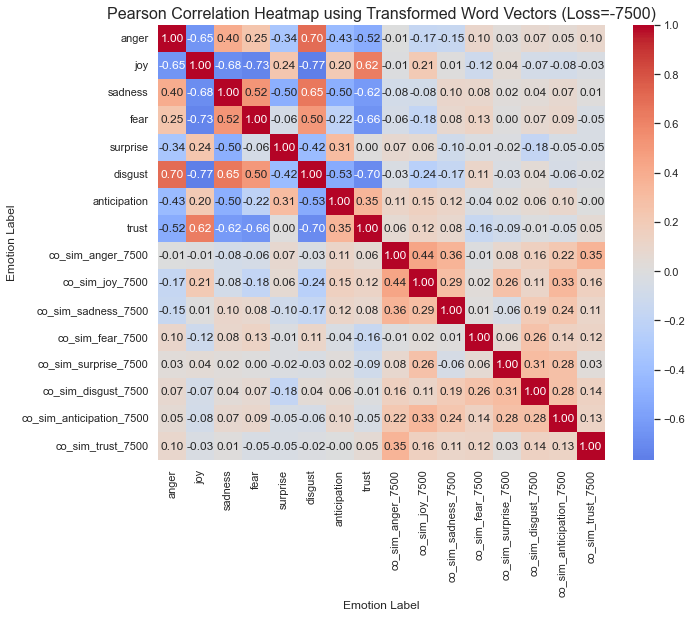

In [522]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_7500 = ['co_sim_anger_7500', 'co_sim_joy_7500', 'co_sim_sadness_7500', 'co_sim_fear_7500', 
                            'co_sim_surprise_7500', 'co_sim_disgust_7500', 'co_sim_anticipation_7500', 'co_sim_trust_7500']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_7500

#Calculate Pearson correlation coefficients
correlation_matrix = df_basiccomp_loss7500[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (Loss=-7500)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

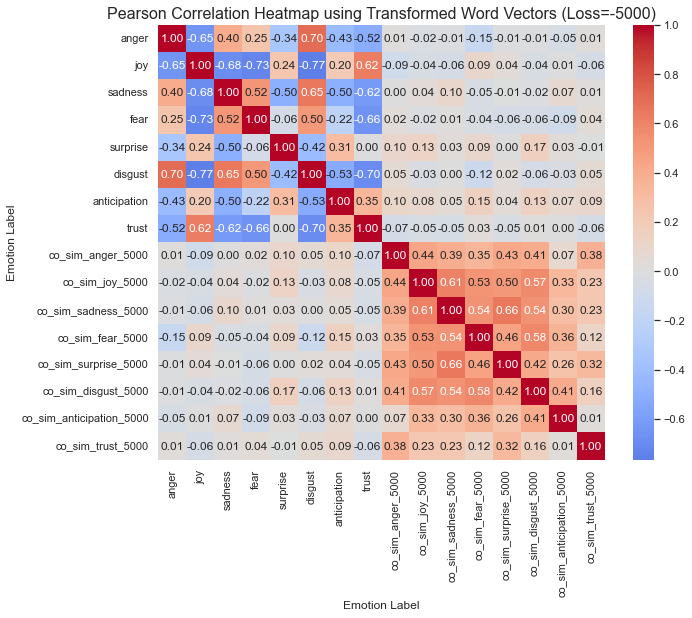

In [523]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_5000 = ['co_sim_anger_5000', 'co_sim_joy_5000', 'co_sim_sadness_5000', 'co_sim_fear_5000', 
                            'co_sim_surprise_5000', 'co_sim_disgust_5000', 'co_sim_anticipation_5000', 'co_sim_trust_5000']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_5000

#Calculate Pearson correlation coefficients
correlation_matrix = df_basiccomp_loss5000[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (Loss=-5000)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

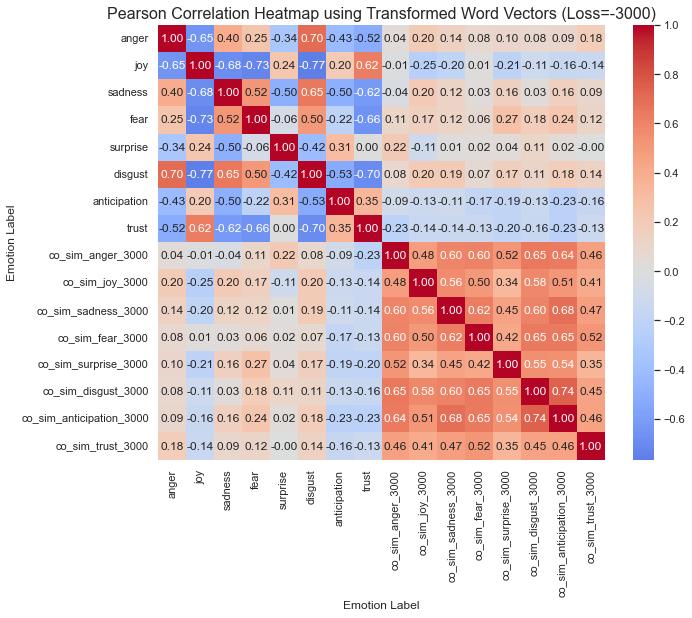

In [524]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_3000 = ['co_sim_anger_3000', 'co_sim_joy_3000', 'co_sim_sadness_3000', 'co_sim_fear_3000', 
                            'co_sim_surprise_3000', 'co_sim_disgust_3000', 'co_sim_anticipation_3000', 'co_sim_trust_3000']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_3000

#Calculate Pearson correlation coefficients
correlation_matrix = df_basiccomp_loss3000[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (Loss=-3000)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

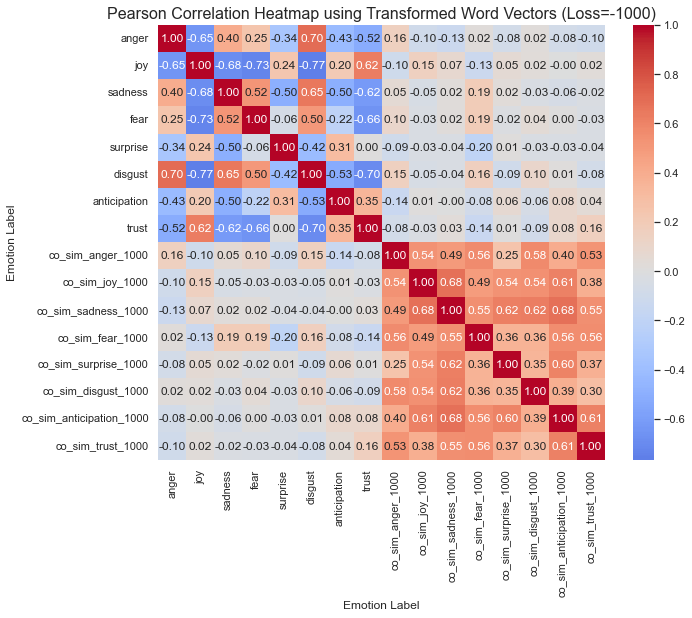

In [525]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_1000 = ['co_sim_anger_1000', 'co_sim_joy_1000', 'co_sim_sadness_1000', 'co_sim_fear_1000', 
                            'co_sim_surprise_1000', 'co_sim_disgust_1000', 'co_sim_anticipation_1000', 'co_sim_trust_1000']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_1000

#Calculate Pearson correlation coefficients
correlation_matrix = df_basiccomp_loss1000[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (Loss=-1000)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

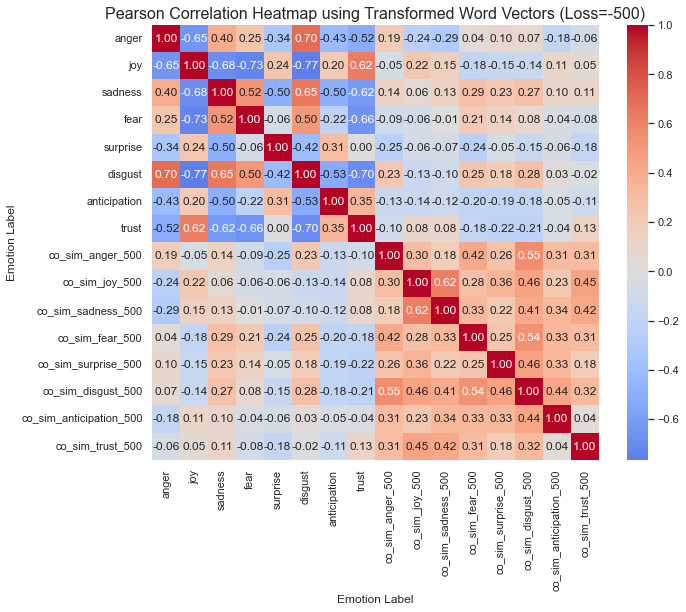

In [526]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_500 = ['co_sim_anger_500', 'co_sim_joy_500', 'co_sim_sadness_500', 'co_sim_fear_500', 
                            'co_sim_surprise_500', 'co_sim_disgust_500', 'co_sim_anticipation_500', 'co_sim_trust_500']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_500

#Calculate Pearson correlation coefficients
correlation_matrix = df_basiccomp_loss500[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (Loss=-500)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

In [546]:
#Now find values for the binary lexicon similarity

#Loop through each words in anger_list and calculate similarity scores for each to the anger vector-loss7500

# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_7500['anger']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in anger_words:
    if word in transformed_word_vectors_loss_7500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_7500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_anger_7500 = similarity_scores[:101]

In [547]:
#Loop through each words in anger_list and calculate similarity scores for each to the anger vector

# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_5000['anger']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in anger_words:
    if word in transformed_word_vectors_loss_5000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_5000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_anger_5000 = similarity_scores[:101]

In [548]:
#Loop through each words in anger_list and calculate similarity scores for each to the anger vector

# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_3000['anger']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in anger_words:
    if word in transformed_word_vectors_loss_3000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_3000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_anger_3000 = similarity_scores[:101]

In [549]:
#Loop through each words in anger_list and calculate similarity scores for each to the anger vector

# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_1000['anger']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in anger_words:
    if word in transformed_word_vectors_loss_1000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_1000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_anger_1000 = similarity_scores[:101]

In [550]:
#Loop through each words in anger_list and calculate similarity scores for each to the anger vector

# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_500['anger']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in anger_words:
    if word in transformed_word_vectors_loss_500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_anger_500 = similarity_scores[:101]

In [551]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_7500['joy']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in joy_words:
    if word in transformed_word_vectors_loss_7500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_7500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_joy_7500 = similarity_scores[:101]

In [552]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_5000['joy']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in joy_words:
    if word in transformed_word_vectors_loss_5000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_5000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_joy_5000 = similarity_scores[:101]

In [553]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_3000['joy']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in joy_words:
    if word in transformed_word_vectors_loss_3000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_3000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_joy_3000 = similarity_scores[:101]

In [554]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_1000['joy']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in joy_words:
    if word in transformed_word_vectors_loss_1000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_1000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_joy_1000 = similarity_scores[:101]

In [587]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_500['joy']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in joy_words:
    if word in transformed_word_vectors_loss_500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_joy_500 = similarity_scores[:101]

In [555]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_7500['sadness']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in sadness_words:
    if word in transformed_word_vectors_loss_7500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_7500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_sadness_7500 = similarity_scores[:101]

In [556]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_5000['sadness']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in sadness_words:
    if word in transformed_word_vectors_loss_5000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_5000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_sadness_5000 = similarity_scores[:101]

In [557]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_3000['sadness']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in sadness_words:
    if word in transformed_word_vectors_loss_3000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_3000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_sadness_3000 = similarity_scores[:101]

In [558]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_1000['sadness']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in sadness_words:
    if word in transformed_word_vectors_loss_1000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_1000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_sadness_1000 = similarity_scores[:101]

In [559]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_500['sadness']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in sadness_words:
    if word in transformed_word_vectors_loss_500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_sadness_500 = similarity_scores[:101]

In [560]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_7500['fear']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in fear_words:
    if word in transformed_word_vectors_loss_7500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_7500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_fear_7500 = similarity_scores[:101]

In [561]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_5000['fear']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in fear_words:
    if word in transformed_word_vectors_loss_5000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_5000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_fear_5000 = similarity_scores[:101]

In [562]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_3000['fear']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in fear_words:
    if word in transformed_word_vectors_loss_3000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_3000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_fear_3000 = similarity_scores[:101]

In [563]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_1000['fear']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in fear_words:
    if word in transformed_word_vectors_loss_1000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_1000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_fear_1000 = similarity_scores[:101]

In [564]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_500['fear']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in fear_words:
    if word in transformed_word_vectors_loss_500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_fear_500 = similarity_scores[:101]

In [565]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_7500['surprise']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in surprise_words:
    if word in transformed_word_vectors_loss_7500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_7500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_surprise_7500 = similarity_scores[:101]

In [566]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_5000['surprise']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in surprise_words:
    if word in transformed_word_vectors_loss_5000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_5000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_surprise_5000 = similarity_scores[:101]

In [567]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_3000['surprise']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in surprise_words:
    if word in transformed_word_vectors_loss_3000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_3000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_surprise_3000 = similarity_scores[:101]

In [568]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_1000['surprise']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in surprise_words:
    if word in transformed_word_vectors_loss_1000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_1000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_surprise_1000 = similarity_scores[:101]

In [569]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_500['surprise']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in surprise_words:
    if word in transformed_word_vectors_loss_500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_surprise_500 = similarity_scores[:101]

In [570]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_7500['disgust']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in disgust_words:
    if word in transformed_word_vectors_loss_7500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_7500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_disgust_7500 = similarity_scores[:101]

In [571]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_5000['disgust']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in disgust_words:
    if word in transformed_word_vectors_loss_5000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_5000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_disgust_5000 = similarity_scores[:101]

In [572]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_3000['disgust']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in disgust_words:
    if word in transformed_word_vectors_loss_3000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_3000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_disgust_3000 = similarity_scores[:101]

In [573]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_1000['disgust']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in disgust_words:
    if word in transformed_word_vectors_loss_1000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_1000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_disgust_1000 = similarity_scores[:101]

In [574]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_500['disgust']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in disgust_words:
    if word in transformed_word_vectors_loss_500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_disgust_500 = similarity_scores[:101]

In [575]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_7500['anticipation']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in anticipation_words:
    if word in transformed_word_vectors_loss_7500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_7500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_anticipation_7500 = similarity_scores[:101]

In [576]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_5000['anticipation']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in anticipation_words:
    if word in transformed_word_vectors_loss_5000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_5000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_anticipation_5000 = similarity_scores[:101]

In [577]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_3000['anticipation']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in anticipation_words:
    if word in transformed_word_vectors_loss_3000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_3000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_anticipation_3000 = similarity_scores[:101]

In [578]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_1000['anticipation']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in anticipation_words:
    if word in transformed_word_vectors_loss_1000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_1000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_anticipation_1000 = similarity_scores[:101]

In [579]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_500['anticipation']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in anticipation_words:
    if word in transformed_word_vectors_loss_500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_anticipation_500 = similarity_scores[:101]

In [580]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_7500['trust']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in trust_words:
    if word in transformed_word_vectors_loss_7500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_7500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_trust_7500 = similarity_scores[:101]

In [581]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_5000['trust']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in trust_words:
    if word in transformed_word_vectors_loss_5000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_5000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_trust_5000 = similarity_scores[:101]

In [582]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_3000['trust']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in trust_words:
    if word in transformed_word_vectors_loss_3000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_3000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_trust_3000 = similarity_scores[:101]

In [583]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_1000['trust']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in trust_words:
    if word in transformed_word_vectors_loss_1000:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_1000[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_trust_1000 = similarity_scores[:101]

In [584]:
# Create a list to store the similarity scores for each word
similarity_scores = []

# Define emotion vector for anger
basic_emotion_vector = transformed_word_vectors_loss_500['trust']

# Loop through each word in anger_list and calculate similarity scores for each to the anger vector
for word in trust_words:
    if word in transformed_word_vectors_loss_500:  # Check if the word is in the dictionary
        word_vector = np.array(transformed_word_vectors_loss_500[word])
        similarity_score = cosine_similarity(basic_emotion_vector, word_vector)
        similarity_scores.append((word, similarity_score))

# Sort the similarity scores in descending order
similarity_scores.sort(key=lambda x: x[1], reverse=True)

# Get the top k most similar words
top_k_trust_500 = similarity_scores[:101]

In [590]:
#Make lists of the top 5 words for each emotion in for each vector
top_5_anger_7500 = [word_score[0] for word_score in top_k_anger_7500[1:6]]
top_5_anger_5000 = [word_score[0] for word_score in top_k_anger_5000[1:6]]
top_5_anger_3000 = [word_score[0] for word_score in top_k_anger_3000[1:6]]
top_5_anger_1000 = [word_score[0] for word_score in top_k_anger_1000[1:6]]
top_5_anger_500 = [word_score[0] for word_score in top_k_anger_500[1:6]]

top_5_joy_7500 = [word_score[0] for word_score in top_k_joy_7500[1:6]]
top_5_joy_5000 = [word_score[0] for word_score in top_k_joy_5000[1:6]]
top_5_joy_3000 = [word_score[0] for word_score in top_k_joy_3000[1:6]]
top_5_joy_1000 = [word_score[0] for word_score in top_k_joy_1000[1:6]]
top_5_joy_500 = [word_score[0] for word_score in top_k_joy_500[1:6]]

top_5_sadness_7500 = [word_score[0] for word_score in top_k_sadness_7500[1:6]]
top_5_sadness_5000 = [word_score[0] for word_score in top_k_sadness_5000[1:6]]
top_5_sadness_3000 = [word_score[0] for word_score in top_k_sadness_3000[1:6]]
top_5_sadness_1000 = [word_score[0] for word_score in top_k_sadness_1000[1:6]]
top_5_sadness_500 = [word_score[0] for word_score in top_k_sadness_500[1:6]]

top_5_fear_7500 = [word_score[0] for word_score in top_k_fear_7500[1:6]]
top_5_fear_5000 = [word_score[0] for word_score in top_k_fear_5000[1:6]]
top_5_fear_3000 = [word_score[0] for word_score in top_k_fear_3000[1:6]]
top_5_fear_1000 = [word_score[0] for word_score in top_k_fear_1000[1:6]]
top_5_fear_500 = [word_score[0] for word_score in top_k_fear_500[1:6]]

top_5_surprise_7500 = [word_score[0] for word_score in top_k_surprise_7500[1:6]]
top_5_surprise_5000 = [word_score[0] for word_score in top_k_surprise_5000[1:6]]
top_5_surprise_3000 = [word_score[0] for word_score in top_k_surprise_3000[1:6]]
top_5_surprise_1000 = [word_score[0] for word_score in top_k_surprise_1000[1:6]]
top_5_surprise_500 = [word_score[0] for word_score in top_k_surprise_500[1:6]]

top_5_disgust_7500 = [word_score[0] for word_score in top_k_disgust_7500[1:6]]
top_5_disgust_5000 = [word_score[0] for word_score in top_k_disgust_5000[1:6]]
top_5_disgust_3000 = [word_score[0] for word_score in top_k_disgust_3000[1:6]]
top_5_disgust_1000 = [word_score[0] for word_score in top_k_disgust_1000[1:6]]
top_5_disgust_500 = [word_score[0] for word_score in top_k_disgust_500[1:6]]

top_5_anticipation_7500 = [word_score[0] for word_score in top_k_anticipation_7500[1:6]]
top_5_anticipation_5000 = [word_score[0] for word_score in top_k_anticipation_5000[1:6]]
top_5_anticipation_3000 = [word_score[0] for word_score in top_k_anticipation_3000[1:6]]
top_5_anticipation_1000 = [word_score[0] for word_score in top_k_anticipation_1000[1:6]]
top_5_anticipation_500 = [word_score[0] for word_score in top_k_anticipation_500[1:6]]

top_5_trust_7500 = [word_score[0] for word_score in top_k_trust_7500[1:6]]
top_5_trust_5000 = [word_score[0] for word_score in top_k_trust_5000[1:6]]
top_5_trust_3000 = [word_score[0] for word_score in top_k_trust_3000[1:6]]
top_5_trust_1000 = [word_score[0] for word_score in top_k_trust_1000[1:6]]
top_5_trust_500 = [word_score[0] for word_score in top_k_trust_500[1:6]]

In [591]:
#Make lists of the top 10 words for each emotion in for each vector
top_10_anger_7500 = [word_score[0] for word_score in top_k_anger_7500[1:11]]
top_10_anger_5000 = [word_score[0] for word_score in top_k_anger_5000[1:11]]
top_10_anger_3000 = [word_score[0] for word_score in top_k_anger_3000[1:11]]
top_10_anger_1000 = [word_score[0] for word_score in top_k_anger_1000[1:11]]
top_10_anger_500 = [word_score[0] for word_score in top_k_anger_500[1:11]]

top_10_joy_7500 = [word_score[0] for word_score in top_k_joy_7500[1:11]]
top_10_joy_5000 = [word_score[0] for word_score in top_k_joy_5000[1:11]]
top_10_joy_3000 = [word_score[0] for word_score in top_k_joy_3000[1:11]]
top_10_joy_1000 = [word_score[0] for word_score in top_k_joy_1000[1:11]]
top_10_joy_500 = [word_score[0] for word_score in top_k_joy_500[1:11]]

top_10_sadness_7500 = [word_score[0] for word_score in top_k_sadness_7500[1:11]]
top_10_sadness_5000 = [word_score[0] for word_score in top_k_sadness_5000[1:11]]
top_10_sadness_3000 = [word_score[0] for word_score in top_k_sadness_3000[1:11]]
top_10_sadness_1000 = [word_score[0] for word_score in top_k_sadness_1000[1:11]]
top_10_sadness_500 = [word_score[0] for word_score in top_k_sadness_500[1:11]]

top_10_fear_7500 = [word_score[0] for word_score in top_k_fear_7500[1:11]]
top_10_fear_5000 = [word_score[0] for word_score in top_k_fear_5000[1:11]]
top_10_fear_3000 = [word_score[0] for word_score in top_k_fear_3000[1:11]]
top_10_fear_1000 = [word_score[0] for word_score in top_k_fear_1000[1:11]]
top_10_fear_500 = [word_score[0] for word_score in top_k_fear_500[1:11]]

top_10_surprise_7500 = [word_score[0] for word_score in top_k_surprise_7500[1:11]]
top_10_surprise_5000 = [word_score[0] for word_score in top_k_surprise_5000[1:11]]
top_10_surprise_3000 = [word_score[0] for word_score in top_k_surprise_3000[1:11]]
top_10_surprise_1000 = [word_score[0] for word_score in top_k_surprise_1000[1:11]]
top_10_surprise_500 = [word_score[0] for word_score in top_k_surprise_500[1:11]]

top_10_disgust_7500 = [word_score[0] for word_score in top_k_disgust_7500[1:11]]
top_10_disgust_5000 = [word_score[0] for word_score in top_k_disgust_5000[1:11]]
top_10_disgust_3000 = [word_score[0] for word_score in top_k_disgust_3000[1:11]]
top_10_disgust_1000 = [word_score[0] for word_score in top_k_disgust_1000[1:11]]
top_10_disgust_500 = [word_score[0] for word_score in top_k_disgust_500[1:11]]

top_10_anticipation_7500 = [word_score[0] for word_score in top_k_anticipation_7500[1:11]]
top_10_anticipation_5000 = [word_score[0] for word_score in top_k_anticipation_5000[1:11]]
top_10_anticipation_3000 = [word_score[0] for word_score in top_k_anticipation_3000[1:11]]
top_10_anticipation_1000 = [word_score[0] for word_score in top_k_anticipation_1000[1:11]]
top_10_anticipation_500 = [word_score[0] for word_score in top_k_anticipation_500[1:11]]

top_10_trust_7500 = [word_score[0] for word_score in top_k_trust_7500[1:11]]
top_10_trust_5000 = [word_score[0] for word_score in top_k_trust_5000[1:11]]
top_10_trust_3000 = [word_score[0] for word_score in top_k_trust_3000[1:11]]
top_10_trust_1000 = [word_score[0] for word_score in top_k_trust_1000[1:11]]
top_10_trust_500 = [word_score[0] for word_score in top_k_trust_500[1:11]]

In [592]:
#Make lists of the top 50 words for each emotion in for each vector
top_50_anger_7500 = [word_score[0] for word_score in top_k_anger_7500[1:51]]
top_50_anger_5000 = [word_score[0] for word_score in top_k_anger_5000[1:51]]
top_50_anger_3000 = [word_score[0] for word_score in top_k_anger_3000[1:51]]
top_50_anger_1000 = [word_score[0] for word_score in top_k_anger_1000[1:51]]
top_50_anger_500 = [word_score[0] for word_score in top_k_anger_500[1:51]]

top_50_joy_7500 = [word_score[0] for word_score in top_k_joy_7500[1:51]]
top_50_joy_5000 = [word_score[0] for word_score in top_k_joy_5000[1:51]]
top_50_joy_3000 = [word_score[0] for word_score in top_k_joy_3000[1:51]]
top_50_joy_1000 = [word_score[0] for word_score in top_k_joy_1000[1:51]]
top_50_joy_500 = [word_score[0] for word_score in top_k_joy_500[1:51]]

top_50_sadness_7500 = [word_score[0] for word_score in top_k_sadness_7500[1:51]]
top_50_sadness_5000 = [word_score[0] for word_score in top_k_sadness_5000[1:51]]
top_50_sadness_3000 = [word_score[0] for word_score in top_k_sadness_3000[1:51]]
top_50_sadness_1000 = [word_score[0] for word_score in top_k_sadness_1000[1:51]]
top_50_sadness_500 = [word_score[0] for word_score in top_k_sadness_500[1:51]]

top_50_fear_7500 = [word_score[0] for word_score in top_k_fear_7500[1:51]]
top_50_fear_5000 = [word_score[0] for word_score in top_k_fear_5000[1:51]]
top_50_fear_3000 = [word_score[0] for word_score in top_k_fear_3000[1:51]]
top_50_fear_1000 = [word_score[0] for word_score in top_k_fear_1000[1:51]]
top_50_fear_500 = [word_score[0] for word_score in top_k_fear_500[1:51]]

top_50_surprise_7500 = [word_score[0] for word_score in top_k_surprise_7500[1:51]]
top_50_surprise_5000 = [word_score[0] for word_score in top_k_surprise_5000[1:51]]
top_50_surprise_3000 = [word_score[0] for word_score in top_k_surprise_3000[1:51]]
top_50_surprise_1000 = [word_score[0] for word_score in top_k_surprise_1000[1:51]]
top_50_surprise_500 = [word_score[0] for word_score in top_k_surprise_500[1:51]]

top_50_disgust_7500 = [word_score[0] for word_score in top_k_disgust_7500[1:51]]
top_50_disgust_5000 = [word_score[0] for word_score in top_k_disgust_5000[1:51]]
top_50_disgust_3000 = [word_score[0] for word_score in top_k_disgust_3000[1:51]]
top_50_disgust_1000 = [word_score[0] for word_score in top_k_disgust_1000[1:51]]
top_50_disgust_500 = [word_score[0] for word_score in top_k_disgust_500[1:51]]

top_50_anticipation_7500 = [word_score[0] for word_score in top_k_anticipation_7500[1:51]]
top_50_anticipation_5000 = [word_score[0] for word_score in top_k_anticipation_5000[1:51]]
top_50_anticipation_3000 = [word_score[0] for word_score in top_k_anticipation_3000[1:51]]
top_50_anticipation_1000 = [word_score[0] for word_score in top_k_anticipation_1000[1:51]]
top_50_anticipation_500 = [word_score[0] for word_score in top_k_anticipation_500[1:51]]

top_50_trust_7500 = [word_score[0] for word_score in top_k_trust_7500[1:51]]
top_50_trust_5000 = [word_score[0] for word_score in top_k_trust_5000[1:51]]
top_50_trust_3000 = [word_score[0] for word_score in top_k_trust_3000[1:51]]
top_50_trust_1000 = [word_score[0] for word_score in top_k_trust_1000[1:51]]
top_50_trust_500 = [word_score[0] for word_score in top_k_trust_500[1:51]]

In [604]:
#Make lists of the top 100 words for each emotion in for each vector
top_100_anger_7500 = [word_score[0] for word_score in top_k_anger_7500[1:101]]
top_100_anger_5000 = [word_score[0] for word_score in top_k_anger_5000[1:101]]
top_100_anger_3000 = [word_score[0] for word_score in top_k_anger_3000[1:101]]
top_100_anger_1000 = [word_score[0] for word_score in top_k_anger_1000[1:101]]
top_100_anger_500 = [word_score[0] for word_score in top_k_anger_500[1:101]]

top_100_joy_7500 = [word_score[0] for word_score in top_k_joy_7500[1:101]]
top_100_joy_5000 = [word_score[0] for word_score in top_k_joy_5000[1:101]]
top_100_joy_3000 = [word_score[0] for word_score in top_k_joy_3000[1:101]]
top_100_joy_1000 = [word_score[0] for word_score in top_k_joy_1000[1:101]]
top_100_joy_500 = [word_score[0] for word_score in top_k_joy_500[1:101]]

top_100_sadness_7500 = [word_score[0] for word_score in top_k_sadness_7500[1:101]]
top_100_sadness_5000 = [word_score[0] for word_score in top_k_sadness_5000[1:101]]
top_100_sadness_3000 = [word_score[0] for word_score in top_k_sadness_3000[1:101]]
top_100_sadness_1000 = [word_score[0] for word_score in top_k_sadness_1000[1:101]]
top_100_sadness_500 = [word_score[0] for word_score in top_k_sadness_500[1:101]]

top_100_fear_7500 = [word_score[0] for word_score in top_k_fear_7500[1:101]]
top_100_fear_5000 = [word_score[0] for word_score in top_k_fear_5000[1:101]]
top_100_fear_3000 = [word_score[0] for word_score in top_k_fear_3000[1:101]]
top_100_fear_1000 = [word_score[0] for word_score in top_k_fear_1000[1:101]]
top_100_fear_500 = [word_score[0] for word_score in top_k_fear_500[1:101]]

top_100_surprise_7500 = [word_score[0] for word_score in top_k_surprise_7500[1:101]]
top_100_surprise_5000 = [word_score[0] for word_score in top_k_surprise_5000[1:101]]
top_100_surprise_3000 = [word_score[0] for word_score in top_k_surprise_3000[1:101]]
top_100_surprise_1000 = [word_score[0] for word_score in top_k_surprise_1000[1:101]]
top_100_surprise_500 = [word_score[0] for word_score in top_k_surprise_500[1:101]]

top_100_disgust_7500 = [word_score[0] for word_score in top_k_disgust_7500[1:101]]
top_100_disgust_5000 = [word_score[0] for word_score in top_k_disgust_5000[1:101]]
top_100_disgust_3000 = [word_score[0] for word_score in top_k_disgust_3000[1:101]]
top_100_disgust_1000 = [word_score[0] for word_score in top_k_disgust_1000[1:101]]
top_100_disgust_500 = [word_score[0] for word_score in top_k_disgust_500[1:101]]

top_100_anticipation_7500 = [word_score[0] for word_score in top_k_anticipation_7500[1:101]]
top_100_anticipation_5000 = [word_score[0] for word_score in top_k_anticipation_5000[1:101]]
top_100_anticipation_3000 = [word_score[0] for word_score in top_k_anticipation_3000[1:101]]
top_100_anticipation_1000 = [word_score[0] for word_score in top_k_anticipation_1000[1:101]]
top_100_anticipation_500 = [word_score[0] for word_score in top_k_anticipation_500[1:101]]

top_100_trust_7500 = [word_score[0] for word_score in top_k_trust_7500[1:101]]
top_100_trust_5000 = [word_score[0] for word_score in top_k_trust_5000[1:101]]
top_100_trust_3000 = [word_score[0] for word_score in top_k_trust_3000[1:101]]
top_100_trust_1000 = [word_score[0] for word_score in top_k_trust_1000[1:101]]
top_100_trust_500 = [word_score[0] for word_score in top_k_trust_500[1:101]]

In [609]:
#Copy datadrames for use in tests
df_binarycomp_loss7500 = df.copy()
df_binarycomp_loss5000 = df.copy()
df_binarycomp_loss3000 = df.copy()
df_binarycomp_loss1000 = df.copy()
df_binarycomp_loss500 = df.copy()

In [610]:
#Define function to generate data using the vectors where loss =-7500
def average_similarity_intensity(emoji_vec, word_list, vector, column_name):
    #Initialize dictionary to store similarity scores
    emoji_similarity_scores = {} 

    #Iterate through each emoji in the df
    for emoji in df_binarycomp_loss7500['emoji']:
        similarity_scores = []
        if emoji in emoji_vec:
            emoji_vector = np.array(emoji_vec[emoji])
            for word in word_list:
                if word in vector:
                    word_vector = np.array(vector[word])
                    similarity_score = cosine_similarity(emoji_vector, word_vector)
                    similarity_scores.append((word, similarity_score))
            emoji_similarity_scores[emoji] = similarity_scores
        else:
            emoji_similarity_scores[emoji] = []
        
        #Calculate the average similarity
        total_similarity_scores = 0
        num_words_with_similarity = 0
        
        for similarity_score in emoji_similarity_scores[emoji]:
            total_similarity_scores += similarity_score[1]
            num_words_with_similarity += 1
        
        if num_words_with_similarity > 0:
            average_similarity_score = total_similarity_scores / num_words_with_similarity
        else:
            average_similarity_score = 0
    
        #Append the average similarity to the list
        emoji_similarity_scores[emoji] = average_similarity_score
    
    #Add new column to the dataframe
    df_binarycomp_loss7500[column_name] = list(emoji_similarity_scores.values())

In [611]:
#Anger
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_5_anger_7500, transformed_word_vectors_loss_7500,
                             'top_5_anger_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_10_anger_7500, transformed_word_vectors_loss_7500,
                             'top_10_anger_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_50_anger_7500, transformed_word_vectors_loss_7500,
                             'top_50_anger_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_100_anger_7500, transformed_word_vectors_loss_7500,
                             'top_100_anger_loss7500')


#Joy
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_5_joy_7500, transformed_word_vectors_loss_7500,
                             'top_5_joy_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_10_joy_7500, transformed_word_vectors_loss_7500,
                             'top_10_joy_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_50_joy_7500, transformed_word_vectors_loss_7500,
                             'top_50_joy_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_100_joy_7500, transformed_word_vectors_loss_7500,
                             'top_100_joy_loss7500')


#Sadness
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_5_sadness_7500, transformed_word_vectors_loss_7500,
                             'top_5_sadness_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_10_sadness_7500, transformed_word_vectors_loss_7500,
                             'top_10_sadness_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_50_sadness_7500, transformed_word_vectors_loss_7500,
                             'top_50_sadness_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_100_sadness_7500, transformed_word_vectors_loss_7500,
                             'top_100_sadness_loss7500')



#Fear
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_5_fear_7500, transformed_word_vectors_loss_7500,
                             'top_5_fear_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_10_fear_7500, transformed_word_vectors_loss_7500,
                             'top_10_fear_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_50_fear_7500, transformed_word_vectors_loss_7500,
                             'top_50_fear_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_100_fear_7500, transformed_word_vectors_loss_7500,
                             'top_100_fear_loss7500')


#Surprise
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_5_surprise_7500, transformed_word_vectors_loss_7500,
                             'top_5_surprise_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_10_surprise_7500, transformed_word_vectors_loss_7500,
                             'top_10_surprise_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_50_surprise_7500, transformed_word_vectors_loss_7500,
                             'top_50_surprise_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_100_surprise_7500, transformed_word_vectors_loss_7500,
                             'top_100_surprise_loss7500')


#Disgust
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_5_disgust_7500, transformed_word_vectors_loss_7500,
                             'top_5_disgust_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_10_disgust_7500, transformed_word_vectors_loss_7500,
                             'top_10_disgust_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_50_disgust_7500, transformed_word_vectors_loss_7500,
                             'top_50_disgust_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_100_disgust_7500, transformed_word_vectors_loss_7500,
                             'top_100_disgust_loss7500')


#Anticipation
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_5_anticipation_7500,
                             transformed_word_vectors_loss_7500, 'top_5_anticipation_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_10_anticipation_7500,
                             transformed_word_vectors_loss_7500, 'top_10_anticipation_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_50_anticipation_7500,
                             transformed_word_vectors_loss_7500, 'top_50_anticipation_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_100_anticipation_7500,
                             transformed_word_vectors_loss_7500, 'top_100_anticipation_loss7500')


#Disgust
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_5_trust_7500, transformed_word_vectors_loss_7500,
                             'top_5_trust_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_10_trust_7500, transformed_word_vectors_loss_7500,
                             'top_10_trust_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_50_trust_7500, transformed_word_vectors_loss_7500,
                             'top_50_trust_loss7500')
average_similarity_intensity(transformed_emoji_vectors_loss_7500, top_100_trust_7500, transformed_word_vectors_loss_7500,
                             'top_100_trust_loss7500')


df_binarycomp_loss7500.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,top_50_disgust_loss7500,top_100_disgust_loss7500,top_5_anticipation_loss7500,top_10_anticipation_loss7500,top_50_anticipation_loss7500,top_100_anticipation_loss7500,top_5_trust_loss7500,top_10_trust_loss7500,top_50_trust_loss7500,top_100_trust_loss7500
0,1F308,🌈,0.104384,0.133612,0.104384,0.104384,0.176409,0.110647,0.127349,0.138831,...,-0.032604,-0.025780,0.035366,0.031965,-0.002488,-0.007384,-0.041843,-0.053883,-0.028592,-0.035069
1,1F319,🌙,0.112740,0.147689,0.112740,0.112740,0.140924,0.112740,0.119504,0.140924,...,-0.001713,-0.000191,0.020059,-0.012944,-0.026490,-0.010638,-0.000568,-0.004450,-0.005014,-0.008963
2,1F31A,🌚,0.115847,0.118033,0.127869,0.115847,0.155191,0.130055,0.115847,0.121311,...,-0.002876,-0.002905,0.023367,0.005210,0.001156,0.001456,-0.022789,-0.023451,-0.015118,-0.007690
3,1F31E,🌞,0.107181,0.130761,0.107181,0.107181,0.190782,0.107181,0.118971,0.130761,...,-0.001788,-0.006116,-0.012141,-0.003025,-0.007380,0.000894,-0.004139,0.009251,-0.003644,-0.001826
4,1F31F,🌟,0.106724,0.136606,0.106724,0.106724,0.163287,0.106724,0.133404,0.139808,...,-0.008728,-0.010988,-0.050276,-0.038718,-0.015403,-0.008137,-0.006431,-0.014009,-0.014370,-0.012439


In [612]:
#Define function to generate data using the vectors where loss =-5000
def average_similarity_intensity(emoji_vec, word_list, vector, column_name):
    #Initialize dictionary to store similarity scores
    emoji_similarity_scores = {} 

    #Iterate through each emoji in the df
    for emoji in df_binarycomp_loss5000['emoji']:
        similarity_scores = []
        if emoji in emoji_vec:
            emoji_vector = np.array(emoji_vec[emoji])
            for word in word_list:
                if word in vector:
                    word_vector = np.array(vector[word])
                    similarity_score = cosine_similarity(emoji_vector, word_vector)
                    similarity_scores.append((word, similarity_score))
            emoji_similarity_scores[emoji] = similarity_scores
        else:
            emoji_similarity_scores[emoji] = []
        
        #Calculate the average similarity
        total_similarity_scores = 0
        num_words_with_similarity = 0
        
        for similarity_score in emoji_similarity_scores[emoji]:
            total_similarity_scores += similarity_score[1]
            num_words_with_similarity += 1
        
        if num_words_with_similarity > 0:
            average_similarity_score = total_similarity_scores / num_words_with_similarity
        else:
            average_similarity_score = 0
    
        #Append the average similarity to the list
        emoji_similarity_scores[emoji] = average_similarity_score
    
    #Add new column to the dataframe
    df_binarycomp_loss5000[column_name] = list(emoji_similarity_scores.values())

In [613]:
#Anger
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_5_anger_5000, transformed_word_vectors_loss_5000,
                             'top_5_anger_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_10_anger_5000, transformed_word_vectors_loss_5000,
                             'top_10_anger_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_50_anger_5000, transformed_word_vectors_loss_5000,
                             'top_50_anger_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_100_anger_5000, transformed_word_vectors_loss_5000,
                             'top_100_anger_loss5000')


#Joy
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_5_joy_5000, transformed_word_vectors_loss_5000,
                             'top_5_joy_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_10_joy_5000, transformed_word_vectors_loss_5000,
                             'top_10_joy_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_50_joy_5000, transformed_word_vectors_loss_5000,
                             'top_50_joy_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_100_joy_5000, transformed_word_vectors_loss_5000,
                             'top_100_joy_loss5000')


#Sadness
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_5_sadness_5000, transformed_word_vectors_loss_5000,
                             'top_5_sadness_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_10_sadness_5000, transformed_word_vectors_loss_5000,
                             'top_10_sadness_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_50_sadness_5000, transformed_word_vectors_loss_5000,
                             'top_50_sadness_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_100_sadness_5000, transformed_word_vectors_loss_5000,
                             'top_100_sadness_loss5000')



#Fear
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_5_fear_5000, transformed_word_vectors_loss_5000,
                             'top_5_fear_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_10_fear_5000, transformed_word_vectors_loss_5000,
                             'top_10_fear_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_50_fear_5000, transformed_word_vectors_loss_5000,
                             'top_50_fear_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_100_fear_5000, transformed_word_vectors_loss_5000,
                             'top_100_fear_loss5000')


#Surprise
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_5_surprise_5000, transformed_word_vectors_loss_5000,
                             'top_5_surprise_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_10_surprise_5000, transformed_word_vectors_loss_5000,
                             'top_10_surprise_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_50_surprise_5000, transformed_word_vectors_loss_5000,
                             'top_50_surprise_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_100_surprise_5000, transformed_word_vectors_loss_5000,
                             'top_100_surprise_loss5000')


#Disgust
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_5_disgust_5000, transformed_word_vectors_loss_5000,
                             'top_5_disgust_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_10_disgust_5000, transformed_word_vectors_loss_5000,
                             'top_10_disgust_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_50_disgust_5000, transformed_word_vectors_loss_5000,
                             'top_50_disgust_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_100_disgust_5000, transformed_word_vectors_loss_5000,
                             'top_100_disgust_loss5000')


#Anticipation
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_5_anticipation_5000,
                             transformed_word_vectors_loss_5000, 'top_5_anticipation_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_10_anticipation_5000,
                             transformed_word_vectors_loss_5000, 'top_10_anticipation_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_50_anticipation_5000,
                             transformed_word_vectors_loss_5000, 'top_50_anticipation_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_100_anticipation_5000,
                             transformed_word_vectors_loss_5000, 'top_100_anticipation_loss5000')


#Trust
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_5_trust_5000, transformed_word_vectors_loss_5000,
                             'top_5_trust_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_10_trust_5000, transformed_word_vectors_loss_5000,
                             'top_10_trust_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_50_trust_5000, transformed_word_vectors_loss_5000,
                             'top_50_trust_loss5000')
average_similarity_intensity(transformed_emoji_vectors_loss_5000, top_100_trust_5000, transformed_word_vectors_loss_5000,
                             'top_100_trust_loss5000')

df_binarycomp_loss5000.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,top_50_disgust_loss5000,top_100_disgust_loss5000,top_5_anticipation_loss5000,top_10_anticipation_loss5000,top_50_anticipation_loss5000,top_100_anticipation_loss5000,top_5_trust_loss5000,top_10_trust_loss5000,top_50_trust_loss5000,top_100_trust_loss5000
0,1F308,🌈,0.104384,0.133612,0.104384,0.104384,0.176409,0.110647,0.127349,0.138831,...,-0.135333,-0.131859,-0.162622,-0.145353,-0.122163,-0.126622,-0.087639,-0.093691,-0.098424,-0.098932
1,1F319,🌙,0.112740,0.147689,0.112740,0.112740,0.140924,0.112740,0.119504,0.140924,...,-0.130773,-0.121882,-0.135098,-0.132411,-0.117576,-0.116672,-0.099735,-0.075937,-0.101898,-0.103156
2,1F31A,🌚,0.115847,0.118033,0.127869,0.115847,0.155191,0.130055,0.115847,0.121311,...,-0.133337,-0.130572,-0.081922,-0.089508,-0.087564,-0.093190,-0.059675,-0.062000,-0.074225,-0.079189
3,1F31E,🌞,0.107181,0.130761,0.107181,0.107181,0.190782,0.107181,0.118971,0.130761,...,-0.045881,-0.051087,-0.062031,-0.063747,-0.048516,-0.057245,-0.018480,-0.023319,-0.040659,-0.037943
4,1F31F,🌟,0.106724,0.136606,0.106724,0.106724,0.163287,0.106724,0.133404,0.139808,...,-0.083100,-0.079473,-0.062029,-0.054383,-0.053745,-0.055158,-0.038684,-0.051707,-0.055531,-0.057025


In [614]:
#Define function to generate data using the vectors where loss =-3000
def average_similarity_intensity(emoji_vec, word_list, vector, column_name):
    #Initialize dictionary to store similarity scores
    emoji_similarity_scores = {} 

    #Iterate through each emoji in the df
    for emoji in df_binarycomp_loss3000['emoji']:
        similarity_scores = []
        if emoji in emoji_vec:
            emoji_vector = np.array(emoji_vec[emoji])
            for word in word_list:
                if word in vector:
                    word_vector = np.array(vector[word])
                    similarity_score = cosine_similarity(emoji_vector, word_vector)
                    similarity_scores.append((word, similarity_score))
            emoji_similarity_scores[emoji] = similarity_scores
        else:
            emoji_similarity_scores[emoji] = []
        
        #Calculate the average similarity
        total_similarity_scores = 0
        num_words_with_similarity = 0
        
        for similarity_score in emoji_similarity_scores[emoji]:
            total_similarity_scores += similarity_score[1]
            num_words_with_similarity += 1
        
        if num_words_with_similarity > 0:
            average_similarity_score = total_similarity_scores / num_words_with_similarity
        else:
            average_similarity_score = 0
    
        #Append the average similarity to the list
        emoji_similarity_scores[emoji] = average_similarity_score
    
    #Add new column to the dataframe
    df_binarycomp_loss3000[column_name] = list(emoji_similarity_scores.values())

In [616]:
#Anger
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_5_anger_3000, transformed_word_vectors_loss_3000,
                             'top_5_anger_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_10_anger_3000, transformed_word_vectors_loss_3000,
                             'top_10_anger_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_50_anger_3000, transformed_word_vectors_loss_3000,
                             'top_50_anger_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_100_anger_3000, transformed_word_vectors_loss_3000,
                             'top_100_anger_loss3000')


#Joy
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_5_joy_3000, transformed_word_vectors_loss_3000,
                             'top_5_joy_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_10_joy_3000, transformed_word_vectors_loss_3000,
                             'top_10_joy_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_50_joy_3000, transformed_word_vectors_loss_3000,
                             'top_50_joy_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_100_joy_3000, transformed_word_vectors_loss_3000,
                             'top_100_joy_loss3000')


#Sadness
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_5_sadness_3000, transformed_word_vectors_loss_3000,
                             'top_5_sadness_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_10_sadness_3000, transformed_word_vectors_loss_3000,
                             'top_10_sadness_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_50_sadness_3000, transformed_word_vectors_loss_3000,
                             'top_50_sadness_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_100_sadness_3000, transformed_word_vectors_loss_3000,
                             'top_100_sadness_loss3000')



#Fear
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_5_fear_3000, transformed_word_vectors_loss_3000,
                             'top_5_fear_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_10_fear_3000, transformed_word_vectors_loss_3000,
                             'top_10_fear_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_50_fear_3000, transformed_word_vectors_loss_3000,
                             'top_50_fear_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_100_fear_3000, transformed_word_vectors_loss_3000,
                             'top_100_fear_loss3000')


#Surprise
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_5_surprise_3000, transformed_word_vectors_loss_3000,
                             'top_5_surprise_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_10_surprise_3000, transformed_word_vectors_loss_3000,
                             'top_10_surprise_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_50_surprise_3000, transformed_word_vectors_loss_3000,
                             'top_50_surprise_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_100_surprise_3000, transformed_word_vectors_loss_3000,
                             'top_100_surprise_loss3000')


#Disgust
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_5_disgust_3000, transformed_word_vectors_loss_3000,
                             'top_5_disgust_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_10_disgust_3000, transformed_word_vectors_loss_3000,
                             'top_10_disgust_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_50_disgust_3000, transformed_word_vectors_loss_3000,
                             'top_50_disgust_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_100_disgust_3000, transformed_word_vectors_loss_3000,
                             'top_100_disgust_loss3000')


#Anticipation
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_5_anticipation_3000,
                             transformed_word_vectors_loss_3000, 'top_5_anticipation_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_10_anticipation_3000,
                             transformed_word_vectors_loss_3000, 'top_10_anticipation_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_50_anticipation_3000,
                             transformed_word_vectors_loss_3000, 'top_50_anticipation_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_100_anticipation_3000,
                             transformed_word_vectors_loss_3000, 'top_100_anticipation_loss3000')


#Trust
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_5_trust_3000, transformed_word_vectors_loss_3000,
                             'top_5_trust_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_10_trust_3000, transformed_word_vectors_loss_3000,
                             'top_10_trust_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_50_trust_3000, transformed_word_vectors_loss_3000,
                             'top_50_trust_loss3000')
average_similarity_intensity(transformed_emoji_vectors_loss_3000, top_100_trust_3000, transformed_word_vectors_loss_3000,
                             'top_100_trust_loss3000')

df_binarycomp_loss3000.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,top_50_disgust_loss3000,top_100_disgust_loss3000,top_5_anticipation_loss3000,top_10_anticipation_loss3000,top_50_anticipation_loss3000,top_100_anticipation_loss3000,top_5_trust_loss3000,top_10_trust_loss3000,top_50_trust_loss3000,top_100_trust_loss3000
0,1F308,🌈,0.104384,0.133612,0.104384,0.104384,0.176409,0.110647,0.127349,0.138831,...,0.019955,-0.007770,-0.016572,-0.029925,-0.025715,-0.021420,0.003855,-0.018922,-0.033965,-0.025885
1,1F319,🌙,0.112740,0.147689,0.112740,0.112740,0.140924,0.112740,0.119504,0.140924,...,-0.015454,-0.011227,-0.078493,-0.075870,-0.042695,-0.025393,0.003390,-0.004125,-0.017504,-0.015418
2,1F31A,🌚,0.115847,0.118033,0.127869,0.115847,0.155191,0.130055,0.115847,0.121311,...,0.105318,0.134778,0.169517,0.180048,0.147495,0.146447,0.031210,0.014342,0.102095,0.122684
3,1F31E,🌞,0.107181,0.130761,0.107181,0.107181,0.190782,0.107181,0.118971,0.130761,...,0.019080,0.040157,0.014778,0.017445,0.046805,0.042248,0.049737,0.036184,0.051470,0.063906
4,1F31F,🌟,0.106724,0.136606,0.106724,0.106724,0.163287,0.106724,0.133404,0.139808,...,-0.113287,-0.123397,-0.180903,-0.178564,-0.165944,-0.157128,-0.055340,-0.070623,-0.111229,-0.122311


In [617]:
#Define function to generate data using the vectors where loss =-1000
def average_similarity_intensity(emoji_vec, word_list, vector, column_name):
    #Initialize dictionary to store similarity scores
    emoji_similarity_scores = {} 

    #Iterate through each emoji in the df
    for emoji in df_binarycomp_loss1000['emoji']:
        similarity_scores = []
        if emoji in emoji_vec:
            emoji_vector = np.array(emoji_vec[emoji])
            for word in word_list:
                if word in vector:
                    word_vector = np.array(vector[word])
                    similarity_score = cosine_similarity(emoji_vector, word_vector)
                    similarity_scores.append((word, similarity_score))
            emoji_similarity_scores[emoji] = similarity_scores
        else:
            emoji_similarity_scores[emoji] = []
        
        #Calculate the average similarity
        total_similarity_scores = 0
        num_words_with_similarity = 0
        
        for similarity_score in emoji_similarity_scores[emoji]:
            total_similarity_scores += similarity_score[1]
            num_words_with_similarity += 1
        
        if num_words_with_similarity > 0:
            average_similarity_score = total_similarity_scores / num_words_with_similarity
        else:
            average_similarity_score = 0
    
        #Append the average similarity to the list
        emoji_similarity_scores[emoji] = average_similarity_score
    
    #Add new column to the dataframe
    df_binarycomp_loss1000[column_name] = list(emoji_similarity_scores.values())

In [618]:
#Anger
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_5_anger_1000, transformed_word_vectors_loss_1000,
                             'top_5_anger_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_10_anger_1000, transformed_word_vectors_loss_1000,
                             'top_10_anger_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_50_anger_1000, transformed_word_vectors_loss_1000,
                             'top_50_anger_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_100_anger_1000, transformed_word_vectors_loss_1000,
                             'top_100_anger_loss1000')


#Joy
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_5_joy_1000, transformed_word_vectors_loss_1000,
                             'top_5_joy_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_10_joy_1000, transformed_word_vectors_loss_1000,
                             'top_10_joy_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_50_joy_1000, transformed_word_vectors_loss_1000,
                             'top_50_joy_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_100_joy_1000, transformed_word_vectors_loss_1000,
                             'top_100_joy_loss1000')


#Sadness
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_5_sadness_1000, transformed_word_vectors_loss_1000,
                             'top_5_sadness_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_10_sadness_1000, transformed_word_vectors_loss_1000,
                             'top_10_sadness_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_50_sadness_1000, transformed_word_vectors_loss_1000,
                             'top_50_sadness_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_100_sadness_1000, transformed_word_vectors_loss_1000,
                             'top_100_sadness_loss1000')



#Fear
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_5_fear_1000, transformed_word_vectors_loss_1000,
                             'top_5_fear_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_10_fear_1000, transformed_word_vectors_loss_1000,
                             'top_10_fear_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_50_fear_1000, transformed_word_vectors_loss_1000,
                             'top_50_fear_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_100_fear_1000, transformed_word_vectors_loss_1000,
                             'top_100_fear_loss1000')


#Surprise
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_5_surprise_1000, transformed_word_vectors_loss_1000,
                             'top_5_surprise_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_10_surprise_1000, transformed_word_vectors_loss_1000,
                             'top_10_surprise_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_50_surprise_1000, transformed_word_vectors_loss_1000,
                             'top_50_surprise_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_100_surprise_1000, transformed_word_vectors_loss_1000,
                             'top_100_surprise_loss1000')


#Disgust
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_5_disgust_1000, transformed_word_vectors_loss_1000,
                             'top_5_disgust_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_10_disgust_1000, transformed_word_vectors_loss_1000,
                             'top_10_disgust_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_50_disgust_1000, transformed_word_vectors_loss_1000,
                             'top_50_disgust_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_100_disgust_1000, transformed_word_vectors_loss_1000,
                             'top_100_disgust_loss1000')


#Anticipation
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_5_anticipation_1000,
                             transformed_word_vectors_loss_1000, 'top_5_anticipation_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_10_anticipation_1000,
                             transformed_word_vectors_loss_1000, 'top_10_anticipation_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_50_anticipation_1000,
                             transformed_word_vectors_loss_1000, 'top_50_anticipation_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_100_anticipation_1000,
                             transformed_word_vectors_loss_1000, 'top_100_anticipation_loss1000')


#Trust
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_5_trust_1000, transformed_word_vectors_loss_1000,
                             'top_5_trust_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_10_trust_1000, transformed_word_vectors_loss_1000,
                             'top_10_trust_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_50_trust_1000, transformed_word_vectors_loss_1000,
                             'top_50_trust_loss1000')
average_similarity_intensity(transformed_emoji_vectors_loss_1000, top_100_trust_1000, transformed_word_vectors_loss_1000,
                             'top_100_trust_loss1000')


df_binarycomp_loss1000.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,top_50_disgust_loss1000,top_100_disgust_loss1000,top_5_anticipation_loss1000,top_10_anticipation_loss1000,top_50_anticipation_loss1000,top_100_anticipation_loss1000,top_5_trust_loss1000,top_10_trust_loss1000,top_50_trust_loss1000,top_100_trust_loss1000
0,1F308,🌈,0.104384,0.133612,0.104384,0.104384,0.176409,0.110647,0.127349,0.138831,...,0.288804,0.288428,0.275837,0.292466,0.286267,0.280230,0.252262,0.251621,0.277826,0.277945
1,1F319,🌙,0.112740,0.147689,0.112740,0.112740,0.140924,0.112740,0.119504,0.140924,...,0.279459,0.276354,0.315578,0.303586,0.290373,0.289934,0.264863,0.264508,0.281996,0.280501
2,1F31A,🌚,0.115847,0.118033,0.127869,0.115847,0.155191,0.130055,0.115847,0.121311,...,0.296635,0.288454,0.297113,0.309603,0.276354,0.280603,0.232032,0.254776,0.279522,0.274758
3,1F31E,🌞,0.107181,0.130761,0.107181,0.107181,0.190782,0.107181,0.118971,0.130761,...,0.301182,0.298724,0.296064,0.287348,0.279210,0.276425,0.265250,0.257573,0.287495,0.285570
4,1F31F,🌟,0.106724,0.136606,0.106724,0.106724,0.163287,0.106724,0.133404,0.139808,...,0.285255,0.288201,0.319049,0.303564,0.282912,0.284321,0.270453,0.272297,0.282172,0.285866


In [619]:
#Define function to generate data using the vectors where loss =-500
def average_similarity_intensity(emoji_vec, word_list, vector, column_name):
    #Initialize dictionary to store similarity scores
    emoji_similarity_scores = {} 

    #Iterate through each emoji in the df
    for emoji in df_binarycomp_loss500['emoji']:
        similarity_scores = []
        if emoji in emoji_vec:
            emoji_vector = np.array(emoji_vec[emoji])
            for word in word_list:
                if word in vector:
                    word_vector = np.array(vector[word])
                    similarity_score = cosine_similarity(emoji_vector, word_vector)
                    similarity_scores.append((word, similarity_score))
            emoji_similarity_scores[emoji] = similarity_scores
        else:
            emoji_similarity_scores[emoji] = []
        
        #Calculate the average similarity
        total_similarity_scores = 0
        num_words_with_similarity = 0
        
        for similarity_score in emoji_similarity_scores[emoji]:
            total_similarity_scores += similarity_score[1]
            num_words_with_similarity += 1
        
        if num_words_with_similarity > 0:
            average_similarity_score = total_similarity_scores / num_words_with_similarity
        else:
            average_similarity_score = 0
    
        #Append the average similarity to the list
        emoji_similarity_scores[emoji] = average_similarity_score
    
    #Add new column to the dataframe
    df_binarycomp_loss500[column_name] = list(emoji_similarity_scores.values())

In [620]:
#Anger
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_5_anger_500, transformed_word_vectors_loss_500,
                             'top_5_anger_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_10_anger_500, transformed_word_vectors_loss_500,
                             'top_10_anger_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_50_anger_500, transformed_word_vectors_loss_500,
                             'top_50_anger_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_100_anger_500, transformed_word_vectors_loss_500,
                             'top_100_anger_loss500')


#Joy
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_5_joy_500, transformed_word_vectors_loss_500,
                             'top_5_joy_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_10_joy_500, transformed_word_vectors_loss_500,
                             'top_10_joy_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_50_joy_500, transformed_word_vectors_loss_500,
                             'top_50_joy_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_100_joy_500, transformed_word_vectors_loss_500,
                             'top_100_joy_loss500')


#Sadness
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_5_sadness_500, transformed_word_vectors_loss_500,
                             'top_5_sadness_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_10_sadness_500, transformed_word_vectors_loss_500,
                             'top_10_sadness_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_50_sadness_500, transformed_word_vectors_loss_500,
                             'top_50_sadness_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_100_sadness_500, transformed_word_vectors_loss_500,
                             'top_100_sadness_loss500')



#Fear
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_5_fear_500, transformed_word_vectors_loss_500,
                             'top_5_fear_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_10_fear_500, transformed_word_vectors_loss_500,
                             'top_10_fear_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_50_fear_500, transformed_word_vectors_loss_500,
                             'top_50_fear_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_100_fear_500, transformed_word_vectors_loss_500,
                             'top_100_fear_loss500')


#Surprise
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_5_surprise_500, transformed_word_vectors_loss_500,
                             'top_5_surprise_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_10_surprise_500, transformed_word_vectors_loss_500,
                             'top_10_surprise_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_50_surprise_500, transformed_word_vectors_loss_500,
                             'top_50_surprise_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_100_surprise_500, transformed_word_vectors_loss_500,
                             'top_100_surprise_loss500')


#Disgust
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_5_disgust_500, transformed_word_vectors_loss_500,
                             'top_5_disgust_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_10_disgust_500, transformed_word_vectors_loss_500,
                             'top_10_disgust_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_50_disgust_500, transformed_word_vectors_loss_500,
                             'top_50_disgust_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_100_disgust_500, transformed_word_vectors_loss_500,
                             'top_100_disgust_loss500')


#Anticipation
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_5_anticipation_500,
                             transformed_word_vectors_loss_500, 'top_5_anticipation_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_10_anticipation_500,
                             transformed_word_vectors_loss_500, 'top_10_anticipation_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_50_anticipation_500,
                             transformed_word_vectors_loss_500, 'top_50_anticipation_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_100_anticipation_500,
                             transformed_word_vectors_loss_500, 'top_100_anticipation_loss500')


#Trust
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_5_trust_500, transformed_word_vectors_loss_500,
                             'top_5_trust_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_10_trust_500, transformed_word_vectors_loss_500,
                             'top_10_trust_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_50_trust_500, transformed_word_vectors_loss_500,
                             'top_50_trust_loss500')
average_similarity_intensity(transformed_emoji_vectors_loss_500, top_100_trust_500, transformed_word_vectors_loss_500,
                             'top_100_trust_loss500')


df_binarycomp_loss500.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,top_50_disgust_loss500,top_100_disgust_loss500,top_5_anticipation_loss500,top_10_anticipation_loss500,top_50_anticipation_loss500,top_100_anticipation_loss500,top_5_trust_loss500,top_10_trust_loss500,top_50_trust_loss500,top_100_trust_loss500
0,1F308,🌈,0.104384,0.133612,0.104384,0.104384,0.176409,0.110647,0.127349,0.138831,...,0.274979,0.269631,0.280455,0.255690,0.248764,0.241642,0.247636,0.262749,0.252869,0.249350
1,1F319,🌙,0.112740,0.147689,0.112740,0.112740,0.140924,0.112740,0.119504,0.140924,...,0.139247,0.145066,0.218483,0.214833,0.186055,0.189603,0.130964,0.151280,0.159006,0.157773
2,1F31A,🌚,0.115847,0.118033,0.127869,0.115847,0.155191,0.130055,0.115847,0.121311,...,0.251871,0.249244,0.278920,0.277391,0.257898,0.255359,0.170328,0.203452,0.211386,0.216717
3,1F31E,🌞,0.107181,0.130761,0.107181,0.107181,0.190782,0.107181,0.118971,0.130761,...,0.278723,0.279730,0.273155,0.273174,0.257835,0.252346,0.189483,0.217273,0.228305,0.228320
4,1F31F,🌟,0.106724,0.136606,0.106724,0.106724,0.163287,0.106724,0.133404,0.139808,...,0.218024,0.214117,0.272284,0.252065,0.238566,0.233755,0.198270,0.217923,0.214432,0.209175


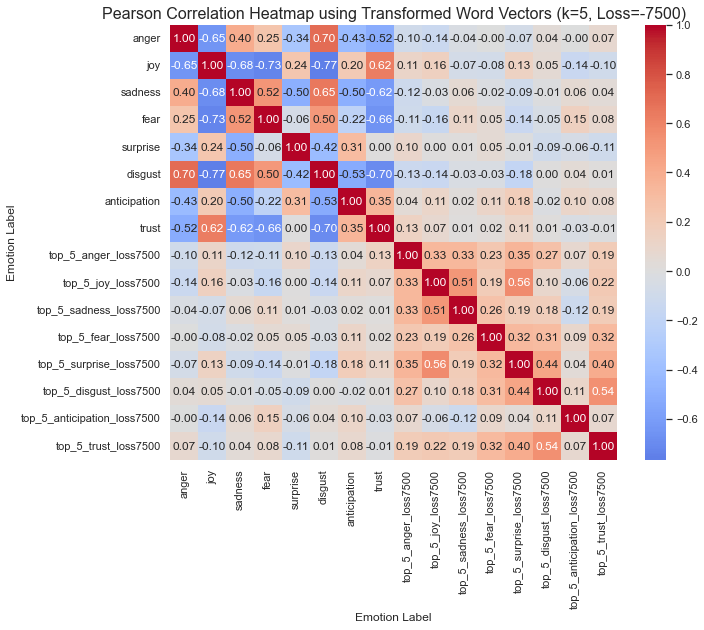

In [622]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_7500 = ['top_5_anger_loss7500', 'top_5_joy_loss7500', 'top_5_sadness_loss7500', 'top_5_fear_loss7500',
                            'top_5_surprise_loss7500', 'top_5_disgust_loss7500', 'top_5_anticipation_loss7500',
                            'top_5_trust_loss7500']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_7500

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss7500[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=5, Loss=-7500)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

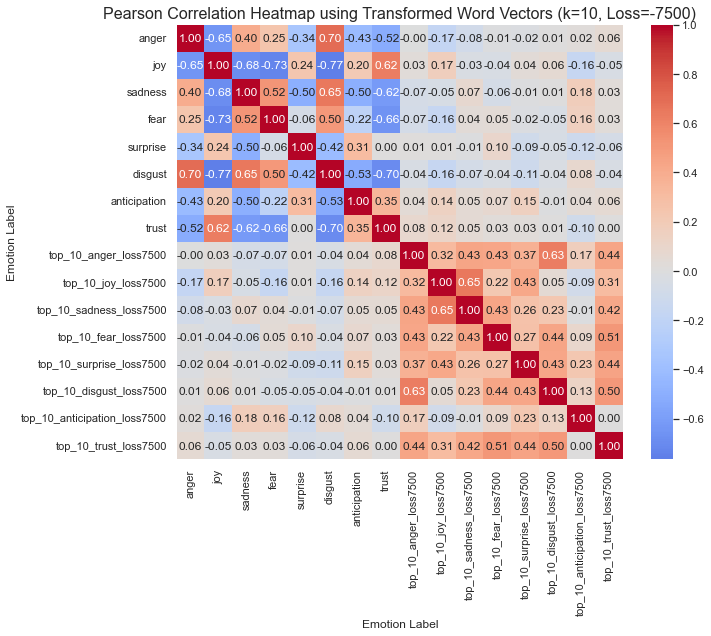

In [623]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_7500 = ['top_10_anger_loss7500', 'top_10_joy_loss7500', 'top_10_sadness_loss7500', 'top_10_fear_loss7500',
                            'top_10_surprise_loss7500', 'top_10_disgust_loss7500', 'top_10_anticipation_loss7500',
                            'top_10_trust_loss7500']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_7500

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss7500[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=10, Loss=-7500)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

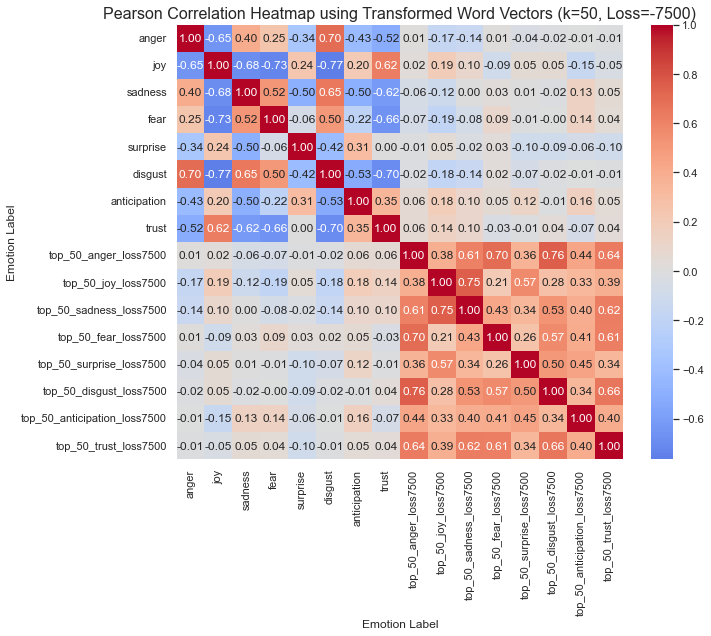

In [624]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_7500 = ['top_50_anger_loss7500', 'top_50_joy_loss7500', 'top_50_sadness_loss7500', 'top_50_fear_loss7500',
                            'top_50_surprise_loss7500', 'top_50_disgust_loss7500', 'top_50_anticipation_loss7500',
                            'top_50_trust_loss7500']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_7500

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss7500[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=50, Loss=-7500)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

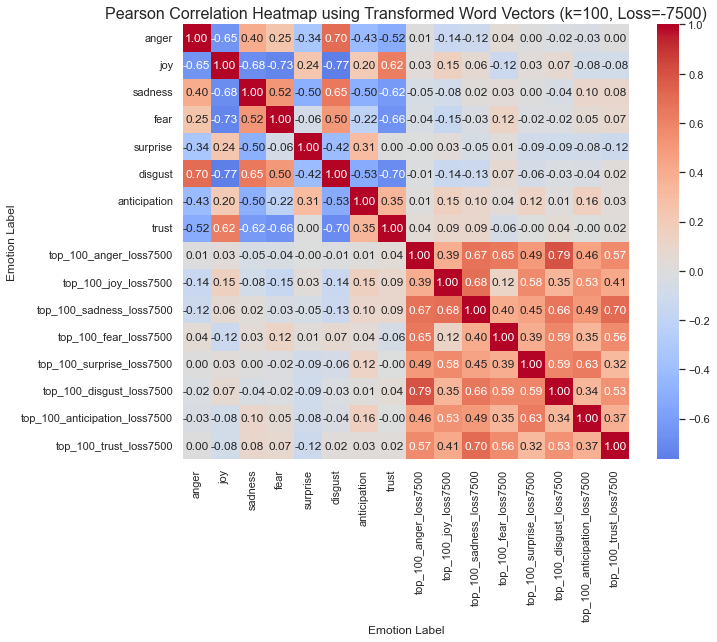

In [625]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_7500 = ['top_100_anger_loss7500', 'top_100_joy_loss7500', 'top_100_sadness_loss7500', 'top_100_fear_loss7500',
                            'top_100_surprise_loss7500', 'top_100_disgust_loss7500', 'top_100_anticipation_loss7500',
                            'top_100_trust_loss7500']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_7500

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss7500[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=100, Loss=-7500)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

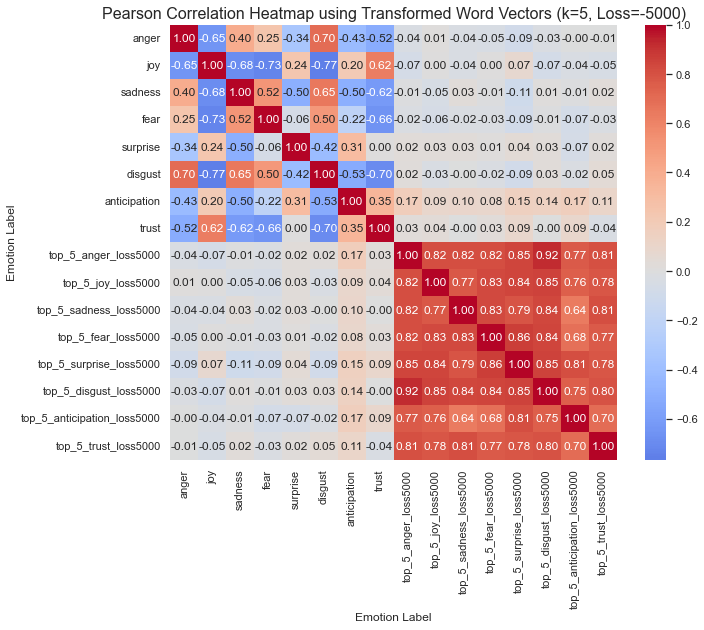

In [626]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_5000 = ['top_5_anger_loss5000', 'top_5_joy_loss5000', 'top_5_sadness_loss5000', 'top_5_fear_loss5000',
                            'top_5_surprise_loss5000', 'top_5_disgust_loss5000', 'top_5_anticipation_loss5000',
                            'top_5_trust_loss5000']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_5000

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss5000[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=5, Loss=-5000)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

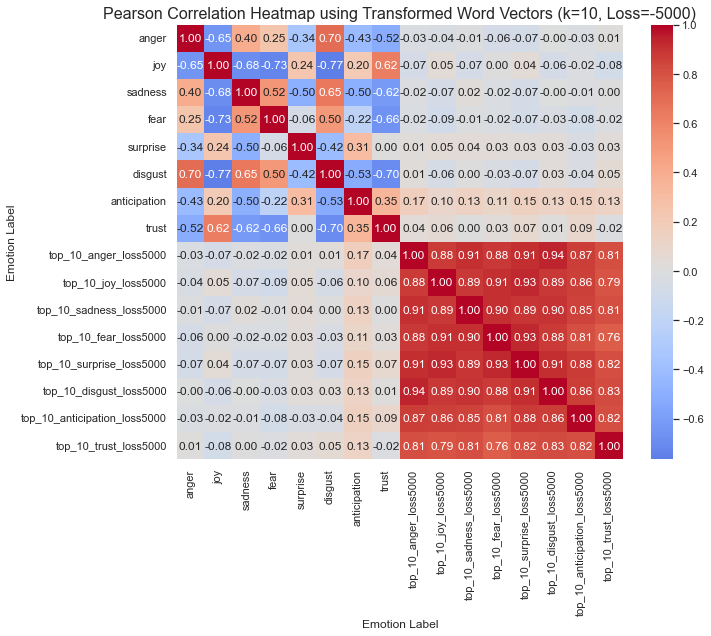

In [627]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_5000 = ['top_10_anger_loss5000', 'top_10_joy_loss5000', 'top_10_sadness_loss5000', 'top_10_fear_loss5000',
                            'top_10_surprise_loss5000', 'top_10_disgust_loss5000', 'top_10_anticipation_loss5000',
                            'top_10_trust_loss5000']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_5000

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss5000[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=10, Loss=-5000)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

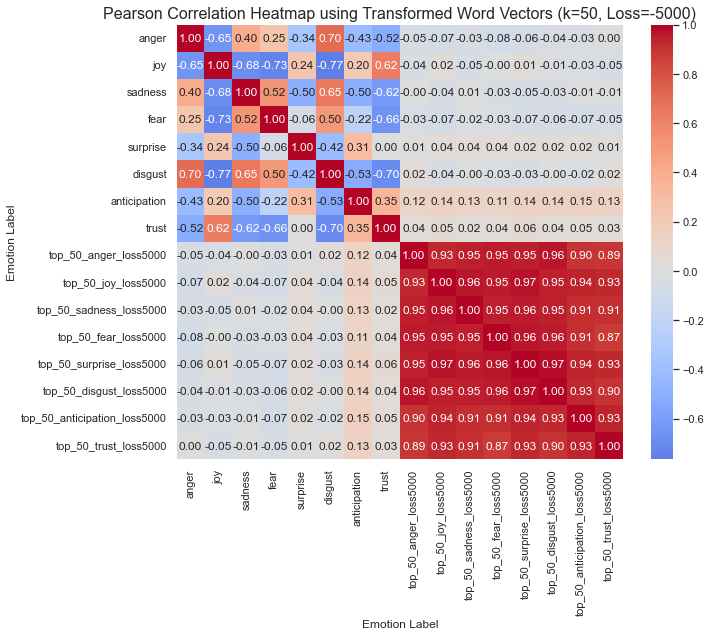

In [628]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_5000 = ['top_50_anger_loss5000', 'top_50_joy_loss5000', 'top_50_sadness_loss5000', 'top_50_fear_loss5000',
                            'top_50_surprise_loss5000', 'top_50_disgust_loss5000', 'top_50_anticipation_loss5000',
                            'top_50_trust_loss5000']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_5000

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss5000[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=50, Loss=-5000)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

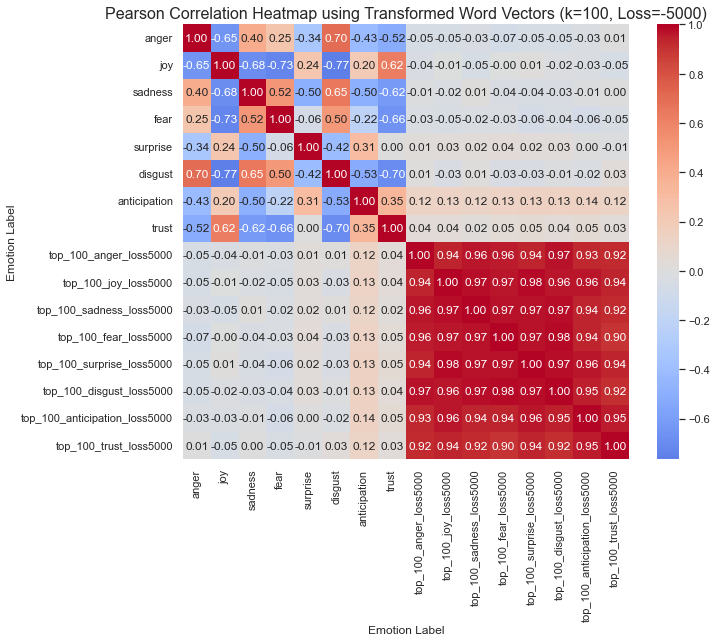

In [629]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_5000 = ['top_100_anger_loss5000', 'top_100_joy_loss5000', 'top_100_sadness_loss5000', 'top_100_fear_loss5000',
                            'top_100_surprise_loss5000', 'top_100_disgust_loss5000', 'top_100_anticipation_loss5000',
                            'top_100_trust_loss5000']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_5000

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss5000[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=100, Loss=-5000)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

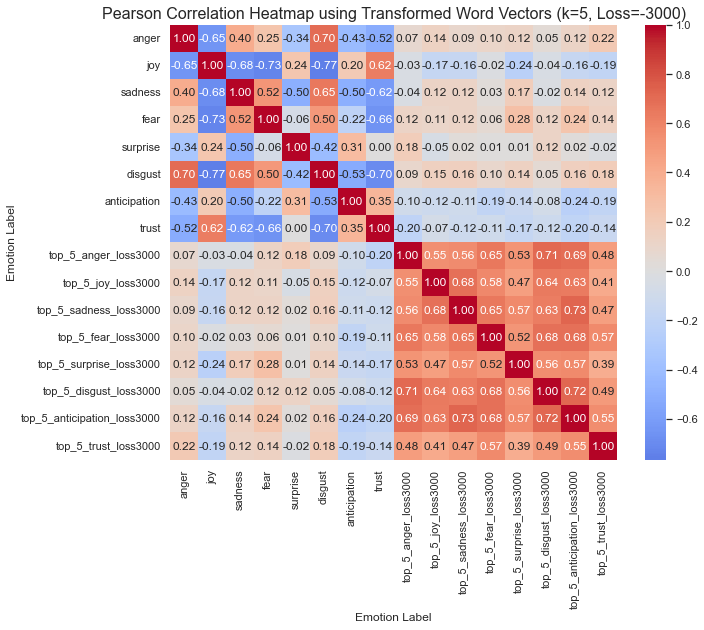

In [630]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_3000 = ['top_5_anger_loss3000', 'top_5_joy_loss3000', 'top_5_sadness_loss3000', 'top_5_fear_loss3000',
                            'top_5_surprise_loss3000', 'top_5_disgust_loss3000', 'top_5_anticipation_loss3000',
                            'top_5_trust_loss3000']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_3000

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss3000[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=5, Loss=-3000)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

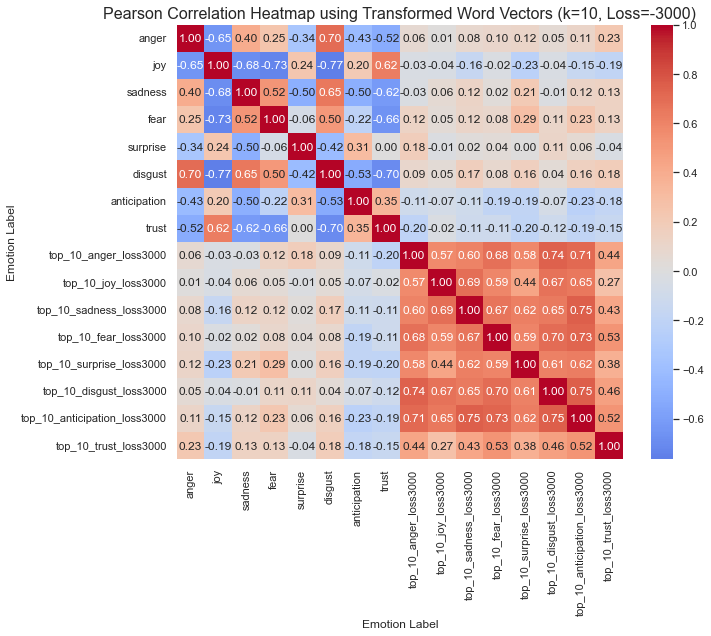

In [631]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_3000 = ['top_10_anger_loss3000', 'top_10_joy_loss3000', 'top_10_sadness_loss3000', 'top_10_fear_loss3000',
                            'top_10_surprise_loss3000', 'top_10_disgust_loss3000', 'top_10_anticipation_loss3000',
                            'top_10_trust_loss3000']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_3000

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss3000[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=10, Loss=-3000)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

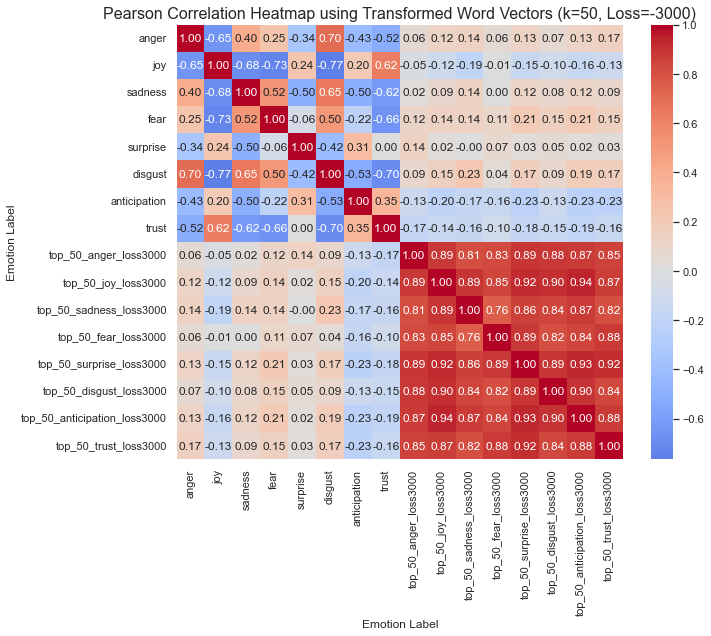

In [632]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_3000 = ['top_50_anger_loss3000', 'top_50_joy_loss3000', 'top_50_sadness_loss3000', 'top_50_fear_loss3000',
                            'top_50_surprise_loss3000', 'top_50_disgust_loss3000', 'top_50_anticipation_loss3000',
                            'top_50_trust_loss3000']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_3000

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss3000[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=50, Loss=-3000)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

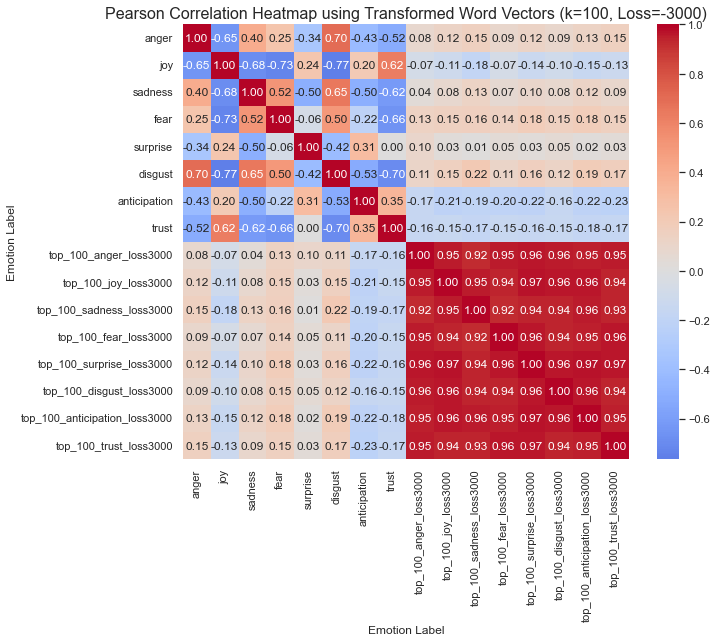

In [633]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_3000 = ['top_100_anger_loss3000', 'top_100_joy_loss3000', 'top_100_sadness_loss3000', 'top_100_fear_loss3000',
                            'top_100_surprise_loss3000', 'top_100_disgust_loss3000', 'top_100_anticipation_loss3000',
                            'top_100_trust_loss3000']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_3000

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss3000[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=100, Loss=-3000)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

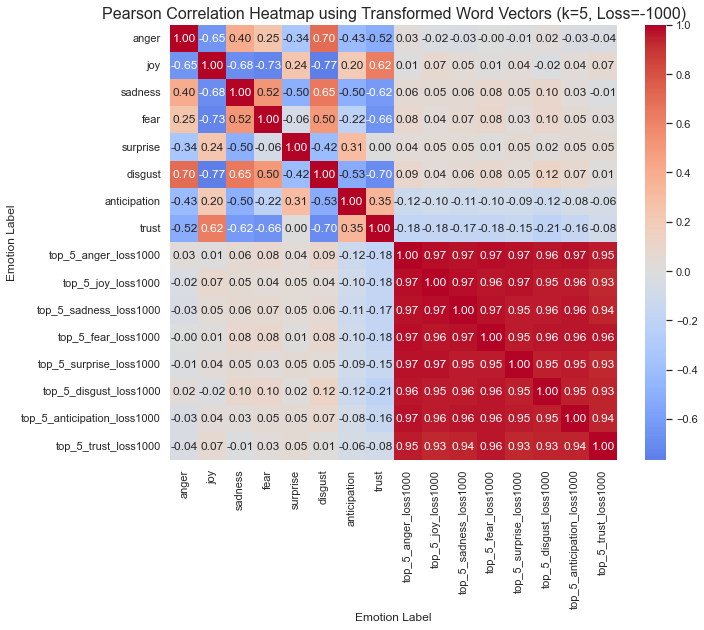

In [634]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_1000 = ['top_5_anger_loss1000', 'top_5_joy_loss1000', 'top_5_sadness_loss1000', 'top_5_fear_loss1000',
                            'top_5_surprise_loss1000', 'top_5_disgust_loss1000', 'top_5_anticipation_loss1000',
                            'top_5_trust_loss1000']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_1000

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss1000[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=5, Loss=-1000)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

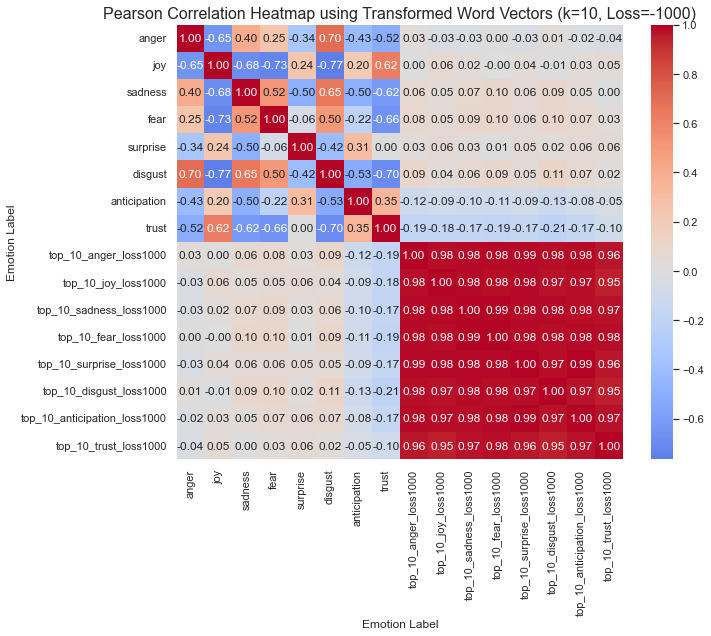

In [635]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_1000 = ['top_10_anger_loss1000', 'top_10_joy_loss1000', 'top_10_sadness_loss1000', 'top_10_fear_loss1000',
                            'top_10_surprise_loss1000', 'top_10_disgust_loss1000', 'top_10_anticipation_loss1000',
                            'top_10_trust_loss1000']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_1000

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss1000[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=10, Loss=-1000)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

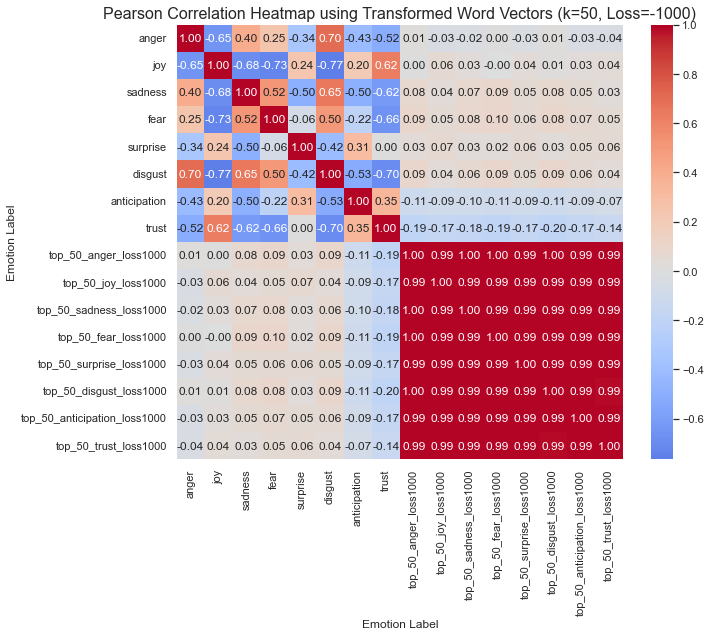

In [636]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_1000 = ['top_50_anger_loss1000', 'top_50_joy_loss1000', 'top_50_sadness_loss1000', 'top_50_fear_loss1000',
                            'top_50_surprise_loss1000', 'top_50_disgust_loss1000', 'top_50_anticipation_loss1000',
                            'top_50_trust_loss1000']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_1000

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss1000[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=50, Loss=-1000)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

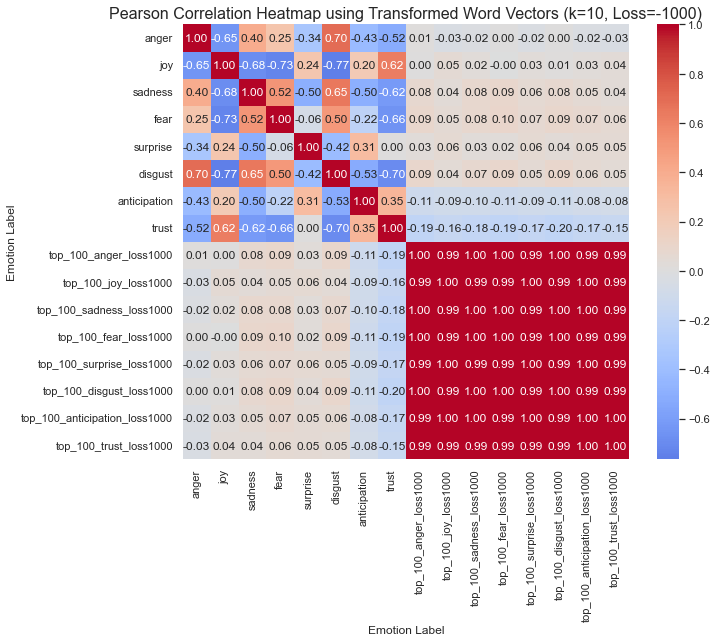

In [642]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_1000 = ['top_100_anger_loss1000', 'top_100_joy_loss1000', 'top_100_sadness_loss1000', 'top_100_fear_loss1000',
                            'top_100_surprise_loss1000', 'top_100_disgust_loss1000', 'top_100_anticipation_loss1000',
                            'top_100_trust_loss1000']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_1000

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss1000[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=10, Loss=-1000)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

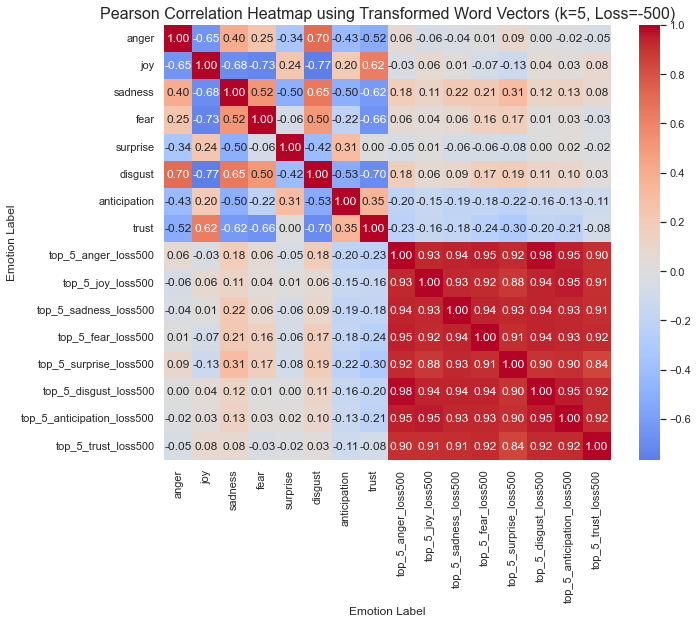

In [638]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_500 = ['top_5_anger_loss500', 'top_5_joy_loss500', 'top_5_sadness_loss500', 'top_5_fear_loss500',
                            'top_5_surprise_loss500', 'top_5_disgust_loss500', 'top_5_anticipation_loss500',
                            'top_5_trust_loss500']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_500

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss500[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=5, Loss=-500)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

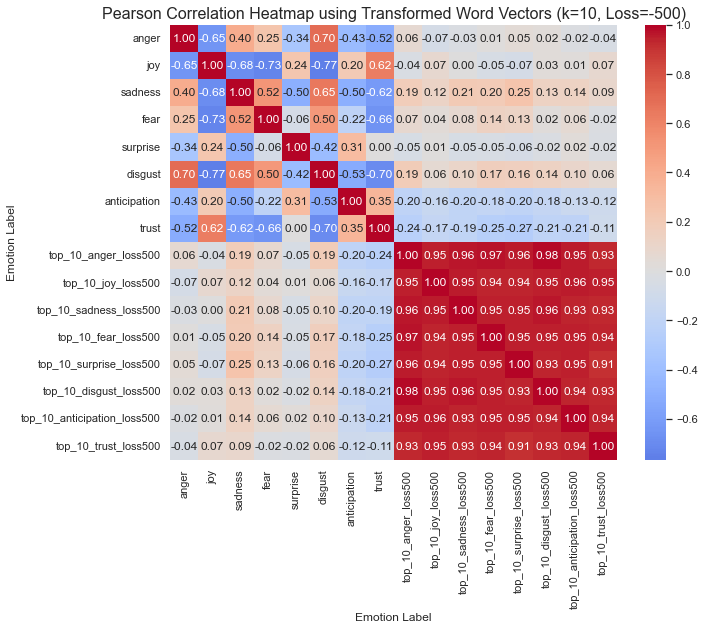

In [639]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_500 = ['top_10_anger_loss500', 'top_10_joy_loss500', 'top_10_sadness_loss500', 'top_10_fear_loss500',
                            'top_10_surprise_loss500', 'top_10_disgust_loss500', 'top_10_anticipation_loss500',
                            'top_10_trust_loss500']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_500

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss500[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=10, Loss=-500)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

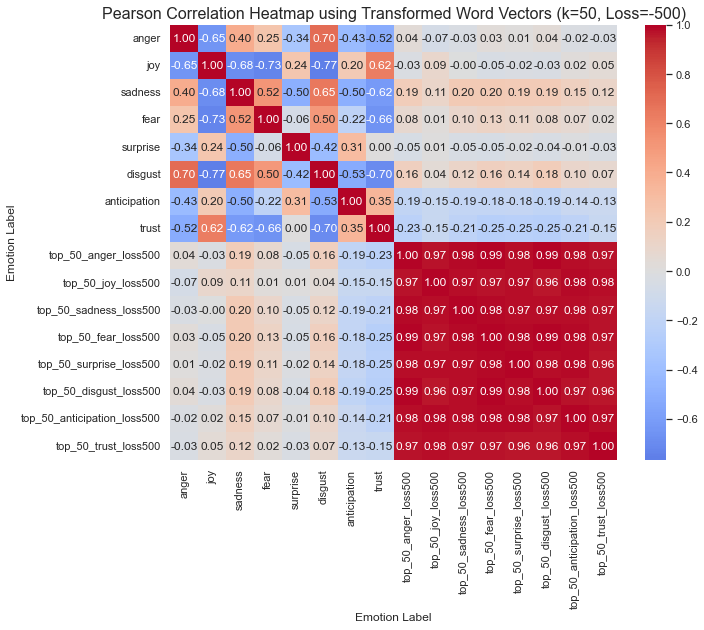

In [640]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_500 = ['top_50_anger_loss500', 'top_50_joy_loss500', 'top_50_sadness_loss500', 'top_50_fear_loss500',
                            'top_50_surprise_loss500', 'top_50_disgust_loss500', 'top_50_anticipation_loss500',
                            'top_50_trust_loss500']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_500

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss500[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=50, Loss=-500)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

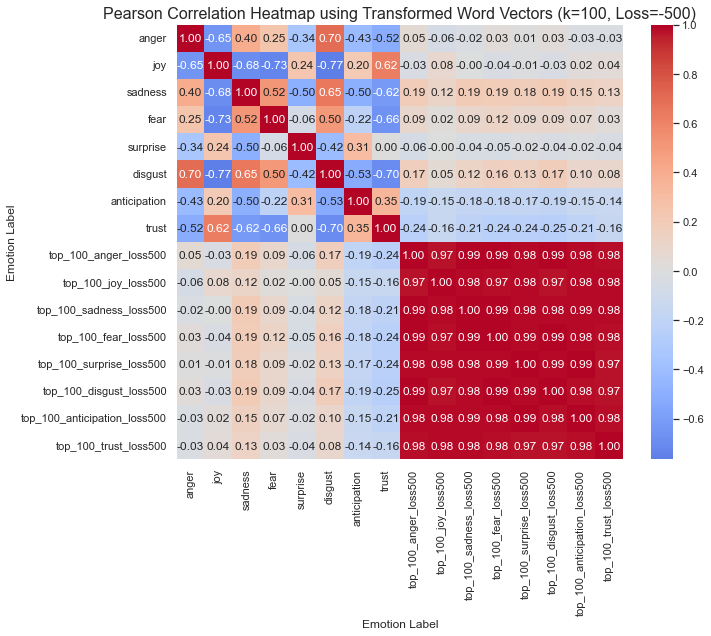

In [641]:
#Create list to compare basic emotion values here to the similarity scores from word vectors
cosine_sim_emotions_500 = ['top_100_anger_loss500', 'top_100_joy_loss500', 'top_100_sadness_loss500', 'top_100_fear_loss500',
                            'top_100_surprise_loss500', 'top_100_disgust_loss500', 'top_100_anticipation_loss500',
                            'top_100_trust_loss500']

#Define columns to be included in the matric
cosin_eval = emotions + cosine_sim_emotions_500

#Calculate Pearson correlation coefficients
correlation_matrix = df_binarycomp_loss500[cosin_eval].corr(method='pearson')

#Define heatmap design
sns.set(style='white')
plt.figure(figsize=(10, 8))

#Create the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")

#Add title and labels
plt.title("Pearson Correlation Heatmap using Transformed Word Vectors (k=100, Loss=-500)", fontsize=16)
plt.xlabel('Emotion Label', fontsize=12)
plt.ylabel('Emotion Label', fontsize=12)

#Show the plot
plt.show()

# Preparation for machine learning- Feature Scaling

Scaling is a challenge in the context of this problem set. Due to the nature of emotions, it may not be desirable to scale data within the subclasses of basic and dimensional theory in line with the overall dataset as the greater and lesser relavtive values of each emotion are reflective of the strength of the emotion which is associated with the emoji itself. This is additional relevant and important information which should be retained. However this is not to say that the two models data is appropriately scaled for optimal compatability at present. The following section aims to evaluate if feature scaling for numeric values is necessary, and if so, the optimal method to do so.

In [687]:
#Start with the basiccomp df

#Check for columns containing numerical data
df_basiccomp.dtypes

unicode                 object
emoji                   object
anger                  float64
anticipation           float64
disgust                float64
fear                   float64
joy                    float64
sadness                float64
surprise               float64
trust                  float64
Position               float64
Unicode block           object
le_+                   float64
le_-                   float64
le_0                   float64
sent_score             float64
sent_score_class        object
upper_error_class       object
lower_error_class       object
sent_polar              object
primary_basic_emot      object
total                  float64
co_sim_anger           float64
co_sim_joy             float64
co_sim_sadness         float64
co_sim_fear            float64
co_sim_surprise        float64
co_sim_disgust         float64
co_sim_anticipation    float64
co_sim_trust           float64
dtype: object

In [689]:
#Add columns to aid in scaling data later on

#Basic theory human annotated
df_basiccomp['total_prescale'] = df_basiccomp['anger'] + df_basiccomp['joy'] + df_basiccomp['sadness'] + df_basiccomp['fear'] + df_basiccomp['surprise'] + df_basiccomp['disgust'] + df_basiccomp['anticipation'] + df_basiccomp['trust']

#Basic theory cosine similarity
df_basiccomp['total_cosin_sim'] = df_basiccomp['co_sim_anger'] + df_basiccomp['co_sim_joy'] + df_basiccomp['co_sim_sadness'] + df_basiccomp['co_sim_fear'] + df_basiccomp['co_sim_surprise'] + df_basiccomp['co_sim_disgust'] + df_basiccomp['co_sim_anticipation'] + df_basiccomp['co_sim_trust']
df_basiccomp['total_cosin_sim_prescale'] = df_basiccomp['co_sim_anger'] + df_basiccomp['co_sim_joy'] + df_basiccomp['co_sim_sadness'] + df_basiccomp['co_sim_fear'] + df_basiccomp['co_sim_surprise'] + df_basiccomp['co_sim_disgust'] + df_basiccomp['co_sim_anticipation'] + df_basiccomp['co_sim_trust']

#Dimensional theory
df_basiccomp['dt_total'] = df_basiccomp['le_+'] + df_basiccomp['le_-']
df_basiccomp['dt_total_prescale'] = df_basiccomp['le_+'] + df_basiccomp['le_-']

df_basiccomp.columns

Index(['unicode', 'emoji', 'anger', 'anticipation', 'disgust', 'fear', 'joy',
       'sadness', 'surprise', 'trust', 'Position', 'Unicode block', 'le_+',
       'le_-', 'le_0', 'sent_score', 'sent_score_class', 'upper_error_class',
       'lower_error_class', 'sent_polar', 'primary_basic_emot', 'total',
       'co_sim_anger', 'co_sim_joy', 'co_sim_sadness', 'co_sim_fear',
       'co_sim_surprise', 'co_sim_disgust', 'co_sim_anticipation',
       'co_sim_trust', 'total_prescale', 'total_cosin_sim',
       'total_cosin_sim_prescale', 'dt_total', 'dt_total_prescale'],
      dtype='object')

In [691]:
#Check means
print(df_basiccomp['total'].mean(), df_basiccomp['sent_score'].mean(), df_basiccomp['le_0'].mean(), 
df_basiccomp['total_cosin_sim'].mean(), df_basiccomp['dt_total'].mean())

1.5528859060402682 0.32754414318448444 0.3179537187036618 1.3845979102224 0.682046281296337


In [692]:
#Check medians
print(df_basiccomp['total'].median(), df_basiccomp['sent_score'].median(), df_basiccomp['le_0'].median(), 
df_basiccomp['total_cosin_sim'].median(), df_basiccomp['dt_total'].median())

1.6100000000000003 0.4169909208819715 0.2786885245901639 1.3543308936059475 0.721311475409836


In [693]:
#Check ranges
df_basiccomp.describe()

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,Position,le_+,...,co_sim_fear,co_sim_surprise,co_sim_disgust,co_sim_anticipation,co_sim_trust,total_prescale,total_cosin_sim,total_cosin_sim_prescale,dt_total,dt_total_prescale
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,...,132.000000,132.000000,132.000000,132.000000,132.000000,149.000000,132.000000,132.000000,149.000000,149.000000
mean,0.154453,0.296006,0.164143,0.159612,0.326227,0.164158,0.196485,0.275838,0.748170,0.504795,...,0.179055,0.169858,0.193592,0.129364,0.127170,1.736922,1.384598,1.384598,0.682046,0.682046
std,0.134433,0.187403,0.138884,0.125805,0.211109,0.136795,0.117012,0.188641,0.117897,0.171828,...,0.093699,0.081604,0.100793,0.069138,0.089050,0.837552,0.579169,0.579169,0.140179,0.140179
min,0.043290,0.075630,0.043290,0.043290,0.033898,0.043290,0.040816,0.048544,0.193496,0.123188,...,-0.020527,-0.051255,-0.038751,-0.017648,-0.046837,1.253968,-0.029802,-0.029802,0.144928,0.144928
25%,0.066667,0.188406,0.068966,0.080000,0.118644,0.071942,0.125749,0.139073,0.701409,0.359684,...,0.113283,0.122768,0.123092,0.081172,0.075001,1.406091,0.951750,0.951750,0.632911,0.632911
50%,0.112360,0.248731,0.123288,0.120482,0.357143,0.116279,0.175115,0.256757,0.779044,0.526316,...,0.169714,0.168862,0.187419,0.129250,0.121534,1.496894,1.354331,1.354331,0.721311,0.721311
75%,0.183908,0.344371,0.213953,0.203209,0.476636,0.207207,0.238095,0.351598,0.827467,0.633523,...,0.241180,0.214979,0.256874,0.176631,0.174402,1.689655,1.778586,1.778586,0.778894,0.778894
max,0.909091,1.636364,0.909091,0.909091,1.181818,0.909091,0.909091,1.285714,0.919654,0.798969,...,0.497504,0.397162,0.569449,0.311745,0.530353,8.272727,2.851834,2.851834,0.891963,0.891963


Proposed scaling methodology: There are four primary numeric parameter categories for emotion sentiment in this dataset; 'total'- sum of all affinities to the basic emotion categories (likewise for the cosine similarity scores), 'sent_score'- polar score based on a positive/negative scale from the dimensional model and 'le_0'- value from dimensional model which represents degree of arousal with regards to a particular emotion. 'Total' and 'sent_score' are each made up of the cumulation of values from other columns and thus are a good manner in which to normalise influence of values across the two models. These parameters will be scaled and the parameters which they are comprised of will be rescaled based on the scaled values within their row rather than with consideration to any other row. For example where the core parameters were rescaled from 0 to 1 using a min-max scaler (normalisation) and emoji X has a 'total' value which is scaled to 0.8 and it had a 50% affinity to anger the value associated with anger would be 0.4 rather than 0.5. Note that the purpose of this methods it to address the observation that it is not necessarily valid to normalise the components of these core parameters as this would result in bias in many cases.

In [694]:
#Scale as per proposed method

#Define columns to be scaled
scale_cols=['total', 'sent_score', 'le_0', 'Position', 'total_cosin_sim', 'dt_total']

#Apply min max scaler to relevant columns
def scaling(df_basiccomp):
    scaler = MinMaxScaler(feature_range=(0.01, 1)) #To avoid re-addition of zero-probabilities
    df_basiccomp[scale_cols]=scaler.fit_transform(df_basiccomp[scale_cols])
    return df_basiccomp

#Apply the function
df_basiccomp = scaling(df_basiccomp)

#Verify it worked
df_basiccomp.describe()

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,Position,le_+,...,co_sim_fear,co_sim_surprise,co_sim_disgust,co_sim_anticipation,co_sim_trust,total_prescale,total_cosin_sim,total_cosin_sim_prescale,dt_total,dt_total_prescale
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,...,132.000000,132.000000,132.000000,132.000000,132.000000,149.000000,132.000000,132.000000,149.000000,149.000000
mean,0.154453,0.296006,0.164143,0.159612,0.326227,0.164158,0.196485,0.275838,0.766209,0.504795,...,0.179055,0.169858,0.193592,0.129364,0.127170,1.736922,0.495924,1.384598,0.721810,0.682046
std,0.134433,0.187403,0.138884,0.125805,0.211109,0.136795,0.117012,0.188641,0.160733,0.171828,...,0.093699,0.081604,0.100793,0.069138,0.089050,0.837552,0.198976,0.579169,0.185770,0.140179
min,0.043290,0.075630,0.043290,0.043290,0.033898,0.043290,0.040816,0.048544,0.010000,0.123188,...,-0.020527,-0.051255,-0.038751,-0.017648,-0.046837,1.253968,0.010000,-0.029802,0.010000,0.144928
25%,0.066667,0.188406,0.068966,0.080000,0.118644,0.071942,0.125749,0.139073,0.702458,0.359684,...,0.113283,0.122768,0.123092,0.081172,0.075001,1.406091,0.347217,0.951750,0.656695,0.632911
50%,0.112360,0.248731,0.123288,0.120482,0.357143,0.116279,0.175115,0.256757,0.808300,0.526316,...,0.169714,0.168862,0.187419,0.129250,0.121534,1.496894,0.485525,1.354331,0.773846,0.721311
75%,0.183908,0.344371,0.213953,0.203209,0.476636,0.207207,0.238095,0.351598,0.874317,0.633523,...,0.241180,0.214979,0.256874,0.176631,0.174402,1.689655,0.631280,1.778586,0.850157,0.778894
max,0.909091,1.636364,0.909091,0.909091,1.181818,0.909091,0.909091,1.285714,1.000000,0.798969,...,0.497504,0.397162,0.569449,0.311745,0.530353,8.272727,1.000000,2.851834,1.000000,0.891963


In [695]:
#Start with basic theory human data

#Determine scaling factor for the row
df_basiccomp['scaling_factor'] = df_basiccomp['total_prescale'] / df_basiccomp['total']

#Scale each basic emotion value using the scaling factor
df_basiccomp['anger'] = df_basiccomp['anger'] / df_basiccomp['scaling_factor']
df_basiccomp['anticipation'] = df_basiccomp['anticipation'] / df_basiccomp['scaling_factor']
df_basiccomp['disgust'] = df_basiccomp['disgust'] / df_basiccomp['scaling_factor']
df_basiccomp['fear'] = df_basiccomp['fear'] / df_basiccomp['scaling_factor']
df_basiccomp['joy'] = df_basiccomp['joy'] / df_basiccomp['scaling_factor']
df_basiccomp['sadness'] = df_basiccomp['sadness'] / df_basiccomp['scaling_factor']
df_basiccomp['surprise'] = df_basiccomp['surprise'] / df_basiccomp['scaling_factor']
df_basiccomp['trust'] = df_basiccomp['trust'] / df_basiccomp['scaling_factor']

#Remove columns that are no longer needed
df_basiccomp = df_basiccomp.drop(columns=['total_prescale', 'scaling_factor'])

df_basiccomp.describe()

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,Position,le_+,...,co_sim_sadness,co_sim_fear,co_sim_surprise,co_sim_disgust,co_sim_anticipation,co_sim_trust,total_cosin_sim,total_cosin_sim_prescale,dt_total,dt_total_prescale
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,...,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,149.000000,149.000000
mean,0.042490,0.076001,0.047440,0.047364,0.090365,0.049037,0.055693,0.071498,0.766209,0.504795,...,0.179721,0.179055,0.169858,0.193592,0.129364,0.127170,0.495924,1.384598,0.721810,0.682046
std,0.042791,0.035287,0.046072,0.048874,0.070341,0.055080,0.036799,0.046182,0.160733,0.171828,...,0.110795,0.093699,0.081604,0.100793,0.069138,0.089050,0.198976,0.579169,0.185770,0.140179
min,0.001099,0.001978,0.001099,0.001099,0.001429,0.001099,0.001099,0.001099,0.010000,0.123188,...,-0.043420,-0.020527,-0.051255,-0.038751,-0.017648,-0.046837,0.010000,-0.029802,0.010000,0.144928
25%,0.019370,0.051549,0.019309,0.019370,0.024484,0.019782,0.029197,0.039906,0.702458,0.359684,...,0.118626,0.113283,0.122768,0.123092,0.081172,0.075001,0.347217,0.951750,0.656695,0.632911
50%,0.022793,0.073606,0.022623,0.026510,0.070020,0.023358,0.049237,0.058336,0.808300,0.526316,...,0.165876,0.169714,0.168862,0.187419,0.129250,0.121534,0.485525,1.354331,0.773846,0.721311
75%,0.047478,0.100284,0.057727,0.054324,0.149256,0.047865,0.073565,0.095147,0.874317,0.633523,...,0.246301,0.241180,0.214979,0.256874,0.176631,0.174402,0.631280,1.778586,0.850157,0.778894
max,0.257910,0.215172,0.185523,0.266749,0.256943,0.259172,0.223153,0.216957,1.000000,0.798969,...,0.483126,0.497504,0.397162,0.569449,0.311745,0.530353,1.000000,2.851834,1.000000,0.891963


In [696]:
#Repeat for cosine similarity data using similar method

#Determine scaling factor for the row
df_basiccomp['scaling_factor'] = df_basiccomp['total_cosin_sim_prescale'] / df_basiccomp['total_cosin_sim']

#Scale each basic emotion value using the scaling factor
df_basiccomp['co_sim_anger'] = df_basiccomp['co_sim_anger'] / df_basiccomp['scaling_factor']
df_basiccomp['co_sim_anticipation'] = df_basiccomp['co_sim_anticipation'] / df_basiccomp['scaling_factor']
df_basiccomp['co_sim_disgust'] = df_basiccomp['co_sim_disgust'] / df_basiccomp['scaling_factor']
df_basiccomp['co_sim_fear'] = df_basiccomp['co_sim_fear'] / df_basiccomp['scaling_factor']
df_basiccomp['co_sim_joy'] = df_basiccomp['co_sim_joy'] / df_basiccomp['scaling_factor']
df_basiccomp['co_sim_sadness'] = df_basiccomp['co_sim_sadness'] / df_basiccomp['scaling_factor']
df_basiccomp['co_sim_surprise'] = df_basiccomp['co_sim_surprise'] / df_basiccomp['scaling_factor']
df_basiccomp['co_sim_trust'] = df_basiccomp['co_sim_trust'] / df_basiccomp['scaling_factor']

#Remove columns that are no longer needed
df_basiccomp = df_basiccomp.drop(columns=['total_cosin_sim_prescale', 'scaling_factor'])

df_basiccomp.describe()

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,Position,le_+,...,co_sim_joy,co_sim_sadness,co_sim_fear,co_sim_surprise,co_sim_disgust,co_sim_anticipation,co_sim_trust,total_cosin_sim,dt_total,dt_total_prescale
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,...,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,149.000000,149.000000
mean,0.042490,0.076001,0.047440,0.047364,0.090365,0.049037,0.055693,0.071498,0.766209,0.504795,...,0.084665,0.064408,0.064149,0.060988,0.069049,0.046432,0.045400,0.495924,0.721810,0.682046
std,0.042791,0.035287,0.046072,0.048874,0.070341,0.055080,0.036799,0.046182,0.160733,0.171828,...,0.039408,0.038612,0.032715,0.028607,0.035848,0.024264,0.031751,0.198976,0.185770,0.140179
min,0.001099,0.001978,0.001099,0.001099,0.001429,0.001099,0.001099,0.001099,0.010000,0.123188,...,-0.007726,-0.009667,-0.007786,-0.019605,-0.034822,-0.006452,-0.042089,0.010000,0.010000,0.144928
25%,0.019370,0.051549,0.019309,0.019370,0.024484,0.019782,0.029197,0.039906,0.702458,0.359684,...,0.058076,0.042346,0.041202,0.044746,0.045397,0.029843,0.028600,0.347217,0.656695,0.632911
50%,0.022793,0.073606,0.022623,0.026510,0.070020,0.023358,0.049237,0.058336,0.808300,0.526316,...,0.080909,0.060065,0.060919,0.060042,0.067028,0.046013,0.043383,0.485525,0.773846,0.721311
75%,0.047478,0.100284,0.057727,0.054324,0.149256,0.047865,0.073565,0.095147,0.874317,0.633523,...,0.111687,0.087891,0.086216,0.076816,0.092277,0.062542,0.061937,0.631280,0.850157,0.778894
max,0.257910,0.215172,0.185523,0.266749,0.256943,0.259172,0.223153,0.216957,1.000000,0.798969,...,0.230699,0.170278,0.175698,0.140261,0.199678,0.110105,0.187380,1.000000,1.000000,0.891963


In [697]:
#Repeat similar method for dimensional theory data- only +ve and -ve

#Determine scaling factor for the row
df_basiccomp['scaling_factor'] = df_basiccomp['dt_total_prescale'] / df_basiccomp['dt_total']

#Scale each basic emotion value using the scaling factor
df_basiccomp['le_+'] = df_basiccomp['le_+']/df_basiccomp['scaling_factor']

#Remove columns that are no longer needed
df_basiccomp = df_basiccomp.drop(columns=['dt_total_prescale', 'scaling_factor'])

#Verify transformations are ok
df_basiccomp.describe()

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,Position,le_+,...,co_sim_anger,co_sim_joy,co_sim_sadness,co_sim_fear,co_sim_surprise,co_sim_disgust,co_sim_anticipation,co_sim_trust,total_cosin_sim,dt_total
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,...,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,149.000000
mean,0.042490,0.076001,0.047440,0.047364,0.090365,0.049037,0.055693,0.071498,0.766209,0.532552,...,0.060833,0.084665,0.064408,0.064149,0.060988,0.069049,0.046432,0.045400,0.495924,0.721810
std,0.042791,0.035287,0.046072,0.048874,0.070341,0.055080,0.036799,0.046182,0.160733,0.200278,...,0.034928,0.039408,0.038612,0.032715,0.028607,0.035848,0.024264,0.031751,0.198976,0.185770
min,0.001099,0.001978,0.001099,0.001099,0.001429,0.001099,0.001099,0.001099,0.010000,0.008500,...,-0.027443,-0.007726,-0.009667,-0.007786,-0.019605,-0.034822,-0.006452,-0.042089,0.010000,0.010000
25%,0.019370,0.051549,0.019309,0.019370,0.024484,0.019782,0.029197,0.039906,0.702458,0.380009,...,0.042332,0.058076,0.042346,0.041202,0.044746,0.045397,0.029843,0.028600,0.347217,0.656695
50%,0.022793,0.073606,0.022623,0.026510,0.070020,0.023358,0.049237,0.058336,0.808300,0.544959,...,0.059230,0.080909,0.060065,0.060919,0.060042,0.067028,0.046013,0.043383,0.485525,0.773846
75%,0.047478,0.100284,0.057727,0.054324,0.149256,0.047865,0.073565,0.095147,0.874317,0.681591,...,0.077305,0.111687,0.087891,0.086216,0.076816,0.092277,0.062542,0.061937,0.631280,0.850157
max,0.257910,0.215172,0.185523,0.266749,0.256943,0.259172,0.223153,0.216957,1.000000,0.881341,...,0.239273,0.230699,0.170278,0.175698,0.140261,0.199678,0.110105,0.187380,1.000000,1.000000


In [698]:
#Same logic used for binarycomp

#Check for columns containing numerical data
df_binarycomp.columns

Index(['unicode', 'emoji', 'anger', 'anticipation', 'disgust', 'fear', 'joy',
       'sadness', 'surprise', 'trust', 'Position', 'Unicode block', 'le_+',
       'le_-', 'le_0', 'sent_score', 'sent_score_class', 'upper_error_class',
       'lower_error_class', 'sent_polar', 'primary_basic_emot',
       'top5_cosim_anger', 'top5_cosim_anticipation', 'top5_cosim_disgust',
       'top5_cosim_fear', 'top5_cosim_joy', 'top5_cosim_sadness',
       'top5_cosim_surprise', 'top5_cosim_trust', 'top10_cosim_anger',
       'top50_cosim_anger', 'top100_cosim_anger', 'top10_cosim_joy',
       'top50_cosim_joy', 'top100_cosim_joy', 'top10_cosim_sadness',
       'top50_cosim_sadness', 'top100_cosim_sadness', 'top10_cosim_fear',
       'top50_cosim_fear', 'top100_cosim_fear', 'top10_cosim_surprise',
       'top50_cosim_surprise', 'top100_cosim_surprise', 'top10_cosim_disgust',
       'top50_cosim_disgust', 'top100_cosim_disgust',
       'top10_cosim_anticipation', 'top50_cosim_anticipation',
       'top

In [700]:
#Add columns to aid in scaling data later on

#Basic theory human annotated data
df_binarycomp['total'] = df_binarycomp['anger'] + df_binarycomp['joy'] + df_binarycomp['sadness'] + df_binarycomp['fear'] + df_binarycomp['surprise'] + df_binarycomp['disgust'] + df_binarycomp['anticipation'] + df_binarycomp['trust']
df_binarycomp['total_prescale'] = df_binarycomp['anger'] + df_binarycomp['joy'] + df_binarycomp['sadness'] + df_binarycomp['fear'] + df_binarycomp['surprise'] + df_binarycomp['disgust'] + df_binarycomp['anticipation'] + df_binarycomp['trust']

#Basic theory cosine similarity data
df_binarycomp['total_cosin_sim_5'] = df_binarycomp['top5_cosim_anger'] + df_binarycomp['top5_cosim_joy'] + df_binarycomp['top5_cosim_sadness'] + df_binarycomp['top5_cosim_fear'] + df_binarycomp['top5_cosim_surprise'] + df_binarycomp['top5_cosim_disgust'] + df_binarycomp['top5_cosim_anticipation'] + df_binarycomp['top5_cosim_trust']
df_binarycomp['total_cosin_sim_5_prescale'] = df_binarycomp['top5_cosim_anger'] + df_binarycomp['top5_cosim_joy'] + df_binarycomp['top5_cosim_sadness'] + df_binarycomp['top5_cosim_fear'] + df_binarycomp['top5_cosim_surprise'] + df_binarycomp['top5_cosim_disgust'] + df_binarycomp['top5_cosim_anticipation'] + df_binarycomp['top5_cosim_trust']

df_binarycomp['total_cosin_sim_10'] = df_binarycomp['top10_cosim_anger'] + df_binarycomp['top10_cosim_joy'] + df_binarycomp['top10_cosim_sadness'] + df_binarycomp['top10_cosim_fear'] + df_binarycomp['top10_cosim_surprise'] + df_binarycomp['top10_cosim_disgust'] + df_binarycomp['top10_cosim_anticipation'] + df_binarycomp['top10_cosim_trust']
df_binarycomp['total_cosin_sim_10_prescale'] = df_binarycomp['top10_cosim_anger'] + df_binarycomp['top10_cosim_joy'] + df_binarycomp['top10_cosim_sadness'] + df_binarycomp['top10_cosim_fear'] + df_binarycomp['top10_cosim_surprise'] + df_binarycomp['top10_cosim_disgust'] + df_binarycomp['top10_cosim_anticipation'] + df_binarycomp['top10_cosim_trust']

df_binarycomp['total_cosin_sim_50'] = df_binarycomp['top50_cosim_anger'] + df_binarycomp['top50_cosim_joy'] + df_binarycomp['top50_cosim_sadness'] + df_binarycomp['top50_cosim_fear'] + df_binarycomp['top50_cosim_surprise'] + df_binarycomp['top50_cosim_disgust'] + df_binarycomp['top50_cosim_anticipation'] + df_binarycomp['top50_cosim_trust']
df_binarycomp['total_cosin_sim_50_prescale'] = df_binarycomp['top50_cosim_anger'] + df_binarycomp['top50_cosim_joy'] + df_binarycomp['top50_cosim_sadness'] + df_binarycomp['top50_cosim_fear'] + df_binarycomp['top50_cosim_surprise'] + df_binarycomp['top50_cosim_disgust'] + df_binarycomp['top50_cosim_anticipation'] + df_binarycomp['top50_cosim_trust']

df_binarycomp['total_cosin_sim_100'] = df_binarycomp['top100_cosim_anger'] + df_binarycomp['top100_cosim_joy'] + df_binarycomp['top100_cosim_sadness'] + df_binarycomp['top100_cosim_fear'] + df_binarycomp['top100_cosim_surprise'] + df_binarycomp['top100_cosim_disgust'] + df_binarycomp['top100_cosim_anticipation'] + df_binarycomp['top100_cosim_trust']
df_binarycomp['total_cosin_sim_100_prescale'] = df_binarycomp['top100_cosim_anger'] + df_binarycomp['top100_cosim_joy'] + df_binarycomp['top100_cosim_sadness'] + df_binarycomp['top100_cosim_fear'] + df_binarycomp['top100_cosim_surprise'] + df_binarycomp['top100_cosim_disgust'] + df_binarycomp['top100_cosim_anticipation'] + df_binarycomp['top100_cosim_trust']

#Dimensional theory data
df_binarycomp['dt_total'] = df_binarycomp['le_+'] + df_binarycomp['le_-']
df_binarycomp['dt_total_prescale'] = df_binarycomp['le_+'] + df_binarycomp['le_-']

df_binarycomp.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,total_cosin_sim_5,total_cosin_sim_5_prescale,total_cosin_sim_10,total_cosin_sim_10_prescale,total_cosin_sim_50,total_cosin_sim_50_prescale,total_cosin_sim_100,total_cosin_sim_100_prescale,dt_total,dt_total_prescale
0,1F308,🌈,0.020534,0.078030,0.020534,0.020534,0.162221,0.032855,0.065710,0.088298,...,1.733357,1.733357,1.759821,1.759821,1.636536,1.636536,1.557342,1.557342,0.648352,0.648352
1,1F319,🌙,0.015419,0.063219,0.015419,0.015419,0.053967,0.015419,0.024671,0.053967,...,0.754347,0.754347,0.733738,0.733738,0.793477,0.793477,0.831743,0.831743,0.721311,0.721311
2,1F31A,🌚,0.028610,0.032186,0.048279,0.028610,0.092982,0.051856,0.028610,0.037551,...,1.186042,1.186042,1.139001,1.139001,1.146073,1.146073,1.166961,1.166961,0.781457,0.781457
3,1F31E,🌞,0.019122,0.061191,0.019122,0.019122,0.168275,0.019122,0.040157,0.061191,...,1.047289,1.047289,1.001623,1.001623,1.081181,1.081181,1.097400,1.097400,0.606061,0.606061
4,1F31F,🌟,0.019370,0.073606,0.019370,0.019370,0.122031,0.019370,0.067795,0.079417,...,1.249259,1.249259,1.238631,1.238631,1.241773,1.241773,1.222495,1.222495,0.445545,0.445545


In [701]:
#Scale as per proposed method

#Define columns to be scaled
scale_cols=['total', 'sent_score', 'le_0', 'Position', 'total_cosin_sim_5', 'total_cosin_sim_10', 
            'total_cosin_sim_50', 'total_cosin_sim_100', 'dt_total']

#Apply min max scaler to relevant columns
def scaling(df_binarycomp):
    scaler = MinMaxScaler(feature_range=(0.01, 1)) #To avoid re-addition of zero-probabilities
    df_binarycomp[scale_cols] = scaler.fit_transform(df_binarycomp[scale_cols])
    return df_binarycomp

#Apply the function
df_binarycomp = scaling(df_binarycomp)

#Verify it worked
df_binarycomp.describe()

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,Position,le_+,...,total_cosin_sim_5,total_cosin_sim_5_prescale,total_cosin_sim_10,total_cosin_sim_10_prescale,total_cosin_sim_50,total_cosin_sim_50_prescale,total_cosin_sim_100,total_cosin_sim_100_prescale,dt_total,dt_total_prescale
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,...,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,149.000000,149.000000
mean,0.042490,0.076001,0.047440,0.047364,0.090365,0.049037,0.055693,0.071498,0.766209,0.504795,...,0.510612,1.348381,0.501148,1.323964,0.531462,1.289168,0.555020,1.270219,0.721810,0.682046
std,0.042791,0.035287,0.046072,0.048874,0.070341,0.055080,0.036799,0.046182,0.160733,0.171828,...,0.208803,0.544082,0.204666,0.530367,0.216474,0.462011,0.226566,0.420458,0.185770,0.140179
min,0.001099,0.001978,0.001099,0.001099,0.001429,0.001099,0.001099,0.001099,0.010000,0.123188,...,0.010000,0.043927,0.010000,0.051215,0.010000,0.176235,0.010000,0.258779,0.010000,0.144928
25%,0.019370,0.051549,0.019309,0.019370,0.024484,0.019782,0.029197,0.039906,0.702458,0.359684,...,0.362518,0.962490,0.351891,0.937182,0.366785,0.937705,0.382771,0.950562,0.656695,0.632911
50%,0.022793,0.073606,0.022623,0.026510,0.070020,0.023358,0.049237,0.058336,0.808300,0.526316,...,0.505502,1.335065,0.481862,1.273986,0.518332,1.261145,0.547386,1.256051,0.773846,0.721311
75%,0.047478,0.100284,0.057727,0.054324,0.149256,0.047865,0.073565,0.095147,0.874317,0.633523,...,0.658689,1.734226,0.659204,1.733544,0.698832,1.646379,0.735080,1.604373,0.850157,0.778894
max,0.257910,0.215172,0.185523,0.266749,0.256943,0.259172,0.223153,0.216957,1.000000,0.798969,...,1.000000,2.623586,1.000000,2.616674,1.000000,2.289146,1.000000,2.096006,1.000000,0.891963


In [702]:
#Start with basic theory human data

#Determine scaling factor for the row
df_binarycomp['scaling_factor'] = df_binarycomp['total_prescale'] / df_binarycomp['total']

#Scale each basic emotion value using the scaling factor
df_binarycomp['anger'] = df_binarycomp['anger'] / df_binarycomp['scaling_factor']
df_binarycomp['anticipation'] = df_binarycomp['anticipation'] / df_binarycomp['scaling_factor']
df_binarycomp['disgust'] = df_binarycomp['disgust'] / df_binarycomp['scaling_factor']
df_binarycomp['fear'] = df_binarycomp['fear'] / df_binarycomp['scaling_factor']
df_binarycomp['joy'] = df_binarycomp['joy'] / df_binarycomp['scaling_factor']
df_binarycomp['sadness'] = df_binarycomp['sadness'] / df_binarycomp['scaling_factor']
df_binarycomp['surprise'] = df_binarycomp['surprise'] / df_binarycomp['scaling_factor']
df_binarycomp['trust'] = df_binarycomp['trust'] / df_binarycomp['scaling_factor']

#Remove columns that are no longer needed
df_binarycomp = df_binarycomp.drop(columns=['total_prescale', 'scaling_factor'])

df_binarycomp.describe()

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,Position,le_+,...,total_cosin_sim_5,total_cosin_sim_5_prescale,total_cosin_sim_10,total_cosin_sim_10_prescale,total_cosin_sim_50,total_cosin_sim_50_prescale,total_cosin_sim_100,total_cosin_sim_100_prescale,dt_total,dt_total_prescale
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,...,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,149.000000,149.000000
mean,0.042490,0.076001,0.047440,0.047364,0.090365,0.049037,0.055693,0.071498,0.766209,0.504795,...,0.510612,1.348381,0.501148,1.323964,0.531462,1.289168,0.555020,1.270219,0.721810,0.682046
std,0.042791,0.035287,0.046072,0.048874,0.070341,0.055080,0.036799,0.046182,0.160733,0.171828,...,0.208803,0.544082,0.204666,0.530367,0.216474,0.462011,0.226566,0.420458,0.185770,0.140179
min,0.001099,0.001978,0.001099,0.001099,0.001429,0.001099,0.001099,0.001099,0.010000,0.123188,...,0.010000,0.043927,0.010000,0.051215,0.010000,0.176235,0.010000,0.258779,0.010000,0.144928
25%,0.019370,0.051549,0.019309,0.019370,0.024484,0.019782,0.029197,0.039906,0.702458,0.359684,...,0.362518,0.962490,0.351891,0.937182,0.366785,0.937705,0.382771,0.950562,0.656695,0.632911
50%,0.022793,0.073606,0.022623,0.026510,0.070020,0.023358,0.049237,0.058336,0.808300,0.526316,...,0.505502,1.335065,0.481862,1.273986,0.518332,1.261145,0.547386,1.256051,0.773846,0.721311
75%,0.047478,0.100284,0.057727,0.054324,0.149256,0.047865,0.073565,0.095147,0.874317,0.633523,...,0.658689,1.734226,0.659204,1.733544,0.698832,1.646379,0.735080,1.604373,0.850157,0.778894
max,0.257910,0.215172,0.185523,0.266749,0.256943,0.259172,0.223153,0.216957,1.000000,0.798969,...,1.000000,2.623586,1.000000,2.616674,1.000000,2.289146,1.000000,2.096006,1.000000,0.891963


In [703]:
#Repeat for cosine similarity data

#k=5
df_binarycomp['scaling_factor'] = df_binarycomp['total_cosin_sim_5_prescale'] / df_binarycomp['total_cosin_sim_5']

df_binarycomp['top5_cosim_anger'] = df_binarycomp['top5_cosim_anger'] / df_binarycomp['scaling_factor']
df_binarycomp['top5_cosim_anticipation'] = df_binarycomp['top5_cosim_anticipation'] / df_binarycomp['scaling_factor']
df_binarycomp['top5_cosim_disgust'] = df_binarycomp['top5_cosim_disgust'] / df_binarycomp['scaling_factor']
df_binarycomp['top5_cosim_fear'] = df_binarycomp['top5_cosim_fear'] / df_binarycomp['scaling_factor']
df_binarycomp['top5_cosim_joy'] = df_binarycomp['top5_cosim_joy'] / df_binarycomp['scaling_factor']
df_binarycomp['top5_cosim_sadness'] = df_binarycomp['top5_cosim_sadness'] / df_binarycomp['scaling_factor']
df_binarycomp['top5_cosim_surprise'] = df_binarycomp['top5_cosim_surprise'] / df_binarycomp['scaling_factor']
df_binarycomp['top5_cosim_trust'] = df_binarycomp['top5_cosim_trust'] / df_binarycomp['scaling_factor']

df_binarycomp = df_binarycomp.drop(columns=['total_cosin_sim_5_prescale', 'scaling_factor'])


#k=10
df_binarycomp['scaling_factor'] = df_binarycomp['total_cosin_sim_10_prescale'] / df_binarycomp['total_cosin_sim_10']

df_binarycomp['top10_cosim_anger'] = df_binarycomp['top10_cosim_anger'] / df_binarycomp['scaling_factor']
df_binarycomp['top10_cosim_anticipation'] = df_binarycomp['top10_cosim_anticipation'] / df_binarycomp['scaling_factor']
df_binarycomp['top10_cosim_disgust'] = df_binarycomp['top10_cosim_disgust'] / df_binarycomp['scaling_factor']
df_binarycomp['top10_cosim_fear'] = df_binarycomp['top10_cosim_fear'] / df_binarycomp['scaling_factor']
df_binarycomp['top10_cosim_joy'] = df_binarycomp['top10_cosim_joy'] / df_binarycomp['scaling_factor']
df_binarycomp['top10_cosim_sadness'] = df_binarycomp['top10_cosim_sadness'] / df_binarycomp['scaling_factor']
df_binarycomp['top10_cosim_surprise'] = df_binarycomp['top10_cosim_surprise'] / df_binarycomp['scaling_factor']
df_binarycomp['top10_cosim_trust'] = df_binarycomp['top10_cosim_trust'] / df_binarycomp['scaling_factor']

df_binarycomp = df_binarycomp.drop(columns=['total_cosin_sim_10_prescale', 'scaling_factor'])


#k=50
df_binarycomp['scaling_factor'] = df_binarycomp['total_cosin_sim_50_prescale'] / df_binarycomp['total_cosin_sim_50']

df_binarycomp['top50_cosim_anger'] = df_binarycomp['top50_cosim_anger'] / df_binarycomp['scaling_factor']
df_binarycomp['top50_cosim_anticipation'] = df_binarycomp['top50_cosim_anticipation'] / df_binarycomp['scaling_factor']
df_binarycomp['top50_cosim_disgust'] = df_binarycomp['top50_cosim_disgust'] / df_binarycomp['scaling_factor']
df_binarycomp['top50_cosim_fear'] = df_binarycomp['top50_cosim_fear'] / df_binarycomp['scaling_factor']
df_binarycomp['top50_cosim_joy'] = df_binarycomp['top50_cosim_joy'] / df_binarycomp['scaling_factor']
df_binarycomp['top50_cosim_sadness'] = df_binarycomp['top50_cosim_sadness'] / df_binarycomp['scaling_factor']
df_binarycomp['top50_cosim_surprise'] = df_binarycomp['top50_cosim_surprise'] / df_binarycomp['scaling_factor']
df_binarycomp['top50_cosim_trust'] = df_binarycomp['top50_cosim_trust'] / df_binarycomp['scaling_factor']

df_binarycomp = df_binarycomp.drop(columns=['total_cosin_sim_50_prescale', 'scaling_factor'])


#k=100
df_binarycomp['scaling_factor'] = df_binarycomp['total_cosin_sim_100_prescale'] / df_binarycomp['total_cosin_sim_100']

df_binarycomp['top100_cosim_anger'] = df_binarycomp['top100_cosim_anger'] / df_binarycomp['scaling_factor']
df_binarycomp['top100_cosim_anticipation'] = df_binarycomp['top100_cosim_anticipation'] / df_binarycomp['scaling_factor']
df_binarycomp['top100_cosim_disgust'] = df_binarycomp['top100_cosim_disgust'] / df_binarycomp['scaling_factor']
df_binarycomp['top100_cosim_fear'] = df_binarycomp['top100_cosim_fear'] / df_binarycomp['scaling_factor']
df_binarycomp['top100_cosim_joy'] = df_binarycomp['top100_cosim_joy'] / df_binarycomp['scaling_factor']
df_binarycomp['top100_cosim_sadness'] = df_binarycomp['top100_cosim_sadness'] / df_binarycomp['scaling_factor']
df_binarycomp['top100_cosim_surprise'] = df_binarycomp['top100_cosim_surprise'] / df_binarycomp['scaling_factor']
df_binarycomp['top100_cosim_trust'] = df_binarycomp['top100_cosim_trust'] / df_binarycomp['scaling_factor']

df_binarycomp = df_binarycomp.drop(columns=['total_cosin_sim_100_prescale', 'scaling_factor'])

In [704]:
#Scale dimensional theory data

#Determine scaling factor for the row
df_binarycomp['scaling_factor'] = df_binarycomp['dt_total_prescale'] / df_binarycomp['dt_total']

#Scale each basic emotion value using the scaling factor
df_binarycomp['le_+'] = df_binarycomp['le_+'] / df_binarycomp['scaling_factor']

#Remove columns that are no longer needed
df_binarycomp = df_binarycomp.drop(columns=['dt_total_prescale', 'scaling_factor'])

#Verify transformations are ok
df_binarycomp.describe()

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,Position,le_+,...,top100_cosim_anticipation,top10_cosim_trust,top50_cosim_trust,top100_cosim_trust,total,total_cosin_sim_5,total_cosin_sim_10,total_cosin_sim_50,total_cosin_sim_100,dt_total
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,...,132.000000,132.000000,132.000000,132.000000,149.000000,132.000000,132.000000,132.000000,132.000000,149.000000
mean,0.042490,0.076001,0.047440,0.047364,0.090365,0.049037,0.055693,0.071498,0.766209,0.532552,...,0.061517,0.046924,0.048781,0.050210,0.479887,0.510612,0.501148,0.531462,0.555020,0.721810
std,0.042791,0.035287,0.046072,0.048874,0.070341,0.055080,0.036799,0.046182,0.160733,0.200278,...,0.023959,0.025832,0.022913,0.023162,0.202671,0.208803,0.204666,0.216474,0.226566,0.185770
min,0.001099,0.001978,0.001099,0.001099,0.001429,0.001099,0.001099,0.001099,0.010000,0.008500,...,0.001006,-0.007885,0.000965,0.001264,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000
25%,0.019370,0.051549,0.019309,0.019370,0.024484,0.019782,0.029197,0.039906,0.702458,0.380009,...,0.045083,0.027824,0.034005,0.035718,0.351941,0.362518,0.351891,0.366785,0.382771,0.656695
50%,0.022793,0.073606,0.022623,0.026510,0.070020,0.023358,0.049237,0.058336,0.808300,0.544959,...,0.062205,0.046009,0.047871,0.049327,0.498487,0.505502,0.481862,0.518332,0.547386,0.773846
75%,0.047478,0.100284,0.057727,0.054324,0.149256,0.047865,0.073565,0.095147,0.874317,0.681591,...,0.080417,0.059811,0.059611,0.062894,0.615724,0.658689,0.659204,0.698832,0.735080,0.850157
max,0.257910,0.215172,0.185523,0.266749,0.256943,0.259172,0.223153,0.216957,1.000000,0.881341,...,0.111333,0.136316,0.125049,0.128897,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [705]:
#Repeat for intcomp
df_intcomp.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,top_50_disgust,top_100_disgust,top_5_anticipation,top_10_anticipation,top_50_anticipation,top_100_anticipation,top_5_trust,top_10_trust,top_50_trust,top_100_trust
0,1F308,🌈,0.063291,0.240506,0.063291,0.063291,0.500000,0.101266,0.202532,0.272152,...,0.134864,0.123112,0.218221,0.278298,0.194672,0.134618,0.115560,0.179843,0.190442,0.172236
1,1F319,🌙,0.114943,0.471264,0.114943,0.114943,0.402299,0.114943,0.183908,0.402299,...,0.089707,0.066792,0.037140,0.023166,0.101690,0.112549,0.141663,0.085127,0.125334,0.103211
2,1F31A,🌚,0.139130,0.156522,0.234783,0.139130,0.452174,0.252174,0.139130,0.182609,...,0.089204,0.099224,0.007385,0.010509,0.103397,0.106119,0.011332,0.015303,0.095744,0.106915
3,1F31E,🌞,0.075188,0.240602,0.075188,0.075188,0.661654,0.075188,0.157895,0.240602,...,0.139003,0.136738,0.104757,0.152066,0.174789,0.171428,0.089417,0.115623,0.140495,0.162156
4,1F31F,🌟,0.072993,0.277372,0.072993,0.072993,0.459854,0.072993,0.255474,0.299270,...,0.099490,0.110935,0.127218,0.127785,0.162180,0.143901,0.096802,0.105646,0.151672,0.131596


In [707]:
df_intcomp.columns

Index(['unicode', 'emoji', 'anger', 'anticipation', 'disgust', 'fear', 'joy',
       'sadness', 'surprise', 'trust', 'Position', 'Unicode block', 'le_+',
       'le_-', 'le_0', 'sent_score', 'sent_score_class', 'upper_error_class',
       'lower_error_class', 'sent_polar', 'primary_basic_emot', 'total',
       'top_5_anger', 'top_10_anger', 'top_50_anger', 'top_100_anger',
       'top_5_joy', 'top_10_joy', 'top_50_joy', 'top_100_joy', 'top_5_sadness',
       'top_10_sadness', 'top_50_sadness', 'top_100_sadness', 'top_5_fear',
       'top_10_fear', 'top_50_fear', 'top_100_fear', 'top_5_surprise',
       'top_10_surprise', 'top_50_surprise', 'top_100_surprise',
       'top_5_disgust', 'top_10_disgust', 'top_50_disgust', 'top_100_disgust',
       'top_5_anticipation', 'top_10_anticipation', 'top_50_anticipation',
       'top_100_anticipation', 'top_5_trust', 'top_10_trust', 'top_50_trust',
       'top_100_trust'],
      dtype='object')

In [708]:
#Add columns to aid in scaling data later on

#Basic theory human annotated data
df_intcomp['total'] = df_intcomp['anger'] + df_intcomp['joy'] + df_intcomp['sadness'] + df_intcomp['fear'] + df_intcomp['surprise'] + df_intcomp['disgust'] + df_intcomp['anticipation'] + df_intcomp['trust']
df_intcomp['total_prescale'] = df_intcomp['anger'] + df_intcomp['joy'] + df_intcomp['sadness'] + df_intcomp['fear'] + df_intcomp['surprise'] + df_intcomp['disgust'] + df_intcomp['anticipation'] + df_intcomp['trust']

#Basic theory cosine similarity data
df_intcomp['total_cosin_sim_5'] = df_intcomp['top_5_anger'] + df_intcomp['top_5_joy'] + df_intcomp['top_5_sadness'] + df_intcomp['top_5_fear'] + df_intcomp['top_5_surprise'] + df_intcomp['top_5_disgust'] + df_intcomp['top_5_anticipation'] + df_intcomp['top_5_trust']
df_intcomp['total_cosin_sim_5_prescale'] = df_intcomp['top_5_anger'] + df_intcomp['top_5_joy'] + df_intcomp['top_5_sadness'] + df_intcomp['top_5_fear'] + df_intcomp['top_5_surprise'] + df_intcomp['top_5_disgust'] + df_intcomp['top_5_anticipation'] + df_intcomp['top_5_trust']

df_intcomp['total_cosin_sim_10'] = df_intcomp['top_10_anger'] + df_intcomp['top_10_joy'] + df_intcomp['top_10_sadness'] + df_intcomp['top_10_fear'] + df_intcomp['top_10_surprise'] + df_intcomp['top_10_disgust'] + df_intcomp['top_10_anticipation'] + df_intcomp['top_10_trust']
df_intcomp['total_cosin_sim_10_prescale'] = df_intcomp['top_10_anger'] + df_intcomp['top_10_joy'] + df_intcomp['top_10_sadness'] + df_intcomp['top_10_fear'] + df_intcomp['top_10_surprise'] + df_intcomp['top_10_disgust'] + df_intcomp['top_10_anticipation'] + df_intcomp['top_10_trust']

df_intcomp['total_cosin_sim_50'] = df_intcomp['top_50_anger'] + df_intcomp['top_50_joy'] + df_intcomp['top_50_sadness'] + df_intcomp['top_50_fear'] + df_intcomp['top_50_surprise'] + df_intcomp['top_50_disgust'] + df_intcomp['top_50_anticipation'] + df_intcomp['top_50_trust']
df_intcomp['total_cosin_sim_50_prescale'] = df_intcomp['top_50_anger'] + df_intcomp['top_50_joy'] + df_intcomp['top_50_sadness'] + df_intcomp['top_50_fear'] + df_intcomp['top_50_surprise'] + df_intcomp['top_50_disgust'] + df_intcomp['top_50_anticipation'] + df_intcomp['top_50_trust']

df_intcomp['total_cosin_sim_100'] = df_intcomp['top_100_anger'] + df_intcomp['top_100_joy'] + df_intcomp['top_100_sadness'] + df_intcomp['top_100_fear'] + df_intcomp['top_100_surprise'] + df_intcomp['top_100_disgust'] + df_intcomp['top_100_anticipation'] + df_intcomp['top_100_trust']
df_intcomp['total_cosin_sim_100_prescale'] = df_intcomp['top_100_anger'] + df_intcomp['top_100_joy'] + df_intcomp['top_100_sadness'] + df_intcomp['top_100_fear'] + df_intcomp['top_100_surprise'] + df_intcomp['top_100_disgust'] + df_intcomp['top_100_anticipation'] + df_intcomp['top_100_trust']

#Dimensional theory data
df_intcomp['dt_total'] = df_intcomp['le_+'] + df_intcomp['le_-']
df_intcomp['dt_total_prescale'] = df_intcomp['le_+'] + df_intcomp['le_-']

df_intcomp.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,total_cosin_sim_5,total_cosin_sim_5_prescale,total_cosin_sim_10,total_cosin_sim_10_prescale,total_cosin_sim_50,total_cosin_sim_50_prescale,total_cosin_sim_100,total_cosin_sim_100_prescale,dt_total,dt_total_prescale
0,1F308,🌈,0.063291,0.240506,0.063291,0.063291,0.500000,0.101266,0.202532,0.272152,...,1.430664,1.430664,1.482263,1.482263,1.427375,1.427375,1.268287,1.268287,0.648352,0.648352
1,1F319,🌙,0.114943,0.471264,0.114943,0.114943,0.402299,0.114943,0.183908,0.402299,...,1.090332,1.090332,0.824918,0.824918,0.990811,0.990811,0.894438,0.894438,0.721311,0.721311
2,1F31A,🌚,0.139130,0.156522,0.234783,0.139130,0.452174,0.252174,0.139130,0.182609,...,0.669576,0.669576,0.741755,0.741755,0.926498,0.926498,0.969064,0.969064,0.781457,0.781457
3,1F31E,🌞,0.075188,0.240602,0.075188,0.075188,0.661654,0.075188,0.157895,0.240602,...,1.136027,1.136027,1.184942,1.184942,1.278289,1.278289,1.309083,1.309083,0.606061,0.606061
4,1F31F,🌟,0.072993,0.277372,0.072993,0.072993,0.459854,0.072993,0.255474,0.299270,...,1.065281,1.065281,1.032702,1.032702,1.262400,1.262400,1.210651,1.210651,0.445545,0.445545


In [709]:
#Scale as per the proposed method

#Define columns to be scaled
scale_cols = ['total', 'sent_score', 'le_0', 'Position', 'total_cosin_sim_5', 'total_cosin_sim_10', 
              'total_cosin_sim_50', 'total_cosin_sim_100', 'dt_total']

#Apply min-max scaler to relevant columns
def scaling(df_intcomp):
    scaler = MinMaxScaler(feature_range=(0.01, 1)) # To avoid re-addition of zero-probabilities
    df_intcomp[scale_cols] = scaler.fit_transform(df_intcomp[scale_cols])
    return df_intcomp

#Apply the function
df_intcomp = scaling(df_intcomp)

#Verify it worked
df_intcomp.describe()

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,Position,le_+,...,total_cosin_sim_5,total_cosin_sim_5_prescale,total_cosin_sim_10,total_cosin_sim_10_prescale,total_cosin_sim_50,total_cosin_sim_50_prescale,total_cosin_sim_100,total_cosin_sim_100_prescale,dt_total,dt_total_prescale
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,...,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000
mean,0.154453,0.296006,0.164143,0.159612,0.326227,0.164158,0.196485,0.275838,0.766209,0.504795,...,0.540155,1.017006,0.568677,1.017072,0.573816,1.049697,0.539565,1.039819,0.721810,0.682046
std,0.134433,0.187403,0.138884,0.125805,0.211109,0.136795,0.117012,0.188641,0.160733,0.171828,...,0.195908,0.459905,0.193042,0.408080,0.199120,0.308693,0.194142,0.256952,0.185770,0.140179
min,0.043290,0.075630,0.043290,0.043290,0.033898,0.043290,0.040816,0.048544,0.010000,0.123188,...,0.010000,-0.227559,0.010000,-0.163940,0.010000,0.175621,0.010000,0.338924,0.010000,0.144928
25%,0.066667,0.188406,0.068966,0.080000,0.118644,0.071942,0.125749,0.139073,0.702458,0.359684,...,0.424679,0.745921,0.455577,0.777985,0.474070,0.895063,0.429722,0.894438,0.656695,0.632911
50%,0.112360,0.248731,0.123288,0.120482,0.357143,0.116279,0.175115,0.256757,0.808300,0.526316,...,0.560366,1.064453,0.581776,1.044764,0.602162,1.093642,0.584491,1.099279,0.773846,0.721311
75%,0.183908,0.344371,0.213953,0.203209,0.476636,0.207207,0.238095,0.351598,0.874317,0.633523,...,0.682776,1.351817,0.710131,1.316098,0.705806,1.254318,0.668639,1.210651,0.850157,0.778894
max,0.909091,1.636364,0.909091,0.909091,1.181818,0.909091,0.909091,1.285714,1.000000,0.798969,...,1.000000,2.096517,1.000000,1.928866,1.000000,1.710403,1.000000,1.649217,1.000000,0.891963


In [710]:
#Start with basic theory human data

#Determine scaling factor for the row
df_intcomp['scaling_factor'] = df_intcomp['total_prescale'] / df_intcomp['total']

#Scale each basic emotion value using the scaling factor
df_intcomp['anger'] = df_intcomp['anger'] / df_intcomp['scaling_factor']
df_intcomp['anticipation'] = df_intcomp['anticipation'] / df_intcomp['scaling_factor']
df_intcomp['disgust'] = df_intcomp['disgust'] / df_intcomp['scaling_factor']
df_intcomp['fear'] = df_intcomp['fear'] / df_intcomp['scaling_factor']
df_intcomp['joy'] = df_intcomp['joy'] / df_intcomp['scaling_factor']
df_intcomp['sadness'] = df_intcomp['sadness'] / df_intcomp['scaling_factor']
df_intcomp['surprise'] = df_intcomp['surprise'] / df_intcomp['scaling_factor']
df_intcomp['trust'] = df_intcomp['trust'] / df_intcomp['scaling_factor']

#Remove columns that are no longer needed
df_intcomp = df_intcomp.drop(columns=['total_prescale', 'scaling_factor'])

df_intcomp.describe()

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,Position,le_+,...,total_cosin_sim_5,total_cosin_sim_5_prescale,total_cosin_sim_10,total_cosin_sim_10_prescale,total_cosin_sim_50,total_cosin_sim_50_prescale,total_cosin_sim_100,total_cosin_sim_100_prescale,dt_total,dt_total_prescale
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,...,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000
mean,0.007267,0.013976,0.007442,0.007115,0.013605,0.007279,0.008649,0.012787,0.766209,0.504795,...,0.540155,1.017006,0.568677,1.017072,0.573816,1.049697,0.539565,1.039819,0.721810,0.682046
std,0.013446,0.022408,0.013909,0.012825,0.016308,0.013082,0.013495,0.019947,0.160733,0.171828,...,0.195908,0.459905,0.193042,0.408080,0.199120,0.308693,0.194142,0.256952,0.185770,0.140179
min,0.000740,0.001222,0.000740,0.000740,0.000331,0.000740,0.000623,0.000532,0.010000,0.123188,...,0.010000,-0.227559,0.010000,-0.163940,0.010000,0.175621,0.010000,0.338924,0.010000,0.144928
25%,0.001690,0.004427,0.001999,0.002087,0.003981,0.001999,0.003349,0.003967,0.702458,0.359684,...,0.424679,0.745921,0.455577,0.777985,0.474070,0.895063,0.429722,0.894438,0.656695,0.632911
50%,0.003286,0.007162,0.003699,0.003585,0.010068,0.003699,0.005439,0.007528,0.808300,0.526316,...,0.560366,1.064453,0.581776,1.044764,0.602162,1.093642,0.584491,1.099279,0.773846,0.721311
75%,0.006756,0.014342,0.007049,0.006051,0.017995,0.006460,0.008466,0.012547,0.874317,0.633523,...,0.682776,1.351817,0.710131,1.316098,0.705806,1.254318,0.668639,1.210651,0.850157,0.778894
max,0.109890,0.197802,0.109890,0.109890,0.142857,0.109890,0.109890,0.149396,1.000000,0.798969,...,1.000000,2.096517,1.000000,1.928866,1.000000,1.710403,1.000000,1.649217,1.000000,0.891963


In [712]:
#Repeat for cosine similarity data

#k=5
df_intcomp['scaling_factor'] = df_intcomp['total_cosin_sim_5_prescale'] / df_intcomp['total_cosin_sim_5']

df_intcomp['top_5_anger'] = df_intcomp['top_5_anger'] / df_intcomp['scaling_factor']
df_intcomp['top_5_anticipation'] = df_intcomp['top_5_anticipation'] / df_intcomp['scaling_factor']
df_intcomp['top_5_disgust'] = df_intcomp['top_5_disgust'] / df_intcomp['scaling_factor']
df_intcomp['top_5_fear'] = df_intcomp['top_5_fear'] / df_intcomp['scaling_factor']
df_intcomp['top_5_joy'] = df_intcomp['top_5_joy'] / df_intcomp['scaling_factor']
df_intcomp['top_5_sadness'] = df_intcomp['top_5_sadness'] / df_intcomp['scaling_factor']
df_intcomp['top_5_surprise'] = df_intcomp['top_5_surprise'] / df_intcomp['scaling_factor']
df_intcomp['top_5_trust'] = df_intcomp['top_5_trust'] / df_intcomp['scaling_factor']

df_intcomp = df_intcomp.drop(columns=['total_cosin_sim_5_prescale', 'scaling_factor'])


#k=10
df_intcomp['scaling_factor'] = df_intcomp['total_cosin_sim_10_prescale'] / df_intcomp['total_cosin_sim_10']

df_intcomp['top_10_anger'] = df_intcomp['top_10_anger'] / df_intcomp['scaling_factor']
df_intcomp['top_10_anticipation'] = df_intcomp['top_10_anticipation'] / df_intcomp['scaling_factor']
df_intcomp['top_10_disgust'] = df_intcomp['top_10_disgust'] / df_intcomp['scaling_factor']
df_intcomp['top_10_fear'] = df_intcomp['top_10_fear'] / df_intcomp['scaling_factor']
df_intcomp['top_10_joy'] = df_intcomp['top_10_joy'] / df_intcomp['scaling_factor']
df_intcomp['top_10_sadness'] = df_intcomp['top_10_sadness'] / df_intcomp['scaling_factor']
df_intcomp['top_10_surprise'] = df_intcomp['top_10_surprise'] / df_intcomp['scaling_factor']
df_intcomp['top_10_trust'] = df_intcomp['top_10_trust'] / df_intcomp['scaling_factor']

df_intcomp = df_intcomp.drop(columns=['total_cosin_sim_10_prescale', 'scaling_factor'])


#k=50
df_intcomp['scaling_factor'] = df_intcomp['total_cosin_sim_50_prescale'] / df_intcomp['total_cosin_sim_50']

df_intcomp['top_50_anger'] = df_intcomp['top_50_anger'] / df_intcomp['scaling_factor']
df_intcomp['top_50_anticipation'] = df_intcomp['top_50_anticipation'] / df_intcomp['scaling_factor']
df_intcomp['top_50_disgust'] = df_intcomp['top_50_disgust'] / df_intcomp['scaling_factor']
df_intcomp['top_50_fear'] = df_intcomp['top_50_fear'] / df_intcomp['scaling_factor']
df_intcomp['top_50_joy'] = df_intcomp['top_50_joy'] / df_intcomp['scaling_factor']
df_intcomp['top_50_sadness'] = df_intcomp['top_50_sadness'] / df_intcomp['scaling_factor']
df_intcomp['top_50_surprise'] = df_intcomp['top_50_surprise'] / df_intcomp['scaling_factor']
df_intcomp['top_50_trust'] = df_intcomp['top_50_trust'] / df_intcomp['scaling_factor']

df_intcomp = df_intcomp.drop(columns=['total_cosin_sim_50_prescale', 'scaling_factor'])


#k=100
df_intcomp['scaling_factor'] = df_intcomp['total_cosin_sim_100_prescale'] / df_intcomp['total_cosin_sim_100']

df_intcomp['top_100_anger'] = df_intcomp['top_100_anger'] / df_intcomp['scaling_factor']
df_intcomp['top_100_anticipation'] = df_intcomp['top_100_anticipation'] / df_intcomp['scaling_factor']
df_intcomp['top_100_disgust'] = df_intcomp['top_100_disgust'] / df_intcomp['scaling_factor']
df_intcomp['top_100_fear'] = df_intcomp['top_100_fear'] / df_intcomp['scaling_factor']
df_intcomp['top_100_joy'] = df_intcomp['top_100_joy'] / df_intcomp['scaling_factor']
df_intcomp['top_100_sadness'] = df_intcomp['top_100_sadness'] / df_intcomp['scaling_factor']
df_intcomp['top_100_surprise'] = df_intcomp['top_100_surprise'] / df_intcomp['scaling_factor']
df_intcomp['top_100_trust'] = df_intcomp['top_100_trust'] / df_intcomp['scaling_factor']

df_intcomp = df_intcomp.drop(columns=['total_cosin_sim_100_prescale', 'scaling_factor'])

In [713]:
#Scale dimensional theory data

#Determine scaling factor for the row
df_intcomp['scaling_factor'] = df_intcomp['dt_total_prescale'] / df_intcomp['dt_total']

#Scale each basic emotion value using the scaling factor
df_intcomp['le_+'] = df_intcomp['le_+'] / df_intcomp['scaling_factor']

#Remove columns that are no longer needed
df_intcomp = df_intcomp.drop(columns=['dt_total_prescale', 'scaling_factor'])

#Verify transformations are ok
df_intcomp.describe()

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,Position,le_+,...,top_100_anticipation,top_5_trust,top_10_trust,top_50_trust,top_100_trust,total_cosin_sim_5,total_cosin_sim_10,total_cosin_sim_50,total_cosin_sim_100,dt_total
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,...,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000
mean,0.007267,0.013976,0.007442,0.007115,0.013605,0.007279,0.008649,0.012787,0.766209,0.532552,...,0.061724,0.060248,0.061378,0.057931,0.055782,0.540155,0.568677,0.573816,0.539565,0.721810
std,0.013446,0.022408,0.013909,0.012825,0.016308,0.013082,0.013495,0.019947,0.160733,0.200278,...,0.024851,0.062822,0.035112,0.029129,0.026622,0.195908,0.193042,0.199120,0.194142,0.185770
min,0.000740,0.001222,0.000740,0.000740,0.000331,0.000740,0.000623,0.000532,0.010000,0.008500,...,-0.004690,-0.295091,-0.118385,-0.017650,-0.004572,0.010000,0.010000,0.010000,0.010000,0.010000
25%,0.001690,0.004427,0.001999,0.002087,0.003981,0.001999,0.003349,0.003967,0.702458,0.380009,...,0.052042,0.039531,0.045543,0.046093,0.042927,0.424679,0.455577,0.474070,0.429722,0.656695
50%,0.003286,0.007162,0.003699,0.003585,0.010068,0.003699,0.005439,0.007528,0.808300,0.544959,...,0.064765,0.064626,0.066273,0.062841,0.060871,0.560366,0.581776,0.602162,0.584491,0.773846
75%,0.006756,0.014342,0.007049,0.006051,0.017995,0.006460,0.008466,0.012547,0.874317,0.681591,...,0.076962,0.079892,0.084038,0.078252,0.073046,0.682776,0.710131,0.705806,0.668639,0.850157
max,0.109890,0.197802,0.109890,0.109890,0.142857,0.109890,0.109890,0.149396,1.000000,0.881341,...,0.129937,0.565358,0.145042,0.132687,0.122438,1.000000,1.000000,1.000000,1.000000,1.000000


# Addressing skew in target variables

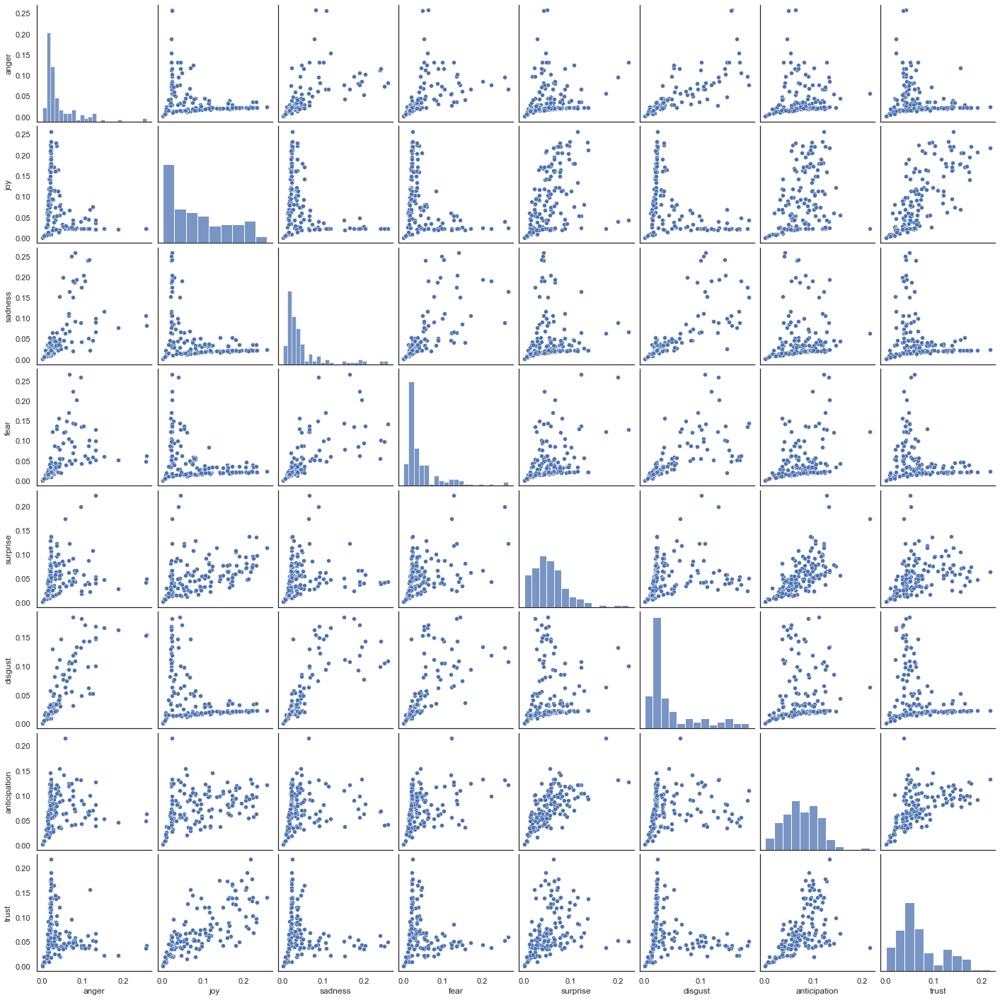

In [715]:
#Create plot to look at distribution of target variables as done previously- some are very skewed
#Same transformation happened in each subset- check one and it will the the same elsewhere
sns.pairplot(df_basiccomp[basic_emotions])

In [13]:
#Check which method to migitate skew works best for each basic emotion
#Goal is to find values as close to zero as possible

for emotion in basic_emotions:
    print(emotion.capitalize())
    print('Skew before transformation:', (df_basiccomp[emotion]).skew())
    print('Log transformation:', (np.log(df_basiccomp[emotion]).skew()))
    print('Square root transformation:', (np.sqrt(df_basiccomp[emotion]).skew()))
    print('Cube root transformation:', (np.cbrt(df_basiccomp[emotion]).skew()))
    print('Reciprocals transformation:', (np.reciprocal(df_basiccomp[emotion]).skew()))

Anger
Skew before transformation: 2.48800571752766
Log transformation: 0.6337013838763087
Square root transformation: 1.4252094877455859
Cube root transformation: 1.13571273345994
Reciprocals transformation: 0.4270201445908283
Joy
Skew before transformation: 0.5245132243273135
Log transformation: -0.7787352926443436
Square root transformation: -0.24814473113522573
Cube root transformation: -0.443923100362734
Reciprocals transformation: 1.5443774127068652
Sadness
Skew before transformation: 2.299284773142778
Log transformation: 0.4670551946287912
Square root transformation: 1.249016802876764
Cube root transformation: 0.962253838113544
Reciprocals transformation: 0.5759909637923849
Fear
Skew before transformation: 2.5933994571511194
Log transformation: 0.40757759385610237
Square root transformation: 1.2914784559886305
Cube root transformation: 0.958678615487883
Reciprocals transformation: 0.7168414066464287
Surprise
Skew before transformation: 2.9386391299012353
Log transformation: 0.153

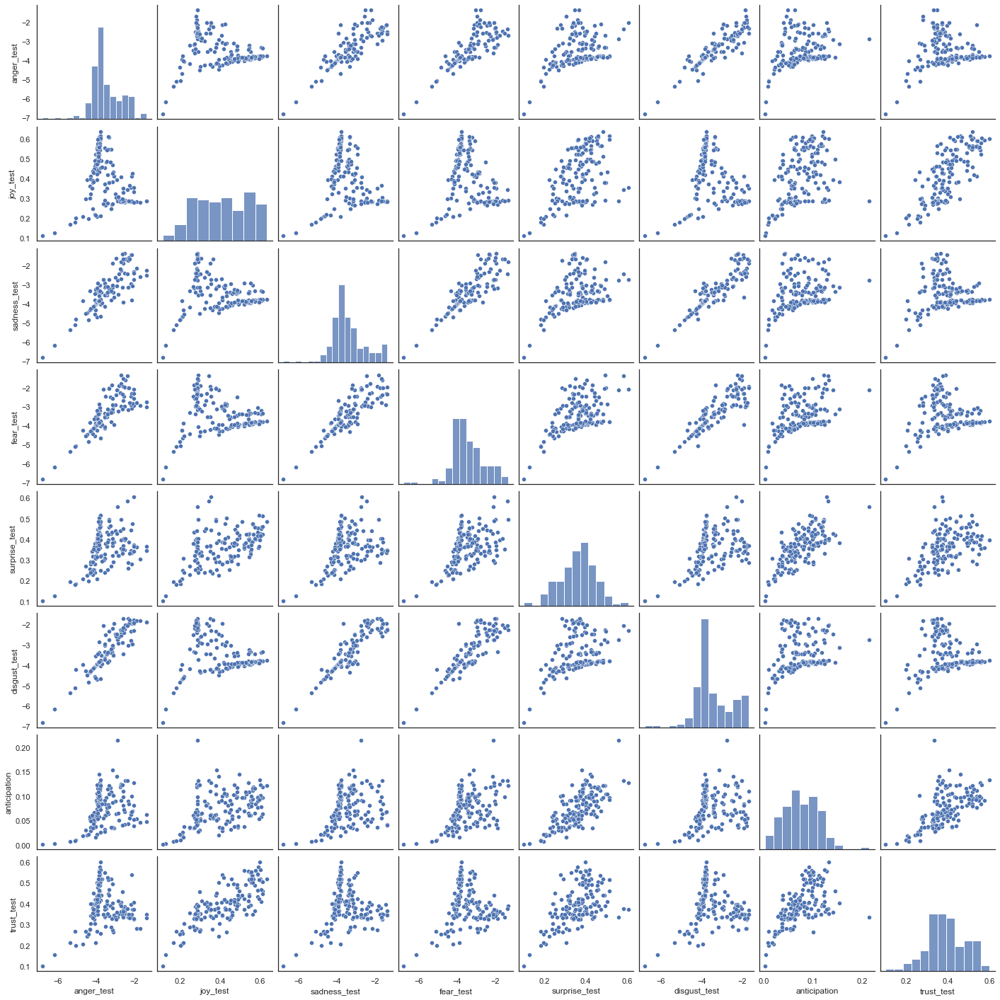

In [719]:
#Make the optimal transformation for each emotion and replot pairplot to see distribution

df_basiccomp['anger_test'] = np.log(df_basiccomp['anger'])
df_basiccomp['joy_test'] = np.cbrt(df_basiccomp['joy'])
df_basiccomp['sadness_test'] = np.log(df_basiccomp['sadness'])
df_basiccomp['fear_test'] = np.log(df_basiccomp['fear'])
df_basiccomp['surprise_test'] = np.cbrt(df_basiccomp['surprise'])
df_basiccomp['disgust_test'] = np.log(df_basiccomp['disgust'])
# Anticipation is best without a transformation
df_basiccomp['trust_test'] = np.cbrt(df_basiccomp['trust'])
                               
#Make a list to create pairplot
skew_pp = ['anger_test', 'joy_test', 'sadness_test', 'fear_test', 'surprise_test', 'disgust_test', 'anticipation',
           'trust_test']
                               
#Create plot
sns.pairplot(df_basiccomp[skew_pp])

In [720]:
#Repeat for other two datasets- transformation will have the same results 

#For df_binarycomp
df_binarycomp['anger_test'] = np.log(df_binarycomp['anger'])
df_binarycomp['joy_test'] = np.cbrt(df_binarycomp['joy'])
df_binarycomp['sadness_test'] = np.log(df_binarycomp['sadness'])
df_binarycomp['fear_test'] = np.log(df_binarycomp['fear'])
df_binarycomp['surprise_test'] = np.cbrt(df_binarycomp['surprise'])
df_binarycomp['disgust_test'] = np.log(df_binarycomp['disgust'])
# Anticipation is best without a transformation
df_binarycomp['trust_test'] = np.cbrt(df_binarycomp['trust'])

#For df_intcomp
df_intcomp['anger_test'] = np.log(df_intcomp['anger'])
df_intcomp['joy_test'] = np.cbrt(df_intcomp['joy'])
df_intcomp['sadness_test'] = np.log(df_intcomp['sadness'])
df_intcomp['fear_test'] = np.log(df_intcomp['fear'])
df_intcomp['surprise_test'] = np.cbrt(df_intcomp['surprise'])
df_intcomp['disgust_test'] = np.log(df_intcomp['disgust'])
# Anticipation is best without a transformation
df_intcomp['trust_test'] = np.cbrt(df_intcomp['trust'])

In [723]:
df_basiccomp.columns

Index(['unicode', 'emoji', 'anger', 'anticipation', 'disgust', 'fear', 'joy',
       'sadness', 'surprise', 'trust', 'Position', 'Unicode block', 'le_+',
       'le_-', 'le_0', 'sent_score', 'sent_score_class', 'upper_error_class',
       'lower_error_class', 'sent_polar', 'primary_basic_emot', 'total',
       'co_sim_anger', 'co_sim_joy', 'co_sim_sadness', 'co_sim_fear',
       'co_sim_surprise', 'co_sim_disgust', 'co_sim_anticipation',
       'co_sim_trust', 'total_cosin_sim', 'dt_total', 'anger_test', 'joy_test',
       'sadness_test', 'fear_test', 'surprise_test', 'disgust_test',
       'trust_test'],
      dtype='object')

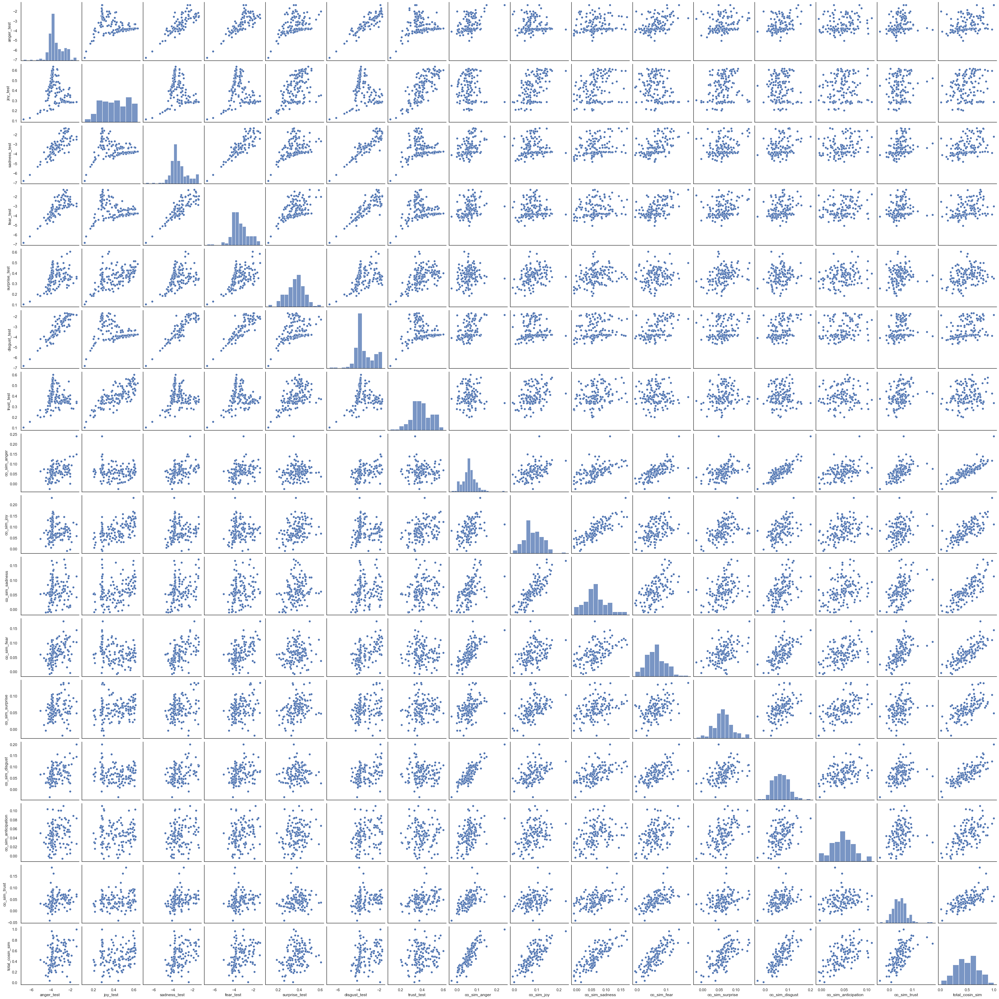

In [725]:
#Make another pairplot to look for correlation between parameters

#Define cols to include
pairplot_cols = ['anger_test', 'joy_test', 'sadness_test', 'fear_test', 'surprise_test', 'disgust_test', 
                 'trust_test', 'co_sim_anger', 'co_sim_joy', 'co_sim_sadness', 'co_sim_fear', 'co_sim_surprise',
                 'co_sim_disgust', 'co_sim_anticipation', 'co_sim_trust', 'total_cosin_sim']

#Create plot
sns.pairplot(df_basiccomp[pairplot_cols])

The work carried out so far indicated that a multivariate regression would be the best option to predict emoji affinity to basic emotions with optimal results. While pearsons correlation plots did show that options explored do have correlation to their target values, there is also a relationship between the basic emotions themselves evident from the above pairplots. This is logical when context of the data is considered. For example- anger and disgust are more likely to be experienced together than disgust and joy. Multivariate regression will also consider their relationships to each other which is likely to improve outcomes and generate a more robust model.

Different feature extraction methods generated the most optimal outcome for each emotion, with the Pearsons Correlation values averaging to be very similar for all of the options which appeared at least once as the most highly correlated. Parameters generated in the df_intcomp df will be omitted from future work as they show no evidence of correlation to the target variables.

In [729]:
#Combine the datasets
df = pd.concat([df_binarycomp, df_basiccomp[['co_sim_anger', 'co_sim_joy', 'co_sim_sadness', 'co_sim_fear', 'co_sim_surprise',
                                            'co_sim_disgust', 'co_sim_anticipation', 'co_sim_trust', 'total_cosin_sim']]], 
               axis=1)

#Check the transformation
df.columns

Index(['unicode', 'emoji', 'anger', 'anticipation', 'disgust', 'fear', 'joy',
       'sadness', 'surprise', 'trust', 'Position', 'Unicode block', 'le_+',
       'le_-', 'le_0', 'sent_score', 'sent_score_class', 'upper_error_class',
       'lower_error_class', 'sent_polar', 'primary_basic_emot',
       'top5_cosim_anger', 'top5_cosim_anticipation', 'top5_cosim_disgust',
       'top5_cosim_fear', 'top5_cosim_joy', 'top5_cosim_sadness',
       'top5_cosim_surprise', 'top5_cosim_trust', 'top10_cosim_anger',
       'top50_cosim_anger', 'top100_cosim_anger', 'top10_cosim_joy',
       'top50_cosim_joy', 'top100_cosim_joy', 'top10_cosim_sadness',
       'top50_cosim_sadness', 'top100_cosim_sadness', 'top10_cosim_fear',
       'top50_cosim_fear', 'top100_cosim_fear', 'top10_cosim_surprise',
       'top50_cosim_surprise', 'top100_cosim_surprise', 'top10_cosim_disgust',
       'top50_cosim_disgust', 'top100_cosim_disgust',
       'top10_cosim_anticipation', 'top50_cosim_anticipation',
       'top

In [732]:
#Define the columns to keep in the df
df = df[['unicode', 'emoji', 'anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust', 
                 'Unicode block', 'top5_cosim_anger', 'top5_cosim_anticipation', 'top5_cosim_disgust', 'top5_cosim_fear', 
                 'top5_cosim_joy', 'top5_cosim_sadness', 'top5_cosim_surprise', 'top5_cosim_trust', 'top10_cosim_anger',         
                 'top50_cosim_anger', 'top100_cosim_anger', 'top10_cosim_joy','top50_cosim_joy', 'top100_cosim_joy',         
                 'top10_cosim_sadness', 'top50_cosim_sadness', 'top100_cosim_sadness', 'top10_cosim_fear',    
                 'top50_cosim_fear', 'top100_cosim_fear', 'top10_cosim_surprise','top50_cosim_surprise', 
                 'top100_cosim_surprise', 'top10_cosim_disgust','top50_cosim_disgust', 'top100_cosim_disgust',
                 'top10_cosim_anticipation', 'top50_cosim_anticipation','top100_cosim_anticipation', 'top10_cosim_trust', 
                 'top50_cosim_trust','top100_cosim_trust', 'anger_test', 'joy_test', 'sadness_test', 'fear_test',
                 'surprise_test', 'disgust_test', 'trust_test', 'co_sim_anger','co_sim_joy', 'co_sim_sadness', 'co_sim_fear', 
                 'co_sim_surprise','co_sim_disgust', 'co_sim_anticipation', 'co_sim_trust']]

df.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,...,disgust_test,trust_test,co_sim_anger,co_sim_joy,co_sim_sadness,co_sim_fear,co_sim_surprise,co_sim_disgust,co_sim_anticipation,co_sim_trust
0,1F308,🌈,0.020534,0.078030,0.020534,0.020534,0.162221,0.032855,0.065710,0.088298,...,-3.885657,0.445297,0.075534,0.141277,0.109274,0.060353,0.059904,0.098202,0.050392,0.036765
1,1F319,🌙,0.015419,0.063219,0.015419,0.015419,0.053967,0.015419,0.024671,0.053967,...,-4.172144,0.377899,0.011848,0.036187,0.051297,0.038135,0.021066,0.026564,0.065645,0.014955
2,1F31A,🌚,0.028610,0.032186,0.048279,0.028610,0.092982,0.051856,0.028610,0.037551,...,-3.030751,0.334867,0.040312,0.059421,0.060485,0.066988,0.062383,0.045676,0.078947,0.036466
3,1F31E,🌞,0.019122,0.061191,0.019122,0.019122,0.168275,0.019122,0.040157,0.061191,...,-3.956906,0.394060,0.041994,0.066952,0.045582,0.058051,0.028176,0.059400,0.032806,0.013764
4,1F31F,🌟,0.019370,0.073606,0.019370,0.019370,0.122031,0.019370,0.067795,0.079417,...,-3.944030,0.429838,0.036120,0.096829,0.063161,0.044155,0.080476,0.046690,0.051480,0.029334


# Encoding unicode block

EDA has highlighted that within certain unicode blocks, specific characterisics are more or less common, therefore this infomation may aid in predictive models and thus this information must be encoded so it can be considered during machine learning. The nature of unicode block categories is that they have no inherent order (it is a nominal variable) therefore this must be reflected in the encoding method selected. One-Hot encoding is therefore an appropriate method to achieve this.

However this may not necessarily be an ideal method for such work as this significantly increases the dimensionality of the data and thus the use of this data may be revised depending on the relative effects of increased dimensionality compared to the information contained in the original column. This step is being performed so that as many options as possible are available during the model creation process, however it is likely that there will be significant dimensionality reduction. 

In [733]:
# Perform one-hot encoding on nominal variables
df = pd.get_dummies(df, columns=['Unicode block'])

#Verify transformation worked
df.columns.values.tolist()

['unicode',
 'emoji',
 'anger',
 'anticipation',
 'disgust',
 'fear',
 'joy',
 'sadness',
 'surprise',
 'trust',
 'top5_cosim_anger',
 'top5_cosim_anticipation',
 'top5_cosim_disgust',
 'top5_cosim_fear',
 'top5_cosim_joy',
 'top5_cosim_sadness',
 'top5_cosim_surprise',
 'top5_cosim_trust',
 'top10_cosim_anger',
 'top50_cosim_anger',
 'top100_cosim_anger',
 'top10_cosim_joy',
 'top50_cosim_joy',
 'top100_cosim_joy',
 'top10_cosim_sadness',
 'top50_cosim_sadness',
 'top100_cosim_sadness',
 'top10_cosim_fear',
 'top50_cosim_fear',
 'top100_cosim_fear',
 'top10_cosim_surprise',
 'top50_cosim_surprise',
 'top100_cosim_surprise',
 'top10_cosim_disgust',
 'top50_cosim_disgust',
 'top100_cosim_disgust',
 'top10_cosim_anticipation',
 'top50_cosim_anticipation',
 'top100_cosim_anticipation',
 'top10_cosim_trust',
 'top50_cosim_trust',
 'top100_cosim_trust',
 'anger_test',
 'joy_test',
 'sadness_test',
 'fear_test',
 'surprise_test',
 'disgust_test',
 'trust_test',
 'co_sim_anger',
 'co_sim_joy'

# Preparation for machine learning- Null values

In [739]:
# Display all columns and their null value count
pd.set_option('display.max_rows', None)
null_value_counts = df.isnull().sum()
print(null_value_counts)

unicode                                                 0
emoji                                                   0
anger                                                   0
anticipation                                            0
disgust                                                 0
fear                                                    0
joy                                                     0
sadness                                                 0
surprise                                                0
trust                                                   0
top5_cosim_anger                                       17
top5_cosim_anticipation                                17
top5_cosim_disgust                                     17
top5_cosim_fear                                        17
top5_cosim_joy                                         17
top5_cosim_sadness                                     17
top5_cosim_surprise                                    17
top5_cosim_tru

In [741]:
#Drop columns with null values
df.dropna(inplace=True)
pd.set_option('display.max_rows', None)
null_value_counts = df.isnull().sum()
print(null_value_counts)

unicode                                                0
emoji                                                  0
anger                                                  0
anticipation                                           0
disgust                                                0
fear                                                   0
joy                                                    0
sadness                                                0
surprise                                               0
trust                                                  0
top5_cosim_anger                                       0
top5_cosim_anticipation                                0
top5_cosim_disgust                                     0
top5_cosim_fear                                        0
top5_cosim_joy                                         0
top5_cosim_sadness                                     0
top5_cosim_surprise                                    0
top5_cosim_trust               

# Initial Evaluation of Multivariate Regression Options

In [746]:
#Generate several iterations of input parameters to try

#Everything except target variables
X1 = df.drop(columns=['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust', 'unicode', 'emoji',
                      'anger_test', 'joy_test', 'sadness_test', 'fear_test', 'surprise_test', 'disgust_test', 'trust_test'])

#Excluding unicode block also
X2 = df.drop(columns=['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust', 'unicode', 'emoji',
                      'anger_test', 'joy_test', 'sadness_test', 'fear_test', 'surprise_test', 'disgust_test', 'trust_test',
                      'Unicode block_Arrows', 'Unicode block_Dingbats', 'Unicode block_Emoticons',
                      'Unicode block_Geometric Shapes', 'Unicode block_Miscellaneous Symbols',
                      'Unicode block_Miscellaneous Symbols and Arrows', 'Unicode block_Miscellaneous Symbols and Pictographs'])

#Using only the basiccomp data
X3 = df[['co_sim_anger', 'co_sim_joy', 'co_sim_sadness', 'co_sim_fear', 'co_sim_surprise', 'co_sim_disgust', 
        'co_sim_anticipation', 'co_sim_trust']]

#Using all binarycomp data
X4 = df[['top5_cosim_anger', 'top5_cosim_anticipation', 'top5_cosim_disgust', 'top5_cosim_fear', 'top5_cosim_joy', 
        'top5_cosim_sadness', 'top5_cosim_surprise','top5_cosim_trust', 'top10_cosim_anger', 'top50_cosim_anger',
        'top100_cosim_anger', 'top10_cosim_joy', 'top50_cosim_joy','top100_cosim_joy', 'top10_cosim_sadness', 
        'top50_cosim_sadness','top100_cosim_sadness', 'top10_cosim_fear', 'top50_cosim_fear','top100_cosim_fear', 
        'top10_cosim_surprise', 'top50_cosim_surprise','top100_cosim_surprise', 'top10_cosim_disgust', 'top50_cosim_disgust',
        'top100_cosim_disgust', 'top10_cosim_anticipation','top50_cosim_anticipation', 'top100_cosim_anticipation',
        'top10_cosim_trust', 'top50_cosim_trust', 'top100_cosim_trust']]

#Using k=5 binarycomp data
X5 = df[['top5_cosim_anger', 'top5_cosim_anticipation', 'top5_cosim_disgust', 'top5_cosim_fear', 'top5_cosim_joy', 
        'top5_cosim_sadness', 'top5_cosim_surprise','top5_cosim_trust']]

#Using k=10 binarycomp data
X6 = df[['top10_cosim_anger', 'top10_cosim_anticipation', 'top10_cosim_disgust', 'top10_cosim_fear', 'top10_cosim_joy', 
        'top10_cosim_sadness', 'top10_cosim_surprise','top10_cosim_trust']]

#Using k=50 binarycomp data
X5 = df[['top50_cosim_anger', 'top50_cosim_anticipation', 'top50_cosim_disgust', 'top50_cosim_fear', 'top50_cosim_joy', 
        'top50_cosim_sadness', 'top50_cosim_surprise','top50_cosim_trust']]

#Using k=100 binarycomp data
X6 = df[['top100_cosim_anger', 'top100_cosim_anticipation', 'top100_cosim_disgust', 'top100_cosim_fear', 'top100_cosim_joy', 
        'top100_cosim_sadness', 'top100_cosim_surprise','top100_cosim_trust']]

In [832]:
#Generate several iterations of target varibales to try

#Using the values where skew was mitigated
Y1 = df[['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust']]

#Using values where skew was not mitigated
Y2 = df[['anger_test', 'joy_test', 'sadness_test', 'fear_test', 'surprise_test', 'disgust_test', 'trust_test']]

#Y1 but with binning of values steps of 0.05
emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust']
bins = [x / 100 for x in range(0, 101, 5)]
def bin_emotions(emotion_values):
    return pd.cut(emotion_values, bins=bins, labels=bins[:-1]).astype(float)
Y3 = df[emotions].apply(bin_emotions)

In [777]:
#Splitting data into train and test
X_train, X_test, Y_train, Y_test = train_test_split(X1, Y1, test_size=0.2)

In [851]:
#Importing libraries
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
from sklearn.multioutput import MultiOutputRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.model_selection import cross_val_predict

In [779]:
#Create a function to evaluate the regressor and its parameters
def evaluate(reg_cls, params=None):
    reg=reg_cls()
    if params:
        reg=GridSearchCV(reg, param_grid=params, refit=True)
    reg.fit(X_train, Y_train)
    pred=reg.predict(X_test)

    if params:
        print(reg.best_params_)
        reg=reg.best_estimator_
    print('Mean Absolute Error:', mae(Y_test, pred), 'Mean Squared Error:', mean_squared_error(Y_test, pred),
          'R-squared score:', r2_score(Y_test, pred))

    return reg, pred

In [780]:
#Print header for results
print('Results for initial test:')

#Apply the function to the models
lr_reg,pred_lr = evaluate(LinearRegression)
rg_reg,pred_rg = evaluate(Ridge)
ls_reg,pred_ls = evaluate(Lasso)
rf_reg,pred_rf = evaluate(RandomForestRegressor)
xg_reg,pred_xg = evaluate(XGBRegressor)

#Define parameters
params={"n_estimators":[100*i for i in range(1, 6)]}

Results for initial test:
Mean Absolute Error: 0.03755424236842539 Mean Squared Error: 0.002395977831308747 R-squared score: -0.172109981013071
Mean Absolute Error: 0.034518444490267045 Mean Squared Error: 0.0021034157351678714 R-squared score: -0.005147711020094439
Mean Absolute Error: 0.03720182843838443 Mean Squared Error: 0.0022916252596569655 R-squared score: -0.07156567912578307
Mean Absolute Error: 0.029561725720275378 Mean Squared Error: 0.001767384285501604 R-squared score: 0.1185142991201433
Mean Absolute Error: 0.030589788063011426 Mean Squared Error: 0.0019607786737193935 R-squared score: 0.02523825671280598


In [795]:
#Redefine the input/target variables to find best results 

#Split data into test and train
X_train, X_test, Y_train, Y_test = train_test_split(X3, Y1, test_size=0.2)

#Print header for results
print('Best Initial Results:')

#Apply the function to the models
lr_reg,pred_lr = evaluate(LinearRegression)
rg_reg,pred_rg = evaluate(Ridge)
ls_reg,pred_ls = evaluate(Lasso)
rf_reg,pred_rf = evaluate(RandomForestRegressor)
xg_reg,pred_xg = evaluate(XGBRegressor)

#Define parameters
params={"n_estimators":[100*i for i in range(1, 6)]}

Best Initial Results:
Mean Absolute Error: 0.02528407890741122 Mean Squared Error: 0.0011480533913995235 R-squared score: 0.24120034470282664
Mean Absolute Error: 0.03294260874120625 Mean Squared Error: 0.0017808336862231383 R-squared score: 0.022973522373895466
Mean Absolute Error: 0.03439736243436333 Mean Squared Error: 0.0019220218775231953 R-squared score: -0.03451108178873272
Mean Absolute Error: 0.025064961542615734 Mean Squared Error: 0.0013527182408367045 R-squared score: 0.16318570992939618
Mean Absolute Error: 0.026249193120452614 Mean Squared Error: 0.0014104145363764064 R-squared score: 0.07536106731479154


In [813]:
#Play with hyperparam tuning in models where an ok r2 value was obtained above- all need significant improvement though
#Keep some of the better options

#Define the hyperparameter grid for Linear Regression
param_grid = {
    'fit_intercept': [True, False],
    'normalize': [True, False],
    'copy_X': [True, False]}

#Create the Linear Regression model
model = LinearRegression()

#Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=1)
grid_search.fit(X_train, Y_train)

#Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

#Evaluate the model on the test set using the best hyperparameters
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

#Calculate and print the MAE, MSE, and R-squared
mae_score = mae(Y_test, y_pred)
mse_score = mse(Y_test, y_pred)
r2 = r2_score(Y_test, y_pred)

# Print metrics for the best model
print("Mean Absolute Error (MAE):", mae_score)
print("Mean Squared Error (MSE):", mse_score)
print("R-squared (R2) score:", r2)

Best Hyperparameters: {'copy_X': True, 'fit_intercept': True, 'normalize': True}
Mean Absolute Error (MAE): 0.025284078907411217
Mean Squared Error (MSE): 0.001148053391399523
R-squared (R2) score: 0.24120034470282692


In [809]:
#Play with hyperparam tuning in models where an ok r2 value was obtained above- all need significant improvement though
#Keep some of the better options

#Define the hyperparameter grid
param_grid = {
    'n_estimators': [10, 25, 50, 100, 150],
    'max_depth': [None, 5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4, 6, 8]}

#Create the model
model = RandomForestRegressor()

#Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=1)
grid_search.fit(X_train, Y_train)

#Print the best hyperparameters and the corresponding performance
print("Best Hyperparameters:", grid_search.best_params_)

#Evaluate the model on the test set using the best hyperparameters
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

#Calculate and print the MAE, MSE, and R-squared
mae_score = mae(Y_test, y_pred)
mse_score = mse(Y_test, y_pred)
r2 = r2_score(Y_test, y_pred)

#Print metrics for best model
print("Mean Absolute Error (MAE):", mae_score)
print("Mean Squared Error (MSE):", mse_score)
print("R-squared (R2) score:", r2)

Best Hyperparameters: {'max_depth': 20, 'min_samples_leaf': 8, 'min_samples_split': 10, 'n_estimators': 10}
Mean Absolute Error (MAE): 0.027388665397703973
Mean Squared Error (MSE): 0.0014141396896736262
R-squared (R2) score: 0.1101656812019317


In [812]:
#Play with hyperparam tuning in models where an ok r2 value was obtained above- all need significant improvement though
#Keep some of the better options

#Define the hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]}

#Create the model
model = XGBRegressor()

#Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=1)
grid_search.fit(X_train, Y_train)

print("Best Hyperparameters:", grid_search.best_params_)

#Evaluate the model on the test set using the best hyperparameters
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Calculate and print the MAE, MSE, and R-squared
mae_score = mae(Y_test, y_pred)
mse_score = mse(Y_test, y_pred)
r2 = r2_score(Y_test, y_pred)

#Print metrics for best model
print("Mean Absolute Error (MAE):", mae_score)
print("Mean Squared Error (MSE):", mse_score)
print("R-squared (R2) score:", r2)

Best Hyperparameters: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}
Mean Absolute Error (MAE): 0.024683486320356975
Mean Squared Error (MSE): 0.0011608338964715899
R-squared (R2) score: 0.1973892845409621


In [833]:
#Check if binning improves the outcomes

#Split data into test and train
X_train, X_test, Y_train, Y_test = train_test_split(X3, Y3, test_size=0.2)

#Define the hyperparameter grid for Linear Regression
param_grid = {
    'fit_intercept': [True, False],
    'normalize': [True, False],
    'copy_X': [True, False]}

#Create the Linear Regression model
model = LinearRegression()

#Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=1)
grid_search.fit(X_train, Y_train)

#Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

#Evaluate the model on the test set using the best hyperparameters
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

#Calculate and print the MAE, MSE, and R-squared
mae_score = mae(Y_test, y_pred)
mse_score = mse(Y_test, y_pred)
r2 = r2_score(Y_test, y_pred)

# Print metrics for the best model
print("Mean Absolute Error (MAE):", mae_score)
print("Mean Squared Error (MSE):", mse_score)
print("R-squared (R2) score:", r2)

Best Hyperparameters: {'copy_X': True, 'fit_intercept': True, 'normalize': False}
Mean Absolute Error (MAE): 0.030635061664016083
Mean Squared Error (MSE): 0.0017555447208878526
R-squared (R2) score: 0.18838770447346728


In [834]:
#Check if binning improves the outcomes

#Define the hyperparameter grid
param_grid = {
    'n_estimators': [10, 25, 50, 100, 150],
    'max_depth': [None, 5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4, 6, 8]}

#Create the model
model = RandomForestRegressor()

#Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=1)
grid_search.fit(X_train, Y_train)

#Print the best hyperparameters and the corresponding performance
print("Best Hyperparameters:", grid_search.best_params_)

#Evaluate the model on the test set using the best hyperparameters
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

#Calculate and print the MAE, MSE, and R-squared
mae_score = mae(Y_test, y_pred)
mse_score = mse(Y_test, y_pred)
r2 = r2_score(Y_test, y_pred)

#Print metrics for best model
print("Mean Absolute Error (MAE):", mae_score)
print("Mean Squared Error (MSE):", mse_score)
print("R-squared (R2) score:", r2)

Best Hyperparameters: {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 150}
Mean Absolute Error (MAE): 0.032999783871703645
Mean Squared Error (MSE): 0.0021138700662544307
R-squared (R2) score: 0.1053318082244842


In [835]:
#Check if binning improves the outcomes

#Define the hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]}

# Create the model
model = XGBRegressor()

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=1)
grid_search.fit(X_train, Y_train)

# Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

# Evaluate the model using the best hyperparameters
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

#Calculate and print the MAE, MSE, and R-squared
mae_score = mae(Y_test, y_pred)
mse_score = mse(Y_test, y_pred)
r2 = r2_score(Y_test, y_pred)


# Print metrics for the best model
print("Mean Absolute Error (MAE):", mae_score)
print("Mean Squared Error (MSE):", mse_score)
print("R-squared (R2) score:", r2)

Best Hyperparameters: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}
Mean Absolute Error (MAE): 0.033497124740474477
Mean Squared Error (MSE): 0.0020862541989210724
R-squared (R2) score: 0.04388998501852988


In [842]:
#Try support vector regression- does not consider every emotion in the context of each other (maybe this is something to look into)
#SVR does not handle multivariate regression

#Split data into test and train
X_train, X_test, Y_train, Y_test = train_test_split(X3, Y1, test_size=0.2)

# Define the hyperparameter grid
param_grid = {
    'estimator__C': [0.1, 1.0, 10.0],
    'estimator__kernel': ['linear', 'rbf', 'poly'],
    'estimator__gamma': ['scale', 'auto', 0.1, 0.01],
    'estimator__epsilon': [0.1, 0.2, 0.3]}

#Create the model
base_model = SVR()

#Create the multi-output SVR model
model = MultiOutputRegressor(base_model)

#Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=1)
grid_search.fit(X_train, Y_train)

#Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

#Evaluate the model using the best hyperparameters
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Calculate and print the MAE, MSE, and R-squared for each target variable
mae_scores = mae(Y_test, y_pred, multioutput='raw_values')
mse_scores = mse(Y_test, y_pred, multioutput='raw_values')
r2_scores = r2_score(Y_test, y_pred, multioutput='raw_values')

# Print metrics for each target variable
for i, emotion in enumerate(emotions):
    print("Emotion:", emotion)
    print("Mean Absolute Error (MAE):", mae_scores[i])
    print("Mean Squared Error (MSE):", mse_scores[i])
    print("R-squared (R2) score:", r2_scores[i])
    print()

Best Hyperparameters: {'estimator__C': 10.0, 'estimator__epsilon': 0.1, 'estimator__gamma': 'scale', 'estimator__kernel': 'linear'}
Emotion: anger
Mean Absolute Error (MAE): 0.059786708312945996
Mean Squared Error (MSE): 0.004374699549828521
R-squared (R2) score: -2.004062444715392

Emotion: anticipation
Mean Absolute Error (MAE): 0.04028758489141011
Mean Squared Error (MSE): 0.0024904793886644325
R-squared (R2) score: -1.2948919645740462

Emotion: disgust
Mean Absolute Error (MAE): 0.05901922833334988
Mean Squared Error (MSE): 0.00418330662957147
R-squared (R2) score: -0.5974607200278266

Emotion: fear
Mean Absolute Error (MAE): 0.06605424042657398
Mean Squared Error (MSE): 0.005102505190205566
R-squared (R2) score: -0.23005025312897298

Emotion: joy
Mean Absolute Error (MAE): 0.06242318087872966
Mean Squared Error (MSE): 0.004784787785585735
R-squared (R2) score: -0.054730754102892076

Emotion: sadness
Mean Absolute Error (MAE): 0.06896834595562568
Mean Squared Error (MSE): 0.0054454

In [846]:
#Try a Gaussian Process Regression model

#Define the hyperparameter grid for the kernel
param_grid = {
    'kernel': [1.0 * RBF(length_scale=1.0), 1.0 * RBF(length_scale=0.1)],
    'alpha': [1e-10, 1e-8, 1e-6, 1e-4, 1e-3, 1e-2],
    'n_restarts_optimizer': [0, 1, 5, 10]}
    
#Create the Gaussian Process Regressor
model = GaussianProcessRegressor()

#Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=1)
grid_search.fit(X_train, Y_train)

#Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

#Evaluate the model using the best hyperparameters
best_model = grid_search.best_estimator_
y_pred, y_std = best_model.predict(X_test, return_std=True)

#Calculate and print the MAE, MSE, and R-squared
mae_score = mae(Y_test, y_pred)
mse_score = mse(Y_test, y_pred)
r2 = r2_score(Y_test, y_pred)

#Print metrics for the best model
print("Mean Absolute Error (MAE):", mae_score)
print("Mean Squared Error (MSE):", mse_score)
print("R-squared (R2) score:", r2)

Best Hyperparameters: {'alpha': 0.001, 'kernel': 1**2 * RBF(length_scale=0.1), 'n_restarts_optimizer': 0}
Mean Absolute Error (MAE): 0.029620621173186153
Mean Squared Error (MSE): 0.0016444673318980383
R-squared (R2) score: 0.312151587315505


In [850]:
#Try a KNN model

#Define the hyperparameter grid
param_grid = {
    'n_neighbors': [3, 5, 7, 9],       
    'weights': ['uniform', 'distance'],
    'p': [1, 2],                   
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'], 
    'leaf_size': [10, 20, 30, 40],   
    'metric': ['euclidean', 'manhattan', 'minkowski']}

#Create the KNN Regressor
model = KNeighborsRegressor()

#Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=1)
grid_search.fit(X_train, Y_train)

#Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

#Evaluate the model using the best hyperparameters
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

#Calculate and print the MAE, MSE, and R-squared
mae_score = mae(Y_test, y_pred)
mse_score = mse(Y_test, y_pred)
r2 = r2_score(Y_test, y_pred)

#Print metrics for the best model
print("Mean Absolute Error (MAE):", mae_score)
print("Mean Squared Error (MSE):", mse_score)
print("R-squared (R2) score:", r2)

Best Hyperparameters: {'algorithm': 'auto', 'leaf_size': 10, 'metric': 'manhattan', 'n_neighbors': 9, 'p': 1, 'weights': 'distance'}
Mean Absolute Error (MAE): 0.03187610023808515
Mean Squared Error (MSE): 0.0020574546009304523
R-squared (R2) score: 0.17527339282221643


In [861]:
#Try univariate regression using the Gaussian Process regression model- and more detail on performance

#Define the hyperparameter grid
param_grid = {
    'kernel': [1**2 * RBF(length_scale=0.1), 1**2 * RBF(length_scale=1.0)],
    'alpha': [0.0001, 0.001, 0.01, 0.1],
    'n_restarts_optimizer': [0, 1, 2]
}

#Create the Gaussian Process Regression model
gpr_model = GaussianProcessRegressor()

#Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=gpr_model, param_grid=param_grid, cv=5, n_jobs=1)
grid_search.fit(X_train, Y_train)

#Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)
print()

#Evaluate the model using the best hyperparameters
best_gpr_model = grid_search.best_estimator_
y_pred = best_gpr_model.predict(X_test)

#Calculate and print the MAE, MSE, and R-squared for each target variable
mae_scores = mae(Y_test, y_pred, multioutput='raw_values')
mse_scores = mse(Y_test, y_pred, multioutput='raw_values')
r2_scores = r2_score(Y_test, y_pred, multioutput='raw_values')
#Make parameters to check how far off values are in each case
percentage_error = abs(y_pred - Y_test) / Y_test
percentage_correct_2 = (percentage_error <= 0.02).mean(axis=0) * 100
percentage_correct_5 = (percentage_error <= 0.05).mean(axis=0) * 100
percentage_correct_10 = (percentage_error <= 0.1).mean(axis=0) * 100
percentage_correct_20 = (percentage_error <= 0.2).mean(axis=0) * 100

#Print metrics for each target variable
for i, emotion in enumerate(emotions):
    print("Emotion:", emotion)
    print("Mean Absolute Error (MAE):", mae_scores[i])
    print("Mean Squared Error (MSE):", mse_scores[i])
    print("R-squared (R2) score:", r2_scores[i])
    print('Percentage of Correct Predictions (within 2%): {:.2f}%'.format(percentage_correct_2[i]))
    print('Percentage of Correct Predictions (within 5%): {:.2f}%'.format(percentage_correct_5[i]))
    print('Percentage of Correct Predictions (within 10%): {:.2f}%'.format(percentage_correct_10[i]))
    print('Percentage of Correct Predictions (within 20%): {:.2f}%'.format(percentage_correct_20[i]))
    print()

Best Hyperparameters: {'alpha': 0.001, 'kernel': 1**2 * RBF(length_scale=0.1), 'n_restarts_optimizer': 1}

Emotion: anger
Mean Absolute Error (MAE): 0.02457083919635507
Mean Squared Error (MSE): 0.0010366562293436055
R-squared (R2) score: 0.2881385313024615
Percentage of Correct Predictions (within 2%): 3.70%
Percentage of Correct Predictions (within 5%): 7.41%
Percentage of Correct Predictions (within 10%): 18.52%
Percentage of Correct Predictions (within 20%): 18.52%

Emotion: anticipation
Mean Absolute Error (MAE): 0.02583514753510338
Mean Squared Error (MSE): 0.0009718052962048902
R-squared (R2) score: 0.10451450610595725
Percentage of Correct Predictions (within 2%): 3.70%
Percentage of Correct Predictions (within 5%): 7.41%
Percentage of Correct Predictions (within 10%): 14.81%
Percentage of Correct Predictions (within 20%): 37.04%

Emotion: disgust
Mean Absolute Error (MAE): 0.02987446366307466
Mean Squared Error (MSE): 0.0015046166119804926
R-squared (R2) score: 0.4254387380189

# Preparation to evaluate Neural Networks- Emoji Embeddings Dictionary

The previous models did not provide sufficient results therefore the search for a potential model to use for prediction will expand to consider neural networks. Neural networks are more complex models which can capture more subtle relationships and patterns in the data and therefore may have improved outcomes for this purpose.

In [862]:
#Create an embedding dictionary
embeddings_dictionary = dict()

#Iterate through each row in the dataset
for index, row in df_le01.iterrows():
    emoji = row['emoji']

    #Check if the emoji exists in the KeyedVectors object
    if emoji in emoji2vec.key_to_index:
        vector_dimensions = emoji2vec.get_vector(emoji)
        embeddings_dictionary[emoji] = vector_dimensions

In [864]:
#Determine the number of unique emojis in the dataset at present
vocab_length = len(df['emoji'].unique())
print(vocab_length)

132


In [865]:
#Create the embeddings matrix with all zeros
embedding_matrix = np.zeros((vocab_length, 300))
embedding_matrix.shape

(132, 300)

In [866]:
#Reset the DataFrame index
df.reset_index(drop=True, inplace=True)

In [867]:
#Loop through each row to populate data for each unique emoji into the embedding
for i, row in df.iterrows():
    emoji = row['emoji']
    if emoji in embeddings_dictionary:
        vector_dimensions = np.asarray(embeddings_dictionary[emoji], dtype="float32")
        embedding_matrix[i] = vector_dimensions

In [869]:
#Define a function to map the embedding from the dictionary onto the emoji, otherwise use an empty vector
def map_emoji_to_embedding(emoji):
    if emoji in embeddings_dictionary:
        return embeddings_dictionary[emoji]
    else:
        return np.zeros(300)

#Apply the function
df['emoji_embedding'] = df['emoji'].apply(map_emoji_to_embedding)
df.head()

,unicode,emoji,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,top5_cosim_anger,top5_cosim_anticipation,top5_cosim_disgust,top5_cosim_fear,top5_cosim_joy,top5_cosim_sadness,top5_cosim_surprise,top5_cosim_trust,top10_cosim_anger,top50_cosim_anger,top100_cosim_anger,top10_cosim_joy,top50_cosim_joy,top100_cosim_joy,top10_cosim_sadness,top50_cosim_sadness,top100_cosim_sadness,top10_cosim_fear,top50_cosim_fear,top100_cosim_fear,top10_cosim_surprise,top50_cosim_surprise,top100_cosim_surprise,top10_cosim_disgust,top50_cosim_disgust,top100_cosim_disgust,top10_cosim_anticipation,top50_cosim_anticipation,top100_cosim_anticipation,top10_cosim_trust,top50_cosim_trust,top100_cosim_trust,anger_test,joy_test,sadness_test,fear_test,surprise_test,disgust_test,trust_test,co_sim_anger,co_sim_joy,co_sim_sadness,co_sim_fear,co_sim_surprise,co_sim_disgust,co_sim_anticipation,co_sim_trust,Unicode block_Arrows,Unicode block_Dingbats,Unicode block_Emoticons,Unicode block_Geometric Shapes,Unicode block_Miscellaneous Symbols,Unicode block_Miscellaneous Symbols and Arrows,Unicode block_Miscellaneous Symbols and Pictographs,emoji_embedding
0,1F308,🌈,0.020534,0.078030,0.020534,0.020534,0.162221,0.032855,0.065710,0.088298,0.078591,0.067994,0.090723,0.062761,0.113989,0.097312,0.063183,0.083803,0.087761,0.090016,0.091942,0.114605,0.121408,0.118693,0.102195,0.097518,0.095379,0.066631,0.074363,0.080717,0.068180,0.075456,0.080078,0.090991,0.094746,0.098128,0.058930,0.064232,0.066227,0.080050,0.076481,0.078572,-3.885657,0.545384,-3.415653,-3.885657,0.403531,-3.885657,0.445297,0.075534,0.141277,0.109274,0.060353,0.059904,0.098202,0.050392,0.036765,0,0,0,0,0,0,1,"[-0.272291, 1.1176019, 1.4234279, 1.7466365, -..."
1,1F319,🌙,0.015419,0.063219,0.015419,0.015419,0.053967,0.015419,0.024671,0.053967,0.007602,0.058970,0.021683,0.051431,0.049666,0.042648,0.041461,0.009179,0.015611,0.018822,0.024266,0.047390,0.050315,0.052579,0.045150,0.046270,0.044239,0.042080,0.037542,0.039196,0.040582,0.043773,0.045318,0.017037,0.027058,0.032872,0.054042,0.049929,0.055202,0.011491,0.025498,0.025073,-4.172144,0.377899,-4.172144,-4.172144,0.291112,-4.172144,0.377899,0.011848,0.036187,0.051297,0.038135,0.021066,0.026564,0.065645,0.014955,0,0,0,0,0,0,1,"[-0.89786303, 1.9509411, -1.3655221, 1.5510684..."
2,1F31A,🌚,0.028610,0.032186,0.048279,0.028610,0.092982,0.051856,0.028610,0.037551,0.029508,0.082183,0.041805,0.071532,0.075325,0.050265,0.068159,0.029534,0.036966,0.041395,0.046255,0.063916,0.067979,0.073675,0.056316,0.057884,0.059940,0.062765,0.061718,0.064314,0.068435,0.072654,0.075788,0.039109,0.051072,0.059822,0.073003,0.073874,0.078545,0.029262,0.037840,0.041041,-3.553999,0.453037,-2.959292,-3.553999,0.305848,-3.030751,0.334867,0.040312,0.059421,0.060485,0.066988,0.062383,0.045676,0.078947,0.036466,0,0,0,0,0,0,1,"[-0.07155819, 2.6526983, 0.9026799, 0.7054407,..."
3,1F31E,🌞,0.019122,0.061191,0.019122,0.019122,0.168275,0.019122,0.040157,0.061191,0.037913,0.062884,0.055835,0.059046,0.071066,0.048342,0.047300,0.012675,0.046687,0.049364,0.051948,0.062000,0.068950,0.074246,0.053239,0.061221,0.063308,0.049923,0.057188,0.061557,0.056505,0.059647,0.060628,0.044184,0.057535,0.064714,0.048923,0.050792,0.052845,0.015299,0.029311,0.032649,-3.956906,0.552086,-3.956906,-3.956906,0.342441,-3.956906,0.394060,0.041994,0.066952,0.045582,0.058051,0.028176,0.059400,0.032806,0.013764,0,0,0,0,0,0,1,"[1.5490977, 1.5981269, 0.27876318, -0.60552436..."
4,1F31F,🌟,0.019370,0.073606,0.019370,0.019370,0.122031,0.019370,0.067795,0.079417,0.042976,0.063950,0.041101,0.054588,0.096690,0.052397,0.069701,0.051169,0.049745,0.052274,0.052777,0.087398,0.091407,0.098538,0.070785,0.066809,0.066267,0.049222,0.055382,0.058148,0.065505,0.081621,0.084418,0.045731,0.056961,0.060180,0.060907,0.063710,0.064993,0.038925,0.041092,0.043984,-3.944030,0.496010,-3.944030,-3.944030,0.407755,-3.944030,0.429838,0.036120,0.096829,0.063161,0.044155,0.080476,0.046690,0.051480,0.029334,0,0,0,0,0,0,1,"[1.6323674, 1.010914, 2.2080367, 0.3

In [870]:
#Convert emoji embeddings to numpy arrays
df['emoji_embedding'] = np.array(df['emoji_embedding'].tolist())

# Initial Evaluation of Neural Networks- Univariate

In [943]:
#Importing libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Sequential
from keras.layers import Dense, Flatten, Embedding, Flatten, Dropout, LSTM, Activation, Conv1D, MaxPooling1D, Conv2D
from keras.layers import MaxPooling2D, Reshape, BatchNormalization, GlobalMaxPooling1D, Attention, Layer
from tensorflow.keras.optimizers import Adam
from keras.regularizers import l1, l2
from keras.callbacks import ModelCheckpoint
from sklearn.model_selection import train_test_split, KFold, ShuffleSplit
from sklearn.metrics import mean_absolute_error
from keras import backend as K
from kerastuner.tuners import RandomSearch
from tensorflow.keras.callbacks import EarlyStopping
import time as time_module
import kerastuner as kt
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore', category=DeprecationWarning)

In [947]:
#Split data into test and train
X_train, X_test, Y_train, Y_test = train_test_split(X3, Y1['anger'], test_size=0.2)

In [952]:
#Define the custom evaluation metrics

#r2 score
def r2_score(y_true, y_pred):
    SS_res =  K.sum(K.square(y_true - y_pred))
    SS_tot = K.sum(K.square(y_true - K.mean(y_true)))
    return 1 - SS_res/(SS_tot + K.epsilon())

# Define Mean Absolute Percentage Error (MAPE) loss function
def mean_absolute_percentage_error(y_true, y_pred):
    return K.mean(K.abs((y_true - y_pred) / K.clip(K.abs(y_true), K.epsilon(), None))) * 100.0

#Within 2%
def accuracy_within_2_percent(y_true, y_pred):
    #Calculate the percentage difference between true and predicted values
    percentage_difference = tf.abs((y_true - y_pred) / y_true) * 100.0

    #Check if the percentage difference is within 5%
    within_2_percent = tf.less_equal(percentage_difference, 2.0)

    #Calculate the mean accuracy within 5%
    mean_accuracy_within_2_percent = tf.reduce_mean(tf.cast(within_2_percent, tf.float32))
    return mean_accuracy_within_2_percent

#Repeat for a % difference within 5%
def accuracy_within_5_percent(y_true, y_pred):
    percentage_difference = tf.abs((y_true - y_pred) / y_true) * 100.0
    within_5_percent = tf.less_equal(percentage_difference, 5.0)
    mean_accuracy_within_5_percent = tf.reduce_mean(tf.cast(within_5_percent, tf.float32))
    return mean_accuracy_within_5_percent

#Repeat for a % difference within 10%
def accuracy_within_10_percent(y_true, y_pred):
    percentage_difference = tf.abs((y_true - y_pred) / y_true) * 100.0
    within_10_percent = tf.less_equal(percentage_difference, 10.0)
    mean_accuracy_within_10_percent = tf.reduce_mean(tf.cast(within_10_percent, tf.float32))
    return mean_accuracy_within_10_percent

In [922]:
#Start with a basic feedforward neural network

#Create a feedforward neural network architecture
model = Sequential()

#Input Layer
model.add(Dense(128, kernel_initializer='normal',input_dim = X_train.shape[1], activation='relu'))

#Hidden Layers
model.add(Dense(256, kernel_initializer='normal',activation='relu'))
model.add(Dense(256, kernel_initializer='normal',activation='relu'))
model.add(Dense(256, kernel_initializer='normal',activation='relu'))

#The Output Layer
model.add(Dense(1, kernel_initializer='normal',activation='linear'))

#Compile the network
model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error', 'mean_squared_error', r2_score])
model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_37 (Dense)            (None, 128)               1152      
                                                                 
 dense_38 (Dense)            (None, 256)               33024     
                                                                 
 dense_39 (Dense)            (None, 256)               65792     
                                                                 
 dense_40 (Dense)            (None, 256)               65792     
                                                                 
 dense_41 (Dense)            (None, 1)                 257       
                                                                 
Total params: 166,017
Trainable params: 166,017
Non-trainable params: 0
_________________________________________________________________


In [924]:
#Train the model
history = model.fit(X_train, Y_train, epochs=500, batch_size=32, validation_split = 0.2)

Epoch 1/500
3/3 [==============================] - 2s 149ms/step - loss: 0.0381 - mean_absolute_error: 0.0381 - mean_squared_error: 0.0033 - r2_score: -0.9567 - val_loss: 0.0312 - val_mean_absolute_error: 0.0312 - val_mean_squared_error: 0.0020 - val_r2_score: -0.2429
Epoch 2/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0297 - mean_absolute_error: 0.0297 - mean_squared_error: 0.0020 - r2_score: -0.5560 - val_loss: 0.0352 - val_mean_absolute_error: 0.0352 - val_mean_squared_error: 0.0015 - val_r2_score: 0.0546
Epoch 3/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0302 - mean_absolute_error: 0.0302 - mean_squared_error: 0.0019 - r2_score: -0.1737 - val_loss: 0.0322 - val_mean_absolute_error: 0.0322 - val_mean_squared_error: 0.0018 - val_r2_score: -0.1321
Epoch 4/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0257 - mean_absolute_error: 0.0257 - mean_squared_error: 0.0020 - r2_score: -0.0918 - val_loss: 0.0310 - val_mean_absolute

3/3 [==============================] - 0s 17ms/step - loss: 0.0210 - mean_absolute_error: 0.0210 - mean_squared_error: 0.0015 - r2_score: 0.1406 - val_loss: 0.0253 - val_mean_absolute_error: 0.0253 - val_mean_squared_error: 0.0014 - val_r2_score: 0.1510
Epoch 32/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0213 - mean_absolute_error: 0.0213 - mean_squared_error: 0.0014 - r2_score: 0.2817 - val_loss: 0.0259 - val_mean_absolute_error: 0.0259 - val_mean_squared_error: 0.0015 - val_r2_score: 0.0676
Epoch 33/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0222 - mean_absolute_error: 0.0222 - mean_squared_error: 0.0017 - r2_score: 0.0016 - val_loss: 0.0293 - val_mean_absolute_error: 0.0293 - val_mean_squared_error: 0.0019 - val_r2_score: -0.1850
Epoch 34/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0218 - mean_absolute_error: 0.0218 - mean_squared_error: 0.0017 - r2_score: -0.0045 - val_loss: 0.0260 - val_mean_absolute_error: 0.0260

Epoch 62/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0197 - mean_absolute_error: 0.0197 - mean_squared_error: 0.0012 - r2_score: 0.2340 - val_loss: 0.0251 - val_mean_absolute_error: 0.0251 - val_mean_squared_error: 0.0013 - val_r2_score: 0.1715
Epoch 63/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0195 - mean_absolute_error: 0.0195 - mean_squared_error: 0.0012 - r2_score: 0.3336 - val_loss: 0.0245 - val_mean_absolute_error: 0.0245 - val_mean_squared_error: 0.0013 - val_r2_score: 0.2157
Epoch 64/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0195 - mean_absolute_error: 0.0195 - mean_squared_error: 0.0012 - r2_score: 0.3067 - val_loss: 0.0245 - val_mean_absolute_error: 0.0245 - val_mean_squared_error: 0.0013 - val_r2_score: 0.1975
Epoch 65/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0192 - mean_absolute_error: 0.0192 - mean_squared_error: 0.0010 - r2_score: 0.3477 - val_loss: 0.0241 - val_mean_absolute_er

3/3 [==============================] - 0s 15ms/step - loss: 0.0177 - mean_absolute_error: 0.0177 - mean_squared_error: 8.3534e-04 - r2_score: 0.5299 - val_loss: 0.0271 - val_mean_absolute_error: 0.0271 - val_mean_squared_error: 0.0016 - val_r2_score: 0.0357
Epoch 93/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0181 - mean_absolute_error: 0.0181 - mean_squared_error: 9.9905e-04 - r2_score: 0.3611 - val_loss: 0.0266 - val_mean_absolute_error: 0.0266 - val_mean_squared_error: 0.0017 - val_r2_score: -0.0596
Epoch 94/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0185 - mean_absolute_error: 0.0185 - mean_squared_error: 0.0010 - r2_score: 0.3504 - val_loss: 0.0258 - val_mean_absolute_error: 0.0258 - val_mean_squared_error: 0.0011 - val_r2_score: 0.3186
Epoch 95/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0186 - mean_absolute_error: 0.0186 - mean_squared_error: 6.8600e-04 - r2_score: 0.5228 - val_loss: 0.0248 - val_mean_absolute_er

3/3 [==============================] - 0s 16ms/step - loss: 0.0147 - mean_absolute_error: 0.0147 - mean_squared_error: 7.0857e-04 - r2_score: 0.4967 - val_loss: 0.0251 - val_mean_absolute_error: 0.0251 - val_mean_squared_error: 0.0012 - val_r2_score: 0.2364
Epoch 123/500
3/3 [==============================] - 0s 21ms/step - loss: 0.0159 - mean_absolute_error: 0.0159 - mean_squared_error: 6.9026e-04 - r2_score: 0.5240 - val_loss: 0.0268 - val_mean_absolute_error: 0.0268 - val_mean_squared_error: 0.0014 - val_r2_score: 0.1421
Epoch 124/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0156 - mean_absolute_error: 0.0156 - mean_squared_error: 7.0507e-04 - r2_score: 0.6297 - val_loss: 0.0247 - val_mean_absolute_error: 0.0247 - val_mean_squared_error: 0.0014 - val_r2_score: 0.1175
Epoch 125/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0141 - mean_absolute_error: 0.0141 - mean_squared_error: 6.7250e-04 - r2_score: 0.5048 - val_loss: 0.0248 - val_mean_absol

3/3 [==============================] - 0s 16ms/step - loss: 0.0143 - mean_absolute_error: 0.0143 - mean_squared_error: 5.2923e-04 - r2_score: 0.6040 - val_loss: 0.0263 - val_mean_absolute_error: 0.0263 - val_mean_squared_error: 0.0016 - val_r2_score: 0.0409
Epoch 153/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0140 - mean_absolute_error: 0.0140 - mean_squared_error: 6.0414e-04 - r2_score: 0.6518 - val_loss: 0.0282 - val_mean_absolute_error: 0.0282 - val_mean_squared_error: 0.0013 - val_r2_score: 0.1717
Epoch 154/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0134 - mean_absolute_error: 0.0134 - mean_squared_error: 4.7613e-04 - r2_score: 0.6335 - val_loss: 0.0258 - val_mean_absolute_error: 0.0258 - val_mean_squared_error: 0.0013 - val_r2_score: 0.1734
Epoch 155/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0121 - mean_absolute_error: 0.0121 - mean_squared_error: 4.1656e-04 - r2_score: 0.6932 - val_loss: 0.0249 - val_mean_absol

3/3 [==============================] - 0s 16ms/step - loss: 0.0091 - mean_absolute_error: 0.0091 - mean_squared_error: 3.0021e-04 - r2_score: 0.7849 - val_loss: 0.0285 - val_mean_absolute_error: 0.0285 - val_mean_squared_error: 0.0015 - val_r2_score: 0.0787
Epoch 183/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0088 - mean_absolute_error: 0.0088 - mean_squared_error: 2.9050e-04 - r2_score: 0.8375 - val_loss: 0.0300 - val_mean_absolute_error: 0.0300 - val_mean_squared_error: 0.0017 - val_r2_score: -0.0604
Epoch 184/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0093 - mean_absolute_error: 0.0093 - mean_squared_error: 3.1222e-04 - r2_score: 0.8130 - val_loss: 0.0313 - val_mean_absolute_error: 0.0313 - val_mean_squared_error: 0.0016 - val_r2_score: -0.0019
Epoch 185/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0095 - mean_absolute_error: 0.0095 - mean_squared_error: 2.7641e-04 - r2_score: 0.8001 - val_loss: 0.0307 - val_mean_abs

3/3 [==============================] - 0s 17ms/step - loss: 0.0076 - mean_absolute_error: 0.0076 - mean_squared_error: 2.3701e-04 - r2_score: 0.8684 - val_loss: 0.0294 - val_mean_absolute_error: 0.0294 - val_mean_squared_error: 0.0015 - val_r2_score: 0.0863
Epoch 213/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0080 - mean_absolute_error: 0.0080 - mean_squared_error: 2.5425e-04 - r2_score: 0.8170 - val_loss: 0.0310 - val_mean_absolute_error: 0.0310 - val_mean_squared_error: 0.0016 - val_r2_score: -0.0118
Epoch 214/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0081 - mean_absolute_error: 0.0081 - mean_squared_error: 2.4138e-04 - r2_score: 0.8036 - val_loss: 0.0306 - val_mean_absolute_error: 0.0306 - val_mean_squared_error: 0.0017 - val_r2_score: -0.0356
Epoch 215/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0093 - mean_absolute_error: 0.0093 - mean_squared_error: 3.1178e-04 - r2_score: 0.8078 - val_loss: 0.0291 - val_mean_abs

3/3 [==============================] - 0s 17ms/step - loss: 0.0084 - mean_absolute_error: 0.0084 - mean_squared_error: 2.6747e-04 - r2_score: 0.8326 - val_loss: 0.0322 - val_mean_absolute_error: 0.0322 - val_mean_squared_error: 0.0017 - val_r2_score: -0.0700
Epoch 243/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0086 - mean_absolute_error: 0.0086 - mean_squared_error: 2.2252e-04 - r2_score: 0.8569 - val_loss: 0.0325 - val_mean_absolute_error: 0.0325 - val_mean_squared_error: 0.0018 - val_r2_score: -0.1021
Epoch 244/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0086 - mean_absolute_error: 0.0086 - mean_squared_error: 2.4526e-04 - r2_score: 0.8438 - val_loss: 0.0311 - val_mean_absolute_error: 0.0311 - val_mean_squared_error: 0.0017 - val_r2_score: -0.0422
Epoch 245/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0073 - mean_absolute_error: 0.0073 - mean_squared_error: 2.4175e-04 - r2_score: 0.8222 - val_loss: 0.0307 - val_mean_ab

3/3 [==============================] - 0s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0067 - mean_squared_error: 2.1659e-04 - r2_score: 0.8415 - val_loss: 0.0280 - val_mean_absolute_error: 0.0280 - val_mean_squared_error: 0.0015 - val_r2_score: 0.0810
Epoch 273/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0065 - mean_squared_error: 1.9104e-04 - r2_score: 0.8409 - val_loss: 0.0295 - val_mean_absolute_error: 0.0295 - val_mean_squared_error: 0.0015 - val_r2_score: 0.0696
Epoch 274/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0064 - mean_squared_error: 1.7985e-04 - r2_score: 0.9064 - val_loss: 0.0301 - val_mean_absolute_error: 0.0301 - val_mean_squared_error: 0.0016 - val_r2_score: -8.9121e-04
Epoch 275/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0068 - mean_squared_error: 1.9448e-04 - r2_score: 0.8679 - val_loss: 0.0317 - val_mean_

3/3 [==============================] - 0s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0069 - mean_squared_error: 1.6775e-04 - r2_score: 0.8768 - val_loss: 0.0314 - val_mean_absolute_error: 0.0314 - val_mean_squared_error: 0.0017 - val_r2_score: -0.0186
Epoch 303/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0062 - mean_squared_error: 1.3796e-04 - r2_score: 0.9287 - val_loss: 0.0301 - val_mean_absolute_error: 0.0301 - val_mean_squared_error: 0.0016 - val_r2_score: -0.0071
Epoch 304/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0065 - mean_squared_error: 1.9130e-04 - r2_score: 0.8738 - val_loss: 0.0321 - val_mean_absolute_error: 0.0321 - val_mean_squared_error: 0.0018 - val_r2_score: -0.0933
Epoch 305/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0056 - mean_squared_error: 1.4496e-04 - r2_score: 0.8770 - val_loss: 0.0342 - val_mean_ab

3/3 [==============================] - 0s 19ms/step - loss: 0.0060 - mean_absolute_error: 0.0060 - mean_squared_error: 1.3800e-04 - r2_score: 0.9161 - val_loss: 0.0332 - val_mean_absolute_error: 0.0332 - val_mean_squared_error: 0.0018 - val_r2_score: -0.1329
Epoch 333/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0060 - mean_squared_error: 1.4116e-04 - r2_score: 0.9224 - val_loss: 0.0331 - val_mean_absolute_error: 0.0331 - val_mean_squared_error: 0.0018 - val_r2_score: -0.1132
Epoch 334/500
3/3 [==============================] - 0s 14ms/step - loss: 0.0051 - mean_absolute_error: 0.0051 - mean_squared_error: 1.1160e-04 - r2_score: 0.9312 - val_loss: 0.0318 - val_mean_absolute_error: 0.0318 - val_mean_squared_error: 0.0017 - val_r2_score: -0.0553
Epoch 335/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0055 - mean_squared_error: 1.3933e-04 - r2_score: 0.9164 - val_loss: 0.0319 - val_mean_ab

3/3 [==============================] - 0s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0055 - mean_squared_error: 1.2650e-04 - r2_score: 0.9296 - val_loss: 0.0327 - val_mean_absolute_error: 0.0327 - val_mean_squared_error: 0.0018 - val_r2_score: -0.1285
Epoch 363/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0048 - mean_absolute_error: 0.0048 - mean_squared_error: 1.1384e-04 - r2_score: 0.9348 - val_loss: 0.0338 - val_mean_absolute_error: 0.0338 - val_mean_squared_error: 0.0019 - val_r2_score: -0.1729
Epoch 364/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0053 - mean_absolute_error: 0.0053 - mean_squared_error: 1.0859e-04 - r2_score: 0.9145 - val_loss: 0.0320 - val_mean_absolute_error: 0.0320 - val_mean_squared_error: 0.0019 - val_r2_score: -0.1451
Epoch 365/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0092 - mean_absolute_error: 0.0092 - mean_squared_error: 2.4606e-04 - r2_score: 0.8071 - val_loss: 0.0327 - val_mean_ab

3/3 [==============================] - 0s 15ms/step - loss: 0.0054 - mean_absolute_error: 0.0054 - mean_squared_error: 1.2265e-04 - r2_score: 0.8641 - val_loss: 0.0338 - val_mean_absolute_error: 0.0338 - val_mean_squared_error: 0.0019 - val_r2_score: -0.1774
Epoch 393/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0056 - mean_squared_error: 1.2223e-04 - r2_score: 0.9277 - val_loss: 0.0328 - val_mean_absolute_error: 0.0328 - val_mean_squared_error: 0.0019 - val_r2_score: -0.1421
Epoch 394/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0070 - mean_absolute_error: 0.0070 - mean_squared_error: 1.6037e-04 - r2_score: 0.8844 - val_loss: 0.0339 - val_mean_absolute_error: 0.0339 - val_mean_squared_error: 0.0019 - val_r2_score: -0.1720
Epoch 395/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0073 - mean_absolute_error: 0.0073 - mean_squared_error: 1.2778e-04 - r2_score: 0.9287 - val_loss: 0.0327 - val_mean_ab

3/3 [==============================] - 0s 15ms/step - loss: 0.0058 - mean_absolute_error: 0.0058 - mean_squared_error: 1.1514e-04 - r2_score: 0.9007 - val_loss: 0.0333 - val_mean_absolute_error: 0.0333 - val_mean_squared_error: 0.0018 - val_r2_score: -0.1185
Epoch 423/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0050 - mean_absolute_error: 0.0050 - mean_squared_error: 1.1457e-04 - r2_score: 0.8913 - val_loss: 0.0351 - val_mean_absolute_error: 0.0351 - val_mean_squared_error: 0.0020 - val_r2_score: -0.2198
Epoch 424/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0061 - mean_squared_error: 1.1280e-04 - r2_score: 0.9347 - val_loss: 0.0348 - val_mean_absolute_error: 0.0348 - val_mean_squared_error: 0.0020 - val_r2_score: -0.2383
Epoch 425/500
3/3 [==============================] - 0s 22ms/step - loss: 0.0058 - mean_absolute_error: 0.0058 - mean_squared_error: 1.1404e-04 - r2_score: 0.9096 - val_loss: 0.0364 - val_mean_ab

3/3 [==============================] - 0s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0058 - mean_squared_error: 1.2419e-04 - r2_score: 0.9470 - val_loss: 0.0329 - val_mean_absolute_error: 0.0329 - val_mean_squared_error: 0.0017 - val_r2_score: -0.0594
Epoch 453/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0046 - mean_absolute_error: 0.0046 - mean_squared_error: 9.4026e-05 - r2_score: 0.9490 - val_loss: 0.0333 - val_mean_absolute_error: 0.0333 - val_mean_squared_error: 0.0018 - val_r2_score: -0.1047
Epoch 454/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0044 - mean_absolute_error: 0.0044 - mean_squared_error: 7.5811e-05 - r2_score: 0.9535 - val_loss: 0.0331 - val_mean_absolute_error: 0.0331 - val_mean_squared_error: 0.0019 - val_r2_score: -0.1662
Epoch 455/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0050 - mean_absolute_error: 0.0050 - mean_squared_error: 9.9367e-05 - r2_score: 0.9423 - val_loss: 0.0335 - val_mean_ab

3/3 [==============================] - 0s 23ms/step - loss: 0.0043 - mean_absolute_error: 0.0043 - mean_squared_error: 7.6064e-05 - r2_score: 0.9357 - val_loss: 0.0353 - val_mean_absolute_error: 0.0353 - val_mean_squared_error: 0.0020 - val_r2_score: -0.2241
Epoch 483/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0048 - mean_absolute_error: 0.0048 - mean_squared_error: 9.0267e-05 - r2_score: 0.9490 - val_loss: 0.0358 - val_mean_absolute_error: 0.0358 - val_mean_squared_error: 0.0021 - val_r2_score: -0.2680
Epoch 484/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0050 - mean_absolute_error: 0.0050 - mean_squared_error: 7.8320e-05 - r2_score: 0.9330 - val_loss: 0.0336 - val_mean_absolute_error: 0.0336 - val_mean_squared_error: 0.0019 - val_r2_score: -0.1403
Epoch 485/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0038 - mean_absolute_error: 0.0038 - mean_squared_error: 6.7232e-05 - r2_score: 0.9672 - val_loss: 0.0332 - val_mean_ab

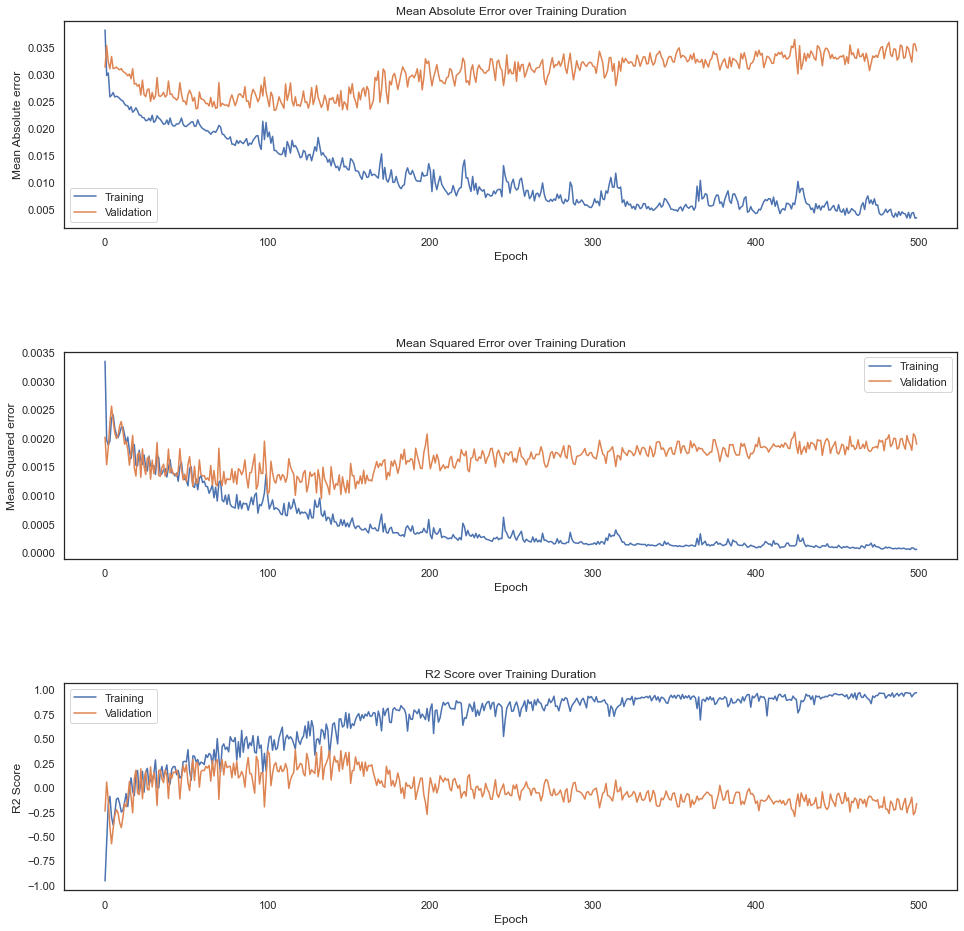

In [926]:
#Compare the models performance over training duration using plots for all three metrics

#Define plot layout
fig, axs = plt.subplots(3, 1, figsize=(16, 16))

#MAE plot
axs[0].plot(history.history['mean_absolute_error'], label="Training")
axs[0].plot(history.history['val_mean_absolute_error'], label="Validation")
axs[0].set_title("Mean Absolute Error over Training Duration")
axs[0].set_ylabel("Mean Absolute error")
axs[0].set_xlabel("Epoch")
#axs[0].set_xlim(0, 500)
axs[0].legend()

#MSE subplot
axs[1].plot(history.history['mean_squared_error'], label="Training")
axs[1].plot(history.history['val_mean_squared_error'], label="Validation")
axs[1].set_title("Mean Squared Error over Training Duration")
axs[1].set_ylabel("Mean Squared error")
axs[1].set_xlabel("Epoch")
#axs[1].set_xlim(0, 500)
axs[1].legend()

#r2 score subplot
axs[2].plot(history.history['r2_score'], label="Training")
axs[2].plot(history.history['val_r2_score'], label="Validation")
axs[2].set_title("R2 Score over Training Duration")
axs[2].set_ylabel("R2 Score")
axs[2].set_xlabel("Epoch")
#axs[2].set_ylim(-0.4, 0.3)
axs[2].legend()

#Adjust spacing
#plt.subplots_adjust(wspace=1)
plt.subplots_adjust(hspace=0.6)

#Display plots
plt.show()

In [930]:
#Assess CNN impacts in the model and play with hyperparams + play with hyperparameters a bit

#Create the model
model = Sequential()

#Input Layer
model.add(Reshape((X_train.shape[1], 1), input_shape=(X_train.shape[1],)))

#Convolutional layers
model.add(Conv1D(filters=32, kernel_size=3, activation='relu'))
model.add(MaxPooling1D(pool_size=2))

#Hidden Layers
model.add(Dense(256, kernel_initializer='normal',activation='relu'))
model.add(Dense(256, kernel_initializer='normal',activation='relu'))
model.add(Dense(256, kernel_initializer='normal',activation='relu'))

#The Output Layer
model.add(Dense(1, kernel_initializer='normal',activation='linear'))

#Compile the network
model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error', 'mean_squared_error', r2_score])
model.summary()

#Train the model
history = model.fit(X_train, Y_train, epochs=500, batch_size=32, validation_split = 0.2)

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_8 (Reshape)         (None, 8, 1)              0         
                                                                 
 conv1d_17 (Conv1D)          (None, 6, 32)             128       
                                                                 
 max_pooling1d_15 (MaxPoolin  (None, 3, 32)            0         
 g1D)                                                            
                                                                 
 dense_47 (Dense)            (None, 3, 256)            8448      
                                                                 
 dense_48 (Dense)            (None, 3, 256)            65792     
                                                                 
 dense_49 (Dense)            (None, 3, 256)            65792     
                                                     

3/3 [==============================] - 0s 17ms/step - loss: 0.0244 - mean_absolute_error: 0.0244 - mean_squared_error: 0.0020 - r2_score: -2.2713 - val_loss: 0.0313 - val_mean_absolute_error: 0.0313 - val_mean_squared_error: 0.0020 - val_r2_score: -2.6419
Epoch 27/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0246 - mean_absolute_error: 0.0246 - mean_squared_error: 0.0021 - r2_score: -2.5602 - val_loss: 0.0311 - val_mean_absolute_error: 0.0311 - val_mean_squared_error: 0.0019 - val_r2_score: -2.5700
Epoch 28/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0247 - mean_absolute_error: 0.0247 - mean_squared_error: 0.0020 - r2_score: -2.2857 - val_loss: 0.0305 - val_mean_absolute_error: 0.0305 - val_mean_squared_error: 0.0018 - val_r2_score: -2.2910
Epoch 29/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0246 - mean_absolute_error: 0.0246 - mean_squared_error: 0.0020 - r2_score: -2.3459 - val_loss: 0.0313 - val_mean_absolute_error: 0

3/3 [==============================] - 0s 17ms/step - loss: 0.0241 - mean_absolute_error: 0.0241 - mean_squared_error: 0.0020 - r2_score: -2.3032 - val_loss: 0.0309 - val_mean_absolute_error: 0.0309 - val_mean_squared_error: 0.0020 - val_r2_score: -2.6935
Epoch 57/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0247 - mean_absolute_error: 0.0247 - mean_squared_error: 0.0021 - r2_score: -2.6120 - val_loss: 0.0305 - val_mean_absolute_error: 0.0305 - val_mean_squared_error: 0.0019 - val_r2_score: -2.5178
Epoch 58/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0242 - mean_absolute_error: 0.0242 - mean_squared_error: 0.0020 - r2_score: -2.4783 - val_loss: 0.0299 - val_mean_absolute_error: 0.0299 - val_mean_squared_error: 0.0017 - val_r2_score: -2.1945
Epoch 59/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0246 - mean_absolute_error: 0.0246 - mean_squared_error: 0.0019 - r2_score: -2.1608 - val_loss: 0.0299 - val_mean_absolute_error: 0

3/3 [==============================] - 0s 18ms/step - loss: 0.0240 - mean_absolute_error: 0.0240 - mean_squared_error: 0.0017 - r2_score: -2.0807 - val_loss: 0.0292 - val_mean_absolute_error: 0.0292 - val_mean_squared_error: 0.0017 - val_r2_score: -2.2073
Epoch 87/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0243 - mean_absolute_error: 0.0243 - mean_squared_error: 0.0020 - r2_score: -2.5658 - val_loss: 0.0296 - val_mean_absolute_error: 0.0296 - val_mean_squared_error: 0.0018 - val_r2_score: -2.4122
Epoch 88/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0236 - mean_absolute_error: 0.0236 - mean_squared_error: 0.0019 - r2_score: -2.3954 - val_loss: 0.0281 - val_mean_absolute_error: 0.0281 - val_mean_squared_error: 0.0015 - val_r2_score: -1.6881
Epoch 89/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0244 - mean_absolute_error: 0.0244 - mean_squared_error: 0.0017 - r2_score: -1.9730 - val_loss: 0.0278 - val_mean_absolute_error: 0

3/3 [==============================] - 0s 18ms/step - loss: 0.0237 - mean_absolute_error: 0.0237 - mean_squared_error: 0.0019 - r2_score: -2.5593 - val_loss: 0.0295 - val_mean_absolute_error: 0.0295 - val_mean_squared_error: 0.0020 - val_r2_score: -2.6230
Epoch 117/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0240 - mean_absolute_error: 0.0240 - mean_squared_error: 0.0020 - r2_score: -2.2432 - val_loss: 0.0284 - val_mean_absolute_error: 0.0284 - val_mean_squared_error: 0.0017 - val_r2_score: -2.1501
Epoch 118/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0240 - mean_absolute_error: 0.0240 - mean_squared_error: 0.0017 - r2_score: -2.1273 - val_loss: 0.0271 - val_mean_absolute_error: 0.0271 - val_mean_squared_error: 0.0015 - val_r2_score: -1.7271
Epoch 119/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0233 - mean_absolute_error: 0.0233 - mean_squared_error: 0.0017 - r2_score: -1.9057 - val_loss: 0.0288 - val_mean_absolute_error

3/3 [==============================] - 0s 16ms/step - loss: 0.0227 - mean_absolute_error: 0.0227 - mean_squared_error: 0.0016 - r2_score: -2.2860 - val_loss: 0.0259 - val_mean_absolute_error: 0.0259 - val_mean_squared_error: 0.0014 - val_r2_score: -1.6723
Epoch 147/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0222 - mean_absolute_error: 0.0222 - mean_squared_error: 0.0016 - r2_score: -1.9116 - val_loss: 0.0270 - val_mean_absolute_error: 0.0270 - val_mean_squared_error: 0.0016 - val_r2_score: -1.9401
Epoch 148/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0219 - mean_absolute_error: 0.0219 - mean_squared_error: 0.0016 - r2_score: -1.8917 - val_loss: 0.0256 - val_mean_absolute_error: 0.0256 - val_mean_squared_error: 0.0014 - val_r2_score: -1.4972
Epoch 149/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0223 - mean_absolute_error: 0.0223 - mean_squared_error: 0.0015 - r2_score: -2.0030 - val_loss: 0.0270 - val_mean_absolute_error

3/3 [==============================] - 0s 17ms/step - loss: 0.0211 - mean_absolute_error: 0.0211 - mean_squared_error: 0.0015 - r2_score: -1.6066 - val_loss: 0.0251 - val_mean_absolute_error: 0.0251 - val_mean_squared_error: 0.0014 - val_r2_score: -1.5196
Epoch 177/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0218 - mean_absolute_error: 0.0218 - mean_squared_error: 0.0016 - r2_score: -1.9758 - val_loss: 0.0273 - val_mean_absolute_error: 0.0273 - val_mean_squared_error: 0.0017 - val_r2_score: -2.0567
Epoch 178/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0231 - mean_absolute_error: 0.0231 - mean_squared_error: 0.0015 - r2_score: -1.9124 - val_loss: 0.0268 - val_mean_absolute_error: 0.0268 - val_mean_squared_error: 0.0015 - val_r2_score: -1.7899
Epoch 179/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0225 - mean_absolute_error: 0.0225 - mean_squared_error: 0.0017 - r2_score: -2.0033 - val_loss: 0.0301 - val_mean_absolute_error

3/3 [==============================] - 0s 18ms/step - loss: 0.0205 - mean_absolute_error: 0.0205 - mean_squared_error: 0.0014 - r2_score: -1.4644 - val_loss: 0.0262 - val_mean_absolute_error: 0.0262 - val_mean_squared_error: 0.0014 - val_r2_score: -1.6749
Epoch 207/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0216 - mean_absolute_error: 0.0216 - mean_squared_error: 0.0014 - r2_score: -1.6363 - val_loss: 0.0277 - val_mean_absolute_error: 0.0277 - val_mean_squared_error: 0.0018 - val_r2_score: -2.2732
Epoch 208/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0217 - mean_absolute_error: 0.0217 - mean_squared_error: 0.0015 - r2_score: -1.7796 - val_loss: 0.0261 - val_mean_absolute_error: 0.0261 - val_mean_squared_error: 0.0014 - val_r2_score: -1.6097
Epoch 209/500
3/3 [==============================] - 0s 14ms/step - loss: 0.0218 - mean_absolute_error: 0.0218 - mean_squared_error: 0.0012 - r2_score: -1.1393 - val_loss: 0.0265 - val_mean_absolute_error

3/3 [==============================] - 0s 16ms/step - loss: 0.0201 - mean_absolute_error: 0.0201 - mean_squared_error: 0.0012 - r2_score: -1.4065 - val_loss: 0.0265 - val_mean_absolute_error: 0.0265 - val_mean_squared_error: 0.0015 - val_r2_score: -1.7919
Epoch 237/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0213 - mean_absolute_error: 0.0213 - mean_squared_error: 0.0014 - r2_score: -1.9307 - val_loss: 0.0282 - val_mean_absolute_error: 0.0282 - val_mean_squared_error: 0.0018 - val_r2_score: -2.2652
Epoch 238/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0209 - mean_absolute_error: 0.0209 - mean_squared_error: 0.0013 - r2_score: -1.5842 - val_loss: 0.0281 - val_mean_absolute_error: 0.0281 - val_mean_squared_error: 0.0016 - val_r2_score: -1.9159
Epoch 239/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0206 - mean_absolute_error: 0.0206 - mean_squared_error: 0.0012 - r2_score: -1.2971 - val_loss: 0.0284 - val_mean_absolute_error

3/3 [==============================] - 0s 17ms/step - loss: 0.0214 - mean_absolute_error: 0.0214 - mean_squared_error: 0.0012 - r2_score: -1.3529 - val_loss: 0.0268 - val_mean_absolute_error: 0.0268 - val_mean_squared_error: 0.0015 - val_r2_score: -1.7808
Epoch 267/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0209 - mean_absolute_error: 0.0209 - mean_squared_error: 0.0013 - r2_score: -1.3836 - val_loss: 0.0272 - val_mean_absolute_error: 0.0272 - val_mean_squared_error: 0.0016 - val_r2_score: -1.8948
Epoch 268/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0192 - mean_absolute_error: 0.0192 - mean_squared_error: 0.0012 - r2_score: -1.2410 - val_loss: 0.0282 - val_mean_absolute_error: 0.0282 - val_mean_squared_error: 0.0015 - val_r2_score: -1.7653
Epoch 269/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0205 - mean_absolute_error: 0.0205 - mean_squared_error: 0.0012 - r2_score: -1.0388 - val_loss: 0.0273 - val_mean_absolute_error

3/3 [==============================] - 0s 17ms/step - loss: 0.0224 - mean_absolute_error: 0.0224 - mean_squared_error: 0.0013 - r2_score: -1.2900 - val_loss: 0.0287 - val_mean_absolute_error: 0.0287 - val_mean_squared_error: 0.0015 - val_r2_score: -1.7773
Epoch 297/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0218 - mean_absolute_error: 0.0218 - mean_squared_error: 0.0014 - r2_score: -1.7969 - val_loss: 0.0293 - val_mean_absolute_error: 0.0293 - val_mean_squared_error: 0.0018 - val_r2_score: -2.3898
Epoch 298/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0213 - mean_absolute_error: 0.0213 - mean_squared_error: 0.0015 - r2_score: -1.5810 - val_loss: 0.0293 - val_mean_absolute_error: 0.0293 - val_mean_squared_error: 0.0016 - val_r2_score: -2.0411
Epoch 299/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0210 - mean_absolute_error: 0.0210 - mean_squared_error: 0.0013 - r2_score: -1.5379 - val_loss: 0.0285 - val_mean_absolute_error

3/3 [==============================] - 0s 18ms/step - loss: 0.0210 - mean_absolute_error: 0.0210 - mean_squared_error: 0.0014 - r2_score: -1.4850 - val_loss: 0.0260 - val_mean_absolute_error: 0.0260 - val_mean_squared_error: 0.0014 - val_r2_score: -1.5355
Epoch 327/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0210 - mean_absolute_error: 0.0210 - mean_squared_error: 0.0012 - r2_score: -1.2887 - val_loss: 0.0268 - val_mean_absolute_error: 0.0268 - val_mean_squared_error: 0.0014 - val_r2_score: -1.5038
Epoch 328/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0197 - mean_absolute_error: 0.0197 - mean_squared_error: 0.0011 - r2_score: -1.1501 - val_loss: 0.0269 - val_mean_absolute_error: 0.0269 - val_mean_squared_error: 0.0016 - val_r2_score: -1.9823
Epoch 329/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0193 - mean_absolute_error: 0.0193 - mean_squared_error: 0.0012 - r2_score: -1.0980 - val_loss: 0.0290 - val_mean_absolute_error

3/3 [==============================] - 0s 19ms/step - loss: 0.0196 - mean_absolute_error: 0.0196 - mean_squared_error: 0.0012 - r2_score: -1.0883 - val_loss: 0.0267 - val_mean_absolute_error: 0.0267 - val_mean_squared_error: 0.0016 - val_r2_score: -1.9675
Epoch 357/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0196 - mean_absolute_error: 0.0196 - mean_squared_error: 0.0013 - r2_score: -1.6891 - val_loss: 0.0269 - val_mean_absolute_error: 0.0269 - val_mean_squared_error: 0.0015 - val_r2_score: -1.6898
Epoch 358/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0192 - mean_absolute_error: 0.0192 - mean_squared_error: 0.0011 - r2_score: -1.0783 - val_loss: 0.0275 - val_mean_absolute_error: 0.0275 - val_mean_squared_error: 0.0015 - val_r2_score: -1.7166
Epoch 359/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0186 - mean_absolute_error: 0.0186 - mean_squared_error: 0.0011 - r2_score: -0.9980 - val_loss: 0.0271 - val_mean_absolute_error

3/3 [==============================] - 0s 16ms/step - loss: 0.0186 - mean_absolute_error: 0.0186 - mean_squared_error: 0.0012 - r2_score: -1.1379 - val_loss: 0.0274 - val_mean_absolute_error: 0.0274 - val_mean_squared_error: 0.0014 - val_r2_score: -1.6167
Epoch 387/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0195 - mean_absolute_error: 0.0195 - mean_squared_error: 0.0011 - r2_score: -1.0449 - val_loss: 0.0280 - val_mean_absolute_error: 0.0280 - val_mean_squared_error: 0.0017 - val_r2_score: -2.1969
Epoch 388/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0211 - mean_absolute_error: 0.0211 - mean_squared_error: 0.0014 - r2_score: -1.6530 - val_loss: 0.0291 - val_mean_absolute_error: 0.0291 - val_mean_squared_error: 0.0019 - val_r2_score: -2.4364
Epoch 389/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0208 - mean_absolute_error: 0.0208 - mean_squared_error: 0.0013 - r2_score: -1.6132 - val_loss: 0.0264 - val_mean_absolute_error

3/3 [==============================] - 0s 18ms/step - loss: 0.0181 - mean_absolute_error: 0.0181 - mean_squared_error: 0.0011 - r2_score: -1.0739 - val_loss: 0.0270 - val_mean_absolute_error: 0.0270 - val_mean_squared_error: 0.0015 - val_r2_score: -1.8023
Epoch 417/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0180 - mean_absolute_error: 0.0180 - mean_squared_error: 0.0011 - r2_score: -0.9385 - val_loss: 0.0268 - val_mean_absolute_error: 0.0268 - val_mean_squared_error: 0.0014 - val_r2_score: -1.6515
Epoch 418/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0176 - mean_absolute_error: 0.0176 - mean_squared_error: 0.0010 - r2_score: -1.4258 - val_loss: 0.0267 - val_mean_absolute_error: 0.0267 - val_mean_squared_error: 0.0016 - val_r2_score: -1.9489
Epoch 419/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0175 - mean_absolute_error: 0.0175 - mean_squared_error: 0.0011 - r2_score: -0.6894 - val_loss: 0.0284 - val_mean_absolute_error

3/3 [==============================] - 0s 17ms/step - loss: 0.0178 - mean_absolute_error: 0.0178 - mean_squared_error: 0.0011 - r2_score: -0.9714 - val_loss: 0.0281 - val_mean_absolute_error: 0.0281 - val_mean_squared_error: 0.0018 - val_r2_score: -2.3060
Epoch 447/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0191 - mean_absolute_error: 0.0191 - mean_squared_error: 0.0012 - r2_score: -1.3476 - val_loss: 0.0291 - val_mean_absolute_error: 0.0291 - val_mean_squared_error: 0.0017 - val_r2_score: -2.1596
Epoch 448/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0196 - mean_absolute_error: 0.0196 - mean_squared_error: 0.0011 - r2_score: -1.2112 - val_loss: 0.0267 - val_mean_absolute_error: 0.0267 - val_mean_squared_error: 0.0016 - val_r2_score: -1.9410
Epoch 449/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0179 - mean_absolute_error: 0.0179 - mean_squared_error: 0.0011 - r2_score: -1.6361 - val_loss: 0.0279 - val_mean_absolute_error

3/3 [==============================] - 0s 19ms/step - loss: 0.0185 - mean_absolute_error: 0.0185 - mean_squared_error: 0.0011 - r2_score: -0.8501 - val_loss: 0.0274 - val_mean_absolute_error: 0.0274 - val_mean_squared_error: 0.0017 - val_r2_score: -2.0601
Epoch 477/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0183 - mean_absolute_error: 0.0183 - mean_squared_error: 0.0011 - r2_score: -1.0070 - val_loss: 0.0280 - val_mean_absolute_error: 0.0280 - val_mean_squared_error: 0.0017 - val_r2_score: -2.0917
Epoch 478/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0186 - mean_absolute_error: 0.0186 - mean_squared_error: 0.0012 - r2_score: -1.3666 - val_loss: 0.0280 - val_mean_absolute_error: 0.0280 - val_mean_squared_error: 0.0017 - val_r2_score: -2.1366
Epoch 479/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0188 - mean_absolute_error: 0.0188 - mean_squared_error: 0.0011 - r2_score: -0.8667 - val_loss: 0.0277 - val_mean_absolute_error

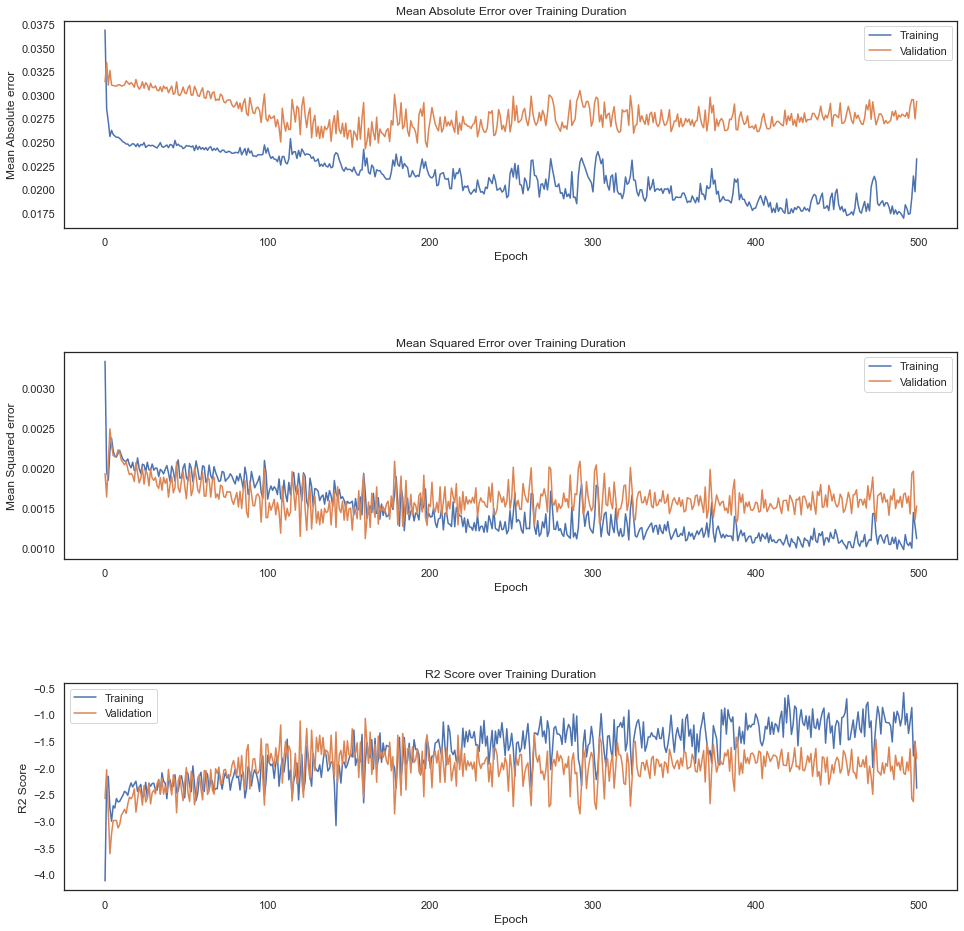

In [931]:
#Compare the models performance over training duration using plots for all three metrics

#Define plot layout
fig, axs = plt.subplots(3, 1, figsize=(16, 16))

#MAE plot
axs[0].plot(history.history['mean_absolute_error'], label="Training")
axs[0].plot(history.history['val_mean_absolute_error'], label="Validation")
axs[0].set_title("Mean Absolute Error over Training Duration")
axs[0].set_ylabel("Mean Absolute error")
axs[0].set_xlabel("Epoch")
#axs[0].set_xlim(0, 500)
axs[0].legend()

#MSE subplot
axs[1].plot(history.history['mean_squared_error'], label="Training")
axs[1].plot(history.history['val_mean_squared_error'], label="Validation")
axs[1].set_title("Mean Squared Error over Training Duration")
axs[1].set_ylabel("Mean Squared error")
axs[1].set_xlabel("Epoch")
#axs[1].set_xlim(0, 500)
axs[1].legend()

#r2 score subplot
axs[2].plot(history.history['r2_score'], label="Training")
axs[2].plot(history.history['val_r2_score'], label="Validation")
axs[2].set_title("R2 Score over Training Duration")
axs[2].set_ylabel("R2 Score")
axs[2].set_xlabel("Epoch")
#axs[2].set_ylim(-0.4, 0.3)
axs[2].legend()

#Adjust spacing
#plt.subplots_adjust(wspace=1)
plt.subplots_adjust(hspace=0.6)

#Display plots
plt.show()

In [932]:
#Look at RNN with an LSTM layer

#Create the model
model = Sequential()

#Input Layer
model.add(Reshape((X_train.shape[1], 1), input_shape=(X_train.shape[1],)))

#LSTM layer
model.add(LSTM(64))

#Hidden Layers
model.add(Dense(256, kernel_initializer='normal',activation='relu'))
model.add(Dense(256, kernel_initializer='normal',activation='relu'))
model.add(Dense(256, kernel_initializer='normal',activation='relu'))

#The Output Layer
model.add(Dense(1, kernel_initializer='normal',activation='linear'))

#Compile the network
model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error', 'mean_squared_error', r2_score])
model.summary()

#Train the model
history = model.fit(X_train, Y_train, epochs=500, batch_size=32, validation_split = 0.2)

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_9 (Reshape)         (None, 8, 1)              0         
                                                                 
 lstm (LSTM)                 (None, 64)                16896     
                                                                 
 dense_51 (Dense)            (None, 256)               16640     
                                                                 
 dense_52 (Dense)            (None, 256)               65792     
                                                                 
 dense_53 (Dense)            (None, 256)               65792     
                                                                 
 dense_54 (Dense)            (None, 1)                 257       
                                                                 
Total params: 165,377
Trainable params: 165,377
Non-t

Epoch 27/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0245 - mean_absolute_error: 0.0245 - mean_squared_error: 0.0020 - r2_score: -0.0979 - val_loss: 0.0314 - val_mean_absolute_error: 0.0314 - val_mean_squared_error: 0.0020 - val_r2_score: -0.2024
Epoch 28/500
3/3 [==============================] - 0s 21ms/step - loss: 0.0245 - mean_absolute_error: 0.0245 - mean_squared_error: 0.0020 - r2_score: -0.1011 - val_loss: 0.0315 - val_mean_absolute_error: 0.0315 - val_mean_squared_error: 0.0019 - val_r2_score: -0.2002
Epoch 29/500
3/3 [==============================] - 0s 21ms/step - loss: 0.0247 - mean_absolute_error: 0.0247 - mean_squared_error: 0.0021 - r2_score: -0.1727 - val_loss: 0.0317 - val_mean_absolute_error: 0.0317 - val_mean_squared_error: 0.0020 - val_r2_score: -0.2318
Epoch 30/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0245 - mean_absolute_error: 0.0245 - mean_squared_error: 0.0020 - r2_score: -0.1025 - val_loss: 0.0312 - val_mean_abso

3/3 [==============================] - 0s 21ms/step - loss: 0.0245 - mean_absolute_error: 0.0245 - mean_squared_error: 0.0020 - r2_score: -0.1089 - val_loss: 0.0312 - val_mean_absolute_error: 0.0312 - val_mean_squared_error: 0.0019 - val_r2_score: -0.1696
Epoch 58/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0246 - mean_absolute_error: 0.0246 - mean_squared_error: 0.0019 - r2_score: -0.0462 - val_loss: 0.0318 - val_mean_absolute_error: 0.0318 - val_mean_squared_error: 0.0020 - val_r2_score: -0.2572
Epoch 59/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0246 - mean_absolute_error: 0.0246 - mean_squared_error: 0.0021 - r2_score: -0.1767 - val_loss: 0.0319 - val_mean_absolute_error: 0.0319 - val_mean_squared_error: 0.0021 - val_r2_score: -0.3060
Epoch 60/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0245 - mean_absolute_error: 0.0245 - mean_squared_error: 0.0021 - r2_score: -0.0627 - val_loss: 0.0311 - val_mean_absolute_error: 0

3/3 [==============================] - 0s 19ms/step - loss: 0.0247 - mean_absolute_error: 0.0247 - mean_squared_error: 0.0021 - r2_score: -0.1939 - val_loss: 0.0305 - val_mean_absolute_error: 0.0305 - val_mean_squared_error: 0.0020 - val_r2_score: -0.2007
Epoch 88/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0246 - mean_absolute_error: 0.0246 - mean_squared_error: 0.0019 - r2_score: -0.0998 - val_loss: 0.0305 - val_mean_absolute_error: 0.0305 - val_mean_squared_error: 0.0018 - val_r2_score: -0.1232
Epoch 89/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0241 - mean_absolute_error: 0.0241 - mean_squared_error: 0.0019 - r2_score: -0.0442 - val_loss: 0.0311 - val_mean_absolute_error: 0.0311 - val_mean_squared_error: 0.0020 - val_r2_score: -0.2195
Epoch 90/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0241 - mean_absolute_error: 0.0241 - mean_squared_error: 0.0020 - r2_score: -0.1651 - val_loss: 0.0313 - val_mean_absolute_error: 0

3/3 [==============================] - 0s 19ms/step - loss: 0.0225 - mean_absolute_error: 0.0225 - mean_squared_error: 0.0020 - r2_score: -0.1434 - val_loss: 0.0282 - val_mean_absolute_error: 0.0282 - val_mean_squared_error: 0.0016 - val_r2_score: 0.0108
Epoch 118/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0235 - mean_absolute_error: 0.0235 - mean_squared_error: 0.0018 - r2_score: 0.0431 - val_loss: 0.0282 - val_mean_absolute_error: 0.0282 - val_mean_squared_error: 0.0017 - val_r2_score: -0.0400
Epoch 119/500
3/3 [==============================] - 0s 24ms/step - loss: 0.0223 - mean_absolute_error: 0.0223 - mean_squared_error: 0.0019 - r2_score: -0.0696 - val_loss: 0.0293 - val_mean_absolute_error: 0.0293 - val_mean_squared_error: 0.0019 - val_r2_score: -0.1606
Epoch 120/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0225 - mean_absolute_error: 0.0225 - mean_squared_error: 0.0020 - r2_score: -0.0847 - val_loss: 0.0284 - val_mean_absolute_error: 

3/3 [==============================] - 0s 18ms/step - loss: 0.0224 - mean_absolute_error: 0.0224 - mean_squared_error: 0.0019 - r2_score: -0.0011 - val_loss: 0.0287 - val_mean_absolute_error: 0.0287 - val_mean_squared_error: 0.0016 - val_r2_score: -0.0144
Epoch 148/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0219 - mean_absolute_error: 0.0219 - mean_squared_error: 0.0019 - r2_score: -0.0120 - val_loss: 0.0288 - val_mean_absolute_error: 0.0288 - val_mean_squared_error: 0.0017 - val_r2_score: -0.0611
Epoch 149/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0220 - mean_absolute_error: 0.0220 - mean_squared_error: 0.0019 - r2_score: -0.0208 - val_loss: 0.0283 - val_mean_absolute_error: 0.0283 - val_mean_squared_error: 0.0016 - val_r2_score: 0.0019
Epoch 150/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0222 - mean_absolute_error: 0.0222 - mean_squared_error: 0.0019 - r2_score: -0.0204 - val_loss: 0.0292 - val_mean_absolute_error:

3/3 [==============================] - 0s 19ms/step - loss: 0.0221 - mean_absolute_error: 0.0221 - mean_squared_error: 0.0019 - r2_score: -0.0935 - val_loss: 0.0277 - val_mean_absolute_error: 0.0277 - val_mean_squared_error: 0.0015 - val_r2_score: 0.0541
Epoch 178/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0224 - mean_absolute_error: 0.0224 - mean_squared_error: 0.0017 - r2_score: 0.0389 - val_loss: 0.0278 - val_mean_absolute_error: 0.0278 - val_mean_squared_error: 0.0016 - val_r2_score: 0.0308
Epoch 179/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0220 - mean_absolute_error: 0.0220 - mean_squared_error: 0.0018 - r2_score: 0.0916 - val_loss: 0.0293 - val_mean_absolute_error: 0.0293 - val_mean_squared_error: 0.0018 - val_r2_score: -0.0951
Epoch 180/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0220 - mean_absolute_error: 0.0220 - mean_squared_error: 0.0019 - r2_score: -0.1060 - val_loss: 0.0285 - val_mean_absolute_error: 0.

3/3 [==============================] - 0s 19ms/step - loss: 0.0216 - mean_absolute_error: 0.0216 - mean_squared_error: 0.0018 - r2_score: 0.0260 - val_loss: 0.0278 - val_mean_absolute_error: 0.0278 - val_mean_squared_error: 0.0016 - val_r2_score: -0.0132
Epoch 208/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0218 - mean_absolute_error: 0.0218 - mean_squared_error: 0.0018 - r2_score: 0.0583 - val_loss: 0.0276 - val_mean_absolute_error: 0.0276 - val_mean_squared_error: 0.0015 - val_r2_score: 0.0971
Epoch 209/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0215 - mean_absolute_error: 0.0215 - mean_squared_error: 0.0017 - r2_score: 0.0369 - val_loss: 0.0293 - val_mean_absolute_error: 0.0293 - val_mean_squared_error: 0.0017 - val_r2_score: -0.0525
Epoch 210/500
3/3 [==============================] - 0s 21ms/step - loss: 0.0214 - mean_absolute_error: 0.0214 - mean_squared_error: 0.0018 - r2_score: -0.0240 - val_loss: 0.0286 - val_mean_absolute_error: 0.

3/3 [==============================] - 0s 19ms/step - loss: 0.0206 - mean_absolute_error: 0.0206 - mean_squared_error: 0.0017 - r2_score: 0.0347 - val_loss: 0.0269 - val_mean_absolute_error: 0.0269 - val_mean_squared_error: 0.0015 - val_r2_score: 0.1034
Epoch 238/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0203 - mean_absolute_error: 0.0203 - mean_squared_error: 0.0017 - r2_score: 0.1356 - val_loss: 0.0265 - val_mean_absolute_error: 0.0265 - val_mean_squared_error: 0.0013 - val_r2_score: 0.1730
Epoch 239/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0215 - mean_absolute_error: 0.0215 - mean_squared_error: 0.0016 - r2_score: 0.1268 - val_loss: 0.0283 - val_mean_absolute_error: 0.0283 - val_mean_squared_error: 0.0017 - val_r2_score: -0.0288
Epoch 240/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0223 - mean_absolute_error: 0.0223 - mean_squared_error: 0.0019 - r2_score: -0.0980 - val_loss: 0.0275 - val_mean_absolute_error: 0.0

Epoch 268/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0203 - mean_absolute_error: 0.0203 - mean_squared_error: 0.0015 - r2_score: 0.1307 - val_loss: 0.0293 - val_mean_absolute_error: 0.0293 - val_mean_squared_error: 0.0017 - val_r2_score: -0.0280
Epoch 269/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0202 - mean_absolute_error: 0.0202 - mean_squared_error: 0.0016 - r2_score: 0.1070 - val_loss: 0.0251 - val_mean_absolute_error: 0.0251 - val_mean_squared_error: 0.0012 - val_r2_score: 0.2660
Epoch 270/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0216 - mean_absolute_error: 0.0216 - mean_squared_error: 0.0014 - r2_score: 0.2057 - val_loss: 0.0238 - val_mean_absolute_error: 0.0238 - val_mean_squared_error: 0.0012 - val_r2_score: 0.2344
Epoch 271/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0211 - mean_absolute_error: 0.0211 - mean_squared_error: 0.0017 - r2_score: -0.0090 - val_loss: 0.0281 - val_mean_absol

3/3 [==============================] - 0s 20ms/step - loss: 0.0176 - mean_absolute_error: 0.0176 - mean_squared_error: 0.0012 - r2_score: 0.3720 - val_loss: 0.0273 - val_mean_absolute_error: 0.0273 - val_mean_squared_error: 0.0014 - val_r2_score: 0.1324
Epoch 299/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0180 - mean_absolute_error: 0.0180 - mean_squared_error: 0.0012 - r2_score: 0.2686 - val_loss: 0.0258 - val_mean_absolute_error: 0.0258 - val_mean_squared_error: 0.0012 - val_r2_score: 0.2507
Epoch 300/500
3/3 [==============================] - 0s 26ms/step - loss: 0.0181 - mean_absolute_error: 0.0181 - mean_squared_error: 0.0011 - r2_score: 0.2782 - val_loss: 0.0272 - val_mean_absolute_error: 0.0272 - val_mean_squared_error: 0.0014 - val_r2_score: 0.1302
Epoch 301/500
3/3 [==============================] - 0s 21ms/step - loss: 0.0181 - mean_absolute_error: 0.0181 - mean_squared_error: 0.0013 - r2_score: 0.1960 - val_loss: 0.0269 - val_mean_absolute_error: 0.026

3/3 [==============================] - 0s 20ms/step - loss: 0.0156 - mean_absolute_error: 0.0156 - mean_squared_error: 8.1802e-04 - r2_score: 0.5298 - val_loss: 0.0285 - val_mean_absolute_error: 0.0285 - val_mean_squared_error: 0.0016 - val_r2_score: 0.0076
Epoch 329/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0170 - mean_absolute_error: 0.0170 - mean_squared_error: 9.5240e-04 - r2_score: 0.3944 - val_loss: 0.0278 - val_mean_absolute_error: 0.0278 - val_mean_squared_error: 0.0015 - val_r2_score: 0.0737
Epoch 330/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0156 - mean_absolute_error: 0.0156 - mean_squared_error: 7.8431e-04 - r2_score: 0.4779 - val_loss: 0.0282 - val_mean_absolute_error: 0.0282 - val_mean_squared_error: 0.0013 - val_r2_score: 0.2110
Epoch 331/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0151 - mean_absolute_error: 0.0151 - mean_squared_error: 7.0012e-04 - r2_score: 0.5448 - val_loss: 0.0270 - val_mean_absol

3/3 [==============================] - 0s 20ms/step - loss: 0.0143 - mean_absolute_error: 0.0143 - mean_squared_error: 6.8909e-04 - r2_score: 0.5682 - val_loss: 0.0258 - val_mean_absolute_error: 0.0258 - val_mean_squared_error: 0.0013 - val_r2_score: 0.2153
Epoch 359/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0175 - mean_absolute_error: 0.0175 - mean_squared_error: 8.2619e-04 - r2_score: 0.5370 - val_loss: 0.0284 - val_mean_absolute_error: 0.0284 - val_mean_squared_error: 0.0014 - val_r2_score: 0.1493
Epoch 360/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0135 - mean_absolute_error: 0.0135 - mean_squared_error: 5.7430e-04 - r2_score: 0.4242 - val_loss: 0.0318 - val_mean_absolute_error: 0.0318 - val_mean_squared_error: 0.0018 - val_r2_score: -0.0986
Epoch 361/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0138 - mean_absolute_error: 0.0138 - mean_squared_error: 5.8748e-04 - r2_score: 0.6307 - val_loss: 0.0297 - val_mean_abso

3/3 [==============================] - 0s 20ms/step - loss: 0.0121 - mean_absolute_error: 0.0121 - mean_squared_error: 5.1082e-04 - r2_score: 0.7001 - val_loss: 0.0282 - val_mean_absolute_error: 0.0282 - val_mean_squared_error: 0.0014 - val_r2_score: 0.1443
Epoch 389/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0125 - mean_absolute_error: 0.0125 - mean_squared_error: 6.3489e-04 - r2_score: 0.5245 - val_loss: 0.0257 - val_mean_absolute_error: 0.0257 - val_mean_squared_error: 0.0014 - val_r2_score: 0.1433
Epoch 390/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0121 - mean_absolute_error: 0.0121 - mean_squared_error: 5.3857e-04 - r2_score: 0.5652 - val_loss: 0.0257 - val_mean_absolute_error: 0.0257 - val_mean_squared_error: 0.0013 - val_r2_score: 0.2208
Epoch 391/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0114 - mean_absolute_error: 0.0114 - mean_squared_error: 5.3319e-04 - r2_score: 0.5849 - val_loss: 0.0301 - val_mean_absol

3/3 [==============================] - 0s 20ms/step - loss: 0.0111 - mean_absolute_error: 0.0111 - mean_squared_error: 4.4147e-04 - r2_score: 0.7240 - val_loss: 0.0317 - val_mean_absolute_error: 0.0317 - val_mean_squared_error: 0.0016 - val_r2_score: 0.0013
Epoch 419/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0098 - mean_absolute_error: 0.0098 - mean_squared_error: 4.2414e-04 - r2_score: 0.6684 - val_loss: 0.0328 - val_mean_absolute_error: 0.0328 - val_mean_squared_error: 0.0017 - val_r2_score: -0.0398
Epoch 420/500
3/3 [==============================] - 0s 21ms/step - loss: 0.0101 - mean_absolute_error: 0.0101 - mean_squared_error: 3.7858e-04 - r2_score: 0.7114 - val_loss: 0.0335 - val_mean_absolute_error: 0.0335 - val_mean_squared_error: 0.0017 - val_r2_score: -0.0442
Epoch 421/500
3/3 [==============================] - 0s 21ms/step - loss: 0.0095 - mean_absolute_error: 0.0095 - mean_squared_error: 3.5774e-04 - r2_score: 0.7843 - val_loss: 0.0306 - val_mean_abs

3/3 [==============================] - 0s 26ms/step - loss: 0.0090 - mean_absolute_error: 0.0090 - mean_squared_error: 3.3384e-04 - r2_score: 0.8233 - val_loss: 0.0302 - val_mean_absolute_error: 0.0302 - val_mean_squared_error: 0.0015 - val_r2_score: 0.0648
Epoch 449/500
3/3 [==============================] - 0s 22ms/step - loss: 0.0103 - mean_absolute_error: 0.0103 - mean_squared_error: 3.3461e-04 - r2_score: 0.7636 - val_loss: 0.0304 - val_mean_absolute_error: 0.0304 - val_mean_squared_error: 0.0015 - val_r2_score: 0.0760
Epoch 450/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0090 - mean_absolute_error: 0.0090 - mean_squared_error: 3.3095e-04 - r2_score: 0.6447 - val_loss: 0.0317 - val_mean_absolute_error: 0.0317 - val_mean_squared_error: 0.0016 - val_r2_score: -0.0086
Epoch 451/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0092 - mean_absolute_error: 0.0092 - mean_squared_error: 3.0419e-04 - r2_score: 0.8132 - val_loss: 0.0315 - val_mean_abso

3/3 [==============================] - 0s 19ms/step - loss: 0.0080 - mean_absolute_error: 0.0080 - mean_squared_error: 2.5475e-04 - r2_score: 0.7881 - val_loss: 0.0330 - val_mean_absolute_error: 0.0330 - val_mean_squared_error: 0.0018 - val_r2_score: -0.0823
Epoch 479/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0083 - mean_absolute_error: 0.0083 - mean_squared_error: 2.3028e-04 - r2_score: 0.8588 - val_loss: 0.0282 - val_mean_absolute_error: 0.0282 - val_mean_squared_error: 0.0016 - val_r2_score: 0.0300
Epoch 480/500
3/3 [==============================] - 0s 20ms/step - loss: 0.0082 - mean_absolute_error: 0.0082 - mean_squared_error: 2.6862e-04 - r2_score: 0.8466 - val_loss: 0.0258 - val_mean_absolute_error: 0.0258 - val_mean_squared_error: 0.0013 - val_r2_score: 0.1762
Epoch 481/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0095 - mean_absolute_error: 0.0095 - mean_squared_error: 3.5396e-04 - r2_score: 0.7563 - val_loss: 0.0316 - val_mean_abso

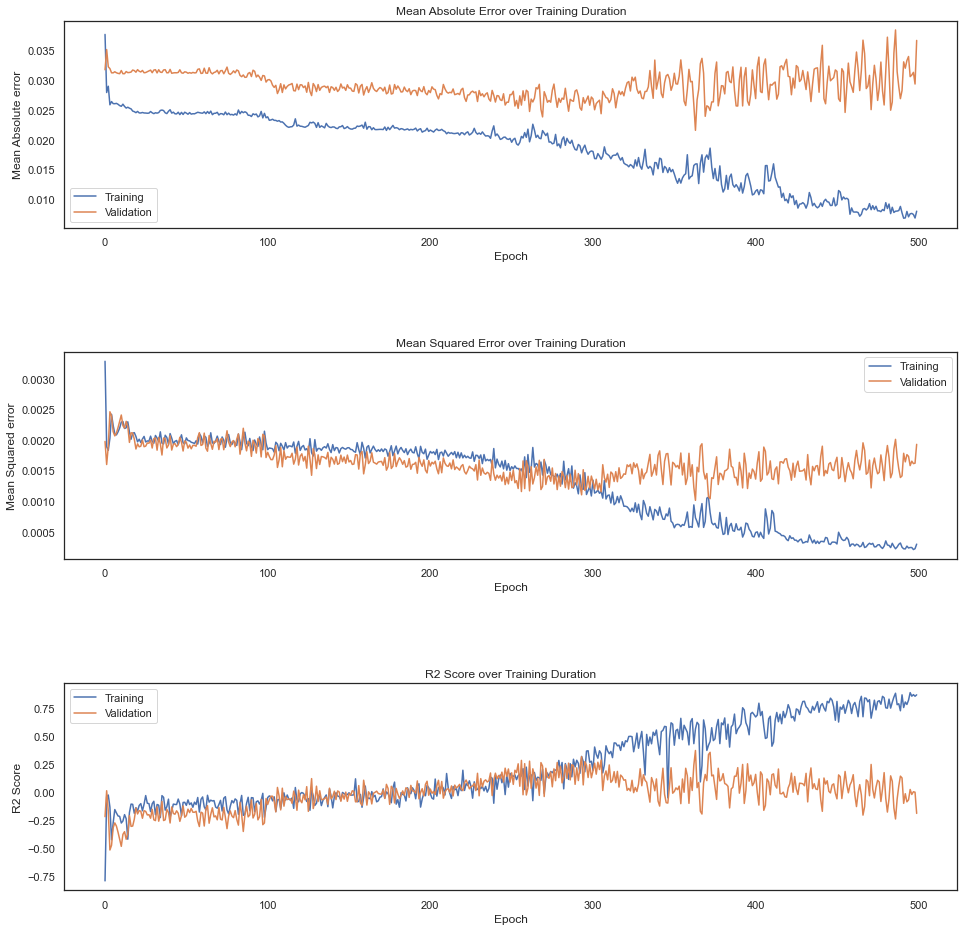

In [933]:
#Compare the models performance over training duration using plots for all three metrics

#Define plot layout
fig, axs = plt.subplots(3, 1, figsize=(16, 16))

#MAE plot
axs[0].plot(history.history['mean_absolute_error'], label="Training")
axs[0].plot(history.history['val_mean_absolute_error'], label="Validation")
axs[0].set_title("Mean Absolute Error over Training Duration")
axs[0].set_ylabel("Mean Absolute error")
axs[0].set_xlabel("Epoch")
#axs[0].set_xlim(0, 500)
axs[0].legend()

#MSE subplot
axs[1].plot(history.history['mean_squared_error'], label="Training")
axs[1].plot(history.history['val_mean_squared_error'], label="Validation")
axs[1].set_title("Mean Squared Error over Training Duration")
axs[1].set_ylabel("Mean Squared error")
axs[1].set_xlabel("Epoch")
#axs[1].set_xlim(0, 500)
axs[1].legend()

#r2 score subplot
axs[2].plot(history.history['r2_score'], label="Training")
axs[2].plot(history.history['val_r2_score'], label="Validation")
axs[2].set_title("R2 Score over Training Duration")
axs[2].set_ylabel("R2 Score")
axs[2].set_xlabel("Epoch")
#axs[2].set_ylim(-0.4, 0.3)
axs[2].legend()

#Adjust spacing
#plt.subplots_adjust(wspace=1)
plt.subplots_adjust(hspace=0.6)

#Display plots
plt.show()

In [948]:
#Look at Radial Basis Function NN

#Define the Radial Basis Function activation layer
class RadialBasisFunction(Layer):
    def __init__(self, num_centers=128, **kwargs):
        super(RadialBasisFunction, self).__init__(**kwargs)
        self.num_centers = num_centers

    def build(self, input_shape):
        self.centers = self.add_weight(name='centers',
                                       shape=(self.num_centers,),
                                       initializer='uniform',
                                       trainable=True)
        super(RadialBasisFunction, self).build(input_shape)

    def call(self, x):
        radial_distances = K.square(x[:, None] - self.centers)
        return K.exp(-radial_distances)

#Create the Radial Basis Functional Neural Network
model = Sequential()

#Input Layer
model.add(Dense(128, activation='relu', input_dim=8))

#Hidden Layer with RBF activation
model.add(RadialBasisFunction(num_centers=128))

#Output Layer
model.add(Dense(1, activation='linear'))

#Compile the network
model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error', 'mean_squared_error', r2_score])
model.summary()

#Train the model
history = model.fit(X_train_normalized, Y_train, epochs=500, batch_size=32, validation_split=0.2)

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_75 (Dense)            (None, 128)               1152      
                                                                 
 radial_basis_function_6 (Ra  (None, 1, 128)           128       
 dialBasisFunction)                                              
                                                                 
 dense_76 (Dense)            (None, 1, 1)              129       
                                                                 
Total params: 1,409
Trainable params: 1,409
Non-trainable params: 0
_________________________________________________________________
Epoch 1/500
3/3 [==============================] - 1s 126ms/step - loss: 3.3714 - mean_absolute_error: 3.3714 - mean_squared_error: 11.3774 - r2_score: -12241.5830 - val_loss: 3.0815 - val_mean_absolute_error: 3.0815 - val_mean_squared_error: 9.4983

Epoch 28/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0542 - mean_absolute_error: 0.0542 - mean_squared_error: 0.0047 - r2_score: -3.4668 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560 - val_mean_squared_error: 0.0049 - val_r2_score: -2.5572
Epoch 29/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - mean_squared_error: 0.0043 - r2_score: -1.5936 - val_loss: 0.0526 - val_mean_absolute_error: 0.0526 - val_mean_squared_error: 0.0043 - val_r2_score: -2.1418
Epoch 30/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0470 - mean_absolute_error: 0.0470 - mean_squared_error: 0.0036 - r2_score: -1.5010 - val_loss: 0.0504 - val_mean_absolute_error: 0.0504 - val_mean_squared_error: 0.0040 - val_r2_score: -1.9111
Epoch 31/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0457 - mean_absolute_error: 0.0457 - mean_squared_error: 0.0036 - r2_score: -1.5228 - val_loss: 0.0485 - val_mean_abso

3/3 [==============================] - 0s 16ms/step - loss: 0.0270 - mean_absolute_error: 0.0270 - mean_squared_error: 0.0018 - r2_score: 0.0351 - val_loss: 0.0295 - val_mean_absolute_error: 0.0295 - val_mean_squared_error: 0.0022 - val_r2_score: -0.5994
Epoch 59/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0255 - mean_absolute_error: 0.0255 - mean_squared_error: 0.0022 - r2_score: -0.2378 - val_loss: 0.0310 - val_mean_absolute_error: 0.0310 - val_mean_squared_error: 0.0014 - val_r2_score: -0.0467
Epoch 60/500
3/3 [==============================] - 0s 14ms/step - loss: 0.0321 - mean_absolute_error: 0.0321 - mean_squared_error: 0.0019 - r2_score: -0.1301 - val_loss: 0.0269 - val_mean_absolute_error: 0.0269 - val_mean_squared_error: 0.0018 - val_r2_score: -0.3152
Epoch 61/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0280 - mean_absolute_error: 0.0280 - mean_squared_error: 0.0024 - r2_score: -0.2523 - val_loss: 0.0283 - val_mean_absolute_error: 0.

3/3 [==============================] - 0s 19ms/step - loss: 0.0243 - mean_absolute_error: 0.0243 - mean_squared_error: 0.0019 - r2_score: 0.0227 - val_loss: 0.0275 - val_mean_absolute_error: 0.0275 - val_mean_squared_error: 0.0020 - val_r2_score: -0.4641
Epoch 89/500
3/3 [==============================] - 0s 21ms/step - loss: 0.0245 - mean_absolute_error: 0.0245 - mean_squared_error: 0.0021 - r2_score: -0.1616 - val_loss: 0.0265 - val_mean_absolute_error: 0.0265 - val_mean_squared_error: 0.0017 - val_r2_score: -0.2442
Epoch 90/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0240 - mean_absolute_error: 0.0240 - mean_squared_error: 0.0019 - r2_score: -0.0483 - val_loss: 0.0265 - val_mean_absolute_error: 0.0265 - val_mean_squared_error: 0.0018 - val_r2_score: -0.2757
Epoch 91/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0244 - mean_absolute_error: 0.0244 - mean_squared_error: 0.0019 - r2_score: -0.0142 - val_loss: 0.0303 - val_mean_absolute_error: 0.

3/3 [==============================] - 0s 15ms/step - loss: 0.0277 - mean_absolute_error: 0.0277 - mean_squared_error: 0.0018 - r2_score: -0.0641 - val_loss: 0.0261 - val_mean_absolute_error: 0.0261 - val_mean_squared_error: 0.0017 - val_r2_score: -0.2435
Epoch 119/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0277 - mean_absolute_error: 0.0277 - mean_squared_error: 0.0023 - r2_score: -0.2595 - val_loss: 0.0281 - val_mean_absolute_error: 0.0281 - val_mean_squared_error: 0.0015 - val_r2_score: -0.0637
Epoch 120/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0259 - mean_absolute_error: 0.0259 - mean_squared_error: 0.0018 - r2_score: 0.0134 - val_loss: 0.0264 - val_mean_absolute_error: 0.0264 - val_mean_squared_error: 0.0018 - val_r2_score: -0.3237
Epoch 121/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0243 - mean_absolute_error: 0.0243 - mean_squared_error: 0.0019 - r2_score: -0.0108 - val_loss: 0.0273 - val_mean_absolute_error:

3/3 [==============================] - 0s 16ms/step - loss: 0.0335 - mean_absolute_error: 0.0335 - mean_squared_error: 0.0028 - r2_score: -0.4969 - val_loss: 0.0367 - val_mean_absolute_error: 0.0367 - val_mean_squared_error: 0.0015 - val_r2_score: -0.1097
Epoch 149/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0307 - mean_absolute_error: 0.0307 - mean_squared_error: 0.0018 - r2_score: -0.0520 - val_loss: 0.0456 - val_mean_absolute_error: 0.0456 - val_mean_squared_error: 0.0035 - val_r2_score: -1.5065
Epoch 150/500
3/3 [==============================] - 0s 14ms/step - loss: 0.0349 - mean_absolute_error: 0.0349 - mean_squared_error: 0.0030 - r2_score: -0.4711 - val_loss: 0.0346 - val_mean_absolute_error: 0.0346 - val_mean_squared_error: 0.0014 - val_r2_score: -0.0405
Epoch 151/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0341 - mean_absolute_error: 0.0341 - mean_squared_error: 0.0019 - r2_score: -0.3254 - val_loss: 0.0325 - val_mean_absolute_error

3/3 [==============================] - 0s 16ms/step - loss: 0.0238 - mean_absolute_error: 0.0238 - mean_squared_error: 0.0021 - r2_score: -0.1122 - val_loss: 0.0261 - val_mean_absolute_error: 0.0261 - val_mean_squared_error: 0.0018 - val_r2_score: -0.3037
Epoch 179/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0240 - mean_absolute_error: 0.0240 - mean_squared_error: 0.0019 - r2_score: -0.0324 - val_loss: 0.0261 - val_mean_absolute_error: 0.0261 - val_mean_squared_error: 0.0018 - val_r2_score: -0.2940
Epoch 180/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0241 - mean_absolute_error: 0.0241 - mean_squared_error: 0.0020 - r2_score: -0.0843 - val_loss: 0.0265 - val_mean_absolute_error: 0.0265 - val_mean_squared_error: 0.0016 - val_r2_score: -0.1456
Epoch 181/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0246 - mean_absolute_error: 0.0246 - mean_squared_error: 0.0017 - r2_score: 0.0133 - val_loss: 0.0279 - val_mean_absolute_error:

3/3 [==============================] - 0s 14ms/step - loss: 0.0240 - mean_absolute_error: 0.0240 - mean_squared_error: 0.0021 - r2_score: -0.2231 - val_loss: 0.0308 - val_mean_absolute_error: 0.0308 - val_mean_squared_error: 0.0014 - val_r2_score: -0.0222
Epoch 209/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0285 - mean_absolute_error: 0.0285 - mean_squared_error: 0.0017 - r2_score: 0.0436 - val_loss: 0.0278 - val_mean_absolute_error: 0.0278 - val_mean_squared_error: 0.0020 - val_r2_score: -0.4591
Epoch 210/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0256 - mean_absolute_error: 0.0256 - mean_squared_error: 0.0022 - r2_score: -0.1979 - val_loss: 0.0290 - val_mean_absolute_error: 0.0290 - val_mean_squared_error: 0.0014 - val_r2_score: -0.0369
Epoch 211/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0252 - mean_absolute_error: 0.0252 - mean_squared_error: 0.0017 - r2_score: 0.0854 - val_loss: 0.0335 - val_mean_absolute_error: 

3/3 [==============================] - 0s 15ms/step - loss: 0.0255 - mean_absolute_error: 0.0255 - mean_squared_error: 0.0019 - r2_score: -0.0761 - val_loss: 0.0269 - val_mean_absolute_error: 0.0269 - val_mean_squared_error: 0.0015 - val_r2_score: -0.1161
Epoch 239/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0268 - mean_absolute_error: 0.0268 - mean_squared_error: 0.0021 - r2_score: -0.2901 - val_loss: 0.0282 - val_mean_absolute_error: 0.0282 - val_mean_squared_error: 0.0014 - val_r2_score: -0.0467
Epoch 240/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0275 - mean_absolute_error: 0.0275 - mean_squared_error: 0.0017 - r2_score: -0.1993 - val_loss: 0.0310 - val_mean_absolute_error: 0.0310 - val_mean_squared_error: 0.0022 - val_r2_score: -0.6102
Epoch 241/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0279 - mean_absolute_error: 0.0279 - mean_squared_error: 0.0023 - r2_score: -0.2263 - val_loss: 0.0335 - val_mean_absolute_error

3/3 [==============================] - 0s 15ms/step - loss: 0.0245 - mean_absolute_error: 0.0245 - mean_squared_error: 0.0018 - r2_score: 0.0316 - val_loss: 0.0256 - val_mean_absolute_error: 0.0256 - val_mean_squared_error: 0.0018 - val_r2_score: -0.2947
Epoch 269/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0239 - mean_absolute_error: 0.0239 - mean_squared_error: 0.0019 - r2_score: 0.0233 - val_loss: 0.0258 - val_mean_absolute_error: 0.0258 - val_mean_squared_error: 0.0018 - val_r2_score: -0.3314
Epoch 270/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0239 - mean_absolute_error: 0.0239 - mean_squared_error: 0.0020 - r2_score: -0.1053 - val_loss: 0.0258 - val_mean_absolute_error: 0.0258 - val_mean_squared_error: 0.0019 - val_r2_score: -0.3402
Epoch 271/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0238 - mean_absolute_error: 0.0238 - mean_squared_error: 0.0019 - r2_score: -0.0224 - val_loss: 0.0257 - val_mean_absolute_error: 

3/3 [==============================] - 0s 14ms/step - loss: 0.0282 - mean_absolute_error: 0.0282 - mean_squared_error: 0.0024 - r2_score: -0.1845 - val_loss: 0.0318 - val_mean_absolute_error: 0.0318 - val_mean_squared_error: 0.0014 - val_r2_score: -0.0373
Epoch 299/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0261 - mean_absolute_error: 0.0261 - mean_squared_error: 0.0018 - r2_score: 0.0765 - val_loss: 0.0376 - val_mean_absolute_error: 0.0376 - val_mean_squared_error: 0.0028 - val_r2_score: -1.0364
Epoch 300/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0274 - mean_absolute_error: 0.0274 - mean_squared_error: 0.0023 - r2_score: -0.1834 - val_loss: 0.0382 - val_mean_absolute_error: 0.0382 - val_mean_squared_error: 0.0016 - val_r2_score: -0.1788
Epoch 301/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0326 - mean_absolute_error: 0.0326 - mean_squared_error: 0.0018 - r2_score: -0.0160 - val_loss: 0.0425 - val_mean_absolute_error:

3/3 [==============================] - 0s 18ms/step - loss: 0.0236 - mean_absolute_error: 0.0236 - mean_squared_error: 0.0019 - r2_score: -0.0409 - val_loss: 0.0261 - val_mean_absolute_error: 0.0261 - val_mean_squared_error: 0.0016 - val_r2_score: -0.1262
Epoch 329/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0236 - mean_absolute_error: 0.0236 - mean_squared_error: 0.0017 - r2_score: 0.1324 - val_loss: 0.0266 - val_mean_absolute_error: 0.0266 - val_mean_squared_error: 0.0019 - val_r2_score: -0.3678
Epoch 330/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0234 - mean_absolute_error: 0.0234 - mean_squared_error: 0.0020 - r2_score: -0.1032 - val_loss: 0.0258 - val_mean_absolute_error: 0.0258 - val_mean_squared_error: 0.0017 - val_r2_score: -0.2031
Epoch 331/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0234 - mean_absolute_error: 0.0234 - mean_squared_error: 0.0018 - r2_score: -0.0312 - val_loss: 0.0277 - val_mean_absolute_error:

3/3 [==============================] - 0s 18ms/step - loss: 0.0232 - mean_absolute_error: 0.0232 - mean_squared_error: 0.0019 - r2_score: -0.0550 - val_loss: 0.0258 - val_mean_absolute_error: 0.0258 - val_mean_squared_error: 0.0016 - val_r2_score: -0.1602
Epoch 359/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0239 - mean_absolute_error: 0.0239 - mean_squared_error: 0.0018 - r2_score: -0.0284 - val_loss: 0.0258 - val_mean_absolute_error: 0.0258 - val_mean_squared_error: 0.0016 - val_r2_score: -0.1568
Epoch 360/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0230 - mean_absolute_error: 0.0230 - mean_squared_error: 0.0017 - r2_score: 0.0871 - val_loss: 0.0306 - val_mean_absolute_error: 0.0306 - val_mean_squared_error: 0.0022 - val_r2_score: -0.5996
Epoch 361/500
3/3 [==============================] - 0s 14ms/step - loss: 0.0259 - mean_absolute_error: 0.0259 - mean_squared_error: 0.0020 - r2_score: -0.1341 - val_loss: 0.0256 - val_mean_absolute_error:

3/3 [==============================] - 0s 16ms/step - loss: 0.0236 - mean_absolute_error: 0.0236 - mean_squared_error: 0.0019 - r2_score: -0.0113 - val_loss: 0.0265 - val_mean_absolute_error: 0.0265 - val_mean_squared_error: 0.0019 - val_r2_score: -0.3425
Epoch 389/500
3/3 [==============================] - 0s 21ms/step - loss: 0.0234 - mean_absolute_error: 0.0234 - mean_squared_error: 0.0019 - r2_score: -0.0262 - val_loss: 0.0271 - val_mean_absolute_error: 0.0271 - val_mean_squared_error: 0.0015 - val_r2_score: -0.1191
Epoch 390/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0232 - mean_absolute_error: 0.0232 - mean_squared_error: 0.0018 - r2_score: 0.0850 - val_loss: 0.0261 - val_mean_absolute_error: 0.0261 - val_mean_squared_error: 0.0017 - val_r2_score: -0.2207
Epoch 391/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0228 - mean_absolute_error: 0.0228 - mean_squared_error: 0.0018 - r2_score: 0.0596 - val_loss: 0.0270 - val_mean_absolute_error: 

3/3 [==============================] - 0s 15ms/step - loss: 0.0296 - mean_absolute_error: 0.0296 - mean_squared_error: 0.0024 - r2_score: -0.2948 - val_loss: 0.0275 - val_mean_absolute_error: 0.0275 - val_mean_squared_error: 0.0015 - val_r2_score: -0.0878
Epoch 419/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0266 - mean_absolute_error: 0.0266 - mean_squared_error: 0.0016 - r2_score: 0.1017 - val_loss: 0.0261 - val_mean_absolute_error: 0.0261 - val_mean_squared_error: 0.0018 - val_r2_score: -0.3273
Epoch 420/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0280 - mean_absolute_error: 0.0280 - mean_squared_error: 0.0024 - r2_score: -0.3240 - val_loss: 0.0273 - val_mean_absolute_error: 0.0273 - val_mean_squared_error: 0.0015 - val_r2_score: -0.0622
Epoch 421/500
3/3 [==============================] - 0s 18ms/step - loss: 0.0267 - mean_absolute_error: 0.0267 - mean_squared_error: 0.0017 - r2_score: 0.0844 - val_loss: 0.0286 - val_mean_absolute_error: 

3/3 [==============================] - 0s 15ms/step - loss: 0.0296 - mean_absolute_error: 0.0296 - mean_squared_error: 0.0025 - r2_score: -0.2878 - val_loss: 0.0291 - val_mean_absolute_error: 0.0291 - val_mean_squared_error: 0.0014 - val_r2_score: 0.0058
Epoch 449/500
3/3 [==============================] - 0s 17ms/step - loss: 0.0259 - mean_absolute_error: 0.0259 - mean_squared_error: 0.0017 - r2_score: 0.0830 - val_loss: 0.0256 - val_mean_absolute_error: 0.0256 - val_mean_squared_error: 0.0017 - val_r2_score: -0.2027
Epoch 450/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0250 - mean_absolute_error: 0.0250 - mean_squared_error: 0.0020 - r2_score: -0.2738 - val_loss: 0.0329 - val_mean_absolute_error: 0.0329 - val_mean_squared_error: 0.0014 - val_r2_score: 0.0055
Epoch 451/500
3/3 [==============================] - 0s 19ms/step - loss: 0.0325 - mean_absolute_error: 0.0325 - mean_squared_error: 0.0018 - r2_score: -0.0614 - val_loss: 0.0255 - val_mean_absolute_error: 0

3/3 [==============================] - 0s 18ms/step - loss: 0.0255 - mean_absolute_error: 0.0255 - mean_squared_error: 0.0021 - r2_score: -0.1618 - val_loss: 0.0308 - val_mean_absolute_error: 0.0308 - val_mean_squared_error: 0.0014 - val_r2_score: -0.0262
Epoch 479/500
3/3 [==============================] - 0s 21ms/step - loss: 0.0259 - mean_absolute_error: 0.0259 - mean_squared_error: 0.0020 - r2_score: -0.0875 - val_loss: 0.0262 - val_mean_absolute_error: 0.0262 - val_mean_squared_error: 0.0018 - val_r2_score: -0.3353
Epoch 480/500
3/3 [==============================] - 0s 16ms/step - loss: 0.0243 - mean_absolute_error: 0.0243 - mean_squared_error: 0.0018 - r2_score: -0.0543 - val_loss: 0.0261 - val_mean_absolute_error: 0.0261 - val_mean_squared_error: 0.0015 - val_r2_score: -0.1161
Epoch 481/500
3/3 [==============================] - 0s 15ms/step - loss: 0.0234 - mean_absolute_error: 0.0234 - mean_squared_error: 0.0018 - r2_score: -0.0684 - val_loss: 0.0254 - val_mean_absolute_error

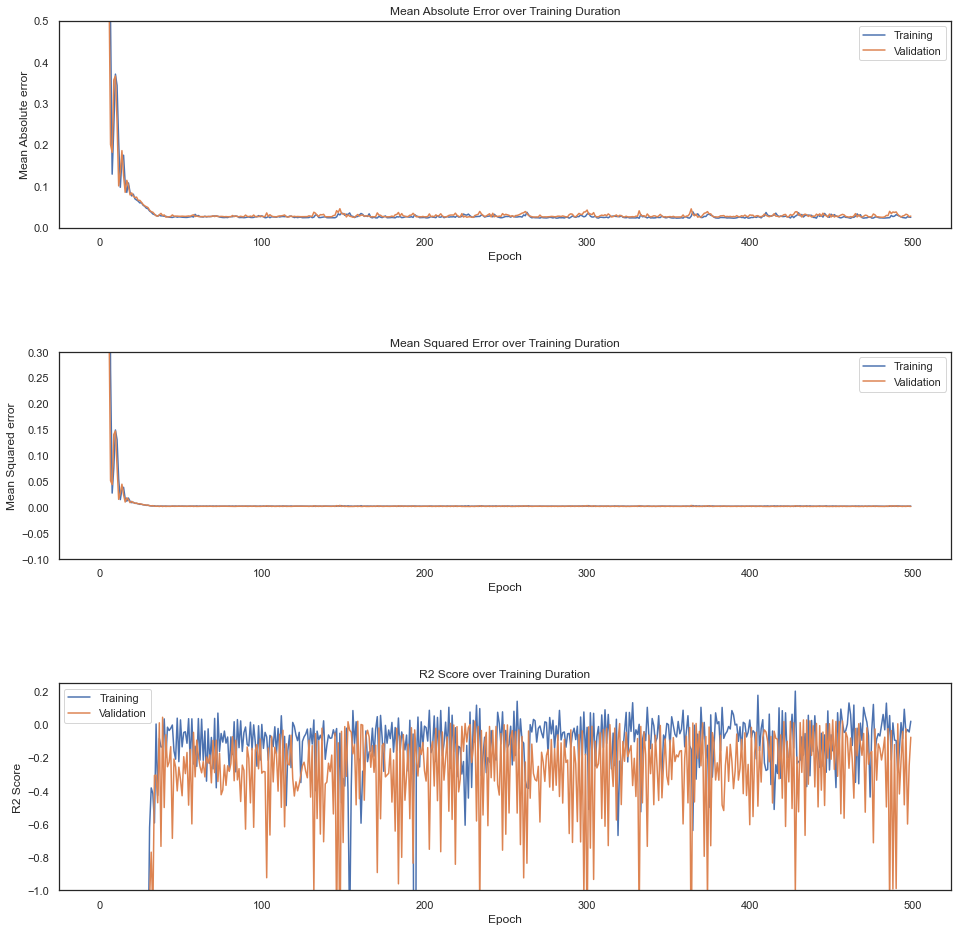

In [951]:
#Compare the models performance over training duration using plots for all three metrics

#Define plot layout
fig, axs = plt.subplots(3, 1, figsize=(16, 16))

#MAE plot
axs[0].plot(history.history['mean_absolute_error'], label="Training")
axs[0].plot(history.history['val_mean_absolute_error'], label="Validation")
axs[0].set_title("Mean Absolute Error over Training Duration")
axs[0].set_ylabel("Mean Absolute error")
axs[0].set_xlabel("Epoch")
axs[0].set_ylim(0, 0.500)
axs[0].legend()

#MSE subplot
axs[1].plot(history.history['mean_squared_error'], label="Training")
axs[1].plot(history.history['val_mean_squared_error'], label="Validation")
axs[1].set_title("Mean Squared Error over Training Duration")
axs[1].set_ylabel("Mean Squared error")
axs[1].set_xlabel("Epoch")
axs[1].set_ylim(-0.1, 0.300)
axs[1].legend()

#r2 score subplot
axs[2].plot(history.history['r2_score'], label="Training")
axs[2].plot(history.history['val_r2_score'], label="Validation")
axs[2].set_title("R2 Score over Training Duration")
axs[2].set_ylabel("R2 Score")
axs[2].set_xlabel("Epoch")
axs[2].set_ylim(-1, .25)
axs[2].legend()

#Adjust spacing
#plt.subplots_adjust(wspace=1)
plt.subplots_adjust(hspace=0.6)

#Display plots
plt.show()

In [962]:
#Perform hyperparameter tuning on the best model option to see if it can be improved

#Define function for hyperparameter tuning
def build_model(hp):
    #Start model
    model = keras.Sequential()
    #Input layer
    inp = tf.keras.layers.Input(shape=(X_train.shape[1],))
    #Test models with up to 6 dense layers
    num_dense = hp.Int('num_dense', min_value=1, max_value=6, step=1)
    #Iterate through each layer
    for i in range(num_dense):
        #Define units to test
        hp_units = hp.Int('units_{i}'.format(i=i), min_value=8, max_value=4096, step=128)
        #Define dropout values to test
        hp_drop_rate = hp.Choice('dp_{i}'.format(i=i), values=[0.0, 0.1, 0.15, 0.2, 0.25 ,0.3,
                                                               0.35,0.4, 0.5, 0.6, 0.7])
        #Define activation functions to test
        hp_activation = hp.Choice('dense_activation_{i}'.format(i=i),values=['relu', 'selu',
                                                                             'elu', 'swish'])
        #Define the way data flows through hidden layers
        x = tf.keras.layers.Dense(units=hp_units, activation=hp_activation)(inp)
        x = tf.keras.layers.Dropout(hp_drop_rate)(x)
        x = tf.keras.layers.BatchNormalization()(x)
    #Output layer
    outputs = tf.keras.layers.Dense(1, kernel_initializer='normal', activation='linear')(x)
    #Create the model with the defined input and outputs
    model = tf.keras.models.Model(inp, outputs)
    #Compile the model
    model.compile(
      optimizer=keras.optimizers.Adam(
        #Define learning rates to test
        hp.Choice('learning_rate', values = [1e-3, 1e-4, 1e-5, 0.0])),
      loss='mean_absolute_error',
      metrics=['mean_absolute_error', 'mean_squared_error', r2_score])
    return model

In [972]:
#Defining parameters
feats = np.arange(0,X.shape[1],1)
inp_size = int(np.ceil(1* len(feats)))
n_split = 5
n_repeats = 1
bests=[]
seeds = [0]
n_round = len(seeds)
shuffle_split_size = 0.2

for seed in seeds:
    split_cols = np.random.choice(feats, inp_size, replace=False)
    #Use k fold cross validation to split data into train and test
    for n, (train, test) in enumerate(KFold(n_splits = n_split, random_state=0,
                                       shuffle = True).split(X3, Y1)):
        st = time_module.time()
        #Define tuning objectives and params
        tuner = kt.tuners.BayesianOptimization(build_model,
                     kt.Objective('val_r2_score', direction="max"),
                     max_trials = 30, overwrite=True)
        start_time = time_module.time()
        X_train = X[train][:, split_cols]
        X_val = X[test][:, split_cols]
        Y_train, Y_val = Y[train], Y[test]
        #Early stop if the validation accuracy does not improve for 10 epochs
        callbacks=[EarlyStopping(monitor='mean_absolute_error', mode='min', patience=10)]
        start_time = time_module.time()
        #Perform hyperparameter search using train and val data
        tuner.search(X_train, Y_train,validation_data=(X_val, Y_val),
                            epochs = 300, batch_size = 128,
                            verbose = 0, callbacks = callbacks)
        #Create method to recall best hyperparameters identified during the trial
        n_top = 5
        best_hps = tuner.get_best_hyperparameters(n_top)
        end_time = time_module.time()
        bests.append(best_hps)
        for i in range(n_top):
            print(best_hps[i].values)
        #Print statements to monitor the progress of the tests
        print('Seed', seed, 'Fold', n, 'Time elapsed:', "{:.2f}".format((end_time-start_time)/60), 'minutes')
        #Delete old tuner for memory conservation
        del tuner

INFO:tensorflow:Oracle triggered exit
{'num_dense': 6, 'units_0': 1288, 'dp_0': 0.15, 'dense_activation_0': 'elu', 'learning_rate': 0.001, 'units_1': 1928, 'dp_1': 0.2, 'dense_activation_1': 'selu', 'units_2': 3848, 'dp_2': 0.35, 'dense_activation_2': 'selu', 'units_3': 8, 'dp_3': 0.0, 'dense_activation_3': 'relu', 'units_4': 8, 'dp_4': 0.0, 'dense_activation_4': 'relu', 'units_5': 8, 'dp_5': 0.0, 'dense_activation_5': 'relu'}
{'num_dense': 3, 'units_0': 392, 'dp_0': 0.5, 'dense_activation_0': 'swish', 'learning_rate': 0.0, 'units_1': 392, 'dp_1': 0.25, 'dense_activation_1': 'relu', 'units_2': 8, 'dp_2': 0.5, 'dense_activation_2': 'swish', 'units_3': 1032, 'dp_3': 0.15, 'dense_activation_3': 'swish', 'units_4': 1416, 'dp_4': 0.25, 'dense_activation_4': 'relu', 'units_5': 1928, 'dp_5': 0.7, 'dense_activation_5': 'relu'}
{'num_dense': 3, 'units_0': 3848, 'dp_0': 0.6, 'dense_activation_0': 'selu', 'learning_rate': 1e-05, 'units_1': 8, 'dp_1': 0.0, 'dense_activation_1': 'relu', 'units_2': 

In [966]:
#Create a checkpoint callback to save model weights during training
checkpoint_name = 'Weights-{epoch:03d}--{val_r2_score:.5f}.hdf5'
#Only save the weights if they are better than the previous optimal option
checkpoint = ModelCheckpoint(checkpoint_name, monitor='val_r2_score', mode='max', verbose=1,
                             save_best_only=True)
callbacks_list = [checkpoint]

In [974]:
#Print outcome from fold 0 seed 0
print(bests[0][0].values)

{'num_dense': 6, 'units_0': 1288, 'dp_0': 0.15, 'dense_activation_0': 'elu', 'learning_rate': 0.001, 'units_1': 1928, 'dp_1': 0.2, 'dense_activation_1': 'selu', 'units_2': 3848, 'dp_2': 0.35, 'dense_activation_2': 'selu', 'units_3': 8, 'dp_3': 0.0, 'dense_activation_3': 'relu', 'units_4': 8, 'dp_4': 0.0, 'dense_activation_4': 'relu', 'units_5': 8, 'dp_5': 0.0, 'dense_activation_5': 'relu'}


In [978]:
#Start new NN
model = keras.Sequential()

#Input layer (Reshape)
model.add(Reshape((X_train.shape[1], 1), input_shape=(X_train.shape[1],)))

#Hidden Layers
model.add(Dense(1288, kernel_initializer='normal', activation='elu'))
model.add(Dropout(0.15))

model.add(Dense(1928, kernel_initializer='normal', activation='selu'))
model.add(Dropout(0.2))

model.add(Dense(3848, kernel_initializer='normal', activation='selu'))
model.add(Dropout(0.35))

model.add(Dense(8, kernel_initializer='normal', activation='relu'))
model.add(Dropout(0.0))

model.add(Dense(8, kernel_initializer='normal', activation='relu'))
model.add(Dropout(0.0))

#Output Layer
model.add(Dense(1, kernel_initializer='normal',activation='linear'))

#Define optimizer
optimizer = Adam(learning_rate=0.001)

#Compile the network
model.compile(loss='mean_absolute_error', optimizer=optimizer, metrics=['mean_absolute_error', 'mean_squared_error', r2_score])
model.summary()

#Train the model
history0 = model.fit(X_train, Y_train, epochs=300, batch_size=128, validation_split = 0.2, callbacks = callbacks_list)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape (Reshape)           (None, 300, 1)            0         
                                                                 
 dense_4 (Dense)             (None, 300, 1288)         2576      
                                                                 
 dropout_3 (Dropout)         (None, 300, 1288)         0         
                                                                 
 dense_5 (Dense)             (None, 300, 1928)         2485192   
                                                                 
 dropout_4 (Dropout)         (None, 300, 1928)         0         
                                                                 
 dense_6 (Dense)             (None, 300, 3848)         7422792   
                                                                 
 dropout_5 (Dropout)         (None, 300, 3848)        

Epoch 14/300
1/1 [==============================] - ETA: 0s - loss: 0.0330 - mean_absolute_error: 0.0330 - mean_squared_error: 0.0027 - r2_score: -348.3408
Epoch 14: val_r2_score did not improve from -428.60104
1/1 [==============================] - 4s 4s/step - loss: 0.0330 - mean_absolute_error: 0.0330 - mean_squared_error: 0.0027 - r2_score: -348.3408 - val_loss: 0.0376 - val_mean_absolute_error: 0.0376 - val_mean_squared_error: 0.0025 - val_r2_score: -437.3429
Epoch 15/300
1/1 [==============================] - ETA: 0s - loss: 0.0298 - mean_absolute_error: 0.0298 - mean_squared_error: 0.0026 - r2_score: -338.2186
Epoch 15: val_r2_score did not improve from -428.60104
1/1 [==============================] - 4s 4s/step - loss: 0.0298 - mean_absolute_error: 0.0298 - mean_squared_error: 0.0026 - r2_score: -338.2186 - val_loss: 0.0375 - val_mean_absolute_error: 0.0375 - val_mean_squared_error: 0.0027 - val_r2_score: -470.3117
Epoch 16/300
1/1 [==============================] - ETA: 0s - 

1/1 [==============================] - ETA: 0s - loss: 0.0271 - mean_absolute_error: 0.0271 - mean_squared_error: 0.0026 - r2_score: -344.4510
Epoch 31: val_r2_score did not improve from -415.53305
1/1 [==============================] - 5s 5s/step - loss: 0.0271 - mean_absolute_error: 0.0271 - mean_squared_error: 0.0026 - r2_score: -344.4510 - val_loss: 0.0375 - val_mean_absolute_error: 0.0375 - val_mean_squared_error: 0.0028 - val_r2_score: -488.2375
Epoch 32/300
1/1 [==============================] - ETA: 0s - loss: 0.0267 - mean_absolute_error: 0.0267 - mean_squared_error: 0.0027 - r2_score: -356.8484
Epoch 32: val_r2_score did not improve from -415.53305
1/1 [==============================] - 5s 5s/step - loss: 0.0267 - mean_absolute_error: 0.0267 - mean_squared_error: 0.0027 - r2_score: -356.8484 - val_loss: 0.0383 - val_mean_absolute_error: 0.0383 - val_mean_squared_error: 0.0029 - val_r2_score: -514.8016
Epoch 33/300
1/1 [==============================] - ETA: 0s - loss: 0.0272 

Epoch 49/300
1/1 [==============================] - ETA: 0s - loss: 0.0266 - mean_absolute_error: 0.0266 - mean_squared_error: 0.0028 - r2_score: -361.6570
Epoch 49: val_r2_score did not improve from -415.53305
1/1 [==============================] - 5s 5s/step - loss: 0.0266 - mean_absolute_error: 0.0266 - mean_squared_error: 0.0028 - r2_score: -361.6570 - val_loss: 0.0377 - val_mean_absolute_error: 0.0377 - val_mean_squared_error: 0.0028 - val_r2_score: -498.7787
Epoch 50/300
1/1 [==============================] - ETA: 0s - loss: 0.0267 - mean_absolute_error: 0.0267 - mean_squared_error: 0.0028 - r2_score: -363.7900
Epoch 50: val_r2_score did not improve from -415.53305
1/1 [==============================] - 5s 5s/step - loss: 0.0267 - mean_absolute_error: 0.0267 - mean_squared_error: 0.0028 - r2_score: -363.7900 - val_loss: 0.0375 - val_mean_absolute_error: 0.0375 - val_mean_squared_error: 0.0028 - val_r2_score: -488.1350
Epoch 51/300
1/1 [==============================] - ETA: 0s - 

Epoch 67/300
1/1 [==============================] - ETA: 0s - loss: 0.0265 - mean_absolute_error: 0.0265 - mean_squared_error: 0.0027 - r2_score: -358.4919
Epoch 67: val_r2_score did not improve from -415.53305
1/1 [==============================] - 5s 5s/step - loss: 0.0265 - mean_absolute_error: 0.0265 - mean_squared_error: 0.0027 - r2_score: -358.4919 - val_loss: 0.0375 - val_mean_absolute_error: 0.0375 - val_mean_squared_error: 0.0028 - val_r2_score: -486.2877
Epoch 68/300
1/1 [==============================] - ETA: 0s - loss: 0.0266 - mean_absolute_error: 0.0266 - mean_squared_error: 0.0027 - r2_score: -357.4181
Epoch 68: val_r2_score did not improve from -415.53305
1/1 [==============================] - 5s 5s/step - loss: 0.0266 - mean_absolute_error: 0.0266 - mean_squared_error: 0.0027 - r2_score: -357.4181 - val_loss: 0.0375 - val_mean_absolute_error: 0.0375 - val_mean_squared_error: 0.0028 - val_r2_score: -487.1979
Epoch 69/300
1/1 [==============================] - ETA: 0s - 

Epoch 85/300
1/1 [==============================] - ETA: 0s - loss: 0.0265 - mean_absolute_error: 0.0265 - mean_squared_error: 0.0027 - r2_score: -360.8078
Epoch 85: val_r2_score did not improve from -415.53305
1/1 [==============================] - 5s 5s/step - loss: 0.0265 - mean_absolute_error: 0.0265 - mean_squared_error: 0.0027 - r2_score: -360.8078 - val_loss: 0.0376 - val_mean_absolute_error: 0.0376 - val_mean_squared_error: 0.0028 - val_r2_score: -490.8221
Epoch 86/300
1/1 [==============================] - ETA: 0s - loss: 0.0265 - mean_absolute_error: 0.0265 - mean_squared_error: 0.0027 - r2_score: -359.8879
Epoch 86: val_r2_score did not improve from -415.53305
1/1 [==============================] - 5s 5s/step - loss: 0.0265 - mean_absolute_error: 0.0265 - mean_squared_error: 0.0027 - r2_score: -359.8879 - val_loss: 0.0375 - val_mean_absolute_error: 0.0375 - val_mean_squared_error: 0.0028 - val_r2_score: -486.4081
Epoch 87/300
1/1 [==============================] - ETA: 0s - 

Epoch 103/300
1/1 [==============================] - ETA: 0s - loss: 0.0265 - mean_absolute_error: 0.0265 - mean_squared_error: 0.0027 - r2_score: -360.8871
Epoch 103: val_r2_score did not improve from -415.53305
1/1 [==============================] - 6s 6s/step - loss: 0.0265 - mean_absolute_error: 0.0265 - mean_squared_error: 0.0027 - r2_score: -360.8871 - val_loss: 0.0376 - val_mean_absolute_error: 0.0376 - val_mean_squared_error: 0.0028 - val_r2_score: -492.8256
Epoch 104/300
1/1 [==============================] - ETA: 0s - loss: 0.0265 - mean_absolute_error: 0.0265 - mean_squared_error: 0.0027 - r2_score: -361.3999
Epoch 104: val_r2_score did not improve from -415.53305
1/1 [==============================] - 5s 5s/step - loss: 0.0265 - mean_absolute_error: 0.0265 - mean_squared_error: 0.0027 - r2_score: -361.3999 - val_loss: 0.0375 - val_mean_absolute_error: 0.0375 - val_mean_squared_error: 0.0028 - val_r2_score: -488.9038
Epoch 105/300
1/1 [==============================] - ETA: 

1/1 [==============================] - 5s 5s/step - loss: 0.0265 - mean_absolute_error: 0.0265 - mean_squared_error: 0.0027 - r2_score: -361.1409 - val_loss: 0.0376 - val_mean_absolute_error: 0.0376 - val_mean_squared_error: 0.0028 - val_r2_score: -490.9415
Epoch 121/300
1/1 [==============================] - ETA: 0s - loss: 0.0265 - mean_absolute_error: 0.0265 - mean_squared_error: 0.0027 - r2_score: -360.4294
Epoch 121: val_r2_score did not improve from -415.53305
1/1 [==============================] - 5s 5s/step - loss: 0.0265 - mean_absolute_error: 0.0265 - mean_squared_error: 0.0027 - r2_score: -360.4294 - val_loss: 0.0375 - val_mean_absolute_error: 0.0375 - val_mean_squared_error: 0.0028 - val_r2_score: -488.8668
Epoch 122/300
1/1 [==============================] - ETA: 0s - loss: 0.0264 - mean_absolute_error: 0.0264 - mean_squared_error: 0.0027 - r2_score: -359.1622
Epoch 122: val_r2_score did not improve from -415.53305
1/1 [==============================] - 5s 5s/step - loss: 

Epoch 138/300
1/1 [==============================] - ETA: 0s - loss: 0.0264 - mean_absolute_error: 0.0264 - mean_squared_error: 0.0027 - r2_score: -360.3190

KeyboardInterrupt: 

In [ ]:
#Define plot layout
fig, axs = plt.subplots(3, 1, figsize=(16, 16))

#MAE plot
axs[0].plot(history0.history['mean_absolute_error'], label="Training")
axs[0].plot(history0.history['val_mean_absolute_error'], label="Validation")
axs[0].set_title("Mean Absolute Error over Training Duration")
axs[0].set_ylabel("Mean Absolute error")
axs[0].set_xlabel("Epoch")
#axs[0].set_ylim(0, 0.500)
axs[0].legend()

#MSE subplot
axs[1].plot(history0.history['mean_squared_error'], label="Training")
axs[1].plot(history0.history['val_mean_squared_error'], label="Validation")
axs[1].set_title("Mean Squared Error over Training Duration")
axs[1].set_ylabel("Mean Squared error")
axs[1].set_xlabel("Epoch")
#axs[1].set_ylim(-0.1, 0.300)
axs[1].legend()

#r2 score subplot
axs[2].plot(history0.history['r2_score'], label="Training")
axs[2].plot(history0.history['val_r2_score'], label="Validation")
axs[2].set_title("R2 Score over Training Duration")
axs[2].set_ylabel("R2 Score")
axs[2].set_xlabel("Epoch")
#axs[2].set_ylim(-1, .25)
axs[2].legend()

#Adjust spacing
#plt.subplots_adjust(wspace=1)
plt.subplots_adjust(hspace=0.6)

#Display plots
plt.show()

In [973]:
#Print outcome from fold 1 seed 0
print(bests[1][0].values)

{'num_dense': 4, 'units_0': 3336, 'dp_0': 0.0, 'dense_activation_0': 'relu', 'learning_rate': 0.001, 'units_1': 776, 'dp_1': 0.25, 'dense_activation_1': 'selu', 'units_2': 2440, 'dp_2': 0.25, 'dense_activation_2': 'swish', 'units_3': 8, 'dp_3': 0.5, 'dense_activation_3': 'relu', 'units_4': 2568, 'dp_4': 0.7, 'dense_activation_4': 'swish', 'units_5': 3336, 'dp_5': 0.3, 'dense_activation_5': 'elu'}


In [ ]:
#Start new NN
model = keras.Sequential()

#Input layer (Reshape)
model.add(Reshape((X_train.shape[1], 1), input_shape=(X_train.shape[1],)))

#Hidden Layers
model.add(Dense(3336, kernel_initializer='normal', activation='swish'))
model.add(Dropout(0.7))


#Output Layer
model.add(Dense(1, kernel_initializer='normal',activation='linear'))

#Define optimizer
optimizer = Adam(learning_rate=1e-5)

#Compile the network
model.compile(loss='mean_absolute_error', optimizer=optimizer, metrics=['mean_absolute_error', 'mean_squared_error', r2_score])
model.summary()

#Train the model
history1 = model.fit(X_train, Y_train, epochs=300, batch_size=128, validation_split = 0.2, callbacks = callbacks_list)

In [ ]:
#Define plot layout
fig, axs = plt.subplots(3, 1, figsize=(16, 16))

#MAE plot
axs[0].plot(history1.history['mean_absolute_error'], label="Training")
axs[0].plot(history1.history['val_mean_absolute_error'], label="Validation")
axs[0].set_title("Mean Absolute Error over Training Duration")
axs[0].set_ylabel("Mean Absolute error")
axs[0].set_xlabel("Epoch")
#axs[0].set_ylim(0, 0.500)
axs[0].legend()

#MSE subplot
axs[1].plot(history1.history['mean_squared_error'], label="Training")
axs[1].plot(history1.history['val_mean_squared_error'], label="Validation")
axs[1].set_title("Mean Squared Error over Training Duration")
axs[1].set_ylabel("Mean Squared error")
axs[1].set_xlabel("Epoch")
#axs[1].set_ylim(-0.1, 0.300)
axs[1].legend()

#r2 score subplot
axs[2].plot(history1.history['r2_score'], label="Training")
axs[2].plot(history1.history['val_r2_score'], label="Validation")
axs[2].set_title("R2 Score over Training Duration")
axs[2].set_ylabel("R2 Score")
axs[2].set_xlabel("Epoch")
#axs[2].set_ylim(-1, .25)
axs[2].legend()

#Adjust spacing
#plt.subplots_adjust(wspace=1)
plt.subplots_adjust(hspace=0.6)

#Display plots
plt.show()

In [975]:
#Print outcome from fold 2 seed 0
print(bests[2][0].values)

{'num_dense': 5, 'units_0': 2824, 'dp_0': 0.3, 'dense_activation_0': 'elu', 'learning_rate': 0.001, 'units_1': 392, 'dp_1': 0.35, 'dense_activation_1': 'relu', 'units_2': 520, 'dp_2': 0.5, 'dense_activation_2': 'relu', 'units_3': 8, 'dp_3': 0.0, 'dense_activation_3': 'relu', 'units_4': 8, 'dp_4': 0.0, 'dense_activation_4': 'relu'}


In [ ]:
#Start new NN
model = keras.Sequential()

#Input layer (Reshape)
model.add(Reshape((X_train.shape[1], 1), input_shape=(X_train.shape[1],)))

#Hidden Layers
model.add(Dense(3336, kernel_initializer='normal', activation='swish'))
model.add(Dropout(0.7))


#Output Layer
model.add(Dense(1, kernel_initializer='normal',activation='linear'))

#Define optimizer
optimizer = Adam(learning_rate=1e-5)

#Compile the network
model.compile(loss='mean_absolute_error', optimizer=optimizer, metrics=['mean_absolute_error', 'mean_squared_error', r2_score])
model.summary()

#Train the model
history2 = model.fit(X_train, Y_train, epochs=300, batch_size=128, validation_split = 0.2, callbacks = callbacks_list)

In [ ]:
#Define plot layout
fig, axs = plt.subplots(3, 1, figsize=(16, 16))

#MAE plot
axs[0].plot(history2.history['mean_absolute_error'], label="Training")
axs[0].plot(history2.history['val_mean_absolute_error'], label="Validation")
axs[0].set_title("Mean Absolute Error over Training Duration")
axs[0].set_ylabel("Mean Absolute error")
axs[0].set_xlabel("Epoch")
#axs[0].set_ylim(0, 0.500)
axs[0].legend()

#MSE subplot
axs[1].plot(history2.history['mean_squared_error'], label="Training")
axs[1].plot(history2.history['val_mean_squared_error'], label="Validation")
axs[1].set_title("Mean Squared Error over Training Duration")
axs[1].set_ylabel("Mean Squared error")
axs[1].set_xlabel("Epoch")
#axs[1].set_ylim(-0.1, 0.300)
axs[1].legend()

#r2 score subplot
axs[2].plot(history2.history['r2_score'], label="Training")
axs[2].plot(history2.history['val_r2_score'], label="Validation")
axs[2].set_title("R2 Score over Training Duration")
axs[2].set_ylabel("R2 Score")
axs[2].set_xlabel("Epoch")
#axs[2].set_ylim(-1, .25)
axs[2].legend()

#Adjust spacing
#plt.subplots_adjust(wspace=1)
plt.subplots_adjust(hspace=0.6)

#Display plots
plt.show()

In [976]:
#Print outcome from fold 3 seed 0
print(bests[3][0].values)

{'num_dense': 3, 'units_0': 1160, 'dp_0': 0.35, 'dense_activation_0': 'swish', 'learning_rate': 0.001, 'units_1': 2056, 'dp_1': 0.25, 'dense_activation_1': 'relu', 'units_2': 8, 'dp_2': 0.35, 'dense_activation_2': 'relu', 'units_3': 3720, 'dp_3': 0.35, 'dense_activation_3': 'selu', 'units_4': 2056, 'dp_4': 0.25, 'dense_activation_4': 'selu', 'units_5': 1160, 'dp_5': 0.7, 'dense_activation_5': 'selu'}


In [ ]:
#Start new NN
model = keras.Sequential()

#Input layer (Reshape)
model.add(Reshape((X_train.shape[1], 1), input_shape=(X_train.shape[1],)))

#Hidden Layers
model.add(Dense(3336, kernel_initializer='normal', activation='swish'))
model.add(Dropout(0.7))


#Output Layer
model.add(Dense(1, kernel_initializer='normal',activation='linear'))

#Define optimizer
optimizer = Adam(learning_rate=1e-5)

#Compile the network
model.compile(loss='mean_absolute_error', optimizer=optimizer, metrics=['mean_absolute_error', 'mean_squared_error', r2_score])
model.summary()

#Train the model
history3 = model.fit(X_train, Y_train, epochs=300, batch_size=128, validation_split = 0.2, callbacks = callbacks_list)

In [ ]:
#Define plot layout
fig, axs = plt.subplots(3, 1, figsize=(16, 16))

#MAE plot
axs[0].plot(history3.history['mean_absolute_error'], label="Training")
axs[0].plot(history3.history['val_mean_absolute_error'], label="Validation")
axs[0].set_title("Mean Absolute Error over Training Duration")
axs[0].set_ylabel("Mean Absolute error")
axs[0].set_xlabel("Epoch")
#axs[0].set_ylim(0, 0.500)
axs[0].legend()

#MSE subplot
axs[1].plot(history3.history['mean_squared_error'], label="Training")
axs[1].plot(history3.history['val_mean_squared_error'], label="Validation")
axs[1].set_title("Mean Squared Error over Training Duration")
axs[1].set_ylabel("Mean Squared error")
axs[1].set_xlabel("Epoch")
#axs[1].set_ylim(-0.1, 0.300)
axs[1].legend()

#r2 score subplot
axs[2].plot(history3.history['r2_score'], label="Training")
axs[2].plot(history3.history['val_r2_score'], label="Validation")
axs[2].set_title("R2 Score over Training Duration")
axs[2].set_ylabel("R2 Score")
axs[2].set_xlabel("Epoch")
#axs[2].set_ylim(-1, .25)
axs[2].legend()

#Adjust spacing
#plt.subplots_adjust(wspace=1)
plt.subplots_adjust(hspace=0.6)

#Display plots
plt.show()

In [977]:
#Print outcome from fold 4 seed 0
print(bests[4][0].values)

{'num_dense': 6, 'units_0': 2440, 'dp_0': 0.6, 'dense_activation_0': 'relu', 'learning_rate': 0.001, 'units_1': 1928, 'dp_1': 0.25, 'dense_activation_1': 'relu', 'units_2': 2312, 'dp_2': 0.7, 'dense_activation_2': 'selu', 'units_3': 2568, 'dp_3': 0.15, 'dense_activation_3': 'elu', 'units_4': 1416, 'dp_4': 0.15, 'dense_activation_4': 'relu', 'units_5': 8, 'dp_5': 0.0, 'dense_activation_5': 'relu'}


In [ ]:
#Start new NN
model = keras.Sequential()

#Input layer (Reshape)
model.add(Reshape((X_train.shape[1], 1), input_shape=(X_train.shape[1],)))

#Hidden Layers
model.add(Dense(3336, kernel_initializer='normal', activation='swish'))
model.add(Dropout(0.7))


#Output Layer
model.add(Dense(1, kernel_initializer='normal',activation='linear'))

#Define optimizer
optimizer = Adam(learning_rate=1e-5)

#Compile the network
model.compile(loss='mean_absolute_error', optimizer=optimizer, metrics=['mean_absolute_error', 'mean_squared_error', r2_score])
model.summary()

#Train the model
history4 = model.fit(X_train, Y_train, epochs=300, batch_size=128, validation_split = 0.2, callbacks = callbacks_list)

In [ ]:
#Define plot layout
fig, axs = plt.subplots(3, 1, figsize=(16, 16))

#MAE plot
axs[0].plot(history4.history['mean_absolute_error'], label="Training")
axs[0].plot(history4.history['val_mean_absolute_error'], label="Validation")
axs[0].set_title("Mean Absolute Error over Training Duration")
axs[0].set_ylabel("Mean Absolute error")
axs[0].set_xlabel("Epoch")
#axs[0].set_ylim(0, 0.500)
axs[0].legend()

#MSE subplot
axs[1].plot(history4.history['mean_squared_error'], label="Training")
axs[1].plot(history4.history['val_mean_squared_error'], label="Validation")
axs[1].set_title("Mean Squared Error over Training Duration")
axs[1].set_ylabel("Mean Squared error")
axs[1].set_xlabel("Epoch")
#axs[1].set_ylim(-0.1, 0.300)
axs[1].legend()

#r2 score subplot
axs[2].plot(history4.history['r2_score'], label="Training")
axs[2].plot(history4.history['val_r2_score'], label="Validation")
axs[2].set_title("R2 Score over Training Duration")
axs[2].set_ylabel("R2 Score")
axs[2].set_xlabel("Epoch")
#axs[2].set_ylim(-1, .25)
axs[2].legend()

#Adjust spacing
#plt.subplots_adjust(wspace=1)
plt.subplots_adjust(hspace=0.6)

#Display plots
plt.show()

In [71]:
#Load weights file of the best model and recompile the model
#weights_file = 'Weights-219--0.01308.hdf5'
#model.load_weights(weights_file)
#model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error', 'mean_squared_error', r2_score])

In [72]:
#Evaluate the model on the test data
results = model.evaluate(X_test, Y_test)

1/1 [==============================] - 1s 850ms/step - loss: 0.0230 - mean_absolute_error: 0.0230 - accuracy_within_2_percent: 0.0000e+00 - accuracy_within_5_percent: 0.0000e+00 - accuracy_within_10_percent: 0.0741


# Hyperparameter tuning for a CNN

Previous manual analysis showed more promising outcomes for CNN than basic feedforwards neural networks. The following work performs hyperparameter tuning on these neural networks to determine the optimal parameters.

In [105]:
#Adapt previous function to tune hyperparameters for a CNN

#Define function for hyperparameter tuning
def build_model(hp):
    #Start model
    model = keras.Sequential()
    #Input layer
    inp = tf.keras.layers.Input(shape=(X_train.shape[1],))
    #Convolutional layers
    num_conv_layers = hp.Int('num_conv_layers', min_value=1, max_value=3, step=1)
    #Reshape input data
    x = tf.keras.layers.Reshape((X_train.shape[1], 1))(inp)
    for i in range(num_conv_layers):
        #Define number of filters to test 
        hp_filters = hp.Int('filters_{i}'.format(i=i), min_value=4, max_value=128, step=8)
        #Define kernel size to test for each convolutional layer
        hp_kernel_size = hp.Int('kernel_size_{i}'.format(i=i), min_value=2, max_value=5, step=1)
        #Define activation function to test 
        hp_conv_activation = hp.Choice('conv_activation_{i}'.format(i=i), values=['relu', 'selu', 'elu', 'swish'])
        #Define pool sizes to test
        hp_pool_size = hp.Int('pool_size_{i}'.format(i=i), min_value=1, max_value=5, step=1)
        #Add the convolutional layer
        x = tf.keras.layers.Conv1D(filters=hp_filters, kernel_size=hp_kernel_size, activation=hp_conv_activation)(x)
        x = tf.keras.layers.MaxPooling1D(pool_size=hp_pool_size)(x)
    #Test models with up to 6 dense layers
    num_dense = hp.Int('num_dense', min_value=1, max_value=6, step=1)
    #Iterate through each layer
    for i in range(num_dense):
        #Define units to test
        hp_units = hp.Int('units_{i}'.format(i=i), min_value=8, max_value=4096, step=128)
        #Define dropout values to test
        hp_drop_rate = hp.Choice('dp_{i}'.format(i=i), values=[0.0, 0.1, 0.15, 0.2, 0.25 ,0.3,
                                                               0.35,0.4, 0.5, 0.6, 0.7])
        #Define activation functions to test
        hp_activation = hp.Choice('dense_activation_{i}'.format(i=i),values=['relu', 'selu',
                                                                             'elu', 'swish'])
        #Define the way data flows through hidden layers
        x = tf.keras.layers.Dense(units=hp_units, activation=hp_activation)(x)
        x = tf.keras.layers.Dropout(hp_drop_rate)(x)
        x = tf.keras.layers.BatchNormalization()(x)
    #Output layer
    outputs = tf.keras.layers.Dense(1, kernel_initializer='normal', activation='linear')(x)
    #Create the model with the defined input and outputs
    model = tf.keras.models.Model(inp, outputs)
    #Compile the model
    model.compile(
      optimizer=keras.optimizers.Adam(
        #Define learning rates to test
        hp.Choice('learning_rate', values = [1e-3, 1e-4, 1e-5, 0.0])),
      loss='mean_absolute_error',
      metrics=['mean_absolute_error', accuracy_within_5_percent])
    return model

In [106]:
#Use same function as before here

#Defining parameters
feats = np.arange(0,X.shape[1],1)
inp_size = int(np.ceil(1* len(feats)))
n_split = 5
n_repeats = 1
bests_cnn=[]
seeds = [0, 1]
n_round = len(seeds)
shuffle_split_size = 0.2

for seed in seeds:
    split_cols = np.random.choice(feats, inp_size, replace=False)
    #Use k fold cross validation to split data into train and test
    for n, (train, test) in enumerate(KFold(n_splits = n_split, random_state=0,
                                       shuffle = True).split(X, Y)):
        st = time_module.time()
        #Define tuning objectives and params
        tuner = kt.tuners.BayesianOptimization(build_model,
                     kt.Objective('val_accuracy_within_5_percent', direction="max"),
                     max_trials = 150, overwrite=True)
        start_time = time_module.time()
        X_train = X[train][:, split_cols]
        X_val = X[test][:, split_cols]
        Y_train, Y_val = Y[train], Y[test]
        #Early stop if the validation accuracy does not improve for 20 epochs
        callbacks=[EarlyStopping(monitor='val_accuracy_within_5_percent', mode='max', patience=20)]
        start_time = time_module.time()
        #Perform hyperparameter search using train and val data
        tuner.search(X_train, Y_train,validation_data=(X_val, Y_val),
                            epochs = 500, batch_size = 128,
                            verbose = 0, callbacks = callbacks)
        #Create method to recall best hyperparameters identified during the trial
        n_top = 5
        best_hps = tuner.get_best_hyperparameters(n_top)
        end_time = time_module.time()
        bests_cnn.append(best_hps)
        for i in range(n_top):
            print(best_hps[i].values)
        #Print statements to monitor the progress of the tests
        print('Seed', seed, 'Fold', n, 'Time elapsed:', "{:.2f}".format((end_time-start_time)/60), 'minutes')
        #Delete old tuner for memory conservation
        del tuner

INFO:tensorflow:Oracle triggered exit
{'num_conv_layers': 2, 'filters_0': 44, 'kernel_size_0': 4, 'conv_activation_0': 'swish', 'pool_size_0': 4, 'num_dense': 4, 'units_0': 1416, 'dp_0': 0.0, 'dense_activation_0': 'swish', 'learning_rate': 1e-05, 'filters_1': 12, 'kernel_size_1': 2, 'conv_activation_1': 'swish', 'pool_size_1': 3, 'units_1': 3080, 'dp_1': 0.4, 'dense_activation_1': 'swish', 'units_2': 1800, 'dp_2': 0.6, 'dense_activation_2': 'elu', 'units_3': 3976, 'dp_3': 0.1, 'dense_activation_3': 'elu', 'units_4': 1800, 'dp_4': 0.15, 'dense_activation_4': 'elu', 'filters_2': 100, 'kernel_size_2': 5, 'conv_activation_2': 'elu', 'pool_size_2': 4, 'units_5': 2952, 'dp_5': 0.5, 'dense_activation_5': 'swish'}
{'num_conv_layers': 2, 'filters_0': 68, 'kernel_size_0': 2, 'conv_activation_0': 'swish', 'pool_size_0': 4, 'num_dense': 1, 'units_0': 2824, 'dp_0': 0.2, 'dense_activation_0': 'selu', 'learning_rate': 0.0001, 'filters_1': 4, 'kernel_size_1': 4, 'conv_activation_1': 'selu', 'pool_size

INFO:tensorflow:Oracle triggered exit
{'num_conv_layers': 2, 'filters_0': 52, 'kernel_size_0': 2, 'conv_activation_0': 'swish', 'pool_size_0': 5, 'num_dense': 2, 'units_0': 3464, 'dp_0': 0.7, 'dense_activation_0': 'swish', 'learning_rate': 0.001, 'filters_1': 4, 'kernel_size_1': 2, 'conv_activation_1': 'relu', 'pool_size_1': 1, 'units_1': 8, 'dp_1': 0.0, 'dense_activation_1': 'relu'}
{'num_conv_layers': 3, 'filters_0': 52, 'kernel_size_0': 4, 'conv_activation_0': 'elu', 'pool_size_0': 4, 'num_dense': 3, 'units_0': 776, 'dp_0': 0.0, 'dense_activation_0': 'selu', 'learning_rate': 0.001, 'filters_1': 108, 'kernel_size_1': 2, 'conv_activation_1': 'elu', 'pool_size_1': 5, 'units_1': 8, 'dp_1': 0.2, 'dense_activation_1': 'relu', 'filters_2': 4, 'kernel_size_2': 2, 'conv_activation_2': 'relu', 'pool_size_2': 2, 'units_2': 1160, 'dp_2': 0.2, 'dense_activation_2': 'relu', 'units_3': 1800, 'dp_3': 0.15, 'dense_activation_3': 'swish', 'units_4': 1800, 'dp_4': 0.2, 'dense_activation_4': 'relu', 'u

INFO:tensorflow:Oracle triggered exit
{'num_conv_layers': 1, 'filters_0': 84, 'kernel_size_0': 3, 'conv_activation_0': 'swish', 'pool_size_0': 1, 'num_dense': 6, 'units_0': 2824, 'dp_0': 0.5, 'dense_activation_0': 'selu', 'learning_rate': 0.001, 'filters_1': 28, 'kernel_size_1': 4, 'conv_activation_1': 'selu', 'pool_size_1': 2, 'filters_2': 60, 'kernel_size_2': 2, 'conv_activation_2': 'selu', 'pool_size_2': 2, 'units_1': 264, 'dp_1': 0.6, 'dense_activation_1': 'swish', 'units_2': 1288, 'dp_2': 0.35, 'dense_activation_2': 'elu', 'units_3': 2056, 'dp_3': 0.15, 'dense_activation_3': 'swish', 'units_4': 2696, 'dp_4': 0.0, 'dense_activation_4': 'selu', 'units_5': 8, 'dp_5': 0.7, 'dense_activation_5': 'swish'}
{'num_conv_layers': 2, 'filters_0': 100, 'kernel_size_0': 2, 'conv_activation_0': 'elu', 'pool_size_0': 3, 'num_dense': 5, 'units_0': 776, 'dp_0': 0.0, 'dense_activation_0': 'swish', 'learning_rate': 0.0001, 'filters_1': 60, 'kernel_size_1': 4, 'conv_activation_1': 'selu', 'pool_size_1

INFO:tensorflow:Oracle triggered exit
{'num_conv_layers': 1, 'filters_0': 44, 'kernel_size_0': 5, 'conv_activation_0': 'selu', 'pool_size_0': 4, 'num_dense': 5, 'units_0': 2568, 'dp_0': 0.5, 'dense_activation_0': 'selu', 'learning_rate': 0.001, 'units_1': 1800, 'dp_1': 0.25, 'dense_activation_1': 'elu', 'units_2': 1800, 'dp_2': 0.25, 'dense_activation_2': 'selu', 'units_3': 8, 'dp_3': 0.25, 'dense_activation_3': 'swish', 'units_4': 1416, 'dp_4': 0.3, 'dense_activation_4': 'elu', 'units_5': 136, 'dp_5': 0.25, 'dense_activation_5': 'elu', 'filters_1': 52, 'kernel_size_1': 2, 'conv_activation_1': 'relu', 'pool_size_1': 1, 'filters_2': 52, 'kernel_size_2': 5, 'conv_activation_2': 'relu', 'pool_size_2': 1}
{'num_conv_layers': 1, 'filters_0': 108, 'kernel_size_0': 3, 'conv_activation_0': 'swish', 'pool_size_0': 3, 'num_dense': 6, 'units_0': 3976, 'dp_0': 0.4, 'dense_activation_0': 'relu', 'learning_rate': 0.001, 'units_1': 8, 'dp_1': 0.0, 'dense_activation_1': 'relu', 'units_2': 8, 'dp_2': 0

In [111]:
#Print outcome from fold 4 seed 0
print(bests_cnn[4][0].values)

{'num_conv_layers': 1, 'filters_0': 68, 'kernel_size_0': 3, 'conv_activation_0': 'elu', 'pool_size_0': 3, 'num_dense': 4, 'units_0': 3976, 'dp_0': 0.15, 'dense_activation_0': 'swish', 'learning_rate': 1e-05, 'filters_1': 60, 'kernel_size_1': 3, 'conv_activation_1': 'elu', 'pool_size_1': 5, 'filters_2': 52, 'kernel_size_2': 5, 'conv_activation_2': 'swish', 'pool_size_2': 3, 'units_1': 3080, 'dp_1': 0.6, 'dense_activation_1': 'swish', 'units_2': 3720, 'dp_2': 0.1, 'dense_activation_2': 'swish', 'units_3': 904, 'dp_3': 0.1, 'dense_activation_3': 'swish', 'units_4': 2696, 'dp_4': 0.4, 'dense_activation_4': 'selu', 'units_5': 2568, 'dp_5': 0.2, 'dense_activation_5': 'relu'}


In [121]:
#Print outcome from fold 0 seed 0
print(bests_cnn[0][0].values)

{'num_conv_layers': 3, 'filters_0': 116, 'kernel_size_0': 5, 'conv_activation_0': 'elu', 'pool_size_0': 3, 'num_dense': 6, 'units_0': 136, 'dp_0': 0.1, 'dense_activation_0': 'selu', 'units_1': 2440, 'dp_1': 0.6, 'dense_activation_1': 'swish', 'units_2': 8, 'dp_2': 0.5, 'dense_activation_2': 'swish', 'learning_rate': 1e-05, 'filters_1': 4, 'kernel_size_1': 2, 'conv_activation_1': 'relu', 'pool_size_1': 1, 'filters_2': 4, 'kernel_size_2': 2, 'conv_activation_2': 'relu', 'pool_size_2': 1, 'units_3': 8, 'dp_3': 0.0, 'dense_activation_3': 'relu', 'units_4': 8, 'dp_4': 0.0, 'dense_activation_4': 'relu', 'units_5': 8, 'dp_5': 0.0, 'dense_activation_5': 'relu'}


# Reframe as classification problem